# Model per customer, LSTM

* [1. Prepare the data](#1)
* [2. Modeling](#2)

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl # colors
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from datetime import datetime as dt
import pickle
import sys

from IPython.display import display # to print tables inside the code cell

plt.rcParams['axes.grid'] = True
plt.rcParams['axes.axisbelow'] = True
plt.rcParams['axes.xmargin'] = 0.02
plt.rcParams['axes.ymargin'] = 0.1
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['ytick.minor.visible'] = True

plt.rcParams['figure.dpi'] = 50
plt.rcParams['savefig.bbox'] = 'tight'

In [2]:
#n_customers = 500
n_customers = 1000

We are trying to predict the customer's next basket content using reccurent neural network based on the Long Short-Term Memory (LSTM) model. In the first part of this notebook we prepare the data, the second part covers the modeling.

## 1. Prepare the data <a id='1'></a>

Let's read in the files, set up some memory control and select from the file orders only those orders that correspond to train sample (prior and next orders).

In [3]:
orders         = pd.read_csv("./data/orders.csv",usecols=['order_id','user_id','eval_set','order_number'])
products_prior = pd.read_csv("./data/order_products__prior.csv")
products_train = pd.read_csv("./data/order_products__train.csv")

print(orders.shape)
print(products_prior.shape) 
print(products_train.shape)

(3421083, 4)
(32434489, 4)
(1384617, 4)


In [4]:
def size(x,n=2):
    return '{} G'.format(round(sys.getsizeof(x)/1_000_000_000.,n))

In [5]:
print(size(orders))
print(size(products_prior))
print(size(products_train))

0.29 G
1.04 G
0.04 G


In [6]:
round(orders.memory_usage(deep=True).sum()/1_000_000_000.,2)

0.29

In [7]:
orders.head(15)

,order_id,user_id,eval_set,order_number
0,2539329,1,prior,1
1,2398795,1,prior,2
2,473747,1,prior,3
3,2254736,1,prior,4
4,431534,1,prior,5
5,3367565,1,prior,6
6,550135,1,prior,7
7,3108588,1,prior,8
8,2295261,1,prior,9
9,2550362,1,prior,10


In [8]:
products_prior.head()

,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0


In [9]:
products_train.head()

,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1
1,1,11109,2,1
2,1,10246,3,0
3,1,49683,4,0
4,1,43633,5,1


In [10]:
products_prior.shape, products_train.shape

((32434489, 4), (1384617, 4))

__Select users from the train sample (skip the test sample)__

In [11]:
uid = orders.groupby('user_id')['eval_set'].unique()
uid

user_id
1         [prior, train]
2         [prior, train]
3          [prior, test]
4          [prior, test]
5         [prior, train]
               ...      
206205    [prior, train]
206206     [prior, test]
206207     [prior, test]
206208     [prior, test]
206209    [prior, train]
Name: eval_set, Length: 206209, dtype: object

In [12]:
uid_train = uid[uid.astype('str').str.contains('train')].reset_index()
uid_train = uid_train.drop('eval_set',axis=1)
uid_train

,user_id
0,1
1,2
2,5
3,7
4,8
...,...
131204,206199
131205,206200
131206,206203
131207,206205


In [13]:
size(uid_train,3)

'0.001 G'

We have 130k customers, let's choose only the first n_customers:

In [14]:
uid_train_reduced = uid_train.head(n_customers)
uid_train_reduced.shape

(1000, 1)

Now, let's merge it back with orders. 

In [15]:
orders_train = uid_train_reduced.merge(orders,on='user_id',how='left').drop('eval_set',axis=1)
orders_train

,user_id,order_id,order_number
0,1,2539329,1
1,1,2398795,2
2,1,473747,3
3,1,2254736,4
4,1,431534,5
...,...,...,...
16152,1566,1072793,9
16153,1566,2757377,10
16154,1566,1346273,11
16155,1566,2511444,12


In [16]:
orders_train.shape; size(orders_train,5)

'0.00052 G'

__Merge customers with products__

In [17]:
products = pd.concat((products_prior,products_train))
products.shape,size(products)

((33819106, 4), '1.35 G')

In [18]:
products

,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0
...,...,...,...,...
1384612,3421063,14233,3,1
1384613,3421063,35548,4,1
1384614,3421070,35951,1,1
1384615,3421070,16953,2,1


In [19]:
o = orders_train.merge(products,on='order_id',how='left').drop(['add_to_cart_order','order_id'],axis=1)
o.head(20)

,user_id,order_number,product_id,reordered
0,1,1,196,0
1,1,1,14084,0
2,1,1,12427,0
3,1,1,26088,0
4,1,1,26405,0
5,1,2,196,1
6,1,2,10258,0
7,1,2,12427,1
8,1,2,13176,0
9,1,2,26088,1


How many products per user? Integrated over orders (for one-hot encoding):

In [20]:
o.groupby('user_id')['product_id'].agg(['count','nunique'])

,count,nunique
user_id,,
1,70,19
2,226,121
5,46,28
7,215,69
8,67,50
...,...,...
1557,37,21
1559,252,108
1562,168,67


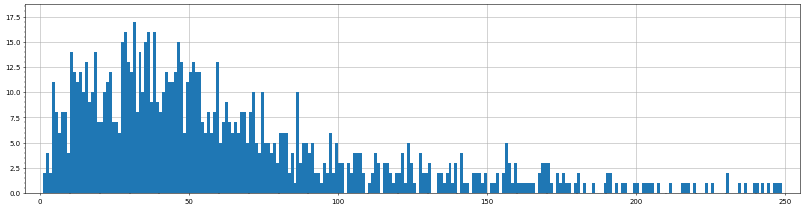

In [21]:
o.groupby('user_id')['product_id'].nunique().hist(bins=250,range=(0,250),figsize=(20,5));

Show only reordered, we will use only these:

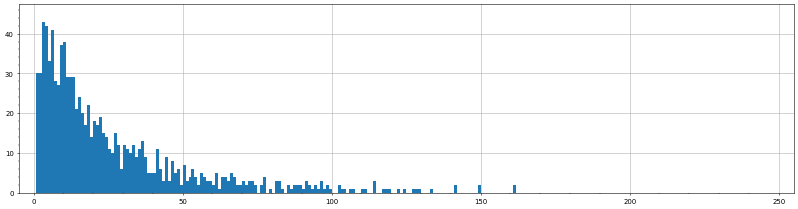

In [22]:
o[o['reordered'] == 1].groupby('user_id')['product_id'].nunique().hist(bins=250,range=(0,250),figsize=(20,5));

In [23]:
o.groupby('user_id')['product_id'].unique()

user_id
1       [196, 14084, 12427, 26088, 26405, 10258, 13176...
2       [32792, 47766, 20574, 12000, 48110, 22474, 165...
5       [15349, 21413, 48775, 28289, 8518, 11777, 3171...
7       [45628, 39275, 6361, 45066, 13249, 31683, 519,...
8       [21903, 28985, 6473, 39110, 39812, 20920, 3203...
                              ...                        
1557    [5769, 21572, 21386, 703, 4422, 5258, 35269, 4...
1559    [21903, 21908, 32689, 21616, 30233, 15598, 759...
1562    [432, 37067, 43352, 29307, 28289, 19048, 36178...
1565    [12392, 41549, 18908, 44354, 37119, 47823, 616...
1566    [44632, 21709, 14947, 39947, 12576, 28342, 266...
Name: product_id, Length: 1000, dtype: object

Let's get the list of users in this reduced sample of n_customer:

In [24]:
users = o['user_id'].unique()
users

array([   1,    2,    5,    7,    8,    9,   10,   13,   14,   17,   18,
         21,   23,   24,   27,   29,   30,   34,   37,   38,   41,   42,
         43,   44,   46,   47,   48,   49,   50,   52,   53,   55,   56,
         59,   62,   63,   64,   65,   66,   67,   70,   71,   72,   74,
         76,   78,   79,   80,   81,   82,   83,   84,   86,   87,   88,
         89,   90,   91,   93,   95,   96,   97,   99,  102,  103,  104,
        105,  106,  108,  109,  110,  111,  112,  113,  114,  115,  116,
        117,  118,  119,  120,  121,  123,  124,  125,  128,  130,  131,
        132,  135,  138,  139,  140,  142,  143,  144,  145,  146,  147,
        148,  150,  155,  157,  160,  161,  163,  164,  167,  169,  171,
        173,  174,  175,  176,  178,  179,  183,  184,  185,  187,  189,
        191,  192,  193,  195,  197,  198,  199,  201,  203,  204,  205,
        206,  208,  209,  210,  211,  212,  213,  214,  215,  217,  218,
        219,  220,  222,  223,  224,  226,  229,  2

## 2. Modeling <a id='2'></a>

Prepare Keras libraries and metric functions:

In [25]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import GRU
from keras.layers import Bidirectional
from keras.layers import Dense

from keras.callbacks import EarlyStopping

In [26]:
# returns individual Precision, Recall, F1 score
def individual_score(y_true, y_pred):
    
    len_true = np.dot(y_true,y_true)
    len_pred = np.dot(y_pred,y_pred)
    len_comm = np.dot(y_true,y_pred)
        
    # both empty
    if len_true + len_pred == 0:
        return 1.,1.,1.

    # nothing in common (includes both: none vs sth and sth vs none, so no division by zero 
    if len_comm == 0: 
        return 0.,0.,0.
    
    p = 1. * len_comm / len_pred
    r = 1. * len_comm / len_true
    
    return p, r, 2 * p * r / (p + r)
    
def mean_precision_score(y_true, y_pred):

    return np.mean([individual_score(x, y)[0] for x, y in zip(y_true, y_pred)])    
    
def mean_recall_score(y_true, y_pred):

    return np.mean([individual_score(x, y)[1] for x, y in zip(y_true, y_pred)])       
    
def mean_f1_score(y_true, y_pred):

    return np.mean([individual_score(x, y)[2] for x, y in zip(y_true, y_pred)])

In [27]:
print(mean_f1_score([0,0],[0,0]),mean_f1_score([[1,0],[0,0]],[[0,0],[0,0]]),mean_f1_score([[0,0],[1,0]],[[1,1],[0,1]]))

1.0 0.5 0.0


Classifier in the dense layer will return product probabilities, p. Tune the threshold (1 if p>thres else 0) to maximize mean F1 score.

In [28]:
def find_threshold(y_true,y_pred_prob):
    
    x = []; f = []
    
    for t in np.arange(0.,1.,0.01):
        
        y_pred = np.where(y_pred_prob > t, 1, 0)
        
        x.append(t)
        f.append(individual_score(y_true,y_pred)[2])

    return x[np.argmax(f)]

Callback, set it to 10, i.e. stop model training if loss function does not improve after n_clbks.

In [29]:
n_clbks = 10

In [30]:
callback = EarlyStopping(patience=n_clbks,restore_best_weights=True)

Now, the long loop over customers. For each customer:
* format the data as (1,n_orders, OHE_products)
* we use sliding window, i.e.:
    * [ 0 , n_orders-2] for training
    * [ 1 , n_orders-1] for validation (test)
    * [ 2 , n_orders] for prediction
* calculate baseline prediction, as a hard copy of the last order, to compare to prediction 
* also make a hard copy of the second last order, to compare to validation

CPU times: user 1 µs, sys: 0 ns, total: 1 µs
Wall time: 2.62 µs
------------
0 ) user id = 1


,196,10258,12427,13032,13176,25133,26088,26405,38928,39657,46149,49235
order_number,,,,,,,,,,,,
2,1,0,1,0,0,0,1,0,0,0,0,0
3,1,1,1,0,0,0,0,0,0,0,0,0
4,1,1,1,0,0,1,0,1,0,0,0,0
5,1,1,1,0,1,1,0,0,0,0,0,0
6,1,1,1,0,0,1,0,0,0,0,0,0
7,1,1,1,1,0,1,0,0,0,0,0,0
8,1,1,1,0,0,1,0,0,0,0,0,0
9,1,1,1,0,0,1,0,0,0,0,1,1
10,1,1,1,1,0,1,0,0,0,0,1,0


norders,nproducts= 7 12
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 12)                1200      
_________________________________________________________________
dense (Dense)                (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(10, 12)
(7, 12) (12,)
(7, 12) (12,)
thres= 0.37
copyTest: Pre=0.83 Rec=0.83 F1=0.83
test:     Pre=0.83 Rec=0.83 F1=0.83
copyLast: Pre=0.83 Rec=0.50 F1=0.62
pred:     Pre=0.83 Rec=0.50 F1=0.62
true: [1 1 0 1 0 1 1 1 1 1 1 1]
pred: [1 1 1 0 0 1 0 0 0 0 1 1]
[0.88 0.66 0.77 0.1  0.07 0.98 0.05 0.29 0.15 0.34 0.55 0.73]
Time (sec): 1.782049
------------
1 ) user id = 2


,1559,2002,2573,5450,7781,7963,9681,12000,13351,16589,...,34688,36735,40198,41787,45066,45613,46886,47209,47766,48110
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,1,1,0,0,...,0,1,0,0,1,0,0,1,0,0
7,0,0,0,0,0,0,0,1,0,1,...,1,0,0,1,1,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,1,1,0,1
9,1,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
10,1,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 10 42
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 42)                14280     
_________________________________________________________________
dense_1 (Dense)              (None, 42)                1806      
Total params: 16,086
Trainable params: 16,086
Non-trainable params: 0
_________________________________________________________________
(13, 42)
(10, 42) (42,)
(10, 42) (42,)
thres= 0.43
copyTest: Pre=0.55 Rec=0.60 F1=0.57
test:     Pre=0.53 Rec=0.80 F1=0.64
copyLast: Pre=0.20 Rec=0.17 F1=0.18
pred:     Pre=0.27 Rec=0.33 F1=0.30
true: [0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 1 0 0 1 0 0 0 1 1
 1 0 0 0 0]
pred: [1 0 1 0 0 0 0 0 1 1 0 1 1 0 1 0 0 0 1 1 0 0 1 1 0 0 0 0 1 0 1 0 0 1 0 0 0
 0 0 1 0 0]
[0.66 0.1  0.47 0.25 0.15 0.34 0.05 0.35 0.66 0.81 0.13 0.5  0.84 0.07
 0.7  0.14 0.26 0.19 0.89 0.63 0.25

,8518,11777,13988,15349,21413,21616,24535,26604,40706,43693
order_number,,,,,,,,,,
2,0,1,0,0,0,0,1,1,0,1
3,0,1,0,0,0,0,0,1,0,0
4,1,1,1,0,1,0,1,1,1,1
5,0,0,0,1,1,1,0,0,1,0


norders,nproducts= 1 10
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 10)                840       
_________________________________________________________________
dense_2 (Dense)              (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=0.80 Rec=1.00 F1=0.89
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [0 0 0 1 1 1 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.49 0.51 0.5  0.5  0.5  0.49 0.5  0.5  0.5  0.5 ]
Time (sec): 0.897884
------------
3 ) user id = 7


,519,4920,4945,6361,8277,8518,9598,10895,12196,13198,...,39121,39275,40852,42803,43967,45066,45537,45628,47272,49508
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,1,0,0,1,0,0,1,...,0,0,1,0,1,1,1,1,0,1
4,0,0,0,1,0,0,0,0,0,1,...,0,0,1,1,1,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,0,1,...,0,1,0,1,1,0,0,0,0,0
9,0,1,0,0,0,0,0,0,0,0,...,1,1,1,0,0,0,1,1,0,0
10,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,1,0,0,1,0,0


norders,nproducts= 17 41
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 41)                13612     
_________________________________________________________________
dense_3 (Dense)              (None, 41)                1722      
Total params: 15,334
Trainable params: 15,334
Non-trainable params: 0
_________________________________________________________________
(20, 41)
(17, 41) (41,)
(17, 41) (41,)
thres= 0.46
copyTest: Pre=0.40 Rec=0.17 F1=0.24
test:     Pre=0.55 Rec=0.50 F1=0.52
copyLast: Pre=0.25 Rec=0.38 F1=0.30
pred:     Pre=0.36 Rec=0.50 F1=0.42
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 1
 0 0 1 0]
pred: [1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0
 1 0 1 0]
[0.71 0.47 0.36 0.17 0.32 0.37 0.76 0.3  0.79 0.21 0.09 0.29 0.35 0.21
 0.21 0.22 0.83 0.41 0.15 0.45 0.22 0.1

,2078,9839,14992,15937,17794,18531,21903,23165,28985,32030,34358,41540
order_number,,,,,,,,,,,,
2,1,1,1,0,1,0,1,1,1,1,0,0
3,1,0,0,0,1,1,0,1,0,0,1,0
4,0,0,0,1,0,0,1,1,0,0,0,1


norders,nproducts= 0 12
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
5 ) user id = 9


,481,1559,4957,6489,8467,8834,10132,12075,17600,18926,...,30967,33754,38159,38277,38988,40571,41844,42347,42828,45767
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,1,0,0,1,0,1,0,0,0,1,...,0,1,0,1,0,1,0,0,1,1
4,0,1,0,0,1,1,1,1,1,1,...,1,1,0,0,1,1,1,1,1,0


norders,nproducts= 0 30
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
6 ) user id = 10


,260,1529,9339,9871,13829,16185,16797,17828,19019,20632,...,36865,40604,40706,42625,42647,46979,47042,47380,47526,47591
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,1,0
4,0,1,1,0,0,0,1,0,0,0,...,0,1,1,0,0,1,1,0,1,0
5,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,0,1,1


norders,nproducts= 1 31
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 31)                7812      
_________________________________________________________________
dense_4 (Dense)              (None, 31)                992       
Total params: 8,804
Trainable params: 8,804
Non-trainable params: 0
_________________________________________________________________
(4, 31)
(1, 31) (31,)
(1, 31) (31,)
thres= 0.31
copyTest: Pre=0.80 Rec=0.31 F1=0.44
test:     Pre=0.45 Rec=1.00 F1=0.62
copyLast: Pre=1.00 Rec=0.45 F1=0.62
pred:     Pre=0.80 Rec=0.14 F1=0.24
true: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0]
[0.19 0.2  0.16 0.2  0.19 0.17 0.86 0.16 0.21 0.14 0.15 0.2  0.22 0.17
 0.17 0.15 0.18 0.83 0.17 0.79 0.19 0.14 0.19 0.16 0.14 0.18 0.16 0.18
 0.83 0.84 0.17]

,1689,4210,5618,5652,18168,19934,25134,27086,27435,32446,33735,41351,42248,43086
order_number,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,1,0,0,0,0,0,0
3,1,1,0,0,0,0,0,1,1,1,0,0,0,0
4,0,0,0,0,0,0,0,1,1,0,1,0,0,0
5,1,1,0,0,0,0,0,1,1,0,1,0,0,0
6,1,1,0,0,0,0,0,1,1,0,0,0,0,0
7,1,1,0,1,0,0,0,1,1,0,1,0,0,0
8,0,1,0,1,0,0,0,1,1,0,0,0,0,0
9,0,1,0,0,0,0,1,1,0,0,1,0,0,0
10,0,1,1,1,1,0,1,1,0,0,0,0,1,1


norders,nproducts= 9 14
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (None, 14)                1624      
_________________________________________________________________
dense_5 (Dense)              (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(12, 14)
(9, 14) (14,)
(9, 14) (14,)
thres= 0.51
copyTest: Pre=0.67 Rec=0.80 F1=0.73
test:     Pre=0.44 Rec=0.80 F1=0.57
copyLast: Pre=0.60 Rec=0.75 F1=0.67
pred:     Pre=0.33 Rec=0.75 F1=0.46
true: [0 1 0 0 0 1 0 1 1 0 0 0 0 0]
pred: [0 1 1 0 1 0 1 1 1 0 1 1 0 1]
[0.48 0.53 0.6  0.51 0.56 0.47 0.55 0.51 0.53 0.46 0.54 0.55 0.44 0.64]
Time (sec): 1.242361
------------
8 ) user id = 14


,3808,5077,5818,8744,11131,11418,12232,12703,13966,15078,...,33360,35264,37266,37434,39545,44212,44799,45407,46547,49481
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,1,1,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,1,0,1,1,0,0
9,0,1,0,1,0,1,1,1,0,1,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 10 32
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_6 (LSTM)                (None, 32)                8320      
_________________________________________________________________
dense_6 (Dense)              (None, 32)                1056      
Total params: 9,376
Trainable params: 9,376
Non-trainable params: 0
_________________________________________________________________
(13, 32)
(10, 32) (32,)
(10, 32) (32,)
thres= 0.21
copyTest: Pre=0.86 Rec=0.75 F1=0.80
test:     Pre=0.89 Rec=1.00 F1=0.94
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.44 Rec=0.50 F1=0.47
true: [1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0]
pred: [0 0 0 1 1 1 0 0 1 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0]
[0.   0.   0.14 1.   0.61 0.84 0.   0.   0.94 0.   1.   1.   0.16 0.
 0.   0.94 0.04 0.   0.   0.89 0.   0.   0.   0.   0.9  0.   0.   0.
 0.   0.   0

,1073,1774,2927,5128,6212,6334,7026,7350,9006,9387,...,40203,40592,40844,42356,43986,44265,47141,47940,48544,48933
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
7,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 36 45
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (None, 45)                16380     
_________________________________________________________________
dense_7 (Dense)              (None, 45)                2070      
Total params: 18,450
Trainable params: 18,450
Non-trainable params: 0
_________________________________________________________________
(39, 45)
(36, 45) (45,)
(36, 45) (45,)
thres= 0.28
copyTest: Pre=0.36 Rec=0.57 F1=0.44
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.29 Rec=0.67 F1=0.40
pred:     Pre=0.07 Rec=0.67 F1=0.13
true: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0]
pred: [1 1 0 0 0 1 1 1 1 1 1 0 0 1 0 1 1 0 1 1 1 1 1 1 0 1 0 0 0 0 0 0 0 1 1 1 1
 1 1 0 1 1 0 0 1]
[0.43 0.73 0.17 0.12 0.27 0.56 0.63 0.62 0.57 0.61 0.4  0.18 0.21 0.78
 0.27 0.37 0.59 0.11 0.

,343,10807,21137,22031,25997,36216,47546
order_number,,,,,,,
2,0,0,0,0,0,1,0
3,0,0,0,0,0,1,1
4,0,0,0,0,0,1,1
5,1,1,0,1,0,1,1
7,0,0,1,1,1,1,1


norders,nproducts= 2 7
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_8 (LSTM)                (None, 7)                 420       
_________________________________________________________________
dense_8 (Dense)              (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(5, 7)
(2, 7) (7,)
(2, 7) (7,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.40 F1=0.57
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.60 Rec=0.60 F1=0.60
pred:     Pre=0.71 Rec=1.00 F1=0.83
true: [0 0 1 1 1 1 1]
pred: [1 1 1 1 1 1 1]
[0.5  0.51 0.5  0.49 0.5  0.51 0.49]
Time (sec): 0.960712
------------
11 ) user id = 21


,4006,4606,6348,10151,10957,12683,14788,15902,17616,18523,...,37646,43645,43814,44156,44375,44632,45603,46842,47766,48988
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
5,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,1,0,1
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


norders,nproducts= 29 34
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_9 (LSTM)                (None, 34)                9384      
_________________________________________________________________
dense_9 (Dense)              (None, 34)                1190      
Total params: 10,574
Trainable params: 10,574
Non-trainable params: 0
_________________________________________________________________
(32, 34)
(29, 34) (34,)
(29, 34) (34,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=1.00 F1=0.21
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.15 Rec=1.00 F1=0.26
true: [0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.2  0.28 0.35 0.28 0.38 0.64 0.32 0.25 0.32 0.39 0.38 0.55 0.47 0.35
 0.49 0.45 0.13 0.19 0.22 0.19 0.33 0.37 0.7  0.54 0.35 0.45 0.38 0.14

,3919,13544,22021,33819,42372,48205,48871,49306
order_number,,,,,,,,
4,1,1,0,1,0,0,1,0
5,0,1,1,1,1,1,0,1


norders,nproducts= -1 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
13 ) user id = 24


,6184,7249,7987,23423,31222,33081,42447,44172
order_number,,,,,,,,
3,0,0,0,0,1,0,0,0
4,0,0,0,1,0,0,0,0
5,0,0,0,1,1,0,0,0
8,1,0,0,1,1,0,0,0
9,0,0,0,0,0,0,0,1
11,0,0,0,0,1,0,0,0
12,0,1,0,0,0,1,1,0
13,1,0,0,0,0,0,0,0
14,0,1,0,0,0,0,0,0


norders,nproducts= 11 8
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_10 (LSTM)               (None, 8)                 544       
_________________________________________________________________
dense_10 (Dense)             (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(14, 8)
(11, 8) (8,)
(11, 8) (8,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 1 0 0 0]
pred: [0 1 1 0 1 0 0 0]
[0.33 0.79 0.49 0.   0.56 0.06 0.42 0.02]
Time (sec): 1.747325
------------
14 ) user id = 27


,457,1005,1185,1194,1323,1559,1998,2966,3098,3765,...,45774,46049,46676,46906,47087,47491,48210,48559,48747,48870
order_number,,,,,,,,,,,,,,,,,,,,,
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
79,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
80,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 74 128
Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_11 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_11 (Dense)             (None, 128)               16512     
Total params: 148,096
Trainable params: 148,096
Non-trainable params: 0
_________________________________________________________________
(77, 128)
(74, 128) (128,)
(74, 128) (128,)
thres= 0.39
copyTest: Pre=0.42 Rec=0.35 F1=0.38
test:     Pre=0.30 Rec=0.43 F1=0.36
copyLast: Pre=0.39 Rec=0.64 F1=0.49
pred:     Pre=0.12 Rec=0.29 F1=0.17
true: [0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0]
pred: [0 0 1 0 0

,1261,1330,3696,6128,8523,8806,9875,12720,12879,16953,...,39170,39185,39803,41210,41298,42258,42551,48290,48800,49615
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,1,1
3,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,1,1
4,0,0,0,0,0,0,1,0,1,0,...,1,1,1,0,0,0,0,0,1,1
5,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,1,1
6,0,0,0,1,0,0,1,0,1,0,...,1,1,0,0,0,0,0,1,1,1
7,0,1,1,0,0,0,1,0,0,0,...,1,1,0,1,0,0,0,0,1,1
8,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,0,1
10,0,1,0,1,0,0,1,0,1,0,...,1,1,0,0,0,0,0,0,1,1


norders,nproducts= 15 36
Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_12 (LSTM)               (None, 36)                10512     
_________________________________________________________________
dense_12 (Dense)             (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(18, 36)
(15, 36) (36,)
(15, 36) (36,)
thres= 0.38
copyTest: Pre=0.46 Rec=0.75 F1=0.57
test:     Pre=0.28 Rec=1.00 F1=0.43
copyLast: Pre=0.88 Rec=0.41 F1=0.56
pred:     Pre=0.59 Rec=1.00 F1=0.74
true: [0 1 0 1 0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 0 0 1 1]
pred: [1 1 0 1 0 1 1 1 0 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1]
[0.39 0.66 0.28 0.47 0.25 0.69 0.56 0.47 0.37 0.4  0.71 0.42 0.51 0.48
 0.48 0.23 0.46 0.64 0.31 0.24 0.53 0.52 0.68 0.56 0.47 0.4 

,21386,23288,38300
order_number,,,
2,1,0,0
3,1,0,0
4,1,0,0
5,1,0,0
8,0,0,1
9,0,1,0


norders,nproducts= 3 3
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_13 (LSTM)               (None, 3)                 84        
_________________________________________________________________
dense_13 (Dense)             (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(6, 3)
(3, 3) (3,)
(3, 3) (3,)
thres= 0.51
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0]
pred: [0 0 1]
[0.49 0.49 0.56]
Time (sec): 0.874603
------------
17 ) user id = 34


,3957,7054,15604,27845,35547,38273
order_number,,,,,,
2,1,0,0,0,0,0
4,0,0,0,0,1,1
5,1,1,1,0,0,0
6,0,1,0,1,0,1


norders,nproducts= 1 6
Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_14 (LSTM)               (None, 6)                 312       
_________________________________________________________________
dense_14 (Dense)             (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1 0 1 0 1]
pred: [1 1 1 1 1 1]
[0.48 0.53 0.52 0.48 0.5  0.48]
Time (sec): 1.154113
------------
18 ) user id = 37


,4367,5134,8518,8986,9036,12395,13922,13932,16349,17170,...,36287,36606,39748,40604,41065,41220,43713,45007,45200,46969
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,1,1,...,0,0,1,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
11,1,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 19 41
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_15 (LSTM)               (None, 41)                13612     
_________________________________________________________________
dense_15 (Dense)             (None, 41)                1722      
Total params: 15,334
Trainable params: 15,334
Non-trainable params: 0
_________________________________________________________________
(22, 41)
(19, 41) (41,)
(19, 41) (41,)
thres= 0.26
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=1.00 F1=0.21
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=0.17 Rec=0.80 F1=0.29
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 1 0 0]
pred: [1 0 1 1 0 1 1 1 1 0 0 0 1 1 0 1 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 0 1 1 1 1 1
 1 1 1 0]
[0.4  0.15 0.34 0.69 0.21 0.3  0.73 0.31 0.31 0.2  0.23 0.14 0.3  0.78
 0.23 0.57 0.23 0.14 0.05 0.17 0.43 0.

,116,2086,3397,3469,4781,4799,5031,6873,7948,9217,...,27344,27509,29987,31343,32655,36550,37119,43304,45437,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,1,...,0,1,0,1,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,1,1
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,1,0,0,0,0,1
6,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,1,0,0,0,0,1
7,0,1,0,1,0,0,1,1,0,0,...,0,1,1,1,1,0,1,1,1,1
8,0,0,0,1,0,0,1,0,0,0,...,1,1,1,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,1,0,...,0,1,0,1,1,0,0,0,0,1


norders,nproducts= 9 41
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_16 (LSTM)               (None, 41)                13612     
_________________________________________________________________
dense_16 (Dense)             (None, 41)                1722      
Total params: 15,334
Trainable params: 15,334
Non-trainable params: 0
_________________________________________________________________
(12, 41)
(9, 41) (41,)
(9, 41) (41,)
thres= 0.28
copyTest: Pre=0.11 Rec=0.50 F1=0.18
test:     Pre=0.06 Rec=1.00 F1=0.11
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=0.90 F1=0.39
true: [0 1 1 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1
 0 0 0 1]
pred: [1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1
 1 1 1 1]
[0.3  0.55 0.59 0.38 0.5  0.36 0.63 0.21 0.3  0.25 0.3  0.36 0.56 0.45
 0.32 0.54 0.49 0.63 0.3  0.39 0.43 0.51 

,1987,4605,11512,25146,25890,26384,28985,29180,34496,40198,41805,44310,45104,46886
order_number,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,1,0,0,1,0,0,0,0,0,1,0
4,1,0,0,0,0,0,1,1,0,0,1,1,1,0
5,0,0,1,0,0,1,1,1,1,1,0,0,1,1
6,0,1,0,0,1,0,1,1,0,0,0,0,0,0


norders,nproducts= 2 14
Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_17 (LSTM)               (None, 14)                1624      
_________________________________________________________________
dense_17 (Dense)             (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(5, 14)
(2, 14) (14,)
(2, 14) (14,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.38 F1=0.43
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.29 Rec=1.00 F1=0.44
true: [0 1 0 0 1 0 1 1 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.46 0.51 0.51 0.52 0.48 0.54 0.52 0.49 0.5  0.49 0.53 0.51 0.48]
Time (sec): 1.152168
------------
21 ) user id = 42


,79,1263,7557,8866,9290,11865,12381,13176,13187,18439,...,32599,33394,35607,37055,39275,41973,43693,46650,46847,49518
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,1,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
8,0,0,0,0,0,1,0,1,0,1,...,0,0,0,0,0,0,1,0,0,1
9,1,1,0,0,0,0,0,0,1,1,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,0,0,0,0,0


norders,nproducts= 13 36
Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_18 (LSTM)               (None, 36)                10512     
_________________________________________________________________
dense_18 (Dense)             (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(16, 36)
(13, 36) (36,)
(13, 36) (36,)
thres= 0.76
copyTest: Pre=0.75 Rec=0.86 F1=0.80
test:     Pre=0.86 Rec=0.86 F1=0.86
copyLast: Pre=0.57 Rec=0.67 F1=0.62
pred:     Pre=0.50 Rec=0.67 F1=0.57
true: [0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0]
pred: [0 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0]
[0.06 0.39 0.05 0.86 0.97 0.02 0.99 0.02 0.02 0.95 0.7  0.   0.06 0.02
 0.03 0.08 0.17 0.99 0.01 0.   0.01 0.07 1.   0.01 0.06 0.07

,196,3452,4605,4920,6352,8204,9360,9647,11233,11777,...,36784,38154,41273,42431,44570,45066,46480,46981,47941,48205
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,1
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,1
8,0,0,0,0,0,1,0,1,0,0,...,1,1,0,0,0,0,1,0,1,0
9,1,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,1,0,0,1
10,0,1,0,1,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,1,1


norders,nproducts= 8 36
Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_19 (LSTM)               (None, 36)                10512     
_________________________________________________________________
dense_19 (Dense)             (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(11, 36)
(8, 36) (36,)
(8, 36) (36,)
thres= 0.29
copyTest: Pre=0.27 Rec=0.57 F1=0.36
test:     Pre=0.21 Rec=1.00 F1=0.35
copyLast: Pre=0.43 Rec=0.15 F1=0.22
pred:     Pre=0.48 Rec=0.75 F1=0.59
true: [0 0 0 1 0 1 1 0 0 1 1 1 0 0 1 0 0 1 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 1 0 1]
pred: [1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1 1]
[0.34 0.69 0.49 0.47 0.41 0.22 0.34 0.47 0.57 0.65 0.59 0.54 0.46 0.54
 0.48 0.36 0.52 0.27 0.36 0.6  0.69 0.42 0.29 0.33 0.28 0.28 0.

,1073,5955,18653,21616,26172,37131
order_number,,,,,,
2,1,0,1,0,0,0
3,1,1,0,1,1,1


norders,nproducts= -1 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
24 ) user id = 46


,2481,4605,6934,13733,14354,14814,15290,16768,16797,21781,...,36070,38775,40574,40910,40925,41164,42987,45009,45064,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
6,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,1,0
7,0,0,1,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,0,0,0
8,0,0,0,1,0,1,0,0,0,0,...,0,0,1,0,0,1,1,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,1,0,0
10,0,0,1,1,0,1,0,0,0,1,...,0,0,0,0,0,0,1,1,0,0


norders,nproducts= 16 31
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_20 (LSTM)               (None, 31)                7812      
_________________________________________________________________
dense_20 (Dense)             (None, 31)                992       
Total params: 8,804
Trainable params: 8,804
Non-trainable params: 0
_________________________________________________________________
(19, 31)
(16, 31) (31,)
(16, 31) (31,)
thres= 0.28
copyTest: Pre=0.43 Rec=0.25 F1=0.32
test:     Pre=0.48 Rec=0.92 F1=0.63
copyLast: Pre=0.33 Rec=0.67 F1=0.44
pred:     Pre=0.21 Rec=0.83 F1=0.33
true: [0 1 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 0 1 1 1 1 0 1 1 1 0 1 1 1 0 1 0 1 1 1 1 1 0 1 1 1 1 0 1 1]
[0.43 0.59 0.26 0.29 0.4  0.35 0.53 0.22 0.41 0.35 0.55 0.18 0.63 0.36
 0.36 0.28 0.35 0.28 0.44 0.37 0.46 0.54 0.28 0.19 0.63 0.56 0.52 0.53
 0.2  0.76 

,15120,24838,24852
order_number,,,
3,1,0,1
4,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
26 ) user id = 48


,4455,4855,5450,8057,11140,17284,17720,19508,20339,21405,...,33000,35855,36695,37065,41238,43662,43999,44636,45007,46979
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,1,...,0,0,1,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,1,1,0,1,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
6,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,1,0
7,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
8,0,0,1,1,0,0,1,1,0,1,...,0,0,0,0,1,0,0,0,1,0
9,1,1,1,1,1,1,0,0,0,1,...,1,1,0,1,0,0,1,0,0,1
10,1,0,1,0,0,0,1,0,1,0,...,0,0,0,1,0,1,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,1,0


norders,nproducts= 6 24
Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_21 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_21 (Dense)             (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(9, 24)
(6, 24) (24,)
(6, 24) (24,)
thres= 0.51
copyTest: Pre=0.31 Rec=0.57 F1=0.40
test:     Pre=0.44 Rec=0.57 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.12 Rec=0.20 F1=0.15
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0]
pred: [0 0 0 1 0 0 1 1 1 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0]
[0.51 0.43 0.48 0.55 0.5  0.5  0.53 0.52 0.51 0.48 0.53 0.45 0.49 0.5
 0.5  0.53 0.49 0.48 0.46 0.53 0.44 0.51 0.52 0.5 ]
Time (sec): 1.225982
------------
27 ) user id = 49


,7644,16797,35833
order_number,,,
8,0,1,1
9,1,0,0


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
28 ) user id = 50


,5612,5876,5922,6182,6341,7014,7054,8518,9666,9839,...,42701,43789,45007,46069,46667,47018,47209,47601,48679,48775
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
6,1,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
65,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
66,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 64 54
Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_22 (LSTM)               (None, 54)                23544     
_________________________________________________________________
dense_22 (Dense)             (None, 54)                2970      
Total params: 26,514
Trainable params: 26,514
Non-trainable params: 0
_________________________________________________________________
(67, 54)
(64, 54) (54,)
(64, 54) (54,)
thres= 0.32
copyTest: Pre=0.12 Rec=0.11 F1=0.12
test:     Pre=0.25 Rec=0.89 F1=0.39
copyLast: Pre=0.44 Rec=0.67 F1=0.53
pred:     Pre=0.12 Rec=0.67 F1=0.21
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 0 1 1 0 1 1 1 0 1 1 0 1 1 1 0 1 1 1 0 0 0 0 1 1 1 1 0 1 1 1 0 1 1 0 0 1
 1 0 0 0 1 0 1 1 1 1 0 0 1 1 0 0 0]
[0.34 0.26 0.48 0.5  0.17 0.42 0.57 0.5  0.22 0.46 0.68 0

,116,196,3298,6184,8048,8953,10441,11266,12341,14309,...,39408,40063,41400,41787,42489,43352,46149,46516,49083,49243
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
3,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,1,0,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
10,0,1,1,1,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 24 27
Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_23 (LSTM)               (None, 27)                5940      
_________________________________________________________________
dense_23 (Dense)             (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(27, 27)
(24, 27) (27,)
(24, 27) (27,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.35 Rec=0.88 F1=0.50
copyLast: Pre=0.25 Rec=0.40 F1=0.31
pred:     Pre=0.19 Rec=0.80 F1=0.31
true: [0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0]
pred: [1 1 1 0 1 1 1 1 1 1 0 0 1 0 1 1 1 1 1 1 0 0 1 1 1 1 1]
[0.49 0.51 0.51 0.48 0.5  0.54 0.51 0.49 0.5  0.5  0.48 0.47 0.52 0.46
 0.5  0.49 0.52 0.51 0.48 0.55 0.48 0.47 0.49 0.53 0.49 0.48 0.49]
Time (sec): 0.942845
----------

,377,11210,32864
order_number,,,
3,0,0,1
4,1,1,0


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
31 ) user id = 55


,4658,5194,7413,7736,7781,13328,13740,17616,18175,21333,...,25152,30827,33000,39491,41273,42460,46906,47672,47766,48183
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,1,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,1,0,1,1,1,0,0,0,...,1,0,1,1,1,0,0,0,1,0
5,1,0,1,0,0,0,0,1,0,0,...,1,1,0,1,1,1,1,0,0,0
6,1,0,1,0,0,0,1,0,1,0,...,0,0,0,1,0,0,0,1,0,0
7,1,1,1,0,1,0,0,1,1,1,...,0,0,0,1,0,1,1,0,0,0
8,1,0,1,1,0,0,0,0,1,0,...,0,0,0,1,0,0,1,0,1,1


norders,nproducts= 4 21
Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_24 (LSTM)               (None, 21)                3612      
_________________________________________________________________
dense_24 (Dense)             (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(7, 21)
(4, 21) (21,)
(4, 21) (21,)
thres= 0.34
copyTest: Pre=0.71 Rec=0.45 F1=0.56
test:     Pre=0.55 Rec=1.00 F1=0.71
copyLast: Pre=0.45 Rec=0.62 F1=0.53
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [1 0 1 1 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.58 0.43 0.39 0.52 0.44 0.36 0.55 0.39 0.51 0.44 0.49 0.39 0.42 0.52
 0.64 0.51 0.48 0.42 0.6  0.39 0.37]
Time (sec): 1.188493
------------
32 ) user id = 56


,79,1360,2966,3583,3822,11777,12315,13565,16048,16797,...,36758,39216,40587,42300,46654,46979,47626,47652,49247,49273
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,1,0,0,0,0,...,0,1,0,0,0,0,1,1,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
6,0,1,0,1,0,0,0,0,0,0,...,0,1,0,1,1,0,0,1,0,1
7,0,0,0,1,1,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,1
8,0,0,1,0,0,1,0,0,1,0,...,0,0,0,1,1,0,1,1,0,1
9,1,0,0,1,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,1,0
10,0,0,1,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,1


norders,nproducts= 9 33
Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_25 (LSTM)               (None, 33)                8844      
_________________________________________________________________
dense_25 (Dense)             (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(12, 33)
(9, 33) (33,)
(9, 33) (33,)
thres= 0.78
copyTest: Pre=0.14 Rec=0.33 F1=0.20
test:     Pre=1.00 Rec=0.33 F1=0.50
copyLast: Pre=0.33 Rec=0.12 F1=0.18
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0]
pred: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
[0.46 0.6  0.26 0.67 0.47 0.81 0.23 0.29 0.65 0.6  0.42 0.48 0.14 0.49
 0.46 0.37 0.17 0.18 0.3  0.27 0.2  0.74 0.27 0.7  0.45 0.07 0.22 0.19
 0.61 

,4472,8277,10082,11140,13176,14211,19057,19611,20920,21137,...,22935,24838,25931,27086,34243,40545,44408,47209,47719,47888
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,1,1,0,0,0,0,0,0,1,0
5,0,1,0,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
6,0,0,0,0,1,0,0,1,0,0,...,0,1,1,0,0,0,0,0,1,0
7,0,0,0,0,1,0,0,0,0,0,...,0,1,1,1,0,0,1,0,1,0
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,1,1,1,0,0,1,...,0,1,0,0,0,1,0,1,0,0
11,1,0,1,0,1,0,0,1,0,1,...,0,0,1,1,0,1,1,1,0,1


norders,nproducts= 6 21
Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_26 (LSTM)               (None, 21)                3612      
_________________________________________________________________
dense_26 (Dense)             (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(9, 21)
(6, 21) (21,)
(6, 21) (21,)
thres= 0.21
copyTest: Pre=1.00 Rec=0.12 F1=0.22
test:     Pre=0.44 Rec=1.00 F1=0.62
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.57 Rec=1.00 F1=0.73
true: [1 0 1 0 1 0 0 1 0 1 1 0 0 1 1 0 1 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.22 0.38 0.23 0.41 0.65 0.38 0.46 0.51 0.35 0.52 0.4  0.29 0.37 0.43
 0.38 0.24 0.29 0.33 0.27 0.43 0.44]
Time (sec): 1.565257
------------
34 ) user id = 62


,8277,8518,11777,16797,24852,26209,26620,30233,34584,36011,36695,37947,38288,39121,46692,47209,49075
order_number,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
5,0,0,1,1,0,0,1,0,1,1,0,1,0,0,0,0,0
6,0,0,1,1,1,1,1,0,0,0,1,0,0,0,1,0,0
7,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
10,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0
11,1,1,0,0,1,0,0,0,0,0,1,1,1,1,0,0,1


norders,nproducts= 6 17
Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_27 (LSTM)               (None, 17)                2380      
_________________________________________________________________
dense_27 (Dense)             (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(9, 17)
(6, 17) (17,)
(6, 17) (17,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.58 Rec=0.88 F1=0.70
true: [1 1 0 0 1 0 0 0 0 0 1 1 1 1 0 0 1]
pred: [1 1 0 1 1 1 1 0 0 0 1 0 1 1 1 1 1]
[0.51 0.53 0.47 0.47 0.51 0.5  0.52 0.44 0.46 0.47 0.55 0.46 0.51 0.5
 0.49 0.52 0.57]
Time (sec): 0.959367
------------
35 ) user id = 63


,1463,2228,2435,3952,5120,5876,6348,6719,6750,7559,...,45007,45613,46075,47209,47223,47672,49175,49235,49273,49628
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,1,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,1,0,1,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 36 72
Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_28 (LSTM)               (None, 72)                41760     
_________________________________________________________________
dense_28 (Dense)             (None, 72)                5256      
Total params: 47,016
Trainable params: 47,016
Non-trainable params: 0
_________________________________________________________________
(39, 72)
(36, 72) (72,)
(36, 72) (72,)
thres= 0.68
copyTest: Pre=0.40 Rec=0.86 F1=0.55
test:     Pre=0.50 Rec=0.71 F1=0.59
copyLast: Pre=0.57 Rec=0.33 F1=0.42
pred:     Pre=0.40 Rec=0.33 F1=0.36
true: [1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1]
pred: [1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 

,4210,4920,5473,5699,8022,13176,14947,18288,18811,18840,...,36758,36772,36929,40334,40723,44008,44359,45374,46969,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,1,0,0,1,1
6,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,1,1
7,0,0,1,1,0,0,0,1,1,1,...,0,1,1,1,1,0,1,0,1,1
8,0,1,0,0,1,0,0,1,0,0,...,0,1,1,0,1,1,1,0,1,1
9,0,0,0,0,0,0,0,1,0,0,...,1,0,0,0,1,0,1,0,1,1
10,0,1,0,1,0,1,0,0,1,0,...,0,0,1,1,1,1,1,0,1,1
11,0,0,0,0,1,1,1,0,1,0,...,0,0,0,0,1,0,1,1,1,1


norders,nproducts= 6 30
Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_29 (LSTM)               (None, 30)                7320      
_________________________________________________________________
dense_29 (Dense)             (None, 30)                930       
Total params: 8,250
Trainable params: 8,250
Non-trainable params: 0
_________________________________________________________________
(9, 30)
(6, 30) (30,)
(6, 30) (30,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.33 F1=0.44
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.50 Rec=0.64 F1=0.56
pred:     Pre=0.47 Rec=1.00 F1=0.64
true: [0 0 0 0 1 1 1 0 1 0 0 1 0 0 1 0 1 1 0 1 0 0 0 0 1 0 1 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.5  0.52 0.56 0.53 0.48 0.5  0.52 0.56 0.41 0.47 0.5  0.52 0.41
 0.53 0.41 0.44 0.45 0.46 0.47 0.62 0.42 0.5  0.44 0.43 0.54 0.58 0.48
 0.48 0.53]
Time (se

,4605,4799,5161,5337,6656,9076,11136,11534,13176,20734,...,27966,32201,33768,38164,39275,40604,42891,43154,43961,44781
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,1,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,1
5,0,0,1,1,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,1,0,1,1,0,0,1,1,...,0,0,0,0,0,0,1,0,0,0
7,0,0,1,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0
11,0,0,1,0,1,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 10 22
Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_30 (LSTM)               (None, 22)                3960      
_________________________________________________________________
dense_30 (Dense)             (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(13, 22)
(10, 22) (22,)
(10, 22) (22,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.12 F1=0.18
test:     Pre=0.36 Rec=1.00 F1=0.53
copyLast: Pre=0.38 Rec=0.50 F1=0.43
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 1 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.42 0.54 0.44 0.45 0.46 0.5  0.5  0.47 0.43 0.42 0.43 0.44 0.48
 0.51 0.49 0.45 0.41 0.4  0.54 0.49 0.5 ]
Time (sec): 1.099838
------------
38 ) user id = 66


,8143,28842,31829,32347,42014
order_number,,,,,
2,0,0,0,1,0
3,1,0,0,0,0
5,0,1,1,0,0
6,1,0,0,0,0
7,1,1,0,0,1


norders,nproducts= 2 5
Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_31 (LSTM)               (None, 5)                 220       
_________________________________________________________________
dense_31 (Dense)             (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.60 Rec=1.00 F1=0.75
true: [1 1 0 0 1]
pred: [1 1 1 1 1]
[0.5  0.5  0.52 0.5  0.5 ]
Time (sec): 0.891374
------------
39 ) user id = 67


,130,196,3298,6184,10310,13176,13575,18023,38928,39657,43154,47402
order_number,,,,,,,,,,,,
2,0,1,0,0,0,1,1,0,0,0,1,0
3,0,1,0,0,0,1,0,0,0,0,0,0
4,0,1,0,1,0,1,0,0,0,0,0,0
5,0,1,0,0,0,1,0,0,0,0,0,0
6,0,1,0,0,0,1,1,0,0,0,0,0
7,0,0,0,1,0,1,0,0,0,0,0,0
8,0,1,0,0,0,1,0,0,0,0,0,0
9,1,1,0,0,0,1,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 20 12
Model: "sequential_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_32 (LSTM)               (None, 12)                1200      
_________________________________________________________________
dense_32 (Dense)             (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(23, 12)
(20, 12) (12,)
(20, 12) (12,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.14 Rec=1.00 F1=0.25
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=0.33 F1=0.25
true: [0 1 0 1 0 1 0 0 0 0 0 0]
pred: [1 1 0 0 1 0 0 0 1 0 0 1]
[0.53 0.53 0.47 0.47 0.52 0.48 0.48 0.48 0.49 0.47 0.49 0.51]
Time (sec): 0.931561
------------
40 ) user id = 70


,1006,2314,4713,6851,10673,14104,16020,16044,16920,21799,...,30960,33129,34703,36086,37520,42736,43961,44277,45840,49363
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1,0,1,1,0,1,0,0,0,0,...,0,1,1,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 9 24
Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_33 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_33 (Dense)             (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(12, 24)
(9, 24) (24,)
(9, 24) (24,)
thres= 0.5700000000000001
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=0.50 F1=0.29
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0]
[0.16 0.14 0.28 0.52 0.24 0.41 0.73 0.56 0.46 0.45 0.68 0.21 0.07 0.41
 0.07 0.34 0.25 0.67 0.14 0.54 0.59 0.13 0.25 0.4 ]
Time (sec): 1.564213
------------
41 ) user id 

,45,117,2825,3376,5785,6336,6788,7128,9385,9598,...,45002,45007,45368,46584,47209,47861,48364,48745,48857,48953
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
5,1,1,0,0,1,0,0,0,0,1,...,0,0,0,0,1,0,0,0,1,1
6,1,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,1,1
7,0,1,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,1
8,1,1,0,0,1,0,1,0,1,0,...,0,0,0,0,0,1,0,0,1,0
9,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,1,1,1
10,0,1,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,1,1,1


norders,nproducts= 20 72
Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_34 (LSTM)               (None, 72)                41760     
_________________________________________________________________
dense_34 (Dense)             (None, 72)                5256      
Total params: 47,016
Trainable params: 47,016
Non-trainable params: 0
_________________________________________________________________
(23, 72)
(20, 72) (72,)
(20, 72) (72,)
thres= 0.52
copyTest: Pre=0.45 Rec=0.53 F1=0.49
test:     Pre=0.48 Rec=0.63 F1=0.55
copyLast: Pre=0.58 Rec=0.55 F1=0.56
pred:     Pre=0.41 Rec=0.55 F1=0.47
true: [0 1 0 1 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 1]
pred: [1 1 0 0 0 0 1 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 1 0
 0 1 1 1 0 1 0 0 0 1 1 0 1 0 0 1 0 0 0 1 0 1 0 1 1 0 0 1 

,8424,11116,18288,24964,26369,27992,32553,38689,46906
order_number,,,,,,,,,
2,0,0,0,0,0,0,1,1,0
3,0,0,0,0,0,0,1,1,0
4,0,0,1,0,0,0,1,1,0
5,0,0,1,0,0,0,1,1,1
6,1,0,0,0,1,1,1,1,1
7,0,0,0,0,0,0,1,1,1
8,0,0,0,1,0,0,1,1,0
9,0,0,0,0,0,0,1,1,0
10,0,0,0,0,0,0,1,1,0


norders,nproducts= 9 9
Model: "sequential_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_35 (LSTM)               (None, 9)                 684       
_________________________________________________________________
dense_35 (Dense)             (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(12, 9)
(9, 9) (9,)
(9, 9) (9,)
thres= 0.04
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 0 0 0 0 1 0]
pred: [0 1 0 0 1 0 1 1 0]
[0.01 0.07 0.04 0.   0.07 0.01 0.82 0.79 0.01]
Time (sec): 1.638685
------------
43 ) user id = 74


,6740,8230,11072,22935,25659,33055,42768
order_number,,,,,,,
3,0,0,0,0,0,1,0
5,0,1,1,1,1,0,1
6,1,0,0,0,0,0,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
44 ) user id = 76


,17858,21376,36107
order_number,,,
2,0,0,1
5,0,0,1
6,0,0,1
7,0,0,1
8,0,0,1
9,0,1,1
10,1,0,1


norders,nproducts= 4 3
Model: "sequential_36"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_36 (LSTM)               (None, 3)                 84        
_________________________________________________________________
dense_36 (Dense)             (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(7, 3)
(4, 3) (3,)
(4, 3) (3,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 0 1]
pred: [1 1 1]
[0.42 0.35 0.83]
Time (sec): 2.679683
------------
45 ) user id = 78


,9387,18880,23687,40648,47759
order_number,,,,,
2,0,0,1,0,0
4,1,1,0,0,0
7,0,0,0,1,1


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
46 ) user id = 79


,3896,4656,5876,13176,16616,19057,21137,22281,23233,27845,...,29987,32747,34243,34262,36550,40678,43961,44910,45570,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,1,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
3,0,0,0,1,0,0,1,0,0,0,...,0,1,0,0,1,0,0,0,0,0
4,1,0,0,1,0,0,1,0,0,0,...,0,1,1,0,0,0,0,0,1,0
5,1,1,1,1,0,1,1,1,0,1,...,0,1,1,1,1,0,1,1,1,1
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,1,1
7,0,0,0,1,0,1,1,0,0,1,...,1,0,0,0,1,0,0,0,0,1
8,0,0,0,1,1,1,1,0,1,1,...,0,1,1,0,1,0,0,1,0,0


norders,nproducts= 4 21
Model: "sequential_37"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_37 (LSTM)               (None, 21)                3612      
_________________________________________________________________
dense_37 (Dense)             (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(7, 21)
(4, 21) (21,)
(4, 21) (21,)
thres= 0.37
copyTest: Pre=0.40 Rec=0.29 F1=0.33
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.71 Rec=0.50 F1=0.59
pred:     Pre=0.47 Rec=0.70 F1=0.56
true: [0 0 0 1 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 0 0]
pred: [1 0 0 1 1 1 1 1 0 1 1 1 0 0 0 1 1 1 1 1 1]
[0.41 0.35 0.33 0.68 0.44 0.38 0.4  0.43 0.37 0.45 0.52 0.48 0.28 0.25
 0.37 0.51 0.75 0.45 0.53 0.7  0.54]
Time (sec): 1.14887
------------
47 ) user id = 80


,3583,4792,4920,5131,7035,8193,8710,9387,12545,13176,...,29487,33002,33716,43713,45066,47626,47630,48523,48878,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,1,0,0,1,...,0,0,0,0,0,0,1,0,0,0
4,0,1,0,0,0,0,1,0,0,1,...,0,0,1,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,1,0,0,0
6,0,0,1,1,0,0,1,1,0,1,...,0,1,0,0,0,0,1,0,0,0
7,0,0,1,0,0,0,1,1,0,1,...,0,0,0,0,0,0,1,0,0,0
8,0,1,0,0,0,0,1,0,0,1,...,1,0,0,1,0,0,1,0,0,0
9,1,1,0,0,0,1,1,0,0,1,...,0,0,0,0,0,1,1,0,0,1
10,0,1,1,0,0,0,1,0,1,1,...,0,1,0,1,1,0,1,1,1,0


norders,nproducts= 9 22
Model: "sequential_38"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_38 (LSTM)               (None, 22)                3960      
_________________________________________________________________
dense_38 (Dense)             (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(12, 22)
(9, 22) (22,)
(9, 22) (22,)
thres= 0.51
copyTest: Pre=0.60 Rec=0.86 F1=0.71
test:     Pre=0.55 Rec=0.86 F1=0.67
copyLast: Pre=0.71 Rec=0.45 F1=0.56
pred:     Pre=0.73 Rec=0.73 F1=0.73
true: [1 1 0 0 0 0 1 0 1 1 1 1 0 1 0 1 0 0 1 0 1 0]
pred: [0 1 0 0 1 0 1 0 1 1 1 1 0 1 0 0 1 1 1 0 0 0]
[0.48 0.63 0.5  0.41 0.6  0.38 0.56 0.32 0.62 0.56 0.58 0.68 0.45 0.7
 0.46 0.41 0.72 0.62 0.67 0.44 0.47 0.3 ]
Time (sec): 1.365354
------------
48 ) user id = 81


,196,6184,8048,12341,13176,17902,38768
order_number,,,,,,,
4,0,0,0,0,1,0,0
5,1,1,0,0,0,0,1
7,0,0,0,1,0,1,1
8,0,0,1,0,0,0,0


norders,nproducts= 1 7
Model: "sequential_39"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_39 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dense_39 (Dense)             (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.47000000000000003
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.14 Rec=1.00 F1=0.25
true: [0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1]
[0.49 0.51 0.51 0.49 0.48 0.49 0.5 ]
Time (sec): 0.97919
------------
49 ) user id = 82


,196,6184,10441,11759,13176,13575,16953,27839,30450,37710,38928,39275,39581,42265,43352,43721,45128,46149,49235
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,1,0,0,0,1,1,0,0,0,1,1,0,1,0,0,1,0,1,0
5,0,0,1,0,1,1,0,0,1,1,1,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0
7,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,0,0,1
9,1,0,0,0,1,1,1,0,1,1,0,1,0,0,0,0,0,0,1
10,1,0,0,0,0,1,1,0,1,1,0,1,0,0,1,0,0,0,1
11,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1


norders,nproducts= 15 19
Model: "sequential_40"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_40 (LSTM)               (None, 19)                2964      
_________________________________________________________________
dense_40 (Dense)             (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(18, 19)
(15, 19) (19,)
(15, 19) (19,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.17 F1=0.29
test:     Pre=0.32 Rec=1.00 F1=0.48
copyLast: Pre=0.33 Rec=0.40 F1=0.36
pred:     Pre=0.26 Rec=1.00 F1=0.42
true: [0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.53 0.49 0.54 0.39 0.42 0.5  0.42 0.47 0.51 0.49 0.48 0.56 0.55
 0.59 0.49 0.47 0.5  0.46]
Time (sec): 0.994997
------------
50 ) user id = 83


,2186,16254,20600,24157,24841,25513,26856,28286,42828,46496
order_number,,,,,,,,,,
3,0,0,0,1,0,0,0,0,0,0
4,0,1,1,1,0,0,0,1,0,1
5,0,0,0,0,1,0,0,0,0,1
6,0,1,1,1,0,1,0,0,1,0
7,1,1,0,0,0,0,1,0,0,0


norders,nproducts= 2 10
Model: "sequential_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_41 (LSTM)               (None, 10)                840       
_________________________________________________________________
dense_41 (Dense)             (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(5, 10)
(2, 10) (10,)
(2, 10) (10,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [1 1 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.49 0.48 0.51 0.49 0.51 0.51 0.51 0.5  0.51 0.48]
Time (sec): 0.955642
------------
51 ) user id = 84


,1158,3896,4086,12312,21903,23165,34448,35535,36127,45007,47766,48595,49520
order_number,,,,,,,,,,,,,
3,0,1,1,0,0,0,0,0,0,0,0,0,0
4,0,1,1,0,0,0,0,0,0,0,0,0,1
5,0,0,0,1,0,0,0,0,0,0,0,1,0
6,1,1,0,0,0,0,1,0,0,0,1,1,1
7,0,1,0,0,1,1,0,1,0,1,1,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,1,0,1,0,0


norders,nproducts= 4 13
Model: "sequential_42"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_42 (LSTM)               (None, 13)                1404      
_________________________________________________________________
dense_42 (Dense)             (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(7, 13)
(4, 13) (13,)
(4, 13) (13,)
thres= 0.44
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.17
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=1.00 F1=0.29
true: [0 0 0 0 0 0 0 0 1 0 1 0 0]
pred: [1 1 1 0 1 1 1 1 1 1 1 1 1]
[0.46 0.48 0.45 0.41 0.53 0.52 0.48 0.52 0.49 0.56 0.45 0.55 0.45]
Time (sec): 1.262353
------------
52 ) user id = 86


,329,1529,2078,2228,2846,5876,7156,8174,8518,10017,...,41065,41593,43014,43789,45007,45063,45200,47209,47907,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,1,0,1,0,0,0
8,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 14 53
Model: "sequential_43"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_43 (LSTM)               (None, 53)                22684     
_________________________________________________________________
dense_43 (Dense)             (None, 53)                2862      
Total params: 25,546
Trainable params: 25,546
Non-trainable params: 0
_________________________________________________________________
(17, 53)
(14, 53) (53,)
(14, 53) (53,)
thres= 0.37
copyTest: Pre=0.08 Rec=0.14 F1=0.10
test:     Pre=0.18 Rec=1.00 F1=0.30
copyLast: Pre=0.43 Rec=0.27 F1=0.33
pred:     Pre=0.21 Rec=0.73 F1=0.33
true: [0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1]
pred: [1 1 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 0 1 1 1 1 1
 1 1 1 1 1 1 0 0 1 1 1 0 0 1 1 0]
[0.43 0.58 0.28 0.47 0.28 0.36 0.44 0.39 0.47 0.43 0.37 0.58 

,2187,2391,3835,3999,5385,5460,15109,18132,19057,21137,...,31553,33198,33787,37066,39527,39719,40336,44570,47626,48790
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 23 35
Model: "sequential_44"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_44 (LSTM)               (None, 35)                9940      
_________________________________________________________________
dense_44 (Dense)             (None, 35)                1260      
Total params: 11,200
Trainable params: 11,200
Non-trainable params: 0
_________________________________________________________________
(26, 35)
(23, 35) (35,)
(23, 35) (35,)
thres= 0.33
copyTest: Pre=0.55 Rec=0.55 F1=0.55
test:     Pre=0.32 Rec=1.00 F1=0.49
copyLast: Pre=0.45 Rec=0.71 F1=0.56
pred:     Pre=0.18 Rec=0.86 F1=0.30
true: [0 0 1 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.5  0.64 0.31 0.32 0.37 0.44 0.42 0.41 0.5  0.41 0.49 0.39 0.45
 0.44 0.63 0.58 0.41 0.49 0.42 0.66 0.46 0.53 0.61 0.48 0.52 0.4

,31513,35384
order_number,,
2,0,1
3,0,1
4,0,1
5,0,1
6,0,1
7,0,1
8,1,1


norders,nproducts= 4 2
Model: "sequential_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_45 (LSTM)               (None, 2)                 40        
_________________________________________________________________
dense_45 (Dense)             (None, 2)                 6         
Total params: 46
Trainable params: 46
Non-trainable params: 0
_________________________________________________________________
(7, 2)
(4, 2) (2,)
(4, 2) (2,)
thres= 0.39
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=1.00 Rec=0.50 F1=0.67
true: [1 1]
pred: [0 1]
[0.38 0.62]
Time (sec): 6.305138
------------
55 ) user id = 89


,2597,3469,5024,8518,8670,9092,10246,15984,16145,16759,...,41570,42585,42768,44359,44815,46667,46913,48220,48493,49175
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
6,0,0,0,1,1,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
7,0,1,0,1,1,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,1,0,0,1,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
11,0,0,0,1,1,0,0,0,1,0,...,0,0,1,1,0,0,0,0,1,0


norders,nproducts= 16 42
Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_46 (LSTM)               (None, 42)                14280     
_________________________________________________________________
dense_46 (Dense)             (None, 42)                1806      
Total params: 16,086
Trainable params: 16,086
Non-trainable params: 0
_________________________________________________________________
(19, 42)
(16, 42) (42,)
(16, 42) (42,)
thres= 0.46
copyTest: Pre=0.54 Rec=0.58 F1=0.56
test:     Pre=0.45 Rec=0.75 F1=0.56
copyLast: Pre=0.33 Rec=0.36 F1=0.35
pred:     Pre=0.21 Rec=0.36 F1=0.27
true: [0 0 0 0 0 0 0 1 1 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 1
 0 0 0 0 0]
pred: [0 1 1 1 1 0 0 0 0 1 1 0 1 0 1 0 0 0 1 1 1 0 0 0 0 0 1 0 1 1 0 1 0 1 0 1 0
 0 0 1 0 1]
[0.31 0.49 0.5  0.49 0.57 0.3  0.41 0.36 0.44 0.5  0.76 0.29 0.72 0.28
 0.67 0.39 0.19 0.26 0.86 0.61 0.6

,594,939,1545,1782,1831,3765,5322,5531,6069,7118,...,43263,43295,43693,43713,47144,47965,47977,48296,49520,49628
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,1,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
5,0,1,1,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
6,0,1,1,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
68,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
69,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 67 60
Model: "sequential_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_47 (LSTM)               (None, 60)                29040     
_________________________________________________________________
dense_47 (Dense)             (None, 60)                3660      
Total params: 32,700
Trainable params: 32,700
Non-trainable params: 0
_________________________________________________________________
(70, 60)
(67, 60) (60,)
(67, 60) (60,)
thres= 0.49
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=0.24 Rec=0.67 F1=0.35
copyLast: Pre=0.83 Rec=1.00 F1=0.91
pred:     Pre=0.18 Rec=0.60 F1=0.27
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1
 1 1 0 1 1 0 1 0 1 1 0 0 0 0 0 0 1 0 1 0 1 0 0]
[0.29 0.41 0.33 0.59 0.28 0.25 0.

,365,651,1463,2326,5134,5449,5876,8467,8638,9515,...,42536,44632,44643,45535,45842,46616,46667,47209,48628,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,1,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,1,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,1,0,0,0,1,1,0,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,1,1,0,1,1,1,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,1,0,0,0,1,1,1,0,...,0,0,0,0,0,1,0,1,0,0
10,1,1,1,0,0,0,0,1,0,0,...,1,0,0,0,0,1,0,1,0,0


norders,nproducts= 12 45
Model: "sequential_48"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_48 (LSTM)               (None, 45)                16380     
_________________________________________________________________
dense_48 (Dense)             (None, 45)                2070      
Total params: 18,450
Trainable params: 18,450
Non-trainable params: 0
_________________________________________________________________
(15, 45)
(12, 45) (45,)
(12, 45) (45,)
thres= 0.5
copyTest: Pre=0.62 Rec=0.47 F1=0.53
test:     Pre=0.59 Rec=0.59 F1=0.59
copyLast: Pre=0.82 Rec=0.58 F1=0.68
pred:     Pre=0.76 Rec=0.54 F1=0.63
true: [0 1 1 0 1 1 1 1 0 1 0 1 1 1 0 0 1 1 1 0 1 1 0 1 1 0 0 0 1 1 0 0 0 0 0 1 0
 0 1 0 0 0 1 1 1]
pred: [0 0 1 0 1 1 1 1 0 1 0 0 1 1 1 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0
 0 0 0 0 0 1 0 0]
[0.33 0.37 0.77 0.23 0.6  0.73 0.54 0.6  0.45 0.73 0.31 0.49 0.54 0.55
 0.52 0.66 0.38 0.26 0.

,31022,31225
order_number,,
3,0,1
4,0,1
5,0,1
8,1,0
9,0,1


norders,nproducts= 2 2
Model: "sequential_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_49 (LSTM)               (None, 2)                 40        
_________________________________________________________________
dense_49 (Dense)             (None, 2)                 6         
Total params: 46
Trainable params: 46
Non-trainable params: 0
_________________________________________________________________
(5, 2)
(2, 2) (2,)
(2, 2) (2,)
thres= 0.41000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1]
pred: [1 1]
[0.5  0.42]
Time (sec): 0.996404
------------
59 ) user id = 95


,3142,3579,4853,5134,6361,6692,8193,14150,16083,16521,...,35855,38249,41544,42768,44578,45543,45582,47065,47626,48697
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
4,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,1,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,1,0,0,0,0,1,0,0,1,...,0,0,0,0,1,1,1,0,1,0
7,0,1,1,0,0,1,0,1,0,0,...,0,0,0,1,0,0,0,0,1,0
8,0,0,0,1,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,1
9,0,0,0,1,0,0,0,0,1,0,...,0,1,1,0,0,0,0,1,1,0


norders,nproducts= 5 30
Model: "sequential_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_50 (LSTM)               (None, 30)                7320      
_________________________________________________________________
dense_50 (Dense)             (None, 30)                930       
Total params: 8,250
Trainable params: 8,250
Non-trainable params: 0
_________________________________________________________________
(8, 30)
(5, 30) (30,)
(5, 30) (30,)
thres= 0.42
copyTest: Pre=0.09 Rec=0.14 F1=0.11
test:     Pre=0.26 Rec=1.00 F1=0.41
copyLast: Pre=0.29 Rec=0.17 F1=0.21
pred:     Pre=0.41 Rec=1.00 F1=0.59
true: [0 0 0 1 0 0 0 0 1 0 1 1 0 1 1 0 0 1 1 0 0 1 1 0 0 0 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.55 0.53 0.51 0.52 0.5  0.47 0.47 0.47 0.42 0.51 0.52 0.45 0.54
 0.48 0.49 0.47 0.52 0.5  0.48 0.53 0.48 0.52 0.51 0.45 0.47 0.51 0.45
 0.51 0.45]
Time (s

,2228,4086,4927,5959,6631,7054,8467,14013,18814,18918,...,33274,34584,36506,39275,42450,43304,44422,46505,46802,49585
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
6,0,0,1,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,1,1,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,1,0,0,...,0,1,0,0,0,0,0,0,0,0
9,0,0,0,1,0,1,1,1,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,1,0,0,0,...,0,1,1,0,0,1,0,0,0,1


norders,nproducts= 13 28
Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_51 (LSTM)               (None, 28)                6384      
_________________________________________________________________
dense_51 (Dense)             (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(16, 28)
(13, 28) (28,)
(13, 28) (28,)
thres= 0.39
copyTest: Pre=0.50 Rec=0.36 F1=0.42
test:     Pre=0.50 Rec=0.82 F1=0.62
copyLast: Pre=0.09 Rec=0.17 F1=0.12
pred:     Pre=0.17 Rec=0.50 F1=0.25
true: [1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0]
pred: [0 0 1 1 1 1 0 0 0 1 0 1 1 1 1 1 1 1 0 1 0 0 1 1 0 1 1 1]
[0.37 0.33 0.43 0.59 0.64 0.48 0.36 0.34 0.29 0.42 0.32 0.46 0.5  0.51
 0.63 0.52 0.41 0.66 0.31 0.51 0.35 0.35 0.48 0.55 0.29 0.68 0.65 0.47]
Time (sec): 1.194895
-

,4660,13409,20345,23224,43945
order_number,,,,,
3,0,1,0,0,1
4,1,0,1,0,0
5,0,0,0,1,0
6,0,0,0,1,0


norders,nproducts= 1 5
Model: "sequential_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_52 (LSTM)               (None, 5)                 220       
_________________________________________________________________
dense_52 (Dense)             (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 0 0 1 0]
pred: [1 1 1 1 1]
[0.49 0.5  0.5  0.48 0.51]
Time (sec): 0.867886
------------
62 ) user id = 99


,2295,4605,4920,8193,8424,13176,13802,14129,15290,18171,...,37646,39619,41950,41966,42697,42754,44987,45013,48109,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,1,0,1,0,0,1,0,0,0,1
7,0,0,0,0,0,1,0,1,0,1,...,0,0,0,0,0,1,0,0,0,1
8,0,0,0,0,1,1,1,1,0,1,...,1,1,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,1,1,0
10,1,0,0,1,0,1,0,0,0,1,...,1,0,1,0,0,0,0,0,0,1
11,0,0,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,1,0,0,0


norders,nproducts= 13 41
Model: "sequential_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_53 (LSTM)               (None, 41)                13612     
_________________________________________________________________
dense_53 (Dense)             (None, 41)                1722      
Total params: 15,334
Trainable params: 15,334
Non-trainable params: 0
_________________________________________________________________
(16, 41)
(13, 41) (41,)
(13, 41) (41,)
thres= 0.26
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.04 Rec=1.00 F1=0.08
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.22 Rec=0.75 F1=0.34
true: [0 1 0 0 0 1 0 0 1 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0]
pred: [1 0 1 0 0 1 1 0 1 0 1 1 1 0 1 0 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0 0 1
 1 1 1 0]
[0.58 0.14 0.28 0.18 0.2  0.78 0.34 0.18 0.29 0.25 0.47 0.61 0.72 0.18
 0.58 0.17 0.26 0.29 0.72 0.12 0.34 0.

,4920,9839,15290,16797,19051,21903,23645,24852,28842,28985,30720,32864,36735,43768,45066,47626,47766
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1
3,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
4,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
5,1,1,1,0,1,0,0,1,0,1,1,0,0,0,1,0,0
6,0,0,0,0,0,0,1,1,1,1,0,0,1,1,0,0,0
7,0,0,0,0,0,1,1,0,1,1,1,0,1,0,0,1,0


norders,nproducts= 3 17
Model: "sequential_54"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_54 (LSTM)               (None, 17)                2380      
_________________________________________________________________
dense_54 (Dense)             (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(6, 17)
(3, 17) (17,)
(3, 17) (17,)
thres= 0.0
copyTest: Pre=0.25 Rec=0.33 F1=0.29
test:     Pre=0.35 Rec=1.00 F1=0.52
copyLast: Pre=0.67 Rec=0.57 F1=0.62
pred:     Pre=0.41 Rec=1.00 F1=0.58
true: [0 0 0 0 0 1 1 0 1 1 1 0 1 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.43 0.56 0.44 0.51 0.37 0.45 0.59 0.41 0.6  0.48 0.43 0.51 0.5
 0.53 0.48 0.53]
Time (sec): 1.552888
------------
64 ) user id = 103


,2517,13225,18465,18531,18594,22298,22993,27845,33845,39877,40199,44479,46313,47630
order_number,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,1,1,0,0
5,0,0,0,0,0,0,0,0,1,0,0,1,1,0
6,1,0,1,0,1,0,1,0,0,0,1,1,0,0
7,1,0,0,0,0,0,0,0,1,1,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,1,1,0,0
9,1,0,0,0,0,0,0,0,0,0,1,0,0,0
10,0,0,1,0,0,0,0,0,0,0,0,0,0,0
11,1,0,0,0,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 12 14
Model: "sequential_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_55 (LSTM)               (None, 14)                1624      
_________________________________________________________________
dense_55 (Dense)             (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(15, 14)
(12, 14) (14,)
(12, 14) (14,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.07 Rec=1.00 F1=0.13
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.07 Rec=1.00 F1=0.13
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.42 0.3  0.43 0.41 0.42 0.47 0.3  0.61 0.34 0.55 0.33 0.38 0.46 0.5 ]
Time (sec): 1.428469
------------
65 ) user id = 104


,5456,15728,36735,40052,41521,48593,49131
order_number,,,,,,,
2,0,0,0,0,1,0,0
3,0,0,0,0,0,1,0
4,0,0,0,0,0,1,0
5,0,0,0,1,0,1,0
6,1,1,1,1,1,0,1


norders,nproducts= 2 7
Model: "sequential_56"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_56 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dense_56 (Dense)             (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(5, 7)
(2, 7) (7,)
(2, 7) (7,)
thres= 0.48
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=0.17 F1=0.25
pred:     Pre=0.50 Rec=0.17 F1=0.25
true: [1 1 1 1 1 0 1]
pred: [1 0 0 0 0 1 0]
[0.5  0.24 0.11 0.1  0.42 0.84 0.32]
Time (sec): 2.960029
------------
66 ) user id = 105


,12341,21572,25878,27323,41787
order_number,,,,,
3,0,1,0,0,0
4,0,0,0,0,1
5,1,0,0,0,0
7,1,0,0,0,0
8,1,0,1,1,0


norders,nproducts= 2 5
Model: "sequential_57"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_57 (LSTM)               (None, 5)                 220       
_________________________________________________________________
dense_57 (Dense)             (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.31
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [1 0 1 1 0]
pred: [1 1 0 0 0]
[0.73 0.35 0.16 0.13 0.2 ]
Time (sec): 5.973767
------------
67 ) user id = 106


,16797,17335,24852,25272,26604,33452,35534,39066,40287,43352
order_number,,,,,,,,,,
3,1,1,0,1,0,1,0,0,0,1
4,1,1,1,1,1,0,1,1,1,1


norders,nproducts= -1 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
68 ) user id = 108


,4658,9020,9284,10749,17606,17721,21137,21249,22935,26209,30489,31343,38289,41960,44359,46667
order_number,,,,,,,,,,,,,,,,
2,1,0,1,0,1,0,1,1,0,0,1,0,1,1,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,1,0,1,0,0,1,0,0,0,1,0,0,0,0,1,1
5,0,1,1,0,1,1,0,0,1,0,0,0,0,0,1,1
6,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0
7,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0


norders,nproducts= 4 16
Model: "sequential_58"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_58 (LSTM)               (None, 16)                2112      
_________________________________________________________________
dense_58 (Dense)             (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(7, 16)
(4, 16) (16,)
(4, 16) (16,)
thres= 0.48
copyTest: Pre=0.25 Rec=0.33 F1=0.29
test:     Pre=0.40 Rec=0.67 F1=0.50
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=0.50 Rec=0.60 F1=0.55
true: [0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0]
pred: [1 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0]
[0.74 0.27 0.24 0.55 0.73 0.34 0.27 0.49 0.27 0.39 0.28 0.58 0.33 0.24
 0.69 0.29]
Time (sec): 1.375206
------------
69 ) user id = 109


,5450,5618,5750,6473,16185,20378,23803,26477,30406,31553,33909,35042,36273,36753,41591,45862,46266,47144,48364,48812
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0
5,0,0,1,0,0,0,1,1,1,1,0,1,1,1,0,1,1,0,1,0
6,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
7,1,1,0,1,1,1,0,1,1,0,1,1,1,1,1,0,1,1,0,0


norders,nproducts= 2 20
Model: "sequential_59"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_59 (LSTM)               (None, 20)                3280      
_________________________________________________________________
dense_59 (Dense)             (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(5, 20)
(2, 20) (20,)
(2, 20) (20,)
thres= 0.52
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.50 Rec=0.07 F1=0.12
pred:     Pre=0.80 Rec=0.29 F1=0.42
true: [1 1 0 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 0 0]
pred: [0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 1 1 0]
[0.51 0.49 0.48 0.5  0.52 0.54 0.48 0.46 0.49 0.48 0.5  0.5  0.5  0.51
 0.52 0.52 0.5  0.52 0.52 0.51]
Time (sec): 1.339539
------------
70 ) user id = 110


,260,1999,2969,4605,4809,4920,4957,7058,7963,8424,...,44303,44359,44765,45210,46667,47626,47766,48104,49175,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,1,0,1,0,0,0,0,0,0,0
7,0,0,1,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,1,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
9,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 17 68
Model: "sequential_60"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_60 (LSTM)               (None, 68)                37264     
_________________________________________________________________
dense_60 (Dense)             (None, 68)                4692      
Total params: 41,956
Trainable params: 41,956
Non-trainable params: 0
_________________________________________________________________
(20, 68)
(17, 68) (68,)
(17, 68) (68,)
thres= 0.67
copyTest: Pre=0.38 Rec=0.30 F1=0.33
test:     Pre=0.67 Rec=0.40 F1=0.50
copyLast: Pre=0.70 Rec=0.37 F1=0.48
pred:     Pre=0.40 Rec=0.21 F1=0.28
true: [1 0 0 0 1 0 1 0 0 1 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0
 1 0 1 0 0 0 0 0 0 0 1 0 0 1 1 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0]
pred: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0]
[

,5077,7644,8073,10521,16797,21938,25985,28204,32655,32727,39707,42562,49352
order_number,,,,,,,,,,,,,
5,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,1,0,0,0,1,0,0,0,0,1,0
7,0,1,0,0,0,0,0,0,0,1,0,0,0
8,1,1,1,1,1,1,1,1,1,1,0,0,1


norders,nproducts= 1 13
Model: "sequential_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_61 (LSTM)               (None, 13)                1404      
_________________________________________________________________
dense_61 (Dense)             (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(4, 13)
(1, 13) (13,)
(1, 13) (13,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.15 Rec=1.00 F1=0.27
copyLast: Pre=1.00 Rec=0.18 F1=0.31
pred:     Pre=0.85 Rec=1.00 F1=0.92
true: [1 1 1 1 1 1 1 1 1 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.42 0.4  0.57 0.44 0.43 0.41 0.59 0.42 0.42 0.42 0.45 0.57 0.42]
Time (sec): 2.790401
------------
72 ) user id = 112


,6656,8309,10603,13212,13263,16759,17284,17419,17795,22825,...,30353,30720,33135,35898,35939,39275,40706,42585,45322,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
5,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
6,0,1,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,1
8,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,1,0,0,1,0,0,0,1,...,0,0,0,1,0,0,0,1,1,1
10,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0


norders,nproducts= 21 25
Model: "sequential_62"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_62 (LSTM)               (None, 25)                5100      
_________________________________________________________________
dense_62 (Dense)             (None, 25)                650       
Total params: 5,750
Trainable params: 5,750
Non-trainable params: 0
_________________________________________________________________
(24, 25)
(21, 25) (25,)
(21, 25) (25,)
thres= 0.46
copyTest: Pre=0.17 Rec=1.00 F1=0.29
test:     Pre=0.11 Rec=1.00 F1=0.20
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1]
pred: [0 0 1 0 1 1 0 0 0 0 1 1 0 1 0 1 0 0 0 1 0 0 0 1 1]
[0.23 0.2  0.59 0.23 0.67 0.67 0.18 0.36 0.45 0.23 0.6  0.83 0.11 0.49
 0.19 0.61 0.1  0.21 0.22 0.79 0.35 0.15 0.08 0.66 0.54]
Time (sec): 1.247014
------------
73 ) user id = 

,15680
order_number,
2,1
3,1
4,1
5,1
6,1


norders,nproducts= 2 1
Model: "sequential_63"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_63 (LSTM)               (None, 1)                 12        
_________________________________________________________________
dense_63 (Dense)             (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(5, 1)
(2, 1) (1,)
(2, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.62]
Time (sec): 5.870886
------------
74 ) user id = 114


,1712,2067,10749,13176,17794,18465,19049,21903,22935,25890,...,39877,40706,43768,44683,45535,46229,46667,46979,47626,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,0,1,0,0,...,1,1,1,1,0,0,0,1,0,0
3,0,0,1,0,1,1,0,1,0,0,...,1,1,1,0,0,0,0,0,1,1
4,0,0,0,1,0,1,0,1,1,0,...,1,0,0,0,0,0,0,0,0,1
5,1,1,1,0,1,0,1,0,1,1,...,0,1,0,0,1,1,1,0,1,0


norders,nproducts= 1 22
Model: "sequential_64"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_64 (LSTM)               (None, 22)                3960      
_________________________________________________________________
dense_64 (Dense)             (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(4, 22)
(1, 22) (22,)
(1, 22) (22,)
thres= 0.38
copyTest: Pre=0.45 Rec=0.71 F1=0.56
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.29 Rec=0.14 F1=0.19
pred:     Pre=0.62 Rec=0.93 F1=0.74
true: [1 1 1 0 1 0 1 0 1 1 1 1 0 1 0 0 1 1 1 0 1 0]
pred: [1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.39 0.36 0.52 0.42 0.58 0.61 0.38 0.55 0.46 0.39 0.55 0.61 0.56 0.6
 0.55 0.41 0.48 0.4  0.45 0.42 0.59 0.61]
Time (sec): 2.292416
------------
75 ) user id = 115


,1787,8518,16083,16609,18441,19250,26201,35425,35951,39966,40351,46720,48127
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,1
7,0,0,0,1,0,0,0,1,0,0,0,0,1
8,0,0,1,0,0,0,0,1,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,0,1,0
11,0,0,0,0,0,0,0,0,0,1,0,0,0
12,1,1,0,0,0,1,1,0,0,0,0,1,0
13,0,1,0,0,1,0,0,0,1,0,0,1,1


norders,nproducts= 5 13
Model: "sequential_65"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_65 (LSTM)               (None, 13)                1404      
_________________________________________________________________
dense_65 (Dense)             (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(8, 13)
(5, 13) (13,)
(5, 13) (13,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.45 Rec=1.00 F1=0.62
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.42 Rec=1.00 F1=0.59
true: [0 1 0 0 1 0 0 0 1 0 0 1 1]
pred: [1 1 1 1 1 1 1 0 1 1 1 1 1]
[0.5  0.51 0.53 0.51 0.53 0.52 0.5  0.48 0.51 0.48 0.49 0.5  0.5 ]
Time (sec): 0.923586
------------
76 ) user id = 116


,13627,19488,22667,24852,25464
order_number,,,,,
3,0,0,1,1,0
4,0,0,0,0,1
5,1,0,0,0,0
7,0,1,0,0,1


norders,nproducts= 1 5
Model: "sequential_66"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_66 (LSTM)               (None, 5)                 220       
_________________________________________________________________
dense_66 (Dense)             (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=0.50 F1=0.40
true: [0 1 0 0 1]
pred: [1 0 1 0 1]
[0.5  0.49 0.49 0.49 0.51]
Time (sec): 1.426869
------------
77 ) user id = 117


,270,2097,3007,6427,6716,8047,10544,14381,18721,19192,...,32939,33894,34986,37229,37465,39491,43262,43879,43990,45622
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,...,1,0,0,1,1,0,0,0,0,0
4,1,1,0,0,0,0,1,1,0,0,...,1,0,1,0,1,0,1,0,1,0
5,0,0,0,0,0,0,0,1,0,0,...,1,0,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,1,0,1,...,0,0,1,0,1,1,0,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
10,1,1,1,1,0,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
11,0,0,0,1,0,0,0,0,1,0,...,0,1,1,0,0,0,0,0,0,1


norders,nproducts= 7 25
Model: "sequential_67"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_67 (LSTM)               (None, 25)                5100      
_________________________________________________________________
dense_67 (Dense)             (None, 25)                650       
Total params: 5,750
Trainable params: 5,750
Non-trainable params: 0
_________________________________________________________________
(10, 25)
(7, 25) (25,)
(7, 25) (25,)
thres= 0.76
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.67 Rec=0.33 F1=0.44
true: [0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0]
pred: [0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
[0.3  0.62 0.67 0.83 0.47 0.66 0.16 0.37 0.92 0.4  0.23 0.21 0.23 0.57
 0.88 0.31 0.33 0.61 0.35 0.36 0.36 0.28 0.24 0.12 0.53]
Time (sec): 1.331889
------------
78 ) user id = 118

,812,2825,3583,5973,7963,12686,13176,14651,19057,26307,...,37646,39877,42265,43295,46676,47209,47492,47766,48034,48835
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,1,0,0,0,1,0
8,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,1,0,0,1,1,0
9,1,0,0,0,0,0,1,0,1,0,...,0,0,1,0,0,0,0,0,1,0
10,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
11,1,0,0,0,0,0,1,0,1,0,...,0,0,1,0,1,0,0,0,1,0


norders,nproducts= 23 26
Model: "sequential_68"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_68 (LSTM)               (None, 26)                5512      
_________________________________________________________________
dense_68 (Dense)             (None, 26)                702       
Total params: 6,214
Trainable params: 6,214
Non-trainable params: 0
_________________________________________________________________
(26, 26)
(23, 26) (26,)
(23, 26) (26,)
thres= 0.62
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.50 Rec=0.25 F1=0.33
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0]
pred: [0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
[0.38 0.45 0.64 0.12 0.1  0.05 0.05 0.66 0.15 0.12 0.23 0.07 0.18 0.36
 0.13 0.19 0.2  0.07 0.11 0.15 0.2  0.6  0.5  0.58 0.64 0.07]
Time (sec): 1.384075
------------
79 ) u

,2855,3255,4656,6348,9387,13380,25623,31915,42265
order_number,,,,,,,,,
2,1,0,0,0,1,0,0,1,0
3,1,0,0,0,1,0,0,1,0
4,1,1,1,1,0,1,1,0,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
80 ) user id = 120


,196,31102,46149
order_number,,,
3,1,1,1


norders,nproducts= -2 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
81 ) user id = 121


,8021,8174,18078,20842,21137,25340,25890,25931,27845,29941,31506,34969,37646,42244,46906,47766,48364
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
3,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0
5,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0
7,1,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0
8,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0
9,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0
10,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0


norders,nproducts= 7 17
Model: "sequential_69"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_69 (LSTM)               (None, 17)                2380      
_________________________________________________________________
dense_69 (Dense)             (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(10, 17)
(7, 17) (17,)
(7, 17) (17,)
thres= 0.33
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.27 Rec=1.00 F1=0.42
copyLast: Pre=0.50 Rec=0.40 F1=0.44
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1]
pred: [1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1]
[0.54 0.39 0.49 0.3  0.35 0.6  0.6  0.57 0.51 0.59 0.41 0.66 0.29 0.65
 0.49 0.48 0.44]
Time (sec): 1.295492
------------
82 ) user id = 123


,11759,12078,12341,17419,19508,25170,25653,26914,30450,30720,30731,35336,35561,35951,38768,40742
order_number,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,1,1,0,0,0,0,0,0,0,1
3,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
5,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0,1
6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
7,1,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0
8,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
10,1,0,1,0,0,0,1,1,0,0,0,0,1,1,1,0


norders,nproducts= 7 16
Model: "sequential_70"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_70 (LSTM)               (None, 16)                2112      
_________________________________________________________________
dense_70 (Dense)             (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(10, 16)
(7, 16) (16,)
(7, 16) (16,)
thres= 0.26
copyTest: Pre=1.00 Rec=0.14 F1=0.25
test:     Pre=0.58 Rec=1.00 F1=0.74
copyLast: Pre=1.00 Rec=0.64 F1=0.78
pred:     Pre=0.70 Rec=0.64 F1=0.67
true: [1 0 1 0 0 1 1 1 0 1 1 1 1 1 1 0]
pred: [1 0 1 1 1 0 1 1 1 0 1 0 1 0 1 0]
[0.5  0.25 0.41 0.29 0.31 0.14 0.73 0.41 0.55 0.23 0.29 0.24 0.52 0.26
 0.26 0.13]
Time (sec): 1.807264
------------
83 ) user id = 124


,429,7628,9387,14148,16797,19068,19478,24184,25931,26324,28204,28985,29223,29487,32446,42625,45290,49683
order_number,,,,,,,,,,,,,,,,,,
2,0,0,1,0,1,1,0,1,0,0,0,1,0,1,0,1,0,0
3,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1
4,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,1,0,1
5,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
7,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,1,1,0,1,0,0,1,0,0,0,1,0


norders,nproducts= 5 18
Model: "sequential_71"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_71 (LSTM)               (None, 18)                2664      
_________________________________________________________________
dense_71 (Dense)             (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(8, 18)
(5, 18) (18,)
(5, 18) (18,)
thres= 0.54
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=0.17 F1=0.25
true: [1 0 0 0 0 0 1 1 0 1 0 0 1 0 0 0 1 0]
pred: [0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0]
[0.3  0.04 0.05 0.08 0.4  0.89 0.01 0.91 0.13 0.12 0.53 0.22 0.44 0.07
 0.4  0.33 0.07 0.28]
Time (sec): 1.63017
------------
84 ) user id = 125


,3800,5296,5460,7877,10613,11899,12564,12620,13287,13866,...,39368,39646,39707,42677,44100,44156,45321,46817,47024,49605
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,1,0,0,0,0,1
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,1,0,1,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 10 44
Model: "sequential_72"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_72 (LSTM)               (None, 44)                15664     
_________________________________________________________________
dense_72 (Dense)             (None, 44)                1980      
Total params: 17,644
Trainable params: 17,644
Non-trainable params: 0
_________________________________________________________________
(13, 44)
(10, 44) (44,)
(10, 44) (44,)
thres= 0.22
copyTest: Pre=0.25 Rec=0.18 F1=0.21
test:     Pre=0.26 Rec=1.00 F1=0.41
copyLast: Pre=0.45 Rec=0.33 F1=0.38
pred:     Pre=0.34 Rec=1.00 F1=0.51
true: [0 0 0 1 1 0 0 0 1 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0
 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1]
[0.7  0.48 0.4  0.37 0.64 0.37 0.43 0.46 0.43 0.47 0.27 0.38 0.32 0.51
 0.5  0.32 0.58 0.49 0.41 

,6532,7781,11046,11512,13292,19057,22935,22959,25005,29270,31717,33731,37646,40152,43394,43643
order_number,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0
4,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,1,1,0,0,0,0,1,0,1,0,0
9,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
10,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0
12,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1


norders,nproducts= 6 16
Model: "sequential_73"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_73 (LSTM)               (None, 16)                2112      
_________________________________________________________________
dense_73 (Dense)             (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(9, 16)
(6, 16) (16,)
(6, 16) (16,)
thres= 0.31
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.27 Rec=1.00 F1=0.43
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.19 Rec=1.00 F1=0.32
true: [0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.32 0.66 0.6  0.41 0.34 0.37 0.42 0.42 0.47 0.39 0.37 0.44 0.44 0.53
 0.39 0.32]
Time (sec): 1.571862
------------
86 ) user id = 130


,8087,20119,21903,24852,27344,27845,46654,47626,49683
order_number,,,,,,,,,
2,0,0,1,1,0,1,0,0,1
3,0,1,0,0,0,0,0,0,1
4,1,0,0,1,1,1,1,1,0


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
87 ) user id = 131


,890,5552,11913,13646,14678,15011,22724,28934,33731,35824,36940,39475,41500,43789,45084,46901
order_number,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
3,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1
4,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
5,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0
6,1,0,1,1,0,1,1,0,0,1,1,0,0,0,0,1
7,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0
8,0,1,1,1,0,1,1,0,0,0,0,0,0,0,1,0
9,0,0,1,1,0,1,1,0,0,0,0,1,0,0,0,0
10,0,0,0,1,0,1,0,1,1,0,0,0,0,1,0,0


norders,nproducts= 6 16
Model: "sequential_74"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_74 (LSTM)               (None, 16)                2112      
_________________________________________________________________
dense_74 (Dense)             (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(9, 16)
(6, 16) (16,)
(6, 16) (16,)
thres= 0.39
copyTest: Pre=0.67 Rec=0.80 F1=0.73
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.30 Rec=0.60 F1=0.40
true: [0 0 0 1 0 1 0 1 1 0 0 0 0 1 0 0]
pred: [0 1 1 1 1 1 1 0 1 0 1 1 0 0 1 0]
[0.19 0.84 0.93 0.5  0.67 0.58 0.4  0.29 0.46 0.16 0.52 0.77 0.06 0.28
 0.82 0.35]
Time (sec): 1.357739
------------
88 ) user id = 132


,3884,11452,12456,17314,24852,24957,26032,27086,27845,27966,...,31605,31720,34243,37067,41063,42445,42701,47672,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,1,0
10,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1


norders,nproducts= 21 21
Model: "sequential_75"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_75 (LSTM)               (None, 21)                3612      
_________________________________________________________________
dense_75 (Dense)             (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(24, 21)
(21, 21) (21,)
(21, 21) (21,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.20 F1=0.29
test:     Pre=0.24 Rec=1.00 F1=0.38
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.24 Rec=1.00 F1=0.38
true: [0 0 0 0 0 1 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.36 0.49 0.55 0.32 0.47 0.24 0.38 0.46 0.64 0.28 0.37 0.3  0.39 0.52
 0.47 0.41 0.35 0.6  0.34 0.34 0.39]
Time (sec): 1.898203
------------
89 ) user id = 135


,4347,5750,16020,16234,21137,21174,21553,27086,43961
order_number,,,,,,,,,
2,0,0,0,0,1,0,0,1,0
3,0,1,0,0,0,1,1,1,0
4,0,1,0,0,1,0,0,1,0
5,1,0,1,1,1,0,1,0,1


norders,nproducts= 1 9
Model: "sequential_76"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_76 (LSTM)               (None, 9)                 684       
_________________________________________________________________
dense_76 (Dense)             (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.38
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [1 0 1 1 1 0 1 0 1]
pred: [0 1 0 0 1 1 1 1 1]
[0.28 0.59 0.32 0.25 0.41 0.67 0.73 0.65 0.39]
Time (sec): 3.996829
------------
90 ) user id = 138


,1,907,8048,10473,12341,14032,15541,15790,16974,21292,...,21769,22046,22469,26152,28371,31474,33147,40199,42475,46802
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,1,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
5,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,1,0,0,0,0,1,0,...,0,1,1,0,0,1,0,0,0,1
9,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 29 21
Model: "sequential_77"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_77 (LSTM)               (None, 21)                3612      
_________________________________________________________________
dense_77 (Dense)             (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(32, 21)
(29, 21) (21,)
(29, 21) (21,)
thres= 0.39
copyTest: Pre=0.67 Rec=0.40 F1=0.50
test:     Pre=0.43 Rec=0.60 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.12 Rec=1.00 F1=0.22
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 1 1 1]
[0.24 0.19 0.73 0.2  0.26 0.07 0.55 0.04 0.25 0.43 0.16 0.2  0.31 0.06
 0.56 0.31 0.09 0.63 0.43 0.86 0.75]
Time (sec): 1.522848
------------
91 ) user id = 139


,116,6184,35652,43352
order_number,,,,
2,0,0,1,1
3,1,1,0,0
4,0,1,1,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
92 ) user id = 140


,432,1000,1158,1203,1503,1653,1907,2228,2310,2643,...,47280,47610,47719,48109,48347,48589,48679,48726,49191,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
74,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
75,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 73 161
Model: "sequential_78"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_78 (LSTM)               (None, 161)               208012    
_________________________________________________________________
dense_78 (Dense)             (None, 161)               26082     
Total params: 234,094
Trainable params: 234,094
Non-trainable params: 0
_________________________________________________________________
(76, 161)
(73, 161) (161,)
(73, 161) (161,)
thres= 0.42
copyTest: Pre=0.57 Rec=0.19 F1=0.29
test:     Pre=0.23 Rec=0.57 F1=0.32
copyLast: Pre=0.38 Rec=0.38 F1=0.38
pred:     Pre=0.10 Rec=0.24 F1=0.14
true: [1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0

,117,3957,5876,7781,8277,10814,11422,11520,12124,13176,...,43772,45007,45106,45767,45788,46650,46709,46906,47209,48857
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
7,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,1
8,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,1,0,0,1,0,...,0,0,1,0,0,0,1,0,0,1
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
11,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
12,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1


norders,nproducts= 40 50
Model: "sequential_79"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_79 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dense_79 (Dense)             (None, 50)                2550      
Total params: 22,750
Trainable params: 22,750
Non-trainable params: 0
_________________________________________________________________
(43, 50)
(40, 50) (50,)
(40, 50) (50,)
thres= 0.43
copyTest: Pre=0.73 Rec=0.50 F1=0.59
test:     Pre=0.48 Rec=0.69 F1=0.56
copyLast: Pre=0.06 Rec=0.20 F1=0.10
pred:     Pre=0.05 Rec=0.20 F1=0.07
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [1 0 0 0 1 1 0 1 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1 1 0 1 0 1 1 1 0 0 0 1 0 1 0
 0 1 0 0 1 0 0 1 1 0 0 1 0]
[0.63 0.37 0.13 0.28 0.58 0.85 0.32 0.89 0.26 0.67 0.19 0.28 0.82 0.23
 0

,1263,2450,2966,5726,5876,5916,6532,7969,8153,9862,...,41874,42265,44142,45007,45866,47672,47865,48226,48364,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,1,1,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 11 47
Model: "sequential_80"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_80 (LSTM)               (None, 47)                17860     
_________________________________________________________________
dense_80 (Dense)             (None, 47)                2256      
Total params: 20,116
Trainable params: 20,116
Non-trainable params: 0
_________________________________________________________________
(14, 47)
(11, 47) (47,)
(11, 47) (47,)
thres= 0.43
copyTest: Pre=0.21 Rec=0.33 F1=0.26
test:     Pre=0.22 Rec=0.89 F1=0.36
copyLast: Pre=0.44 Rec=0.44 F1=0.44
pred:     Pre=0.12 Rec=0.44 F1=0.19
true: [0 0 1 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0
 0 0 0 0 0 0 1 1 0 0]
pred: [1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 0 0 1 1
 1 1 0 1 1 1 0 0 0 1]
[0.47 0.51 0.36 0.4  0.49 0.56 0.54 0.43 0.45 0.43 0.59 0.48 0.58 0.48
 0.56 0.42 0.5

,13603,21709,36735,36746,39527,42342,44765
order_number,,,,,,,
2,1,0,0,0,1,0,1
3,0,1,0,0,1,0,1
4,0,0,0,0,0,0,1
5,0,0,0,0,0,1,0
6,0,0,1,0,1,0,0
7,0,1,1,1,1,0,1
8,0,0,1,1,1,0,0


norders,nproducts= 4 7
Model: "sequential_81"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_81 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dense_81 (Dense)             (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(7, 7)
(4, 7) (7,)
(4, 7) (7,)
thres= 0.46
copyTest: Pre=1.00 Rec=0.40 F1=0.57
test:     Pre=1.00 Rec=0.80 F1=0.89
copyLast: Pre=0.60 Rec=1.00 F1=0.75
pred:     Pre=0.40 Rec=0.67 F1=0.50
true: [0 0 1 1 1 0 0]
pred: [1 1 1 0 1 0 1]
[0.47 0.47 0.52 0.46 0.54 0.45 0.5 ]
Time (sec): 2.002256
------------
96 ) user id = 145


,3873,10768,12745,17553,20323,21267,25627,27344,30795,33198,36735,37947,43616,44910,47591
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0
5,0,1,1,1,0,0,1,0,0,0,0,0,0,1,0
6,1,1,1,1,1,0,1,1,0,1,0,1,1,0,1
7,0,0,0,1,0,1,1,1,1,0,0,1,0,0,1
8,0,0,0,0,0,1,1,0,0,1,1,0,0,1,1
9,0,1,0,1,0,1,0,0,0,0,1,1,1,0,1


norders,nproducts= 4 15
Model: "sequential_82"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_82 (LSTM)               (None, 15)                1860      
_________________________________________________________________
dense_82 (Dense)             (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(7, 15)
(4, 15) (15,)
(4, 15) (15,)
thres= 0.43
copyTest: Pre=0.43 Rec=0.50 F1=0.46
test:     Pre=0.56 Rec=0.83 F1=0.67
copyLast: Pre=0.50 Rec=0.43 F1=0.46
pred:     Pre=0.44 Rec=0.57 F1=0.50
true: [0 1 0 1 0 1 0 0 0 0 1 1 1 0 1]
pred: [0 0 0 1 0 1 1 1 1 1 0 1 0 1 1]
[0.21 0.38 0.25 0.62 0.22 0.66 0.44 0.43 0.8  0.56 0.32 0.61 0.2  0.54
 0.54]
Time (sec): 1.40197
------------
97 ) user id = 146


,763,1541,2513,3161,3439,4562,5025,6383,7026,8153,...,43704,44142,44272,44713,46059,47209,48015,48437,48588,49079
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,1,1,0,0,1,...,0,1,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 36 67
Model: "sequential_83"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_83 (LSTM)               (None, 67)                36180     
_________________________________________________________________
dense_83 (Dense)             (None, 67)                4556      
Total params: 40,736
Trainable params: 40,736
Non-trainable params: 0
_________________________________________________________________
(39, 67)
(36, 67) (67,)
(36, 67) (67,)
thres= 0.4
copyTest: Pre=0.54 Rec=0.47 F1=0.50
test:     Pre=0.43 Rec=0.60 F1=0.50
copyLast: Pre=0.47 Rec=0.47 F1=0.47
pred:     Pre=0.19 Rec=0.27 F1=0.22
true: [0 1 1 0 0 0 1 1 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0]
pred: [1 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 1 1 0 0 0 1
 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 1 0 1 0 1 0 0 1 0 0 1 0 1]
[0.52 

,2390,12075,21019,25346,30668,34127,38164,38656,39408,40102,41198,43961,45603,48370
order_number,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,1,1,0,1,0
4,1,0,1,0,0,1,0,0,0,0,0,0,1,1
5,1,0,0,0,0,0,0,0,1,0,0,0,1,0
6,1,0,0,0,0,0,0,0,0,0,0,0,1,1
7,0,0,1,0,0,0,0,0,1,0,0,1,0,0
8,1,1,0,0,0,1,0,0,1,0,0,0,1,0
9,1,0,1,0,0,0,0,0,0,0,0,0,1,0
10,0,0,1,1,1,0,0,0,0,0,0,1,1,0


norders,nproducts= 10 14
Model: "sequential_84"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_84 (LSTM)               (None, 14)                1624      
_________________________________________________________________
dense_84 (Dense)             (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(13, 14)
(10, 14) (14,)
(10, 14) (14,)
thres= 0.2
copyTest: Pre=0.50 Rec=0.20 F1=0.29
test:     Pre=0.56 Rec=1.00 F1=0.71
copyLast: Pre=0.60 Rec=0.43 F1=0.50
pred:     Pre=0.50 Rec=0.57 F1=0.53
true: [1 0 1 0 0 0 1 1 0 1 0 1 0 1]
pred: [1 1 1 1 0 1 0 0 0 0 0 1 1 1]
[0.66 0.44 0.2  0.35 0.17 0.41 0.19 0.1  0.09 0.07 0.05 0.63 0.6  0.45]
Time (sec): 1.378421
------------
99 ) user id = 148


,7412,7870,10983,17450,17828,18629,20632,21806,23383,23459,24413,30391,31504,44557,47209
order_number,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
3,0,1,0,0,0,0,0,1,1,1,1,0,1,1,0
5,1,0,0,1,1,1,1,1,0,0,1,0,1,1,0
8,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1


norders,nproducts= 1 15
Model: "sequential_85"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_85 (LSTM)               (None, 15)                1860      
_________________________________________________________________
dense_85 (Dense)             (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(4, 15)
(1, 15) (15,)
(1, 15) (15,)
thres= 0.48
copyTest: Pre=0.57 Rec=0.44 F1=0.50
test:     Pre=0.69 Rec=1.00 F1=0.82
copyLast: Pre=0.11 Rec=0.25 F1=0.15
pred:     Pre=0.30 Rec=0.75 F1=0.43
true: [0 0 1 0 0 0 1 0 0 0 0 1 0 0 1]
pred: [1 1 1 0 1 1 1 1 0 0 1 1 1 0 0]
[0.5  0.52 0.49 0.46 0.48 0.53 0.49 0.51 0.47 0.47 0.51 0.49 0.49 0.47
 0.47]
Time (sec): 0.955782
------------
100 ) user id = 150


,449,651,1831,4421,4916,6128,8671,9618,9743,12404,...,42972,45524,46790,47144,47586,47875,47877,48351,49543,49615
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 28 61
Model: "sequential_86"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_86 (LSTM)               (None, 61)                30012     
_________________________________________________________________
dense_86 (Dense)             (None, 61)                3782      
Total params: 33,794
Trainable params: 33,794
Non-trainable params: 0
_________________________________________________________________
(31, 61)
(28, 61) (61,)
(28, 61) (61,)
thres= 0.05
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.05 Rec=1.00 F1=0.10
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0 1 0 1 0 0 0 1 1 0 0 1 0 1 1 1 1 0 1 0 1
 1 1 1 0 1 1 1 1 1 1 0 0 1 1 0 0 1 1 0 0 0 0 0 0]
[0.36 0.   0.11 0.64 0.24 0.8

,1392,3957,4472,5479,5708,7673,9839,11543,12384,15649,...,39877,39968,40310,41588,42342,43154,46667,47209,47533,48745
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,1,0,0,1,0,1,1,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,1,1,1,0,0,0,1,1,1,...,0,1,0,0,0,0,0,1,0,0
5,1,1,0,0,0,0,0,0,1,1,...,0,1,0,0,0,0,0,1,0,0
6,0,1,0,0,0,1,0,0,1,0,...,0,1,1,0,0,0,0,1,0,0
7,0,1,0,0,0,0,0,1,1,1,...,0,0,1,0,0,1,0,1,0,0
8,0,1,1,0,0,0,1,1,1,1,...,0,1,0,1,0,1,1,1,1,0
9,1,1,0,0,1,1,1,0,1,1,...,0,1,0,0,1,1,1,1,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0


norders,nproducts= 19 35
Model: "sequential_87"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_87 (LSTM)               (None, 35)                9940      
_________________________________________________________________
dense_87 (Dense)             (None, 35)                1260      
Total params: 11,200
Trainable params: 11,200
Non-trainable params: 0
_________________________________________________________________
(22, 35)
(19, 35) (35,)
(19, 35) (35,)
thres= 0.79
copyTest: Pre=0.27 Rec=1.00 F1=0.42
test:     Pre=1.00 Rec=0.25 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.32 0.62 0.48 0.28 0.39 0.63 0.51 0.37 0.52 0.39 0.52 0.28 0.35 0.23
 0.46 0.56 0.41 0.43 0.54 0.47 0.67 0.64 0.68 0.77 0.41 0.6  0.3

,1374,13176,14867,15399,23288,30489,38205,40723,43394,47280
order_number,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,0
3,1,0,0,0,1,1,1,1,1,1
4,1,0,0,0,1,0,0,0,1,1
5,0,1,1,1,0,0,0,0,1,1


norders,nproducts= 1 10
Model: "sequential_88"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_88 (LSTM)               (None, 10)                840       
_________________________________________________________________
dense_88 (Dense)             (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.6
copyTest: Pre=0.57 Rec=1.00 F1=0.73
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=0.40 F1=0.44
pred:     Pre=0.29 Rec=0.40 F1=0.33
true: [0 1 1 1 0 0 0 0 1 1]
pred: [1 0 0 0 1 1 1 1 1 1]
[0.65 0.22 0.25 0.28 0.71 0.75 0.72 0.65 0.73 0.76]
Time (sec): 4.968702
------------
103 ) user id = 160


,54,1069,1492,3513,4920,4962,5976,6789,8290,9076,...,40310,40332,41123,42913,43115,43352,43565,46010,46522,48192
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,1,0
3,0,1,0,1,0,0,0,1,0,0,...,1,0,0,0,0,0,1,0,1,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,1,0,0,0,0,0,1,0,0,...,1,1,0,1,0,0,1,0,1,0
6,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,1,0,0,0,...,0,1,1,0,0,0,0,0,0,1
8,0,1,0,0,1,0,1,1,0,1,...,0,1,0,0,0,0,0,0,1,0
9,0,1,0,0,1,1,0,0,0,1,...,0,1,0,0,0,0,0,0,1,1
10,1,0,0,0,1,1,0,0,0,1,...,0,1,0,0,1,1,0,0,1,0


norders,nproducts= 9 57
Model: "sequential_89"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_89 (LSTM)               (None, 57)                26220     
_________________________________________________________________
dense_89 (Dense)             (None, 57)                3306      
Total params: 29,526
Trainable params: 29,526
Non-trainable params: 0
_________________________________________________________________
(12, 57)
(9, 57) (57,)
(9, 57) (57,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.09 F1=0.15
test:     Pre=0.39 Rec=1.00 F1=0.56
copyLast: Pre=0.23 Rec=0.36 F1=0.28
pred:     Pre=0.25 Rec=1.00 F1=0.39
true: [1 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 1 1 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.55 0.51 0.44 0.45 0.53 0.52 0.49 0.47 0.5  0.5

,2078,2748,4962,5077,5785,6692,8006,8174,8277,9390,...,41665,41950,43504,45504,45763,47042,47209,47547,47734,48364
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
7,0,1,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,1,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,1,0,0,1
9,1,0,0,0,0,0,1,0,0,0,...,1,1,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 16 50
Model: "sequential_90"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_90 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dense_90 (Dense)             (None, 50)                2550      
Total params: 22,750
Trainable params: 22,750
Non-trainable params: 0
_________________________________________________________________
(19, 50)
(16, 50) (50,)
(16, 50) (50,)
thres= 0.47000000000000003
copyTest: Pre=0.42 Rec=0.31 F1=0.36
test:     Pre=0.44 Rec=0.69 F1=0.54
copyLast: Pre=0.44 Rec=0.58 F1=0.50
pred:     Pre=0.28 Rec=0.58 F1=0.38
true: [0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0
 0 0 0 0 1 1 1 0 0 1 0 0 0]
pred: [1 0 0 0 1 1 1 0 0 1 0 0 0 1 1 1 1 1 1 0 0 0 0 0 1 1 0 1 0 1 1 1 1 0 0 1 0
 0 1 0 0 0 0 1 1 1 1 0 1 0]
[0.59 0.38 0.32 0.31 0.59 0.65 0.61 0.32 0.3  0.63 0.45 0.

,5748,14036,16610,16759,24750,26981,27325,27344,32303,32566,33493,34969,39804,42327,42633,45437,46200,47766
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1
5,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
6,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0
10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0


norders,nproducts= 7 18
Model: "sequential_91"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_91 (LSTM)               (None, 18)                2664      
_________________________________________________________________
dense_91 (Dense)             (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(10, 18)
(7, 18) (18,)
(7, 18) (18,)
thres= 0.26
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.27 Rec=1.00 F1=0.42
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.29 Rec=1.00 F1=0.45
true: [0 1 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1]
[0.56 0.29 0.37 0.5  0.35 0.39 0.35 0.6  0.39 0.34 0.47 0.34 0.2  0.28
 0.29 0.45 0.4  0.42]
Time (sec): 1.465094
------------
106 ) user id = 164


,2086,4274,4942,5428,7175,8006,8467,9224,10212,11303,...,39275,39570,39721,41140,41842,45002,45788,46051,46820,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,1,0,...,1,1,1,1,0,0,0,0,1,1
3,1,0,0,0,1,0,0,0,1,0,...,0,0,0,1,1,0,0,0,1,0
4,1,0,0,1,0,0,0,0,1,1,...,0,0,1,1,1,0,0,1,1,1
5,1,1,0,1,1,1,0,1,1,1,...,1,0,1,1,1,1,0,1,1,1
6,1,0,0,1,1,0,1,0,1,1,...,0,0,1,1,1,0,0,1,0,1
7,1,0,1,0,1,1,1,0,1,1,...,0,0,1,1,1,0,0,0,0,0
8,1,0,1,1,0,0,1,0,1,1,...,0,0,0,1,1,0,0,0,0,1
9,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
10,1,0,1,0,0,0,1,0,1,0,...,0,0,1,1,0,0,0,0,0,0


norders,nproducts= 7 36
Model: "sequential_92"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_92 (LSTM)               (None, 36)                10512     
_________________________________________________________________
dense_92 (Dense)             (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(10, 36)
(7, 36) (36,)
(7, 36) (36,)
thres= 0.29
copyTest: Pre=0.67 Rec=0.62 F1=0.64
test:     Pre=0.55 Rec=0.85 F1=0.67
copyLast: Pre=0.69 Rec=0.90 F1=0.78
pred:     Pre=0.39 Rec=0.70 F1=0.50
true: [1 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0]
pred: [1 0 0 0 1 0 0 1 1 0 0 1 0 1 0 0 1 0 1 1 0 1 1 1 1 1 1 0 1 1 0 0 1 0 0 0]
[0.4  0.17 0.08 0.09 0.58 0.17 0.13 0.68 0.32 0.2  0.23 0.37 0.05 0.78
 0.27 0.03 0.42 0.07 0.37 0.62 0.25 0.55 0.92 0.62 0.56 0.38 0.

,1117,3919,8920,11265,12403,17484,19595,21293,23418,26520,34449,37013,41674,44931
order_number,,,,,,,,,,,,,,
3,1,1,0,0,0,0,1,1,1,0,0,1,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,1,0,1
6,0,0,1,1,0,1,0,1,0,1,1,0,1,0


norders,nproducts= 1 14
Model: "sequential_93"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_93 (LSTM)               (None, 14)                1624      
_________________________________________________________________
dense_93 (Dense)             (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(4, 14)
(1, 14) (14,)
(1, 14) (14,)
thres= 0.38
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.15 Rec=1.00 F1=0.27
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 1 0 1 0 1 0 1 1 0 1 0]
pred: [0 0 0 0 1 0 0 0 0 0 0 0 0 0]
[0.25 0.23 0.22 0.28 0.74 0.3  0.23 0.27 0.3  0.25 0.27 0.27 0.25 0.29]
Time (sec): 5.831052
------------
108 ) user id = 169


,432,6873,10798,14897,16247,21616,22993,30489,40334,41325,47766
order_number,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0
3,1,0,0,0,0,0,0,0,0,0,1
4,0,0,0,1,1,0,1,0,0,1,1
5,0,0,1,0,0,0,0,0,0,0,0
7,0,1,0,0,0,1,0,0,1,0,0


norders,nproducts= 2 11
Model: "sequential_94"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_94 (LSTM)               (None, 11)                1012      
_________________________________________________________________
dense_94 (Dense)             (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(5, 11)
(2, 11) (11,)
(2, 11) (11,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.10 Rec=1.00 F1=0.18
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [0 1 0 0 0 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.51 0.49 0.49 0.5  0.49 0.48 0.53 0.51 0.49 0.5 ]
Time (sec): 1.562651
------------
109 ) user id = 171


,1940,4778,6793,9225,18987,24852,26246,29640,34534,35004,36799,40600,41319,47107,47631,48705
order_number,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1
4,0,0,0,1,1,0,0,0,1,0,0,1,0,0,1,1
5,1,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0
6,0,1,0,1,0,0,0,0,1,1,0,1,0,0,0,0
7,0,0,1,1,0,1,1,1,1,0,0,0,1,1,0,0


norders,nproducts= 2 16
Model: "sequential_95"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_95 (LSTM)               (None, 16)                2112      
_________________________________________________________________
dense_95 (Dense)             (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(5, 16)
(2, 16) (16,)
(2, 16) (16,)
thres= 0.32
copyTest: Pre=0.67 Rec=0.80 F1=0.73
test:     Pre=0.80 Rec=0.80 F1=0.80
copyLast: Pre=0.40 Rec=0.25 F1=0.31
pred:     Pre=0.33 Rec=0.25 F1=0.29
true: [0 0 1 1 0 1 1 1 1 0 0 0 1 1 0 0]
pred: [1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0]
[0.36 0.66 0.32 0.73 0.76 0.28 0.18 0.2  0.88 0.19 0.11 0.79 0.26 0.13
 0.2  0.19]
Time (sec): 2.374552
------------
110 ) user id = 173


,1158,1896,3020,3376,4605,4920,5322,5450,6013,6104,...,46900,47169,47626,48099,48486,48628,48679,49023,49191,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 38 83
Model: "sequential_96"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_96 (LSTM)               (None, 83)                55444     
_________________________________________________________________
dense_96 (Dense)             (None, 83)                6972      
Total params: 62,416
Trainable params: 62,416
Non-trainable params: 0
_________________________________________________________________
(41, 83)
(38, 83) (83,)
(38, 83) (83,)
thres= 0.24
copyTest: Pre=0.33 Rec=0.38 F1=0.35
test:     Pre=0.27 Rec=0.75 F1=0.40
copyLast: Pre=0.12 Rec=0.50 F1=0.20
pred:     Pre=0.05 Rec=0.50 F1=0.09
true: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0]
pred: [1 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 1 1 0 0 0 0 0 0 1 0 0 1 1 0 1 0

,2855,5450,6297,9494,13176,13877,14650,15392,18434,20738,...,41950,42585,42701,42828,44624,44683,46667,47209,47492,49621
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0


norders,nproducts= 24 36
Model: "sequential_97"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_97 (LSTM)               (None, 36)                10512     
_________________________________________________________________
dense_97 (Dense)             (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(27, 36)
(24, 36) (36,)
(24, 36) (36,)
thres= 0.45
copyTest: Pre=0.50 Rec=0.40 F1=0.44
test:     Pre=0.30 Rec=0.60 F1=0.40
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 0 0 1 0 1 0]
[0.27 0.32 0.2  0.33 0.09 0.69 0.44 0.1  0.15 0.37 0.28 0.38 0.38 0.26
 0.7  0.15 0.26 0.91 0.44 0.14 0.42 0.21 0.18 0.81 0.39 0.77

,2962,13166,13984,16864,17915,18564,21462,24789,24852,26217,...,31717,37147,39238,39409,39984,40868,41621,42443,46667,46822
order_number,,,,,,,,,,,,,,,,,,,,,
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,0,1,1,0,0,0,...,0,0,0,1,0,1,0,0,0,1
9,0,0,0,1,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
12,0,0,0,0,0,1,1,0,0,0,...,1,0,0,1,0,0,0,1,1,0
13,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,1,0,0
14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
15,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 11 24
Model: "sequential_98"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_98 (LSTM)               (None, 24)                4704      
_________________________________________________________________
dense_98 (Dense)             (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(14, 24)
(11, 24) (24,)
(11, 24) (24,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.21 Rec=1.00 F1=0.34
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.04 Rec=1.00 F1=0.08
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.43 0.48 0.51 0.32 0.33 0.43 0.47 0.33 0.43 0.36 0.47 0.38 0.41 0.47
 0.31 0.43 0.29 0.45 0.51 0.42 0.45 0.4  0.41 0.43]
Time (sec): 1.201639
------------
113 ) user id = 176


,287,11182,13639,20995,24852,25985,31958,35708,38400,40403
order_number,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,1
4,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,1,0,0,1,1,0
7,0,0,1,1,1,1,1,0,0,0


norders,nproducts= 1 10
Model: "sequential_99"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_99 (LSTM)               (None, 10)                840       
_________________________________________________________________
dense_99 (Dense)             (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.37
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=0.67 Rec=0.80 F1=0.73
true: [0 0 1 1 1 1 1 0 0 0]
pred: [0 0 1 0 1 1 1 1 1 0]
[0.36 0.35 0.39 0.36 0.63 0.4  0.37 0.38 0.38 0.35]
Time (sec): 5.834975
------------
114 ) user id = 178


,117,2611,5876,16978,30016,30391,35108,38313,42557,46346
order_number,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,1
4,1,0,0,0,1,1,1,1,0,0
5,1,1,1,0,1,0,1,0,1,1
6,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 1 10
Model: "sequential_100"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_100 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_100 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.0
copyTest: Pre=0.60 Rec=0.43 F1=0.50
test:     Pre=0.70 Rec=1.00 F1=0.82
copyLast: Pre=0.14 Rec=1.00 F1=0.25
pred:     Pre=0.10 Rec=1.00 F1=0.18
true: [0 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5]
Time (sec): 0.887866
------------
115 ) user id = 179


,15872,19660,28985,30169,46667,46979
order_number,,,,,,
3,0,0,1,0,0,0
4,0,1,0,0,0,1
5,0,0,1,0,0,1
6,1,0,1,1,1,1


norders,nproducts= 1 6
Model: "sequential_101"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_101 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_101 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.35000000000000003
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=0.40 F1=0.57
pred:     Pre=0.67 Rec=0.40 F1=0.50
true: [1 0 1 1 1 1]
pred: [0 1 1 0 0 1]
[0.09 0.83 0.35 0.1  0.15 0.82]
Time (sec): 7.686363
------------
116 ) user id = 183


,34,1940,3326,4942,6046,10032,12894,14645,18523,24467,27325,31640,32293,34128,43389,46175,49131
order_number,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
3,0,1,1,1,0,1,0,1,0,0,1,0,1,1,0,0,0
4,1,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1
5,1,0,0,0,1,0,1,1,1,1,0,0,1,0,1,1,0


norders,nproducts= 1 17
Model: "sequential_102"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_102 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_102 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(4, 17)
(1, 17) (17,)
(1, 17) (17,)
thres= 0.48
copyTest: Pre=0.50 Rec=0.57 F1=0.53
test:     Pre=0.44 Rec=1.00 F1=0.61
copyLast: Pre=0.57 Rec=0.44 F1=0.50
pred:     Pre=0.46 Rec=0.67 F1=0.55
true: [1 0 0 0 1 0 1 1 1 1 0 0 1 0 1 1 0]
pred: [1 1 1 1 1 1 0 1 1 1 1 0 0 1 0 1 1]
[0.51 0.49 0.57 0.51 0.5  0.49 0.47 0.51 0.48 0.52 0.51 0.48 0.45 0.55
 0.47 0.48 0.5 ]
Time (sec): 0.990598
------------
117 ) user id = 184


,2732,5031,5460,5539,11576,12099,12572,12941,15872,15981,...,39557,41179,41332,41806,42443,42445,42701,42992,43654,44075
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,1,0,0,1,1,0,0,0,1,1
5,0,1,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
6,0,0,0,0,1,0,0,1,0,0,...,1,0,0,1,0,0,0,0,1,0
7,0,0,0,0,1,0,0,1,0,0,...,1,0,0,1,1,0,0,0,1,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
9,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
10,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 8 35
Model: "sequential_103"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_103 (LSTM)              (None, 35)                9940      
_________________________________________________________________
dense_103 (Dense)            (None, 35)                1260      
Total params: 11,200
Trainable params: 11,200
Non-trainable params: 0
_________________________________________________________________
(11, 35)
(8, 35) (35,)
(8, 35) (35,)
thres= 0.45
copyTest: Pre=0.33 Rec=0.12 F1=0.18
test:     Pre=0.52 Rec=1.00 F1=0.68
copyLast: Pre=0.44 Rec=0.41 F1=0.42
pred:     Pre=0.50 Rec=0.94 F1=0.65
true: [0 1 0 1 1 0 1 1 0 1 0 0 0 0 0 1 1 0 0 0 1 0 1 1 1 1 1 1 1 0 0 0 1 0 0]
pred: [0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0]
[0.44 0.47 0.52 0.55 0.51 0.49 0.47 0.52 0.5  0.5  0.54 0.51 0.51 0.51
 0.46 0.46 0.46 0.46 0.55 0.46 0.52 0.54 0.48 0.46 0.52 0.48 0.43 

,15424,33198,43227,47141
order_number,,,,
4,0,0,0,1
5,0,1,0,0
6,1,1,1,1


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
119 ) user id = 187


,1160,1319,2966,3157,3398,3957,3977,4734,6284,7328,...,29436,31018,31676,36484,36878,37277,39160,40878,42660,44756
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
7,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,1,0,0,0,0,1,0,0,...,1,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
10,1,0,0,0,0,1,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
11,1,0,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 28 32
Model: "sequential_104"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_104 (LSTM)              (None, 32)                8320      
_________________________________________________________________
dense_104 (Dense)            (None, 32)                1056      
Total params: 9,376
Trainable params: 9,376
Non-trainable params: 0
_________________________________________________________________
(31, 32)
(28, 32) (32,)
(28, 32) (32,)
thres= 0.34
copyTest: Pre=0.43 Rec=0.33 F1=0.38
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.56 Rec=0.50 F1=0.53
pred:     Pre=0.35 Rec=0.90 F1=0.50
true: [1 0 0 0 1 1 0 0 1 1 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0]
pred: [1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 1 1 0 1 1 0 1]
[0.42 0.47 0.48 0.48 0.31 0.42 0.77 0.53 0.47 0.5  0.35 0.38 0.52 0.53
 0.22 0.33 0.38 0.54 0.49 0.62 0.46 0.34 0.71 0.42 0.31 0.61 0.43 0.25
 0.49 

,2748,10132,13176,17555,17652,17949,21137,26209,30442,41860,45504,47766,49683
order_number,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,1,0,0,0
3,1,0,0,0,0,0,0,0,0,1,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,0,0,0
7,1,0,0,0,1,0,0,0,0,0,0,0,0
8,0,1,1,0,0,0,0,1,0,0,1,1,0
9,0,0,1,1,0,0,0,0,0,0,0,0,0
10,0,0,1,0,0,1,0,1,1,0,1,0,1


norders,nproducts= 8 13
Model: "sequential_105"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_105 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_105 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(11, 13)
(8, 13) (13,)
(8, 13) (13,)
thres= 0.46
copyTest: Pre=0.17 Rec=0.33 F1=0.22
test:     Pre=0.30 Rec=1.00 F1=0.46
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.27 Rec=0.75 F1=0.40
true: [1 0 1 0 0 0 0 0 0 0 1 1 0]
pred: [0 1 1 0 1 1 1 1 1 1 1 1 1]
[0.46 0.5  0.55 0.46 0.47 0.51 0.5  0.49 0.52 0.49 0.54 0.54 0.51]
Time (sec): 0.877905
------------
121 ) user id = 191


,5550,32655,35124
order_number,,,
3,0,1,0
4,1,0,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
122 ) user id = 192


,651,4731,5962,12078,12324,12427,13032,13176,13259,26317,35561,40199
order_number,,,,,,,,,,,,
2,1,0,1,0,0,0,0,0,0,0,0,1
3,0,0,1,1,1,1,0,0,0,1,0,1
4,0,0,1,1,1,1,0,0,0,1,1,1
5,1,1,1,1,1,1,0,1,1,1,0,1
6,1,0,0,1,0,0,1,1,0,1,1,1


norders,nproducts= 2 12
Model: "sequential_106"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_106 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_106 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(5, 12)
(2, 12) (12,)
(2, 12) (12,)
thres= 0.0
copyTest: Pre=0.86 Rec=0.60 F1=0.71
test:     Pre=0.83 Rec=1.00 F1=0.91
copyLast: Pre=0.50 Rec=0.71 F1=0.59
pred:     Pre=0.58 Rec=1.00 F1=0.74
true: [1 0 0 1 0 0 1 1 0 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.41 0.32 0.5  0.7  0.74 0.59 0.41 0.55 0.37 0.63 0.63 0.64]
Time (sec): 1.537738
------------
123 ) user id = 193


,4605,40268,44075,48946
order_number,,,,
2,0,0,0,1
5,1,0,0,0
6,0,1,1,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
124 ) user id = 195


,196,500,3798,4920,6901,7987,11759,13176,15164,19691,...,29015,31651,31759,32303,37710,39408,41787,46149,46521,47402
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
11,0,0,0,0,0,0,1,0,0,0,...,0,1,1,0,0,0,0,1,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 50 23
Model: "sequential_107"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_107 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_107 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(53, 23)
(50, 23) (23,)
(50, 23) (23,)
thres= 0.34
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.23 Rec=0.75 F1=0.35
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=0.36 Rec=0.83 F1=0.50
true: [0 1 1 0 0 0 0 0 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 1]
[0.36 0.41 0.39 0.36 0.56 0.46 0.45 0.27 0.74 0.42 0.28 0.19 0.34 0.4
 0.25 0.34 0.37 0.14 0.37 0.3  0.55 0.22 0.53]
Time (sec): 1.350771
------------
125 ) user id = 197


,1468,2086,3397,3896,3918,3988,4920,4957,5757,8174,...,46979,47526,47626,47652,47766,48679,49191,49235,49383,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
7,0,0,0,0,1,1,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,1


norders,nproducts= 17 89
Model: "sequential_108"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_108 (LSTM)              (None, 89)                63724     
_________________________________________________________________
dense_108 (Dense)            (None, 89)                8010      
Total params: 71,734
Trainable params: 71,734
Non-trainable params: 0
_________________________________________________________________
(20, 89)
(17, 89) (89,)
(17, 89) (89,)
thres= 0.23
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.15 Rec=0.90 F1=0.26
copyLast: Pre=0.20 Rec=0.07 F1=0.10
pred:     Pre=0.33 Rec=0.69 F1=0.44
true: [0 0 1 0 1 0 0 1 0 1 0 0 1 1 0 0 1 1 0 1 0 1 0 1 1 1 0 0 0 0 0 0 1 1 0 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 1 1 0 0 1 0]
pred: [0 1 1 1 0 0 1 1 1 0 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 0 1
 1 1 1 0 1 1 0 1 1 1 

,3957,6235,9047,18288,18881,22760,26165,30391,33750,39097,46979
order_number,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,1,0,0
3,0,0,0,0,1,1,0,0,0,0,1
4,0,0,0,1,1,0,1,0,0,1,0
5,1,1,1,0,0,0,1,1,0,1,1
6,0,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 2 11
Model: "sequential_109"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_109 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_109 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(5, 11)
(2, 11) (11,)
(2, 11) (11,)
thres= 0.46
copyTest: Pre=0.50 Rec=0.29 F1=0.36
test:     Pre=0.70 Rec=1.00 F1=0.82
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.5  0.51 0.54 0.52 0.57 0.54 0.47 0.46 0.52 0.59]
Time (sec): 0.912065
------------
127 ) user id = 199


,21903,27521,27966,31717,32655,39275,47560
order_number,,,,,,,
2,1,0,1,0,0,1,1
3,1,1,0,1,1,0,0
4,1,1,0,1,0,0,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
128 ) user id = 201


,329,5025,6203,13712,20597,21137,23339,23734,27845,30700
order_number,,,,,,,,,,
3,0,0,0,1,0,0,0,0,1,0
4,0,0,0,1,0,0,0,0,1,0
5,1,0,1,1,1,1,1,1,1,1
6,1,1,0,1,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 3 10
Model: "sequential_110"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_110 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_110 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(6, 10)
(3, 10) (10,)
(3, 10) (10,)
thres= 0.44
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [1 0 0 0 0 0 0 0 0 0]
pred: [1 1 0 1 0 0 1 0 0 0]
[0.5  0.72 0.39 0.63 0.37 0.3  0.45 0.36 0.42 0.33]
Time (sec): 1.824587
------------
129 ) user id = 203


,17862,17902,34343,43371,48193
order_number,,,,,
2,1,1,1,1,1
3,0,1,0,0,0
4,0,1,0,0,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
130 ) user id = 204


,260,890,999,1025,1244,1939,1999,3464,4350,4472,...,45948,46667,46984,47209,47652,48220,48309,48356,48935,49026
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,1,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
11,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,1,0,0,0,1


norders,nproducts= 54 87
Model: "sequential_111"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_111 (LSTM)              (None, 87)                60900     
_________________________________________________________________
dense_111 (Dense)            (None, 87)                7656      
Total params: 68,556
Trainable params: 68,556
Non-trainable params: 0
_________________________________________________________________
(57, 87)
(54, 87) (87,)
(54, 87) (87,)
thres= 0.71
copyTest: Pre=0.14 Rec=0.60 F1=0.23
test:     Pre=0.15 Rec=0.40 F1=0.22
copyLast: Pre=0.40 Rec=0.12 F1=0.18
pred:     Pre=0.29 Rec=0.24 F1=0.26
true: [1 0 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 0 

,4367,5652,17454,21137,21775,22035,24086,25890,27433,27845,30720,37524,39162
order_number,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,1,0,1,0,0,0
3,0,1,0,0,1,0,0,0,0,1,1,0,0
4,1,0,0,0,1,0,1,0,0,0,0,0,0
6,0,0,0,0,1,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,1,0,1,0,1,0,0
8,0,1,0,0,1,0,0,1,0,0,0,0,0
9,1,1,1,0,0,0,1,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,1,0,1,0
11,0,0,0,1,0,0,0,0,0,1,1,0,0


norders,nproducts= 8 13
Model: "sequential_112"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_112 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_112 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(11, 13)
(8, 13) (13,)
(8, 13) (13,)
thres= 0.31
copyTest: Pre=0.33 Rec=0.25 F1=0.29
test:     Pre=0.44 Rec=1.00 F1=0.62
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.33 Rec=0.67 F1=0.44
true: [0 0 0 0 1 1 1 0 0 0 0 0 0]
pred: [1 0 0 1 1 0 1 0 0 1 1 0 0]
[0.49 0.19 0.3  0.52 0.34 0.29 0.42 0.21 0.31 0.43 0.48 0.29 0.29]
Time (sec): 1.541713
------------
132 ) user id = 206


,651,890,1783,4605,5612,7948,8193,8277,8412,8518,...,38012,40342,41716,42585,43713,43772,44732,47209,47298,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
11,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 23 33
Model: "sequential_113"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_113 (LSTM)              (None, 33)                8844      
_________________________________________________________________
dense_113 (Dense)            (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(26, 33)
(23, 33) (33,)
(23, 33) (33,)
thres= 0.22
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=1.00 F1=0.22
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=0.50 F1=0.14
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 0 0 0 0 1 1 1 1 0 1 1 0 1 1 1 1 0 1 1 1 1 1 1 0 1 1]
[0.48 0.28 0.48 0.66 0.37 0.24 0.3  0.21 0.18 0.18 0.2  0.3  0.25 0.39
 0.54 0.22 0.49 0.71 0.21 0.41 0.41 0.27 0.54 0.14 0.23 0.58 0.58 0.52
 0

,210,9839,14780,21137,22888,22935,24333,27104,27872,31717,34969,38293,39190,40396,45223,47626,48309
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
5,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
7,1,0,0,0,0,1,1,0,1,0,1,1,0,0,0,0,0
8,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0
9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
10,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1


norders,nproducts= 15 17
Model: "sequential_114"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_114 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_114 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(18, 17)
(15, 17) (17,)
(15, 17) (17,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=0.50 F1=0.33
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=0.50 F1=0.40
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0]
pred: [0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0]
[0.26 0.34 0.33 0.46 0.43 0.41 0.57 0.38 0.66 0.45 0.4  0.25 0.44 0.68
 0.46 0.35 0.39]
Time (sec): 1.347418
------------
134 ) user id = 209


,4217,4297,5161,5250,5693,10551,10552,10840,11076,11688,...,34578,35536,35942,36675,37418,40676,46902,47630,47717,48335
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,1,0,...,0,0,1,0,1,0,0,1,0,0
3,0,0,1,1,0,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
4,0,0,1,1,0,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
5,0,0,1,1,0,0,0,0,1,0,...,0,0,1,1,1,0,0,0,0,0
6,0,0,1,1,0,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
8,1,1,0,0,1,0,0,1,0,0,...,0,1,1,0,1,0,1,0,0,1
9,0,1,0,1,1,0,0,1,0,0,...,1,1,1,0,1,1,0,0,0,1
10,0,1,0,1,0,1,0,1,0,1,...,1,1,1,0,1,1,1,0,1,1


norders,nproducts= 16 37
Model: "sequential_115"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_115 (LSTM)              (None, 37)                11100     
_________________________________________________________________
dense_115 (Dense)            (None, 37)                1406      
Total params: 12,506
Trainable params: 12,506
Non-trainable params: 0
_________________________________________________________________
(19, 37)
(16, 37) (37,)
(16, 37) (37,)
thres= 0.5
copyTest: Pre=0.53 Rec=1.00 F1=0.70
test:     Pre=0.40 Rec=0.75 F1=0.52
copyLast: Pre=1.00 Rec=0.89 F1=0.94
pred:     Pre=0.36 Rec=0.56 F1=0.43
true: [0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 1]
pred: [1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 1 1 0 0 1 1 1 0 0 0 1 0 1 1]
[0.51 0.46 0.34 0.22 0.31 0.35 0.49 0.52 0.44 0.47 0.29 0.36 0.45 0.29
 0.48 0.45 0.5  0.58 0.32 0.58 0.37 0.68 0.64 0.53 0.78 

,343,781,920,2314,2979,3376,3382,3481,3890,4163,...,46886,47209,47766,48179,48697,48745,49075,49215,49533,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
97,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 96 149
Model: "sequential_116"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_116 (LSTM)              (None, 149)               178204    
_________________________________________________________________
dense_116 (Dense)            (None, 149)               22350     
Total params: 200,554
Trainable params: 200,554
Non-trainable params: 0
_________________________________________________________________
(99, 149)
(96, 149) (149,)
(96, 149) (149,)
thres= 0.6
copyTest: Pre=0.26 Rec=0.33 F1=0.29
test:     Pre=0.33 Rec=0.33 F1=0.33
copyLast: Pre=0.33 Rec=0.29 F1=0.31
pred:     Pre=0.39 Rec=0.33 F1=0.36
true: [1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0

,2966,4605,11526,13444,19145,21288,24852,29487,31553,34004,34523,38168,38739,39041,40332,41971,44142,47626
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0
4,1,1,0,0,1,0,0,1,1,1,0,0,1,0,1,0,0,0
5,1,1,1,1,0,1,1,1,1,0,1,1,0,0,1,0,1,1


norders,nproducts= 0 18
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
137 ) user id = 212


,1979,2966,12097,19149,24838,49072
order_number,,,,,,
2,0,0,0,0,0,1
4,0,0,1,0,1,1
7,0,0,0,0,1,0
8,0,0,0,0,0,1
10,0,1,0,1,0,1
11,0,1,0,0,0,1
12,0,1,0,0,0,0
13,1,0,0,0,0,0


norders,nproducts= 5 6
Model: "sequential_117"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_117 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_117 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(8, 6)
(5, 6) (6,)
(5, 6) (6,)
thres= 0.52
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0 0]
pred: [0 1 0 0 0 1]
[0.5  0.6  0.19 0.19 0.37 0.79]
Time (sec): 2.161616
------------
138 ) user id = 213


,6236,24852,30391,41148,42992,48808
order_number,,,,,,
2,0,1,0,0,0,0
3,0,1,0,0,0,0
4,1,0,0,1,1,0
5,0,0,1,1,0,1
6,0,1,0,1,0,0


norders,nproducts= 2 6
Model: "sequential_118"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_118 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_118 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.47000000000000003
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.33 Rec=0.50 F1=0.40
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 1 0 0]
pred: [1 0 1 0 1 1]
[0.51 0.41 0.52 0.44 0.53 0.5 ]
Time (sec): 0.879561
------------
139 ) user id = 214


,581,2228,3274,3494,3952,4605,5450,5652,5876,6218,...,46720,46979,47156,47209,47943,47991,48679,48775,49235,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,1
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 24 88
Model: "sequential_119"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_119 (LSTM)              (None, 88)                62304     
_________________________________________________________________
dense_119 (Dense)            (None, 88)                7832      
Total params: 70,136
Trainable params: 70,136
Non-trainable params: 0
_________________________________________________________________
(27, 88)
(24, 88) (88,)
(24, 88) (88,)
thres= 0.35000000000000003
copyTest: Pre=0.18 Rec=0.17 F1=0.17
test:     Pre=0.15 Rec=0.83 F1=0.26
copyLast: Pre=0.25 Rec=0.23 F1=0.24
pred:     Pre=0.13 Rec=0.69 F1=0.21
true: [0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 1 1 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 0 0 1 1 0 0 1 1 1 1 1
 1 1 1 1

,6441,29487,31683,31764
order_number,,,,
4,0,1,0,1
6,1,0,1,0


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
141 ) user id = 217


,4605,4920,9618,11136,11440,16759,21072,26915,27544,28214,29487,29728,33731,37947,38383,41658,42625,47626,48287
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0
9,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1
12,0,0,0,0,0,1,0,1,1,0,0,0,0,1,1,0,1,0,0


norders,nproducts= 6 19
Model: "sequential_120"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_120 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_120 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(9, 19)
(6, 19) (19,)
(6, 19) (19,)
thres= 0.36
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.31 Rec=1.00 F1=0.48
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 0 1 0 1 1 0 0 0 0 1 1 0 1 0 0]
pred: [1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1]
[0.69 0.41 0.38 0.56 0.5  0.39 0.36 0.41 0.48 0.5  0.44 0.43 0.51 0.47
 0.45 0.49 0.38 0.46 0.39]
Time (sec): 1.336337
------------
142 ) user id = 218


,19116
order_number,
3,1
4,1
5,1
6,1
7,1


norders,nproducts= 2 1
Model: "sequential_121"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_121 (LSTM)              (None, 1)                 12        
_________________________________________________________________
dense_121 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(5, 1)
(2, 1) (1,)
(2, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.95]
Time (sec): 5.969629
------------
143 ) user id = 219


,722,1463,1994,3243,3473,3518,4176,4776,4952,6274,...,43704,46886,47537,48192,48454,48527,48672,49131,49247,49478
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
9,0,1,0,0,0,0,0,1,0,0,...,0,1,0,0,0,1,0,0,0,0
10,0,1,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 30 72
Model: "sequential_122"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_122 (LSTM)              (None, 72)                41760     
_________________________________________________________________
dense_122 (Dense)            (None, 72)                5256      
Total params: 47,016
Trainable params: 47,016
Non-trainable params: 0
_________________________________________________________________
(33, 72)
(30, 72) (72,)
(30, 72) (72,)
thres= 0.18
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=0.75 F1=0.21
copyLast: Pre=0.50 Rec=0.14 F1=0.22
pred:     Pre=0.35 Rec=0.57 F1=0.43
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 1 1 1 0 0 0 0 0 0 1 0 1 1 1 0 1 0 1 1 0 1 0 0 0 0 0 0 1 1 0 0 1 1 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0

,1463,5212,7781,13176,16349,19048,20995,21137,26604,27966,28476,31343,34243,35887,37646,38293,39275,39928,42445,47042
order_number,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,1,0
6,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0
7,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,1,1,0,0,1
9,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0
10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 12 20
Model: "sequential_123"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_123 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_123 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(15, 20)
(12, 20) (20,)
(12, 20) (20,)
thres= 0.12
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.78 Rec=0.88 F1=0.82
copyLast: Pre=0.25 Rec=0.40 F1=0.31
pred:     Pre=0.33 Rec=0.60 F1=0.43
true: [0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 1 0]
pred: [1 0 1 1 1 0 0 1 0 1 1 0 0 0 0 1 0 0 1 0]
[0.85 0.09 0.75 0.16 0.52 0.07 0.06 0.99 0.05 0.67 0.76 0.   0.07 0.1
 0.07 0.48 0.11 0.1  0.87 0.03]
Time (sec): 2.488358
------------
145 ) user id = 222


,196,264,432,859,1747,1771,1775,2010,2707,2966,...,41385,42677,45394,45531,46790,47141,47990,48015,49191,49520
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
68,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
69,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0


norders,nproducts= 64 82
Model: "sequential_124"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_124 (LSTM)              (None, 82)                54120     
_________________________________________________________________
dense_124 (Dense)            (None, 82)                6806      
Total params: 60,926
Trainable params: 60,926
Non-trainable params: 0
_________________________________________________________________
(67, 82)
(64, 82) (82,)
(64, 82) (82,)
thres= 0.1
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=1.00 F1=0.12
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.16
true: [0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1

,432,1158,1426,2770,3211,3756,4037,5212,5250,5322,...,43821,45066,45210,46069,46802,46969,47626,47759,47766,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,1,0,...,0,0,0,1,1,0,0,0,0,0
9,0,1,0,0,0,0,0,1,1,0,...,0,0,0,1,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,1,0,...,0,0,0,1,1,0,0,0,0,0


norders,nproducts= 45 91
Model: "sequential_125"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_125 (LSTM)              (None, 91)                66612     
_________________________________________________________________
dense_125 (Dense)            (None, 91)                8372      
Total params: 74,984
Trainable params: 74,984
Non-trainable params: 0
_________________________________________________________________
(48, 91)
(45, 91) (91,)
(45, 91) (91,)
thres= 0.65
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 

,2846,8193,11078,45036,47042
order_number,,,,,
3,1,1,1,1,1
4,1,1,1,1,1


norders,nproducts= -1 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
148 ) user id = 226


,4137,4605,5210,6131,6224,7158,9076,12218,13009,13029,...,35570,39545,39646,41984,42633,43571,44799,45149,46941,47890
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,1,1,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,1,0,1,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,1,1,1,0
9,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,0,1,0,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0


norders,nproducts= 18 36
Model: "sequential_126"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_126 (LSTM)              (None, 36)                10512     
_________________________________________________________________
dense_126 (Dense)            (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(21, 36)
(18, 36) (36,)
(18, 36) (36,)
thres= 0.6
copyTest: Pre=0.25 Rec=0.38 F1=0.30
test:     Pre=0.55 Rec=0.75 F1=0.63
copyLast: Pre=0.38 Rec=0.38 F1=0.38
pred:     Pre=0.50 Rec=0.62 F1=0.56
true: [1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1]
[0.06 0.57 0.79 0.6  0.38 0.15 0.66 0.53 0.67 0.85 0.82 0.84 0.76 0.43
 0.26 0.48 0.34 0.34 0.82 0.03 0.15 0.45 0.74 0.41 0.08 0.49

,3717,4957,5785,6740,8873,9124,9138,9290,11182,11484,...,33957,34124,35469,36216,40571,42110,42265,42736,45221,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
3,0,1,1,0,0,0,1,0,0,0,...,0,0,0,1,1,0,1,0,0,0
4,0,0,0,0,0,1,1,1,0,0,...,1,0,0,1,0,0,1,0,0,0
5,0,1,0,0,0,0,1,0,0,0,...,0,0,0,1,1,0,1,0,0,0
6,0,1,1,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,1,0,0,0,0,1,0,0,0,...,0,1,0,1,1,0,1,0,0,0
8,1,0,0,1,0,1,0,1,0,0,...,1,0,1,0,0,0,1,0,1,0
9,0,1,0,1,0,0,1,0,0,0,...,0,0,0,1,1,1,1,0,0,0
10,0,1,0,1,0,0,1,0,0,0,...,0,0,0,1,1,0,1,0,0,0


norders,nproducts= 14 27
Model: "sequential_127"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_127 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_127 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(17, 27)
(14, 27) (27,)
(14, 27) (27,)
thres= 0.53
copyTest: Pre=0.09 Rec=0.33 F1=0.14
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1 1 0 0 0 1 1 0 1 0 0 0]
pred: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0]
[0.43 0.52 0.53 0.49 0.52 0.48 0.47 0.47 0.53 0.5  0.52 0.48 0.52 0.51
 0.54 0.5  0.52 0.49 0.57 0.49 0.48 0.43 0.55 0.47 0.55 0.55 0.51]
Time (sec): 0.899615
---------

,3843,8006,17160,18465,19821,20039,20876,23088,34466,38970,48335,48866,49185
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,1,0,0,0,0,1
3,0,0,0,0,0,0,1,0,0,1,0,0,0
4,0,0,0,0,0,1,1,0,0,0,0,0,1
5,0,0,1,1,0,1,1,1,0,0,0,0,1
6,0,0,0,0,0,1,1,0,0,0,0,0,1
7,0,0,0,0,0,1,1,0,0,0,0,0,0
9,0,0,0,1,1,1,1,0,0,0,0,0,0
10,0,0,1,1,0,1,1,1,1,0,1,0,1
11,1,1,1,1,0,1,1,1,1,0,1,1,1


norders,nproducts= 6 13
Model: "sequential_128"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_128 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_128 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(9, 13)
(6, 13) (13,)
(6, 13) (13,)
thres= 0.4
copyTest: Pre=0.75 Rec=0.38 F1=0.50
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=0.73 F1=0.84
pred:     Pre=0.82 Rec=0.82 F1=0.82
true: [1 1 1 1 0 1 1 1 1 0 1 1 1]
pred: [0 1 1 1 1 1 1 0 1 1 1 1 1]
[0.34 0.55 0.44 0.52 0.57 0.52 0.51 0.38 0.44 0.56 0.45 0.52 0.49]
Time (sec): 0.85303
------------
151 ) user id = 231


,2067,5212,5707,6046,8174,13176,16759,17974,18362,21386,...,35939,41787,43086,43122,43662,44359,44636,46969,49235,49374
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,1,0,1,0,0,1,...,1,1,0,0,1,1,0,1,1,0
3,0,0,0,1,1,1,1,0,1,1,...,0,0,0,0,1,1,1,1,1,0
4,1,0,1,1,1,0,0,1,1,0,...,0,0,1,1,1,0,1,0,1,1


norders,nproducts= 0 25
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
152 ) user id = 235


,5385,7419,8479,12916,16696,16882,18935,19348,20607,21497,...,40706,43662,44632,45063,45066,46654,46979,47144,47612,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
6,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,1,0,1,0,0,0,...,0,1,0,1,0,0,0,0,0,1
8,0,0,1,0,1,0,1,1,0,0,...,0,1,0,0,0,0,0,0,0,1
9,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
10,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 34
Model: "sequential_129"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_129 (LSTM)              (None, 34)                9384      
_________________________________________________________________
dense_129 (Dense)            (None, 34)                1190      
Total params: 10,574
Trainable params: 10,574
Non-trainable params: 0
_________________________________________________________________
(21, 34)
(18, 34) (34,)
(18, 34) (34,)
thres= 0.38
copyTest: Pre=0.18 Rec=0.50 F1=0.27
test:     Pre=0.13 Rec=1.00 F1=0.23
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.12 Rec=1.00 F1=0.22
true: [0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1]
[0.48 0.54 0.62 0.56 0.46 0.52 0.51 0.51 0.4  0.43 0.56 0.5  0.47 0.53
 0.41 0.5  0.54 0.58 0.43 0.58 0.47 0.4  0.4  0.55 0.45 0.47 0.57 0

,2536,2702,3285,4216,4577,5223,5748,5994,6867,7644,...,42360,42394,43352,43556,44041,45120,46520,46547,46595,47226
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,1,0,0,0,0
3,1,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,1,0,0,1,0,...,0,0,1,0,0,0,0,0,1,0
5,0,0,0,0,1,1,0,0,1,0,...,1,1,1,0,0,0,0,0,0,0
6,0,0,1,0,0,0,1,1,1,1,...,1,1,0,0,0,0,1,1,0,0
7,0,1,1,1,0,0,0,1,1,0,...,1,1,0,1,1,0,1,0,1,1


norders,nproducts= 3 64
Model: "sequential_130"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_130 (LSTM)              (None, 64)                33024     
_________________________________________________________________
dense_130 (Dense)            (None, 64)                4160      
Total params: 37,184
Trainable params: 37,184
Non-trainable params: 0
_________________________________________________________________
(6, 64)
(3, 64) (64,)
(3, 64) (64,)
thres= 0.0
copyTest: Pre=0.57 Rec=0.44 F1=0.50
test:     Pre=0.42 Rec=1.00 F1=0.59
copyLast: Pre=0.52 Rec=0.42 F1=0.47
pred:     Pre=0.52 Rec=1.00 F1=0.68
true: [0 1 1 1 0 0 0 1 1 0 0 0 1 1 1 0 1 1 0 1 1 1 0 0 0 0 0 1 0 1 1 0 1 1 0 0 1
 0 1 0 0 1 0 0 1 0 1 1 0 1 0 0 0 1 1 1 0 1 1 0 1 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.43 0.31 0.5  0.34 

,4138,14364,20114,25890,26209,28842,29487,38889,46802
order_number,,,,,,,,,
2,0,0,0,0,0,0,0,1,0
3,0,0,1,0,0,0,0,0,0
4,0,0,0,1,1,0,1,0,0
5,1,0,0,0,0,0,1,0,0
6,0,1,0,0,0,1,1,0,1


norders,nproducts= 2 9
Model: "sequential_131"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_131 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_131 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(5, 9)
(2, 9) (9,)
(2, 9) (9,)
thres= 0.29
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=0.44 Rec=1.00 F1=0.62
true: [0 1 0 0 0 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 1]
[0.37 0.38 0.4  0.58 0.61 0.45 0.61 0.36 0.38]
Time (sec): 4.043553
------------
155 ) user id = 240


,5161,34643,38928,43352
order_number,,,,
2,1,1,0,0
4,0,1,0,1
6,0,0,1,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
156 ) user id = 242


,260,758,790,4088,4377,4716,4920,5884,5941,8153,...,25124,26165,26604,27086,29061,42696,43352,43435,44070,44843
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,1,0,0
5,0,0,1,0,1,0,1,1,0,0,...,1,0,0,1,0,1,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,1,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,1,0,...,0,0,0,1,0,0,0,0,1,0
9,0,0,0,1,0,0,0,1,0,1,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 12 29
Model: "sequential_132"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_132 (LSTM)              (None, 29)                6844      
_________________________________________________________________
dense_132 (Dense)            (None, 29)                870       
Total params: 7,714
Trainable params: 7,714
Non-trainable params: 0
_________________________________________________________________
(15, 29)
(12, 29) (29,)
(12, 29) (29,)
thres= 0.22
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=1.00 F1=0.15
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.16 Rec=1.00 F1=0.28
true: [0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1]
[0.48 0.55 0.31 0.36 0.3  0.71 0.31 0.74 0.2  0.3  0.72 0.21 0.83 0.51
 0.26 0.39 0.26 0.16 0.19 0.35 0.46 0.26 0.52 0.4  0.39 0.45 0.28 0.51
 0.52]
Time (sec):

,2537,2825,3142,4472,4562,4605,5450,8021,8809,10753,...,43789,44014,44683,45007,45066,46979,47209,47626,48299,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,1,0,0,0,1
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,1
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


norders,nproducts= 24 50
Model: "sequential_133"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_133 (LSTM)              (None, 50)                20200     
_________________________________________________________________
dense_133 (Dense)            (None, 50)                2550      
Total params: 22,750
Trainable params: 22,750
Non-trainable params: 0
_________________________________________________________________
(27, 50)
(24, 50) (50,)
(24, 50) (50,)
thres= 0.34
copyTest: Pre=0.69 Rec=0.60 F1=0.64
test:     Pre=0.45 Rec=0.87 F1=0.59
copyLast: Pre=0.40 Rec=0.55 F1=0.46
pred:     Pre=0.21 Rec=0.55 F1=0.31
true: [0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 1 1 1 0 1 0 0]
pred: [0 1 0 1 0 1 0 0 1 1 0 0 1 0 0 1 0 1 1 0 1 1 0 1 1 0 1 0 1 1 1 0 1 1 0 0 1
 1 1 0 1 0 0 1 1 1 1 0 0 1]
[0.24 0.76 0.14 0.73 0.34 0.64 0.13 0.25 0.39 0.67 0.14 0.33 0.84 0.06
 

,1463,1787,10114,12703,21137,23029,26209,32717,38622,41950,43154,47672
order_number,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,1,1,1,1,1
4,1,0,1,0,0,0,0,0,1,0,1,0
5,1,0,0,0,0,0,0,0,1,0,0,0
6,1,1,0,1,0,1,1,0,1,0,1,0


norders,nproducts= 2 12
Model: "sequential_134"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_134 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_134 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(5, 12)
(2, 12) (12,)
(2, 12) (12,)
thres= 0.72
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=0.29 F1=0.44
pred:     Pre=1.00 Rec=0.29 F1=0.44
true: [1 1 0 1 0 1 1 0 1 0 1 0]
pred: [1 0 0 0 0 0 0 0 0 0 1 0]
[0.83 0.27 0.61 0.25 0.38 0.26 0.4  0.44 0.64 0.39 0.73 0.32]
Time (sec): 2.019162
------------
159 ) user id = 249


,3481,4983,8277,10291,20822,21137,24852,39275,47766
order_number,,,,,,,,,
2,0,0,1,0,0,0,0,0,1
3,0,0,1,0,0,0,0,0,1
4,1,0,0,0,0,0,0,0,1
5,0,1,1,1,1,0,0,0,1
6,0,1,1,0,1,1,0,1,1
7,0,1,0,0,1,0,0,0,1
8,0,1,1,0,1,0,0,0,1
9,0,1,0,0,1,0,0,0,1
10,0,0,0,0,1,0,1,0,1


norders,nproducts= 6 9
Model: "sequential_135"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_135 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_135 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(9, 9)
(6, 9) (9,)
(6, 9) (9,)
thres= 0.47000000000000003
copyTest: Pre=0.75 Rec=1.00 F1=0.86
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.67 Rec=0.67 F1=0.67
pred:     Pre=0.40 Rec=0.67 F1=0.50
true: [0 0 0 0 1 0 1 0 1]
pred: [0 1 1 1 1 0 0 0 1]
[0.15 0.53 0.86 0.56 0.59 0.43 0.3  0.14 0.81]
Time (sec): 2.165489
------------
160 ) user id = 250


,605,5785,8021,8230,9339,9366,9741,12564,13807,14398,...,23952,26790,27705,30233,33731,35221,42828,43504,44560,47884
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,1,0
3,1,0,1,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,1,1,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,1,1,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,1,0
6,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
7,0,1,0,0,0,1,1,1,1,1,...,0,0,0,0,0,1,0,1,0,0
8,0,0,0,0,0,0,1,1,1,1,...,0,0,0,0,0,1,0,1,0,0
9,0,1,0,1,1,0,0,0,1,0,...,1,1,0,0,0,1,0,1,0,0
10,1,0,0,0,1,0,0,0,1,0,...,0,1,0,0,0,0,0,1,1,1


norders,nproducts= 8 25
Model: "sequential_136"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_136 (LSTM)              (None, 25)                5100      
_________________________________________________________________
dense_136 (Dense)            (None, 25)                650       
Total params: 5,750
Trainable params: 5,750
Non-trainable params: 0
_________________________________________________________________
(11, 25)
(8, 25) (25,)
(8, 25) (25,)
thres= 0.23
copyTest: Pre=0.44 Rec=0.67 F1=0.53
test:     Pre=0.26 Rec=1.00 F1=0.41
copyLast: Pre=0.67 Rec=0.31 F1=0.42
pred:     Pre=0.52 Rec=1.00 F1=0.68
true: [1 1 0 0 0 0 0 1 1 1 0 0 0 1 1 0 1 0 1 1 0 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.67 0.51 0.51 0.43 0.5  0.28 0.27 0.39 0.45 0.5  0.43 0.45 0.67 0.35
 0.54 0.35 0.35 0.23 0.52 0.31 0.43 0.26 0.71 0.54 0.66]
Time (sec): 1.409331
------------
161 ) user id = 2

,3856,3880,7644,10049,17008,21573,32689,35935,42502
order_number,,,,,,,,,
2,1,0,0,1,0,0,0,1,0
3,1,0,0,0,0,1,1,0,0
4,0,0,0,1,0,0,0,0,1
5,0,1,1,1,1,0,1,0,0


norders,nproducts= 1 9
Model: "sequential_137"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_137 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_137 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.22 Rec=1.00 F1=0.36
copyLast: Pre=0.50 Rec=0.20 F1=0.29
pred:     Pre=0.56 Rec=1.00 F1=0.71
true: [0 1 1 1 1 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1]
[0.51 0.47 0.51 0.5  0.49 0.52 0.51 0.48 0.48]
Time (sec): 0.843098
------------
162 ) user id = 253


,13727,25424,43552,46616,49235
order_number,,,,,
3,1,1,1,0,1
4,0,0,0,1,0


norders,nproducts= -1 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
163 ) user id = 255


,3464,4920,4957,5303,8518,9839,20144,24964,26369,28199,...,36695,38849,39275,40571,41220,42585,42828,47209,47848,48926
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,1,0,1,0,0,...,0,0,0,1,0,1,0,1,1,1
3,0,1,1,0,1,1,0,1,0,0,...,0,0,1,1,0,1,0,1,0,0
4,1,1,0,1,0,0,1,0,1,1,...,1,0,1,0,1,1,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0


norders,nproducts= 1 22
Model: "sequential_138"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_138 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_138 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(4, 22)
(1, 22) (22,)
(1, 22) (22,)
thres= 0.46
copyTest: Pre=0.27 Rec=0.27 F1=0.27
test:     Pre=0.55 Rec=1.00 F1=0.71
copyLast: Pre=0.09 Rec=0.50 F1=0.15
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.5  0.5  0.49 0.49 0.52 0.5  0.51 0.48 0.49 0.5  0.48 0.47 0.49
 0.51 0.5  0.49 0.51 0.51 0.51 0.49 0.51]
Time (sec): 0.863389
------------
164 ) user id = 256


,432,990,2240,3473,5782,8735,12099,14897,14952,16144,...,36099,37742,41290,43704,43967,47516,47570,47626,48041,48800
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,1,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,1
7,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
8,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,1
9,1,1,0,1,0,0,0,0,0,1,...,1,0,0,0,0,1,0,0,1,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1


norders,nproducts= 15 47
Model: "sequential_139"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_139 (LSTM)              (None, 47)                17860     
_________________________________________________________________
dense_139 (Dense)            (None, 47)                2256      
Total params: 20,116
Trainable params: 20,116
Non-trainable params: 0
_________________________________________________________________
(18, 47)
(15, 47) (47,)
(15, 47) (47,)
thres= 0.39
copyTest: Pre=0.30 Rec=0.25 F1=0.27
test:     Pre=0.33 Rec=0.75 F1=0.46
copyLast: Pre=0.17 Rec=0.29 F1=0.21
pred:     Pre=0.14 Rec=0.57 F1=0.23
true: [1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 1 0]
pred: [1 1 0 0 1 1 1 0 1 0 1 1 1 0 0 1 0 1 0 0 0 1 0 0 0 1 1 0 0 1 1 1 1 1 1 1 1
 0 0 0 1 0 1 1 1 1 1]
[0.6  0.48 0.18 0.31 0.66 0.51 0.42 0.37 0.4  0.33 0.73 0.41 0.4  0.33
 0.36 0.74 0.

,34,3376,4288,8193,8859,10603,11182,11452,11738,14332,...,35090,35108,37192,42613,42768,43858,44514,46605,47626,49683
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
11,1,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,1,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 37
Model: "sequential_140"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_140 (LSTM)              (None, 37)                11100     
_________________________________________________________________
dense_140 (Dense)            (None, 37)                1406      
Total params: 12,506
Trainable params: 12,506
Non-trainable params: 0
_________________________________________________________________
(21, 37)
(18, 37) (37,)
(18, 37) (37,)
thres= 0.52
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.43 Rec=0.50 F1=0.46
copyLast: Pre=0.33 Rec=0.40 F1=0.36
pred:     Pre=0.29 Rec=0.40 F1=0.33
true: [1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 1 0 1 0 0 1 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
[0.29 0.36 0.41 0.13 0.87 0.36 0.55 0.34 0.31 0.68 0.35 0.23 0.28 0.63
 0.84 0.96 0.07 0.13 0.25 0.12 0.25 0.2  0.06 0.5  0.09

,6873,28985
order_number,,
2,1,1


norders,nproducts= -2 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
167 ) user id = 260


,5769,5985,8048,8571,12341,13259,13424,16283,20955,21292,...,30450,31759,33000,38768,39275,42265,42282,43352,44371,46061
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0
7,0,1,1,0,1,0,0,1,1,0,...,1,1,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,1,0,1,0,0,0,0,0,0,0,...,1,0,1,1,1,0,1,1,0,1
10,1,0,1,0,1,0,0,0,0,1,...,0,0,0,1,1,0,0,1,0,0


norders,nproducts= 14 22
Model: "sequential_141"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_141 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_141 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(17, 22)
(14, 22) (22,)
(14, 22) (22,)
thres= 0.32
copyTest: Pre=0.50 Rec=0.17 F1=0.25
test:     Pre=0.38 Rec=0.83 F1=0.53
copyLast: Pre=0.17 Rec=1.00 F1=0.29
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
pred: [1 1 1 0 0 1 0 1 1 0 0 1 0 0 1 0 1 1 1 1 0 0]
[0.32 0.35 0.48 0.29 0.26 0.43 0.24 0.46 0.37 0.31 0.27 0.37 0.21 0.16
 0.73 0.26 0.56 0.49 0.47 0.66 0.26 0.31]
Time (sec): 1.315912
------------
168 ) user id = 261


,5618,21692,30340,39276,41584,45239,48364
order_number,,,,,,,
3,0,0,1,0,0,0,0
4,0,0,0,0,0,1,0
5,0,0,1,0,0,0,0
6,0,1,0,0,0,0,0
7,0,0,0,1,1,1,0
9,1,1,0,1,0,0,1


norders,nproducts= 3 7
Model: "sequential_142"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_142 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_142 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(6, 7)
(3, 7) (7,)
(3, 7) (7,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.50 Rec=0.75 F1=0.60
true: [1 1 0 1 0 0 1]
pred: [1 1 1 1 1 1 0]
[0.48 0.54 0.51 0.52 0.48 0.51 0.45]
Time (sec): 1.499758
------------
169 ) user id = 262


,148,3044,3407,3550,6489,6587,8193,10305,10970,11035,...,42265,42672,42987,43556,44112,44142,45694,48002,49312,49517
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 31 57
Model: "sequential_143"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_143 (LSTM)              (None, 57)                26220     
_________________________________________________________________
dense_143 (Dense)            (None, 57)                3306      
Total params: 29,526
Trainable params: 29,526
Non-trainable params: 0
_________________________________________________________________
(34, 57)
(31, 57) (57,)
(31, 57) (57,)
thres= 0.99
copyTest: Pre=0.25 Rec=1.00 F1=0.40
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=0.50 Rec=0.25 F1=0.33
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.01 0.02 1.   0.   0.13 0.   0.04 0.07 0.0

,311,890,1158,1364,2295,2314,3217,4066,4605,4656,...,46699,46906,46979,47759,47766,47792,48679,49075,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,1,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 26 118
Model: "sequential_144"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_144 (LSTM)              (None, 118)               111864    
_________________________________________________________________
dense_144 (Dense)            (None, 118)               14042     
Total params: 125,906
Trainable params: 125,906
Non-trainable params: 0
_________________________________________________________________
(29, 118)
(26, 118) (118,)
(26, 118) (118,)
thres= 0.19
copyTest: Pre=0.32 Rec=0.25 F1=0.28
test:     Pre=0.21 Rec=0.92 F1=0.35
copyLast: Pre=0.29 Rec=0.30 F1=0.30
pred:     Pre=0.22 Rec=0.96 F1=0.35
true: [0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 1 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0]
pred: [1 0 1 1 1 1 0 1 1 1 1 1 1 1 

,397,1181,2038,2823,3634,4006,4146,4595,4731,4920,...,41844,42987,44100,45054,45290,45488,45619,45806,48142,48144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,1,0,0,1,0,...,1,1,0,1,0,0,0,0,0,0
3,0,0,1,0,1,1,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
4,0,1,1,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
7,1,0,1,0,0,0,0,1,1,0,...,0,0,1,1,0,0,1,0,1,0
8,1,0,0,1,0,0,1,1,1,1,...,1,0,0,1,0,0,0,1,0,0
9,1,0,0,0,0,0,1,0,0,0,...,0,1,0,1,0,1,0,1,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 6 86
Model: "sequential_145"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_145 (LSTM)              (None, 86)                59512     
_________________________________________________________________
dense_145 (Dense)            (None, 86)                7482      
Total params: 66,994
Trainable params: 66,994
Non-trainable params: 0
_________________________________________________________________
(9, 86)
(6, 86) (86,)
(6, 86) (86,)
thres= 0.36
copyTest: Pre=0.29 Rec=0.38 F1=0.33
test:     Pre=0.29 Rec=0.96 F1=0.44
copyLast: Pre=0.17 Rec=0.44 F1=0.24
pred:     Pre=0.09 Rec=0.78 F1=0.16
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 

,3298,5994,10326,12078,12341,13176,13259,13575,16797,16953,19691,21292,28413,30827,31759,38768,39275,43154
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
10,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0
11,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0
13,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
14,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0


norders,nproducts= 15 18
Model: "sequential_146"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_146 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_146 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(18, 18)
(15, 18) (18,)
(15, 18) (18,)
thres= 0.65
copyTest: Pre=0.33 Rec=0.25 F1=0.29
test:     Pre=1.00 Rec=0.25 F1=0.40
copyLast: Pre=0.50 Rec=0.29 F1=0.36
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 1 0 0 0 0 0 1 0 1 1 1 1 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
[0.53 0.49 0.18 0.38 0.22 0.24 0.36 0.32 0.4  0.48 0.21 0.41 0.19 0.18
 0.6  0.55 0.75 0.28]
Time (sec): 1.451787
------------
173 ) user id = 271


,11885
order_number,
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,1
10,1


norders,nproducts= 11 1
Model: "sequential_147"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_147 (LSTM)              (None, 1)                 12        
_________________________________________________________________
dense_147 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(14, 1)
(11, 1) (1,)
(11, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.62]
Time (sec): 9.213944
------------
174 ) user id = 272


,939,1405,1831,3696,5296,9755,12302,36316,36724,39947,44487,47965,47977
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0,1,0
4,0,0,1,0,0,0,1,1,0,0,0,0,0
5,0,0,1,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,0,0,1,1,0,0,0,0,0
7,1,0,1,0,1,0,0,1,1,0,0,0,0
8,0,0,1,1,0,0,0,1,1,1,0,0,0
9,1,0,1,0,0,0,0,0,1,0,1,0,1
10,1,1,0,1,0,1,0,0,0,0,1,0,0


norders,nproducts= 5 13
Model: "sequential_148"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_148 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_148 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(8, 13)
(5, 13) (13,)
(5, 13) (13,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.40 F1=0.40
test:     Pre=0.38 Rec=1.00 F1=0.56
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.38 Rec=1.00 F1=0.56
true: [1 1 0 1 0 1 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.48 0.47 0.48 0.51 0.53 0.54 0.49 0.51 0.54 0.49 0.53 0.52]
Time (sec): 1.172855
------------
175 ) user id = 273


,2519,6187,6195,11233,13176,16797,17008,17872,18441,19057,...,28427,28476,33791,34229,35458,37646,38357,38558,39275,49198
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1


norders,nproducts= 14 24
Model: "sequential_149"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_149 (LSTM)              (None, 24)                4704      
_________________________________________________________________
dense_149 (Dense)            (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(17, 24)
(14, 24) (24,)
(14, 24) (24,)
thres= 0.62
copyTest: Pre=0.22 Rec=0.50 F1=0.31
test:     Pre=0.50 Rec=0.25 F1=0.33
copyLast: Pre=0.75 Rec=0.38 F1=0.50
pred:     Pre=0.33 Rec=0.12 F1=0.18
true: [0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 1 0]
pred: [0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
[0.42 0.35 0.61 0.65 0.52 0.45 0.37 0.48 0.64 0.39 0.59 0.4  0.33 0.56
 0.42 0.4  0.28 0.63 0.32 0.32 0.46 0.52 0.56 0.41]
Time (sec): 1.393352
------------
176 ) user id = 278


,432,1398,2962,5785,5876,8174,21051,25804,26209,27086,27730,30391,32177,47144,47626,47630,49235,49683
order_number,,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0
3,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1
4,0,1,0,0,0,0,0,1,1,1,0,0,0,1,1,0,0,1
5,0,1,1,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1
6,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1
65,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0
67,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0


norders,nproducts= 63 18
Model: "sequential_150"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_150 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_150 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(66, 18)
(63, 18) (18,)
(63, 18) (18,)
thres= 0.28
copyTest: Pre=0.50 Rec=0.25 F1=0.33
test:     Pre=0.27 Rec=0.75 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 1 1 1 0 1 1 1 0 0 1 1 0 1 1]
[0.11 0.13 0.27 0.51 0.41 0.3  0.57 0.09 0.37 0.75 0.41 0.12 0.09 0.28
 0.42 0.1  0.49 0.38]
Time (sec): 1.562933
------------
177 ) user id = 280


,283,1335,1511,2450,2452,2540,2770,3874,4451,5077,...,40706,40709,42450,44303,44422,45013,46584,46807,47209,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
7,0,1,0,0,0,0,1,0,1,0,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 38 81
Model: "sequential_151"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_151 (LSTM)              (None, 81)                52812     
_________________________________________________________________
dense_151 (Dense)            (None, 81)                6642      
Total params: 59,454
Trainable params: 59,454
Non-trainable params: 0
_________________________________________________________________
(41, 81)
(38, 81) (81,)
(38, 81) (81,)
thres= 0.33
copyTest: Pre=0.38 Rec=0.19 F1=0.25
test:     Pre=0.26 Rec=0.56 F1=0.36
copyLast: Pre=0.44 Rec=0.70 F1=0.54
pred:     Pre=0.11 Rec=0.30 F1=0.16
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0
 0 0 0 0 0 0 1]
pred: [0 0 1 1 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 0 1 1 0 0 0 1 0 0 0 1
 0 0 1 0 0 0 0 1 1 0 0 1 0 1 1 0 1 0 

,5115,25146,45840,46175
order_number,,,,
2,1,1,1,0
4,0,0,0,1


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
179 ) user id = 283


,4920,6184,16797,22362,26317,30731,41596,43352
order_number,,,,,,,,
3,1,1,0,1,0,0,0,0
4,1,0,0,0,0,1,1,0
5,0,0,0,0,1,0,1,1
6,0,0,1,0,0,0,1,1


norders,nproducts= 1 8
Model: "sequential_152"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_152 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_152 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.5
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=0.67 Rec=0.67 F1=0.67
pred:     Pre=0.33 Rec=0.33 F1=0.33
true: [0 0 1 0 0 0 1 1]
pred: [1 0 0 0 0 1 1 0]
[0.53 0.49 0.46 0.47 0.49 0.53 0.53 0.49]
Time (sec): 1.662131
------------
180 ) user id = 284


,228,790,890,2099,4089,4812,5205,5240,5334,8277,...,42585,43210,43904,43999,45007,45061,45582,46107,49044,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,1,0,0,1,0,0,0,1,...,1,1,0,0,0,0,0,1,1,0
4,1,0,0,0,0,1,1,1,0,0,...,1,1,0,0,0,0,0,0,1,1
5,1,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
6,0,0,1,1,0,0,0,0,0,0,...,1,1,0,0,0,0,0,1,0,1
7,0,0,1,1,0,1,0,1,0,0,...,0,0,0,0,0,0,0,1,0,1
8,0,0,0,1,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,1,1,1,1,0,0,0,0,...,1,0,1,0,1,0,1,0,0,1
10,0,1,0,0,0,1,0,1,0,0,...,1,1,1,0,1,0,0,0,0,1


norders,nproducts= 13 65
Model: "sequential_153"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_153 (LSTM)              (None, 65)                34060     
_________________________________________________________________
dense_153 (Dense)            (None, 65)                4290      
Total params: 38,350
Trainable params: 38,350
Non-trainable params: 0
_________________________________________________________________
(16, 65)
(13, 65) (65,)
(13, 65) (65,)
thres= 0.44
copyTest: Pre=0.56 Rec=0.38 F1=0.45
test:     Pre=0.36 Rec=0.69 F1=0.47
copyLast: Pre=0.38 Rec=0.42 F1=0.40
pred:     Pre=0.26 Rec=0.50 F1=0.34
true: [0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1]
pred: [0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 1 1 0 0 0 1 0 1 1 0 0 0
 1 0 0 0 0 1 1 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 1 0 1 1]
[0.32 0.4  0

,5451,24253,24852,28204,39216
order_number,,,,,
2,0,0,1,0,0
3,1,0,1,1,0
4,0,0,1,0,0
5,0,1,1,0,1


norders,nproducts= 1 5
Model: "sequential_154"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_154 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_154 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.0
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.60 Rec=1.00 F1=0.75
true: [0 1 1 0 1]
pred: [1 1 1 1 1]
[0.53 0.52 0.48 0.52 0.5 ]
Time (sec): 1.140736
------------
182 ) user id = 286


,6679
order_number,
4,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
183 ) user id = 288


,12492,27845,29557,46807,47630
order_number,,,,,
3,0,1,0,0,0
4,1,1,1,1,1


norders,nproducts= -1 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
184 ) user id = 289


,1529,2822,2966,3142,6187,7175,10685,12099,12342,13176,...,46667,46969,47042,47209,47626,48364,48745,49175,49383,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,1,1,0,1,0,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,1,1,0,0,1,0,0,0,0
6,0,0,0,0,0,1,0,1,0,0,...,0,1,1,1,0,0,1,0,0,0
7,1,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,1,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
9,1,0,0,0,0,0,0,1,0,0,...,0,0,1,1,0,0,0,0,0,0
10,1,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 46 70
Model: "sequential_155"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_155 (LSTM)              (None, 70)                39480     
_________________________________________________________________
dense_155 (Dense)            (None, 70)                4970      
Total params: 44,450
Trainable params: 44,450
Non-trainable params: 0
_________________________________________________________________
(49, 70)
(46, 70) (70,)
(46, 70) (70,)
thres= 0.51
copyTest: Pre=0.39 Rec=0.54 F1=0.45
test:     Pre=0.40 Rec=0.62 F1=0.48
copyLast: Pre=0.46 Rec=0.55 F1=0.50
pred:     Pre=0.47 Rec=0.73 F1=0.57
true: [0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0]
pred: [0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0
 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 1 1 0 0 0

,10602,44987
order_number,,
4,1,1


norders,nproducts= -2 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
186 ) user id = 293


,4116,6833,10006,14084,14643,14833,18465,19508,21436,21903,...,35140,39194,39409,39877,41950,42265,47209,47977,49267,49273
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,1,0,0,0,0,0,1,...,0,0,0,0,1,0,1,0,0,1
3,0,0,1,0,0,0,0,1,0,1,...,0,0,0,0,1,0,1,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
5,0,0,0,1,0,1,0,0,0,0,...,1,0,0,1,0,0,1,0,0,0
6,1,1,1,1,0,1,1,1,0,1,...,0,0,0,1,0,0,1,0,0,0
7,0,0,0,1,0,0,0,1,0,1,...,0,1,1,1,0,1,1,0,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,1,1,0,0,0,1,1,...,0,0,0,0,0,1,1,0,1,0


norders,nproducts= 5 32
Model: "sequential_156"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_156 (LSTM)              (None, 32)                8320      
_________________________________________________________________
dense_156 (Dense)            (None, 32)                1056      
Total params: 9,376
Trainable params: 9,376
Non-trainable params: 0
_________________________________________________________________
(8, 32)
(5, 32) (32,)
(5, 32) (32,)
thres= 0.54
copyTest: Pre=0.18 Rec=0.50 F1=0.27
test:     Pre=0.29 Rec=0.50 F1=0.36
copyLast: Pre=0.75 Rec=0.30 F1=0.43
pred:     Pre=0.62 Rec=0.50 F1=0.56
true: [0 0 0 1 1 0 0 0 1 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0]
pred: [0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0]
[0.48 0.41 0.46 0.61 0.45 0.35 0.43 0.6  0.47 0.64 0.37 0.68 0.36 0.4
 0.45 0.55 0.51 0.37 0.51 0.37 0.42 0.5  0.38 0.52 0.65 0.51 0.39 0.55
 0.54 0.45 

,5450,5876,6020,8197,8277,8309,9472,12935,12950,13829,...,26209,34243,36011,38383,39984,41121,45007,45870,46755,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,1,0,1,0,0,0,...,1,0,0,0,1,0,0,0,0,1
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,1,1,1,1,0,1,0,...,0,0,0,0,1,0,0,1,0,0
6,0,1,0,0,1,1,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,1,...,0,0,1,0,0,0,0,0,1,0
10,0,1,1,0,1,0,0,0,0,0,...,1,0,1,0,1,0,0,0,1,0


norders,nproducts= 12 23
Model: "sequential_157"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_157 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_157 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(15, 23)
(12, 23) (23,)
(12, 23) (23,)
thres= 0.25
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.10 Rec=1.00 F1=0.18
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.14 Rec=0.50 F1=0.22
true: [0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 0 0 1 0 1 0 1 0 0 0 1 1 1 1 1 0 0 1 1]
[0.35 0.27 0.44 0.43 0.14 0.12 0.44 0.04 0.81 0.11 0.28 0.23 0.06 0.06
 0.84 0.37 0.31 0.41 0.5  0.13 0.04 0.25 0.38]
Time (sec): 1.518668
------------
188 ) user id = 295


,1194,2753,3957,4493,5212,5438,5876,8053,8174,8277,...,30391,30489,32578,34270,39275,43218,43768,45066,46802,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
8,0,0,1,0,0,1,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,1,0,...,1,0,1,1,1,1,0,0,0,1
10,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 20 43
Model: "sequential_158"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_158 (LSTM)              (None, 43)                14964     
_________________________________________________________________
dense_158 (Dense)            (None, 43)                1892      
Total params: 16,856
Trainable params: 16,856
Non-trainable params: 0
_________________________________________________________________
(23, 43)
(20, 43) (43,)
(20, 43) (43,)
thres= 0.42
copyTest: Pre=0.36 Rec=0.27 F1=0.31
test:     Pre=0.38 Rec=1.00 F1=0.56
copyLast: Pre=0.40 Rec=0.50 F1=0.44
pred:     Pre=0.32 Rec=1.00 F1=0.49
true: [0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1
 0 0 1 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 0 1 1 1 1
 0 1 1 1 1 1]
[0.54 0.49 0.51 0.42 0.52 0.46 0.53 0.52 0.55 0.42 0.49 0.44 0.48 0.55
 0.49 0.42 0.5  0.47 0.5  0.4

,22247,42817,48283
order_number,,,
5,1,0,0
6,0,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
190 ) user id = 298


,1166,4635,5098,6799,7571,10957,13375,24759,25676,29103,33129,36076,39046,43961,44129,44706,45687,46666,47613,48069
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,1,0,1,1
3,1,0,0,1,1,1,1,1,1,1,1,1,0,0,1,0,1,1,0,1
4,0,1,1,0,1,1,1,0,1,1,1,0,1,1,1,1,1,0,0,1


norders,nproducts= 0 20
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
191 ) user id = 300


,857,939,2470,3025,3957,5025,6235,7916,8518,8903,...,45063,45535,46667,46979,47209,47546,48642,48679,48881,48885
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,1,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 33 56
Model: "sequential_159"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_159 (LSTM)              (None, 56)                25312     
_________________________________________________________________
dense_159 (Dense)            (None, 56)                3192      
Total params: 28,504
Trainable params: 28,504
Non-trainable params: 0
_________________________________________________________________
(36, 56)
(33, 56) (56,)
(33, 56) (56,)
thres= 0.07
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.11 Rec=1.00 F1=0.21
copyLast: Pre=0.25 Rec=0.20 F1=0.22
pred:     Pre=0.08 Rec=0.60 F1=0.15
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1
 1 1 1 0 0 1 0 1 0 1 0 1 1 0 0 1 1 1 1]
[0.13 0.19 0.22 0.01 0.08 0.05 0.17 0.04 0.04 0.

,4982,5212,5262,5393,7029,8021,8230,8277,10753,17131,...,39228,40691,42110,42356,44292,45374,45599,46681,47011,47672
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
6,0,0,0,1,0,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,1,0,0
10,0,1,0,0,1,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0


norders,nproducts= 39 31
Model: "sequential_160"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_160 (LSTM)              (None, 31)                7812      
_________________________________________________________________
dense_160 (Dense)            (None, 31)                992       
Total params: 8,804
Trainable params: 8,804
Non-trainable params: 0
_________________________________________________________________
(42, 31)
(39, 31) (31,)
(39, 31) (31,)
thres= 0.75
copyTest: Pre=0.80 Rec=0.80 F1=0.80
test:     Pre=0.67 Rec=0.80 F1=0.73
copyLast: Pre=0.60 Rec=0.75 F1=0.67
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0]
pred: [0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0]
[0.02 0.03 0.01 0.75 0.   0.1  0.35 0.08 0.9  0.   0.06 0.94 0.9  0.04
 0.   0.   0.25 0.   0.13 0.97 0.24 0.   1.   0.   0.28 0.01 0.18 0.
 0.91 0.09 0

,2078,6015,13176,14947,21137,24973,42265,42719,45202,45437
order_number,,,,,,,,,,
2,1,0,0,0,1,0,0,0,0,1
3,1,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,1,1,0
5,1,1,0,1,0,1,1,0,1,0


norders,nproducts= 1 10
Model: "sequential_161"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_161 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_161 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.38
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.57 Rec=0.67 F1=0.62
true: [1 1 0 1 0 1 1 0 1 0]
pred: [1 1 1 0 0 0 1 1 1 1]
[0.63 0.38 0.42 0.38 0.36 0.36 0.39 0.42 0.42 0.38]
Time (sec): 3.824457
------------
194 ) user id = 306


,907,2433,6615,7987,8048,11266,12078,12341,14001,14467,...,31805,32079,32689,33081,33768,35652,35951,37317,41787,43352
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
12,0,1,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 27
Model: "sequential_162"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_162 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_162 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(21, 27)
(18, 27) (27,)
(18, 27) (27,)
thres= 0.5
copyTest: Pre=0.40 Rec=0.40 F1=0.40
test:     Pre=0.40 Rec=0.40 F1=0.40
copyLast: Pre=0.60 Rec=0.75 F1=0.67
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0]
[0.37 0.2  0.38 0.33 0.34 0.32 0.24 0.48 0.3  0.36 0.32 0.49 0.51 0.09
 0.36 0.3  0.62 0.33 0.25 0.69 0.46 0.23 0.71 0.41 0.74 0.43 0.16]
Time (sec): 1.414325
----------

,790,1516,1979,2270,2380,3142,4605,5652,5912,6238,...,43789,44628,45007,46505,46667,46979,47766,48437,49585,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 21 73
Model: "sequential_163"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_163 (LSTM)              (None, 73)                42924     
_________________________________________________________________
dense_163 (Dense)            (None, 73)                5402      
Total params: 48,326
Trainable params: 48,326
Non-trainable params: 0
_________________________________________________________________
(24, 73)
(21, 73) (73,)
(21, 73) (73,)
thres= 0.16
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.14 Rec=1.00 F1=0.25
copyLast: Pre=0.22 Rec=0.20 F1=0.21
pred:     Pre=0.13 Rec=0.80 F1=0.22
true: [0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1

,1837,2120,2238,2714,3215,4818,4966,5077,5422,5459,...,43295,43298,43892,45037,45511,46088,47815,47990,48808,49051
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 88 76
Model: "sequential_164"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_164 (LSTM)              (None, 76)                46512     
_________________________________________________________________
dense_164 (Dense)            (None, 76)                5852      
Total params: 52,364
Trainable params: 52,364
Non-trainable params: 0
_________________________________________________________________
(91, 76)
(88, 76) (76,)
(88, 76) (76,)
thres= 0.56
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.11 Rec=0.25 F1=0.15
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0]
pred: [0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 

,890,5621,5876,7299,8021,8465,8518,9092,9839,10369,...,45007,46667,47209,47672,47734,48057,48450,48642,49075,49175
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
97,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0


norders,nproducts= 94 82
Model: "sequential_165"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_165 (LSTM)              (None, 82)                54120     
_________________________________________________________________
dense_165 (Dense)            (None, 82)                6806      
Total params: 60,926
Trainable params: 60,926
Non-trainable params: 0
_________________________________________________________________
(97, 82)
(94, 82) (82,)
(94, 82) (82,)
thres= 0.48
copyTest: Pre=0.33 Rec=0.29 F1=0.31
test:     Pre=0.31 Rec=0.57 F1=0.40
copyLast: Pre=0.43 Rec=0.50 F1=0.46
pred:     Pre=0.31 Rec=0.67 F1=0.42
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 

,28966,45074
order_number,,
3,1,0
5,0,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
199 ) user id = 315


,4210,4605,4920,17859,19003,21158,24852,25885,26648,44799
order_number,,,,,,,,,,
2,1,0,0,0,0,1,1,0,0,1
3,0,0,0,0,0,1,0,0,0,0
4,0,1,1,0,0,1,0,1,0,1
5,0,0,1,1,1,1,0,1,1,0


norders,nproducts= 1 10
Model: "sequential_166"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_166 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_166 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.37
copyTest: Pre=1.00 Rec=0.20 F1=0.33
test:     Pre=0.56 Rec=1.00 F1=0.71
copyLast: Pre=0.60 Rec=0.50 F1=0.55
pred:     Pre=1.00 Rec=0.33 F1=0.50
true: [0 0 1 1 1 1 0 1 1 0]
pred: [0 0 0 1 0 1 0 0 0 0]
[0.35 0.34 0.33 0.38 0.27 0.65 0.33 0.34 0.34 0.37]
Time (sec): 3.560949
------------
200 ) user id = 317


,25132,25985,38049
order_number,,,
3,0,0,1
4,1,0,0
5,1,1,0


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
201 ) user id = 319


,9076,9825,13176,13500,20345,24852,30391,31343,32433,40706,43352,47209
order_number,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,0,1
5,0,0,1,1,0,0,1,0,0,1,0,0
6,0,0,0,0,1,0,0,1,0,0,1,1
7,0,1,1,0,0,0,0,0,1,0,1,1
8,1,0,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,1,0,0,0,0,1,0


norders,nproducts= 4 12
Model: "sequential_167"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_167 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_167 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(7, 12)
(4, 12) (12,)
(4, 12) (12,)
thres= 0.34
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.11 Rec=1.00 F1=0.20
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [0 1 0 0 0 1 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 0 1 1 1 1 1]
[0.38 0.56 0.63 0.42 0.4  0.37 0.33 0.4  0.48 0.35 0.54 0.5 ]
Time (sec): 1.64207
------------
202 ) user id = 322


,920,2966,5646,5785,5876,7041,7485,8518,9631,9839,...,34126,35503,40268,40709,41149,42768,43182,44014,46720,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,1,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
6,1,0,1,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,1,0,0,1,0,0,1,0,0,0,...,0,0,1,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 11 35
Model: "sequential_168"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_168 (LSTM)              (None, 35)                9940      
_________________________________________________________________
dense_168 (Dense)            (None, 35)                1260      
Total params: 11,200
Trainable params: 11,200
Non-trainable params: 0
_________________________________________________________________
(14, 35)
(11, 35) (35,)
(11, 35) (35,)
thres= 0.0
copyTest: Pre=0.75 Rec=0.35 F1=0.48
test:     Pre=0.49 Rec=1.00 F1=0.65
copyLast: Pre=0.18 Rec=0.60 F1=0.27
pred:     Pre=0.14 Rec=1.00 F1=0.25
true: [1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.38 0.46 0.46 0.64 0.56 0.33 0.5  0.37 0.45 0.43 0.4  0.49 0.67 0.36
 0.46 0.46 0.47 0.42 0.55 0.51 0.51 0.37 0.38 0.49 0.49 0.48 0.5

,1695,2732,2855,3819,4210,4376,4920,4957,5322,5405,...,46902,47209,47229,47866,47867,48453,48946,49131,49519,49533
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
69,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
70,0,1,0,1,0,0,0,0,0,0,...,1,0,0,0,1,1,0,0,1,0


norders,nproducts= 66 141
Model: "sequential_169"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_169 (LSTM)              (None, 141)               159612    
_________________________________________________________________
dense_169 (Dense)            (None, 141)               20022     
Total params: 179,634
Trainable params: 179,634
Non-trainable params: 0
_________________________________________________________________
(69, 141)
(66, 141) (141,)
(66, 141) (141,)
thres= 0.54
copyTest: Pre=0.23 Rec=0.42 F1=0.29
test:     Pre=0.21 Rec=0.50 F1=0.29
copyLast: Pre=0.17 Rec=0.18 F1=0.17
pred:     Pre=0.04 Rec=0.09 F1=0.05
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 

,5077,5782,6631,9076,12980,14897,16797,21925,22717,24852,34214,34217,34234,39275,43409,46513,48205
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1
5,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1
6,1,0,1,1,1,1,0,0,0,0,0,0,0,0,1,1,0
7,1,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 8 17
Model: "sequential_170"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_170 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_170 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(11, 17)
(8, 17) (17,)
(8, 17) (17,)
thres= 0.14
copyTest: Pre=0.50 Rec=0.20 F1=0.29
test:     Pre=0.80 Rec=0.80 F1=0.80
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 0]
[0.06 0.04 0.06 0.07 0.05 0.09 0.94 0.64 0.63 0.05 0.11 0.09 0.65 0.41
 0.01 0.04 0.02]
Time (sec): 1.458604
------------
205 ) user id = 325


,9339,10644,12545,13176,16525,20119,20345,21616,21903,22935,...,35842,40545,41593,41774,42701,44830,46150,46654,46802,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,1,1,1,0,0,1,0,...,1,0,0,1,0,1,0,1,1,1
6,1,0,1,1,0,0,1,0,0,0,...,1,0,0,1,1,0,1,0,0,1
7,0,0,1,1,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,1
8,0,0,0,0,0,0,0,1,0,1,...,0,0,1,0,0,0,0,0,0,1


norders,nproducts= 4 22
Model: "sequential_171"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_171 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_171 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(7, 22)
(4, 22) (22,)
(4, 22) (22,)
thres= 0.67
copyTest: Pre=0.45 Rec=0.71 F1=0.56
test:     Pre=1.00 Rec=0.57 F1=0.73
copyLast: Pre=0.14 Rec=0.25 F1=0.18
pred:     Pre=0.17 Rec=0.25 F1=0.20
true: [0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 1]
pred: [1 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1]
[0.67 0.34 0.58 0.69 0.31 0.33 0.66 0.42 0.31 0.36 0.72 0.6  0.68 0.32
 0.25 0.71 0.66 0.27 0.43 0.53 0.34 0.73]
Time (sec): 1.319976
------------
206 ) user id = 326


,7249,10326,13176,21137,21292,22507,25588,29223,31651,38768,43352,46363
order_number,,,,,,,,,,,,
2,0,0,0,1,0,1,0,0,0,0,1,0
3,0,0,1,1,1,0,0,1,0,1,0,0
4,0,0,1,1,0,1,0,1,1,1,0,1
5,0,1,1,1,1,1,1,1,1,1,0,1
6,1,0,0,0,0,1,0,0,1,0,0,0


norders,nproducts= 2 12
Model: "sequential_172"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_172 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_172 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(5, 12)
(2, 12) (12,)
(2, 12) (12,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.70 F1=0.82
test:     Pre=0.83 Rec=1.00 F1=0.91
copyLast: Pre=0.20 Rec=0.67 F1=0.31
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [1 0 0 0 0 1 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.33 0.36 0.8  0.89 0.12 0.85 0.27 0.67 0.6  0.82 0.3  0.86]
Time (sec): 2.155066
------------
207 ) user id = 327


,432,939,1158,1244,2086,2295,2326,3464,3843,3976,...,46069,46584,46667,46676,46802,46847,48104,48628,49235,49640
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
61,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
62,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 59 111
Model: "sequential_173"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_173 (LSTM)              (None, 111)               99012     
_________________________________________________________________
dense_173 (Dense)            (None, 111)               12432     
Total params: 111,444
Trainable params: 111,444
Non-trainable params: 0
_________________________________________________________________
(62, 111)
(59, 111) (111,)
(59, 111) (111,)
thres= 0.13
copyTest: Pre=0.25 Rec=0.18 F1=0.21
test:     Pre=0.13 Rec=0.82 F1=0.23
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.03 Rec=0.29 F1=0.06
true: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 0 1 1 0 0 0 1 0 1 0 0 1 1 1 0 0 0 1 0 1 0

,1110,1360,4565,6383,6403,6727,10151,13966,16797,16953,...,37654,40174,40285,40893,45685,46049,47357,48205,49144,49193
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,1,1,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1,1,1,0,1,0
6,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,1,1,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,0,1,0,0
10,1,1,0,1,0,0,1,0,0,1,...,0,1,0,1,0,0,0,0,0,0
11,0,0,1,1,0,1,1,0,1,0,...,0,1,1,0,0,0,0,0,0,1
12,1,0,1,0,1,0,1,0,1,1,...,1,1,1,0,0,0,1,0,0,0


norders,nproducts= 7 29
Model: "sequential_174"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_174 (LSTM)              (None, 29)                6844      
_________________________________________________________________
dense_174 (Dense)            (None, 29)                870       
Total params: 7,714
Trainable params: 7,714
Non-trainable params: 0
_________________________________________________________________
(10, 29)
(7, 29) (29,)
(7, 29) (29,)
thres= 0.37
copyTest: Pre=0.70 Rec=0.54 F1=0.61
test:     Pre=0.50 Rec=0.92 F1=0.65
copyLast: Pre=0.15 Rec=0.67 F1=0.25
pred:     Pre=0.13 Rec=1.00 F1=0.23
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1]
pred: [0 0 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1]
[0.26 0.35 0.72 0.75 0.39 0.61 0.66 0.24 0.57 0.51 0.54 0.49 0.58 0.5
 0.28 0.53 0.5  0.52 0.72 0.41 0.46 0.62 0.4  0.4  0.28 0.36 0.4  0.5
 0.61]
Time (sec): 2.26

,16349,19677,25533,30233,33950,48406
order_number,,,,,,
3,0,0,1,0,0,0
4,0,0,0,0,0,1
5,0,0,0,0,0,1
6,0,1,0,1,0,0
7,0,1,0,0,0,0
8,0,0,0,1,0,0
9,1,0,0,0,1,0


norders,nproducts= 4 6
Model: "sequential_175"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_175 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_175 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(7, 6)
(4, 6) (6,)
(4, 6) (6,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 0 0 0 1 0]
pred: [1 1 1 1 1 1]
[0.43 0.53 0.41 0.31 0.35 0.38]
Time (sec): 3.365739
------------
210 ) user id = 330


,4422,6550,10500,14871,18524,19303,21241,32645,35898,42441
order_number,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0
3,1,0,0,0,0,0,1,0,0,1
4,1,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,1,0,1
6,1,1,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,1,0,1,1
8,0,0,1,1,1,1,0,0,0,0


norders,nproducts= 4 10
Model: "sequential_176"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_176 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_176 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(7, 10)
(4, 10) (10,)
(4, 10) (10,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [0 0 1 1 1 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.5  0.53 0.49 0.5  0.54 0.49 0.5  0.52 0.48 0.49]
Time (sec): 1.005477
------------
211 ) user id = 334


,10,1409,1774,2043,2326,2846,3583,4927,5120,5456,...,46692,47717,47766,48128,48301,48341,48437,48747,49086,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,1,1,0,1,0,0,1,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,1,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
61,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
62,1,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0


norders,nproducts= 60 122
Model: "sequential_177"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_177 (LSTM)              (None, 122)               119560    
_________________________________________________________________
dense_177 (Dense)            (None, 122)               15006     
Total params: 134,566
Trainable params: 134,566
Non-trainable params: 0
_________________________________________________________________
(63, 122)
(60, 122) (122,)
(60, 122) (122,)
thres= 0.51
copyTest: Pre=0.29 Rec=0.38 F1=0.32
test:     Pre=0.25 Rec=0.44 F1=0.32
copyLast: Pre=0.06 Rec=0.20 F1=0.10
pred:     Pre=0.10 Rec=0.60 F1=0.17
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 1 0 1 1 0 0 0 0 1 

,1559,2846,3458,5025,7693,8424,12919,13636,13672,13733,...,43205,44142,44233,45066,45116,45443,46676,47865,47977,49191
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
4,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,1,1,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,1,0,1,1,...,0,1,0,0,0,1,1,0,1,0
8,0,0,0,0,1,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,1,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,1,1,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,1


norders,nproducts= 8 58
Model: "sequential_178"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_178 (LSTM)              (None, 58)                27144     
_________________________________________________________________
dense_178 (Dense)            (None, 58)                3422      
Total params: 30,566
Trainable params: 30,566
Non-trainable params: 0
_________________________________________________________________
(11, 58)
(8, 58) (58,)
(8, 58) (58,)
thres= 0.4
copyTest: Pre=0.33 Rec=0.28 F1=0.30
test:     Pre=0.33 Rec=1.00 F1=0.49
copyLast: Pre=0.06 Rec=0.10 F1=0.07
pred:     Pre=0.19 Rec=1.00 F1=0.31
true: [0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1]
pred: [1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.52 0.39 0.51 0.41 0.45 0.44 0.52 0.4

,8424,10749,16185,21174,21903,25890,27521,29027,30391,32864,35921,38772,42585,44632,45007
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0
4,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0
5,0,1,1,0,1,0,0,1,1,1,0,1,0,0,0
6,1,1,0,1,1,0,0,0,0,0,1,0,1,1,1


norders,nproducts= 1 15
Model: "sequential_179"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_179 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_179 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(4, 15)
(1, 15) (15,)
(1, 15) (15,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.14 F1=0.20
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.29 Rec=0.25 F1=0.27
pred:     Pre=0.53 Rec=1.00 F1=0.70
true: [1 1 0 1 1 0 0 0 0 0 1 0 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.53 0.49 0.51 0.47 0.51 0.49 0.51 0.52 0.51 0.51 0.51 0.49 0.5
 0.51]
Time (sec): 0.858094
------------
214 ) user id = 341


,228,1244,3957,5258,5876,7014,8277,9047,9154,9748,...,39928,40268,40691,43005,43086,43504,43768,44097,46069,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,1,1,0,1,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,1,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
5,0,0,1,0,0,1,0,1,0,0,...,1,1,1,0,0,1,0,0,1,1
6,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,1,1,0,0,0,0
7,0,1,0,0,0,0,1,1,0,0,...,0,1,1,0,0,0,0,0,0,1
8,1,0,0,0,1,0,0,1,0,0,...,0,1,1,1,0,0,1,0,0,1
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,1,1,0,0,...,0,1,1,1,1,1,0,0,0,1


norders,nproducts= 8 46
Model: "sequential_180"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_180 (LSTM)              (None, 46)                17112     
_________________________________________________________________
dense_180 (Dense)            (None, 46)                2162      
Total params: 19,274
Trainable params: 19,274
Non-trainable params: 0
_________________________________________________________________
(11, 46)
(8, 46) (46,)
(8, 46) (46,)
thres= 0.0
copyTest: Pre=0.43 Rec=0.43 F1=0.43
test:     Pre=0.30 Rec=1.00 F1=0.47
copyLast: Pre=0.71 Rec=0.56 F1=0.63
pred:     Pre=0.39 Rec=1.00 F1=0.56
true: [0 1 1 1 0 0 0 1 0 0 0 0 0 1 1 0 1 0 1 0 1 0 0 1 1 1 1 0 0 0 0 1 0 1 0 0 0
 0 0 1 0 1 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1]
[0.42 0.55 0.46 0.58 0.53 0.53 0.56 0.55 0.42 0.41 0.43 0.54 0.48 0.63
 0.46 0.57 0.46 0.58 

,432,625,654,5077,5819,6128,8744,9076,9840,11678,...,33909,34854,35976,39275,41372,41385,42460,43530,45440,46239
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,1,0,0,0,0,1,1,0,1,0,...,0,0,0,1,1,1,0,0,1,0
9,0,0,0,1,0,1,0,1,0,1,...,0,0,0,0,0,1,0,1,0,1
10,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,1,1,0,0


norders,nproducts= 10 28
Model: "sequential_181"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_181 (LSTM)              (None, 28)                6384      
_________________________________________________________________
dense_181 (Dense)            (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(13, 28)
(10, 28) (28,)
(10, 28) (28,)
thres= 0.37
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=0.50 F1=0.29
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=0.50 F1=0.15
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
pred: [0 0 0 0 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 1 1 1 0 1 0 1 0 1]
[0.16 0.13 0.29 0.21 0.66 0.29 0.63 0.39 0.22 0.22 0.16 0.56 0.33 0.28
 0.44 0.29 0.3  0.26 0.21 0.4  0.51 0.46 0.2  0.42 0.23 0.39 0.27 0.44]
Time (sec): 1.327811


,1463,1529,23543
order_number,,,
2,1,0,0
4,0,1,0
5,0,1,1


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
217 ) user id = 345


,19887,27790
order_number,,
2,1,1
3,0,1
4,0,1


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
218 ) user id = 346


,2263,18806,26620,35108,37687,38996,40706,44632
order_number,,,,,,,,
2,0,1,0,0,0,0,1,1
3,0,1,0,0,1,0,0,1
4,0,1,0,0,0,0,0,1
5,1,0,0,0,0,1,0,1
6,0,0,0,1,0,0,1,1
7,0,0,1,0,0,0,0,1


norders,nproducts= 3 8
Model: "sequential_182"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_182 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_182 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(6, 8)
(3, 8) (8,)
(3, 8) (8,)
thres= 0.5
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.50 Rec=0.67 F1=0.57
copyLast: Pre=0.33 Rec=0.50 F1=0.40
pred:     Pre=0.20 Rec=0.50 F1=0.29
true: [0 0 1 0 0 0 0 1]
pred: [0 0 0 1 1 1 1 1]
[0.49 0.49 0.49 0.51 0.51 0.51 0.52 0.51]
Time (sec): 0.874482
------------
219 ) user id = 348


,3634,3991,4605,5578,9020,13076,22935,24434,24964,26497,26668,27286,29675,38739,39046,39993,42346,42625,44359,47959
order_number,,,,,,,,,,,,,,,,,,,,
6,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
14,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
15,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0
16,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
17,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
19,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0
20,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 12 20
Model: "sequential_183"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_183 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_183 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(15, 20)
(12, 20) (20,)
(12, 20) (20,)
thres= 0.3
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 1 1 0 1 0 1 1 1 0 0 1 0 1 1 0 1 0 0]
[0.08 0.32 0.74 0.52 0.16 0.48 0.08 0.31 0.39 0.64 0.15 0.3  0.33 0.2
 0.38 0.59 0.25 0.48 0.14 0.11]
Time (sec): 1.428905
------------
220 ) user id = 349


,287,4778,7175,9623,26497,35914
order_number,,,,,,
3,0,0,0,0,1,0
4,1,0,1,1,0,0
5,1,1,0,0,0,0
6,0,0,1,1,0,1
7,1,0,0,1,0,0
8,1,0,0,0,1,0


norders,nproducts= 3 6
Model: "sequential_184"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_184 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_184 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(6, 6)
(3, 6) (6,)
(3, 6) (6,)
thres= 0.49
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 0 0 0 1 0]
pred: [1 0 0 1 1 0]
[0.54 0.41 0.49 0.6  0.56 0.45]
Time (sec): 1.962222
------------
221 ) user id = 350


,3142,6104,6615,7493,7862,7948,9839,11005,14678,17948,...,38374,38400,41644,42244,42625,44075,44953,46906,47766,48775
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,1,0,0,0
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,1,1,0,1,0,0,0,0,0,0,...,0,1,1,0,0,1,0,1,0,0


norders,nproducts= 11 36
Model: "sequential_185"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_185 (LSTM)              (None, 36)                10512     
_________________________________________________________________
dense_185 (Dense)            (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(14, 36)
(11, 36) (36,)
(11, 36) (36,)
thres= 0.46
copyTest: Pre=0.50 Rec=0.56 F1=0.53
test:     Pre=0.46 Rec=0.67 F1=0.55
copyLast: Pre=0.78 Rec=0.50 F1=0.61
pred:     Pre=0.46 Rec=0.43 F1=0.44
true: [0 1 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 1 1 1 0 1 1 0]
pred: [0 1 0 0 1 1 1 0 0 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 1]
[0.21 0.57 0.25 0.25 0.73 0.52 0.75 0.33 0.41 0.34 0.48 0.2  0.44 0.28
 0.67 0.79 0.42 0.24 0.42 0.73 0.71 0.36 0.36 0.61 0.35 0.4

,2825,4605,4920,5077,9825,13560,14462,17948,19348,21137,...,32433,34466,35594,37646,38273,44422,46106,47209,47626,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,1,1,...,1,1,0,0,0,0,0,0,0,0
4,0,1,0,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,1,0,0,0,1,1,1,...,1,0,0,1,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,1,0,1,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
8,0,1,1,0,0,0,0,1,1,0,...,1,0,0,1,0,0,1,0,1,0
9,0,0,0,0,1,0,1,0,1,0,...,0,0,0,1,0,0,0,0,1,0
10,0,1,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1


norders,nproducts= 11 33
Model: "sequential_186"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_186 (LSTM)              (None, 33)                8844      
_________________________________________________________________
dense_186 (Dense)            (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(14, 33)
(11, 33) (33,)
(11, 33) (33,)
thres= 0.59
copyTest: Pre=0.38 Rec=0.86 F1=0.52
test:     Pre=0.56 Rec=0.71 F1=0.63
copyLast: Pre=0.43 Rec=0.30 F1=0.35
pred:     Pre=0.27 Rec=0.30 F1=0.29
true: [1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 1 1 0 0 1 0 0 1 0 0 0 0 1]
pred: [0 0 1 0 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 1 0 0 1 0 0 1]
[0.44 0.55 0.6  0.54 0.45 0.34 0.67 0.74 0.55 0.51 0.7  0.29 0.49 0.24
 0.73 0.48 0.42 0.68 0.47 0.59 0.52 0.65 0.33 0.41 0.51 0.19 0.64 0.28
 0

,1283,2108,2509,3843,4472,6322,6811,12018,21910,26063,33673,34636,37506,39276,42973,42992,44233,44632,46333
order_number,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1
5,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0
9,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
11,1,0,1,0,1,1,0,1,1,1,0,1,0,0,0,0,0,1,0
12,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0


norders,nproducts= 6 19
Model: "sequential_187"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_187 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_187 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(9, 19)
(6, 19) (19,)
(6, 19) (19,)
thres= 0.46
copyTest: Pre=0.50 Rec=0.11 F1=0.18
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.44 Rec=1.00 F1=0.62
pred:     Pre=0.07 Rec=0.25 F1=0.11
true: [0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0]
pred: [1 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0 1 0 1]
[0.5  0.44 0.55 0.56 0.43 0.47 0.5  0.46 0.51 0.46 0.52 0.51 0.54 0.49
 0.46 0.41 0.53 0.45 0.47]
Time (sec): 1.044254
------------
224 ) user id = 355


,1463,2124,4605,4656,5450,8277,13176,16797,17872,19938,...,35108,35510,36929,38159,38274,42450,45646,47209,47626,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,1,0,0,0,...,0,0,1,1,0,0,0,0,0,0
6,0,0,0,0,0,1,0,0,1,0,...,0,0,1,1,0,0,0,0,1,1
7,0,0,0,0,1,1,1,1,1,0,...,0,0,1,0,0,0,0,0,1,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,0,1,0,0,0,...,0,0,1,0,1,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,1,0
11,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 33
Model: "sequential_188"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_188 (LSTM)              (None, 33)                8844      
_________________________________________________________________
dense_188 (Dense)            (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(12, 33)
(9, 33) (33,)
(9, 33) (33,)
thres= 0.53
copyTest: Pre=0.17 Rec=0.67 F1=0.27
test:     Pre=0.25 Rec=0.33 F1=0.29
copyLast: Pre=0.67 Rec=0.15 F1=0.25
pred:     Pre=0.67 Rec=0.31 F1=0.42
true: [1 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 1 1 1 1 1 0]
pred: [0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0]
[0.5  0.49 0.49 0.49 0.49 0.49 0.44 0.52 0.52 0.46 0.53 0.49 0.48 0.53
 0.51 0.51 0.51 0.48 0.51 0.53 0.46 0.49 0.46 0.51 0.54 0.51 0.51 0.52
 0.55

,432,3896,5077,8174,8277,10840,12770,13176,17794,18918,...,34126,35734,37687,38077,41950,44359,46802,47209,47766,48736
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,1,0,1,0
3,1,0,1,0,0,0,0,1,1,1,...,0,1,1,0,0,0,1,0,1,0
4,1,0,1,1,0,0,0,1,1,0,...,0,1,1,0,1,0,1,0,1,0
5,1,0,1,1,0,0,0,1,1,1,...,0,1,0,0,0,0,1,0,0,0
6,1,0,1,1,0,0,0,1,0,1,...,0,1,1,1,0,0,1,1,0,1
7,1,0,0,1,1,1,0,1,0,1,...,0,1,0,0,0,1,1,1,0,1
8,1,0,0,0,0,1,1,1,1,1,...,1,1,1,1,0,1,1,1,0,1
9,1,1,0,1,0,1,1,1,0,0,...,0,1,0,0,0,1,1,1,0,0


norders,nproducts= 5 33
Model: "sequential_189"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_189 (LSTM)              (None, 33)                8844      
_________________________________________________________________
dense_189 (Dense)            (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(8, 33)
(5, 33) (33,)
(5, 33) (33,)
thres= 0.31
copyTest: Pre=0.83 Rec=0.68 F1=0.75
test:     Pre=0.81 Rec=0.95 F1=0.88
copyLast: Pre=0.68 Rec=0.83 F1=0.75
pred:     Pre=0.68 Rec=0.94 F1=0.79
true: [1 1 0 1 0 1 1 1 0 0 1 1 1 0 0 1 1 1 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0]
pred: [1 0 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 0 1]
[0.52 0.3  0.22 0.79 0.69 0.71 0.35 0.5  0.61 0.48 0.63 0.76 0.7  0.18
 0.12 0.72 0.73 0.66 0.12 0.9  0.35 0.29 0.38 0.52 0.64 0.28 0.53 0.33
 0.9  

,365,4932,10814,13517,16768,19173,21137,24852,35108,35328,37524,41220,41874,46650
order_number,,,,,,,,,,,,,,
2,1,1,0,0,1,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,1,0,1,0,1,0,0,0,0
4,0,1,0,0,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,1,1,0,1,0,0,0,0
6,0,1,1,1,0,1,1,0,0,0,0,1,1,1
7,0,0,0,0,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 3 14
Model: "sequential_190"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_190 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_190 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(6, 14)
(3, 14) (14,)
(3, 14) (14,)
thres= 0.5
copyTest: Pre=0.33 Rec=0.12 F1=0.18
test:     Pre=0.86 Rec=0.75 F1=0.80
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [0 1 1 1 0 1 1 1 1 0 1 0 1 0]
[0.49 0.52 0.51 0.51 0.49 0.52 0.5  0.5  0.5  0.49 0.5  0.47 0.51 0.49]
Time (sec): 0.851361
------------
227 ) user id = 359


,1463,2132,2180,3339,5383,5390,5876,6348,6774,7010,...,38693,42736,42828,43262,43968,44910,45007,47626,48628,49236
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,0,0,0,0,0,1,...,0,0,1,1,0,0,0,1,1,0


norders,nproducts= 12 48
Model: "sequential_191"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_191 (LSTM)              (None, 48)                18624     
_________________________________________________________________
dense_191 (Dense)            (None, 48)                2352      
Total params: 20,976
Trainable params: 20,976
Non-trainable params: 0
_________________________________________________________________
(15, 48)
(12, 48) (48,)
(12, 48) (48,)
thres= 0.67
copyTest: Pre=0.56 Rec=0.45 F1=0.50
test:     Pre=0.71 Rec=0.45 F1=0.56
copyLast: Pre=0.36 Rec=0.33 F1=0.35
pred:     Pre=0.38 Rec=0.25 F1=0.30
true: [0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1 1
 0 0 0 0 0 0 0 0 0 0 1]
pred: [0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0]
[0.18 0.17 0.68 0.48 0.2  0.21 0.26 0.53 0.14 0.93 0.84 0.06 0.28 0.42
 0.44 0.2

,605,14197,14999,16568,17631,17858,17872,18811,21709,23892,26459,30169,30909,32546,34126,38637,41950,43772,47877,49610
order_number,,,,,,,,,,,,,,,,,,,,
3,1,0,1,1,1,0,0,1,1,1,1,0,1,0,0,0,1,1,1,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
5,0,0,1,0,0,0,1,0,0,0,0,1,0,1,1,0,1,0,0,1
6,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 2 20
Model: "sequential_192"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_192 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_192 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(5, 20)
(2, 20) (20,)
(2, 20) (20,)
thres= 0.49
copyTest: Pre=0.14 Rec=0.25 F1=0.18
test:     Pre=0.29 Rec=1.00 F1=0.44
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 0 0 1 1 1 0 0 1 0 0 1 0 1 0 1 1]
[0.49 0.51 0.5  0.52 0.46 0.47 0.5  0.49 0.52 0.49 0.46 0.5  0.46 0.49
 0.5  0.49 0.49 0.46 0.52 0.5 ]
Time (sec): 0.992028
------------
229 ) user id = 363


,1244,2447,2763,5818,6748,9444,13027,13198,13939,14168,...,38625,39993,40174,41540,44632,45066,46812,46979,47766,48857
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,1
4,0,0,1,0,0,0,0,1,0,0,...,1,0,0,0,1,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
6,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
7,0,0,0,0,0,0,0,0,1,1,...,1,0,1,0,1,1,0,0,0,1
8,0,0,1,1,0,0,0,1,0,0,...,0,0,1,0,1,0,0,0,1,1
9,1,0,1,0,0,1,1,1,0,0,...,1,0,1,0,0,0,1,1,1,1
10,0,0,0,0,0,0,0,1,0,0,...,0,1,1,0,1,0,0,1,1,1


norders,nproducts= 9 40
Model: "sequential_193"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_193 (LSTM)              (None, 40)                12960     
_________________________________________________________________
dense_193 (Dense)            (None, 40)                1640      
Total params: 14,600
Trainable params: 14,600
Non-trainable params: 0
_________________________________________________________________
(12, 40)
(9, 40) (40,)
(9, 40) (40,)
thres= 0.44
copyTest: Pre=0.92 Rec=0.75 F1=0.83
test:     Pre=0.92 Rec=0.75 F1=0.83
copyLast: Pre=0.38 Rec=0.67 F1=0.48
pred:     Pre=0.36 Rec=0.56 F1=0.43
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1 1 1 0 0
 0 1 1]
pred: [0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 1 0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 1 0 0
 1 1 1]
[0.27 0.03 0.93 0.11 0.46 0.09 0.01 0.96 0.26 0.05 0.4  0.1  0.85 0.38
 0.28 0.02 0.01 0.88 0.49 0.17 0.05 0.33 0.9

,2846,9484,12075,18503,27966,35951
order_number,,,,,,
2,0,1,0,0,0,0
3,1,1,0,0,1,0
4,0,0,0,1,1,1
6,0,0,0,0,1,1
7,0,0,0,1,1,1
9,0,0,1,0,0,0
10,0,0,0,1,0,0
11,0,0,0,1,0,0
12,0,0,0,1,0,0


norders,nproducts= 10 6
Model: "sequential_194"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_194 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_194 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(13, 6)
(10, 6) (6,)
(10, 6) (6,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [0 0 0 1 0 0]
pred: [0 0 0 1 0 0]
[0. 0. 0. 1. 0. 0.]
Time (sec): 9.660734
------------
231 ) user id = 370


,327,981,2035,2110,2509,3090,3274,4071,5547,5603,...,40199,41433,41570,42182,42633,43961,45007,46069,46616,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,1,1,0,0,0,0


norders,nproducts= 24 67
Model: "sequential_195"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_195 (LSTM)              (None, 67)                36180     
_________________________________________________________________
dense_195 (Dense)            (None, 67)                4556      
Total params: 40,736
Trainable params: 40,736
Non-trainable params: 0
_________________________________________________________________
(27, 67)
(24, 67) (67,)
(24, 67) (67,)
thres= 0.46
copyTest: Pre=0.44 Rec=0.50 F1=0.47
test:     Pre=0.38 Rec=0.69 F1=0.49
copyLast: Pre=0.25 Rec=0.67 F1=0.36
pred:     Pre=0.10 Rec=0.50 F1=0.16
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0]
pred: [1 0 0 1 1 0 0 1 1 0 1 1 1 1 1 0 0 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0
 1 1 1 0 0 0 1 0 1 0 1 1 0 0 0 1 0 0 0 0 1 0 0 1 0 1 1 1 1 0]
[0.4

,1090,20574,24311,26298,30727,31343,34217,39877,44949
order_number,,,,,,,,,
2,0,1,0,0,0,0,0,0,1
3,1,0,1,1,1,1,0,0,0
4,0,1,1,0,1,0,1,1,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
233 ) user id = 372


,1398,6086,6473,8195,8859,8953,9623,10032,13944,16102,23633,30850,32156,33198,34024,35419,39581,41290,46266
order_number,,,,,,,,,,,,,,,,,,,
3,0,0,1,1,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0
4,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,1,1,0,1,1,1,1,0,0,1,1,0,1,0,1,0,0
6,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
9,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0
11,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 7 19
Model: "sequential_196"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_196 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_196 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(10, 19)
(7, 19) (19,)
(7, 19) (19,)
thres= 0.75
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=1.00 Rec=0.33 F1=0.50
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.29 0.7  0.39 0.23 0.81 0.21 0.15 0.38 0.33 0.28 0.27 0.53 0.13 0.13
 0.17 0.39 0.06 0.14 0.18]
Time (sec): 1.693787
------------
234 ) user id = 374


,11759,21573,37710,46149
order_number,,,,
3,0,1,0,0
4,0,1,0,0
5,0,1,0,0
6,0,1,0,0
7,0,1,0,1
8,0,1,0,0
9,0,0,0,1
10,0,1,0,0
11,0,0,0,1


norders,nproducts= 12 4
Model: "sequential_197"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_197 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_197 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(15, 4)
(12, 4) (4,)
(12, 4) (4,)
thres= 0.39
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=1.00 Rec=0.50 F1=0.67
true: [1 0 0 1]
pred: [0 0 0 1]
[0.38 0.38 0.38 0.62]
Time (sec): 7.542151
------------
235 ) user id = 375


,1940,4565,6348,9850,14351,16234,16580,17616,18362,19173,...,37742,38729,40310,41950,42315,42441,43070,45566,49054,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,0,0,0,1,...,0,0,1,1,0,0,0,0,0,0
3,0,1,0,1,1,0,0,0,1,1,...,0,0,1,1,1,0,0,0,0,1
4,1,1,0,1,0,0,1,1,0,1,...,0,0,0,1,0,0,0,0,1,1
5,1,1,0,1,1,0,1,1,0,1,...,1,1,0,1,1,1,1,1,1,1
6,0,1,0,0,0,0,1,0,0,1,...,1,0,0,1,1,0,1,0,1,0
7,0,1,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,1,1,1,0
8,1,0,1,1,1,0,1,0,1,0,...,1,0,1,1,1,0,1,0,1,0


norders,nproducts= 4 33
Model: "sequential_198"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_198 (LSTM)              (None, 33)                8844      
_________________________________________________________________
dense_198 (Dense)            (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(7, 33)
(4, 33) (33,)
(4, 33) (33,)
thres= 0.5700000000000001
copyTest: Pre=0.40 Rec=0.44 F1=0.42
test:     Pre=0.57 Rec=0.44 F1=0.50
copyLast: Pre=0.56 Rec=0.26 F1=0.36
pred:     Pre=0.60 Rec=0.16 F1=0.25
true: [1 0 1 1 1 0 1 0 1 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 0]
pred: [0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0]
[0.36 0.52 0.38 0.42 0.37 0.22 0.7  0.32 0.49 0.57 0.61 0.39 0.35 0.72
 0.42 0.33 0.24 0.49 0.24 0.54 0.4  0.38 0.43 0.44 0.46 0.44 0.

,731,3579,9825,12962,18027,18727,23362,26751,28106,31801,34050,34867,38003,39619,39990,42110,46823,48925
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,1
3,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,1
4,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,1,1,0
5,1,1,0,1,1,1,0,0,1,0,1,0,0,1,1,0,0,0
6,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,1,0
7,0,0,1,0,1,1,1,1,0,0,1,1,1,0,0,1,0,0
8,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1
9,0,1,0,1,1,1,0,0,0,1,1,1,0,0,1,0,1,1


norders,nproducts= 5 18
Model: "sequential_199"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_199 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_199 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(8, 18)
(5, 18) (18,)
(5, 18) (18,)
thres= 0.48
copyTest: Pre=0.22 Rec=0.40 F1=0.29
test:     Pre=0.36 Rec=1.00 F1=0.53
copyLast: Pre=0.80 Rec=0.40 F1=0.53
pred:     Pre=0.53 Rec=0.80 F1=0.64
true: [0 1 0 1 1 1 0 0 0 1 1 1 0 0 1 0 1 1]
pred: [1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1]
[0.48 0.5  0.53 0.49 0.51 0.49 0.49 0.49 0.48 0.48 0.52 0.51 0.49 0.5
 0.51 0.49 0.48 0.49]
Time (sec): 0.990342
------------
237 ) user id = 377


,11422,21573,24852
order_number,,,
2,0,1,1
4,1,0,0


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
238 ) user id = 378


,1629,8859,33000
order_number,,,
2,0,1,0
3,0,1,1
4,0,1,1
5,0,1,1
6,0,1,1
7,0,1,0
8,1,1,0
9,0,1,0


norders,nproducts= 5 3
Model: "sequential_200"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_200 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_200 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(8, 3)
(5, 3) (3,)
(5, 3) (3,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 1 0]
pred: [1 1 1]
[0.4  0.6  0.43]
Time (sec): 2.518388
------------
239 ) user id = 379


,781,1025,5031,5390,6046,7559,9426,11005,11422,11950,...,33731,34126,35065,39040,39275,39337,43076,44359,46667,47672
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
11,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 15 38
Model: "sequential_201"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_201 (LSTM)              (None, 38)                11704     
_________________________________________________________________
dense_201 (Dense)            (None, 38)                1482      
Total params: 13,186
Trainable params: 13,186
Non-trainable params: 0
_________________________________________________________________
(18, 38)
(15, 38) (38,)
(15, 38) (38,)
thres= 0.3
copyTest: Pre=0.25 Rec=0.11 F1=0.15
test:     Pre=0.30 Rec=0.78 F1=0.44
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0]
pred: [1 1 0 0 1 0 0 1 1 1 0 0 0 1 1 0 1 0 0 1 1 0 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1
 1]
[0.31 0.39 0.29 0.23 0.44 0.17 0.28 0.46 0.3  0.48 0.22 0.12 0.25 0.5
 0.34 0.19 0.34 0.2  0.07 0.8  0.75 0.25 0.38 0.56 

,1890,5818,7076,10863,13176,13565,17429,17468,23719,40396,45066
order_number,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0
5,0,0,0,0,1,0,1,1,0,0,0
6,0,0,0,0,0,0,1,0,0,0,1
7,0,0,0,0,1,0,1,0,0,0,1
8,0,0,0,0,1,0,1,0,0,0,1
9,1,1,0,0,1,1,1,0,0,0,0
10,0,0,1,1,0,0,1,0,0,0,0


norders,nproducts= 9 11
Model: "sequential_202"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_202 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_202 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(12, 11)
(9, 11) (11,)
(9, 11) (11,)
thres= 0.86
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 0 0 0 0 0 1 0 1 1 0]
pred: [0 0 0 0 0 1 1 0 0 0 0]
[0.25 0.05 0.59 0.32 0.27 0.86 0.95 0.48 0.18 0.51 0.6 ]
Time (sec): 1.895972
------------
241 ) user id = 382


,10,311,4097,4138,4942,7649,8087,9515,10070,10132,...,33399,34668,34866,37733,41860,42450,43961,44632,47769,48007
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,1,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 26 36
Model: "sequential_203"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_203 (LSTM)              (None, 36)                10512     
_________________________________________________________________
dense_203 (Dense)            (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(29, 36)
(26, 36) (36,)
(26, 36) (36,)
thres= 0.34
copyTest: Pre=0.33 Rec=0.75 F1=0.46
test:     Pre=0.14 Rec=1.00 F1=0.25
copyLast: Pre=1.00 Rec=0.57 F1=0.73
pred:     Pre=0.23 Rec=1.00 F1=0.37
true: [1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1]
[0.55 0.7  0.39 0.65 0.35 0.52 0.58 0.48 0.36 0.5  0.34 0.5  0.64 0.58
 0.29 0.34 0.41 0.26 0.43 0.24 0.42 0.36 0.3  0.48 0.47 0.4

,2966,4605,8193,9480,14992,16083,17461,18095,18441,18594,...,26842,33741,34969,42508,42625,43758,44142,47626,47766,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,1,1,0
3,0,0,0,0,0,0,1,0,0,1,...,1,0,0,1,0,0,0,0,0,0
4,1,0,1,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,1,1,0,0,...,0,0,1,0,0,0,0,0,1,1
7,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,1,0,1,0,1,0
8,0,0,0,0,0,1,1,0,0,1,...,0,1,0,0,0,1,0,0,1,0
9,0,1,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,1,0,0,1
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 6 27
Model: "sequential_204"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_204 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_204 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(9, 27)
(6, 27) (27,)
(6, 27) (27,)
thres= 0.29
copyTest: Pre=0.17 Rec=0.14 F1=0.15
test:     Pre=0.27 Rec=1.00 F1=0.42
copyLast: Pre=0.14 Rec=0.33 F1=0.20
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.4  0.34 0.42 0.44 0.5  0.62 0.55 0.39 0.43 0.69 0.42 0.53 0.44 0.4
 0.42 0.31 0.36 0.46 0.59 0.3  0.38 0.45 0.57 0.44 0.43 0.5  0.32]
Time (sec): 2.105856
------------
2

,4938,12341,17207,19887,21903,27790,43154
order_number,,,,,,,
2,0,0,0,0,1,0,0
4,0,0,0,0,1,1,0
5,0,1,1,0,1,1,0
6,0,0,0,1,1,0,0
8,0,0,0,0,0,0,1
9,0,0,0,1,1,0,0
10,1,0,0,0,0,0,1


norders,nproducts= 4 7
Model: "sequential_205"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_205 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_205 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(7, 7)
(4, 7) (7,)
(4, 7) (7,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.29 Rec=1.00 F1=0.44
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.29 Rec=1.00 F1=0.44
true: [1 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1]
[0.43 0.39 0.51 0.4  0.41 0.41 0.47]
Time (sec): 2.637289
------------
244 ) user id = 385


,10499,15182,16083,21174,23178,33572,35503,47209
order_number,,,,,,,,
2,1,0,0,0,0,0,0,0
3,1,1,1,1,0,0,0,0
4,1,0,0,1,0,1,1,1
5,1,0,1,1,1,0,0,0


norders,nproducts= 1 8
Model: "sequential_206"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_206 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_206 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.40 F1=0.44
test:     Pre=0.62 Rec=1.00 F1=0.77
copyLast: Pre=0.40 Rec=0.50 F1=0.44
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 1 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1]
[0.52 0.51 0.51 0.5  0.53 0.5  0.5  0.48]
Time (sec): 1.029667
------------
245 ) user id = 387


,1464,7255,9623,11492,17518,21709,24186,33589,35221,47141,48015,49079
order_number,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,1,0
3,1,1,0,0,0,0,1,0,0,0,1,0
4,0,0,1,0,0,0,1,0,0,0,1,0
5,0,0,1,1,0,0,1,0,0,0,1,0
6,0,0,0,0,0,0,1,0,1,0,1,0
7,1,0,0,0,1,1,1,0,1,0,1,1
8,1,0,0,1,0,0,1,1,0,0,0,1
9,0,0,0,0,0,0,1,0,0,1,0,0


norders,nproducts= 5 12
Model: "sequential_207"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_207 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_207 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(8, 12)
(5, 12) (12,)
(5, 12) (12,)
thres= 0.0
copyTest: Pre=0.43 Rec=0.60 F1=0.50
test:     Pre=0.42 Rec=1.00 F1=0.59
copyLast: Pre=0.20 Rec=0.50 F1=0.29
pred:     Pre=0.17 Rec=1.00 F1=0.29
true: [0 0 0 0 0 0 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.57 0.47 0.43 0.56 0.55 0.51 0.54 0.52 0.47 0.53 0.44]
Time (sec): 1.207606
------------
246 ) user id = 390


,890,1463,1831,1862,2180,5479,5859,5876,6104,6615,...,43421,43465,43789,44422,44643,45007,47626,48595,48628,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,1,0
10,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 19 70
Model: "sequential_208"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_208 (LSTM)              (None, 70)                39480     
_________________________________________________________________
dense_208 (Dense)            (None, 70)                4970      
Total params: 44,450
Trainable params: 44,450
Non-trainable params: 0
_________________________________________________________________
(22, 70)
(19, 70) (70,)
(19, 70) (70,)
thres= 0.53
copyTest: Pre=0.33 Rec=0.27 F1=0.30
test:     Pre=0.28 Rec=0.45 F1=0.34
copyLast: Pre=0.91 Rec=0.43 F1=0.59
pred:     Pre=0.59 Rec=0.43 F1=0.50
true: [1 0 1 0 1 1 0 0 0 0 0 0 0 0 1 1 1 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 1 0]
pred: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 0 1 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 0 1 1

,1215,4920,5876,7963,8174,10369,12916,13176,13829,19820,...,39013,40706,40709,42617,42701,45957,46584,47209,47766,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,1,0,0
6,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,1,0,1,0,0
7,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 20 32
Model: "sequential_209"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_209 (LSTM)              (None, 32)                8320      
_________________________________________________________________
dense_209 (Dense)            (None, 32)                1056      
Total params: 9,376
Trainable params: 9,376
Non-trainable params: 0
_________________________________________________________________
(23, 32)
(20, 32) (32,)
(20, 32) (32,)
thres= 0.39
copyTest: Pre=0.38 Rec=0.27 F1=0.32
test:     Pre=0.37 Rec=1.00 F1=0.54
copyLast: Pre=0.18 Rec=0.29 F1=0.22
pred:     Pre=0.22 Rec=1.00 F1=0.36
true: [0 0 0 1 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.6  0.45 0.47 0.5  0.45 0.44 0.45 0.4  0.42 0.58 0.45 0.48 0.57 0.57
 0.51 0.56 0.54 0.55 0.48 0.45 0.41 0.46 0.43 0.48 0.46 0.5  0.41 0.47
 0.55 

,276,2943,3464,4037,6377,7175,8174,8193,9387,9869,...,41787,41819,42495,42504,44987,45061,45161,45271,46206,47211
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,1,0,0,0,1,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,1
6,0,0,0,0,1,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,1,0,0,1,0,...,0,0,0,1,0,1,0,0,0,0
10,0,1,0,1,1,0,1,1,1,1,...,1,0,1,0,1,0,0,1,1,0


norders,nproducts= 7 53
Model: "sequential_210"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_210 (LSTM)              (None, 53)                22684     
_________________________________________________________________
dense_210 (Dense)            (None, 53)                2862      
Total params: 25,546
Trainable params: 25,546
Non-trainable params: 0
_________________________________________________________________
(10, 53)
(7, 53) (53,)
(7, 53) (53,)
thres= 0.5
copyTest: Pre=0.36 Rec=0.15 F1=0.22
test:     Pre=0.61 Rec=0.73 F1=0.67
copyLast: Pre=0.31 Rec=0.73 F1=0.43
pred:     Pre=0.25 Rec=0.73 F1=0.37
true: [0 1 1 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0]
pred: [1 1 0 1 1 1 1 0 1 1 0 0 0 1 1 1 1 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 0 1 0 1 1
 0 1 0 1 0 1 1 0 0 1 1 0 1 1 1 1]
[0.53 0.53 0.46 0.52 0.54 0.51 0.51 0.5  0.53 0.57 0.48 0.42 0.4

,10032
order_number,
4,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
250 ) user id = 396


,128,1356,1643,3265,3308,3951,4137,4753,5077,5475,...,43662,44632,45106,46226,46847,47209,47965,48186,48205,49192
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,1,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,1,...,0,1,0,0,1,0,1,0,0,1
9,1,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1


norders,nproducts= 15 51
Model: "sequential_211"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_211 (LSTM)              (None, 51)                21012     
_________________________________________________________________
dense_211 (Dense)            (None, 51)                2652      
Total params: 23,664
Trainable params: 23,664
Non-trainable params: 0
_________________________________________________________________
(18, 51)
(15, 51) (51,)
(15, 51) (51,)
thres= 0.26
copyTest: Pre=0.27 Rec=0.19 F1=0.22
test:     Pre=0.32 Rec=1.00 F1=0.48
copyLast: Pre=0.19 Rec=0.75 F1=0.30
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.36 0.64 0.37 0.44 0.41 0.31 0.55 0.52 0.34 0.47 0.41 0.54 0.66 0.

,5883,14881,43967
order_number,,,
2,0,1,0
4,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
252 ) user id = 401


,9387,13249,21903,24852,24964,36011,45066,47766,49683
order_number,,,,,,,,,
3,1,0,0,1,0,0,1,1,0
4,0,1,0,1,0,0,0,1,0
5,0,0,1,0,1,1,0,1,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
253 ) user id = 402


,13948,26405,44292,46149
order_number,,,,
2,0,0,1,0
3,0,0,1,1
4,0,1,1,0
5,1,0,1,0


norders,nproducts= 1 4
Model: "sequential_212"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_212 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_212 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.35000000000000003
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.33 Rec=0.50 F1=0.40
true: [1 0 1 0]
pred: [0 1 1 1]
[0.29 0.37 0.71 0.69]
Time (sec): 3.140138
------------
254 ) user id = 403


,99,890,1440,1999,3957,4605,4799,5025,5212,5479,...,45788,45840,46516,46979,47209,47626,47766,48679,49610,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,1,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,1,0,1,0,0,1,0,1,...,0,1,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,1,0


norders,nproducts= 28 85
Model: "sequential_213"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_213 (LSTM)              (None, 85)                58140     
_________________________________________________________________
dense_213 (Dense)            (None, 85)                7310      
Total params: 65,450
Trainable params: 65,450
Non-trainable params: 0
_________________________________________________________________
(31, 85)
(28, 85) (85,)
(28, 85) (85,)
thres= 0.45
copyTest: Pre=0.30 Rec=0.20 F1=0.24
test:     Pre=0.29 Rec=0.40 F1=0.33
copyLast: Pre=0.20 Rec=0.27 F1=0.23
pred:     Pre=0.09 Rec=0.18 F1=0.12
true: [0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 1 0 0 0 1]
pred: [0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 0 0 0 1 1 0 0 0 0 0 1 0 

,8518,44632,47626
order_number,,,
5,1,0,0
6,0,0,1
7,0,1,0


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
256 ) user id = 406


,712,16044,18159,22888,25256,27845,39134,40706
order_number,,,,,,,,
2,0,1,1,0,0,0,0,0
3,1,0,0,1,1,1,1,0
4,0,0,0,0,0,1,0,1
5,1,1,0,1,0,0,0,0


norders,nproducts= 1 8
Model: "sequential_214"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_214 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_214 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.44
copyTest: Pre=0.20 Rec=0.50 F1=0.29
test:     Pre=0.29 Rec=1.00 F1=0.44
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [1 1 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1]
[0.54 0.53 0.49 0.55 0.54 0.48 0.54 0.47]
Time (sec): 0.856559
------------
257 ) user id = 409


,274,920,2078,2748,4421,5114,5212,5785,6188,6218,...,45504,46979,47042,47154,47507,47626,47630,47766,47890,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,0,0,0,0,0,0,1,1,0,0,...,0,1,0,0,0,1,1,1,0,0
84,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,1,1,0,0
85,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,1,1,1,0,0


norders,nproducts= 83 104
Model: "sequential_215"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_215 (LSTM)              (None, 104)               86944     
_________________________________________________________________
dense_215 (Dense)            (None, 104)               10920     
Total params: 97,864
Trainable params: 97,864
Non-trainable params: 0
_________________________________________________________________
(86, 104)
(83, 104) (104,)
(83, 104) (104,)
thres= 0.63
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.45 Rec=0.56 F1=0.50
copyLast: Pre=0.78 Rec=0.47 F1=0.58
pred:     Pre=0.50 Rec=0.40 F1=0.44
true: [0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0]
pred: [0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0

,6292,9387,11100,12238,21294,28934,31970,35264,38289
order_number,,,,,,,,,
2,0,1,1,1,0,0,0,0,0
3,1,0,1,1,1,1,0,0,0
4,1,1,1,1,1,1,0,1,1
5,0,1,1,0,1,0,0,0,0
6,0,1,1,1,1,0,0,0,0
7,0,1,0,1,1,1,1,1,0
8,0,1,0,1,1,0,0,0,0
9,0,0,1,0,0,0,0,0,0
10,0,0,1,0,1,0,1,0,0


norders,nproducts= 8 9
Model: "sequential_216"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_216 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_216 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(11, 9)
(8, 9) (9,)
(8, 9) (9,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.17 F1=0.22
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=0.75 F1=0.86
pred:     Pre=0.89 Rec=1.00 F1=0.94
true: [1 1 0 1 1 1 1 1 1]
pred: [1 1 1 1 1 1 1 1 1]
[0.51 0.45 0.52 0.51 0.49 0.44 0.53 0.42 0.55]
Time (sec): 1.316468
------------
259 ) user id = 412


,34969
order_number,
5,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
260 ) user id = 414


,17170,43421
order_number,,
3,1,1
4,1,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
261 ) user id = 416


,4210,12456,13176,17334,21903,36550,40545,43122,48034
order_number,,,,,,,,,
2,0,1,0,0,0,1,0,1,1
3,0,0,0,0,0,1,0,0,1
4,1,0,1,1,1,1,1,0,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
262 ) user id = 417


,10673,13966,20502,24582,27179,29061,29487,30731,35762,44604,44799,45064,47000
order_number,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,1,0,0
5,1,1,0,0,0,1,0,0,0,0,1,1,0
6,0,0,1,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,1,0,1,1,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,1,1,0,0,0,0,1,0,0
10,0,0,0,0,0,1,0,0,1,0,0,0,0


norders,nproducts= 6 13
Model: "sequential_217"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_217 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_217 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(9, 13)
(6, 13) (13,)
(6, 13) (13,)
thres= 0.37
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=0.67 F1=0.57
copyLast: Pre=0.33 Rec=0.50 F1=0.40
pred:     Pre=0.25 Rec=0.50 F1=0.33
true: [0 0 0 0 0 1 0 0 1 0 0 0 0]
pred: [0 0 0 0 1 1 0 0 0 0 0 1 1]
[0.36 0.2  0.14 0.2  0.47 0.42 0.36 0.19 0.16 0.3  0.28 0.74 0.74]
Time (sec): 2.193472
------------
263 ) user id = 419


,10339,14529,17530,18286,20334,20384,22141,25551,27694,37071,41938,43406,45645,48453
order_number,,,,,,,,,,,,,,
5,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,1,0,0,0,0,0,1,0,0
7,0,1,0,1,0,1,1,0,0,0,0,0,0,0
8,0,0,0,1,0,1,1,0,0,0,0,0,0,0
9,0,0,0,1,0,1,1,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,1,0,0,0,1,0,0
11,0,0,0,0,0,0,0,0,0,0,0,1,0,0
12,0,0,0,0,1,0,0,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 17 14
Model: "sequential_218"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_218 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_218 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(20, 14)
(17, 14) (14,)
(17, 14) (14,)
thres= 0.44
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=0.33 Rec=0.67 F1=0.44
copyLast: Pre=1.00 Rec=0.60 F1=0.75
pred:     Pre=0.57 Rec=0.80 F1=0.67
true: [1 0 1 0 0 0 0 0 0 0 0 1 1 1]
pred: [1 1 1 0 0 0 0 0 1 1 0 0 1 1]
[0.46 0.57 0.58 0.33 0.37 0.23 0.4  0.31 0.45 0.53 0.33 0.32 0.65 0.55]
Time (sec): 1.868274
------------
264 ) user id = 421


,10895,11087,11250,48230
order_number,,,,
2,0,1,0,0
3,0,1,1,0
4,1,1,1,1


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
265 ) user id = 425


,3952,4366,5450,5460,10017,11712,13176,16797,18337,18656,...,27845,27951,28204,28849,30489,32655,38827,39558,45007,48628
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,1,0,1,0,1
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,1,...,0,1,0,0,0,1,0,0,0,0
6,0,0,0,0,0,0,1,0,0,1,...,0,0,1,0,0,1,1,1,1,0
7,0,0,1,1,0,1,0,1,0,1,...,0,0,0,1,0,0,0,0,0,0
8,1,1,0,0,0,0,1,0,1,1,...,0,1,0,1,1,1,0,0,0,0


norders,nproducts= 4 22
Model: "sequential_219"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_219 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_219 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(7, 22)
(4, 22) (22,)
(4, 22) (22,)
thres= 0.4
copyTest: Pre=0.11 Rec=0.17 F1=0.13
test:     Pre=0.29 Rec=1.00 F1=0.44
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=0.45 Rec=1.00 F1=0.62
true: [1 1 0 0 0 0 1 0 1 1 0 1 0 1 0 1 1 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.41 0.48 0.47 0.48 0.48 0.46 0.5  0.49 0.56 0.52 0.55 0.51 0.52 0.49
 0.49 0.49 0.5  0.53 0.48 0.44 0.49 0.54]
Time (sec): 0.962319
------------
266 ) user id = 426


,6184,9755,11266,11759,14309,16974,37600,37710
order_number,,,,,,,,
2,0,1,1,0,0,0,0,1
3,0,1,0,0,0,0,0,1
4,0,1,1,0,0,0,0,1
5,0,1,0,0,0,0,0,1
6,0,1,0,0,0,0,0,0
7,1,1,0,1,1,0,0,0
8,1,0,1,0,0,0,0,1
9,1,0,1,0,0,0,0,0
10,0,0,1,0,0,0,0,1


norders,nproducts= 10 8
Model: "sequential_220"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_220 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_220 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(13, 8)
(10, 8) (8,)
(10, 8) (8,)
thres= 0.42
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.60 Rec=1.00 F1=0.75
true: [1 0 1 0 0 0 0 1]
pred: [1 0 1 1 0 1 0 1]
[0.86 0.33 0.43 0.68 0.33 0.56 0.32 0.81]
Time (sec): 1.904484
------------
267 ) user id = 429


,1390,2827,7269,27570,29301,31506,31709,34328,40411,43832,44471,44867,47865,47977
order_number,,,,,,,,,,,,,,
3,0,1,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,1
9,0,1,0,0,0,0,0,0,0,1,0,0,0,0
10,0,1,0,0,0,0,1,0,0,1,0,0,0,1
11,0,0,0,0,0,0,0,0,0,1,0,1,0,1
12,0,0,0,0,0,0,0,0,0,0,1,0,0,1
13,0,1,0,0,0,0,1,0,0,1,0,0,0,1


norders,nproducts= 23 14
Model: "sequential_221"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_221 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_221 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(26, 14)
(23, 14) (14,)
(23, 14) (14,)
thres= 0.56
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.50 Rec=0.17 F1=0.25
pred:     Pre=1.00 Rec=0.33 F1=0.50
true: [0 0 1 0 1 1 1 0 1 0 0 0 0 1]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 0 1]
[0.06 0.51 0.08 0.24 0.17 0.36 0.82 0.32 0.16 0.27 0.17 0.08 0.14 0.58]
Time (sec): 1.547539
------------
268 ) user id = 430


,2450,5450,11777,18234,18288,24852,27104,27325,27845,30695,34969,48415
order_number,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,1,1,0,1,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,1,0,0,0,0
6,1,1,0,0,0,0,0,1,1,0,1,1
7,0,0,0,1,1,1,0,1,0,0,0,0
8,0,0,0,0,1,0,0,1,1,0,0,0
9,0,1,0,0,0,1,0,0,1,0,1,0


norders,nproducts= 5 12
Model: "sequential_222"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_222 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_222 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(8, 12)
(5, 12) (12,)
(5, 12) (12,)
thres= 0.32
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.29 Rec=0.50 F1=0.36
true: [0 1 0 0 0 1 0 0 1 0 1 0]
pred: [0 0 1 1 1 1 0 1 1 0 0 1]
[0.29 0.28 0.46 0.64 0.47 0.66 0.28 0.48 0.39 0.25 0.28 0.43]
Time (sec): 1.646555
------------
269 ) user id = 431


,22802,26115
order_number,,
2,0,1
3,0,1
4,0,1
5,0,1
6,0,1
7,0,1
8,0,1
9,1,1
10,1,1


norders,nproducts= 6 2
Model: "sequential_223"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_223 (LSTM)              (None, 2)                 40        
_________________________________________________________________
dense_223 (Dense)            (None, 2)                 6         
Total params: 46
Trainable params: 46
Non-trainable params: 0
_________________________________________________________________
(9, 2)
(6, 2) (2,)
(6, 2) (2,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1 1]
pred: [1 1]
[0.45 0.87]
Time (sec): 4.361017
------------
270 ) user id = 432


,45,111,890,1000,1203,2295,2480,5769,5876,7010,...,44422,45007,46147,46359,46990,47209,47547,48109,48802,49100
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 48 63
Model: "sequential_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_224 (LSTM)              (None, 63)                32004     
_________________________________________________________________
dense_224 (Dense)            (None, 63)                4032      
Total params: 36,036
Trainable params: 36,036
Non-trainable params: 0
_________________________________________________________________
(51, 63)
(48, 63) (63,)
(48, 63) (63,)
thres= 0.48
copyTest: Pre=0.29 Rec=0.29 F1=0.29
test:     Pre=0.32 Rec=0.57 F1=0.41
copyLast: Pre=0.36 Rec=0.56 F1=0.43
pred:     Pre=0.23 Rec=0.67 F1=0.34
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 0 0 0 1 0 0 0 1 0 0 1 0 0 1 1 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 1 1 0
 1 0 1 1 1 1 0 0 0 1 1 0 0 1 0 1 0 1 0 0 0 0 1 1 0 0]
[0.62 0.54 0.18 0.24

,6104,8424,9337,19691,21903,26369,27783,27845,45066,47734,49683
order_number,,,,,,,,,,,
3,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,1,1
5,1,0,0,0,0,1,0,1,0,0,0
6,0,1,0,1,1,1,1,1,1,0,0


norders,nproducts= 1 11
Model: "sequential_225"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_225 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_225 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.67 Rec=0.29 F1=0.40
pred:     Pre=0.40 Rec=0.29 F1=0.33
true: [0 1 0 1 1 1 1 1 1 0 0]
pred: [1 0 1 0 0 0 1 1 0 0 1]
[0.51 0.49 0.5  0.48 0.48 0.47 0.53 0.52 0.49 0.49 0.51]
Time (sec): 0.817252
------------
272 ) user id = 434


,23,2086,5212,21709,21938,26620,38293,42265,44632
order_number,,,,,,,,,
2,0,0,0,1,0,0,0,0,1
3,0,0,0,0,1,1,0,0,1
4,0,0,0,0,0,1,1,1,1
5,1,1,1,0,0,1,0,0,1


norders,nproducts= 1 9
Model: "sequential_226"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_226 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_226 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.31
copyTest: Pre=0.67 Rec=0.50 F1=0.57
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.40 F1=0.44
pred:     Pre=0.56 Rec=1.00 F1=0.71
true: [1 1 1 0 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1]
[0.35 0.42 0.4  0.39 0.59 0.6  0.38 0.37 0.6 ]
Time (sec): 4.283953
------------
273 ) user id = 435


,77,812,2960,7676,9387,12916,17183,17758,18840,21137,...,34582,35078,35948,36189,38164,42677,44290,44585,47595,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,1,0,1,0,0,0,1,0,1,...,0,1,0,0,0,0,0,0,0,0
5,0,0,1,0,1,0,0,0,0,1,...,0,1,0,0,0,0,1,0,0,1
6,0,1,0,1,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,1,1,0
8,0,0,1,1,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,1,0
9,0,1,0,1,1,0,0,1,0,0,...,1,1,0,0,1,0,0,1,1,0
10,1,1,0,1,1,0,0,1,0,0,...,0,0,0,0,1,0,1,0,1,0


norders,nproducts= 10 26
Model: "sequential_227"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_227 (LSTM)              (None, 26)                5512      
_________________________________________________________________
dense_227 (Dense)            (None, 26)                702       
Total params: 6,214
Trainable params: 6,214
Non-trainable params: 0
_________________________________________________________________
(13, 26)
(10, 26) (26,)
(10, 26) (26,)
thres= 0.28
copyTest: Pre=0.62 Rec=0.50 F1=0.56
test:     Pre=0.42 Rec=1.00 F1=0.59
copyLast: Pre=0.70 Rec=0.58 F1=0.64
pred:     Pre=0.42 Rec=0.83 F1=0.56
true: [0 1 0 0 0 0 1 0 1 0 1 1 1 0 1 1 0 0 0 1 0 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.37 0.5  0.52 0.59 0.37 0.54 0.51 0.71 0.27 0.64 0.29 0.69 0.26 0.61
 0.55 0.4  0.44 0.4  0.39 0.44 0.44 0.43 0.32 0.46 0.35 0.46]
Time (sec): 1.61778
------------
274 ) 

,2078,2115,8277,11814,14814,16797,17191,17341,18614,20511,...,35921,37052,37449,37646,39545,39552,40706,44632,44987,47626
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,1,0,0
6,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
11,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 13 33
Model: "sequential_228"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_228 (LSTM)              (None, 33)                8844      
_________________________________________________________________
dense_228 (Dense)            (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(16, 33)
(13, 33) (33,)
(13, 33) (33,)
thres= 0.73
copyTest: Pre=0.33 Rec=0.25 F1=0.29
test:     Pre=1.00 Rec=0.25 F1=0.40
copyLast: Pre=0.25 Rec=0.17 F1=0.20
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
[0.07 0.39 0.58 0.37 0.15 0.66 0.08 0.26 0.14 0.11 0.17 0.2  0.69 0.2
 0.39 0.05 0.42 0.18 0.09 0.31 0.18 0.16 0.37 0.08 0.12 0.28 0.15 0.58
 0.

,3873,5449,6663,8022,9092,10246,10358,13176,13457,15392,...,34243,34786,36183,38647,45007,46667,46979,47209,47463,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,1,0,0
7,1,1,1,0,0,0,0,1,0,0,...,1,0,0,0,0,1,1,1,0,0
8,1,0,0,0,0,0,0,0,1,0,...,1,1,0,1,1,0,1,0,1,0
9,1,0,0,0,0,0,0,1,0,0,...,1,0,0,0,1,1,1,1,0,1
10,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,1,1,0,0


norders,nproducts= 8 40
Model: "sequential_229"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_229 (LSTM)              (None, 40)                12960     
_________________________________________________________________
dense_229 (Dense)            (None, 40)                1640      
Total params: 14,600
Trainable params: 14,600
Non-trainable params: 0
_________________________________________________________________
(11, 40)
(8, 40) (40,)
(8, 40) (40,)
thres= 0.0
copyTest: Pre=0.83 Rec=0.22 F1=0.34
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.52 Rec=0.75 F1=0.62
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [1 1 0 0 0 1 1 1 0 0 1 0 0 0 1 1 1 0 0 1 1 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 1
 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
[0.39 0.44 0.47 0.44 0.5  0.55 0.74 0.35 0.36 0.39 0.53 0.53 0.4  0.48
 0.42 0.62 0.37 0.43 0.43 0.36 0.2  0.24 0.51

,4724,5258,8803,9755,11759,12341,13575,14444,16797,21292,37710,39275,39657,40199,43352,44573
order_number,,,,,,,,,,,,,,,,
3,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0
6,1,0,1,0,1,1,1,0,1,0,1,0,0,1,1,0
7,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0
8,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0
10,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0
11,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 10 16
Model: "sequential_230"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_230 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_230 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(13, 16)
(10, 16) (16,)
(10, 16) (16,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0]
pred: [0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
Time (sec): 7.023464
------------
277 ) user id = 442


,7076,11520,14633,16797,18027,19820,20114,21614,21903,26209,...,41665,42265,42307,42828,43768,44422,47626,47759,47766,48368
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,1,0,...,1,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,1,0,0,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0
10,0,1,0,0,0,0,0,0,0,1,...,0,0,1,1,1,0,1,1,1,0


norders,nproducts= 9 27
Model: "sequential_231"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_231 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_231 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(12, 27)
(9, 27) (27,)
(9, 27) (27,)
thres= 0.3
copyTest: Pre=0.50 Rec=0.56 F1=0.53
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.56 Rec=0.56 F1=0.56
pred:     Pre=0.35 Rec=1.00 F1=0.51
true: [1 1 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 1 0 0 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1]
[0.35 0.35 0.4  0.61 0.6  0.55 0.52 0.42 0.46 0.53 0.44 0.54 0.34 0.34
 0.34 0.37 0.37 0.27 0.6  0.54 0.31 0.59 0.32 0.39 0.58 0.56 0.4 ]
Time (sec): 1.36549
------------
2

,432,2295,2846,2979,3376,4605,4781,5212,7704,8988,...,45007,45105,46667,47144,47626,47766,48679,48775,49075,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
3,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,1,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,1,1,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,1,0,1
6,1,1,1,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
7,0,1,1,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
8,0,1,1,0,0,1,0,0,0,0,...,0,0,0,0,1,1,0,0,1,1
9,0,1,1,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,1
10,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 39 91
Model: "sequential_232"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_232 (LSTM)              (None, 91)                66612     
_________________________________________________________________
dense_232 (Dense)            (None, 91)                8372      
Total params: 74,984
Trainable params: 74,984
Non-trainable params: 0
_________________________________________________________________
(42, 91)
(39, 91) (91,)
(39, 91) (91,)
thres= 0.65
copyTest: Pre=0.81 Rec=0.85 F1=0.83
test:     Pre=0.81 Rec=0.74 F1=0.77
copyLast: Pre=0.74 Rec=0.93 F1=0.82
pred:     Pre=0.61 Rec=0.70 F1=0.66
true: [0 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 1 0 1 0 1 0 0 1 0 0 0 1 1 0
 0 0 0 0 0 0 0 0 1 1 0 0 0 1 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1
 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0]
pred: [0 1 1 1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 1 1 0 0 0 1 0 0 1 0 0 1 1 1 0
 0 0 0 0 0 0 0 0 

,13176,36802,38511
order_number,,,
2,0,1,0
3,0,0,1
6,1,0,0
7,1,0,0
8,1,0,0
9,1,0,0


norders,nproducts= 3 3
Model: "sequential_233"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_233 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_233 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(6, 3)
(3, 3) (3,)
(3, 3) (3,)
thres= 0.13
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1 0 0]
pred: [1 0 0]
[1.   0.   0.03]
Time (sec): 6.499008
------------
280 ) user id = 448


,2350,2452,2476,4792,4920,5322,5876,6193,7781,7969,...,44227,44234,44487,45013,45763,46347,47144,47610,47738,47875
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,1,0


norders,nproducts= 30 68
Model: "sequential_234"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_234 (LSTM)              (None, 68)                37264     
_________________________________________________________________
dense_234 (Dense)            (None, 68)                4692      
Total params: 41,956
Trainable params: 41,956
Non-trainable params: 0
_________________________________________________________________
(33, 68)
(30, 68) (68,)
(30, 68) (68,)
thres= 0.51
copyTest: Pre=0.36 Rec=0.56 F1=0.43
test:     Pre=0.29 Rec=0.67 F1=0.40
copyLast: Pre=0.44 Rec=0.22 F1=0.30
pred:     Pre=0.35 Rec=0.39 F1=0.37
true: [0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0
 1 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 1 1 0 1 0 0 0 0]
pred: [0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0
 1 0 1 1 1 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 1 0 0 1 0 0 0 1]


,1558,3827,4138,4367,4428,4799,6343,11777,18337,20039,...,29370,32624,35108,36773,38293,40396,43908,46699,48099,48736
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0


norders,nproducts= 17 25
Model: "sequential_235"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_235 (LSTM)              (None, 25)                5100      
_________________________________________________________________
dense_235 (Dense)            (None, 25)                650       
Total params: 5,750
Trainable params: 5,750
Non-trainable params: 0
_________________________________________________________________
(20, 25)
(17, 25) (25,)
(17, 25) (25,)
thres= 0.66
copyTest: Pre=0.33 Rec=0.75 F1=0.46
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.50 Rec=0.29 F1=0.36
pred:     Pre=0.50 Rec=0.29 F1=0.36
true: [0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 0 0 0 1 0 1 0 0]
pred: [1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
[0.73 0.27 0.46 0.17 0.64 0.21 0.83 0.23 0.58 0.18 0.29 0.32 0.38 0.56
 0.36 0.29 0.18 0.43 0.26 0.35 0.64 0.68 0.77 0.39 0.26]
Time (sec): 1.347054
------------
282 ) user id 

,432,3098,3627,4163,5025,5818,5973,7021,8174,8193,...,41273,43014,43129,43789,45007,45290,47209,48523,48679,49075
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,1
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 19 61
Model: "sequential_236"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_236 (LSTM)              (None, 61)                30012     
_________________________________________________________________
dense_236 (Dense)            (None, 61)                3782      
Total params: 33,794
Trainable params: 33,794
Non-trainable params: 0
_________________________________________________________________
(22, 61)
(19, 61) (61,)
(19, 61) (61,)
thres= 0.11
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=1.00 F1=0.11
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.15 Rec=0.89 F1=0.26
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 0 1 1 1 1 1 1 1 1 0
 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1]
[0.54 0.38 0.49 0.04 0.25 0.

,5450,10121,12206,12932,14720,15143,18465,24160,24838,24852,25931,30489,31717,33120,34969,36333,39275,39911,44422
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1
4,0,0,0,0,0,1,0,1,1,1,0,0,0,0,1,0,0,1,1
5,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,1
7,0,0,0,0,1,1,0,0,1,1,1,0,0,0,1,0,0,0,1
8,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1
9,0,0,1,0,0,1,0,1,1,1,0,0,0,0,1,1,0,0,1
10,0,0,1,0,0,1,0,0,1,1,0,1,0,0,1,0,0,0,1


norders,nproducts= 10 19
Model: "sequential_237"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_237 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_237 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(13, 19)
(10, 19) (19,)
(10, 19) (19,)
thres= 0.4
copyTest: Pre=0.75 Rec=0.38 F1=0.50
test:     Pre=0.54 Rec=0.88 F1=0.67
copyLast: Pre=0.62 Rec=0.71 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 0 0 0 0 1 1 1 1 0 0 1 0 1 0 0 0 0]
pred: [1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 0 0 0 1]
[0.42 0.53 0.38 0.48 0.42 0.44 0.57 0.45 0.49 0.47 0.36 0.47 0.47 0.49
 0.46 0.32 0.39 0.31 0.67]
Time (sec): 1.034928
------------
284 ) user id = 454


,184,242,277,695,1069,1989,2556,3061,3243,3856,...,46522,47006,47596,47877,47931,47933,48183,48531,48871,49481
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 51 114
Model: "sequential_238"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_238 (LSTM)              (None, 114)               104424    
_________________________________________________________________
dense_238 (Dense)            (None, 114)               13110     
Total params: 117,534
Trainable params: 117,534
Non-trainable params: 0
_________________________________________________________________
(54, 114)
(51, 114) (114,)
(51, 114) (114,)
thres= 0.28
copyTest: Pre=0.29 Rec=0.31 F1=0.30
test:     Pre=0.18 Rec=0.69 F1=0.28
copyLast: Pre=0.38 Rec=0.50 F1=0.43
pred:     Pre=0.13 Rec=0.60 F1=0.21
true: [0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0]
pred: [0 1 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1 

,7485,13031,13176,13646,30489,33000
order_number,,,,,,
2,0,0,0,0,1,0
3,0,0,0,0,0,1
4,0,1,1,0,0,0
5,1,0,0,1,0,0
6,1,0,0,0,0,0
7,1,0,0,1,0,1


norders,nproducts= 3 6
Model: "sequential_239"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_239 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_239 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(6, 6)
(3, 6) (6,)
(3, 6) (6,)
thres= 0.36
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=1.00 Rec=0.67 F1=0.80
true: [1 0 0 1 0 1]
pred: [1 0 0 1 0 0]
[0.61 0.06 0.18 0.79 0.34 0.08]
Time (sec): 3.540919
------------
286 ) user id = 457


,8424,15130,19348,20915,21903,23005,24184,24852,25396,27663,35923,39497,41463,42495,45938,49098,49683
order_number,,,,,,,,,,,,,,,,,
2,1,1,1,1,1,1,1,1,1,1,0,0,0,1,0,0,1
3,0,1,1,0,0,1,1,1,0,1,0,1,0,1,1,0,0
4,0,1,1,0,0,0,1,0,0,1,1,0,1,0,0,0,0
5,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1


norders,nproducts= 1 17
Model: "sequential_240"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_240 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_240 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(4, 17)
(1, 17) (17,)
(1, 17) (17,)
thres= 0.45
copyTest: Pre=0.44 Rec=0.67 F1=0.53
test:     Pre=0.46 Rec=1.00 F1=0.63
copyLast: Pre=0.33 Rec=0.40 F1=0.36
pred:     Pre=0.29 Rec=1.00 F1=0.45
true: [0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.51 0.53 0.48 0.5  0.52 0.52 0.51 0.47 0.52 0.48 0.55 0.49 0.52
 0.53 0.49 0.48]
Time (sec): 1.443381
------------
287 ) user id = 459


,3798,10326,14966,16727,20955,21137,21195,21288,21903,25146,27966,30450,37710,37919,39275,46804
order_number,,,,,,,,,,,,,,,,
2,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
5,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0
6,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
8,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0
9,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0
10,0,0,0,0,1,0,0,0,1,1,1,0,0,1,1,0


norders,nproducts= 20 16
Model: "sequential_241"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_241 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_241 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(23, 16)
(20, 16) (16,)
(20, 16) (16,)
thres= 0.23
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.67 Rec=0.50 F1=0.57
pred:     Pre=0.44 Rec=1.00 F1=0.62
true: [1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0]
pred: [1 1 1 0 1 0 0 0 1 1 0 1 1 0 1 0]
[0.78 0.41 0.26 0.21 0.76 0.18 0.13 0.11 0.35 0.68 0.12 0.73 0.49 0.14
 0.79 0.13]
Time (sec): 1.517252
------------
288 ) user id = 465


,890,1503,2063,3295,4097,5085,5258,5479,5876,7430,...,42445,43086,43961,44698,45224,46194,47209,47766,49570,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,0,1,1,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
11,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 36 77
Model: "sequential_242"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_242 (LSTM)              (None, 77)                47740     
_________________________________________________________________
dense_242 (Dense)            (None, 77)                6006      
Total params: 53,746
Trainable params: 53,746
Non-trainable params: 0
_________________________________________________________________
(39, 77)
(36, 77) (77,)
(36, 77) (77,)
thres= 0.53
copyTest: Pre=0.33 Rec=0.29 F1=0.31
test:     Pre=0.22 Rec=0.29 F1=0.25
copyLast: Pre=0.29 Rec=0.29 F1=0.29
pred:     Pre=0.30 Rec=0.43 F1=0.35
true: [0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0]
pred: [0 0 0 0 0 0 1 0 0 1 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 

,248,581,1376,2314,3826,4421,4605,5077,5450,5785,...,46584,46667,47222,47543,47766,48287,48364,48628,49235,49267
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
7,0,1,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,1,1,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,0
9,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
11,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,1,1,0


norders,nproducts= 26 114
Model: "sequential_243"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_243 (LSTM)              (None, 114)               104424    
_________________________________________________________________
dense_243 (Dense)            (None, 114)               13110     
Total params: 117,534
Trainable params: 117,534
Non-trainable params: 0
_________________________________________________________________
(29, 114)
(26, 114) (114,)
(26, 114) (114,)
thres= 0.4
copyTest: Pre=0.37 Rec=0.40 F1=0.38
test:     Pre=0.28 Rec=0.56 F1=0.37
copyLast: Pre=0.60 Rec=0.65 F1=0.63
pred:     Pre=0.24 Rec=0.52 F1=0.33
true: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 1 0 0 0 1 1 0 1 1 0 1
 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0]
pred: [1 1 1 0 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1

,6184,13176,13378,16283,17207,19767
order_number,,,,,,
2,0,0,0,0,1,0
3,0,0,0,0,1,0
4,1,0,1,0,1,0
5,1,0,0,0,1,0
6,1,0,0,1,1,0
7,1,1,0,1,1,1


norders,nproducts= 3 6
Model: "sequential_244"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_244 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_244 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(6, 6)
(3, 6) (6,)
(3, 6) (6,)
thres= 0.07
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.60 F1=0.75
pred:     Pre=1.00 Rec=0.60 F1=0.75
true: [1 1 0 1 1 1]
pred: [1 0 0 1 1 0]
[0.98 0.02 0.03 0.75 0.98 0.01]
Time (sec): 3.826691
------------
291 ) user id = 469


,148,1110,4920,5918,8309,18523,20114,23046,28156,28465,29941,31717,33816,34407,36621,39124
order_number,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
6,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1
9,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1


norders,nproducts= 5 16
Model: "sequential_245"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_245 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_245 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(8, 16)
(5, 16) (16,)
(5, 16) (16,)
thres= 0.4
copyTest: Pre=0.33 Rec=0.25 F1=0.29
test:     Pre=0.60 Rec=0.75 F1=0.67
copyLast: Pre=0.50 Rec=0.40 F1=0.44
pred:     Pre=0.14 Rec=0.20 F1=0.17
true: [0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1]
pred: [0 0 0 1 0 0 0 1 1 0 1 1 0 1 0 1]
[0.2  0.35 0.27 0.4  0.34 0.22 0.17 0.42 0.75 0.21 0.59 0.42 0.24 0.63
 0.36 0.6 ]
Time (sec): 1.631708
------------
292 ) user id = 470


,1811,1940,5612,9838,15902,16696,21333,24852,25272,26767,27845,33827,34991,43263,44585,47931,49235
order_number,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0
6,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0
11,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0


norders,nproducts= 12 17
Model: "sequential_246"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_246 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_246 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(15, 17)
(12, 17) (17,)
(12, 17) (17,)
thres= 0.52
copyTest: Pre=0.20 Rec=0.33 F1=0.25
test:     Pre=0.25 Rec=0.67 F1=0.36
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.17 Rec=0.25 F1=0.20
true: [0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0]
pred: [0 0 0 0 0 0 1 0 1 0 1 1 0 0 1 0 1]
[0.46 0.5  0.42 0.51 0.51 0.43 0.52 0.51 0.52 0.48 0.57 0.57 0.47 0.5
 0.57 0.5  0.57]
Time (sec): 0.957014
------------
293 ) user id = 471


,4565,7736,8638,10084,10673,12817,13255,13536,13733,16185,...,41714,42577,43568,44042,44156,44843,45290,46547,46981,48144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,1,0,0,0,...,1,0,0,0,0,1,0,0,1,0
4,0,0,1,0,0,0,0,0,1,1,...,0,0,1,0,0,1,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,1,0,0,1,0,0,0,0,1,0
6,0,0,0,0,1,0,0,0,0,1,...,0,1,0,1,1,0,0,1,0,0
7,1,0,0,1,0,0,1,1,0,1,...,0,1,0,1,1,0,1,0,1,1


norders,nproducts= 3 32
Model: "sequential_247"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_247 (LSTM)              (None, 32)                8320      
_________________________________________________________________
dense_247 (Dense)            (None, 32)                1056      
Total params: 9,376
Trainable params: 9,376
Non-trainable params: 0
_________________________________________________________________
(6, 32)
(3, 32) (32,)
(3, 32) (32,)
thres= 0.0
copyTest: Pre=0.60 Rec=0.20 F1=0.30
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.53 Rec=0.47 F1=0.50
pred:     Pre=0.53 Rec=1.00 F1=0.69
true: [1 0 0 1 0 0 1 1 0 1 1 1 0 0 1 0 0 1 0 1 0 1 0 1 0 1 1 0 1 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.45 0.46 0.48 0.49 0.55 0.44 0.45 0.43 0.44 0.43 0.54 0.46 0.47 0.39
 0.49 0.41 0.53 0.39 0.43 0.41 0.44 0.51 0.5  0.5  0.48 0.53 0.41 0.4
 0.48 0.35 0

,6729,21137,39275
order_number,,,
3,1,0,0
5,0,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
295 ) user id = 473


,4656,4920,5067,5819,5884,7631,7925,10053,10460,10957,...,43070,43229,43263,45559,47145,47226,48071,48299,48395,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,1
5,0,1,0,0,1,1,0,0,0,1,...,0,0,0,0,0,1,1,1,1,1
6,1,1,1,0,0,1,0,0,1,1,...,1,0,0,1,0,1,1,0,0,1
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,1,0,1,0,0,1
9,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
10,0,1,0,1,0,0,1,0,0,1,...,0,0,1,0,0,1,0,0,0,1


norders,nproducts= 8 52
Model: "sequential_248"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_248 (LSTM)              (None, 52)                21840     
_________________________________________________________________
dense_248 (Dense)            (None, 52)                2756      
Total params: 24,596
Trainable params: 24,596
Non-trainable params: 0
_________________________________________________________________
(11, 52)
(8, 52) (52,)
(8, 52) (52,)
thres= 0.56
copyTest: Pre=0.14 Rec=0.75 F1=0.24
test:     Pre=0.18 Rec=0.75 F1=0.29
copyLast: Pre=0.75 Rec=0.14 F1=0.24
pred:     Pre=0.50 Rec=0.43 F1=0.46
true: [0 1 1 1 1 1 0 0 0 1 1 0 1 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1
 1 0 0 1 0 0 1 1 1 0 1 1 0 0 0]
pred: [0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 1 0 0 1 1
 1 0 0 0 0 0 1 1 0 0 1 0 0 0 1]
[0.34 0.56 0.4  0.55 0.44 0.33 0.58 0.4  0.55 0.5  0.57 0.54 0.6  0

,2326,4600,4799,5212,5488,5883,7043,11068,11520,13176,...,27355,30806,31263,34270,36070,37270,41165,47485,47820,48099
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 22 29
Model: "sequential_249"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_249 (LSTM)              (None, 29)                6844      
_________________________________________________________________
dense_249 (Dense)            (None, 29)                870       
Total params: 7,714
Trainable params: 7,714
Non-trainable params: 0
_________________________________________________________________
(25, 29)
(22, 29) (29,)
(22, 29) (29,)
thres= 0.61
copyTest: Pre=0.17 Rec=0.25 F1=0.20
test:     Pre=0.50 Rec=0.25 F1=0.33
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=1.00 Rec=0.25 F1=0.40
true: [1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.59 0.44 0.38 0.41 0.49 0.41 0.51 0.5  0.53 0.38 0.41 0.39 0.34 0.62
 0.4  0.59 0.42 0.58 0.53 0.57 0.47 0.41 0.32 0.43 0.5  0.43 0.41 0.45
 0.48]
Time (sec):

,1503,3849,7969,8309,9825,9839,11352,11543,13176,13646,...,34217,36011,36126,36865,37458,39275,40001,43662,47209,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,1,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0
10,1,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,1


norders,nproducts= 13 41
Model: "sequential_250"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_250 (LSTM)              (None, 41)                13612     
_________________________________________________________________
dense_250 (Dense)            (None, 41)                1722      
Total params: 15,334
Trainable params: 15,334
Non-trainable params: 0
_________________________________________________________________
(16, 41)
(13, 41) (41,)
(13, 41) (41,)
thres= 0.0
copyTest: Pre=0.27 Rec=0.36 F1=0.31
test:     Pre=0.27 Rec=1.00 F1=0.42
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=1.00 F1=0.29
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 1 0 0 0 0
 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1]
[0.48 0.44 0.46 0.48 0.49 0.52 0.54 0.52 0.5  0.46 0.57 0.53 0.53 0.46
 0.5  0.45 0.47 0.49 0.5  0.47 0.53 0.

,22849,30489,38662,39877
order_number,,,,
2,0,0,0,1
3,0,0,1,1
4,1,1,1,0
5,0,0,0,1


norders,nproducts= 1 4
Model: "sequential_251"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_251 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_251 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 1]
pred: [1 1 1 1]
[0.52 0.51 0.5  0.51]
Time (sec): 1.165707
------------
299 ) user id = 478


,3990,37215,43662,44290,46323
order_number,,,,,
4,0,0,1,0,0
6,0,0,1,1,0
8,1,1,0,1,1


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
300 ) user id = 479


,625,3023,3126,4153,4317,4565,6052,6799,9015,10613,...,39982,40336,41408,42224,43784,44325,44614,47284,48004,48578
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,1,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,1,0
11,0,0,0,0,1,0,1,0,0,0,...,0,1,0,0,0,1,0,1,0,0


norders,nproducts= 19 52
Model: "sequential_252"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_252 (LSTM)              (None, 52)                21840     
_________________________________________________________________
dense_252 (Dense)            (None, 52)                2756      
Total params: 24,596
Trainable params: 24,596
Non-trainable params: 0
_________________________________________________________________
(22, 52)
(19, 52) (52,)
(19, 52) (52,)
thres= 0.13
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.05 Rec=1.00 F1=0.10
copyLast: Pre=0.50 Rec=0.12 F1=0.20
pred:     Pre=0.21 Rec=1.00 F1=0.34
true: [0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 0 1 0 1 1 0 0 1 1 1 1 1 1 1 0 0 1 0
 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1]
[0.37 0.22 0.65 0.21 0.4  0.23 0.37 0.09 0.82 0.2  0.04 0.05 0.3

,3323,3562,3801,7530,10308,16797,17627,19003,23909,24852,...,37066,37940,41178,43510,44475,44779,45938,46479,46953,47161
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,1,1,0,1,0,0,0,0,0,0
6,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,0,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0
8,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
9,0,1,0,0,1,1,1,0,1,0,...,0,0,1,0,0,0,0,0,0,0
10,1,0,0,1,0,0,0,0,0,1,...,0,0,0,0,1,0,0,1,0,0


norders,nproducts= 9 35
Model: "sequential_253"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_253 (LSTM)              (None, 35)                9940      
_________________________________________________________________
dense_253 (Dense)            (None, 35)                1260      
Total params: 11,200
Trainable params: 11,200
Non-trainable params: 0
_________________________________________________________________
(12, 35)
(9, 35) (35,)
(9, 35) (35,)
thres= 0.43
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.43 Rec=0.92 F1=0.59
copyLast: Pre=0.08 Rec=0.20 F1=0.11
pred:     Pre=0.16 Rec=0.80 F1=0.27
true: [0 0 0 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 0 1 1 1 1 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 0 1 0 0 1 0 1 1 0 1 1 1]
[0.55 0.4  0.43 0.53 0.52 0.55 0.55 0.47 0.4  0.51 0.4  0.53 0.51 0.45
 0.47 0.5  0.4  0.47 0.51 0.47 0.47 0.46 0.5  0.4  0.46 0.35 0.43 

,1158,2295,2361,3599,6348,7361,7963,8670,8865,9000,...,44632,45007,46802,47209,47325,47526,47668,47766,48745,49325
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
6,0,1,0,0,1,1,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
7,0,0,0,1,0,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
8,0,1,0,0,0,1,0,1,0,0,...,0,1,0,1,0,0,0,0,1,0
9,0,0,0,0,0,0,0,1,0,0,...,0,1,0,1,1,1,0,0,1,0
10,0,0,0,0,0,1,1,1,0,1,...,0,1,0,1,1,1,0,0,0,0


norders,nproducts= 32 61
Model: "sequential_254"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_254 (LSTM)              (None, 61)                30012     
_________________________________________________________________
dense_254 (Dense)            (None, 61)                3782      
Total params: 33,794
Trainable params: 33,794
Non-trainable params: 0
_________________________________________________________________
(35, 61)
(32, 61) (61,)
(32, 61) (61,)
thres= 0.45
copyTest: Pre=0.82 Rec=0.35 F1=0.49
test:     Pre=0.64 Rec=0.62 F1=0.63
copyLast: Pre=0.04 Rec=0.50 F1=0.07
pred:     Pre=0.04 Rec=0.50 F1=0.08
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 0 1 1 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0 0 1
 0 0 1 1 1 1 0 0 0 1 0 1 1 1 0 0 1 0 0 0 0 0 0 0]
[0.48 0.57 0.55 0.34 0.43 0.

,41400,46562,49235
order_number,,,
2,1,0,0
3,0,1,1
4,1,1,0
5,1,1,0
6,1,1,0
7,1,1,1
8,1,1,0
9,1,1,0


norders,nproducts= 5 3
Model: "sequential_255"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_255 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_255 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(8, 3)
(5, 3) (3,)
(5, 3) (3,)
thres= 0.0
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 1 0]
pred: [1 1 1]
[0.62 0.61 0.61]
Time (sec): 6.3061
------------
304 ) user id = 484


,500,21137,23484,26569,30406,33147,33768,39275,43352,48812
order_number,,,,,,,,,,
3,0,0,0,0,0,1,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0
5,1,0,0,1,0,0,0,1,1,0
6,1,0,1,0,0,0,0,1,0,0
7,0,1,0,0,0,1,0,1,0,0
8,0,1,0,0,1,0,0,1,0,0
9,0,1,0,0,0,1,0,1,0,0
10,0,1,0,0,0,1,1,0,0,1


norders,nproducts= 5 10
Model: "sequential_256"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_256 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_256 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(8, 10)
(5, 10) (10,)
(5, 10) (10,)
thres= 0.59
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=0.67 Rec=0.50 F1=0.57
pred:     Pre=0.33 Rec=0.25 F1=0.29
true: [0 1 0 0 0 1 1 0 0 1]
pred: [0 1 0 1 0 0 0 1 0 0]
[0.18 0.69 0.14 0.6  0.43 0.07 0.47 0.89 0.35 0.13]
Time (sec): 2.007463
------------
305 ) user id = 486


,581,1272,3761,3952,5450,5479,5764,9186,11520,11777,...,39922,40268,41842,43830,45007,45066,46979,47626,48364,48559
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,1,0,...,1,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,1,0,...,0,1,1,1,0,0,1,0,0,0
5,1,0,0,0,0,0,1,1,1,0,...,0,0,0,0,0,1,1,0,0,0
6,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,1,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,1,0,1,0,0
8,0,0,0,0,1,0,1,1,1,0,...,0,1,0,0,0,0,1,0,0,0
9,0,1,0,0,1,0,0,1,1,1,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,1,1,0,1,0,1,1,...,1,1,0,0,1,0,1,0,0,1


norders,nproducts= 9 56
Model: "sequential_257"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_257 (LSTM)              (None, 56)                25312     
_________________________________________________________________
dense_257 (Dense)            (None, 56)                3192      
Total params: 28,504
Trainable params: 28,504
Non-trainable params: 0
_________________________________________________________________
(12, 56)
(9, 56) (56,)
(9, 56) (56,)
thres= 0.0
copyTest: Pre=0.55 Rec=0.71 F1=0.62
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.67 Rec=0.57 F1=0.62
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1 1 1 1 1 0 1 1 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 1 1 1 1
 1 0 0 0 1 0 0 1 0 1 0 1 0 1 1 1 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.39 0.52 0.46 0.57 0.62 0.46 0.38 0.38 0.49 0.68 0

,160,1289,2081,2228,3464,3957,4945,5194,5621,5652,...,45445,46147,46551,46667,46802,47209,47626,47960,49201,49451
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
7,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 30 94
Model: "sequential_258"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_258 (LSTM)              (None, 94)                71064     
_________________________________________________________________
dense_258 (Dense)            (None, 94)                8930      
Total params: 79,994
Trainable params: 79,994
Non-trainable params: 0
_________________________________________________________________
(33, 94)
(30, 94) (94,)
(30, 94) (94,)
thres= 0.16
copyTest: Pre=0.17 Rec=0.18 F1=0.17
test:     Pre=0.13 Rec=1.00 F1=0.24
copyLast: Pre=0.45 Rec=0.20 F1=0.28
pred:     Pre=0.27 Rec=0.88 F1=0.42
true: [0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 1 1 0 1 1 0 0 1 0
 1 0 0 0 0 0 0 1 1 0 1 1 1 0 1 0 0 1 0 0]
pred: [0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0
 1 1 1 1 1 

,781,3957,4562,5646,5785,7693,8277,9339,23375,26282,...,35510,36695,37029,38777,42265,44422,45535,47766,49112,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,1,1,0,1,1,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,1,0
4,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,1,0,0,1,0,1,...,0,0,1,0,0,0,0,0,1,1
6,1,1,0,1,0,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,1,...,0,1,1,0,0,1,1,1,1,0


norders,nproducts= 3 23
Model: "sequential_259"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_259 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_259 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(6, 23)
(3, 23) (23,)
(3, 23) (23,)
thres= 0.47000000000000003
copyTest: Pre=0.25 Rec=0.29 F1=0.27
test:     Pre=0.35 Rec=1.00 F1=0.52
copyLast: Pre=0.29 Rec=0.20 F1=0.24
pred:     Pre=0.43 Rec=0.90 F1=0.58
true: [0 0 0 0 0 0 0 0 1 1 1 1 0 0 1 1 0 0 1 1 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1]
[0.5  0.55 0.47 0.49 0.52 0.52 0.49 0.55 0.54 0.49 0.5  0.52 0.49 0.51
 0.51 0.46 0.5  0.45 0.55 0.49 0.49 0.48 0.55]
Time (sec): 0.863113
------------
308 ) user id = 489


,2966,5115,8309,13263,16249,17388,18105,20842,21137,21616,...,27104,28745,28985,30391,33352,34733,35535,39877,47526,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,1,0,1,1,0,1,0,0,1,0,...,0,1,0,0,0,1,1,0,1,1
8,0,1,0,0,0,0,1,0,0,0,...,1,0,1,1,0,0,0,1,0,0


norders,nproducts= 3 22
Model: "sequential_260"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_260 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_260 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(6, 22)
(3, 22) (22,)
(3, 22) (22,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.80 Rec=0.80 F1=0.80
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=0.29 F1=0.24
true: [0 1 0 0 0 0 1 0 0 0 0 1 1 0 1 1 0 0 0 1 0 0]
pred: [0 1 0 1 1 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 1]
[0.46 0.54 0.5  0.53 0.52 0.51 0.47 0.49 0.47 0.48 0.57 0.44 0.4  0.53
 0.48 0.52 0.47 0.58 0.49 0.47 0.53 0.61]
Time (sec): 0.921679
------------
309 ) user id = 490


,26152
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
310 ) user id = 491


,4853,13176,20114,21903,35376,49683
order_number,,,,,,
2,1,0,0,0,0,0
3,1,1,1,1,1,1
4,0,1,0,0,1,0


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
311 ) user id = 493


,1360,3682,7676,8518,9390,15527,19505,21019,24253,24852,...,40545,41787,42613,44514,44910,45007,47766,48679,49131,49424
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,1,0,0,1,1,1,0,0,1,0,...,1,0,0,0,0,0,0,0,0,1
4,1,1,1,0,0,1,0,0,1,0,...,1,0,0,0,0,0,0,1,0,0
5,0,0,0,1,1,0,0,1,1,1,...,1,1,0,1,1,1,0,1,1,0
6,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,1,0
8,1,1,0,1,0,1,1,0,1,1,...,1,0,1,0,1,0,1,0,1,0


norders,nproducts= 3 23
Model: "sequential_261"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_261 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_261 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(6, 23)
(3, 23) (23,)
(3, 23) (23,)
thres= 0.67
copyTest: Pre=0.23 Rec=0.75 F1=0.35
test:     Pre=0.67 Rec=0.50 F1=0.57
copyLast: Pre=1.00 Rec=0.29 F1=0.44
pred:     Pre=0.50 Rec=0.07 F1=0.12
true: [1 1 0 1 0 1 1 0 1 1 0 1 1 1 0 1 0 1 0 1 0 1 0]
pred: [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.42 0.5  0.33 0.4  0.41 0.34 0.47 0.68 0.71 0.63 0.63 0.43 0.51 0.49
 0.56 0.45 0.63 0.54 0.55 0.41 0.58 0.53 0.42]
Time (sec): 1.288254
------------
312 ) user id = 494


,2326,5858,9766,9839,10132,11669,13176,13431,13517,16185,...,39877,39928,42110,42585,44329,44560,46979,47388,48679,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,1,0,0,1,1,0,0,...,0,1,1,0,0,0,1,0,0,0
3,1,1,0,1,1,1,1,0,0,0,...,0,1,0,0,0,0,1,1,0,0
4,1,0,0,0,0,0,1,0,1,1,...,1,1,0,1,1,1,0,1,1,1


norders,nproducts= 0 36
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
313 ) user id = 495


,248,1000,1199,2078,2726,2825,3466,4428,4656,4792,...,36397,38312,39275,42536,44359,44815,46616,47209,47766,49478
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,1,0,0,0,...,0,0,1,1,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 21 63
Model: "sequential_262"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_262 (LSTM)              (None, 63)                32004     
_________________________________________________________________
dense_262 (Dense)            (None, 63)                4032      
Total params: 36,036
Trainable params: 36,036
Non-trainable params: 0
_________________________________________________________________
(24, 63)
(21, 63) (63,)
(21, 63) (63,)
thres= 0.44
copyTest: Pre=0.46 Rec=0.43 F1=0.44
test:     Pre=0.38 Rec=0.57 F1=0.46
copyLast: Pre=0.36 Rec=0.42 F1=0.38
pred:     Pre=0.36 Rec=0.67 F1=0.47
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 1 1 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [0 0 0 0 1 0 0 0 0 1 1 0 0 1 0 1 0 0 1 1 0 1 0 1 0 1 0 1 0 0 0 1 0 1 1 0 0
 0 1 0 0 1 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0]
[0.26 0.25 0.06 0.23

,781,2314,2452,3599,5383,7014,10025,13176,13517,13874,...,32655,33731,35140,35167,36550,38313,42265,45633,47766,49175
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,1,0,0,...,0,0,1,0,0,1,0,0,0,0
3,0,0,0,1,0,0,0,0,1,1,...,0,0,0,0,0,1,0,0,0,1
4,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,1,1,0,0,1,0
5,1,0,0,1,1,0,0,1,0,0,...,0,1,1,0,0,1,1,1,1,1
6,1,0,1,1,0,1,0,1,1,0,...,0,0,0,0,1,1,0,0,0,0
7,0,0,1,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,1,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,1,0
9,1,1,0,1,0,0,1,1,0,0,...,1,1,0,1,0,1,1,0,1,1
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0


norders,nproducts= 6 35
Model: "sequential_263"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_263 (LSTM)              (None, 35)                9940      
_________________________________________________________________
dense_263 (Dense)            (None, 35)                1260      
Total params: 11,200
Trainable params: 11,200
Non-trainable params: 0
_________________________________________________________________
(9, 35)
(6, 35) (35,)
(6, 35) (35,)
thres= 0.39
copyTest: Pre=0.83 Rec=0.25 F1=0.38
test:     Pre=0.59 Rec=1.00 F1=0.74
copyLast: Pre=0.20 Rec=0.67 F1=0.31
pred:     Pre=0.16 Rec=0.83 F1=0.27
true: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0]
[0.42 0.51 0.44 0.44 0.35 0.56 0.46 0.47 0.48 0.45 0.49 0.51 0.48 0.5
 0.54 0.47 0.45 0.54 0.56 0.36 0.5  0.36 0.47 0.49 0.53 0.45 0.44 0.

,2019,2809,11520,16797,24852,27730,27966,36775,46027,47209,48716
order_number,,,,,,,,,,,
3,0,1,0,1,0,1,0,0,0,1,1
4,0,1,0,0,0,0,0,1,0,0,1
5,1,1,0,1,0,0,0,0,0,0,0
6,0,1,0,1,0,0,0,0,0,0,0
7,0,1,1,1,1,1,1,0,1,0,1


norders,nproducts= 2 11
Model: "sequential_264"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_264 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_264 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(5, 11)
(2, 11) (11,)
(2, 11) (11,)
thres= 0.88
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=1.00 Rec=0.25 F1=0.40
true: [0 1 1 1 1 1 1 0 1 0 1]
pred: [0 1 0 1 0 0 0 0 0 0 0]
[0.82 0.93 0.06 0.91 0.04 0.27 0.19 0.09 0.16 0.13 0.15]
Time (sec): 3.231768
------------
316 ) user id = 501


,6760,7103,10473,16797,17872,22788,24852,25146,27801,32156,33671,35752,35921,37654,42460,43768,45688,45832,46056
order_number,,,,,,,,,,,,,,,,,,,
3,0,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0
4,1,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1
6,1,1,0,1,1,0,1,0,1,0,0,0,0,0,1,0,1,1,0
7,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0


norders,nproducts= 2 19
Model: "sequential_265"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_265 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_265 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(5, 19)
(2, 19) (19,)
(2, 19) (19,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.33 Rec=0.60 F1=0.43
pred:     Pre=0.26 Rec=1.00 F1=0.42
true: [1 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.53 0.55 0.42 0.47 0.5  0.42 0.44 0.49 0.47 0.54 0.48 0.5  0.54
 0.52 0.54 0.49 0.47 0.5 ]
Time (sec): 0.931093
------------
317 ) user id = 502


,4853,5876,6348,8174,8277,10132,10385,11129,11644,11933,...,36606,37876,39877,40156,42356,43713,44765,45578,47591,48707
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,1,1,0,1,0,...,1,0,0,1,0,0,0,1,1,1
4,0,1,0,0,0,0,0,0,0,1,...,1,0,0,1,1,0,0,0,0,1
5,0,0,1,0,1,0,0,0,1,0,...,1,0,0,1,0,0,0,0,0,0
6,0,0,1,0,1,0,1,0,0,0,...,1,0,0,1,0,0,1,1,0,0
7,0,0,1,1,1,1,0,1,0,0,...,0,0,1,1,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,1,1,0,0,0


norders,nproducts= 4 43
Model: "sequential_266"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_266 (LSTM)              (None, 43)                14964     
_________________________________________________________________
dense_266 (Dense)            (None, 43)                1892      
Total params: 16,856
Trainable params: 16,856
Non-trainable params: 0
_________________________________________________________________
(7, 43)
(4, 43) (43,)
(4, 43) (43,)
thres= 0.39
copyTest: Pre=0.56 Rec=0.50 F1=0.53
test:     Pre=0.48 Rec=1.00 F1=0.65
copyLast: Pre=0.30 Rec=0.43 F1=0.35
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 1 1 1 0 0 1 0 0 0 1 1 0 0 0 1 0 1 0 0
 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1]
[0.41 0.55 0.57 0.44 0.51 0.44 0.5  0.53 0.38 0.5  0.48 0.42 0.51 0.53
 0.52 0.53 0.57 0.45 0.43 0.54 0.

,16797,24852,26209,28842,40706,41220,47766
order_number,,,,,,,
2,0,0,0,0,0,1,1
3,0,0,0,0,0,0,1
4,1,0,0,0,1,1,1
5,0,1,1,1,0,0,1


norders,nproducts= 1 7
Model: "sequential_267"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_267 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_267 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.27
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.25 Rec=0.25 F1=0.25
true: [0 1 1 1 0 0 1]
pred: [1 0 0 0 1 1 1]
[0.48 0.12 0.09 0.13 0.32 0.3  0.76]
Time (sec): 3.903613
------------
319 ) user id = 506


,13914,21137,38768,42447
order_number,,,,
4,0,1,1,0
5,1,1,0,1


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
320 ) user id = 509


,3631,3919,4605,9515,11512,12980,14218,15290,16797,19173,...,37131,37766,38456,39581,39922,40332,41453,45066,47601,49615
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
4,1,0,1,1,0,1,1,1,1,0,...,0,0,0,0,0,0,1,0,1,0
5,0,1,0,1,0,0,1,0,1,1,...,0,0,0,1,0,0,0,0,0,0
6,1,0,0,1,1,0,1,0,1,0,...,1,1,0,0,0,0,1,0,0,0
7,0,1,0,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
9,0,0,1,1,0,0,0,0,1,1,...,0,0,0,0,1,1,0,0,0,1
10,0,1,1,1,0,0,0,1,0,0,...,0,0,0,0,1,1,0,1,0,0


norders,nproducts= 8 31
Model: "sequential_268"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_268 (LSTM)              (None, 31)                7812      
_________________________________________________________________
dense_268 (Dense)            (None, 31)                992       
Total params: 8,804
Trainable params: 8,804
Non-trainable params: 0
_________________________________________________________________
(11, 31)
(8, 31) (31,)
(8, 31) (31,)
thres= 0.46
copyTest: Pre=0.38 Rec=0.50 F1=0.43
test:     Pre=0.31 Rec=0.67 F1=0.42
copyLast: Pre=0.17 Rec=1.00 F1=0.29
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 1 1 0 0 0 1 1 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 1 1 0 1 1 0]
[0.44 0.66 0.7  0.5  0.42 0.42 0.43 0.57 0.52 0.34 0.2  0.3  0.16 0.64
 0.55 0.22 0.32 0.43 0.2  0.42 0.6  0.24 0.37 0.32 0.46 0.72 0.56 0.28
 0.67 0.61 0.

,9825,13225,16589,20119,25965,32864,37158,38689,42153
order_number,,,,,,,,,
2,0,1,0,1,1,0,0,0,0
3,0,1,0,0,1,0,0,0,0
4,1,0,0,0,1,0,0,1,0
5,0,0,1,0,0,1,0,0,1
6,0,0,0,0,0,0,1,0,0


norders,nproducts= 2 9
Model: "sequential_269"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_269 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_269 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(5, 9)
(2, 9) (9,)
(2, 9) (9,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1]
[0.52 0.48 0.52 0.5  0.52 0.51 0.5  0.53 0.47]
Time (sec): 0.869141
------------
322 ) user id = 512


,4605,10840,18479,19660,20876,21903,24852,27104,27730,28985,42265
order_number,,,,,,,,,,,
2,0,1,0,0,1,0,1,1,0,0,0
3,1,1,1,0,1,1,1,0,1,0,0
4,0,0,0,1,0,0,1,0,1,0,1
5,0,0,0,0,0,0,1,0,0,1,0


norders,nproducts= 1 11
Model: "sequential_270"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_270 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_270 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.5
copyTest: Pre=0.29 Rec=0.50 F1=0.36
test:     Pre=0.60 Rec=0.75 F1=0.67
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 1 0 0 1 0]
pred: [1 0 0 0 1 0 0 0 0 0 1]
[0.52 0.49 0.47 0.49 0.51 0.47 0.49 0.5  0.5  0.47 0.52]
Time (sec): 0.896829
------------
323 ) user id = 513


""
order_number


norders,nproducts= -3 0
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
324 ) user id = 514


,432,10132,18594,30776,35749,36011,44837,47626
order_number,,,,,,,,
2,0,0,1,0,1,1,1,0
4,1,0,0,1,0,1,1,0
5,0,1,0,1,0,1,1,0
6,0,0,0,1,0,0,1,1


norders,nproducts= 1 8
Model: "sequential_271"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_271 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_271 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.3
copyTest: Pre=0.75 Rec=0.75 F1=0.75
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.50 Rec=0.67 F1=0.57
true: [0 0 0 1 0 0 1 1]
pred: [1 0 0 1 0 1 1 0]
[0.78 0.25 0.26 0.75 0.27 0.74 0.78 0.24]
Time (sec): 3.730345
------------
325 ) user id = 515


,204,1695,2349,5794,6414,8225,13176,15077,20269,27325,28199,39275,42240
order_number,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,1,1,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,1,0,0
8,0,1,1,0,0,0,0,0,0,0,0,0,0
9,0,1,1,0,0,0,0,0,1,0,0,0,0
10,0,1,1,1,0,0,0,0,0,0,0,0,0
11,0,1,1,0,0,0,1,0,1,0,0,0,0


norders,nproducts= 15 13
Model: "sequential_272"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_272 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_272 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(18, 13)
(15, 13) (13,)
(15, 13) (13,)
thres= 0.34
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=0.33 Rec=0.25 F1=0.29
true: [0 1 0 1 0 1 0 0 0 1 0 0 0]
pred: [0 0 0 0 0 0 0 0 1 1 0 0 1]
[0.21 0.28 0.25 0.33 0.16 0.15 0.15 0.17 0.45 0.54 0.09 0.14 0.9 ]
Time (sec): 1.451228
------------
326 ) user id = 517


,14447,18234,18352,21137,30406,34126,39275,43352,44008,47766
order_number,,,,,,,,,,
2,0,1,1,0,0,1,0,1,1,1
3,1,1,1,1,1,0,1,1,1,1
4,1,0,0,0,0,0,1,1,0,1
5,0,0,0,1,0,0,0,1,1,0


norders,nproducts= 1 10
Model: "sequential_273"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_273 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_273 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.51
copyTest: Pre=0.44 Rec=1.00 F1=0.62
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.43 Rec=1.00 F1=0.60
true: [0 0 0 1 0 0 0 1 1 0]
pred: [1 0 1 1 1 0 1 1 1 0]
[0.54 0.5  0.52 0.51 0.52 0.45 0.51 0.51 0.53 0.48]
Time (sec): 1.224122
------------
327 ) user id = 518


,12341,21903,30827,31805,42392
order_number,,,,,
2,1,1,0,0,0
3,1,1,1,1,1
4,0,1,0,0,0
6,1,0,0,0,0


norders,nproducts= 1 5
Model: "sequential_274"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_274 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_274 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.51
copyTest: Pre=0.20 Rec=1.00 F1=0.33
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0]
pred: [0 1 0 1 0]
[0.5  0.51 0.51 0.52 0.49]
Time (sec): 0.873398
------------
328 ) user id = 519


,11543,20339,29837,39411
order_number,,,,
2,1,1,0,0
3,1,1,0,0
4,1,0,0,0
5,1,1,0,0
6,1,1,1,0
7,1,1,0,0
8,1,1,0,0
9,1,1,0,0
10,1,1,0,0


norders,nproducts= 7 4
Model: "sequential_275"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_275 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_275 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(10, 4)
(7, 4) (4,)
(7, 4) (4,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=1.00 Rec=0.67 F1=0.80
true: [1 1 0 1]
pred: [1 1 0 0]
[1. 1. 0. 0.]
Time (sec): 9.80158
------------
329 ) user id = 520


,432,903,1694,1824,2295,2545,4162,4256,4987,6774,...,38510,39409,40148,42342,43352,44359,44485,44910,45007,48043
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,1,0,1,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 26 46
Model: "sequential_276"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_276 (LSTM)              (None, 46)                17112     
_________________________________________________________________
dense_276 (Dense)            (None, 46)                2162      
Total params: 19,274
Trainable params: 19,274
Non-trainable params: 0
_________________________________________________________________
(29, 46)
(26, 46) (46,)
(26, 46) (46,)
thres= 0.19
copyTest: Pre=0.20 Rec=0.10 F1=0.13
test:     Pre=0.32 Rec=1.00 F1=0.49
copyLast: Pre=0.30 Rec=0.43 F1=0.35
pred:     Pre=0.15 Rec=0.71 F1=0.24
true: [0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0]
pred: [1 1 0 1 0 0 0 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 0 0 1 1
 1 1 1 1 0 1 1 1 1]
[0.25 0.86 0.15 0.8  0.16 0.12 0.18 0.61 0.15 0.17 0.18 0.45 0.33 0.36
 0.29 0.21 0.37 0

,7862,11365,20345,21288,38768,39275,43352,44547
order_number,,,,,,,,
4,0,1,1,0,0,0,0,0
5,1,1,1,1,0,0,1,0
6,0,1,0,1,1,0,0,0
7,1,0,0,0,0,1,1,1


norders,nproducts= 1 8
Model: "sequential_277"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_277 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_277 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.44
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.43 Rec=0.75 F1=0.55
true: [1 0 0 0 0 1 1 1]
pred: [1 1 1 1 1 0 1 1]
[0.6  0.59 0.54 0.57 0.46 0.43 0.48 0.48]
Time (sec): 1.993935
------------
331 ) user id = 523


,997,12831,19948,21694,22557,24852,26246,27086,28281,30765,43369,48015
order_number,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,1,0,1,0,1,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,1,0
8,1,0,0,1,0,0,1,0,0,1,0,1
9,0,0,0,0,0,0,1,0,0,0,0,0
10,1,0,0,1,0,0,1,0,0,0,0,0
11,1,0,0,1,1,0,1,0,0,0,0,0
12,0,0,0,1,1,0,1,0,1,0,0,0


norders,nproducts= 7 12
Model: "sequential_278"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_278 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_278 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(10, 12)
(7, 12) (12,)
(7, 12) (12,)
thres= 0.24
copyTest: Pre=0.75 Rec=0.75 F1=0.75
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 1 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 0 1 1 1 1 1 1]
[0.63 0.25 0.33 0.69 0.68 0.18 0.54 0.32 0.31 0.34 0.3  0.64]
Time (sec): 1.956099
------------
332 ) user id = 524


,3481,4942,6361,8518,13176,17794,21019,21903,24964,26604,30442,31770,41844,42585,46979,47209
order_number,,,,,,,,,,,,,,,,
2,0,1,0,1,1,0,0,0,0,0,0,1,1,0,0,1
3,1,1,0,1,0,1,0,0,1,0,1,0,0,0,1,1
4,1,1,0,1,0,1,1,1,1,1,0,0,0,0,0,1
5,0,1,1,1,0,0,1,1,1,1,0,0,0,1,0,0
6,0,1,1,1,0,0,1,0,0,0,0,0,0,1,0,0


norders,nproducts= 2 16
Model: "sequential_279"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_279 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_279 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(5, 16)
(2, 16) (16,)
(2, 16) (16,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.75 F1=0.71
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.62 Rec=1.00 F1=0.77
pred:     Pre=0.31 Rec=1.00 F1=0.48
true: [0 1 1 1 0 0 1 0 0 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.56 0.49 0.48 0.55 0.52 0.57 0.5  0.54 0.56 0.54 0.53 0.45 0.53 0.45
 0.44 0.52]
Time (sec): 1.053051
------------
333 ) user id = 525


,2078,3800,4564,4897,5581,5876,8366,9076,14648,16521,...,27963,28827,28842,29487,32624,34487,42315,45004,46941,48961
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,1,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
9,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 33 25
Model: "sequential_280"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_280 (LSTM)              (None, 25)                5100      
_________________________________________________________________
dense_280 (Dense)            (None, 25)                650       
Total params: 5,750
Trainable params: 5,750
Non-trainable params: 0
_________________________________________________________________
(36, 25)
(33, 25) (25,)
(33, 25) (25,)
thres= 0.6900000000000001
copyTest: Pre=0.25 Rec=0.50 F1=0.33
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=1.00 Rec=0.33 F1=0.50
true: [0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.42 0.36 0.34 0.33 0.71 0.46 0.65 0.31 0.54 0.59 0.51 0.62 0.55 0.27
 0.5  0.51 0.49 0.55 0.59 0.2  0.68 0.35 0.41 0.37 0.57]
Time (sec): 1.273537
------------


,1511,2915,3529,4006,5158,5492,5729,6128,9973,10957,...,35507,37992,41155,43508,43631,44319,46039,46041,46388,47569
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,1,1,0,0,1,1,0,0,...,0,1,1,1,1,0,1,1,0,1
3,1,0,1,1,0,1,1,1,1,0,...,0,0,0,0,0,0,1,1,1,1
4,1,0,1,0,1,1,0,0,1,1,...,1,1,1,0,0,1,1,1,1,1
5,1,0,0,0,0,1,0,0,0,1,...,0,1,1,1,0,0,1,1,1,1


norders,nproducts= 1 48
Model: "sequential_281"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_281 (LSTM)              (None, 48)                18624     
_________________________________________________________________
dense_281 (Dense)            (None, 48)                2352      
Total params: 20,976
Trainable params: 20,976
Non-trainable params: 0
_________________________________________________________________
(4, 48)
(1, 48) (48,)
(1, 48) (48,)
thres= 0.0
copyTest: Pre=0.71 Rec=0.55 F1=0.62
test:     Pre=0.65 Rec=1.00 F1=0.78
copyLast: Pre=0.55 Rec=0.65 F1=0.60
pred:     Pre=0.54 Rec=1.00 F1=0.70
true: [1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1
 0 0 1 1 1 0 0 1 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1]
[0.59 0.36 0.55 0.47 0.47 0.63 0.5  0.54 0.49 0.38 0.52 0.55 0.64 0.51
 0.42 0.45 0.5

,10441,13176
order_number,,
2,1,1
3,1,0
4,1,0


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
336 ) user id = 528


,481,1633,2078,2450,2763,3765,4605,6046,7079,8277,...,41844,42075,42139,42230,44359,45741,46616,46667,46720,47651
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,1,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,1,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 31 67
Model: "sequential_282"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_282 (LSTM)              (None, 67)                36180     
_________________________________________________________________
dense_282 (Dense)            (None, 67)                4556      
Total params: 40,736
Trainable params: 40,736
Non-trainable params: 0
_________________________________________________________________
(34, 67)
(31, 67) (67,)
(31, 67) (67,)
thres= 0.51
copyTest: Pre=0.50 Rec=0.12 F1=0.20
test:     Pre=0.46 Rec=0.38 F1=0.41
copyLast: Pre=0.44 Rec=0.54 F1=0.48
pred:     Pre=0.38 Rec=0.38 F1=0.38
true: [0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0
 0 0 1 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0]
[0.4

,9339,16525,22935,28985
order_number,,,,
2,0,1,0,0
3,1,0,0,1
4,0,0,1,1


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
338 ) user id = 531


,4313,4837,6757,11777,12013,13166,13627,13911,14161,16696,...,33351,35669,37646,39108,39408,40236,45511,46541,46650,46847
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,1,0,0,...,0,0,0,1,0,0,0,0,1,0
6,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,1,...,0,0,0,1,1,0,1,0,0,0
11,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,1,0,0,0


norders,nproducts= 23 31
Model: "sequential_283"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_283 (LSTM)              (None, 31)                7812      
_________________________________________________________________
dense_283 (Dense)            (None, 31)                992       
Total params: 8,804
Trainable params: 8,804
Non-trainable params: 0
_________________________________________________________________
(26, 31)
(23, 31) (31,)
(23, 31) (31,)
thres= 0.37
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.36 Rec=0.57 F1=0.44
copyLast: Pre=0.29 Rec=0.67 F1=0.40
pred:     Pre=0.10 Rec=0.33 F1=0.15
true: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0]
pred: [0 0 1 0 0 1 0 0 0 1 1 1 1 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0]
[0.31 0.34 0.44 0.23 0.32 0.58 0.24 0.12 0.16 0.55 0.44 0.43 0.65 0.17
 0.46 0.67 0.14 0.33 0.35 0.46 0.19 0.27 0.22 0.35 0.29 0.19 0.34 0.34
 0.18 0.38

,2965,14858,19057,23630,30227,32852,35221,38739,39732,42985,43076,46676,47626,47710
order_number,,,,,,,,,,,,,,
2,0,1,1,0,0,0,1,0,0,1,0,1,0,0
3,1,0,1,0,0,1,0,0,0,0,1,0,0,0
4,1,0,0,1,1,1,1,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,1,1,0,0,0,1,0


norders,nproducts= 1 14
Model: "sequential_284"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_284 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_284 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(4, 14)
(1, 14) (14,)
(1, 14) (14,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.21 Rec=1.00 F1=0.35
true: [0 0 0 0 0 0 0 1 1 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.46 0.53 0.47 0.47 0.5  0.46 0.46 0.48 0.47 0.53 0.47 0.46 0.47]
Time (sec): 1.863825
------------
340 ) user id = 533


,3661,4713,13425,14897,26924,29553,31487,39190,39275
order_number,,,,,,,,,
3,0,1,0,0,0,1,0,0,0
4,1,0,1,1,1,0,0,1,1
5,0,0,0,0,0,0,1,0,0


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
341 ) user id = 534


,4149,12341,42768,44371
order_number,,,,
2,0,1,0,0
3,0,1,1,1
7,1,0,0,0
8,1,0,0,0


norders,nproducts= 1 4
Model: "sequential_285"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_285 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_285 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.52
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1 0 0 0]
pred: [1 0 0 0]
[0.53 0.52 0.5  0.49]
Time (sec): 0.850295
------------
342 ) user id = 536


,329,2855,17027,21903,26679,39877,43295,47209
order_number,,,,,,,,
2,0,0,0,0,0,0,1,0
3,0,1,1,0,0,0,0,0
4,1,1,0,1,1,1,0,1


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
343 ) user id = 538


,264,2350,2855,5025,5618,10669,17316,17634,17777,18286,...,44142,44570,44632,44683,45116,46688,47993,48364,49352,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
11,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 21 42
Model: "sequential_286"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_286 (LSTM)              (None, 42)                14280     
_________________________________________________________________
dense_286 (Dense)            (None, 42)                1806      
Total params: 16,086
Trainable params: 16,086
Non-trainable params: 0
_________________________________________________________________
(24, 42)
(21, 42) (42,)
(21, 42) (42,)
thres= 0.39
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=0.67 F1=0.31
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.20 Rec=0.33 F1=0.25
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1
 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 0 0 1 1 0 0 1 0 0 1 0 0
 0 0 0 0 0]
[0.15 0.26 0.11 0.56 0.07 0.04 0.15 0.17 0.06 0.16 0.03 0.01 0.08 0.14
 0.53 0.99 0.66 0.01 0.03 0.01 0.

,24852,32177
order_number,,
3,1,0
5,0,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
345 ) user id = 541


,7948,36550,49072
order_number,,,
4,1,0,0
5,0,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
346 ) user id = 542


,21288,35886,43352
order_number,,,
2,1,0,1
3,0,0,1
4,0,1,1


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
347 ) user id = 544


,5011,16564,36180,48871
order_number,,,,
3,1,1,0,1
5,0,0,1,0


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
348 ) user id = 545


,7503,13176,21709,22260,24759,26209,28601,41043,42342,44632,47766
order_number,,,,,,,,,,,
2,0,0,1,0,0,1,0,0,0,1,1
3,1,1,0,0,0,0,0,0,0,0,1
4,0,0,1,0,1,0,0,1,0,1,0
5,1,1,0,1,0,1,1,0,1,0,0


norders,nproducts= 1 11
Model: "sequential_287"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_287 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_287 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.40 Rec=0.33 F1=0.36
true: [1 1 0 1 0 1 1 0 1 0 0]
pred: [1 0 1 0 1 0 0 0 1 1 0]
[0.52 0.47 0.52 0.45 0.49 0.47 0.47 0.48 0.54 0.51 0.48]
Time (sec): 0.846506
------------
349 ) user id = 546


,21195,22128,48142
order_number,,,
2,1,0,0
3,1,1,0
5,1,1,0
6,1,1,1
7,1,0,0


norders,nproducts= 2 3
Model: "sequential_288"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_288 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_288 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(5, 3)
(2, 3) (3,)
(2, 3) (3,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 0 0]
pred: [1 1 1]
[0.61 0.61 0.38]
Time (sec): 8.832987
------------
350 ) user id = 547


,1139,2519,4066,4137,4138,4714,5259,5385,7123,7999,...,39561,41290,41844,42733,43094,43568,44042,45793,46448,46522
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,1,0,1,0,1,...,1,0,0,0,1,0,1,1,1,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,1,1,1,0,1,0,0,0,0,...,0,0,1,1,0,1,1,1,1,1
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 6 53
Model: "sequential_289"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_289 (LSTM)              (None, 53)                22684     
_________________________________________________________________
dense_289 (Dense)            (None, 53)                2862      
Total params: 25,546
Trainable params: 25,546
Non-trainable params: 0
_________________________________________________________________
(9, 53)
(6, 53) (53,)
(6, 53) (53,)
thres= 0.38
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.24 Rec=0.67 F1=0.35
copyLast: Pre=0.11 Rec=0.10 F1=0.11
pred:     Pre=0.23 Rec=0.70 F1=0.34
true: [0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 1 1 1 1 1 1 1 0 1 0 0 1 1 1 0 1 1 1 0 1 0 1 1 0 1 0 1 0 1 1 1 0 1
 0 1 0 0 1 1 0 1 0 0 1 1 1 1 0 0]
[0.26 0.32 0.31 0.35 0.39 0.68 0.45 0.44 0.5  0.42 0.54 0.31 0.5

,4565,4605,8518,11683,11983,22866,32915,33351,34050,39335,42372,43974,46260,46787
order_number,,,,,,,,,,,,,,
3,0,0,1,0,0,1,0,0,1,0,0,1,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0,0,0
5,1,1,1,0,0,0,0,1,1,1,0,1,0,1
6,0,0,0,0,1,0,0,0,0,0,1,0,0,0
7,1,0,0,0,1,1,0,0,1,0,1,0,1,0
8,0,0,0,0,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,1,0,0,1,1,0,0,0,0,0
11,0,0,0,1,0,0,1,0,1,0,0,0,0,0


norders,nproducts= 5 14
Model: "sequential_290"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_290 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_290 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(8, 14)
(5, 14) (14,)
(5, 14) (14,)
thres= 0.16
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.27 Rec=1.00 F1=0.43
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.10 Rec=0.33 F1=0.15
true: [0 0 0 1 0 0 1 0 1 0 0 0 0 0]
pred: [1 1 1 0 0 1 0 1 1 1 1 0 1 1]
[0.2  0.18 0.21 0.05 0.15 0.45 0.09 0.17 0.37 0.5  0.2  0.13 0.17 0.33]
Time (sec): 1.911673
------------
352 ) user id = 550


,325,1117,5450,6541,7076,7781,7952,8518,9200,10403,...,32177,33232,38299,38456,40310,40709,44628,45681,47626,48057
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,1
3,0,0,1,1,1,1,1,1,0,1,...,0,0,0,0,1,0,0,0,1,1
4,0,0,1,1,1,1,1,1,0,1,...,0,1,0,0,1,0,0,1,0,1
5,1,0,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,0,1,1


norders,nproducts= 1 37
Model: "sequential_291"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_291 (LSTM)              (None, 37)                11100     
_________________________________________________________________
dense_291 (Dense)            (None, 37)                1406      
Total params: 12,506
Trainable params: 12,506
Non-trainable params: 0
_________________________________________________________________
(4, 37)
(1, 37) (37,)
(1, 37) (37,)
thres= 0.28
copyTest: Pre=0.78 Rec=0.70 F1=0.74
test:     Pre=0.74 Rec=0.85 F1=0.79
copyLast: Pre=0.75 Rec=0.52 F1=0.61
pred:     Pre=0.79 Rec=0.76 F1=0.77
true: [1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1]
pred: [1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 0 0 1 0 1 0 1 1 1 0 1 1 1]
[0.31 0.29 0.72 0.76 0.71 0.72 0.71 0.69 0.26 0.82 0.73 0.72 0.75 0.28
 0.33 0.27 0.23 0.26 0.72 0.75 0.69 0.72 0.29 0.68 0.27 0.2

,697,2295,2825,8859,9839,14858,15290,21938,28204,37067,40397,41588,42265,47759
order_number,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,0,0,0,1
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,1,0,0,0,0,1
5,0,0,0,0,1,0,0,0,0,0,0,1,1,0
6,0,1,0,0,1,0,1,1,0,0,0,1,0,0
7,0,1,1,0,1,0,0,1,0,0,0,0,0,1
8,0,0,1,1,0,1,1,0,0,0,0,0,0,1
9,0,1,0,0,1,0,1,1,0,0,0,0,0,1
10,0,1,0,0,1,0,1,1,0,0,0,0,0,1


norders,nproducts= 9 14
Model: "sequential_292"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_292 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_292 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(12, 14)
(9, 14) (14,)
(9, 14) (14,)
thres= 0.49
copyTest: Pre=0.83 Rec=0.62 F1=0.71
test:     Pre=0.70 Rec=0.88 F1=0.78
copyLast: Pre=0.88 Rec=0.64 F1=0.74
pred:     Pre=0.80 Rec=0.73 F1=0.76
true: [1 1 0 1 1 0 1 1 1 1 1 1 0 1]
pred: [1 1 1 1 1 0 1 1 1 0 0 0 1 1]
[0.72 0.82 0.5  0.87 0.71 0.16 0.82 0.75 0.57 0.37 0.48 0.36 0.5  0.63]
Time (sec): 1.6259
------------
354 ) user id = 554


,1244,3835,4813,11182,13176,13852,17948,21137,23986,24419,24489,26604,26940,30463,35004,35951,40706,45007
order_number,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,1,0,1,1,1,0,0,0,1,0,0,0,0,0,1,1,0
4,0,1,1,0,1,0,1,0,0,0,1,1,0,0,1,1,1,0
5,0,1,1,0,0,0,1,0,1,0,1,1,0,0,0,1,0,1
6,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,1,1,0,0,1,1,1,0,0,0,1,0


norders,nproducts= 3 18
Model: "sequential_293"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_293 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_293 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(6, 18)
(3, 18) (18,)
(3, 18) (18,)
thres= 0.47000000000000003
copyTest: Pre=0.12 Rec=0.50 F1=0.20
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.36 Rec=0.71 F1=0.48
true: [0 0 0 0 1 0 1 1 0 0 1 1 1 0 0 0 1 0]
pred: [1 1 1 1 1 1 0 0 1 1 1 1 1 0 1 0 1 1]
[0.49 0.5  0.5  0.51 0.54 0.49 0.46 0.47 0.52 0.49 0.51 0.5  0.54 0.44
 0.48 0.46 0.55 0.48]
Time (sec): 0.917302
------------
355 ) user id = 555


,6187,7622,8174,11199,13176,13629,20995,21137,21329,21903,...,27966,32578,34065,34243,35951,37646,42265,44422,46802,48595
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,1,0,0,1,1,0,0,1,1,1
7,1,1,1,1,0,1,0,0,1,0,...,0,0,0,0,0,1,0,1,0,1
8,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,1,0,1
9,0,0,1,0,0,0,1,0,0,1,...,0,0,1,0,0,1,0,0,0,0
10,0,0,1,0,0,1,0,0,0,1,...,1,0,1,0,0,1,0,0,0,0


norders,nproducts= 8 23
Model: "sequential_294"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_294 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_294 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(11, 23)
(8, 23) (23,)
(8, 23) (23,)
thres= 0.59
copyTest: Pre=0.22 Rec=1.00 F1=0.36
test:     Pre=0.25 Rec=0.50 F1=0.33
copyLast: Pre=1.00 Rec=0.18 F1=0.31
pred:     Pre=0.50 Rec=0.18 F1=0.27
true: [1 0 1 1 1 1 1 1 0 0 0 1 0 0 0 0 0 1 1 0 1 0 0]
pred: [0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0]
[0.38 0.23 0.47 0.45 0.25 0.56 0.59 0.4  0.33 0.62 0.54 0.7  0.51 0.55
 0.42 0.62 0.26 0.41 0.58 0.25 0.53 0.54 0.44]
Time (sec): 1.67801
------------
356 ) user id = 558


,260,1511,2228,5115,5584,7559,9065,9741,9808,12144,...,44949,44987,45249,45541,45856,46175,47209,47845,48679,49164
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
12,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 21 65
Model: "sequential_295"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_295 (LSTM)              (None, 65)                34060     
_________________________________________________________________
dense_295 (Dense)            (None, 65)                4290      
Total params: 38,350
Trainable params: 38,350
Non-trainable params: 0
_________________________________________________________________
(24, 65)
(21, 65) (65,)
(21, 65) (65,)
thres= 0.29
copyTest: Pre=0.11 Rec=0.40 F1=0.17
test:     Pre=0.08 Rec=1.00 F1=0.15
copyLast: Pre=1.00 Rec=0.83 F1=0.91
pred:     Pre=0.08 Rec=0.83 F1=0.14
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1]
[0.39 0.53 0

,2309,5944,5991,10872,11520,12442,12658,12935,13176,13780,...,39275,39928,40706,44359,44628,44698,46667,47209,47734,49585
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,1,0,0,0,0,0,1,...,0,0,0,0,1,0,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,1,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 18 54
Model: "sequential_296"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_296 (LSTM)              (None, 54)                23544     
_________________________________________________________________
dense_296 (Dense)            (None, 54)                2970      
Total params: 26,514
Trainable params: 26,514
Non-trainable params: 0
_________________________________________________________________
(21, 54)
(18, 54) (54,)
(18, 54) (54,)
thres= 0.74
copyTest: Pre=0.43 Rec=0.38 F1=0.40
test:     Pre=0.50 Rec=0.25 F1=0.33
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
[0.45 0.5  0.19 0.03 0.73 0.47 0.81 0.17 0.3  0.11 0.37 

,5105,12312,14401,14947,20119,21709,21847,22035,24852,26096,...,31964,32463,33788,35221,37646,42265,43961,44632,45747,49191
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,1,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
11,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 30 22
Model: "sequential_297"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_297 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_297 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(33, 22)
(30, 22) (22,)
(30, 22) (22,)
thres= 0.4
copyTest: Pre=0.43 Rec=0.50 F1=0.46
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.27 Rec=0.50 F1=0.35
true: [0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 1 0 0]
pred: [1 0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 1 1 0 1 1 1]
[0.81 0.36 0.11 0.03 0.2  0.35 0.28 0.87 0.13 0.47 0.66 0.22 0.26 0.62
 0.68 0.36 0.49 0.9  0.22 0.44 0.69 0.64]
Time (sec): 1.40346
------------
359 ) user id = 561


,21288,46149
order_number,,
3,1,0
4,0,1
5,0,1


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
360 ) user id = 562


,15541,19348,32478,38928
order_number,,,,
3,0,0,0,1
4,0,0,0,1
5,0,0,0,1
6,0,0,0,1
7,0,0,0,1
8,0,0,0,1
9,0,0,0,1
10,0,0,0,1
11,0,0,0,1


norders,nproducts= 46 4
Model: "sequential_298"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_298 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_298 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(49, 4)
(46, 4) (4,)
(46, 4) (4,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [0 0 0 1]
pred: [0 0 0 1]
[0. 0. 0. 1.]
Time (sec): 8.837046
------------
361 ) user id = 563


,13984,14764,14947,22959,30561,30727,31663,39947,43789,46516,49683
order_number,,,,,,,,,,,
3,0,1,0,1,0,0,1,0,0,1,0
4,0,1,0,0,1,0,0,1,0,0,0
6,1,1,1,0,1,1,0,0,1,1,1


norders,nproducts= 0 11
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
362 ) user id = 565


,12107,15153,22089
order_number,,,
4,1,0,1
5,0,1,1
6,0,1,0


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
363 ) user id = 566


,1115,3796,5450,8730,9387,9941,12621,13966,15694,15820,...,36133,37611,38271,39898,41290,44792,45064,46844,47941,48550
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,1,0,0,0,0,0
6,1,0,0,0,0,1,1,1,0,0,...,1,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,1,0,1,0,0,0,1,...,1,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,1,1,...,1,1,0,0,0,0,0,1,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 10 35
Model: "sequential_299"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_299 (LSTM)              (None, 35)                9940      
_________________________________________________________________
dense_299 (Dense)            (None, 35)                1260      
Total params: 11,200
Trainable params: 11,200
Non-trainable params: 0
_________________________________________________________________
(13, 35)
(10, 35) (35,)
(10, 35) (35,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.16
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.26 Rec=1.00 F1=0.41
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 1 1 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.28 0.28 0.12 0.11 0.55 0.31 0.41 0.07 0.27 0.41 0.55 0.16 0.08 0.18
 0.11 0.06 0.64 0.34 0.26 0.07 0.15 0.21 0.3  0.09 0.14 0.16 0.4

,34,160,1131,5729,8277,9020,9755,10343,11777,12442,...,44632,45747,46676,46979,47209,47626,47766,48140,48523,49191
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
9,1,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,1,1,0,0,0
10,1,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,1,1,1,0,0


norders,nproducts= 18 48
Model: "sequential_300"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_300 (LSTM)              (None, 48)                18624     
_________________________________________________________________
dense_300 (Dense)            (None, 48)                2352      
Total params: 20,976
Trainable params: 20,976
Non-trainable params: 0
_________________________________________________________________
(21, 48)
(18, 48) (48,)
(18, 48) (48,)
thres= 0.35000000000000003
copyTest: Pre=0.25 Rec=0.08 F1=0.12
test:     Pre=0.32 Rec=0.85 F1=0.47
copyLast: Pre=0.46 Rec=0.55 F1=0.50
pred:     Pre=0.22 Rec=0.73 F1=0.33
true: [0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 1 0 1 0 1 0 0
 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 0 1 1 0 0 1 0 1 1 0 1 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 0
 1 1 1 1 1 1 1 0 1 0 1]
[0.54 0.67 0.52 0.39 0.41 0.37 0.54 0.61 0.32 0.6  0.5  0.34 0.32

,812,3382,5077,6104,6873,10132,13176,13650,17807,18370,...,21137,27544,34050,37110,37646,39180,41844,43961,46667,47144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,1
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7,1,0,1,0,0,1,1,0,0,0,...,0,0,0,1,0,0,1,0,0,0
8,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,1,1,0,0,1,...,1,0,1,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 7 21
Model: "sequential_301"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_301 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_301 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(10, 21)
(7, 21) (21,)
(7, 21) (21,)
thres= 0.44
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=1.00 F1=0.11
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.32 Rec=0.75 F1=0.44
true: [0 1 1 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1]
[0.52 0.47 0.57 0.51 0.54 0.52 0.57 0.44 0.44 0.54 0.58 0.47 0.48 0.54
 0.51 0.45 0.45 0.51 0.56 0.42 0.48]
Time (sec): 1.152584
------------
366 ) user id = 569


,21573
order_number,
3,1
4,1


norders,nproducts= -1 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
367 ) user id = 570


,6555,8022,11447,11741,13798,13802,14778,16209,21616,23508,...,28928,34012,34969,38689,39877,40396,41610,42659,47672,49131
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
4,0,0,1,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,1,0
5,0,0,1,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,1,1
6,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,0,0,0,0
7,0,1,1,0,0,1,1,1,0,0,...,1,1,1,1,0,0,1,0,1,1


norders,nproducts= 3 22
Model: "sequential_302"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_302 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_302 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(6, 22)
(3, 22) (22,)
(3, 22) (22,)
thres= 0.4
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.43 Rec=0.60 F1=0.50
copyLast: Pre=0.80 Rec=0.29 F1=0.42
pred:     Pre=0.80 Rec=0.57 F1=0.67
true: [0 1 1 0 0 1 1 1 0 0 1 1 1 1 1 1 0 0 1 0 1 1]
pred: [0 0 1 0 0 0 0 1 1 0 1 0 1 1 0 0 0 1 1 0 1 1]
[0.39 0.34 0.66 0.33 0.32 0.36 0.31 0.41 0.45 0.29 0.63 0.36 0.61 0.74
 0.37 0.32 0.3  0.44 0.43 0.35 0.61 0.49]
Time (sec): 3.544067
------------
368 ) user id = 571


,1158,2966,5474,9689,10089,11090,11140,11782,13263,13805,...,19348,19376,20710,21051,28204,32303,33768,36550,40706,42342
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0
3,1,0,0,1,0,1,1,0,1,0,...,1,0,0,0,1,1,0,0,0,0
4,1,0,0,1,1,1,1,1,0,0,...,1,0,0,0,0,0,1,0,0,0
6,1,1,0,1,1,1,0,0,0,0,...,0,0,1,1,0,0,0,0,0,1
7,0,0,1,1,0,0,0,0,0,1,...,1,1,0,0,0,0,0,0,1,0


norders,nproducts= 2 21
Model: "sequential_303"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_303 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_303 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(5, 21)
(2, 21) (21,)
(2, 21) (21,)
thres= 0.38
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.12 Rec=0.14 F1=0.13
pred:     Pre=0.28 Rec=0.71 F1=0.40
true: [0 0 1 1 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 0 1 0 0 1 1 1 1 1 1 1]
[0.58 0.41 0.48 0.49 0.51 0.61 0.6  0.55 0.4  0.38 0.35 0.51 0.38 0.38
 0.46 0.45 0.39 0.6  0.4  0.47 0.44]
Time (sec): 1.871107
------------
369 ) user id = 572


,1158,2838,12392,21777,38672,38768,39676,49185
order_number,,,,,,,,
2,0,0,0,0,0,1,0,1
3,1,1,1,1,1,1,0,0
4,0,0,0,0,0,0,1,1


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
370 ) user id = 573


,3298,4948,6184,7131,9755,12341,13176,16797,19691,21873,35269,35561,43154,46149
order_number,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,1,0,0,0,0,0,0,0,0
4,1,0,1,0,0,1,0,0,1,0,0,0,0,1
5,0,0,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,1,0,0,1,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,1,1,0,1
8,1,0,0,0,0,1,0,0,0,0,0,0,0,1
9,0,0,1,1,1,1,0,0,0,0,0,0,0,1
10,0,0,0,0,0,1,0,0,0,0,0,0,0,1


norders,nproducts= 11 14
Model: "sequential_304"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_304 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_304 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(14, 14)
(11, 14) (14,)
(11, 14) (14,)
thres= 0.45
copyTest: Pre=0.40 Rec=0.50 F1=0.44
test:     Pre=0.36 Rec=1.00 F1=0.53
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.17 Rec=1.00 F1=0.29
true: [0 0 0 0 0 1 1 0 0 0 0 0 0 0]
pred: [1 1 1 0 0 1 1 1 1 1 1 1 1 1]
[0.49 0.58 0.51 0.41 0.37 0.53 0.56 0.51 0.46 0.54 0.49 0.59 0.57 0.51]
Time (sec): 1.05407
------------
371 ) user id = 575


,8057,21903
order_number,,
2,0,1
4,1,0


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
372 ) user id = 577


,260,5479,7379,9853,10243,11777,13242,16797,19057,20406,...,24830,25890,28842,30305,30974,31040,31553,33480,42265,47626
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,1,1,1,0,1,...,0,1,1,1,1,1,1,1,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,1,0,0,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,1,0
6,1,0,1,1,0,1,0,0,1,0,...,1,0,0,0,0,0,0,0,1,1


norders,nproducts= 1 21
Model: "sequential_305"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_305 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_305 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(4, 21)
(1, 21) (21,)
(1, 21) (21,)
thres= 0.41000000000000003
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=1.00 Rec=0.25 F1=0.40
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=1.00 Rec=0.12 F1=0.22
true: [1 0 1 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
[0.32 0.3  0.3  0.3  0.29 0.26 0.32 0.29 0.35 0.3  0.25 0.3  0.29 0.29
 0.29 0.3  0.31 0.32 0.27 0.7  0.3 ]
Time (sec): 6.70833
------------
373 ) user id = 580


,1117,1360,3603,4410,5025,6001,7664,8461,10694,11121,...,39832,42633,43205,44142,45007,45104,45116,45437,45763,47630
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,1,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 16 44
Model: "sequential_306"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_306 (LSTM)              (None, 44)                15664     
_________________________________________________________________
dense_306 (Dense)            (None, 44)                1980      
Total params: 17,644
Trainable params: 17,644
Non-trainable params: 0
_________________________________________________________________
(19, 44)
(16, 44) (44,)
(16, 44) (44,)
thres= 0.65
copyTest: Pre=0.50 Rec=0.38 F1=0.43
test:     Pre=0.38 Rec=0.38 F1=0.38
copyLast: Pre=0.25 Rec=0.67 F1=0.36
pred:     Pre=0.12 Rec=0.33 F1=0.18
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1 0
 1 0 0 0 0 0 0]
[0.37 0.24 0.47 0.4  0.48 0.22 0.16 0.09 0.29 0.81 0.16 0.79 0.16 0.43
 0.12 0.26 0.72 0.23 0.17

,94,260,588,2636,3318,4006,4605,4920,5077,5744,...,44245,44270,44368,44609,45103,45615,47626,47672,47800,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,1,1,0,1,1,0,0,0,1,0,...,0,0,0,0,1,0,0,1,0,0
8,0,1,1,0,1,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 18 73
Model: "sequential_307"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_307 (LSTM)              (None, 73)                42924     
_________________________________________________________________
dense_307 (Dense)            (None, 73)                5402      
Total params: 48,326
Trainable params: 48,326
Non-trainable params: 0
_________________________________________________________________
(21, 73)
(18, 73) (73,)
(18, 73) (73,)
thres= 0.32
copyTest: Pre=0.05 Rec=0.11 F1=0.07
test:     Pre=0.13 Rec=1.00 F1=0.23
copyLast: Pre=0.22 Rec=0.12 F1=0.16
pred:     Pre=0.23 Rec=1.00 F1=0.37
true: [0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1

,11777,11941,17027,18691,19513,20696,24518,27521,28456,29281,31635,47209,49520
order_number,,,,,,,,,,,,,
2,1,0,1,0,0,0,0,0,0,0,1,0,0
3,1,0,0,0,0,0,1,0,0,0,1,0,0
4,1,0,0,0,0,0,1,1,1,1,1,0,0
5,1,1,1,0,0,0,1,1,0,1,1,0,0
6,1,0,0,0,1,0,0,1,0,1,1,0,0
7,1,1,1,1,0,0,0,0,0,0,1,0,0
8,1,0,1,0,0,1,0,0,0,0,1,1,1
9,1,0,1,1,0,0,0,0,0,0,1,0,0


norders,nproducts= 5 13
Model: "sequential_308"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_308 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_308 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(8, 13)
(5, 13) (13,)
(5, 13) (13,)
thres= 0.0
copyTest: Pre=0.60 Rec=0.50 F1=0.55
test:     Pre=0.46 Rec=1.00 F1=0.63
copyLast: Pre=0.50 Rec=0.75 F1=0.60
pred:     Pre=0.31 Rec=1.00 F1=0.47
true: [1 0 1 1 0 0 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.63 0.51 0.54 0.45 0.29 0.27 0.59 0.46 0.59 0.34 0.63 0.44 0.42]
Time (sec): 1.24482
------------
376 ) user id = 585


,1823,6740,18618,24852,27639,34197,45066,48577
order_number,,,,,,,,
2,0,0,0,0,0,1,0,0
3,0,0,0,1,0,1,0,0
4,0,0,0,0,0,1,0,0
5,0,1,0,1,0,1,0,0
6,0,0,0,1,0,1,0,0
7,1,0,1,1,0,1,1,0
8,0,0,0,0,1,1,0,1
9,0,0,0,0,0,1,0,0
10,1,0,1,0,0,1,0,0


norders,nproducts= 8 8
Model: "sequential_309"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_309 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_309 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(11, 8)
(8, 8) (8,)
(8, 8) (8,)
thres= 0.5700000000000001
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 0 0 0 1 0 0]
pred: [1 0 0 0 0 1 0 0]
[0.63 0.5  0.46 0.43 0.56 0.65 0.44 0.34]
Time (sec): 1.506911
------------
377 ) user id = 586


,4210,6760,9076,11777,18379,19660,23338,24852,27966,35383
order_number,,,,,,,,,,
2,1,0,0,0,0,1,0,0,0,0
3,0,1,0,0,1,1,0,0,0,0
4,1,1,1,0,0,0,0,1,1,0
5,0,0,0,1,0,0,1,0,0,1


norders,nproducts= 1 10
Model: "sequential_310"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_310 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_310 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.20 F1=0.25
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [0 0 0 1 0 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.56 0.45 0.52 0.57 0.54 0.53 0.5  0.54 0.43 0.51]
Time (sec): 0.889823
------------
378 ) user id = 587


,5785,6297,12576,15950,16262,16823,18224,20119,27521,30290,34530,35749,35842,36034,40604,44632,46822,49086
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0
5,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
8,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0
9,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
11,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0


norders,nproducts= 8 18
Model: "sequential_311"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_311 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_311 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(11, 18)
(8, 18) (18,)
(8, 18) (18,)
thres= 0.33
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.20 Rec=0.25 F1=0.22
pred:     Pre=0.20 Rec=0.50 F1=0.29
true: [1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1]
pred: [1 1 0 1 0 0 0 0 1 0 1 1 1 1 1 0 1 0]
[0.47 0.45 0.3  0.64 0.3  0.29 0.33 0.29 0.78 0.21 0.48 0.56 0.48 0.48
 0.39 0.23 0.42 0.33]
Time (sec): 1.529325
------------
379 ) user id = 591


,32455,33783,46562
order_number,,,
7,0,1,0
8,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
380 ) user id = 592


,13176,21137,21910,35628,38985
order_number,,,,,
2,0,0,1,0,0
3,1,0,1,0,0
4,0,1,1,1,1
5,1,0,1,0,0


norders,nproducts= 1 5
Model: "sequential_312"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_312 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_312 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.25 F1=0.33
test:     Pre=0.80 Rec=1.00 F1=0.89
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [1 0 1 0 0]
pred: [1 1 1 1 1]
[0.53 0.48 0.54 0.51 0.49]
Time (sec): 0.879832
------------
381 ) user id = 593


,13252,16145,22504,36550,44359
order_number,,,,,
3,0,0,0,1,1
4,0,0,0,0,1
5,0,0,0,1,1
6,0,0,0,1,1
7,0,0,0,1,1
8,0,0,0,0,1
9,0,0,0,1,1
10,0,0,0,0,1
11,0,1,0,0,1


norders,nproducts= 12 5
Model: "sequential_313"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_313 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_313 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(15, 5)
(12, 5) (5,)
(12, 5) (5,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 0 0 0 1]
pred: [1 1 1 1 1]
[0.48 0.49 0.49 0.46 0.5 ]
Time (sec): 0.875677
------------
382 ) user id = 594


,9076,23288,30591,37710,46061
order_number,,,,,
3,0,0,0,0,1
4,1,1,0,0,1
5,0,1,1,0,0
6,0,0,0,1,0


norders,nproducts= 1 5
Model: "sequential_314"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_314 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_314 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.48
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 0 0 1 0]
pred: [1 1 1 1 1]
[0.5  0.5  0.5  0.49 0.52]
Time (sec): 0.833314
------------
383 ) user id = 595


,3525,13263,14240,24799,25890,31553,34430,41588,43310
order_number,,,,,,,,,
3,0,0,0,0,1,0,0,1,0
4,0,0,0,0,1,0,0,1,0
5,0,0,0,0,0,1,0,1,0
6,0,1,1,1,0,0,1,0,1
7,0,0,1,0,0,0,0,0,1
8,1,1,0,0,0,0,0,0,0


norders,nproducts= 3 9
Model: "sequential_315"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_315 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_315 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(6, 9)
(3, 9) (9,)
(3, 9) (9,)
thres= 0.46
copyTest: Pre=0.40 Rec=1.00 F1=0.57
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=0.50 F1=0.29
true: [1 1 0 0 0 0 0 0 0]
pred: [0 1 1 0 0 1 1 0 1]
[0.38 0.64 0.47 0.42 0.34 0.62 0.54 0.41 0.6 ]
Time (sec): 1.523596
------------
384 ) user id = 597


,3849,4138,5876,8955,9213,9913,13176,15261,18286,18908,...,26369,28436,29079,31717,32959,34126,36127,39619,47766,48104
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,1,0,1,0,0,0,...,0,0,0,0,1,0,0,1,1,1
4,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,1
5,0,0,0,0,0,1,1,0,0,1,...,0,1,0,0,1,0,0,0,1,0
6,0,0,1,1,0,1,1,1,0,0,...,1,1,0,1,0,1,0,0,1,0
7,0,1,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,1,0,0,0
8,1,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 4 24
Model: "sequential_316"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_316 (LSTM)              (None, 24)                4704      
_________________________________________________________________
dense_316 (Dense)            (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(7, 24)
(4, 24) (24,)
(4, 24) (24,)
thres= 0.44
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.28 Rec=0.83 F1=0.42
copyLast: Pre=0.17 Rec=0.25 F1=0.20
pred:     Pre=0.16 Rec=0.75 F1=0.26
true: [1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [0 1 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1]
[0.44 0.58 0.49 0.59 0.41 0.48 0.56 0.45 0.49 0.57 0.42 0.43 0.5  0.46
 0.47 0.5  0.46 0.4  0.49 0.52 0.58 0.48 0.58 0.56]
Time (sec): 0.874736
------------
385 ) user id = 599


,6105,15511,16234,27325,30850,33198,33583,45903,46088
order_number,,,,,,,,,
3,0,0,1,0,1,0,0,0,0
4,0,0,0,0,0,0,0,1,0
5,0,0,1,0,0,0,0,1,0
6,0,0,0,0,0,0,0,1,0
8,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,1,0
11,1,0,1,0,0,0,0,0,0
12,1,1,1,0,0,0,0,0,0
13,0,1,0,0,0,0,0,0,0


norders,nproducts= 26 9
Model: "sequential_317"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_317 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_317 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(29, 9)
(26, 9) (9,)
(26, 9) (9,)
thres= 0.19
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 1 0 0 0 0 0 0 0]
pred: [1 1 0 1 0 0 1 1 0]
[0.45 0.33 0.13 0.3  0.14 0.18 0.31 0.54 0.19]
Time (sec): 3.030461
------------
386 ) user id = 600


,2452,3020,5077,5337,5922,6210,8277,11807,13176,14766,...,39877,40397,41437,41665,42105,44204,45007,46505,47209,48665
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
3,0,1,0,0,1,0,1,0,1,1,...,1,0,0,0,0,0,0,0,1,0
4,0,1,0,0,1,0,1,1,1,1,...,1,1,1,0,0,0,1,0,1,1
5,0,0,0,0,1,0,1,1,1,1,...,1,1,1,0,0,0,1,0,0,1
6,1,1,1,1,1,1,1,0,1,1,...,1,1,0,1,0,0,1,1,1,1
7,0,1,0,1,1,0,1,0,1,1,...,1,1,0,0,1,1,1,1,1,0
8,0,1,0,1,1,0,1,0,1,1,...,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 4 34
Model: "sequential_318"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_318 (LSTM)              (None, 34)                9384      
_________________________________________________________________
dense_318 (Dense)            (None, 34)                1190      
Total params: 10,574
Trainable params: 10,574
Non-trainable params: 0
_________________________________________________________________
(7, 34)
(4, 34) (34,)
(4, 34) (34,)
thres= 0.41000000000000003
copyTest: Pre=0.58 Rec=0.83 F1=0.68
test:     Pre=0.55 Rec=1.00 F1=0.71
copyLast: Pre=0.50 Rec=0.69 F1=0.58
pred:     Pre=0.39 Rec=1.00 F1=0.57
true: [0 1 0 1 1 0 1 0 1 1 0 0 1 0 1 1 0 0 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.49 0.52 0.58 0.64 0.6  0.58 0.5  0.47 0.5  0.62 0.44 0.54 0.4
 0.53 0.48 0.48 0.54 0.53 0.55 0.57 0.53 0.53 0.49 0.58 0

,4942,8859,20339,21137,31433,33162
order_number,,,,,,
2,0,0,1,0,0,0
3,1,1,1,0,0,1
4,0,1,1,0,1,1
5,0,0,1,1,1,0
6,0,1,1,0,0,1
7,1,0,1,0,0,1
8,1,1,1,1,0,1


norders,nproducts= 4 6
Model: "sequential_319"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_319 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_319 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(7, 6)
(4, 6) (6,)
(4, 6) (6,)
thres= 0.5
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=1.00 Rec=0.60 F1=0.75
pred:     Pre=1.00 Rec=0.60 F1=0.75
true: [1 1 1 1 0 1]
pred: [0 1 1 0 0 1]
[0.29 0.5  0.65 0.49 0.4  0.72]
Time (sec): 1.933065
------------
388 ) user id = 603


,3434,4724,9076,11588,14652,16797,16994,32429,40469,42813,44811,45840,47626
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,1,0,0,0
3,1,1,1,0,1,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,1,0,0,0,0,0,0,1
6,0,0,0,1,0,1,1,0,1,0,1,0,0


norders,nproducts= 2 13
Model: "sequential_320"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_320 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_320 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(5, 13)
(2, 13) (13,)
(2, 13) (13,)
thres= 0.22
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.22 Rec=1.00 F1=0.36
copyLast: Pre=0.50 Rec=0.20 F1=0.29
pred:     Pre=0.38 Rec=1.00 F1=0.56
true: [0 0 0 1 0 1 1 0 1 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.27 0.36 0.32 0.36 0.36 0.32 0.35 0.26 0.36 0.34 0.39 0.66 0.36]
Time (sec): 2.565413
------------
389 ) user id = 604


,1099,1158,2063,2573,3952,4792,4920,5456,5876,6656,...,42265,42701,44632,45681,46226,46969,47209,47672,48745,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,0,1,0
8,1,0,0,0,0,0,0,0,0,1,...,1,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 24 77
Model: "sequential_321"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_321 (LSTM)              (None, 77)                47740     
_________________________________________________________________
dense_321 (Dense)            (None, 77)                6006      
Total params: 53,746
Trainable params: 53,746
Non-trainable params: 0
_________________________________________________________________
(27, 77)
(24, 77) (77,)
(24, 77) (77,)
thres= 0.63
copyTest: Pre=0.60 Rec=0.43 F1=0.50
test:     Pre=0.50 Rec=0.43 F1=0.46
copyLast: Pre=0.21 Rec=0.21 F1=0.21
pred:     Pre=0.36 Rec=0.36 F1=0.36
true: [0 1 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0
 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 

,1203,1582,5077,5194,5782,7361,8448,9387,12491,13380,...,43295,43409,43465,44187,45679,45961,46941,47457,48119,49325
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,1
4,0,0,0,0,1,0,0,0,0,1,...,0,1,1,0,0,1,0,0,0,0
5,1,1,0,0,0,1,0,1,1,1,...,1,0,0,0,1,1,1,1,0,1
6,1,0,1,1,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0


norders,nproducts= 2 49
Model: "sequential_322"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_322 (LSTM)              (None, 49)                19404     
_________________________________________________________________
dense_322 (Dense)            (None, 49)                2450      
Total params: 21,854
Trainable params: 21,854
Non-trainable params: 0
_________________________________________________________________
(5, 49)
(2, 49) (49,)
(2, 49) (49,)
thres= 0.0
copyTest: Pre=0.36 Rec=0.19 F1=0.25
test:     Pre=0.53 Rec=1.00 F1=0.69
copyLast: Pre=0.23 Rec=0.50 F1=0.32
pred:     Pre=0.24 Rec=1.00 F1=0.39
true: [1 0 1 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1]
[0.44 0.58 0.48 0.5  0.54 0.46 0.44 0.42 0.43 0.54 0.53 0.44 0.47 0.55
 0.54 0.48

,1244,3849,5646,6972,9033,9839,10749,12456,13176,14129,...,32267,34824,35767,37852,40706,42265,42701,43295,45927,47209
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
4,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,1,0,0,1,0,1
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
12,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 23 30
Model: "sequential_323"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_323 (LSTM)              (None, 30)                7320      
_________________________________________________________________
dense_323 (Dense)            (None, 30)                930       
Total params: 8,250
Trainable params: 8,250
Non-trainable params: 0
_________________________________________________________________
(26, 30)
(23, 30) (30,)
(23, 30) (30,)
thres= 0.44
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=0.57 F1=0.53
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 1 0 0 1]
[0.19 0.16 0.57 0.54 0.82 0.24 0.57 0.04 0.13 0.14 0.31 0.08 0.14 0.37
 0.31 0.36 0.25 0.17 0.24 0.49 0.13 0.41 0.24 0.65 0.71 0.24 0.48 0.24
 0.43 0.69]
Ti

,5770,7693,8326,15042,15925,17146,17518,18552,18814,18987,...,32099,32650,33251,34635,35578,40278,42352,43631,47977,49144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,1,1,1,0,0,0,1,1,1,...,1,0,1,1,0,0,1,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,1,0,0,0,0,1,1,0,0,...,0,0,0,0,1,1,0,0,1,0
10,1,1,0,1,1,0,0,1,0,0,...,0,1,0,0,0,0,1,1,1,1


norders,nproducts= 7 27
Model: "sequential_324"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_324 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_324 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(10, 27)
(7, 27) (27,)
(7, 27) (27,)
thres= 0.43
copyTest: Pre=0.44 Rec=0.36 F1=0.40
test:     Pre=0.60 Rec=0.82 F1=0.69
copyLast: Pre=0.36 Rec=0.57 F1=0.44
pred:     Pre=0.31 Rec=0.57 F1=0.40
true: [0 1 0 0 0 1 0 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0]
pred: [1 1 0 1 1 1 1 1 0 0 0 1 0 0 0 1 1 0 0 0 0 1 1 0 0 1 0]
[0.43 0.58 0.24 0.62 0.47 0.7  0.6  0.66 0.33 0.26 0.17 0.62 0.38 0.42
 0.3  0.7  0.5  0.42 0.43 0.24 0.4  0.74 0.61 0.42 0.32 0.72 0.37]
Time (sec): 1.191429
------------

,3868,10255,12919,13245,15780,21849,29034,36316,47977
order_number,,,,,,,,,
3,0,0,0,1,0,0,0,1,0
4,0,1,1,1,0,0,0,1,1
5,0,1,0,0,0,0,1,1,1
6,0,1,0,1,0,0,0,0,0
7,0,1,0,0,1,1,1,0,0
8,0,1,0,0,0,0,1,1,1
9,0,1,0,0,0,1,0,0,0
10,0,1,0,0,0,0,1,1,1
11,0,1,1,0,0,0,1,1,1


norders,nproducts= 9 9
Model: "sequential_325"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_325 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_325 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(12, 9)
(9, 9) (9,)
(9, 9) (9,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.22 Rec=1.00 F1=0.36
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 1 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1]
[0.51 0.5  0.47 0.52 0.47 0.51 0.51 0.43 0.47]
Time (sec): 1.164214
------------
394 ) user id = 609


,2141,4410,9387,12204,13560,14853,16137,17862,17878,18531,...,31467,31506,34530,35065,35887,38293,41290,41972,47868,48720
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
4,1,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
5,0,0,0,1,0,1,0,0,0,0,...,1,0,0,0,0,1,1,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,1,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,1,0,0,1,1,...,1,0,0,0,0,0,0,0,0,0
11,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 13 26
Model: "sequential_326"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_326 (LSTM)              (None, 26)                5512      
_________________________________________________________________
dense_326 (Dense)            (None, 26)                702       
Total params: 6,214
Trainable params: 6,214
Non-trainable params: 0
_________________________________________________________________
(16, 26)
(13, 26) (26,)
(13, 26) (26,)
thres= 0.52
copyTest: Pre=0.29 Rec=0.40 F1=0.33
test:     Pre=0.33 Rec=0.60 F1=0.43
copyLast: Pre=0.60 Rec=0.30 F1=0.40
pred:     Pre=0.56 Rec=0.50 F1=0.53
true: [0 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 0]
pred: [0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 1 0 0 1 1 1]
[0.49 0.39 0.6  0.42 0.45 0.52 0.49 0.5  0.52 0.44 0.38 0.51 0.44 0.54
 0.6  0.59 0.51 0.45 0.44 0.44 0.62 0.47 0.43 0.54 0.53 0.52]
Time (sec): 1.017585
------------
395 )

,1032,2350,4374,4565,5077,7736,8459,8950,13086,13308,...,33671,34744,35884,38511,40214,43867,44187,44964,46347,47144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,1,0,0
4,1,0,0,0,0,0,0,0,1,0,...,0,0,1,0,1,1,1,0,0,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
6,1,0,1,0,0,1,0,0,0,0,...,0,0,0,1,1,0,1,1,0,0
7,1,0,0,0,0,0,0,0,0,1,...,0,0,1,1,0,1,1,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,1,1,1,0,0
9,1,0,0,0,0,0,0,0,0,1,...,0,0,1,0,1,0,1,1,0,0
10,0,0,0,1,0,0,1,0,0,0,...,0,0,0,1,1,0,0,0,0,0


norders,nproducts= 13 31
Model: "sequential_327"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_327 (LSTM)              (None, 31)                7812      
_________________________________________________________________
dense_327 (Dense)            (None, 31)                992       
Total params: 8,804
Trainable params: 8,804
Non-trainable params: 0
_________________________________________________________________
(16, 31)
(13, 31) (31,)
(13, 31) (31,)
thres= 0.6
copyTest: Pre=0.33 Rec=0.60 F1=0.43
test:     Pre=0.67 Rec=0.80 F1=0.73
copyLast: Pre=0.60 Rec=0.30 F1=0.40
pred:     Pre=0.57 Rec=0.40 F1=0.47
true: [1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 1 0 0 1 1 1]
pred: [0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 1 1]
[0.17 0.34 0.42 0.37 0.46 0.4  0.18 0.87 0.38 0.26 0.34 0.47 0.58 0.68
 0.57 0.47 0.27 0.31 0.3  0.53 0.23 0.32 0.45 0.31 0.53 0.66 0.36 0.71
 0.61 0.78 

,276,2295,2716,4920,5491,5514,5746,8174,8412,8479,...,42931,43221,45066,46692,46979,47209,47626,48726,48841,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,1,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,1,1,0,1,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,1,1,1,0,1,0,0,0,0,...,0,0,1,1,1,0,0,1,0,0
6,1,1,0,1,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,1,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,1,0,1,0,1,0,0,0,0,...,0,0,1,0,1,1,0,0,0,0
9,1,1,0,1,1,0,0,0,1,0,...,0,0,1,0,1,1,0,0,0,0
10,1,1,0,1,0,1,0,0,0,0,...,0,0,1,1,1,1,0,0,0,0


norders,nproducts= 36 71
Model: "sequential_328"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_328 (LSTM)              (None, 71)                40612     
_________________________________________________________________
dense_328 (Dense)            (None, 71)                5112      
Total params: 45,724
Trainable params: 45,724
Non-trainable params: 0
_________________________________________________________________
(39, 71)
(36, 71) (71,)
(36, 71) (71,)
thres= 0.55
copyTest: Pre=0.77 Rec=0.77 F1=0.77
test:     Pre=0.62 Rec=0.77 F1=0.69
copyLast: Pre=0.38 Rec=0.56 F1=0.45
pred:     Pre=0.38 Rec=0.67 F1=0.48
true: [0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 1 1 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 1 0

,4210,6104,6933,8490,13176,26131,47912,49683
order_number,,,,,,,,
2,1,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,1
4,1,1,1,1,1,1,1,0


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
398 ) user id = 616


,1090,1360,3661,4605,4799,5612,5618,8424,8490,9550,...,44795,45007,45448,46667,46709,46720,46962,47626,47766,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,1,1
10,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 25 59
Model: "sequential_329"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_329 (LSTM)              (None, 59)                28084     
_________________________________________________________________
dense_329 (Dense)            (None, 59)                3540      
Total params: 31,624
Trainable params: 31,624
Non-trainable params: 0
_________________________________________________________________
(28, 59)
(25, 59) (59,)
(25, 59) (59,)
thres= 0.36
copyTest: Pre=0.50 Rec=0.42 F1=0.46
test:     Pre=0.37 Rec=0.89 F1=0.52
copyLast: Pre=0.16 Rec=0.27 F1=0.20
pred:     Pre=0.18 Rec=0.82 F1=0.30
true: [0 0 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1]
pred: [1 1 0 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 0 1 1
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1]
[0.37 0.38 0.34 0.57 0.38 0.4  0.34 

,4210,6975,15058,17794,23430,26706,31075,31553,33000,33463,36766,40156,45066
order_number,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,1,0,0,0,0,1
5,0,0,0,1,0,0,0,0,0,0,0,0,1
6,1,1,0,0,0,1,1,0,0,1,1,0,0
7,1,0,0,0,0,0,0,0,0,0,0,1,0
8,1,0,0,0,0,0,0,0,0,0,0,1,0
9,0,0,1,0,0,0,0,0,1,0,0,0,0
10,1,0,0,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 7 13
Model: "sequential_330"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_330 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_330 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(10, 13)
(7, 13) (13,)
(7, 13) (13,)
thres= 0.24
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.15 Rec=1.00 F1=0.27
true: [1 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.3  0.31 0.73 0.51 0.42 0.36 0.44 0.27 0.42 0.38 0.48 0.44 0.32]
Time (sec): 1.437196
------------
400 ) user id = 619


,18389
order_number,
2,1
3,1
4,1
5,1


norders,nproducts= 1 1
Model: "sequential_331"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_331 (LSTM)              (None, 1)                 12        
_________________________________________________________________
dense_331 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(4, 1)
(1, 1) (1,)
(1, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.62]
Time (sec): 5.783624
------------
401 ) user id = 620


,12448,13948,36534
order_number,,,
2,1,0,1
3,1,0,1
4,0,1,1
5,0,1,1
6,0,1,1


norders,nproducts= 2 3
Model: "sequential_332"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_332 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_332 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(5, 3)
(2, 3) (3,)
(2, 3) (3,)
thres= 0.38
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [0 1 1]
pred: [0 1 1]
[0.37 0.61 0.61]
Time (sec): 9.15614
------------
402 ) user id = 623


,651,5161,5876,7676,7781,8061,9387,13380,14917,16797,...,39275,39877,42093,42265,43961,44811,45445,46049,48109,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,0,1,0,0,0,1
6,0,0,0,0,1,0,0,1,0,0,...,0,1,1,0,1,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,1,0,1,0,0,1,1,0,1,0
8,1,1,1,1,1,1,0,0,1,1,...,0,0,0,1,0,1,1,0,0,0
9,0,1,1,0,1,1,0,1,1,0,...,0,0,1,0,0,1,1,0,0,1
10,1,0,1,1,1,1,0,1,0,0,...,1,0,1,1,0,1,1,0,0,1


norders,nproducts= 8 41
Model: "sequential_333"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_333 (LSTM)              (None, 41)                13612     
_________________________________________________________________
dense_333 (Dense)            (None, 41)                1722      
Total params: 15,334
Trainable params: 15,334
Non-trainable params: 0
_________________________________________________________________
(11, 41)
(8, 41) (41,)
(8, 41) (41,)
thres= 0.41000000000000003
copyTest: Pre=0.57 Rec=0.80 F1=0.67
test:     Pre=0.67 Rec=0.93 F1=0.78
copyLast: Pre=0.67 Rec=0.53 F1=0.59
pred:     Pre=0.47 Rec=0.47 F1=0.47
true: [0 0 0 0 1 1 1 0 1 0 1 0 0 1 0 1 1 0 1 1 1 1 1 0 0 0 0 1 1 1 0 0 0 0 0 0 1
 1 1 0 0]
pred: [1 1 1 0 1 1 0 1 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 1 0 0 1 1 0 1 0 1 1 0 1
 1 0 0 1]
[0.66 0.54 0.83 0.4  0.8  0.77 0.09 0.59 0.19 0.07 0.2  0.23 0.3  0.89
 0.6  0.4  0.3  0.34 0.73

,256,2413,4258,10374,12595,16696,17341,18610,20682,22120,...,31159,32331,35518,37284,42535,45443,47322,47866,47992,49054
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,1,1,1,1,1,0,1,1,...,1,1,0,1,1,1,1,1,0,0
3,0,0,0,1,0,0,0,0,0,0,...,1,1,0,1,0,1,1,0,0,0
4,1,0,0,1,0,1,0,1,0,1,...,1,1,1,0,1,1,1,0,1,1


norders,nproducts= 0 25
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
404 ) user id = 626


,100,196,1695,1989,2010,2447,2966,4421,4880,6747,...,46088,47141,47144,47626,47766,47877,48946,49287,49566,49605
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
6,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
92,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
93,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 89 92
Model: "sequential_334"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_334 (LSTM)              (None, 92)                68080     
_________________________________________________________________
dense_334 (Dense)            (None, 92)                8556      
Total params: 76,636
Trainable params: 76,636
Non-trainable params: 0
_________________________________________________________________
(92, 92)
(89, 92) (92,)
(89, 92) (92,)
thres= 0.63
copyTest: Pre=0.17 Rec=0.12 F1=0.14
test:     Pre=0.22 Rec=0.25 F1=0.24
copyLast: Pre=0.38 Rec=0.43 F1=0.40
pred:     Pre=0.11 Rec=0.14 F1=0.12
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 1 

,311,4138,4605,4781,7781,9472,10343,15405,18465,18523,...,27695,28204,29926,30450,33198,33342,33731,37687,41665,43768
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,1,0,0,...,1,1,0,1,0,0,0,1,0,1
3,1,1,0,1,1,0,1,0,1,0,...,0,0,1,1,1,1,1,1,1,1
4,0,0,0,0,0,1,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 0 26
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
406 ) user id = 632


,13176,16797,37317,38928,39275
order_number,,,,,
3,1,0,0,0,0
5,1,1,1,0,1
6,1,0,0,1,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
407 ) user id = 634


,1979,4304,8174,8230,14853,15261,18465,18918,23178,30639,31506,34243,35750,39890,46667,46720,47547,47893,48935
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
4,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
6,1,1,1,0,1,1,1,0,0,1,0,0,0,0,1,0,1,0,1
7,0,1,0,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0
8,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
9,0,1,0,1,1,0,1,0,0,1,0,0,0,1,0,0,0,1,0
10,0,1,0,0,0,0,0,1,0,1,1,0,0,1,1,0,0,0,0


norders,nproducts= 8 19
Model: "sequential_335"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_335 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_335 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(11, 19)
(8, 19) (19,)
(8, 19) (19,)
thres= 0.4
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=1.00 F1=0.15
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1]
[0.49 0.5  0.42 0.52 0.4  0.39 0.36 0.59 0.39 0.63 0.47 0.46 0.4  0.59
 0.65 0.44 0.34 0.52 0.48]
Time (sec): 1.361403
------------
408 ) user id = 636


,6729,8079,32455,37710
order_number,,,,
4,1,0,0,0
9,1,0,0,0
10,0,0,0,1
12,0,0,1,1
13,1,0,0,0
14,1,0,0,0
15,0,1,0,0
16,1,0,0,0
18,1,0,0,0


norders,nproducts= 10 4
Model: "sequential_336"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_336 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_336 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(13, 4)
(10, 4) (4,)
(10, 4) (4,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [1 0 0 0]
pred: [1 1 1 1]
[0.48 0.52 0.51 0.55]
Time (sec): 0.995748
------------
409 ) user id = 637


,3389,3665,3990,6813,7607,8501,11334,11574,11679,11865,...,22700,22933,29627,29925,30776,40332,40587,45104,45769,47144
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,1,1,...,0,0,1,0,1,0,0,0,0,0
6,1,0,0,0,0,0,0,1,1,1,...,0,1,1,0,1,0,0,0,0,0
7,1,0,0,0,0,0,0,1,0,1,...,1,0,0,0,1,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
9,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,1,0,0,0
10,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
11,1,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
12,1,1,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,1,0,1


norders,nproducts= 12 22
Model: "sequential_337"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_337 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_337 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(15, 22)
(12, 22) (22,)
(12, 22) (22,)
thres= 0.1
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=1.00 F1=0.11
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.32 Rec=1.00 F1=0.48
true: [1 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.45 0.48 0.11 0.13 0.3  0.38 0.2  0.41 0.12 0.66 0.64 0.32 0.13
 0.47 0.33 0.15 0.36 0.18 0.16 0.52 0.57]
Time (sec): 1.288174
------------
410 ) user id = 638


,25,32,967,2086,2116,3661,8174,11352,13409,13554,...,31612,33750,35968,40233,43310,45364,45447,45448,45866,46804
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,1,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 17 32
Model: "sequential_338"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_338 (LSTM)              (None, 32)                8320      
_________________________________________________________________
dense_338 (Dense)            (None, 32)                1056      
Total params: 9,376
Trainable params: 9,376
Non-trainable params: 0
_________________________________________________________________
(20, 32)
(17, 32) (32,)
(17, 32) (32,)
thres= 0.79
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=1.00 Rec=0.33 F1=0.50
copyLast: Pre=0.33 Rec=0.12 F1=0.18
pred:     Pre=1.00 Rec=0.12 F1=0.22
true: [0 0 0 1 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.21 0.48 0.3  0.18 0.43 0.61 0.51 0.37 0.78 0.2  0.26 0.49 0.3  0.2
 0.49 0.21 0.83 0.12 0.77 0.2  0.61 0.24 0.06 0.26 0.14 0.15 0.21 0.07
 0.12 0

,3061,3334,12562,19809,20955,40939,41273,44290,45064,47144
order_number,,,,,,,,,,
2,0,0,0,0,1,1,1,0,1,0
3,1,1,1,1,0,1,0,1,1,1
4,0,0,0,0,0,1,0,1,1,0


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
412 ) user id = 641


,127,1293,7948,8518,9210,9788,9839,10749,11710,12638,...,45066,46906,46979,47492,47626,47766,48679,48775,49075,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,1,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0


norders,nproducts= 26 58
Model: "sequential_339"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_339 (LSTM)              (None, 58)                27144     
_________________________________________________________________
dense_339 (Dense)            (None, 58)                3422      
Total params: 30,566
Trainable params: 30,566
Non-trainable params: 0
_________________________________________________________________
(29, 58)
(26, 58) (58,)
(26, 58) (58,)
thres= 0.92
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=0.60 Rec=0.75 F1=0.67
copyLast: Pre=0.75 Rec=0.50 F1=0.60
pred:     Pre=0.43 Rec=0.50 F1=0.46
true: [0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0]
[0.74 0.07 0.01 0.   0.   0.45 0.02 0.37

,27316,35963,40174
order_number,,,
3,0,0,1
4,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
414 ) user id = 646


,1244,4294,5876,8174,10749,11502,11777,13176,13535,16797,...,34823,35535,35921,36389,38383,39653,40063,41540,44056,44687
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 53 33
Model: "sequential_340"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_340 (LSTM)              (None, 33)                8844      
_________________________________________________________________
dense_340 (Dense)            (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(56, 33)
(53, 33) (33,)
(53, 33) (33,)
thres= 0.5
copyTest: Pre=0.25 Rec=0.50 F1=0.33
test:     Pre=0.25 Rec=0.50 F1=0.33
copyLast: Pre=0.50 Rec=0.40 F1=0.44
pred:     Pre=0.40 Rec=0.80 F1=0.53
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0]
pred: [1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0 0 1 1 0 0 0 1 1 0 0 1 0 0 0 0]
[0.65 0.34 0.39 0.36 0.34 0.31 0.36 0.55 0.49 0.43 0.31 0.29 0.59 0.44
 0.5  0.68 0.44 0.34 0.22 0.57 0.83 0.4  0.46 0.27 0.61 0.63 0.31 0.21
 0.

,5785,13176,20114,27086,27750,34126,39812,46226,49235
order_number,,,,,,,,,
3,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,1
5,0,0,1,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,1
8,0,0,1,0,0,1,0,1,0
10,1,1,0,1,0,1,1,0,0


norders,nproducts= 3 9
Model: "sequential_341"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_341 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_341 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(6, 9)
(3, 9) (9,)
(3, 9) (9,)
thres= 0.43
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=0.50 Rec=0.60 F1=0.55
true: [1 1 0 1 0 1 1 0 0]
pred: [0 1 1 0 1 1 1 0 1]
[0.42 0.48 0.5  0.4  0.49 0.46 0.51 0.42 0.55]
Time (sec): 1.186351
------------
416 ) user id = 648


,1158,8277,11707,15221,28985,39275,44359,44815,45448
order_number,,,,,,,,,
2,0,0,0,0,1,1,0,0,0
3,1,0,1,0,0,1,1,0,1
4,0,1,1,1,0,0,0,1,1
5,0,0,0,0,0,0,1,0,0


norders,nproducts= 1 9
Model: "sequential_342"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_342 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_342 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.48
copyTest: Pre=0.40 Rec=0.40 F1=0.40
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 0 0 0 0 0 1 0 0]
pred: [0 0 1 0 1 1 1 1 0]
[0.46 0.48 0.52 0.47 0.53 0.53 0.49 0.5  0.48]
Time (sec): 0.886555
------------
417 ) user id = 649


,248,260,1639,2099,2179,2611,2825,3896,4193,5077,...,46906,47209,47626,47652,47672,47783,48679,49215,49235,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 42 107
Model: "sequential_343"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_343 (LSTM)              (None, 107)               92020     
_________________________________________________________________
dense_343 (Dense)            (None, 107)               11556     
Total params: 103,576
Trainable params: 103,576
Non-trainable params: 0
_________________________________________________________________
(45, 107)
(42, 107) (107,)
(42, 107) (107,)
thres= 0.52
copyTest: Pre=0.57 Rec=0.63 F1=0.60
test:     Pre=0.50 Rec=0.63 F1=0.56
copyLast: Pre=0.37 Rec=0.44 F1=0.40
pred:     Pre=0.38 Rec=0.62 F1=0.48
true: [0 1 0 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 1 1 0 0 1 0 0 0 1

,1999,5161,8518,9839,11182,11942,14947,16083,21405,21903,...,32685,33037,34429,35939,35958,36695,38383,43961,45007,47734
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,1,...,1,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,1,0,0,0,1
6,1,0,1,0,0,0,0,1,0,0,...,0,1,1,1,0,1,1,0,0,0
7,0,0,0,1,1,1,0,1,0,0,...,0,0,0,1,1,1,0,1,1,0
8,0,0,0,0,1,1,1,1,0,0,...,0,0,1,0,1,1,1,1,0,0
9,0,1,0,1,0,1,1,1,1,1,...,0,0,0,1,0,1,0,1,0,0
10,0,1,0,1,0,1,1,1,0,1,...,0,0,1,1,0,1,1,1,0,0


norders,nproducts= 6 24
Model: "sequential_344"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_344 (LSTM)              (None, 24)                4704      
_________________________________________________________________
dense_344 (Dense)            (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(9, 24)
(6, 24) (24,)
(6, 24) (24,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.55 F1=0.52
test:     Pre=0.46 Rec=1.00 F1=0.63
copyLast: Pre=0.91 Rec=0.71 F1=0.80
pred:     Pre=0.58 Rec=1.00 F1=0.74
true: [0 1 0 1 0 1 1 1 0 1 1 0 1 1 0 0 1 1 0 1 1 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.55 0.53 0.39 0.59 0.51 0.48 0.59 0.52 0.42 0.64 0.43 0.61 0.43
 0.59 0.49 0.57 0.41 0.45 0.54 0.57 0.54 0.57 0.42]
Time (sec): 1.072112
------------
419 ) user id = 655


,210,260,691,781,1158,2272,2386,3339,4210,4920,...,45535,45633,45646,46667,47388,47626,47630,48697,49111,49383
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
76,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
77,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 73 99
Model: "sequential_345"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_345 (LSTM)              (None, 99)                78804     
_________________________________________________________________
dense_345 (Dense)            (None, 99)                9900      
Total params: 88,704
Trainable params: 88,704
Non-trainable params: 0
_________________________________________________________________
(76, 99)
(73, 99) (99,)
(73, 99) (99,)
thres= 0.38
copyTest: Pre=0.18 Rec=0.22 F1=0.20
test:     Pre=0.19 Rec=0.78 F1=0.30
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.05 Rec=0.67 F1=0.10
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 1 0 0 1 1 1 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 1 1 0 0 0 1 1 0
 

,260,278,436,2180,4562,4945,5373,5732,5746,6328,...,38452,41950,42170,42342,46045,46979,47258,48632,49195,49451
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
7,0,0,1,1,1,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 23 57
Model: "sequential_346"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_346 (LSTM)              (None, 57)                26220     
_________________________________________________________________
dense_346 (Dense)            (None, 57)                3306      
Total params: 29,526
Trainable params: 29,526
Non-trainable params: 0
_________________________________________________________________
(26, 57)
(23, 57) (57,)
(23, 57) (57,)
thres= 0.2
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=1.00 F1=0.14
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.06 Rec=1.00 F1=0.11
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1]
[0.36 0.16 0.32 0.35 0.33 0.36 0.18 0.48 0.3 

,160,810,2081,2878,4984,5449,5479,6862,7518,7963,...,46527,46616,46942,47023,47209,47766,47780,48637,49273,49652
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,0,0,0,0,0,1,1,1,0,0,...,0,1,1,0,0,0,1,0,0,0
73,1,0,0,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
74,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 72 98
Model: "sequential_347"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_347 (LSTM)              (None, 98)                77224     
_________________________________________________________________
dense_347 (Dense)            (None, 98)                9702      
Total params: 86,926
Trainable params: 86,926
Non-trainable params: 0
_________________________________________________________________
(75, 98)
(72, 98) (98,)
(72, 98) (98,)
thres= 0.51
copyTest: Pre=0.60 Rec=0.25 F1=0.35
test:     Pre=0.67 Rec=0.33 F1=0.44
copyLast: Pre=0.08 Rec=0.09 F1=0.09
pred:     Pre=0.29 Rec=0.18 F1=0.22
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 

,1094,1940,3434,3459,4347,4726,5194,5818,9208,10151,...,40621,41787,42423,42913,46522,47248,47357,48192,49054,49683
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,1,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1
7,1,0,0,0,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,1,0,1,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,1
10,1,1,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,1
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
13,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 20 42
Model: "sequential_348"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_348 (LSTM)              (None, 42)                14280     
_________________________________________________________________
dense_348 (Dense)            (None, 42)                1806      
Total params: 16,086
Trainable params: 16,086
Non-trainable params: 0
_________________________________________________________________
(23, 42)
(20, 42) (42,)
(20, 42) (42,)
thres= 0.76
copyTest: Pre=0.17 Rec=0.25 F1=0.20
test:     Pre=0.50 Rec=0.25 F1=0.33
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0]
[0.26 0.65 0.26 0.4  0.17 0.45 0.28 0.26 0.5  0.7  0.56 0.77 0.43 0.38
 0.49 0.19 0.44 0.31 0.6  0.8  0.

,8792,11520,15290,16953,24838,26209,31808,40344,44487
order_number,,,,,,,,,
2,0,0,0,0,0,0,1,0,0
3,0,1,0,1,0,0,0,0,0
4,1,1,0,0,0,0,0,0,0
5,0,1,0,0,0,1,0,1,0
6,0,0,1,0,1,0,1,0,1


norders,nproducts= 2 9
Model: "sequential_349"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_349 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_349 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(5, 9)
(2, 9) (9,)
(2, 9) (9,)
thres= 0.3
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.44 Rec=1.00 F1=0.62
true: [0 0 1 0 1 0 1 0 1]
pred: [1 1 1 1 1 1 1 1 1]
[0.62 0.65 0.33 0.32 0.42 0.37 0.35 0.41 0.48]
Time (sec): 2.740923
------------
424 ) user id = 671


,859,945,2103,2240,2327,3260,5077,5100,5734,8424,...,42014,42534,43280,44156,44860,45125,46361,47185,47187,47479
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,1,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,1,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
5,1,1,1,1,0,0,0,0,0,1,...,0,1,0,0,1,0,1,1,0,0
6,0,1,1,1,0,0,0,0,0,0,...,1,1,1,0,0,0,0,1,0,1
7,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,1,1,1,1,0,0,0,1,0,...,0,1,1,0,0,1,1,1,1,0
9,0,0,0,1,1,0,0,0,1,0,...,0,1,1,1,0,0,0,1,1,0


norders,nproducts= 5 46
Model: "sequential_350"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_350 (LSTM)              (None, 46)                17112     
_________________________________________________________________
dense_350 (Dense)            (None, 46)                2162      
Total params: 19,274
Trainable params: 19,274
Non-trainable params: 0
_________________________________________________________________
(8, 46)
(5, 46) (46,)
(5, 46) (46,)
thres= 0.42
copyTest: Pre=0.55 Rec=0.33 F1=0.41
test:     Pre=0.52 Rec=0.89 F1=0.65
copyLast: Pre=0.67 Rec=0.71 F1=0.69
pred:     Pre=0.38 Rec=0.71 F1=0.49
true: [0 0 0 1 1 0 0 0 1 0 0 1 0 1 0 0 1 0 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0
 1 1 1 0 0 0 1 1 0]
pred: [0 1 1 1 1 1 0 1 0 0 0 1 1 0 1 0 1 1 0 1 0 0 1 0 1 1 0 1 1 1 1 0 1 0 1 1 1
 1 1 1 1 1 1 1 1 1]
[0.37 0.61 0.51 0.51 0.5  0.71 0.42 0.6  0.38 0.34 0.31 0.64 0.46 0.4
 0.62 0.4  0.44 0.5  0

,1117,1158,2078,2825,4562,5479,5646,5876,9337,9550,...,40268,40377,40634,42265,43122,43961,44142,44359,44683,46802
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,1,1,1,0,0,0
4,0,0,0,0,1,1,0,0,0,0,...,0,1,0,0,1,1,0,0,0,0
5,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,1,0,0,0,1,1,0,0,0,...,0,0,1,0,0,1,0,0,0,0
7,0,1,1,0,0,1,0,0,0,0,...,0,0,1,0,0,0,1,0,0,1
8,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,1,1,0,1,0,0,0,0,...,0,0,0,1,1,0,1,0,0,0


norders,nproducts= 15 56
Model: "sequential_351"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_351 (LSTM)              (None, 56)                25312     
_________________________________________________________________
dense_351 (Dense)            (None, 56)                3192      
Total params: 28,504
Trainable params: 28,504
Non-trainable params: 0
_________________________________________________________________
(18, 56)
(15, 56) (56,)
(15, 56) (56,)
thres= 0.16
copyTest: Pre=0.73 Rec=0.38 F1=0.50
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.43 Rec=0.60 F1=0.50
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0
 0 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.57 0.63 0.32 0.41 0.56 0.3  0.31 0.3  0.18 0.

,4562,8518,10121,13176,13198,13629,15872,19677,20119,21019,22935,23029,25890,27966,36735,39275,45007,47766,48091,49401
order_number,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0,1,1,0,0,0,1,0,1,0,1,0,0,1,1,0,0,1,0
5,1,1,0,0,1,1,1,0,0,0,1,0,1,1,0,1,1,1,0,1


norders,nproducts= 0 20
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
427 ) user id = 676


,196,20940,21386
order_number,,,
2,0,1,0
3,0,1,0
6,1,1,0
7,1,0,0
8,1,1,0
9,1,1,0
10,1,0,0
11,1,1,0
12,1,1,1


norders,nproducts= 6 3
Model: "sequential_352"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_352 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_352 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(9, 3)
(6, 3) (3,)
(6, 3) (3,)
thres= 0.4
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1 1 1]
pred: [1 1 1]
[0.58 0.41 0.4 ]
Time (sec): 5.379354
------------
428 ) user id = 677


""
order_number


norders,nproducts= -3 0
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
429 ) user id = 680


,35951
order_number,
4,1
6,1


norders,nproducts= -1 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
430 ) user id = 682


,5393,9337,11109,19678,19731,21616,22328,23383,24281,25138,30391,32360,39928,44987,47209
order_number,,,,,,,,,,,,,,,
3,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
4,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
10,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0
11,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0
12,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
13,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
14,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 12 15
Model: "sequential_353"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_353 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_353 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(15, 15)
(12, 15) (15,)
(12, 15) (15,)
thres= 0.17
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.21 Rec=1.00 F1=0.35
true: [0 0 0 1 0 1 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 0 1 1]
[0.33 0.2  0.18 0.42 0.47 0.64 0.28 0.47 0.32 0.29 0.35 0.18 0.13 0.22
 0.27]
Time (sec): 1.660976
------------
431 ) user id = 684


,6184,6729,9387,10509,13176,13575,13914,14161,19660,20345,22362,39275,41400,46061
order_number,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,1,0,0,0
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,0,1,0,1,0,0,0
5,0,0,0,0,0,0,0,0,1,0,1,1,0,0
6,0,0,0,0,1,0,0,0,1,0,0,0,0,0
7,0,0,0,0,1,0,0,0,1,1,0,1,0,1
8,0,1,0,0,1,0,0,0,0,0,1,0,0,0
9,0,0,1,0,1,0,0,0,1,1,0,1,0,1
10,0,0,0,1,1,1,0,0,0,0,0,0,0,1


norders,nproducts= 23 14
Model: "sequential_354"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_354 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_354 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(26, 14)
(23, 14) (14,)
(23, 14) (14,)
thres= 0.5
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.33 Rec=0.67 F1=0.44
copyLast: Pre=0.67 Rec=0.40 F1=0.50
pred:     Pre=0.50 Rec=0.60 F1=0.55
true: [1 0 0 0 1 1 0 0 1 0 0 0 0 1]
pred: [0 0 0 0 1 1 0 0 1 1 1 0 1 0]
[0.5  0.43 0.42 0.49 0.63 0.64 0.4  0.46 0.52 0.59 0.69 0.33 0.59 0.35]
Time (sec): 1.371376
------------
432 ) user id = 685


,1511,7948,11520,24221,26604,27966,29130,32857,32935,33098,38508,39619,46676
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,0,1,1,1,1,0,0,1,0,0,0,0
4,1,1,0,1,0,1,1,1,1,0,1,0,1
5,0,0,1,1,0,1,1,1,1,1,0,1,0


norders,nproducts= 1 13
Model: "sequential_355"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_355 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_355 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(4, 13)
(1, 13) (13,)
(1, 13) (13,)
thres= 0.0
copyTest: Pre=0.60 Rec=0.33 F1=0.43
test:     Pre=0.69 Rec=1.00 F1=0.82
copyLast: Pre=0.56 Rec=0.62 F1=0.59
pred:     Pre=0.62 Rec=1.00 F1=0.76
true: [0 0 1 1 0 1 1 1 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.57 0.53 0.52 0.47 0.46 0.52 0.52 0.51 0.54 0.5  0.43 0.5  0.48]
Time (sec): 0.915081
------------
433 ) user id = 687


,34,210,1244,1335,1409,1443,1463,1846,2295,2439,...,47209,47740,47783,47943,48109,48229,48450,48881,49131,49481
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,1,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,1,1
7,1,1,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
8,1,1,0,0,1,1,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
9,1,1,0,0,0,0,0,0,1,0,...,1,0,1,0,0,1,1,0,1,0
10,1,0,0,0,1,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,1


norders,nproducts= 16 133
Model: "sequential_356"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_356 (LSTM)              (None, 133)               142044    
_________________________________________________________________
dense_356 (Dense)            (None, 133)               17822     
Total params: 159,866
Trainable params: 159,866
Non-trainable params: 0
_________________________________________________________________
(19, 133)
(16, 133) (133,)
(16, 133) (133,)
thres= 0.51
copyTest: Pre=0.73 Rec=0.61 F1=0.67
test:     Pre=0.63 Rec=0.70 F1=0.67
copyLast: Pre=0.16 Rec=0.39 F1=0.23
pred:     Pre=0.17 Rec=0.50 F1=0.25
true: [0 0 1 1 0 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0]
pred:

,5250,21903,24852,28226,32099,40545,40706,43961,47626
order_number,,,,,,,,,
2,0,0,1,1,0,0,0,0,0
3,1,1,1,0,0,0,1,0,0
4,0,0,1,1,1,1,1,1,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
435 ) user id = 690


,288,310,581,780,1158,2732,3999,4086,4605,5077,...,45393,45946,46667,46676,46969,47766,48110,49401,49621,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
97,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 96 96
Model: "sequential_357"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_357 (LSTM)              (None, 96)                74112     
_________________________________________________________________
dense_357 (Dense)            (None, 96)                9312      
Total params: 83,424
Trainable params: 83,424
Non-trainable params: 0
_________________________________________________________________
(99, 96)
(96, 96) (96,)
(96, 96) (96,)
thres= 0.8200000000000001
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.50 Rec=0.40 F1=0.44
copyLast: Pre=0.40 Rec=0.50 F1=0.44
pred:     Pre=0.40 Rec=0.50 F1=0.44
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1

,130,196,3399,11759,21386,23288,25017,33344,40199,45683
order_number,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0
11,0,0,0,0,1,0,0,0,0,0
12,1,0,0,0,1,0,0,0,0,0


norders,nproducts= 14 10
Model: "sequential_358"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_358 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_358 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(17, 10)
(14, 10) (10,)
(14, 10) (10,)
thres= 0.43
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 0 0 0 1 0 0 0 0]
pred: [0 1 0 0 0 1 0 0 0 0]
[0.21 0.92 0.16 0.17 0.22 0.77 0.39 0.34 0.31 0.07]
Time (sec): 1.709588
------------
437 ) user id = 692


,3512,4605,5618,5782,6141,7131,24852,26497,26620,29078,30618,37500,37795,39993,41691,44142
order_number,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,1
5,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0
8,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0
10,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1


norders,nproducts= 8 16
Model: "sequential_359"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_359 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_359 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(11, 16)
(8, 16) (16,)
(8, 16) (16,)
thres= 0.45
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.23 Rec=1.00 F1=0.38
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.23 Rec=0.75 F1=0.35
true: [0 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0]
pred: [1 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1]
[0.46 0.55 0.43 0.55 0.45 0.61 0.43 0.48 0.48 0.53 0.53 0.46 0.42 0.5
 0.47 0.54]
Time (sec): 1.105579
------------
438 ) user id = 694


,581,4671,5025,5450,7746,25804,26530,28842,47734,48364
order_number,,,,,,,,,,
2,0,0,0,0,0,1,0,1,0,0
3,0,0,0,0,1,0,0,0,0,0
4,0,0,0,1,0,1,0,0,0,0
5,1,1,0,0,0,0,0,0,1,0
6,0,0,0,0,0,1,0,0,0,0
7,0,0,1,0,0,1,1,0,0,0
8,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,1,0,0,0,1


norders,nproducts= 5 10
Model: "sequential_360"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_360 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_360 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(8, 10)
(5, 10) (10,)
(5, 10) (10,)
thres= 0.85
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=1.00 Rec=0.50 F1=0.67
true: [0 0 0 0 0 1 0 0 0 1]
pred: [0 0 0 0 0 1 0 0 0 0]
[0.28 0.04 0.52 0.18 0.04 0.87 0.83 0.24 0.23 0.07]
Time (sec): 2.742152
------------
439 ) user id = 695


,10070,27985,30307,43772,43789
order_number,,,,,
2,1,1,0,0,0
4,0,0,1,1,1


norders,nproducts= -1 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
440 ) user id = 696


,5022,10305,13176,14573,14715,16262,16797,19904,24852,25340,...,34448,35233,37276,40706,41787,42719,42828,45636,46516,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,1,0,...,0,0,0,1,0,0,1,0,0,1
5,1,0,0,0,0,1,0,0,1,0,...,0,0,0,1,0,1,1,0,0,0
6,0,0,0,0,0,1,0,0,1,0,...,0,0,0,1,0,1,1,0,1,0
7,1,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,1,1,0,0,0
8,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,1,0,0,1,1,...,0,0,0,1,0,1,1,0,1,0
10,0,0,0,0,0,1,0,0,1,1,...,0,1,0,1,0,1,1,0,0,0


norders,nproducts= 32 27
Model: "sequential_361"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_361 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_361 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(35, 27)
(32, 27) (27,)
(32, 27) (27,)
thres= 0.28
copyTest: Pre=0.20 Rec=0.20 F1=0.20
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.20 Rec=0.20 F1=0.20
pred:     Pre=0.19 Rec=0.80 F1=0.31
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 1 1 0 0 0 0 0]
pred: [1 0 1 1 1 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 1 1 1 0]
[0.32 0.23 0.63 0.29 0.4  0.26 0.31 0.44 0.6  0.51 0.6  0.31 0.25 0.19
 0.29 0.29 0.34 0.52 0.33 0.74 0.74 0.64 0.22 0.51 0.3  0.37 0.21]
Time (sec): 1.363506
---------

,9644,42265
order_number,,
2,1,0
3,1,0
5,1,0
6,0,1


norders,nproducts= 1 2
Model: "sequential_362"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_362 (LSTM)              (None, 2)                 40        
_________________________________________________________________
dense_362 (Dense)            (None, 2)                 6         
Total params: 46
Trainable params: 46
Non-trainable params: 0
_________________________________________________________________
(4, 2)
(1, 2) (2,)
(1, 2) (2,)
thres= 0.11
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1]
pred: [1 0]
[0.9  0.11]
Time (sec): 6.072158
------------
442 ) user id = 699


,691,939,1360,1408,1468,2228,2295,4452,4779,4920,...,45066,45106,46676,46906,46979,47388,47626,47766,47993,49325
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,1,1,1,0,0,...,1,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,1,0,0,...,0,0,0,1,0,0,0,0,1,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,1,1,0,0,0,0,0,0


norders,nproducts= 33 96
Model: "sequential_363"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_363 (LSTM)              (None, 96)                74112     
_________________________________________________________________
dense_363 (Dense)            (None, 96)                9312      
Total params: 83,424
Trainable params: 83,424
Non-trainable params: 0
_________________________________________________________________
(36, 96)
(33, 96) (96,)
(33, 96) (96,)
thres= 0.24
copyTest: Pre=0.35 Rec=0.39 F1=0.37
test:     Pre=0.26 Rec=0.83 F1=0.40
copyLast: Pre=0.56 Rec=0.37 F1=0.44
pred:     Pre=0.32 Rec=0.67 F1=0.43
true: [1 1 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 0
 0 0 1 1 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 1 1 0 0]
pred: [0 0 1 0 1 0 1 0 1 1 0 1 1 0 0 0 0 1 0 0 0 1 0 1 0 1 1 1 0 1 1 1 0 1 1 1 1
 0 1 1 

,8277,8518,13176,18656,21903,21938,23383,23622,25138,27104,27845,31553,31717,41960,47734
order_number,,,,,,,,,,,,,,,
3,0,0,0,0,0,1,0,1,1,1,1,0,0,0,1
4,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0
5,0,1,0,1,0,0,0,0,1,0,1,0,1,0,0
6,1,0,1,0,0,0,0,0,1,1,0,0,1,0,0
7,0,1,1,0,0,0,0,0,1,0,1,0,1,1,0
8,0,1,0,1,1,0,0,0,1,0,1,0,1,0,1
9,0,0,0,1,0,0,1,0,1,0,1,1,0,0,0


norders,nproducts= 4 15
Model: "sequential_364"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_364 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_364 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(7, 15)
(4, 15) (15,)
(4, 15) (15,)
thres= 0.24
copyTest: Pre=0.67 Rec=0.57 F1=0.62
test:     Pre=0.64 Rec=1.00 F1=0.78
copyLast: Pre=0.43 Rec=0.60 F1=0.50
pred:     Pre=0.30 Rec=0.60 F1=0.40
true: [0 0 0 1 0 0 1 0 1 0 1 1 0 0 0]
pred: [1 1 1 0 1 0 1 0 1 0 1 0 1 1 1]
[0.37 0.65 0.58 0.23 0.35 0.09 0.35 0.19 0.88 0.17 0.65 0.23 0.87 0.66
 0.34]
Time (sec): 2.148932
------------
444 ) user id = 703


,2537,2962,3308,3318,5077,8678,9018,9175,9431,9462,...,35762,37646,40516,41565,45478,45835,46572,47141,48199,48366
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,1,0,0,0,1,0,...,0,0,1,0,0,0,1,0,0,0
6,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
7,0,1,0,0,0,0,0,1,1,0,...,0,0,0,0,1,1,1,0,0,1
8,0,1,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,1,1,1,0,0,1,1,1,...,0,1,1,0,0,0,1,1,0,1
10,1,1,0,1,0,1,0,0,1,0,...,1,0,1,1,1,1,1,0,0,0


norders,nproducts= 6 40
Model: "sequential_365"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_365 (LSTM)              (None, 40)                12960     
_________________________________________________________________
dense_365 (Dense)            (None, 40)                1640      
Total params: 14,600
Trainable params: 14,600
Non-trainable params: 0
_________________________________________________________________
(9, 40)
(6, 40) (40,)
(6, 40) (40,)
thres= 0.44
copyTest: Pre=0.67 Rec=0.29 F1=0.40
test:     Pre=0.54 Rec=1.00 F1=0.70
copyLast: Pre=0.52 Rec=0.48 F1=0.50
pred:     Pre=0.61 Rec=0.87 F1=0.71
true: [1 1 0 1 0 1 0 0 1 0 1 0 0 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 0 0 1 0 1 1 1 1 1
 0 0 0]
pred: [1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 1]
[0.47 0.53 0.43 0.52 0.49 0.5  0.42 0.47 0.5  0.43 0.44 0.46 0.5  0.45
 0.5  0.5  0.42 0.46 0.59 0.48 0.48 0.46 0.62

,2295,2429,4796,4799,9390,15290,15579,17948,24489,27695,...,35898,35939,36724,37067,38274,39190,40545,41665,43635,46654
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,1,0
4,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,1,0
5,0,0,1,1,0,1,0,0,1,1,...,1,0,1,0,0,1,0,0,1,0
6,1,1,0,0,1,1,1,1,1,0,...,0,0,0,0,1,1,1,0,1,0
7,0,1,1,0,1,1,1,1,0,0,...,0,1,0,1,1,1,0,1,1,1


norders,nproducts= 3 24
Model: "sequential_366"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_366 (LSTM)              (None, 24)                4704      
_________________________________________________________________
dense_366 (Dense)            (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(6, 24)
(3, 24) (24,)
(3, 24) (24,)
thres= 0.44
copyTest: Pre=0.50 Rec=0.46 F1=0.48
test:     Pre=0.57 Rec=1.00 F1=0.72
copyLast: Pre=0.62 Rec=0.53 F1=0.57
pred:     Pre=0.62 Rec=1.00 F1=0.77
true: [0 1 1 0 1 1 1 1 0 0 0 1 0 1 0 1 0 1 1 1 0 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.48 0.55 0.5  0.52 0.51 0.51 0.51 0.5  0.5  0.5  0.51 0.49 0.49 0.46
 0.49 0.51 0.49 0.51 0.5  0.49 0.56 0.49 0.51 0.49]
Time (sec): 1.086684
------------
446 ) user id = 705


,4818,6522,8322,23909,27038,35762,43251
order_number,,,,,,,
2,0,0,1,0,0,1,0
3,1,0,1,0,0,1,0
5,0,0,0,1,0,1,1
6,0,1,0,0,1,1,0


norders,nproducts= 1 7
Model: "sequential_367"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_367 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_367 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.43 Rec=1.00 F1=0.60
true: [0 1 0 0 1 1 0]
pred: [1 1 1 1 1 1 1]
[0.52 0.51 0.5  0.5  0.5  0.51 0.48]
Time (sec): 1.167682
------------
447 ) user id = 707


,11140,27344,28535,34128,39408,42736,44548,47630,49621
order_number,,,,,,,,,
3,1,0,0,1,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0
5,1,0,0,1,1,0,0,0,0
6,1,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,1,0,0
8,0,0,0,1,0,0,0,0,0
9,0,1,0,1,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0
12,0,0,1,0,0,0,1,1,1


norders,nproducts= 7 9
Model: "sequential_368"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_368 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_368 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(10, 9)
(7, 9) (9,)
(7, 9) (9,)
thres= 0.44
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 1 0 0 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 1]
[0.47 0.5  0.45 0.49 0.46 0.54 0.48 0.5  0.46]
Time (sec): 1.419554
------------
448 ) user id = 708


,890,12341,15004,16797,30827,41787
order_number,,,,,,
2,0,0,0,0,1,0
3,0,0,0,0,1,0
4,0,0,0,0,0,1
5,0,0,0,0,1,1
6,0,0,0,0,1,0
7,0,1,0,1,1,1
8,0,1,0,0,0,1
9,1,0,1,0,1,1
10,0,0,0,0,1,1


norders,nproducts= 10 6
Model: "sequential_369"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_369 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_369 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(13, 6)
(10, 6) (6,)
(10, 6) (6,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [0 0 0 0 1 0]
pred: [0 0 0 0 1 0]
[0. 0. 0. 0. 1. 0.]
Time (sec): 6.817959
------------
449 ) user id = 709


,196,4461,4852,5636,6046,7606,8859,9547,10279,11993,...,35660,36046,37089,37229,40781,43611,45444,47925,48036,49535
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
3,0,0,0,1,1,0,0,1,0,1,...,0,1,1,0,0,0,0,0,0,1
4,0,1,0,0,0,1,0,1,1,0,...,1,1,0,0,1,1,0,0,0,0
5,1,0,0,0,1,0,0,0,1,0,...,0,1,1,0,0,1,0,0,0,1
6,0,1,1,0,0,0,1,0,1,0,...,0,0,1,1,0,0,1,1,1,1


norders,nproducts= 2 40
Model: "sequential_370"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_370 (LSTM)              (None, 40)                12960     
_________________________________________________________________
dense_370 (Dense)            (None, 40)                1640      
Total params: 14,600
Trainable params: 14,600
Non-trainable params: 0
_________________________________________________________________
(5, 40)
(2, 40) (40,)
(2, 40) (40,)
thres= 0.47000000000000003
copyTest: Pre=0.40 Rec=0.47 F1=0.43
test:     Pre=0.44 Rec=1.00 F1=0.61
copyLast: Pre=0.35 Rec=0.43 F1=0.39
pred:     Pre=0.36 Rec=1.00 F1=0.53
true: [0 1 1 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 1 0 0 1
 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
[0.52 0.53 0.47 0.49 0.54 0.51 0.5  0.5  0.52 0.49 0.5  0.5  0.49 0.51
 0.51 0.5  0.5  0.49 0.5  0.52

,1819,5449,6669,8174,9124,9480,9637,10960,15610,15613,...,34565,35547,36792,37646,39190,39275,42557,45104,47209,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,1,0,1,0,1,0,0,0,...,0,1,0,0,0,1,0,1,0,0
4,0,0,1,0,0,0,1,0,0,0,...,0,1,0,0,0,1,0,1,0,0
5,0,0,1,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,1,0,1
6,0,0,1,0,1,0,1,0,0,1,...,0,1,0,0,0,1,0,1,0,1
7,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
11,0,1,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0


norders,nproducts= 12 34
Model: "sequential_371"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_371 (LSTM)              (None, 34)                9384      
_________________________________________________________________
dense_371 (Dense)            (None, 34)                1190      
Total params: 10,574
Trainable params: 10,574
Non-trainable params: 0
_________________________________________________________________
(15, 34)
(12, 34) (34,)
(12, 34) (34,)
thres= 0.5
copyTest: Pre=0.33 Rec=0.14 F1=0.20
test:     Pre=0.38 Rec=0.43 F1=0.40
copyLast: Pre=0.14 Rec=0.10 F1=0.12
pred:     Pre=0.22 Rec=0.20 F1=0.21
true: [0 0 1 0 0 0 0 0 1 0 0 0 1 1 0 1 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0 1 0 0]
pred: [1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0]
[0.51 0.49 0.54 0.23 0.54 0.2  0.15 0.34 0.21 0.44 0.32 0.65 0.26 0.25
 0.35 0.53 0.28 0.25 0.54 0.23 0.27 0.53 0.28 0.77 0.24 0.43 0.42 0.

,16797,22046,38768,41596,46802
order_number,,,,,
2,1,0,1,0,1
3,0,0,0,1,0
4,1,1,0,0,1
5,0,1,0,0,0
6,0,1,1,0,1


norders,nproducts= 2 5
Model: "sequential_372"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_372 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_372 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.53
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 1 1 0 1]
pred: [1 1 0 0 0]
[0.65 0.65 0.38 0.37 0.5 ]
Time (sec): 2.449618
------------
452 ) user id = 712


,5769,13259,32923,46802
order_number,,,,
2,1,0,1,0
3,1,0,1,0
4,0,1,0,0
5,1,1,0,1


norders,nproducts= 1 4
Model: "sequential_373"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_373 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_373 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.75 Rec=1.00 F1=0.86
true: [1 1 0 1]
pred: [1 1 1 1]
[0.49 0.51 0.52 0.48]
Time (sec): 0.984374
------------
453 ) user id = 713


,2314,6774,10644,11782,15025,23230,27845,29447,29987,31404,31506,32515,34126,42445,45535
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0


norders,nproducts= 11 15
Model: "sequential_374"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_374 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_374 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(14, 15)
(11, 15) (15,)
(11, 15) (15,)
thres= 0.18
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.18 Rec=1.00 F1=0.31
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.07 Rec=1.00 F1=0.12
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.27 0.3  0.25 0.49 0.43 0.29 0.49 0.41 0.29 0.19 0.2  0.41 0.65 0.5
 0.25]
Time (sec): 1.749524
------------
454 ) user id = 714


,651,7914,13176,15200,21137,38768,43352,44580
order_number,,,,,,,,
2,1,1,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0
4,1,0,0,0,0,0,0,0
5,0,0,0,1,1,1,0,0
6,1,0,0,0,0,0,0,0
7,1,0,0,1,0,1,0,0
8,0,0,1,0,0,0,0,0
9,1,0,0,1,0,0,0,1
10,0,0,0,1,0,1,1,0


norders,nproducts= 12 8
Model: "sequential_375"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_375 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_375 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(15, 8)
(12, 8) (8,)
(12, 8) (8,)
thres= 0.5700000000000001
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 0 1 0 0 0 0]
pred: [0 0 1 1 0 0 0 0]
[0.38 0.28 0.57 0.72 0.5  0.25 0.24 0.37]
Time (sec): 2.281463
------------
455 ) user id = 715


,13378,17862,20776,21137,31343,43692
order_number,,,,,,
3,0,0,0,0,1,0
4,0,0,1,0,1,0
5,0,0,0,0,1,0
8,0,0,0,0,1,0
9,1,1,0,1,0,0
10,0,0,0,1,1,0
12,0,0,0,0,0,1
13,0,0,0,1,0,1
14,0,0,0,0,0,1


norders,nproducts= 6 6
Model: "sequential_376"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_376 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_376 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(9, 6)
(6, 6) (6,)
(6, 6) (6,)
thres= 0.23
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 0 1]
pred: [0 0 1 1 0 1]
[0.03 0.05 0.28 0.49 0.03 0.97]
Time (sec): 2.315164
------------
456 ) user id = 716


,13536
order_number,
5,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
457 ) user id = 717


,31422,32478
order_number,,
4,0,1
6,1,0
7,0,1


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
458 ) user id = 718


,13984,14704,26384,31717
order_number,,,,
3,1,1,1,1


norders,nproducts= -2 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
459 ) user id = 719


,160,781,890,1103,1392,2086,2426,3339,3952,4781,...,47766,48600,48642,48679,48775,49175,49235,49383,49533,49600
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
70,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
71,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 68 161
Model: "sequential_377"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_377 (LSTM)              (None, 161)               208012    
_________________________________________________________________
dense_377 (Dense)            (None, 161)               26082     
Total params: 234,094
Trainable params: 234,094
Non-trainable params: 0
_________________________________________________________________
(71, 161)
(68, 161) (161,)
(68, 161) (161,)
thres= 0.44
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=0.50 F1=0.11
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.05 Rec=0.50 F1=0.10
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

,2314,9076,10246,11182,11782,12974,15392,20842,28785,28849,...,35547,40268,42585,43352,45066,46906,47144,47766,48186,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
3,1,1,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,1,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,1,0,0,0
6,0,1,1,0,0,1,1,0,1,1,...,1,0,1,0,0,0,1,0,1,1
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,0
8,0,1,0,0,0,0,0,1,0,0,...,0,1,0,1,1,0,0,0,0,0
9,1,1,0,1,1,0,0,1,0,0,...,0,1,0,0,0,1,1,1,0,1


norders,nproducts= 5 22
Model: "sequential_378"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_378 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_378 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(8, 22)
(5, 22) (22,)
(5, 22) (22,)
thres= 0.27
copyTest: Pre=0.75 Rec=0.60 F1=0.67
test:     Pre=0.80 Rec=0.80 F1=0.80
copyLast: Pre=0.60 Rec=0.27 F1=0.37
pred:     Pre=0.67 Rec=0.36 F1=0.47
true: [1 1 0 1 1 0 0 1 0 0 1 0 0 1 0 0 0 1 1 1 0 1]
pred: [1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0]
[0.34 0.98 0.01 0.04 0.09 0.25 0.2  0.84 0.13 0.15 0.03 0.22 0.08 0.05
 0.01 0.81 0.68 0.15 0.8  0.04 0.04 0.26]
Time (sec): 1.503571
------------
461 ) user id = 723


,405,3142,5025,5114,5134,5550,5646,6567,10017,10749,...,44570,45007,45066,46979,47209,47888,47937,48679,48775,48802
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,1,1,...,0,0,1,0,1,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,1,0,1,0,0,0
7,0,1,0,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,1,0,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
10,1,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,1,1,0


norders,nproducts= 10 57
Model: "sequential_379"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_379 (LSTM)              (None, 57)                26220     
_________________________________________________________________
dense_379 (Dense)            (None, 57)                3306      
Total params: 29,526
Trainable params: 29,526
Non-trainable params: 0
_________________________________________________________________
(13, 57)
(10, 57) (57,)
(10, 57) (57,)
thres= 0.43
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.37 Rec=0.73 F1=0.49
copyLast: Pre=0.47 Rec=0.39 F1=0.42
pred:     Pre=0.27 Rec=0.44 F1=0.33
true: [0 0 0 0 1 1 0 0 0 0 1 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1
 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 1 0 0 0]
pred: [0 0 0 1 0 0 1 0 1 1 0 1 1 1 0 0 0 0 1 0 1 1 1 0 0 1 1 0 0 0 1 1 0 1 0 1 1
 0 0 1 1 1 0 0 1 1 1 0 1 1 1 0 1 0 1 0 1]
[0.4  0.16 0.31 0.58 0.33 0.38 0.52 0.32 0.4

,15200
order_number,
4,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
463 ) user id = 725


,1194,4347,4889,7781,7901,8460,10374,12606,13712,16754,...,38739,39046,39844,42372,43209,43772,44319,45007,47144,47357
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,1,0,1,0,0,1,0,0,0,0
3,0,0,1,1,0,0,0,0,1,1,...,1,1,1,1,1,0,0,0,0,0
4,1,0,1,0,0,0,1,1,1,1,...,1,0,1,1,1,1,1,1,1,0
5,0,0,0,0,0,0,0,1,1,1,...,1,0,1,0,1,1,0,1,0,0
6,0,0,0,1,0,0,0,1,0,0,...,1,0,1,0,1,1,0,0,0,0
8,0,1,0,1,0,0,1,1,0,1,...,1,0,1,0,1,1,1,1,0,0
10,0,0,0,1,1,1,1,0,0,0,...,1,0,0,0,0,1,0,1,0,1


norders,nproducts= 4 28
Model: "sequential_380"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_380 (LSTM)              (None, 28)                6384      
_________________________________________________________________
dense_380 (Dense)            (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(7, 28)
(4, 28) (28,)
(4, 28) (28,)
thres= 0.37
copyTest: Pre=1.00 Rec=0.38 F1=0.55
test:     Pre=0.64 Rec=0.88 F1=0.74
copyLast: Pre=0.38 Rec=0.50 F1=0.43
pred:     Pre=0.41 Rec=0.75 F1=0.53
true: [0 0 0 1 1 1 1 0 0 0 1 1 0 1 0 0 1 0 1 0 0 0 0 1 0 1 0 1]
pred: [1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 0 0 1]
[0.38 0.4  0.42 0.51 0.48 0.43 0.42 0.61 0.32 0.38 0.48 0.38 0.45 0.36
 0.44 0.5  0.34 0.36 0.54 0.53 0.66 0.46 0.52 0.43 0.52 0.32 0.33 0.43]
Time (sec): 3.178099
----

,12899,13176,15164,15772,16797,21292,23423,31651,33147,35561,48812
order_number,,,,,,,,,,,
2,0,1,0,0,1,0,1,0,0,0,0
3,0,0,0,0,1,0,1,1,0,0,0
4,1,0,0,0,1,0,0,1,0,0,0
5,0,0,0,0,1,0,1,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,1,0,1,0,0,1,0
8,1,0,1,1,0,1,1,0,1,0,0


norders,nproducts= 4 11
Model: "sequential_381"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_381 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_381 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(7, 11)
(4, 11) (11,)
(4, 11) (11,)
thres= 0.37
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.30 Rec=1.00 F1=0.46
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.50 Rec=0.83 F1=0.62
true: [1 0 1 1 0 1 1 0 1 0 0]
pred: [0 1 1 1 1 1 1 1 1 1 1]
[0.36 0.39 0.46 0.38 0.39 0.5  0.5  0.47 0.44 0.38 0.57]
Time (sec): 2.184556
------------
465 ) user id = 727


,28,277,365,898,1620,1960,2644,2838,2847,4920,...,36869,39489,40481,40732,42777,44142,44265,45118,46785,49312
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,1,0,0,1,0,0
5,0,1,0,0,1,0,0,0,0,0,...,0,0,1,1,1,0,0,1,0,0
6,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,1,0,0,0,0,1,0,0,0,...,0,0,0,1,1,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,1,1,0,0
10,0,0,0,0,1,0,0,0,0,0,...,1,0,0,1,1,0,1,1,0,0


norders,nproducts= 18 53
Model: "sequential_382"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_382 (LSTM)              (None, 53)                22684     
_________________________________________________________________
dense_382 (Dense)            (None, 53)                2862      
Total params: 25,546
Trainable params: 25,546
Non-trainable params: 0
_________________________________________________________________
(21, 53)
(18, 53) (53,)
(18, 53) (53,)
thres= 0.53
copyTest: Pre=0.12 Rec=0.17 F1=0.14
test:     Pre=0.33 Rec=0.67 F1=0.44
copyLast: Pre=0.67 Rec=0.44 F1=0.53
pred:     Pre=0.38 Rec=0.56 F1=0.45
true: [0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0]
pred: [0 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0]
[0.36 0.4  0.24 0.21 0.23 0.6  0.22 0.21 0.57 0.74 0.3  0.4 

,264,274,1826,2070,3529,4390,4663,4920,7751,11892,...,39649,41220,43629,43641,44156,44310,46635,47209,47284,47971
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
4,1,0,0,0,0,0,0,1,1,0,...,0,1,0,0,1,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
8,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,1,0
10,1,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0


norders,nproducts= 15 50
Model: "sequential_383"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_383 (LSTM)              (None, 50)                20200     
_________________________________________________________________
dense_383 (Dense)            (None, 50)                2550      
Total params: 22,750
Trainable params: 22,750
Non-trainable params: 0
_________________________________________________________________
(18, 50)
(15, 50) (50,)
(15, 50) (50,)
thres= 0.23
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=1.00 F1=0.12
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.30 Rec=0.62 F1=0.41
true: [1 0 0 1 1 0 0 0 0 1 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 0 1 1 0 0 0 1 0 0 1 1 0 1]
pred: [0 1 1 1 1 1 1 1 1 1 1 0 1 0 0 1 1 1 1 0 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 0 1
 1 0 1 0 1 1 0 0 0 0 0 1 1]
[0.14 0.29 0.55 0.26 0.33 0.27 0.91 0.39 0.28 0.36 0.62 0.17 0.45 0.15
 

,1463,4942,5876,6652,7503,9036,9076,13166,16797,21137,...,29447,30849,33232,39054,39408,42244,44292,47144,47626,48988
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,1,0,0,...,0,0,1,1,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,1,0,1,1,0,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,1,0,1,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0


norders,nproducts= 55 26
Model: "sequential_384"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_384 (LSTM)              (None, 26)                5512      
_________________________________________________________________
dense_384 (Dense)            (None, 26)                702       
Total params: 6,214
Trainable params: 6,214
Non-trainable params: 0
_________________________________________________________________
(58, 26)
(55, 26) (26,)
(55, 26) (26,)
thres= 0.55
copyTest: Pre=0.88 Rec=1.00 F1=0.93
test:     Pre=0.78 Rec=1.00 F1=0.88
copyLast: Pre=0.86 Rec=1.00 F1=0.92
pred:     Pre=0.55 Rec=1.00 F1=0.71
true: [0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1]
pred: [0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 1 1]
[0.15 0.02 0.78 0.24 0.71 0.07 0.3  0.12 0.98 0.05 0.63 0.29 0.12 0.87
 0.15 0.06 0.88 0.44 0.72 0.32 0.08 0.03 0.57 0.84 0.74 0.6 ]
Time (sec): 1.784294
------------
468 )

,3407,4988,5782,7644,9124,12232,18379,23102,27045,28931,32734,34449,35559,36164,38016,40174,44156,46676
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0
5,0,1,0,0,0,1,0,0,1,1,0,1,0,0,0,1,1,0
6,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
7,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0
8,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
10,1,0,1,0,0,0,1,1,0,0,0,0,1,1,1,0,1,1


norders,nproducts= 6 18
Model: "sequential_385"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_385 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_385 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(9, 18)
(6, 18) (18,)
(6, 18) (18,)
thres= 0.3
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.15 Rec=1.00 F1=0.27
copyLast: Pre=1.00 Rec=0.22 F1=0.36
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 1 0 0 0 1 1 0 0 0 0 1 1 1 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.43 0.34 0.53 0.4  0.43 0.32 0.49 0.62 0.6  0.56 0.35 0.43 0.36 0.38
 0.32 0.45 0.51 0.41]
Time (sec): 1.729979
------------
469 ) user id = 733


,5985,8048,11759,12427,16953,21288,21903,25878,27156,35561,42265
order_number,,,,,,,,,,,
3,0,1,0,0,0,1,0,0,0,1,0
4,1,0,1,0,1,0,1,1,1,1,1
5,1,1,0,1,0,0,0,0,0,1,0


norders,nproducts= 0 11
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
470 ) user id = 735


,2825,3599,4451,4920,5212,5390,7715,8277,8555,10749,...,37687,40706,43768,43945,44204,44310,44377,47759,47792,48666
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,1
3,0,0,1,0,1,0,1,0,0,0,...,1,0,0,0,0,1,0,0,0,1
4,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,1,0,0,1,1,1,0,0,...,0,0,0,1,1,1,1,1,1,1
7,1,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,1,0,0,0,1
8,1,1,1,1,0,0,0,0,1,0,...,0,1,0,0,0,1,0,0,0,1
9,1,0,1,0,0,0,1,0,0,0,...,0,0,0,1,1,1,1,0,1,1
10,1,0,1,0,0,0,1,0,0,1,...,0,0,1,0,1,1,0,0,0,1


norders,nproducts= 6 37
Model: "sequential_386"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_386 (LSTM)              (None, 37)                11100     
_________________________________________________________________
dense_386 (Dense)            (None, 37)                1406      
Total params: 12,506
Trainable params: 12,506
Non-trainable params: 0
_________________________________________________________________
(9, 37)
(6, 37) (37,)
(6, 37) (37,)
thres= 0.35000000000000003
copyTest: Pre=0.58 Rec=0.41 F1=0.48
test:     Pre=0.62 Rec=0.88 F1=0.73
copyLast: Pre=0.53 Rec=0.69 F1=0.60
pred:     Pre=0.42 Rec=0.77 F1=0.54
true: [1 0 1 0 0 0 1 0 0 1 0 0 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 1]
pred: [1 1 1 1 0 0 1 0 1 0 1 1 1 0 1 1 0 1 1 0 1 0 1 1 0 1 0 0 1 0 1 1 1 1 1 0 1]
[0.61 0.49 0.5  0.68 0.29 0.26 0.57 0.3  0.53 0.23 0.59 0.55 0.65 0.32
 0.72 0.56 0.27 0.44 0.46 0.33 0.42 0.25 0.4

,165,5876,6046,13176,16249,18409,22935,23644,28745,31640,32177,36676,43908,44075,48722
order_number,,,,,,,,,,,,,,,
2,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0
3,1,0,1,0,1,0,0,1,1,0,0,1,1,1,1
4,1,1,0,1,1,1,1,0,1,1,1,0,0,1,0


norders,nproducts= 0 15
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
472 ) user id = 737


,1200,1492,1525,5210,7805,12339,13517,15042,15260,24852,...,29177,29696,33747,35193,36557,37573,42416,43857,46522,46742
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,1,...,0,1,0,1,1,0,0,1,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,1,0,0
6,1,0,0,0,1,0,0,1,0,1,...,0,0,0,1,0,0,1,0,0,0
7,0,0,0,0,1,1,0,1,1,1,...,0,0,0,1,1,1,1,0,1,1
8,0,1,0,0,1,1,0,1,1,1,...,0,0,1,1,1,1,1,0,1,1
9,0,0,0,0,1,0,0,0,0,1,...,0,0,0,1,1,0,1,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 12 21
Model: "sequential_387"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_387 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_387 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(15, 21)
(12, 21) (21,)
(12, 21) (21,)
thres= 0.21
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.18 Rec=1.00 F1=0.30
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.05 Rec=1.00 F1=0.10
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1]
[0.38 0.33 0.24 0.4  0.61 0.43 0.66 0.44 0.39 0.5  0.43 0.51 0.18 0.22
 0.29 0.37 0.47 0.23 0.36 0.65 0.22]
Time (sec): 1.561952
------------
473 ) user id = 741


,424,4799,5332,6187,8424,9092,10504,11068,12145,12206,...,42736,44422,44987,46676,46979,47626,47766,48094,49533,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 26 46
Model: "sequential_388"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_388 (LSTM)              (None, 46)                17112     
_________________________________________________________________
dense_388 (Dense)            (None, 46)                2162      
Total params: 19,274
Trainable params: 19,274
Non-trainable params: 0
_________________________________________________________________
(29, 46)
(26, 46) (46,)
(26, 46) (46,)
thres= 0.37
copyTest: Pre=0.11 Rec=0.12 F1=0.12
test:     Pre=0.27 Rec=0.88 F1=0.41
copyLast: Pre=0.25 Rec=0.29 F1=0.27
pred:     Pre=0.23 Rec=0.86 F1=0.36
true: [0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0]
pred: [0 1 1 1 1 1 1 0 0 1 0 1 0 1 0 1 1 0 1 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 1 1
 0 1 0 1 1 1 0 0 1]
[0.36 0.42 0.38 0.71 0.67 0.7  0.78 0.34 0.36 0.39 0.37 0.41 0.36 0.75
 0.24 0.57 0.37 0

,1747,4920,5565,5818,10255,18978,19535,22695,23909,24852,...,27662,28449,29429,29487,30307,32156,34487,40028,45217,45862
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,1,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
10,1,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 10 22
Model: "sequential_389"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_389 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_389 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(13, 22)
(10, 22) (22,)
(10, 22) (22,)
thres= 0.37
copyTest: Pre=0.33 Rec=0.17 F1=0.22
test:     Pre=0.30 Rec=1.00 F1=0.46
copyLast: Pre=0.17 Rec=0.25 F1=0.20
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1]
[0.46 0.4  0.56 0.37 0.54 0.52 0.39 0.46 0.41 0.55 0.47 0.38 0.47 0.57
 0.33 0.46 0.52 0.44 0.34 0.67 0.48 0.49]
Time (sec): 1.621098
------------
475 ) user id = 743


,12033,24499,25466,27949,27966,30233,31618,33527,33959,42445,47042,49235
order_number,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,1,1
3,0,1,0,0,0,0,1,0,0,0,1,0
4,1,0,1,1,1,0,0,0,0,1,0,0
5,0,0,1,0,0,1,0,1,0,0,0,0


norders,nproducts= 1 12
Model: "sequential_390"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_390 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_390 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(4, 12)
(1, 12) (12,)
(1, 12) (12,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.42 Rec=1.00 F1=0.59
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 1 0 0 1 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.5  0.49 0.5  0.5  0.5  0.49 0.5  0.54 0.48 0.48 0.5 ]
Time (sec): 1.027502
------------
476 ) user id = 746


,354,1194,7189,14233,18432,24175
order_number,,,,,,
2,0,0,0,0,1,1
3,0,0,0,1,1,1
4,0,1,0,0,1,1
5,1,1,0,0,1,0
6,1,1,1,0,1,0
7,0,1,0,0,1,1
8,1,0,1,0,0,1


norders,nproducts= 4 6
Model: "sequential_391"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_391 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_391 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(7, 6)
(4, 6) (6,)
(4, 6) (6,)
thres= 0.48
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.25 Rec=0.33 F1=0.29
true: [1 0 1 0 0 1]
pred: [0 1 0 1 1 1]
[0.46 0.48 0.47 0.5  0.5  0.5 ]
Time (sec): 0.982342
------------
477 ) user id = 748


,21903,27104,42768,45007,48104
order_number,,,,,
2,0,0,0,1,0
3,1,1,1,1,1
4,1,0,0,1,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
478 ) user id = 749


,7412,8424,11136,11520,14947,18027,22124,24799,24964,33768,43662,43961,47626
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,1,1,1,0,0
6,0,1,0,0,0,0,0,0,0,0,0,1,0
7,0,0,1,1,0,0,0,1,1,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,1
9,1,0,0,1,0,0,1,0,0,1,0,1,0
10,1,0,0,0,1,1,1,0,0,0,0,1,0


norders,nproducts= 5 13
Model: "sequential_392"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_392 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_392 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(8, 13)
(5, 13) (13,)
(5, 13) (13,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.60 Rec=0.60 F1=0.60
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 0 0 1 1 1 0 0 0 0 1 0]
pred: [1 0 1 1 1 1 1 1 0 1 1 1 0]
[0.51 0.45 0.5  0.51 0.5  0.51 0.49 0.51 0.48 0.49 0.5  0.5  0.47]
Time (sec): 0.989398
------------
479 ) user id = 750


,22963,27966,41950
order_number,,,
2,1,0,0
4,0,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
480 ) user id = 751


,5067,7987,10962,12078,21195,21386,26405,30633,30827,31759,42500
order_number,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,0
3,1,0,0,0,0,1,0,0,1,0,0
4,1,0,0,0,0,0,0,1,0,0,0
5,1,0,0,0,0,0,1,1,0,1,0
6,0,0,0,1,1,0,1,0,1,1,0
7,0,1,1,0,0,0,0,0,0,0,1


norders,nproducts= 3 11
Model: "sequential_393"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_393 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_393 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(6, 11)
(3, 11) (11,)
(3, 11) (11,)
thres= 0.32
copyTest: Pre=0.50 Rec=0.40 F1=0.44
test:     Pre=0.56 Rec=1.00 F1=0.71
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [0 1 1 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.51 0.44 0.38 0.41 0.48 0.49 0.61 0.58 0.47 0.62 0.35]
Time (sec): 1.610672
------------
481 ) user id = 753


,28441,34126,44142,45763,47792,48199
order_number,,,,,,
3,0,1,0,1,1,1
4,1,0,1,0,0,1


norders,nproducts= -1 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
482 ) user id = 754


,4149,5769,7862,13176,14715,21137,21903,32689,37687,38928,42282,42392,42500,43720,49083
order_number,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
3,1,0,1,1,0,0,0,0,1,0,0,0,0,0,0
4,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,1,0,1,1,1,1,1,0,0,1,1,0,0,1
8,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0
9,0,0,0,0,0,0,1,0,1,1,0,1,0,1,0
10,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
11,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0


norders,nproducts= 9 15
Model: "sequential_394"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_394 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_394 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(12, 15)
(9, 15) (15,)
(9, 15) (15,)
thres= 0.73
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 1 0]
pred: [0 0 0 1 0 0 0 0 0 1 0 0 0 1 0]
[0.07 0.   0.13 0.99 0.01 0.01 0.18 0.08 0.07 0.99 0.06 0.08 0.01 0.75
 0.15]
Time (sec): 1.511081
------------
483 ) user id = 755


,264,3693,5322,6069,7567,7644,8571,15269,20877,34450,34664,34927,37687,43279,43352,46941,49235
order_number,,,,,,,,,,,,,,,,,
4,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0
6,1,1,0,0,0,0,0,0,0,0,1,0,1,1,1,1,0
7,0,1,0,0,0,0,0,1,0,1,1,0,0,1,0,1,0
8,0,1,0,1,1,0,1,1,0,1,1,0,0,1,1,1,0
9,0,1,0,1,1,0,1,1,0,0,1,1,0,1,1,1,1
10,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,1,0
11,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,1,0


norders,nproducts= 7 17
Model: "sequential_395"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_395 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_395 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(10, 17)
(7, 17) (17,)
(7, 17) (17,)
thres= 0.33
copyTest: Pre=1.00 Rec=0.20 F1=0.33
test:     Pre=0.60 Rec=0.60 F1=0.60
copyLast: Pre=0.60 Rec=0.38 F1=0.46
pred:     Pre=0.60 Rec=0.38 F1=0.46
true: [0 1 1 1 0 1 1 1 1 1 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 0 1 1 1 0 0 1 0 0 0]
[0.23 0.32 0.26 0.78 0.27 0.11 0.15 0.12 0.49 0.53 0.47 0.05 0.23 0.54
 0.15 0.2  0.26]
Time (sec): 1.29286
------------
484 ) user id = 756


,594,4793,5132,6508,7948,8277,8424,8615,9736,10173,...,44008,44359,44422,46069,46720,46979,47209,47325,48493,49247
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,1,1,0,0,0,...,1,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,0
8,1,1,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,1,0,0,1
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 67
Model: "sequential_396"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_396 (LSTM)              (None, 67)                36180     
_________________________________________________________________
dense_396 (Dense)            (None, 67)                4556      
Total params: 40,736
Trainable params: 40,736
Non-trainable params: 0
_________________________________________________________________
(21, 67)
(18, 67) (67,)
(18, 67) (67,)
thres= 0.45
copyTest: Pre=0.50 Rec=0.31 F1=0.38
test:     Pre=0.32 Rec=0.46 F1=0.37
copyLast: Pre=0.23 Rec=0.25 F1=0.24
pred:     Pre=0.26 Rec=0.42 F1=0.32
true: [0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0]
pred: [0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0
 0 0 1 0 0 1 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
[0.3

,1940,17341,24718
order_number,,,
5,1,0,1
6,0,1,0


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
486 ) user id = 759


,4724
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
487 ) user id = 760


,196,19660,23315
order_number,,,
2,0,1,0
3,0,1,0
4,0,0,1
5,1,1,0


norders,nproducts= 1 3
Model: "sequential_397"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_397 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_397 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 1 0]
pred: [1 1 1]
[0.49 0.5  0.48]
Time (sec): 2.629636
------------
488 ) user id = 761


,432,2091,3869,8193,8277,8518,10749,13176,13535,20114,...,28985,30953,37646,41840,43891,44628,46979,47209,48679,49191
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,1,0,0,0,0,1,0,...,0,1,1,0,0,0,0,1,0,0
6,1,0,0,1,0,0,1,0,0,1,...,0,0,0,1,0,0,0,1,1,0
7,0,0,0,0,1,0,0,0,1,0,...,0,0,0,1,0,0,1,1,0,1
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,1,1,0,1,1,0,1,0,0,...,1,0,0,0,0,1,0,0,0,0


norders,nproducts= 5 22
Model: "sequential_398"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_398 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_398 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(8, 22)
(5, 22) (22,)
(5, 22) (22,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=0.50 F1=0.25
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.12 Rec=0.12 F1=0.12
true: [0 1 1 0 1 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 1 0 1 1 0 1]
[0.47 0.33 0.23 0.29 0.55 0.27 0.51 0.33 0.49 0.26 0.36 0.3  0.37 0.33
 0.46 0.6  0.51 0.13 0.53 0.69 0.34 0.79]
Time (sec): 1.76522
------------
489 ) user id = 765


,7825,23740,23864,49463
order_number,,,,
2,0,0,0,1
4,0,1,1,0
5,1,0,0,0
6,1,1,0,0


norders,nproducts= 1 4
Model: "sequential_399"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_399 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_399 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [1 1 0 0]
pred: [0 1 1 0]
[0.5 0.5 0.5 0.5]
Time (sec): 1.062986
------------
490 ) user id = 767


,3444,4086,5746,6132,7485,7628,9337,10504,10586,10603,...,44142,45343,46253,46692,47114,47626,47766,48140,49519,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,1,0,0,1,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
12,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
13,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
14,0,0,0,0,1,0,0,0,1,0,...,0,1,1,0,1,0,0,1,1,0
16,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 20 55
Model: "sequential_400"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_400 (LSTM)              (None, 55)                24420     
_________________________________________________________________
dense_400 (Dense)            (None, 55)                3080      
Total params: 27,500
Trainable params: 27,500
Non-trainable params: 0
_________________________________________________________________
(23, 55)
(20, 55) (55,)
(20, 55) (55,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=0.20 F1=0.20
copyLast: Pre=0.20 Rec=0.20 F1=0.20
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0]
[0.08 0.05 0.25 0.02 0.07 0.09 0.1  0

,2846,3290,3376,3397,4562,5380,5450,7515,7562,8021,...,40604,40789,41793,42342,42768,43210,44643,47672,48017,48230
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
5,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,1,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 30 66
Model: "sequential_401"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_401 (LSTM)              (None, 66)                35112     
_________________________________________________________________
dense_401 (Dense)            (None, 66)                4422      
Total params: 39,534
Trainable params: 39,534
Non-trainable params: 0
_________________________________________________________________
(33, 66)
(30, 66) (66,)
(30, 66) (66,)
thres= 0.45
copyTest: Pre=0.57 Rec=0.50 F1=0.53
test:     Pre=0.46 Rec=0.75 F1=0.57
copyLast: Pre=0.56 Rec=0.64 F1=0.60
pred:     Pre=0.31 Rec=0.57 F1=0.40
true: [0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 1 0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1 0 1 1 1 0 0 1 0 0 0 1
 0 1 0 0 1 1 1 0 1 0 0 0 0 1 1 0 1 1 0 1 0 1 1 0 0 0 1 1 0]
[0.32 0.

,343,3318,3696,3873,4638,7781,14668,16615,16797,17530,23931,24852,25466,28199,29615,32566,35752,40354,42240,44051
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0
8,1,1,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0
9,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
10,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 20
Model: "sequential_402"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_402 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_402 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(12, 20)
(9, 20) (20,)
(9, 20) (20,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.12 Rec=0.25 F1=0.17
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.53 0.5  0.52 0.47 0.53 0.55 0.5  0.51 0.51 0.48 0.44 0.52 0.49
 0.48 0.48 0.46 0.52 0.52 0.5 ]
Time (sec): 1.006885
------------
493 ) user id = 770


,4960,25642,26949,27509,28099,33642,47209
order_number,,,,,,,
2,0,1,1,1,1,0,1
4,0,0,0,0,0,0,1
5,1,0,0,0,0,1,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
494 ) user id = 774


,3952,4605,5390,16823,17872,18656,20632,22935,24009,24852,...,27845,32740,34137,39619,41950,43086,45007,46505,48628,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,1,...,0,1,1,0,0,0,1,0,0,1
3,0,0,0,0,1,0,1,0,0,1,...,1,0,1,1,1,0,0,1,0,1
4,0,0,0,0,0,0,0,0,0,1,...,1,0,1,0,1,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,1,...,1,0,0,1,0,1,0,1,0,1
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,1,0,0,0,1
8,0,0,0,0,0,0,0,0,0,1,...,1,0,1,1,0,1,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,1,0
10,0,1,1,1,0,1,0,0,1,0,...,1,0,0,0,0,1,0,0,0,0


norders,nproducts= 7 23
Model: "sequential_403"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_403 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_403 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(10, 23)
(7, 23) (23,)
(7, 23) (23,)
thres= 0.42
copyTest: Pre=0.25 Rec=0.14 F1=0.18
test:     Pre=0.50 Rec=0.71 F1=0.59
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.18 Rec=0.67 F1=0.29
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0]
pred: [1 0 1 1 1 1 1 0 0 0 0 0 0 1 0 1 0 0 1 1 0 1 0]
[0.55 0.28 0.56 0.46 0.49 0.46 0.51 0.34 0.38 0.27 0.31 0.34 0.32 0.62
 0.4  0.51 0.42 0.41 0.48 0.44 0.34 0.72 0.31]
Time (sec): 1.434225
------------
495 ) user id = 775


,4799,5612,15143,18465,18897,27086,28985,30169,31717,37687,42557,46667,49683
order_number,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,1,0,1
3,0,0,0,0,0,0,0,0,1,0,0,1,1
4,0,0,0,1,0,1,1,1,0,0,1,1,1
5,0,0,0,1,0,0,1,1,0,0,1,0,0
6,1,0,1,1,0,1,1,0,0,0,0,0,0
7,1,0,1,1,1,1,1,1,0,1,0,0,0
8,0,0,1,1,0,0,1,1,0,0,0,1,0
9,0,1,0,0,0,1,1,0,0,0,1,1,0


norders,nproducts= 5 13
Model: "sequential_404"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_404 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_404 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(8, 13)
(5, 13) (13,)
(5, 13) (13,)
thres= 0.41000000000000003
copyTest: Pre=0.50 Rec=0.80 F1=0.62
test:     Pre=0.50 Rec=0.80 F1=0.62
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.33 Rec=0.60 F1=0.43
true: [0 1 0 0 0 1 1 0 0 0 1 1 0]
pred: [1 1 1 1 1 0 1 1 0 1 1 0 0]
[0.64 0.48 0.57 0.54 0.47 0.35 0.49 0.49 0.34 0.5  0.42 0.37 0.37]
Time (sec): 1.266182
------------
496 ) user id = 776


,21333,46268
order_number,,
2,1,0
3,1,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
497 ) user id = 777


,4724,6184,9358,12341,13176,16797,17122,17313,19887,21288,29223,30827,31759,33147,35951,40199,43352,47402
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
6,1,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
8,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0
9,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
10,0,0,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 23 18
Model: "sequential_405"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_405 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_405 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(26, 18)
(23, 18) (18,)
(23, 18) (18,)
thres= 0.6
copyTest: Pre=0.40 Rec=0.50 F1=0.44
test:     Pre=0.50 Rec=0.75 F1=0.60
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.29 Rec=0.67 F1=0.40
true: [0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 1 0 1 0 0 0 1 1 0 1 0 0 1 1 0]
[0.45 0.25 0.18 0.71 0.31 0.75 0.32 0.21 0.21 0.71 0.64 0.31 0.62 0.07
 0.11 0.77 0.65 0.56]
Time (sec): 1.359762
------------
498 ) user id = 779


,4472,4605,5450,7500,7503,15143,17794,21616,22142,22224,...,40377,42244,42768,45007,45066,45578,46724,47966,48679,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,1,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,1
4,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
5,1,1,0,0,0,0,0,0,1,0,...,0,0,1,1,1,0,0,0,0,0
6,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,1,0,0,0,0,0,0,1,...,0,0,0,1,1,0,1,0,0,0


norders,nproducts= 3 30
Model: "sequential_406"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_406 (LSTM)              (None, 30)                7320      
_________________________________________________________________
dense_406 (Dense)            (None, 30)                930       
Total params: 8,250
Trainable params: 8,250
Non-trainable params: 0
_________________________________________________________________
(6, 30)
(3, 30) (30,)
(3, 30) (30,)
thres= 0.35000000000000003
copyTest: Pre=0.33 Rec=0.38 F1=0.35
test:     Pre=0.29 Rec=0.88 F1=0.44
copyLast: Pre=0.12 Rec=0.10 F1=0.11
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 1 0 0 0 0 0 0 1 1 0 1 1 0 1 0 0 0 1 0 0 0 1 1 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.55 0.49 0.4  0.42 0.43 0.48 0.44 0.47 0.61 0.42 0.41 0.43 0.65 0.43
 0.43 0.41 0.39 0.61 0.6  0.41 0.42 0.45 0.62 0.54 0.6  0.47 0.47 0.4
 0.4

,3441,22166,29437,47144,49544
order_number,,,,,
2,0,0,1,0,0
3,0,0,1,0,0
6,0,0,0,1,0
7,1,0,0,0,0
8,0,1,0,0,1


norders,nproducts= 2 5
Model: "sequential_407"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_407 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_407 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.4
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 1]
pred: [1 0 0 1 0]
[0.41 0.4  0.4  0.61 0.4 ]
Time (sec): 5.781759
------------
500 ) user id = 782


,2452,4920,7088,9839,13176,22025,23898,26209,27845,39275
order_number,,,,,,,,,,
2,1,1,0,0,0,0,0,0,1,0
3,0,0,0,1,1,0,1,1,1,0
4,0,0,0,1,1,1,0,0,1,0
5,0,0,1,0,1,1,0,0,1,1


norders,nproducts= 1 10
Model: "sequential_408"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_408 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_408 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.39
copyTest: Pre=0.60 Rec=0.75 F1=0.67
test:     Pre=0.60 Rec=0.75 F1=0.67
copyLast: Pre=0.75 Rec=0.60 F1=0.67
pred:     Pre=0.40 Rec=0.40 F1=0.40
true: [0 0 1 0 1 1 0 0 1 1]
pred: [0 0 0 1 1 0 1 1 1 0]
[0.31 0.24 0.28 0.69 0.8  0.32 0.73 0.73 0.71 0.33]
Time (sec): 3.244458
------------
501 ) user id = 783


,12732
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
502 ) user id = 784


,3957,5621,14874,26856,28204,30489,34243,35547,40683,47766,49383,49683
order_number,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,1,0,0,1,0
5,0,0,0,0,0,0,1,1,0,0,0,0
6,0,0,0,1,1,1,0,1,0,1,0,1
7,0,1,1,1,1,0,0,0,0,1,1,0
8,0,0,0,0,0,1,0,0,1,0,0,0


norders,nproducts= 4 12
Model: "sequential_409"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_409 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_409 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(7, 12)
(4, 12) (12,)
(4, 12) (12,)
thres= 0.32
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.55 Rec=1.00 F1=0.71
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=1.00 F1=0.29
true: [0 0 0 0 0 1 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.48 0.51 0.42 0.71 0.65 0.53 0.4  0.6  0.39 0.62 0.38 0.6 ]
Time (sec): 1.761248
------------
503 ) user id = 786


,601,890,1929,1940,3550,4796,4920,5024,5612,8424,...,45965,46738,46906,47626,47766,47862,47912,48679,49111,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
5,0,0,0,1,0,0,0,0,0,0,...,0,1,1,1,1,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
97,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
98,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 95 98
Model: "sequential_410"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_410 (LSTM)              (None, 98)                77224     
_________________________________________________________________
dense_410 (Dense)            (None, 98)                9702      
Total params: 86,926
Trainable params: 86,926
Non-trainable params: 0
_________________________________________________________________
(98, 98)
(95, 98) (98,)
(95, 98) (98,)
thres= 0.47000000000000003
copyTest: Pre=0.29 Rec=0.22 F1=0.25
test:     Pre=0.19 Rec=0.44 F1=0.27
copyLast: Pre=0.22 Rec=0.20 F1=0.21
pred:     Pre=0.21 Rec=0.50 F1=0.29
true: [0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0]
pred: [0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 

,13895,23020,26566,28913,40154
order_number,,,,,
2,1,1,0,0,1
3,1,1,1,1,1
4,0,1,0,0,1


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
505 ) user id = 789


,6369,10258,13525,13575,13914,16953,19887,32403,35898,39581,49235
order_number,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,1,0
4,0,0,0,0,1,0,0,0,0,0,0
5,0,0,0,1,1,0,1,0,0,1,1
6,0,0,1,0,1,0,0,0,0,1,1
7,0,0,0,0,1,0,0,0,0,1,0
8,0,0,0,0,0,1,0,0,0,1,1
9,0,0,0,0,1,0,0,0,0,1,1
10,1,0,0,0,1,0,0,0,0,1,1
11,0,0,0,0,1,0,0,0,0,1,1


norders,nproducts= 7 11
Model: "sequential_411"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_411 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_411 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(10, 11)
(7, 11) (11,)
(7, 11) (11,)
thres= 0.51
copyTest: Pre=0.75 Rec=1.00 F1=0.86
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=1.00 Rec=0.43 F1=0.60
pred:     Pre=0.67 Rec=0.57 F1=0.62
true: [0 1 1 0 1 0 0 1 1 1 1]
pred: [1 0 1 0 1 1 0 0 0 1 1]
[0.85 0.3  0.81 0.23 0.83 0.51 0.22 0.5  0.33 0.77 0.85]
Time (sec): 1.466975
------------
506 ) user id = 790


,515,4765,14197,16797,24852,42633
order_number,,,,,,
2,1,0,0,1,1,1
3,0,1,0,0,0,0
4,0,1,1,0,0,0
5,0,0,1,0,0,0


norders,nproducts= 1 6
Model: "sequential_412"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_412 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_412 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.39
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 0 0]
pred: [0 1 0 0 0 0]
[0.38 0.62 0.36 0.37 0.38 0.34]
Time (sec): 5.818259
------------
507 ) user id = 792


,2977,6338,6539,6711,7641,7812,8572,10957,11838,15820,...,28031,34283,37184,37681,39127,39922,40454,43631,46032,47707
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,1
4,0,0,0,0,1,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
5,1,1,1,0,0,0,0,0,0,0,...,1,0,1,0,0,1,0,0,1,0
6,1,0,1,1,0,1,0,0,1,0,...,0,0,1,0,0,1,0,1,0,0
7,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
8,1,0,0,1,0,1,0,1,0,1,...,0,0,0,1,1,0,1,0,0,0
9,0,0,0,1,1,0,0,0,0,0,...,0,1,1,0,0,0,0,1,0,0


norders,nproducts= 5 27
Model: "sequential_413"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_413 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_413 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(8, 27)
(5, 27) (27,)
(5, 27) (27,)
thres= 0.0
copyTest: Pre=0.75 Rec=0.27 F1=0.40
test:     Pre=0.41 Rec=1.00 F1=0.58
copyLast: Pre=0.18 Rec=0.33 F1=0.24
pred:     Pre=0.22 Rec=1.00 F1=0.36
true: [0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.42 0.4  0.42 0.63 0.53 0.46 0.51 0.55 0.37 0.4  0.43 0.48 0.3  0.57
 0.58 0.46 0.33 0.48 0.6  0.47 0.53 0.37 0.46 0.34 0.5  0.38 0.42]
Time (sec): 1.171945
------------
5

,16965,21137,24482,34448,41787,42356,45906
order_number,,,,,,,
2,0,0,0,0,0,0,1
3,0,0,1,0,0,0,1
4,0,0,0,0,0,0,1
5,0,0,0,1,0,0,1
6,1,1,0,0,0,0,1
7,1,0,0,0,0,0,0
8,0,0,0,0,0,0,1
9,0,0,0,0,1,0,1
10,0,0,0,1,1,0,0


norders,nproducts= 9 7
Model: "sequential_414"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_414 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_414 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(12, 7)
(9, 7) (7,)
(9, 7) (7,)
thres= 0.51
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 1 0 0 0]
pred: [0 0 0 0 1 0 0]
[0.5  0.4  0.44 0.48 0.66 0.5  0.34]
Time (sec): 3.396347
------------
509 ) user id = 796


,397,1700,4138,5128,5460,7393,8430,9018,9076,12219,...,34946,35943,36086,38266,40457,41290,41319,42701,47626,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,1
3,0,0,0,1,0,0,1,0,0,0,...,1,0,1,1,0,0,0,1,0,1
4,0,0,1,1,0,0,1,1,1,1,...,0,0,0,1,0,1,1,1,0,1
5,1,0,0,0,1,0,1,0,1,0,...,0,0,0,1,0,1,1,1,0,0
6,1,0,0,0,1,0,0,1,1,0,...,0,0,0,1,1,1,1,1,1,0
7,0,1,0,1,0,0,0,1,1,1,...,0,0,0,0,0,1,0,1,0,0
8,0,0,0,0,0,0,0,1,1,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 4 36
Model: "sequential_415"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_415 (LSTM)              (None, 36)                10512     
_________________________________________________________________
dense_415 (Dense)            (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(7, 36)
(4, 36) (36,)
(4, 36) (36,)
thres= 0.54
copyTest: Pre=0.30 Rec=0.60 F1=0.40
test:     Pre=0.67 Rec=0.40 F1=0.50
copyLast: Pre=0.30 Rec=0.50 F1=0.37
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
[0.41 0.51 0.4  0.55 0.51 0.52 0.44 0.52 0.56 0.48 0.47 0.52 0.48 0.49
 0.48 0.43 0.42 0.5  0.42 0.46 0.49 0.47 0.52 0.51 0.46 0.43 0.

,1849,4136,4966,6274,9076,11281,12496,12779,16108,19511,...,37011,37431,37923,39922,40815,41220,41357,47977,48171,48702
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,1,1,0,1,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
9,0,0,0,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,1
10,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
11,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 14 31
Model: "sequential_416"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_416 (LSTM)              (None, 31)                7812      
_________________________________________________________________
dense_416 (Dense)            (None, 31)                992       
Total params: 8,804
Trainable params: 8,804
Non-trainable params: 0
_________________________________________________________________
(17, 31)
(14, 31) (31,)
(14, 31) (31,)
thres= 0.38
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.30 Rec=0.50 F1=0.37
copyLast: Pre=0.17 Rec=0.33 F1=0.22
pred:     Pre=0.17 Rec=0.67 F1=0.27
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0]
pred: [0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 1 0 0 0 0 1 0 0 1 0 0]
[0.33 0.26 0.24 0.36 0.31 0.34 0.44 0.25 0.44 0.38 0.37 0.38 0.81 0.38
 0.44 0.62 0.26 0.77 0.32 0.48 0.45 0.11 0.29 0.32 0.29 0.5  0.29 0.22
 0.38 0.37

,2272,2962,7948,11286,15576,17487,21137,26168,26604,27966,28476,30233,31471,38203,40199,41079,41950,47209
order_number,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
4,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1
5,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1
6,0,1,0,0,0,0,1,1,0,1,0,1,0,0,0,0,1,1
7,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
8,0,1,0,0,0,1,0,1,0,1,1,0,0,0,0,0,0,0
9,0,1,0,0,0,0,1,1,1,1,0,0,0,0,1,0,0,0
10,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0


norders,nproducts= 12 18
Model: "sequential_417"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_417 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_417 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(15, 18)
(12, 18) (18,)
(12, 18) (18,)
thres= 0.22
copyTest: Pre=0.78 Rec=0.88 F1=0.82
test:     Pre=0.89 Rec=1.00 F1=0.94
copyLast: Pre=0.75 Rec=0.86 F1=0.80
pred:     Pre=0.67 Rec=0.86 F1=0.75
true: [0 1 0 0 0 1 0 1 1 1 0 0 0 1 0 1 0 0]
pred: [0 1 1 1 0 1 0 1 1 1 0 1 0 0 0 1 0 0]
[0.11 0.96 0.84 0.99 0.01 0.88 0.13 0.99 1.   0.9  0.01 0.88 0.17 0.
 0.19 0.95 0.   0.03]
Time (sec): 1.520547
------------
512 ) user id = 800


,44,2295,3376,20114,20578,21278,21903,22142,24852,25890,...,29487,30450,34126,38693,40604,44683,45073,46676,47626,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
11,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,1,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 16 21
Model: "sequential_418"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_418 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_418 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(19, 21)
(16, 21) (21,)
(16, 21) (21,)
thres= 0.17
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.18 Rec=1.00 F1=0.31
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 1 1 1 0 1 1 1 0 1 0 0 0 1 0 1]
[0.04 0.13 0.23 0.09 0.13 0.04 0.18 0.79 0.17 0.07 0.56 0.27 0.5  0.02
 0.46 0.09 0.15 0.15 0.39 0.11 0.52]
Time (sec): 1.528306
------------
513 ) user id = 801


,9681,11576,17027,20574,30742,40706,47209,47626
order_number,,,,,,,,
2,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,0
4,0,1,0,1,1,0,1,0
5,1,0,1,0,0,0,0,0
6,0,1,1,0,0,1,0,0


norders,nproducts= 2 8
Model: "sequential_419"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_419 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_419 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(5, 8)
(2, 8) (8,)
(2, 8) (8,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [0 1 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1]
[0.48 0.49 0.46 0.47 0.51 0.49 0.5  0.52]
Time (sec): 1.044105
------------
514 ) user id = 803


,4562,4671,7688,8518,9036,10749,18594,21137,21938,22935,...,24964,28289,28849,39408,40706,43086,46069,47626,48802,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,1
5,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,1,0,0,0,1,0
6,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
7,1,0,0,0,1,0,0,0,1,1,...,1,1,1,1,0,0,0,1,0,0
8,1,1,0,0,0,0,0,0,1,0,...,0,0,0,1,0,1,0,1,0,0


norders,nproducts= 4 21
Model: "sequential_420"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_420 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_420 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(7, 21)
(4, 21) (21,)
(4, 21) (21,)
thres= 0.49
copyTest: Pre=0.33 Rec=0.11 F1=0.17
test:     Pre=0.47 Rec=0.89 F1=0.62
copyLast: Pre=0.44 Rec=0.57 F1=0.50
pred:     Pre=0.31 Rec=0.57 F1=0.40
true: [1 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0]
pred: [1 1 0 1 0 1 1 1 0 1 0 0 1 1 0 1 1 0 1 0 1]
[0.5  0.51 0.48 0.55 0.49 0.52 0.53 0.5  0.49 0.5  0.48 0.47 0.55 0.54
 0.48 0.53 0.49 0.47 0.49 0.47 0.5 ]
Time (sec): 0.943839
------------
515 ) user id = 804


,1940,5985,6758,8048,8859,11135,12341,16797,18811,25782,26759,30827,37919,42629,44042,46149
order_number,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,1,1,0,0,0,1,0,0,0,0
3,0,0,0,1,0,1,1,1,0,0,0,1,0,0,0,0
4,0,0,0,1,0,1,1,0,0,0,0,1,0,0,0,1
5,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
6,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0
7,0,0,0,1,1,1,1,0,0,0,1,0,0,0,0,1
8,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1
9,0,0,0,0,1,1,1,0,1,0,0,0,1,0,0,1
10,1,0,0,1,0,0,0,1,1,0,0,1,1,0,0,0


norders,nproducts= 12 16
Model: "sequential_421"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_421 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_421 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(15, 16)
(12, 16) (16,)
(12, 16) (16,)
thres= 0.64
copyTest: Pre=0.44 Rec=0.67 F1=0.53
test:     Pre=0.80 Rec=0.67 F1=0.73
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1]
pred: [0 0 0 1 1 0 1 0 0 0 0 1 1 0 0 0]
[0.49 0.53 0.35 0.71 0.74 0.6  0.68 0.62 0.45 0.28 0.38 0.75 0.76 0.57
 0.55 0.3 ]
Time (sec): 1.405789
------------
516 ) user id = 805


,5876,11520,21137,21616,21903,27521,34243,35939,43961,45066,47209
order_number,,,,,,,,,,,
2,1,0,0,1,1,0,1,0,1,0,0
3,0,0,1,1,1,0,0,0,0,0,0
4,0,1,0,1,1,0,0,0,0,0,1
5,0,0,0,0,0,1,0,1,0,1,1


norders,nproducts= 1 11
Model: "sequential_422"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_422 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_422 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.6900000000000001
copyTest: Pre=0.67 Rec=0.50 F1=0.57
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 1 0 1 0 1 1]
pred: [0 0 0 1 1 0 0 0 0 0 0]
[0.28 0.24 0.69 0.78 0.7  0.34 0.37 0.26 0.25 0.31 0.24]
Time (sec): 5.552574
------------
517 ) user id = 808


,20344
order_number,
2,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
518 ) user id = 809


,365,3952,3957,5212,5450,5876,6187,13176,18362,18594,...,32935,36550,36929,37022,37355,43122,43961,45066,47209,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,1,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,1,0
11,1,0,1,0,0,1,1,1,0,0,...,0,1,1,1,1,0,0,0,1,0
12,0,1,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,1,0
13,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 15 34
Model: "sequential_423"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_423 (LSTM)              (None, 34)                9384      
_________________________________________________________________
dense_423 (Dense)            (None, 34)                1190      
Total params: 10,574
Trainable params: 10,574
Non-trainable params: 0
_________________________________________________________________
(18, 34)
(15, 34) (34,)
(15, 34) (34,)
thres= 0.87
copyTest: Pre=0.67 Rec=0.50 F1=0.57
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0]
pred: [0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
[0.28 0.2  0.01 0.48 0.9  0.02 0.01 0.96 0.21 0.06 0.59 0.26 0.06 0.21
 0.08 0.   0.02 0.06 0.11 0.51 0.82 0.01 0.01 0.56 0.01 0.   0.04 0

,12580,13176,13380,18150,22920,38844
order_number,,,,,,
2,1,1,1,1,1,0
3,0,1,0,0,1,1
4,0,1,1,0,0,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
520 ) user id = 816


,1057,2091,2295,4799,6297,8277,8424,8518,9825,10385,...,38693,39182,40604,40706,42265,43352,43643,47209,47626,48057
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,1,0,1,0,0,...,0,0,0,0,0,0,0,1,1,0
3,0,0,1,1,1,1,1,1,1,1,...,0,0,0,1,0,0,0,1,0,1
4,1,0,1,0,0,1,0,0,0,1,...,0,1,0,0,0,1,0,1,0,0
5,0,1,0,0,1,0,0,0,0,1,...,1,1,1,0,1,0,1,0,0,1


norders,nproducts= 1 39
Model: "sequential_424"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_424 (LSTM)              (None, 39)                12324     
_________________________________________________________________
dense_424 (Dense)            (None, 39)                1560      
Total params: 13,884
Trainable params: 13,884
Non-trainable params: 0
_________________________________________________________________
(4, 39)
(1, 39) (39,)
(1, 39) (39,)
thres= 0.45
copyTest: Pre=0.32 Rec=0.54 F1=0.40
test:     Pre=0.35 Rec=1.00 F1=0.52
copyLast: Pre=0.46 Rec=0.33 F1=0.39
pred:     Pre=0.46 Rec=1.00 F1=0.63
true: [0 1 0 0 1 0 0 0 0 1 0 1 1 1 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 1 1 1 0 1 0 1 0
 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1]
[0.51 0.5  0.52 0.48 0.5  0.53 0.51 0.48 0.5  0.5  0.51 0.48 0.53 0.51
 0.48 0.51 0.49 0.49 0.48 0.51 0.53 0.48 0.51 0.5

,1577,5785,6972,8277,8575,9515,9839,11520,12383,14084,...,32747,33148,35050,35503,37646,38303,41665,42297,44479,48385
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
67,0,1,0,0,0,0,0,1,1,0,...,0,0,0,1,0,0,0,0,0,0
68,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 66 39
Model: "sequential_425"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_425 (LSTM)              (None, 39)                12324     
_________________________________________________________________
dense_425 (Dense)            (None, 39)                1560      
Total params: 13,884
Trainable params: 13,884
Non-trainable params: 0
_________________________________________________________________
(69, 39)
(66, 39) (39,)
(66, 39) (39,)
thres= 0.92
copyTest: Pre=0.80 Rec=0.67 F1=0.73
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1
 0 0]
pred: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0]
[0.02 0.   0.05 0.   0.44 0.02 0.01 0.99 0.47 0.   0.01 0.   0.   0.01
 0.01 0.   1.   0.   0.01 0.   0.14 0.   0.01

,3397,3807,5808,5876,8518,26604,27554,27966,29987,30489,34262,39806,47209
order_number,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,1,0,1,1
3,1,0,0,0,0,0,0,0,0,0,1,1,0
4,1,0,0,1,0,1,1,1,1,0,0,1,0
5,1,1,1,0,1,1,0,1,0,0,0,0,1


norders,nproducts= 1 13
Model: "sequential_426"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_426 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_426 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(4, 13)
(1, 13) (13,)
(1, 13) (13,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.29 F1=0.40
test:     Pre=0.54 Rec=1.00 F1=0.70
copyLast: Pre=0.43 Rec=0.43 F1=0.43
pred:     Pre=0.54 Rec=1.00 F1=0.70
true: [1 1 1 0 1 1 0 1 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.51 0.49 0.49 0.48 0.49 0.49 0.49 0.49 0.48 0.48 0.51 0.52 0.49]
Time (sec): 1.40515
------------
523 ) user id = 821


,8174,13176,13512,13984,27966,48595
order_number,,,,,,
3,0,1,0,1,1,1
4,1,0,1,0,0,0


norders,nproducts= -1 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
524 ) user id = 822


,416,5077,5240,8309,11941,13176,14199,16759,23265,24838,29334,34658,34969,41665,42333,44142,49644
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
3,1,1,1,0,1,1,1,0,1,0,1,1,1,1,1,1,1
4,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0


norders,nproducts= 0 17
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
525 ) user id = 824


,3464,5479,6274,14267,17272,19057,20410,23147,23416,24082,...,32588,33000,34040,37646,38226,40545,40778,44632,46979,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,1,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
12,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 15 24
Model: "sequential_427"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_427 (LSTM)              (None, 24)                4704      
_________________________________________________________________
dense_427 (Dense)            (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(18, 24)
(15, 24) (24,)
(15, 24) (24,)
thres= 0.39
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.15 Rec=1.00 F1=0.27
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=0.50 F1=0.13
true: [0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 1 1 0 1 0 1 0 0 0 1 1 0 1 1 1 1 0 0 0 0 1 1]
[0.52 0.25 0.39 0.5  0.39 0.49 0.17 0.64 0.31 0.19 0.37 0.49 0.65 0.34
 0.79 0.65 0.44 0.75 0.28 0.38 0.25 0.24 0.44 0.48]
Time (sec): 1.339524
------------
526 ) user id = 829


,13176,38569
order_number,,
3,1,0
4,0,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
527 ) user id = 831


,3296,4793,10006,11776,13829,15613,16759,17206,19678,21560,...,22451,23516,24830,25355,25670,27890,31717,35561,44359,44766
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,...,1,0,1,0,0,0,0,0,0,1
10,0,1,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,1
11,0,0,0,0,0,0,0,0,1,1,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 15 21
Model: "sequential_428"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_428 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_428 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(18, 21)
(15, 21) (21,)
(15, 21) (21,)
thres= 0.0
copyTest: Pre=0.12 Rec=0.50 F1=0.20
test:     Pre=0.10 Rec=1.00 F1=0.17
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.29 Rec=1.00 F1=0.44
true: [0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.5  0.48 0.54 0.44 0.52 0.48 0.55 0.42 0.52 0.51 0.52 0.53 0.48
 0.47 0.54 0.48 0.55 0.52 0.53 0.49]
Time (sec): 1.020378
------------
528 ) user id = 833


,651,4562,6104,6740,7054,7058,7948,8277,8467,12204,...,32139,34448,42265,42701,44075,44683,46346,46720,46820,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
6,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,1,1,0,...,0,0,1,0,0,0,0,0,0,1
9,0,0,0,0,0,1,0,0,1,1,...,1,1,0,0,0,0,1,0,0,0
10,0,0,1,1,0,0,0,1,0,0,...,1,0,1,1,0,0,0,0,0,0


norders,nproducts= 8 44
Model: "sequential_429"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_429 (LSTM)              (None, 44)                15664     
_________________________________________________________________
dense_429 (Dense)            (None, 44)                1980      
Total params: 17,644
Trainable params: 17,644
Non-trainable params: 0
_________________________________________________________________
(11, 44)
(8, 44) (44,)
(8, 44) (44,)
thres= 0.48
copyTest: Pre=0.38 Rec=0.31 F1=0.34
test:     Pre=0.41 Rec=0.81 F1=0.54
copyLast: Pre=0.44 Rec=0.64 F1=0.52
pred:     Pre=0.23 Rec=0.64 F1=0.33
true: [0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 1 1]
pred: [1 0 1 1 0 0 0 1 1 1 1 1 1 1 0 1 1 1 0 0 1 0 1 1 1 1 1 1 1 1 0 0 1 0 1 1 1
 1 1 1 0 1 0 1]
[0.5  0.39 0.53 0.51 0.47 0.43 0.47 0.5  0.52 0.54 0.56 0.49 0.55 0.53
 0.45 0.51 0.54 0.51 0.47 0.

,14233,18023,33198,36051
order_number,,,,
5,1,1,1,1


norders,nproducts= -2 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
530 ) user id = 836


,5322,17224,26620,27325,36316,44632,47738
order_number,,,,,,,
2,0,0,0,1,0,1,0
3,0,0,0,1,0,1,0
4,0,0,0,1,0,0,0
6,0,0,0,1,0,0,1
7,0,1,0,1,0,0,0
8,0,0,1,1,0,0,0
9,0,0,1,0,0,0,0
10,1,0,0,0,0,0,1
11,0,0,1,1,0,0,0


norders,nproducts= 9 7
Model: "sequential_430"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_430 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_430 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(12, 7)
(9, 7) (7,)
(9, 7) (7,)
thres= 0.46
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 1 0 0 0]
pred: [0 0 1 1 0 1 0]
[0.26 0.25 0.97 0.67 0.25 0.51 0.17]
Time (sec): 1.967018
------------
531 ) user id = 838


,2022,2120,11345,16620,22409,27407,30036,41131,45190,45432,45511
order_number,,,,,,,,,,,
7,0,0,0,0,0,0,0,1,0,0,1
9,0,0,0,0,0,0,0,1,0,0,0
10,0,1,0,0,0,0,0,0,0,0,0
12,0,1,0,0,0,0,0,0,0,0,1
14,0,1,0,0,0,0,0,1,0,0,0
16,0,1,0,0,0,0,0,0,0,0,0
17,0,0,0,0,0,0,0,1,0,0,0
18,0,0,1,0,0,1,0,1,0,1,0
19,0,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 9 11
Model: "sequential_431"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_431 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_431 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(12, 11)
(9, 11) (11,)
(9, 11) (11,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.10 Rec=1.00 F1=0.18
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [1 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.5  0.42 0.46 0.53 0.47 0.51 0.51 0.51 0.5  0.47]
Time (sec): 1.177004
------------
532 ) user id = 839


,32,311,890,1818,1819,2078,3397,4605,5025,5428,...,45633,46667,46979,47034,47196,47610,47626,47792,47943,48775
order_number,,,,,,,,,,,,,,,,,,,,,
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,1,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,1,0
6,1,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
7,0,0,0,1,0,1,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0
11,1,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 22 103
Model: "sequential_432"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_432 (LSTM)              (None, 103)               85284     
_________________________________________________________________
dense_432 (Dense)            (None, 103)               10712     
Total params: 95,996
Trainable params: 95,996
Non-trainable params: 0
_________________________________________________________________
(25, 103)
(22, 103) (103,)
(22, 103) (103,)
thres= 0.29
copyTest: Pre=0.13 Rec=0.18 F1=0.15
test:     Pre=0.17 Rec=1.00 F1=0.30
copyLast: Pre=0.35 Rec=0.25 F1=0.29
pred:     Pre=0.24 Rec=1.00 F1=0.39
true: [0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1

,5388,5760,6193,12144,14947,22610,23375,28204,31506,42342,44636,46979,47626
order_number,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0,0,0
3,1,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,1,0,0,0,0,0,0,0
7,0,0,1,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,1,0,1,0,0,1,1,1
9,0,1,0,0,0,0,0,0,0,0,0,1,1
10,0,1,0,1,0,1,0,0,0,1,0,1,1


norders,nproducts= 6 13
Model: "sequential_433"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_433 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_433 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(9, 13)
(6, 13) (13,)
(6, 13) (13,)
thres= 0.49
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.71 Rec=0.83 F1=0.77
true: [0 1 0 1 0 1 0 0 0 1 0 1 1]
pred: [0 1 0 0 0 1 0 1 0 1 1 1 1]
[0.44 0.54 0.37 0.41 0.37 0.57 0.43 0.62 0.44 0.53 0.69 0.58 0.57]
Time (sec): 3.62463
------------
534 ) user id = 841


,260,781,1103,1940,4410,9020,11777,13646,16083,17758,...,40571,41238,41787,43749,44142,45066,46979,47766,49111,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
10,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 12 43
Model: "sequential_434"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_434 (LSTM)              (None, 43)                14964     
_________________________________________________________________
dense_434 (Dense)            (None, 43)                1892      
Total params: 16,856
Trainable params: 16,856
Non-trainable params: 0
_________________________________________________________________
(15, 43)
(12, 43) (43,)
(12, 43) (43,)
thres= 0.74
copyTest: Pre=0.22 Rec=0.50 F1=0.31
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.50 Rec=0.13 F1=0.21
pred:     Pre=0.40 Rec=0.13 F1=0.20
true: [1 0 1 0 1 0 0 1 1 1 0 0 1 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0
 0 0 0 1 0 1]
pred: [1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0
 0 0 0 0 0 0]
[0.91 0.19 0.58 0.65 0.47 0.24 0.11 0.26 0.86 0.17 0.43 0.87 0.33 0.38
 0.54 0.27 0.61 0.27 0.23 0.0

,6184,7252,10326,14161,14715,16283,16953,17313,19887,20283,21573,25588,33120,38768,38928,41787,46632,47402
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,1
7,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0
8,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,1,0,1,0,0,0,0,0,1,1,1,1,1,0
10,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
11,0,0,0,0,1,0,0,0,0,0,0,1,1,1,1,1,1,0


norders,nproducts= 14 18
Model: "sequential_435"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_435 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_435 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(17, 18)
(14, 18) (18,)
(14, 18) (18,)
thres= 0.6
copyTest: Pre=0.83 Rec=0.71 F1=0.77
test:     Pre=0.62 Rec=0.71 F1=0.67
copyLast: Pre=0.71 Rec=0.83 F1=0.77
pred:     Pre=0.50 Rec=0.67 F1=0.57
true: [0 0 0 1 1 0 1 1 0 0 1 0 1 0 0 0 0 0]
pred: [0 0 1 1 1 0 0 1 1 0 0 0 1 0 0 1 0 1]
[0.39 0.29 0.64 0.62 0.67 0.3  0.39 0.62 0.71 0.4  0.33 0.51 0.66 0.26
 0.5  0.71 0.57 0.71]
Time (sec): 1.712069
------------
536 ) user id = 845


,890,4138,4367,5876,8006,8239,12312,13176,13409,14462,...,41079,42356,43789,44375,45842,46620,46667,46979,47209,48628
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,1,0
5,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,1,0,0,0,0,0
6,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,1,0,0,0,0
7,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,1,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,1,0,1,...,0,0,0,1,0,0,0,0,0,0
10,0,1,0,0,0,0,0,1,0,1,...,0,0,0,1,0,1,0,0,0,0


norders,nproducts= 18 44
Model: "sequential_436"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_436 (LSTM)              (None, 44)                15664     
_________________________________________________________________
dense_436 (Dense)            (None, 44)                1980      
Total params: 17,644
Trainable params: 17,644
Non-trainable params: 0
_________________________________________________________________
(21, 44)
(18, 44) (44,)
(18, 44) (44,)
thres= 0.72
copyTest: Pre=0.70 Rec=0.64 F1=0.67
test:     Pre=0.88 Rec=0.64 F1=0.74
copyLast: Pre=0.64 Rec=0.44 F1=0.52
pred:     Pre=0.75 Rec=0.38 F1=0.50
true: [1 0 1 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 1 1 0 0 0 0 1 0 1 1 0 0 0 0 1
 1 0 1 0 0 0 0]
pred: [0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1
 1 0 0 0 0 0 0]
[0.42 0.31 0.9  0.29 0.22 0.06 0.1  0.75 0.78 0.41 0.12 0.27 0.02 0.18
 0.02 0.56 0.7  0.55 0.62

,2519,3098,8195,12312,16759,36697,37096,39160,44142,45531
order_number,,,,,,,,,,
3,1,0,1,0,0,1,1,0,0,1
4,0,0,0,0,1,0,0,0,0,0
5,1,1,0,1,0,0,0,1,1,0


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
538 ) user id = 847


,160,3835,5077,5876,6317,7781,7948,8021,8277,8518,...,43961,44422,45007,46584,46667,47209,47866,48104,48946,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,1,0,0,1,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,1,...,1,0,0,0,1,0,0,0,0,0
6,0,0,1,0,1,0,1,0,0,1,...,0,0,0,0,1,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,0
8,0,1,1,1,0,0,1,0,0,1,...,1,0,0,0,1,1,0,1,0,0
9,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,1,...,1,0,0,0,0,0,0,0,0,1


norders,nproducts= 34 88
Model: "sequential_437"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_437 (LSTM)              (None, 88)                62304     
_________________________________________________________________
dense_437 (Dense)            (None, 88)                7832      
Total params: 70,136
Trainable params: 70,136
Non-trainable params: 0
_________________________________________________________________
(37, 88)
(34, 88) (88,)
(34, 88) (88,)
thres= 0.5700000000000001
copyTest: Pre=0.62 Rec=0.50 F1=0.56
test:     Pre=0.42 Rec=0.40 F1=0.41
copyLast: Pre=0.30 Rec=0.38 F1=0.33
pred:     Pre=0.35 Rec=0.50 F1=0.41
true: [0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 0 1]
pred: [0 0 0 0 1 0 0 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 0 0 0 0
 1 1 1 0 

,2391,5322,6101,7485,7559,9934,12341,13113,13176,13740,...,33043,33969,34335,35383,38274,40724,43295,44292,44632,48988
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
3,1,0,0,0,0,0,0,1,0,0,...,0,1,0,1,1,0,0,0,1,0
4,1,0,0,0,0,1,0,1,0,0,...,0,1,0,1,0,1,0,0,1,0
5,0,1,0,0,0,1,0,1,1,0,...,0,0,0,1,0,0,0,0,1,0
6,1,1,0,0,0,1,0,1,1,0,...,0,0,0,1,1,1,1,0,0,1
7,0,0,1,0,0,0,0,1,1,0,...,0,1,0,1,1,0,1,0,1,0
8,0,1,1,1,0,1,0,1,1,1,...,0,1,0,1,1,0,0,0,0,0
9,0,0,0,0,1,0,0,1,1,0,...,0,0,0,1,1,0,0,0,1,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,1,0,0,0,1,0


norders,nproducts= 40 30
Model: "sequential_438"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_438 (LSTM)              (None, 30)                7320      
_________________________________________________________________
dense_438 (Dense)            (None, 30)                930       
Total params: 8,250
Trainable params: 8,250
Non-trainable params: 0
_________________________________________________________________
(43, 30)
(40, 30) (30,)
(40, 30) (30,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=0.25 F1=0.29
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0]
[0.43 0.4  0.15 0.22 0.35 0.49 0.1  0.23 0.1  0.38 0.23 0.34 0.46 0.11
 0.33 0.14 0.31 0.61 0.14 0.27 0.33 0.25 0.66 0.08 0.4  0.68 0.2  0.32
 0.33 0.23]
Ti

,644,4163,5240,5876,7649,11005,13176,15261,15613,16797,17706,18234,20995,21137,21927,24964,36127,37508,38383,44422
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0
3,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,1,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0
5,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0
7,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0
10,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 24 20
Model: "sequential_439"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_439 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_439 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(27, 20)
(24, 20) (20,)
(24, 20) (20,)
thres= 0.91
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=1.00 Rec=0.50 F1=0.67
true: [0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0]
pred: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
[0.44 0.01 0.05 0.95 0.21 0.06 0.86 0.   0.13 0.01 0.22 0.53 0.56 0.41
 0.05 0.19 0.99 0.04 0.76 0.03]
Time (sec): 2.025372
------------
541 ) user id = 852


,365,4634,5025,6341,7658,8995,9387,10749,12100,13554,...,43014,44628,45007,45948,46393,46969,47209,47630,47759,49416
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 34 50
Model: "sequential_440"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_440 (LSTM)              (None, 50)                20200     
_________________________________________________________________
dense_440 (Dense)            (None, 50)                2550      
Total params: 22,750
Trainable params: 22,750
Non-trainable params: 0
_________________________________________________________________
(37, 50)
(34, 50) (50,)
(34, 50) (50,)
thres= 0.32
copyTest: Pre=0.33 Rec=0.36 F1=0.35
test:     Pre=0.27 Rec=0.91 F1=0.42
copyLast: Pre=0.64 Rec=0.50 F1=0.56
pred:     Pre=0.31 Rec=0.79 F1=0.45
true: [0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 1 0
 0 1 0 0 0 0 0 1 1 0 0 0 0]
pred: [1 0 0 1 1 1 1 1 1 0 1 1 0 1 1 0 1 0 1 0 1 1 1 1 1 1 0 0 1 0 1 1 1 1 1 1 1
 0 1 1 1 1 1 0 1 0 0 1 0 1]
[0.74 0.24 0.23 0.36 0.45 0.33 0.59 0.49 0.39 0.25 0.38 0.34 0.31 0.33
 

,3295,3321,5450,5484,5652,5785,5876,6129,6341,7212,...,46962,47209,47253,47500,47626,47766,48679,48775,49174,49175
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
81,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
82,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 79 106
Model: "sequential_441"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_441 (LSTM)              (None, 106)               90312     
_________________________________________________________________
dense_441 (Dense)            (None, 106)               11342     
Total params: 101,654
Trainable params: 101,654
Non-trainable params: 0
_________________________________________________________________
(82, 106)
(79, 106) (106,)
(79, 106) (106,)
thres= 0.17
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.16
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.06 Rec=0.83 F1=0.12
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 1 0 0 1 1 1 1 0 1 1 1 0 0 1 1 0 1 1 0 1 1 1 1

,34,397,429,1117,3381,4480,4675,4889,4920,5450,...,43295,44359,44761,44987,45954,46709,46724,47962,49141,49416
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,1,0,1,0,0,...,0,1,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,1,0,0,...,0,1,0,0,1,0,0,0,0,0
5,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,1,0,0
6,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
9,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,1,1,0,0,...,0,0,1,0,0,0,0,1,1,1


norders,nproducts= 12 63
Model: "sequential_442"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_442 (LSTM)              (None, 63)                32004     
_________________________________________________________________
dense_442 (Dense)            (None, 63)                4032      
Total params: 36,036
Trainable params: 36,036
Non-trainable params: 0
_________________________________________________________________
(15, 63)
(12, 63) (63,)
(12, 63) (63,)
thres= 0.29
copyTest: Pre=0.35 Rec=0.33 F1=0.34
test:     Pre=0.29 Rec=1.00 F1=0.45
copyLast: Pre=0.28 Rec=0.38 F1=0.32
pred:     Pre=0.21 Rec=1.00 F1=0.35
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 1 1 0
 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.41 0.34 0.56 0.61

,20708,25146,47926
order_number,,,
2,0,0,1
3,1,0,0
5,0,1,0


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
545 ) user id = 857


,691,2426,3405,4410,4541,5134,5493,5684,8277,9339,...,44268,44397,44765,44910,45208,45948,47209,47223,48736,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,1,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 43 66
Model: "sequential_443"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_443 (LSTM)              (None, 66)                35112     
_________________________________________________________________
dense_443 (Dense)            (None, 66)                4422      
Total params: 39,534
Trainable params: 39,534
Non-trainable params: 0
_________________________________________________________________
(46, 66)
(43, 66) (66,)
(43, 66) (66,)
thres= 0.27
copyTest: Pre=0.33 Rec=0.17 F1=0.22
test:     Pre=0.30 Rec=1.00 F1=0.46
copyLast: Pre=0.50 Rec=0.64 F1=0.56
pred:     Pre=0.22 Rec=0.79 F1=0.34
true: [0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 1 0 0
 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 0 1 1 1 0 0 0 1 1 1 1 1 1 1 0 1 0 1
 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 0 1 1]
[0.29 0.

,260,5077,5194,5646,7035,7236,10749,11598,14778,18502,...,32740,33120,34565,38656,41999,42659,44632,47209,47766,49520
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3,0,1,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,1,0,1
4,0,0,0,1,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,0,1
5,1,1,1,0,0,0,1,1,0,0,...,1,0,0,0,0,1,0,0,1,1
6,0,1,0,1,1,1,0,1,1,0,...,1,0,1,1,1,1,1,0,1,1
7,0,1,0,0,1,0,1,0,0,1,...,1,0,1,0,0,1,0,0,1,1
8,0,1,1,0,1,0,1,0,0,0,...,1,0,1,0,1,0,1,0,0,1


norders,nproducts= 4 28
Model: "sequential_444"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_444 (LSTM)              (None, 28)                6384      
_________________________________________________________________
dense_444 (Dense)            (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(7, 28)
(4, 28) (28,)
(4, 28) (28,)
thres= 0.0
copyTest: Pre=0.55 Rec=0.79 F1=0.65
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.57 Rec=0.67 F1=0.62
pred:     Pre=0.43 Rec=1.00 F1=0.60
true: [0 1 1 0 1 0 1 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 1 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.42 0.59 0.49 0.6  0.47 0.53 0.44 0.52 0.41 0.41 0.49 0.55 0.57 0.48
 0.49 0.47 0.42 0.5  0.52 0.48 0.5  0.52 0.51 0.5  0.47 0.43 0.52 0.59]
Time (sec): 1.031081
-----

,3957,4350,5450,5876,7485,7969,8053,8736,10199,11576,...,40723,41363,41588,43351,45603,46667,46812,47209,47626,47642
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
3,0,0,0,1,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
6,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,1,1,0,1,0
9,0,0,0,1,0,0,0,0,0,1,...,0,0,1,0,1,0,0,0,0,0
10,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,1,1,0,0,0,0


norders,nproducts= 7 45
Model: "sequential_445"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_445 (LSTM)              (None, 45)                16380     
_________________________________________________________________
dense_445 (Dense)            (None, 45)                2070      
Total params: 18,450
Trainable params: 18,450
Non-trainable params: 0
_________________________________________________________________
(10, 45)
(7, 45) (45,)
(7, 45) (45,)
thres= 0.4
copyTest: Pre=0.30 Rec=0.33 F1=0.32
test:     Pre=0.32 Rec=0.67 F1=0.43
copyLast: Pre=0.78 Rec=0.29 F1=0.42
pred:     Pre=0.42 Rec=0.33 F1=0.37
true: [1 0 1 0 0 0 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 0 0 0 1 0 1 1 1 0 1 1 1 0 0 0 0
 0 1 0 1 0 0 0 0]
pred: [0 0 0 1 0 0 0 1 1 1 1 1 0 1 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 1 1 1
 1 0 1 0 0 1 0 0]
[0.35 0.4  0.34 0.79 0.31 0.31 0.3  0.44 0.45 0.68 0.54 0.65 0.35 0.46
 0.35 0.15 0.55 0.41 0.33

,2312,5450,5876,6567,7916,12857,16995,22959,23236,24799,28601,31066,32828,35819,35951,37687,38739,47209,47626
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0
5,0,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,0,0,0
6,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,1,1,1,1,0,1,0,1,0,0,0,0,0,0
8,0,0,1,0,0,1,1,1,0,0,0,0,0,1,0,0,0,1,0
9,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0


norders,nproducts= 26 19
Model: "sequential_446"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_446 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_446 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(29, 19)
(26, 19) (19,)
(26, 19) (19,)
thres= 0.38
copyTest: Pre=0.57 Rec=0.57 F1=0.57
test:     Pre=0.58 Rec=1.00 F1=0.74
copyLast: Pre=0.57 Rec=0.57 F1=0.57
pred:     Pre=0.50 Rec=0.86 F1=0.63
true: [0 0 0 0 0 0 1 1 0 0 0 0 1 1 0 1 0 1 1]
pred: [1 1 1 1 1 0 1 1 0 0 0 0 1 0 0 1 1 1 1]
[0.81 0.55 0.72 0.39 0.4  0.36 0.87 0.87 0.21 0.2  0.29 0.14 0.8  0.23
 0.22 0.54 0.63 0.69 0.46]
Time (sec): 1.292297
------------
549 ) user id = 865


,29529
order_number,
4,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
550 ) user id = 866


,432,771,836,1159,2712,5025,5475,5750,6073,6265,...,41844,42557,46025,46692,46982,47626,48310,48871,49474,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1
3,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,1,1,...,0,0,1,0,0,0,1,0,0,0


norders,nproducts= 19 96
Model: "sequential_447"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_447 (LSTM)              (None, 96)                74112     
_________________________________________________________________
dense_447 (Dense)            (None, 96)                9312      
Total params: 83,424
Trainable params: 83,424
Non-trainable params: 0
_________________________________________________________________
(22, 96)
(19, 96) (96,)
(19, 96) (96,)
thres= 0.5700000000000001
copyTest: Pre=0.76 Rec=0.94 F1=0.84
test:     Pre=0.70 Rec=0.94 F1=0.80
copyLast: Pre=0.88 Rec=0.62 F1=0.73
pred:     Pre=0.67 Rec=0.67 F1=0.67
true: [1 0 0 0 1 0 1 0 1 1 0 1 0 0 0 0 0 0 1 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1 0
 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0]
pred: [1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 1 1 0

,5314,26620,36076,44632
order_number,,,,
2,0,0,0,1
3,1,1,1,1
4,0,1,0,0
5,0,1,0,1
6,0,1,1,1


norders,nproducts= 2 4
Model: "sequential_448"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_448 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_448 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(5, 4)
(2, 4) (4,)
(2, 4) (4,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=0.75 Rec=1.00 F1=0.86
true: [0 1 1 1]
pred: [1 1 1 1]
[0.45 0.55 0.45 0.44]
Time (sec): 2.458283
------------
552 ) user id = 868


,2452,6008,8025,8087,10749,11067,13198,13829,13852,14267,...,43961,44628,45007,46558,46584,48364,48383,48697,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
83,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
84,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 80 58
Model: "sequential_449"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_449 (LSTM)              (None, 58)                27144     
_________________________________________________________________
dense_449 (Dense)            (None, 58)                3422      
Total params: 30,566
Trainable params: 30,566
Non-trainable params: 0
_________________________________________________________________
(83, 58)
(80, 58) (58,)
(80, 58) (58,)
thres= 0.51
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.23 Rec=0.60 F1=0.33
copyLast: Pre=0.20 Rec=0.20 F1=0.20
pred:     Pre=0.15 Rec=0.40 F1=0.22
true: [0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 1 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0
 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0]
[0.31 0.1  0.86 0.66 0.14 0.06 0.32 0.13

,45683,49243
order_number,,
2,0,1
3,0,1
6,1,0


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
554 ) user id = 872


,4472,7419,8488,14901,17352,23005,33379,38400,38797,41540,44570,48775
order_number,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,1,0
3,1,1,0,0,1,0,0,0,0,1,1,1
4,1,0,1,0,1,1,0,0,0,0,0,0
5,1,1,0,1,1,0,1,1,1,1,1,0


norders,nproducts= 1 12
Model: "sequential_450"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_450 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_450 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(4, 12)
(1, 12) (12,)
(1, 12) (12,)
thres= 0.5
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.50 Rec=0.75 F1=0.60
copyLast: Pre=0.50 Rec=0.22 F1=0.31
pred:     Pre=0.83 Rec=0.56 F1=0.67
true: [1 1 0 1 1 0 1 1 1 1 1 0]
pred: [1 1 0 0 0 0 1 0 0 1 1 1]
[0.5  0.51 0.48 0.48 0.46 0.49 0.51 0.46 0.48 0.54 0.53 0.51]
Time (sec): 0.858514
------------
555 ) user id = 873


,365,1485,5876,5951,7877,8390,8732,9076,10032,12140,...,33664,33894,39275,40285,44142,44187,44533,46676,46842,48205
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,1,1,1,0,...,1,0,0,0,0,0,0,0,0,0
5,1,1,0,0,0,1,0,0,1,0,...,0,1,0,1,1,0,0,0,0,0
6,1,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,1,0,0
7,0,1,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
8,0,0,1,1,0,1,1,0,0,1,...,0,1,1,0,0,1,1,1,1,0
9,0,1,0,0,1,1,0,0,0,1,...,1,0,1,0,0,0,0,1,0,1


norders,nproducts= 5 30
Model: "sequential_451"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_451 (LSTM)              (None, 30)                7320      
_________________________________________________________________
dense_451 (Dense)            (None, 30)                930       
Total params: 8,250
Trainable params: 8,250
Non-trainable params: 0
_________________________________________________________________
(8, 30)
(5, 30) (30,)
(5, 30) (30,)
thres= 0.0
copyTest: Pre=0.43 Rec=0.19 F1=0.26
test:     Pre=0.53 Rec=1.00 F1=0.70
copyLast: Pre=0.44 Rec=0.54 F1=0.48
pred:     Pre=0.43 Rec=1.00 F1=0.60
true: [0 1 0 0 1 1 0 0 0 1 1 0 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.42 0.61 0.51 0.47 0.46 0.51 0.4  0.45 0.48 0.39 0.42 0.54 0.49 0.51
 0.41 0.5  0.46 0.51 0.54 0.5  0.43 0.54 0.59 0.46 0.52 0.45 0.49 0.54
 0.51 0.4 ]
Time (s

,2086,4605,4799,5134,5539,7054,10771,12941,13733,18370,...,40545,43014,43961,45007,45104,46654,46979,47626,47766,49075
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,1,1,0,0,0,0,...,1,0,1,0,1,1,0,0,0,1
6,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,1
7,0,0,0,0,1,0,0,0,0,0,...,1,0,1,0,0,1,0,0,0,0
8,1,0,0,0,1,1,0,0,0,0,...,1,0,0,0,1,1,0,0,0,0
9,0,1,0,0,1,0,0,0,0,0,...,1,1,1,0,0,1,0,0,0,0
10,1,1,0,1,1,1,0,1,0,0,...,1,0,0,0,0,1,0,0,0,1


norders,nproducts= 10 37
Model: "sequential_452"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_452 (LSTM)              (None, 37)                11100     
_________________________________________________________________
dense_452 (Dense)            (None, 37)                1406      
Total params: 12,506
Trainable params: 12,506
Non-trainable params: 0
_________________________________________________________________
(13, 37)
(10, 37) (37,)
(10, 37) (37,)
thres= 0.0
copyTest: Pre=0.64 Rec=0.35 F1=0.45
test:     Pre=0.54 Rec=1.00 F1=0.70
copyLast: Pre=0.15 Rec=0.50 F1=0.23
pred:     Pre=0.16 Rec=1.00 F1=0.28
true: [1 0 0 0 0 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.55 0.55 0.43 0.65 0.49 0.37 0.49 0.51 0.58 0.47 0.55 0.42 0.59 0.51
 0.54 0.51 0.5  0.45 0.48 0.59 0.55 0.4  0.5  0.56 0.46 

,4210,23687,26831,39132,42450,44925
order_number,,,,,,
2,1,1,0,1,1,0
3,0,1,0,1,0,1
5,1,0,1,1,0,0


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
558 ) user id = 879


,365,890,1354,3376,3952,4487,4656,4799,5450,5769,...,43371,44359,44632,45368,45681,46709,46787,46906,47209,47672
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 49 91
Model: "sequential_453"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_453 (LSTM)              (None, 91)                66612     
_________________________________________________________________
dense_453 (Dense)            (None, 91)                8372      
Total params: 74,984
Trainable params: 74,984
Non-trainable params: 0
_________________________________________________________________
(52, 91)
(49, 91) (91,)
(49, 91) (91,)
thres= 0.28
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=0.60 F1=0.15
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.16
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [1 1 0 0 1 1 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 0 1 1 0 0 1 1 

,4962,5876,9080,9373,10246,10831,11140,13176,13851,13984,...,39561,39812,40251,40706,42508,42609,43504,47209,48291,49374
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,1,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 46 53
Model: "sequential_454"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_454 (LSTM)              (None, 53)                22684     
_________________________________________________________________
dense_454 (Dense)            (None, 53)                2862      
Total params: 25,546
Trainable params: 25,546
Non-trainable params: 0
_________________________________________________________________
(49, 53)
(46, 53) (53,)
(46, 53) (53,)
thres= 0.46
copyTest: Pre=0.20 Rec=0.43 F1=0.27
test:     Pre=0.28 Rec=0.71 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 1 1 0 0 1 1 1 1 1 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 1 0 0 0 1 0 1 0 0 0 0 1
 0 0 1 0 1 1 0 0 0 1 0 0 0 1 0 1]
[0.33 0.47 0.5  0.24 0.34 0.5  0.76 0.66 0.62 0.63 0.26 0.22

,979,1582,1934,1940,4006,5077,6213,7485,7600,7644,...,45538,45930,45961,46842,47209,47672,47766,48440,49325,49496
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
5,1,0,1,0,0,1,0,0,0,1,...,1,0,0,1,0,0,0,0,1,0
6,0,1,1,0,0,1,1,0,1,1,...,0,0,0,1,0,0,0,0,0,0
7,0,1,1,0,1,1,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
8,0,0,1,0,0,1,0,0,0,1,...,0,0,0,1,0,0,0,0,1,1
9,0,0,0,0,0,1,0,0,1,0,...,0,1,0,1,1,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,1,...,0,1,1,0,0,0,0,1,0,0


norders,nproducts= 14 62
Model: "sequential_455"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_455 (LSTM)              (None, 62)                31000     
_________________________________________________________________
dense_455 (Dense)            (None, 62)                3906      
Total params: 34,906
Trainable params: 34,906
Non-trainable params: 0
_________________________________________________________________
(17, 62)
(14, 62) (62,)
(14, 62) (62,)
thres= 0.49
copyTest: Pre=0.38 Rec=0.82 F1=0.51
test:     Pre=0.29 Rec=0.91 F1=0.43
copyLast: Pre=0.82 Rec=0.47 F1=0.60
pred:     Pre=0.36 Rec=0.63 F1=0.46
true: [0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 1 0 0 0 0 0 1 0 0 0 0 1 0 1 1
 0 1 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 1 0 1 0]
pred: [0 0 1 1 0 1 1 0 1 1 1 1 0 1 0 0 1 0 0 1 1 1 1 0 1 1 0 0 1 0 1 1 1 0 0 1 1
 0 0 1 0 0 0 1 0 1 1 0 1 1 0 0 0 1 1 0 1 1 0 0 0 1]
[0.36 0.48 0.5  0.59 0.4

,6184,9076,12341,15772,31805
order_number,,,,,
3,0,1,0,0,0
4,1,0,0,0,1
5,0,0,1,1,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
562 ) user id = 883


,1408,4562,16797,21137,21903,36695,43122,45066,46906,47626
order_number,,,,,,,,,,
2,0,0,0,0,0,1,0,1,0,0
3,1,0,0,1,0,1,1,0,0,0
4,0,0,0,0,1,0,0,0,0,0
5,0,1,0,0,1,0,0,0,1,0
6,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,1,0,0,0,0,0
10,0,1,0,0,1,0,0,0,0,0


norders,nproducts= 9 10
Model: "sequential_456"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_456 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_456 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(12, 10)
(9, 10) (10,)
(9, 10) (10,)
thres= 0.73
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 1 1]
pred: [0 0 0 0 1 0 0 0 0 0]
[0.33 0.33 0.49 0.25 0.76 0.34 0.26 0.43 0.51 0.6 ]
Time (sec): 1.943824
------------
563 ) user id = 884


,11452,14084,17807,18095,20113,28309,40203
order_number,,,,,,,
2,0,1,1,0,1,0,0
3,1,1,0,1,1,1,0
4,0,1,0,0,0,0,1


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
564 ) user id = 885


,651,6184,10509,13176,15772,21137,25588,26604,26914,33147,34551,39275,43136,46802,47788
order_number,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0
4,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
8,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0
9,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
10,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 15
Model: "sequential_457"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_457 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_457 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(21, 15)
(18, 15) (15,)
(18, 15) (15,)
thres= 0.7000000000000001
copyTest: Pre=0.60 Rec=0.75 F1=0.67
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.75 Rec=0.38 F1=0.50
pred:     Pre=0.60 Rec=0.38 F1=0.46
true: [1 1 1 1 0 0 0 0 1 1 0 1 0 1 0]
pred: [0 1 0 1 1 1 0 0 0 0 0 1 0 0 0]
[0.15 0.88 0.5  0.85 0.81 0.96 0.35 0.39 0.44 0.47 0.23 0.72 0.34 0.24
 0.28]
Time (sec): 1.644905
------------
565 ) user id = 886


,581,2966,4927,10121,10314,14651,15205,20063,23029,23147,...,32256,34270,34466,36926,38456,39236,43122,44910,47766,47900
order_number,,,,,,,,,,,,,,,,,,,,,
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
11,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,1,1,0,0,1,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,1,0,0,0,0
15,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,1,0,0,1,0


norders,nproducts= 14 27
Model: "sequential_458"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_458 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_458 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(17, 27)
(14, 27) (27,)
(14, 27) (27,)
thres= 0.86
copyTest: Pre=0.67 Rec=0.75 F1=0.71
test:     Pre=1.00 Rec=0.62 F1=0.77
copyLast: Pre=0.88 Rec=0.64 F1=0.74
pred:     Pre=1.00 Rec=0.55 F1=0.71
true: [0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 1 1 0 0 1 0 0 1 1 0 1 1]
pred: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 1 0 0 1 1]
[0.19 0.15 0.05 0.35 0.07 0.82 0.25 0.12 0.41 0.21 0.97 0.63 0.05 0.44
 0.06 0.95 0.9  0.68 0.06 0.74 0.69 0.28 0.94 0.29 0.1  0.91 0.95]
Time (sec): 1.410159
---------

,1727,2050,6994,7548,9068,12911,13639,13931,14063,14252,...,27242,35078,39275,39955,42185,42404,43352,44142,47141,49517
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,1,0,1,...,0,0,1,1,1,0,1,0,0,1
3,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,1,0,0,1
4,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,1,1,0,0
5,0,1,0,0,0,0,0,1,0,0,...,0,1,1,0,0,0,0,1,1,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
8,1,0,1,1,1,1,0,0,1,0,...,0,0,0,0,0,0,0,1,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 5 26
Model: "sequential_459"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_459 (LSTM)              (None, 26)                5512      
_________________________________________________________________
dense_459 (Dense)            (None, 26)                702       
Total params: 6,214
Trainable params: 6,214
Non-trainable params: 0
_________________________________________________________________
(8, 26)
(5, 26) (26,)
(5, 26) (26,)
thres= 0.44
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.44 Rec=0.80 F1=0.57
copyLast: Pre=0.20 Rec=1.00 F1=0.33
pred:     Pre=0.10 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1]
pred: [0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 1]
[0.38 0.47 0.49 0.49 0.5  0.41 0.46 0.44 0.47 0.49 0.44 0.49 0.52 0.45
 0.52 0.49 0.54 0.44 0.44 0.45 0.4  0.51 0.41 0.5  0.56 0.47]
Time (sec): 1.215852
------------
567 ) use

,1244,1402,2452,3464,3896,6046,7175,8277,12456,17600,...,33847,35688,35951,38689,38777,43122,43768,44912,45446,48865
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,0
3,0,1,1,0,1,0,0,1,1,0,...,1,0,0,1,0,0,1,0,1,0
4,0,1,0,0,0,0,0,1,1,0,...,0,0,1,0,0,0,1,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,1,1,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
9,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,1,1,0,1,1,0,0,1,1,...,0,0,0,1,0,1,1,0,0,0


norders,nproducts= 12 32
Model: "sequential_460"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_460 (LSTM)              (None, 32)                8320      
_________________________________________________________________
dense_460 (Dense)            (None, 32)                1056      
Total params: 9,376
Trainable params: 9,376
Non-trainable params: 0
_________________________________________________________________
(15, 32)
(12, 32) (32,)
(12, 32) (32,)
thres= 0.31
copyTest: Pre=0.17 Rec=0.20 F1=0.18
test:     Pre=0.23 Rec=1.00 F1=0.37
copyLast: Pre=0.40 Rec=0.33 F1=0.36
pred:     Pre=0.17 Rec=0.67 F1=0.28
true: [1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 0 0 0 1 1 1 1 0 0 1 0 1 1 1 0 1]
[0.36 0.7  0.6  0.33 0.55 0.5  0.63 0.41 0.56 0.34 0.29 0.37 0.71 0.3
 0.39 0.33 0.25 0.22 0.31 0.62 0.36 0.34 0.46 0.25 0.24 0.39 0.3  0.75
 0.36 0

,21616,24852,27104,33768,34126,45123,47766
order_number,,,,,,,
2,0,1,0,0,0,0,0
3,0,1,0,0,0,0,1
5,1,0,1,1,1,1,0
6,1,0,1,1,1,0,1


norders,nproducts= 1 7
Model: "sequential_461"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_461 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_461 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.80 Rec=0.80 F1=0.80
pred:     Pre=0.71 Rec=1.00 F1=0.83
true: [1 0 1 1 1 0 1]
pred: [1 1 1 1 1 1 1]
[0.5  0.53 0.6  0.57 0.52 0.45 0.54]
Time (sec): 0.914169
------------
569 ) user id = 890


,260,1244,1862,2002,4957,5258,5337,6615,7485,7649,...,43735,44233,45007,46665,46979,47734,48736,48745,48775,49075
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
5,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,1,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


norders,nproducts= 16 74
Model: "sequential_462"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_462 (LSTM)              (None, 74)                44104     
_________________________________________________________________
dense_462 (Dense)            (None, 74)                5550      
Total params: 49,654
Trainable params: 49,654
Non-trainable params: 0
_________________________________________________________________
(19, 74)
(16, 74) (74,)
(16, 74) (74,)
thres= 0.26
copyTest: Pre=0.25 Rec=0.12 F1=0.17
test:     Pre=0.26 Rec=0.94 F1=0.41
copyLast: Pre=0.94 Rec=0.39 F1=0.56
pred:     Pre=0.54 Rec=0.74 F1=0.62
true: [1 1 1 0 1 1 0 1 0 1 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 1 0 1 0 1 1 1 0 1 0 0 0
 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 1 1 0 1 1 0 1 0 0 0 0 0 0 1 1 1 1 0 0 1 0 1]
pred: [1 1 1 1 1 1 1 1 0 1 0 1 0 1 0 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1
 1 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 0 0 0 1 0 0 1 0

,228,890,1999,2275,3376,3661,4697,6646,7916,8193,...,46047,46175,46394,46654,46676,47144,47626,47766,48523,49191
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,1,...,1,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
9,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,1,1,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 12 49
Model: "sequential_463"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_463 (LSTM)              (None, 49)                19404     
_________________________________________________________________
dense_463 (Dense)            (None, 49)                2450      
Total params: 21,854
Trainable params: 21,854
Non-trainable params: 0
_________________________________________________________________
(15, 49)
(12, 49) (49,)
(12, 49) (49,)
thres= 0.29
copyTest: Pre=0.55 Rec=0.35 F1=0.43
test:     Pre=0.40 Rec=0.94 F1=0.56
copyLast: Pre=0.59 Rec=0.53 F1=0.56
pred:     Pre=0.41 Rec=0.79 F1=0.54
true: [0 1 0 1 0 0 1 1 0 0 1 1 1 0 0 0 0 0 1 1 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 1
 0 0 0 0 1 1 0 0 1 0 0 1]
pred: [0 1 1 1 1 1 0 1 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1
 0 1 1 0 1 1 0 1 1 1 0 1]
[0.22 0.32 0.71 0.38 0.5  0.55 0.15 0.49 0.52 0.44 0.26 0.29 0.38 0.53
 0.56

,5077,8138,9390,16797,18963,20082,21288,21903,25890,26604,26842,28476,29487,34530,35547,46802,47766,48299,49267
order_number,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0
7,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0
9,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0
10,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1
11,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1


norders,nproducts= 8 19
Model: "sequential_464"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_464 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_464 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(11, 19)
(8, 19) (19,)
(8, 19) (19,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.31 Rec=0.80 F1=0.44
copyLast: Pre=0.20 Rec=0.25 F1=0.22
pred:     Pre=0.27 Rec=1.00 F1=0.42
true: [1 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0]
pred: [1 1 0 1 1 1 1 1 1 0 1 0 1 1 1 1 0 1 1]
[0.51 0.48 0.46 0.5  0.56 0.54 0.51 0.51 0.49 0.46 0.54 0.45 0.55 0.52
 0.53 0.48 0.43 0.48 0.56]
Time (sec): 0.890484
------------
572 ) user id = 895


,5575,49215
order_number,,
2,1,0
3,1,1
4,1,1
6,1,0


norders,nproducts= 1 2
Model: "sequential_465"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_465 (LSTM)              (None, 2)                 40        
_________________________________________________________________
dense_465 (Dense)            (None, 2)                 6         
Total params: 46
Trainable params: 46
Non-trainable params: 0
_________________________________________________________________
(4, 2)
(1, 2) (2,)
(1, 2) (2,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0]
pred: [1 1]
[0.62 0.62]
Time (sec): 6.080269
------------
573 ) user id = 897


,3805,8021,9387,10132,12144,16797,18465,19821,21137,24561,24852,27344,34627,35172,39922,40396,42265,46676,49683
order_number,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0
4,0,1,0,0,0,1,0,1,0,0,1,0,1,0,1,0,0,0,0
5,0,0,1,1,1,1,0,1,0,0,1,0,1,0,1,1,1,1,0


norders,nproducts= 1 19
Model: "sequential_466"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_466 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_466 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(4, 19)
(1, 19) (19,)
(1, 19) (19,)
thres= 0.37
copyTest: Pre=0.67 Rec=0.33 F1=0.44
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.83 Rec=0.45 F1=0.59
pred:     Pre=0.56 Rec=0.45 F1=0.50
true: [0 0 1 1 1 1 0 1 0 0 1 0 1 0 1 1 1 1 0]
pred: [0 1 0 0 0 0 1 0 1 0 1 0 1 1 1 0 1 1 0]
[0.37 0.38 0.34 0.34 0.35 0.36 0.4  0.36 0.38 0.35 0.66 0.35 0.39 0.62
 0.64 0.36 0.4  0.4  0.36]
Time (sec): 6.103613
------------
574 ) user id = 898


,1194,1240,5212,7916,8859,10106,10603,11123,11130,11888,...,45346,45645,45671,45965,46847,47021,47766,48186,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
11,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,1


norders,nproducts= 44 50
Model: "sequential_467"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_467 (LSTM)              (None, 50)                20200     
_________________________________________________________________
dense_467 (Dense)            (None, 50)                2550      
Total params: 22,750
Trainable params: 22,750
Non-trainable params: 0
_________________________________________________________________
(47, 50)
(44, 50) (50,)
(44, 50) (50,)
thres= 0.27
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.10 Rec=0.33 F1=0.15
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 1 0]
pred: [1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 1
 1 0 0 0 0 0 0 0 0 0 0 0 0]
[0.48 0.   0.01 0.15 0.05 0.05 0.01 0.88 0.07 0.01 0.05 0.   0.98 0.02
 

,2480,4214,5450,8518,12032,15708,16759,21137,21847,23939,...,35951,37300,38490,39275,39642,41972,45091,47626,48023,48835
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
3,0,0,1,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,1,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
6,0,1,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,1,0
7,0,0,1,0,0,1,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 7 24
Model: "sequential_468"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_468 (LSTM)              (None, 24)                4704      
_________________________________________________________________
dense_468 (Dense)            (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(10, 24)
(7, 24) (24,)
(7, 24) (24,)
thres= 0.08
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=1.00 F1=0.11
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.24 Rec=1.00 F1=0.38
true: [1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1]
[0.4  0.05 0.25 0.23 0.13 0.53 0.11 0.09 0.1  0.84 0.29 0.44 0.14 0.08
 0.23 0.08 0.22 0.28 0.43 0.43 0.56 0.01 0.19 0.13]
Time (sec): 1.40348
------------
576 ) user id = 900


,432,1947,2643,3599,5077,5450,5785,9339,9550,10070,...,36640,36865,37947,41844,42091,42719,43662,45007,47626,47672
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,1,1,1,0,0,...,0,0,1,0,0,0,0,1,0,1
6,0,1,1,0,1,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
8,1,1,0,1,1,1,0,1,1,1,...,1,1,0,1,1,1,1,0,1,1


norders,nproducts= 4 44
Model: "sequential_469"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_469 (LSTM)              (None, 44)                15664     
_________________________________________________________________
dense_469 (Dense)            (None, 44)                1980      
Total params: 17,644
Trainable params: 17,644
Non-trainable params: 0
_________________________________________________________________
(7, 44)
(4, 44) (44,)
(4, 44) (44,)
thres= 0.37
copyTest: Pre=0.14 Rec=0.33 F1=0.20
test:     Pre=0.14 Rec=1.00 F1=0.25
copyLast: Pre=0.83 Rec=0.19 F1=0.30
pred:     Pre=0.61 Rec=1.00 F1=0.76
true: [1 1 0 1 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 1 1 1 0 1 0 1 1 0
 1 1 1 1 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1]
[0.47 0.52 0.51 0.47 0.56 0.49 0.48 0.47 0.42 0.47 0.56 0.54 0.49 0.47
 0.54 0.51 0.5  0.46 0.45 0.4

,43974
order_number,
5,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
578 ) user id = 905


,13176,44142,47209,49098
order_number,,,,
2,0,0,1,0
4,0,1,0,1
5,1,0,0,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
579 ) user id = 906


,4605,6348,8193,13176,14992,16797,17872,21903,24852,25718,25890,34969,40604,42244,44683,48219,49683
order_number,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0
3,1,0,0,0,1,0,1,1,0,0,0,1,0,0,0,1,0
4,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,1
5,0,1,1,0,0,1,0,0,0,1,1,0,0,1,1,0,0


norders,nproducts= 1 17
Model: "sequential_470"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_470 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_470 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(4, 17)
(1, 17) (17,)
(1, 17) (17,)
thres= 0.45
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.36 Rec=0.80 F1=0.50
copyLast: Pre=0.20 Rec=0.14 F1=0.17
pred:     Pre=0.22 Rec=0.29 F1=0.25
true: [0 1 1 0 0 1 0 0 0 1 1 0 0 1 1 0 0]
pred: [1 1 1 0 1 0 1 1 0 0 0 1 0 0 0 1 1]
[0.53 0.47 0.46 0.38 0.65 0.44 0.61 0.49 0.43 0.41 0.43 0.59 0.44 0.45
 0.38 0.55 0.47]
Time (sec): 1.962866
------------
580 ) user id = 907


,1364,1710,4145,5456,5876,6774,8006,8467,10130,11777,...,36034,36082,36165,39475,40723,43122,44548,45066,46822,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,1,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,1,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
8,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,1,1,0,0,0,1
9,0,1,0,0,1,1,1,0,0,0,...,0,0,0,0,1,0,0,0,0,1
10,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 20 42
Model: "sequential_471"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_471 (LSTM)              (None, 42)                14280     
_________________________________________________________________
dense_471 (Dense)            (None, 42)                1806      
Total params: 16,086
Trainable params: 16,086
Non-trainable params: 0
_________________________________________________________________
(23, 42)
(20, 42) (42,)
(20, 42) (42,)
thres= 0.26
copyTest: Pre=0.75 Rec=0.75 F1=0.75
test:     Pre=0.48 Rec=0.94 F1=0.64
copyLast: Pre=0.44 Rec=0.54 F1=0.48
pred:     Pre=0.39 Rec=1.00 F1=0.57
true: [0 1 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 1 1 0 1 1]
pred: [1 1 1 1 0 1 1 1 0 0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1
 1 1 1 1 1]
[0.32 0.66 0.28 0.59 0.18 0.56 0.29 0.32 0.23 0.2  0.27 0.19 0.18 0.15
 0.29 0.15 0.38 0.8  0.66 0.43 0.

,117,44632
order_number,,
2,0,1
3,1,1
4,0,1


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
582 ) user id = 913


,4913,5258,6087,6184,8571,8953,11365,12341,13525,13575,...,30450,32691,33198,34092,34122,35263,35561,40199,42455,48761
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,1,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,1,1,0,0,0,0,1,0,0
11,0,0,0,1,0,1,0,1,0,0,...,0,0,1,0,0,0,0,1,0,0


norders,nproducts= 23 28
Model: "sequential_472"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_472 (LSTM)              (None, 28)                6384      
_________________________________________________________________
dense_472 (Dense)            (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(26, 28)
(23, 28) (28,)
(23, 28) (28,)
thres= 0.31
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.22 Rec=1.00 F1=0.36
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=0.25 Rec=0.50 F1=0.33
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 1]
[0.   0.07 0.07 0.03 0.14 0.03 0.79 0.3  0.   0.53 0.   0.01 0.13 0.
 0.24 0.34 0.49 0.45 0.   0.14 0.02 0.44 0.52 0.09 0.01 0.06 0.17 0.93]
Time (sec): 1.962053
--

,5959,8518,9076,11182,13176,20345,20536,20670,21903,23094,...,34664,38739,39190,39275,39475,43295,43352,46692,47734,47792
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,1
6,1,1,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,1
7,1,0,0,1,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,1,1,0,0,1,1,0,0,...,0,1,0,0,1,0,0,0,0,0
9,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
10,1,0,0,0,1,1,1,1,1,1,...,1,0,0,1,0,0,1,0,0,1


norders,nproducts= 5 27
Model: "sequential_473"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_473 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_473 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(8, 27)
(5, 27) (27,)
(5, 27) (27,)
thres= 0.4
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.16 Rec=1.00 F1=0.28
copyLast: Pre=0.75 Rec=0.21 F1=0.33
pred:     Pre=0.52 Rec=1.00 F1=0.68
true: [1 0 0 0 1 1 1 1 1 1 1 0 1 0 0 0 1 1 0 0 1 0 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.41 0.44 0.55 0.59 0.44 0.42 0.53 0.48 0.43 0.41 0.48 0.48 0.51 0.47
 0.46 0.5  0.53 0.45 0.48 0.47 0.46 0.54 0.41 0.51 0.49 0.4  0.53]
Time (sec): 1.493151
------------
5

,5077,24368,45954,47626,49352
order_number,,,,,
2,0,0,0,0,1
3,0,0,0,0,1
5,1,0,1,1,0
6,1,1,1,0,0
7,1,1,1,1,1


norders,nproducts= 2 5
Model: "sequential_474"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_474 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_474 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=1.00 Rec=0.60 F1=0.75
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1 1 1 1 1]
pred: [1 1 1 1 1]
[0.5  0.45 0.5  0.57 0.47]
Time (sec): 1.065603
------------
585 ) user id = 917


,2015,2566,2962,5067,5268,5460,6236,6448,6574,7648,...,42677,46522,46842,46882,47365,47611,48440,49139,49176,49478
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,1,0,1,0,...,0,0,0,0,1,0,1,0,0,0
6,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
10,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 22 90
Model: "sequential_475"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_475 (LSTM)              (None, 90)                65160     
_________________________________________________________________
dense_475 (Dense)            (None, 90)                8190      
Total params: 73,350
Trainable params: 73,350
Non-trainable params: 0
_________________________________________________________________
(25, 90)
(22, 90) (90,)
(22, 90) (90,)
thres= 0.52
copyTest: Pre=0.73 Rec=0.61 F1=0.67
test:     Pre=0.50 Rec=0.56 F1=0.53
copyLast: Pre=0.28 Rec=0.22 F1=0.24
pred:     Pre=0.56 Rec=0.43 F1=0.49
true: [1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 0 0 0
 0 0 0 1 1 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 1 1 1 0 1 0 0 0 0 0 1 0 0 0
 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 1 1 0 1 0 0 0
 0 1 0 0 1 0 0 0 0 

,890,1712,4605,4836,5373,5450,5818,6187,8193,8424,...,35865,35951,41220,42615,42736,44142,44628,46229,46979,47042
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,1,0,1,0,0,0,0,0,1,...,1,0,0,1,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
5,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,1,0
6,0,0,0,1,0,1,0,0,0,0,...,0,0,1,1,0,1,0,0,0,0
7,0,0,0,0,0,1,0,0,1,0,...,0,0,1,0,0,1,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,1,1,1,0,0,0
9,0,0,0,1,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
10,0,0,1,1,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 7 29
Model: "sequential_476"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_476 (LSTM)              (None, 29)                6844      
_________________________________________________________________
dense_476 (Dense)            (None, 29)                870       
Total params: 7,714
Trainable params: 7,714
Non-trainable params: 0
_________________________________________________________________
(10, 29)
(7, 29) (29,)
(7, 29) (29,)
thres= 0.34
copyTest: Pre=0.20 Rec=0.20 F1=0.20
test:     Pre=0.21 Rec=0.80 F1=0.33
copyLast: Pre=0.20 Rec=0.12 F1=0.15
pred:     Pre=0.24 Rec=0.62 F1=0.34
true: [0 0 0 0 1 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 1 1 1 0 0 0 0 0 0]
pred: [1 1 0 1 0 0 1 0 0 1 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1]
[0.47 0.37 0.25 0.55 0.32 0.34 0.47 0.29 0.25 0.38 0.59 0.45 0.33 0.4
 0.36 0.6  0.28 0.58 0.45 0.77 0.32 0.51 0.37 0.37 0.43 0.36 0.47 0.5
 0.49]
Time (sec): 1.30

,19057,21137,24852,27020,34882,37646,41787
order_number,,,,,,,
2,0,1,1,0,1,1,1
3,0,1,1,0,1,0,0
4,1,1,1,1,1,0,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
588 ) user id = 921


,2063,17915,25513,28570,33816,36550,39870,41332,42445,44008,45007
order_number,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,0
5,0,0,0,1,1,0,1,0,0,0,1
6,0,0,0,0,0,0,1,0,0,0,0
7,0,1,0,0,0,0,1,1,0,0,0
8,0,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,1,1,0,0,0


norders,nproducts= 9 11
Model: "sequential_477"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_477 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_477 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(12, 11)
(9, 11) (11,)
(9, 11) (11,)
thres= 0.52
copyTest: Pre=0.40 Rec=1.00 F1=0.57
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.25 Rec=0.33 F1=0.29
true: [0 0 0 0 0 0 0 1 1 1 0]
pred: [1 0 0 1 0 0 1 1 0 0 0]
[0.58 0.49 0.47 0.61 0.41 0.52 0.62 0.55 0.49 0.48 0.5 ]
Time (sec): 1.068641
------------
589 ) user id = 922


,940,17872,17948,21927,27086,35547,48104
order_number,,,,,,,
3,1,0,0,1,1,0,1
4,0,1,1,1,0,1,0


norders,nproducts= -1 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
590 ) user id = 923


,812,18960,20842,22935,30183,31506,33065,43631,44367,45425,47357,47367
order_number,,,,,,,,,,,,
2,1,1,1,0,0,0,0,0,1,1,0,1
5,0,0,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0,1,0
10,0,0,0,1,0,0,0,0,0,0,0,0
11,0,0,0,1,0,1,0,1,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 4 12
Model: "sequential_478"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_478 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_478 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(7, 12)
(4, 12) (12,)
(4, 12) (12,)
thres= 0.31
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 0 0 1 1 0 1 1 0 0 0 0]
[0.35 0.23 0.18 0.58 0.51 0.16 0.35 0.4  0.26 0.15 0.24 0.25]
Time (sec): 2.346368
------------
591 ) user id = 925


,1194,5194,7781,26790,39527,45106,49191
order_number,,,,,,,
2,0,0,1,0,0,0,1
3,1,0,1,1,0,1,0
4,1,1,1,1,1,0,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
592 ) user id = 928


,1511,2708,10032,11714,16816,25740,43263
order_number,,,,,,,
2,1,0,1,0,0,0,0
3,1,0,1,0,0,0,1
4,1,0,1,1,0,0,0
5,1,0,0,0,1,0,1
6,0,1,0,0,0,0,0
7,1,0,1,0,0,0,0
8,1,0,1,1,1,1,1
9,1,0,0,1,0,0,0


norders,nproducts= 5 7
Model: "sequential_479"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_479 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_479 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(8, 7)
(5, 7) (7,)
(5, 7) (7,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.86 Rec=1.00 F1=0.92
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.29 Rec=1.00 F1=0.44
true: [1 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1]
[0.5  0.5  0.47 0.45 0.46 0.51 0.53]
Time (sec): 1.489591
------------
593 ) user id = 929


,28373,32911,47766
order_number,,,
2,1,0,1
4,1,1,0


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
594 ) user id = 930


,5456,11712,13517,27730,42443,49131
order_number,,,,,,
2,0,0,0,0,1,1
3,0,0,0,0,1,0
4,0,0,1,1,1,0
5,1,1,0,0,0,0


norders,nproducts= 1 6
Model: "sequential_480"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_480 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_480 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.33
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 1 0 0 0 0]
pred: [1 1 1 0 1 0]
[0.34 0.45 0.38 0.31 0.56 0.29]
Time (sec): 3.089861
------------
595 ) user id = 932


,1463,3295,5876,7948,10017,10164,11777,13176,14955,16611,...,38772,42701,43470,46638,46654,47209,47591,47626,48775,49259
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,1,...,1,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,1,0,0,1
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 28 36
Model: "sequential_481"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_481 (LSTM)              (None, 36)                10512     
_________________________________________________________________
dense_481 (Dense)            (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(31, 36)
(28, 36) (36,)
(28, 36) (36,)
thres= 0.8300000000000001
copyTest: Pre=0.20 Rec=0.40 F1=0.27
test:     Pre=1.00 Rec=0.40 F1=0.57
copyLast: Pre=0.40 Rec=0.20 F1=0.27
pred:     Pre=0.33 Rec=0.10 F1=0.15
true: [1 1 0 0 0 1 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0]
pred: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.9  0.49 0.38 0.49 0.17 0.47 0.64 0.44 0.39 0.66 0.27 0.19 0.5  0.51
 0.55 0.87 0.63 0.17 0.25 0.83 0.47 0.64 0.34

,3880,4461,4605,5025,5913,6046,6244,8424,8955,9366,...,40538,40565,41259,41729,44142,44234,44368,47626,48205,49450
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 28 66
Model: "sequential_482"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_482 (LSTM)              (None, 66)                35112     
_________________________________________________________________
dense_482 (Dense)            (None, 66)                4422      
Total params: 39,534
Trainable params: 39,534
Non-trainable params: 0
_________________________________________________________________
(31, 66)
(28, 66) (66,)
(28, 66) (66,)
thres= 0.48
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.29 Rec=0.50 F1=0.36
copyLast: Pre=0.17 Rec=0.22 F1=0.19
pred:     Pre=0.05 Rec=0.11 F1=0.06
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 1]
pred: [0 1 0 1 0 0 0 1 1 0 0 1 0 1 0 1 1 0 0 1 1 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 1 0 0 0]
[0.44 0.

,23288
order_number,
2,1
3,1
5,1
6,1


norders,nproducts= 1 1
Model: "sequential_483"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_483 (LSTM)              (None, 1)                 12        
_________________________________________________________________
dense_483 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(4, 1)
(1, 1) (1,)
(1, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.62]
Time (sec): 6.048491
------------
598 ) user id = 935


,1090,2015,2974,5750,8195,8204,9076,10032,10673,12962,...,42858,43772,44632,44980,47357,47626,48205,48370,48825,49112
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 15 52
Model: "sequential_484"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_484 (LSTM)              (None, 52)                21840     
_________________________________________________________________
dense_484 (Dense)            (None, 52)                2756      
Total params: 24,596
Trainable params: 24,596
Non-trainable params: 0
_________________________________________________________________
(18, 52)
(15, 52) (52,)
(15, 52) (52,)
thres= 0.48
copyTest: Pre=0.10 Rec=0.25 F1=0.14
test:     Pre=0.13 Rec=0.50 F1=0.21
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.07 Rec=0.17 F1=0.10
true: [0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 1 0 0 0 0 0
 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1]
[0.14 0.35 0.47 0.69 0.26 0.23 0.43 0.52 0.46 0.54 0.59 0.46 0.2

,11365,13535,15541,21573,22046,35887,35898,35951,38768
order_number,,,,,,,,,
2,0,0,0,0,1,0,0,0,1
3,0,0,0,0,1,1,0,1,0
4,0,0,0,1,1,1,0,0,0
5,1,1,0,0,1,1,0,0,0
6,1,0,1,0,1,0,1,0,0
7,0,0,1,0,1,1,0,0,1


norders,nproducts= 3 9
Model: "sequential_485"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_485 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_485 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(6, 9)
(3, 9) (9,)
(3, 9) (9,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.44 Rec=1.00 F1=0.62
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.44 Rec=1.00 F1=0.62
true: [0 0 1 0 1 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1]
[0.52 0.52 0.46 0.47 0.5  0.51 0.48 0.53 0.46]
Time (sec): 1.044235
------------
600 ) user id = 937


,3090,3243,3513,10866,18454,20552,24838,26096,27571,33816,34243,40706,41726,42325,49374
order_number,,,,,,,,,,,,,,,
3,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0
5,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
7,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,1,0,1,0,0,0,1,0,0,0,0,0,1,1,0
10,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
11,0,1,0,1,1,0,0,1,1,0,1,1,0,0,1


norders,nproducts= 5 15
Model: "sequential_486"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_486 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_486 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(8, 15)
(5, 15) (15,)
(5, 15) (15,)
thres= 0.65
copyTest: Pre=0.20 Rec=1.00 F1=0.33
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 1 1 0 0 1 1 0 1 1 0 0 1]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 0 1 0]
[0.62 0.2  0.63 0.42 0.26 0.18 0.72 0.27 0.37 0.19 0.54 0.28 0.39 0.89
 0.33]
Time (sec): 1.529218
------------
601 ) user id = 938


,13042,16281,20955,21137,21292,32455
order_number,,,,,,
2,0,0,0,1,0,0
3,0,1,0,0,0,0
4,0,0,1,0,0,0
5,1,0,1,0,0,0
6,0,1,0,0,0,0
7,0,0,0,0,1,0
8,0,1,1,0,1,0
9,0,1,1,0,0,0
10,0,0,0,0,1,0


norders,nproducts= 11 6
Model: "sequential_487"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_487 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_487 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(14, 6)
(11, 6) (6,)
(11, 6) (6,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 0 0]
pred: [1 0 1 0 0 1]
[0.44 0.11 0.46 0.37 0.09 0.76]
Time (sec): 2.237729
------------
602 ) user id = 939


,6748,14947,18362,21137,22298,24024,24852,27845,30391,33290,40174,41665,44359
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,1,0,0,0,0,0
3,0,0,1,0,0,0,1,1,0,0,0,0,0
4,0,1,0,1,0,0,1,1,0,0,0,0,0
5,0,0,0,1,0,0,0,0,1,0,0,0,1
6,1,0,0,0,1,0,1,0,0,1,1,0,0
7,1,0,1,0,0,1,1,0,0,0,0,1,0


norders,nproducts= 3 13
Model: "sequential_488"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_488 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_488 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(6, 13)
(3, 13) (13,)
(3, 13) (13,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.44 Rec=0.80 F1=0.57
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.38 Rec=0.60 F1=0.46
true: [1 0 1 0 0 1 1 0 0 0 0 1 0]
pred: [1 0 1 1 0 0 0 1 0 1 1 1 1]
[0.5  0.48 0.52 0.51 0.47 0.48 0.49 0.51 0.46 0.49 0.5  0.55 0.49]
Time (sec): 0.887836
------------
603 ) user id = 940


,4942,5618,7588,8512,20955,21822,21849,25601,26209,31759,...,36511,37489,38729,39877,40332,40772,43459,44340,45698,48205
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,1,0,0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
5,0,1,0,0,1,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
6,0,0,1,0,1,1,0,1,1,1,...,0,1,1,1,0,0,0,1,0,1
7,0,1,1,1,0,0,0,1,0,1,...,0,0,0,0,0,0,1,0,0,0
8,1,0,1,0,1,1,1,1,0,1,...,0,0,0,0,1,0,0,0,1,0


norders,nproducts= 3 23
Model: "sequential_489"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_489 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_489 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(6, 23)
(3, 23) (23,)
(3, 23) (23,)
thres= 0.0
copyTest: Pre=0.27 Rec=0.43 F1=0.33
test:     Pre=0.30 Rec=1.00 F1=0.47
copyLast: Pre=0.57 Rec=0.33 F1=0.42
pred:     Pre=0.52 Rec=1.00 F1=0.69
true: [1 0 1 0 1 1 1 1 0 1 1 1 1 0 0 0 0 1 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.44 0.49 0.41 0.51 0.53 0.51 0.51 0.47 0.57 0.46 0.5  0.5  0.52
 0.51 0.49 0.49 0.48 0.5  0.49 0.47 0.54 0.55]
Time (sec): 0.885055
------------
604 ) user id = 941


,2732,6849,12341,13176,14127,14678,16249,19057,20995,21403,...,26209,27845,27966,31717,34668,35670,35689,42828,46667,46979
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,1,1,0,0,...,0,1,0,0,0,0,1,0,0,1
3,0,0,0,1,0,0,1,0,0,0,...,0,1,0,0,1,1,0,0,0,0
4,0,0,1,1,0,1,1,1,1,0,...,0,1,0,0,0,0,1,1,0,1
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,1,0,0,1,1,0,0,...,0,1,0,0,1,1,0,1,0,1
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,1,0,0,...,0,1,1,0,1,1,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
10,1,0,1,1,0,0,0,1,0,1,...,1,1,0,1,0,0,1,0,1,0


norders,nproducts= 6 22
Model: "sequential_490"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_490 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_490 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(9, 22)
(6, 22) (22,)
(6, 22) (22,)
thres= 0.47000000000000003
copyTest: Pre=0.12 Rec=0.50 F1=0.20
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.50 Rec=0.09 F1=0.15
pred:     Pre=0.50 Rec=0.36 F1=0.42
true: [1 0 1 1 0 0 0 1 0 1 1 0 1 1 0 1 0 0 1 0 1 0]
pred: [0 0 0 1 0 0 0 1 0 0 0 0 0 1 1 0 1 1 1 1 0 0]
[0.31 0.32 0.46 0.66 0.24 0.12 0.27 0.74 0.18 0.31 0.37 0.47 0.27 0.51
 0.54 0.4  0.55 0.68 0.47 0.61 0.45 0.35]
Time (sec): 1.367922
------------
605 ) user id = 943


,2536,24427,45005
order_number,,,
2,0,1,1
3,0,0,1
4,1,0,1


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
606 ) user id = 944


,7693,13249,18418,35586,47672
order_number,,,,,
2,0,0,1,0,0
3,1,0,1,1,0
4,0,1,1,0,1


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
607 ) user id = 946


,1559,3207,3458,4605,5025,7158,8670,10193,10909,11461,...,43867,44142,44325,45646,46062,46676,47087,47626,48871,49520
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,1,0,1,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,1,0,0,1,0,1,0,0,1,0,...,0,0,0,0,0,1,1,0,0,0
7,1,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0


norders,nproducts= 15 64
Model: "sequential_491"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_491 (LSTM)              (None, 64)                33024     
_________________________________________________________________
dense_491 (Dense)            (None, 64)                4160      
Total params: 37,184
Trainable params: 37,184
Non-trainable params: 0
_________________________________________________________________
(18, 64)
(15, 64) (64,)
(15, 64) (64,)
thres= 0.26
copyTest: Pre=0.43 Rec=0.27 F1=0.33
test:     Pre=0.28 Rec=0.73 F1=0.40
copyLast: Pre=0.36 Rec=0.29 F1=0.32
pred:     Pre=0.21 Rec=0.50 F1=0.30
true: [0 1 0 1 0 1 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
pred: [1 1 1 0 0 1 1 1 0 1 0 0 1 1 0 1 1 0 1 1 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 0 0
 0 0 0 1 1 0 0 1 1 0 1 1 0 0 0 1 1 1 1 0 1 1 0 0 1 1 0]
[0.27 0.71 0.36 

,2707,3740,4317,4374,5748,5876,6046,7156,7969,8174,...,35724,36399,38266,38909,39928,40724,40925,41787,47626,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,1,1,...,0,1,0,0,1,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,1,0,0,1,1,...,0,0,0,0,1,1,0,0,0,0
8,1,0,0,0,0,0,0,0,1,1,...,0,0,0,0,1,1,0,0,0,0
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
10,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 36 46
Model: "sequential_492"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_492 (LSTM)              (None, 46)                17112     
_________________________________________________________________
dense_492 (Dense)            (None, 46)                2162      
Total params: 19,274
Trainable params: 19,274
Non-trainable params: 0
_________________________________________________________________
(39, 46)
(36, 46) (46,)
(36, 46) (46,)
thres= 0.43
copyTest: Pre=0.92 Rec=0.58 F1=0.71
test:     Pre=0.81 Rec=0.68 F1=0.74
copyLast: Pre=0.11 Rec=1.00 F1=0.19
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 1 1 1 0 0 1 1 1 0 0 1 1 1 0 0 1 1 0 0 0 0 1
 0 0 0 0 0 0 0 1 1]
[0.11 0.03 0.62 0.28 0.26 0.3  0.54 0.17 0.44 0.21 0.2  0.08 0.61 0.08
 0.39 0.68 0.56 0

,4605,21137,25890,26209,28842,31040
order_number,,,,,,
2,0,0,0,1,1,0
6,0,0,0,0,0,1
9,1,0,0,0,0,0
10,0,1,1,0,0,0


norders,nproducts= 1 6
Model: "sequential_493"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_493 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_493 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.35000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 1 0 0 0]
pred: [0 0 0 0 0 1]
[0.32 0.32 0.31 0.31 0.29 0.68]
Time (sec): 7.835915
------------
610 ) user id = 949


,1689,4731,13378,19767
order_number,,,,
3,0,0,1,0
4,0,0,1,0
5,1,0,1,1
6,1,0,0,0
7,1,1,0,0
8,1,0,0,0
9,1,0,0,0


norders,nproducts= 4 4
Model: "sequential_494"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_494 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_494 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(7, 4)
(4, 4) (4,)
(4, 4) (4,)
thres= 0.07
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 0 0]
pred: [1 1 0 0]
[0.65 0.71 0.03 0.03]
Time (sec): 5.477197
------------
611 ) user id = 950


,4149,4913,6184,8571,11759,12078,12341,13176,13575,15680,19660,21292,21573,21903,28918,35561,38300,42265,42791,48733
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,1,0,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1
5,1,0,1,1,0,0,1,0,1,0,1,0,0,1,1,0,0,0,0,1
6,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
7,1,0,1,1,0,1,1,1,0,0,1,0,1,1,1,0,0,0,0,1
8,0,0,1,1,0,0,1,0,0,0,1,1,1,0,0,0,0,0,1,1
9,1,0,1,1,0,0,1,0,1,0,0,0,0,1,1,1,1,0,0,1
10,0,0,1,1,1,0,1,0,0,0,1,1,1,1,0,0,0,0,1,1


norders,nproducts= 12 20
Model: "sequential_495"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_495 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_495 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(15, 20)
(12, 20) (20,)
(12, 20) (20,)
thres= 0.4
copyTest: Pre=0.50 Rec=0.44 F1=0.47
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.67 Rec=0.75 F1=0.71
pred:     Pre=0.35 Rec=0.75 F1=0.48
true: [1 0 1 0 0 0 1 0 0 0 1 1 1 1 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 0 1]
[0.43 0.53 0.57 0.52 0.53 0.52 0.57 0.52 0.44 0.5  0.53 0.38 0.43 0.59
 0.39 0.42 0.47 0.53 0.38 0.49]
Time (sec): 1.185595
------------
612 ) user id = 951


,6046,12916,14536,34024,37131,38817,39059,40709,44368,47866
order_number,,,,,,,,,,
3,0,0,1,0,1,0,0,1,0,1
4,1,1,0,1,1,1,1,0,1,0


norders,nproducts= -1 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
613 ) user id = 952


,35221
order_number,
4,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
614 ) user id = 953


,2361,2596,2825,3628,3773,10130,12206,14084,14233,16616,...,36149,37011,38683,40002,40541,43218,43376,44359,47766,48523
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
6,1,1,1,1,0,0,1,1,0,1,...,0,0,0,0,0,0,1,0,1,1
7,0,0,0,1,0,0,1,1,0,1,...,0,1,1,0,1,0,1,1,1,1
8,1,1,0,1,0,0,1,1,1,1,...,0,0,1,1,1,0,1,0,1,1
9,0,0,0,0,0,1,1,1,0,0,...,1,0,1,0,1,1,1,0,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 5 26
Model: "sequential_496"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_496 (LSTM)              (None, 26)                5512      
_________________________________________________________________
dense_496 (Dense)            (None, 26)                702       
Total params: 6,214
Trainable params: 6,214
Non-trainable params: 0
_________________________________________________________________
(8, 26)
(5, 26) (26,)
(5, 26) (26,)
thres= 0.47000000000000003
copyTest: Pre=0.38 Rec=0.55 F1=0.44
test:     Pre=0.46 Rec=1.00 F1=0.63
copyLast: Pre=0.09 Rec=0.50 F1=0.15
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.48 0.49 0.46 0.5  0.52 0.5  0.52 0.51 0.48 0.52 0.45 0.52 0.52
 0.49 0.48 0.5  0.49 0.49 0.53 0.5  0.48 0.52 0.52 0.48 0.53]
Time (sec): 1.149472
-------

,4778,13440,14394,14927,15913,16198,18894,24852,26620,28571,29925,34050,37374,38400,39993,43643,44632,44987
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0
5,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
10,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0


norders,nproducts= 8 18
Model: "sequential_497"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_497 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_497 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(11, 18)
(8, 18) (18,)
(8, 18) (18,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.40 Rec=0.80 F1=0.53
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.10 Rec=0.33 F1=0.15
true: [0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0]
pred: [0 1 0 0 1 1 1 0 1 1 0 0 0 1 1 0 1 1]
[0.47 0.54 0.45 0.44 0.55 0.51 0.53 0.46 0.53 0.48 0.45 0.48 0.45 0.54
 0.5  0.44 0.54 0.57]
Time (sec): 0.955297
------------
616 ) user id = 956


,1567,3814,4161,7825,8012,8029,9458,10479,12044,16788,17545,18610,19348,23082,24239,25839,47141,47877
order_number,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,0,0,0,1,0,0,1,1,1,0,0,1,1,0,0,1,0,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
6,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0
10,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0


norders,nproducts= 8 18
Model: "sequential_498"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_498 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_498 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(11, 18)
(8, 18) (18,)
(8, 18) (18,)
thres= 0.54
copyTest: Pre=0.25 Rec=0.50 F1=0.33
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.50 Rec=0.17 F1=0.25
pred:     Pre=0.75 Rec=0.50 F1=0.60
true: [0 0 0 0 0 1 0 0 1 1 0 0 1 0 1 0 0 1]
pred: [0 0 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0]
[0.37 0.54 0.34 0.26 0.33 0.78 0.31 0.25 0.49 0.64 0.43 0.35 0.52 0.61
 0.54 0.36 0.27 0.34]
Time (sec): 1.714669
------------
617 ) user id = 957


,5876,6013,6218,9772,10621,13758,16896,16911,17911,20767,...,38383,38739,39275,39877,42697,42768,46667,47209,49156,49585
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
11,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,1,0,1
12,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0


norders,nproducts= 27 34
Model: "sequential_499"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_499 (LSTM)              (None, 34)                9384      
_________________________________________________________________
dense_499 (Dense)            (None, 34)                1190      
Total params: 10,574
Trainable params: 10,574
Non-trainable params: 0
_________________________________________________________________
(30, 34)
(27, 34) (34,)
(27, 34) (34,)
thres= 0.25
copyTest: Pre=0.75 Rec=0.23 F1=0.35
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.54 Rec=0.78 F1=0.64
pred:     Pre=0.35 Rec=1.00 F1=0.51
true: [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 1 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0]
pred: [0 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 1 0 1 1 0 0 1 1 1 1 1 1 1]
[0.06 0.2  0.26 0.33 0.4  0.32 0.84 0.28 0.24 0.37 0.42 0.3  0.41 0.73
 0.66 0.29 0.07 0.32 0.34 0.2  0.32 0.52 0.2  0.77 0.51 0.23 0.21 0

,4920,6740,8025,8174,8277,8424,8467,8710,8986,9076,...,43858,44201,45066,45633,46979,47610,47630,48679,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,1,0,1,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,1,1,0
5,0,1,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
6,1,0,1,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
7,0,1,1,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
8,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 34 66
Model: "sequential_500"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_500 (LSTM)              (None, 66)                35112     
_________________________________________________________________
dense_500 (Dense)            (None, 66)                4422      
Total params: 39,534
Trainable params: 39,534
Non-trainable params: 0
_________________________________________________________________
(37, 66)
(34, 66) (66,)
(34, 66) (66,)
thres= 0.64
copyTest: Pre=0.50 Rec=0.43 F1=0.46
test:     Pre=0.43 Rec=0.43 F1=0.43
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.14 Rec=0.12 F1=0.13
true: [0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0]
pred: [1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
[0.69 0.

,100,217,260,432,581,4377,4889,4920,5385,5884,...,40348,41290,41844,42888,44245,44560,44799,45862,47788,49441
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,1,0,1,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 24 56
Model: "sequential_501"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_501 (LSTM)              (None, 56)                25312     
_________________________________________________________________
dense_501 (Dense)            (None, 56)                3192      
Total params: 28,504
Trainable params: 28,504
Non-trainable params: 0
_________________________________________________________________
(27, 56)
(24, 56) (56,)
(24, 56) (56,)
thres= 0.76
copyTest: Pre=0.14 Rec=0.20 F1=0.17
test:     Pre=0.50 Rec=0.20 F1=0.29
copyLast: Pre=0.20 Rec=0.10 F1=0.13
pred:     Pre=0.33 Rec=0.10 F1=0.15
true: [0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0
 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.28 0.25 0.58 0.5  0.36 0.55 0.55 0.46 0.77 0.

,23909,31683,34586
order_number,,,
4,1,0,0
5,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
621 ) user id = 968


,23,691,810,2295,3042,3296,4175,4574,4793,4920,...,45066,45167,45582,46584,46855,47209,47626,47766,48894,49315
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 54 81
Model: "sequential_502"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_502 (LSTM)              (None, 81)                52812     
_________________________________________________________________
dense_502 (Dense)            (None, 81)                6642      
Total params: 59,454
Trainable params: 59,454
Non-trainable params: 0
_________________________________________________________________
(57, 81)
(54, 81) (81,)
(54, 81) (81,)
thres= 0.43
copyTest: Pre=0.55 Rec=0.32 F1=0.40
test:     Pre=0.44 Rec=0.37 F1=0.40
copyLast: Pre=0.26 Rec=0.50 F1=0.34
pred:     Pre=0.11 Rec=0.20 F1=0.14
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 1 0]
pred: [0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1
 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 

,10360,13176,15738
order_number,,,
5,1,0,0
6,1,1,0
7,1,0,1


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
623 ) user id = 971


,2382,6369,19767,35347,49235
order_number,,,,,
2,0,0,0,0,1
3,0,0,0,0,1
4,0,0,0,0,1
5,0,0,0,0,1
7,0,0,0,0,1
8,0,0,0,0,1
9,0,0,0,0,1
10,0,0,0,0,1
11,0,0,0,0,1


norders,nproducts= 18 5
Model: "sequential_503"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_503 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_503 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(21, 5)
(18, 5) (5,)
(18, 5) (5,)
thres= 0.77
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 0]
pred: [0 0 1 1 0]
[0.16 0.37 0.79 0.87 0.4 ]
Time (sec): 2.606825
------------
624 ) user id = 973


,365,1158,1244,3491,3843,3952,5077,5450,5547,5785,...,43768,43961,44632,44683,45200,45211,45246,45374,46990,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 22 97
Model: "sequential_504"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_504 (LSTM)              (None, 97)                75660     
_________________________________________________________________
dense_504 (Dense)            (None, 97)                9506      
Total params: 85,166
Trainable params: 85,166
Non-trainable params: 0
_________________________________________________________________
(25, 97)
(22, 97) (97,)
(22, 97) (97,)
thres= 0.43
copyTest: Pre=0.43 Rec=0.50 F1=0.46
test:     Pre=0.35 Rec=0.69 F1=0.46
copyLast: Pre=0.42 Rec=0.50 F1=0.46
pred:     Pre=0.28 Rec=0.68 F1=0.40
true: [0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 1 1 1 0 0 1 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0
 0 1 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
pred: [0 1 1 0 1 1 1 1 1 1 0 1 1 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 1 0 1 1 0 0 0 1
 1 1 

,6873,7485,11512,12107,14814,15290,15649,24852,32747,44632,47209,49235
order_number,,,,,,,,,,,,
3,0,1,1,0,0,0,0,0,0,0,0,0
4,1,0,1,1,0,1,0,0,1,1,1,0
5,0,0,0,0,1,0,0,1,0,0,0,1
6,0,0,0,0,1,0,0,0,0,0,0,1
7,0,0,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 2 12
Model: "sequential_505"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_505 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_505 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(5, 12)
(2, 12) (12,)
(2, 12) (12,)
thres= 0.27
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.4  0.46 0.34 0.45 0.67 0.34 0.41 0.63 0.4  0.38 0.35 0.67]
Time (sec): 3.035535
------------
626 ) user id = 976


,4562,5450,7156,7500,15273,16521,16797,21543,22031,22260,...,28071,28715,32864,36695,37306,38159,40706,44987,47209,49131
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,1,0,0,1,1,1,0,...,1,0,1,0,1,0,1,0,1,0
3,0,0,1,0,0,0,1,0,1,0,...,0,0,1,0,0,0,0,1,0,0
4,0,1,1,0,0,0,1,0,1,0,...,1,1,1,0,1,0,1,1,0,1
5,0,1,1,0,1,1,1,0,1,1,...,1,1,1,1,1,1,1,1,0,1


norders,nproducts= 1 23
Model: "sequential_506"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_506 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_506 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(4, 23)
(1, 23) (23,)
(1, 23) (23,)
thres= 0.31
copyTest: Pre=0.83 Rec=0.45 F1=0.59
test:     Pre=0.67 Rec=0.73 F1=0.70
copyLast: Pre=1.00 Rec=0.69 F1=0.81
pred:     Pre=0.70 Rec=0.44 F1=0.54
true: [0 1 1 0 1 1 1 0 1 1 0 0 0 1 1 1 1 1 1 1 1 0 1]
pred: [0 0 1 0 0 0 1 1 1 0 0 1 1 1 0 1 0 0 1 0 1 0 0]
[0.2  0.25 0.77 0.16 0.22 0.24 0.76 0.33 0.74 0.18 0.23 0.35 0.78 0.33
 0.16 0.74 0.2  0.26 0.38 0.22 0.7  0.19 0.25]
Time (sec): 2.53032
------------
627 ) user id = 977


,7401,11262,12341,13249,13351,14084,16797,17794,24838,24852,25010,36164,38650,39408,44661,49621
order_number,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0
4,0,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
6,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0
7,0,0,1,0,1,0,1,0,1,1,0,1,0,0,0,0
8,0,0,1,0,1,0,1,0,1,1,0,0,0,0,0,0
9,1,0,0,0,1,0,1,1,0,0,0,1,1,0,0,0
10,0,1,1,0,1,0,1,0,1,1,0,1,0,0,0,0


norders,nproducts= 10 16
Model: "sequential_507"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_507 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_507 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(13, 16)
(10, 16) (16,)
(10, 16) (16,)
thres= 0.53
copyTest: Pre=0.83 Rec=0.83 F1=0.83
test:     Pre=0.71 Rec=0.83 F1=0.77
copyLast: Pre=0.67 Rec=0.57 F1=0.62
pred:     Pre=0.71 Rec=0.71 F1=0.71
true: [0 0 1 1 1 0 1 0 0 1 1 1 0 0 0 0]
pred: [0 0 1 0 1 0 1 0 1 1 0 1 0 0 0 1]
[0.33 0.35 0.57 0.5  0.74 0.2  0.77 0.35 0.75 0.57 0.31 0.61 0.39 0.1
 0.07 0.56]
Time (sec): 1.284705
------------
628 ) user id = 979


,2748,4605,7751,14233,17461,24235,26369,27086,27521,39928,45007,47626
order_number,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,1,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,1,0,0,0,0,0
6,0,0,0,0,1,0,1,0,0,0,0,0
7,0,0,0,1,0,0,0,1,0,0,0,0
9,0,0,0,1,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,0,0
12,0,0,0,0,0,1,0,0,0,0,0,0
13,0,0,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 8 12
Model: "sequential_508"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_508 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_508 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(11, 12)
(8, 12) (12,)
(8, 12) (12,)
thres= 0.45
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=1.00 Rec=0.75 F1=0.86
copyLast: Pre=0.25 Rec=0.20 F1=0.22
pred:     Pre=0.50 Rec=0.40 F1=0.44
true: [0 0 1 1 0 0 0 0 1 1 0 1]
pred: [0 0 0 1 0 0 1 0 0 1 1 0]
[0.21 0.13 0.43 0.89 0.13 0.14 0.51 0.38 0.21 0.47 0.51 0.22]
Time (sec): 2.09042
------------
629 ) user id = 981


,3696,12986,26586,27179,28632,40142,43631,47817
order_number,,,,,,,,
2,1,0,0,0,1,0,1,0
3,0,0,0,0,0,0,1,0
5,0,1,0,1,0,0,1,1
7,0,0,1,0,0,1,1,0


norders,nproducts= 1 8
Model: "sequential_509"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_509 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_509 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.31
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 1 0 0 1 1 0]
pred: [0 1 1 1 0 1 1 1]
[0.28 0.36 0.41 0.4  0.28 0.33 0.74 0.34]
Time (sec): 3.982796
------------
630 ) user id = 982


,148,890,2164,2314,2391,3066,3481,3896,5322,5383,...,45866,46226,46979,47601,47626,47672,47977,48697,49113,49175
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,1,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
5,0,0,1,0,0,1,1,0,0,1,...,0,0,0,1,0,0,0,1,0,0
6,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,1,0,1,0,0,...,1,0,0,1,1,0,0,0,0,0
8,0,0,1,0,0,1,0,1,0,0,...,1,0,0,0,1,1,0,0,0,0
9,0,0,1,1,0,1,1,1,0,1,...,1,1,0,0,1,1,0,0,0,1
10,0,0,0,0,0,0,0,1,0,0,...,1,0,0,0,0,0,1,0,0,0


norders,nproducts= 10 92
Model: "sequential_510"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_510 (LSTM)              (None, 92)                68080     
_________________________________________________________________
dense_510 (Dense)            (None, 92)                8556      
Total params: 76,636
Trainable params: 76,636
Non-trainable params: 0
_________________________________________________________________
(13, 92)
(10, 92) (92,)
(10, 92) (92,)
thres= 0.23
copyTest: Pre=0.64 Rec=0.50 F1=0.56
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.52 Rec=0.73 F1=0.61
pred:     Pre=0.32 Rec=0.97 F1=0.48
true: [0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 0 0 1 0 1 1 1 1
 0 0 1 0 0 1 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1 0 1 0 1 0 0 0 0 1 0 0 0
 0 1 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 

,2314,7325,9849,10749,11520,12845,21137,21417,24964,25138,...,33294,37029,40233,40408,41909,42701,44910,45007,47766,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,1,1,0,0,1,1,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
4,0,1,0,1,0,0,0,0,1,1,...,0,1,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,1,0,0,0,...,1,0,1,1,0,1,0,0,0,0
6,0,0,0,1,1,0,0,0,1,1,...,1,0,1,0,1,0,0,0,1,1
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 3 21
Model: "sequential_511"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_511 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_511 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(6, 21)
(3, 21) (21,)
(3, 21) (21,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.20 F1=0.25
test:     Pre=0.48 Rec=1.00 F1=0.65
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.10 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.48 0.51 0.51 0.52 0.49 0.51 0.49 0.47 0.46 0.51 0.49 0.51 0.48 0.49
 0.51 0.51 0.51 0.53 0.48 0.45 0.54]
Time (sec): 0.857542
------------
632 ) user id = 984


,2054,3990,5077,5603,5794,6184,7903,8204,9533,12099,...,44697,44843,45290,46654,46979,47209,47766,47962,48144,49678
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 40 81
Model: "sequential_512"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_512 (LSTM)              (None, 81)                52812     
_________________________________________________________________
dense_512 (Dense)            (None, 81)                6642      
Total params: 59,454
Trainable params: 59,454
Non-trainable params: 0
_________________________________________________________________
(43, 81)
(40, 81) (81,)
(40, 81) (81,)
thres= 0.08
copyTest: Pre=0.25 Rec=0.07 F1=0.11
test:     Pre=0.19 Rec=0.93 F1=0.31
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.02 Rec=1.00 F1=0.03
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0]
pred: [1 0 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 0 1
 1 1 1 0 1 0 0 1 1 1 0 0 1 1 0 1 1 1 

,4595,12817,31022,32422,33386,41377,42731,42736,46988
order_number,,,,,,,,,
2,0,0,1,0,1,0,0,1,0
3,0,0,0,0,1,0,0,0,0
5,0,0,0,0,1,0,1,0,0
7,1,0,1,1,1,0,0,0,1
8,0,0,1,0,1,1,0,1,0
9,0,0,0,0,1,1,0,0,0
10,0,1,0,0,1,0,1,1,0


norders,nproducts= 4 9
Model: "sequential_513"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_513 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_513 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(7, 9)
(4, 9) (9,)
(4, 9) (9,)
thres= 0.32
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [0 1 0 0 1 0 1 1 0]
pred: [0 0 1 0 1 1 0 1 0]
[0.27 0.27 0.75 0.08 0.87 0.49 0.22 0.72 0.08]
Time (sec): 5.598264
------------
634 ) user id = 986


,4444
order_number,
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,1
10,1


norders,nproducts= 17 1
Model: "sequential_514"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_514 (LSTM)              (None, 1)                 12        
_________________________________________________________________
dense_514 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(20, 1)
(17, 1) (1,)
(17, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.62]
Time (sec): 8.481608
------------
635 ) user id = 987


,3594,4834,7393,14897,23341,23734,26497,28156,29921
order_number,,,,,,,,,
2,1,0,0,0,0,0,0,0,0
3,1,0,1,0,0,0,0,0,0
6,0,0,0,1,1,0,0,1,0
7,0,1,0,0,0,1,1,0,1
8,0,0,0,0,0,1,0,0,0


norders,nproducts= 2 9
Model: "sequential_515"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_515 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_515 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(5, 9)
(2, 9) (9,)
(2, 9) (9,)
thres= 0.51
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=1.00 Rec=0.75 F1=0.86
copyLast: Pre=0.25 Rec=1.00 F1=0.40
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 0 1 0 0 0]
pred: [0 1 0 0 0 1 1 0 0]
[0.48 0.52 0.5  0.5  0.5  0.51 0.52 0.45 0.48]
Time (sec): 1.06005
------------
636 ) user id = 989


,1131,8309,11448,11980,18352,36865,42442
order_number,,,,,,,
2,0,0,1,0,1,1,1
3,1,0,0,1,1,0,0
4,0,1,1,1,1,0,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
637 ) user id = 990


,2929,5015,19677,29126,37642,45161,45681,46175,48220
order_number,,,,,,,,,
2,0,0,0,0,0,1,0,0,0
3,0,1,1,1,0,0,0,0,0
4,0,1,1,1,0,0,0,0,1
5,0,1,1,1,0,0,0,0,0
6,1,1,1,1,0,0,0,0,0
7,0,1,0,1,0,0,0,0,0
8,0,0,0,0,1,0,1,1,0
9,0,0,0,0,1,0,1,1,0
10,0,1,1,1,0,0,0,1,0


norders,nproducts= 6 9
Model: "sequential_516"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_516 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_516 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(9, 9)
(6, 9) (9,)
(6, 9) (9,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.33 Rec=0.25 F1=0.29
true: [0 1 1 1 0 0 0 1 0]
pred: [0 0 0 0 1 0 1 1 0]
[0. 0. 0. 0. 1. 0. 1. 1. 0.]
Time (sec): 8.262784
------------
638 ) user id = 991


,6184,8859
order_number,,
3,0,1
4,1,0


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
639 ) user id = 992


,196,5769,8803,22802,23504,25653,26405,31506,35032,36196,38444
order_number,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,1,0,1
5,0,0,0,0,1,0,0,0,1,0,1
6,0,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,1,0,0,0,1,0,1
8,0,0,0,0,1,0,0,1,1,0,1
9,1,1,0,0,1,0,0,1,1,0,1
10,1,1,0,1,0,0,0,1,0,1,0


norders,nproducts= 15 11
Model: "sequential_517"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_517 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_517 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(18, 11)
(15, 11) (11,)
(15, 11) (11,)
thres= 0.43
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.12 Rec=1.00 F1=0.22
true: [1 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 0 1 1 1 1 0 1]
[0.6  0.47 0.45 0.43 0.34 0.6  0.52 0.45 0.47 0.35 0.44]
Time (sec): 1.959496
------------
640 ) user id = 994


,233,812,1301,3217,3269,5750,5785,6297,7014,7175,...,31506,34718,35142,36097,37792,39276,39411,40063,45123,48110
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,1,1,0,0,0,...,1,0,0,0,0,1,0,0,0,1
4,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,0
5,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,1
6,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,1
7,0,0,0,1,0,0,1,0,0,1,...,0,0,1,1,1,1,1,0,1,0
8,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,1
9,0,0,0,1,0,0,1,1,0,1,...,0,1,1,1,0,1,0,0,1,0
10,0,0,0,0,0,0,1,0,1,0,...,0,0,0,1,1,1,0,0,0,0


norders,nproducts= 7 41
Model: "sequential_518"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_518 (LSTM)              (None, 41)                13612     
_________________________________________________________________
dense_518 (Dense)            (None, 41)                1722      
Total params: 15,334
Trainable params: 15,334
Non-trainable params: 0
_________________________________________________________________
(10, 41)
(7, 41) (41,)
(7, 41) (41,)
thres= 0.5700000000000001
copyTest: Pre=0.41 Rec=0.69 F1=0.51
test:     Pre=0.53 Rec=0.62 F1=0.57
copyLast: Pre=0.77 Rec=0.71 F1=0.74
pred:     Pre=0.43 Rec=0.43 F1=0.43
true: [0 1 1 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 1 1 1
 0 1 0 0]
pred: [0 0 0 0 0 0 0 1 1 1 1 0 1 0 1 0 1 0 1 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0
 0 0 0 0]
[0.45 0.35 0.47 0.5  0.37 0.5  0.52 0.62 0.61 0.58 0.57 0.57 0.58 0.54
 0.72 0.5  0.63 0.48 0.59 

,10753,17847,21903,25659,31683,37158,38480,41290,43182,44830,49325
order_number,,,,,,,,,,,
2,1,1,0,0,0,0,1,0,1,0,0
3,1,1,1,0,0,0,1,0,0,0,0
4,1,1,1,1,1,1,1,1,0,1,1
5,0,0,1,1,1,0,0,0,0,0,0


norders,nproducts= 1 11
Model: "sequential_519"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_519 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_519 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.40 F1=0.57
test:     Pre=0.91 Rec=1.00 F1=0.95
copyLast: Pre=0.30 Rec=1.00 F1=0.46
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [0 0 1 1 1 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.61 0.59 0.61 0.38 0.43 0.46 0.6  0.48 0.4  0.47 0.38]
Time (sec): 2.451229
------------
642 ) user id = 1000


,663,3988,6873,9092,11322,14870,19660,26165,26369,27336,...,36865,37646,39877,42609,42701,44632,46969,47439,47734,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,1,1,0,1,...,1,1,0,0,0,0,0,0,1,1
3,0,0,0,1,0,1,1,1,1,1,...,1,1,0,1,0,0,0,0,1,1
4,0,1,0,0,0,1,0,1,1,1,...,1,1,0,0,0,0,1,0,1,1
5,0,0,1,0,0,1,1,1,1,0,...,1,0,0,0,0,0,0,0,0,1
6,0,0,1,0,1,1,1,1,0,0,...,0,1,1,0,0,0,0,1,0,1
7,1,0,1,0,0,1,1,1,1,0,...,0,0,1,0,0,1,0,1,0,1
8,1,0,1,0,0,0,1,0,1,1,...,0,0,1,1,1,0,0,1,0,0


norders,nproducts= 4 26
Model: "sequential_520"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_520 (LSTM)              (None, 26)                5512      
_________________________________________________________________
dense_520 (Dense)            (None, 26)                702       
Total params: 6,214
Trainable params: 6,214
Non-trainable params: 0
_________________________________________________________________
(7, 26)
(4, 26) (26,)
(4, 26) (26,)
thres= 0.47000000000000003
copyTest: Pre=0.82 Rec=0.64 F1=0.72
test:     Pre=0.77 Rec=0.71 F1=0.74
copyLast: Pre=0.71 Rec=0.77 F1=0.74
pred:     Pre=0.45 Rec=0.38 F1=0.42
true: [1 0 1 0 0 0 1 0 1 1 1 1 0 1 1 0 0 0 1 1 1 0 0 1 0 0]
pred: [0 0 1 0 1 1 1 1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 1 1 1]
[0.29 0.29 0.77 0.27 0.76 0.61 0.56 0.61 0.31 0.46 0.34 0.45 0.32 0.68
 0.3  0.35 0.23 0.51 0.55 0.33 0.34 0.47 0.16 0.52 0.49 0.71]
Time (sec): 1.607579
-------

,207,1989,6878,20985,23032,23407,24852,30106,32638,33065,34161,34749,36307,36854,37731,38444,38569,39270,42535,47141
order_number,,,,,,,,,,,,,,,,,,,,
4,1,1,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0
7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
12,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0
13,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0
14,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
15,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 20
Model: "sequential_521"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_521 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_521 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(12, 20)
(9, 20) (20,)
(9, 20) (20,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [1 1 0 1 1 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0]
[0.54 0.48 0.41 0.5  0.6  0.72 0.29 0.25 0.3  0.41 0.31 0.31 0.51 0.31
 0.52 0.33 0.28 0.3  0.39 0.39]
Time (sec): 1.561199
------------
644 ) user id = 1003


,4957,5782,9932,14197,16020,18109,19348,24518,25495,28204,...,33548,33568,34969,38400,43967,44156,44666,47624,47965,48144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,1,1,1,0,...,0,1,0,0,0,0,0,0,0,0
3,1,1,0,1,0,1,1,0,1,0,...,1,0,0,0,0,0,0,0,1,0
4,0,0,0,0,1,0,1,0,1,0,...,1,1,0,0,0,1,1,0,1,1
5,0,1,0,0,0,1,0,0,1,1,...,1,0,1,1,0,1,0,0,1,1
6,1,1,0,0,0,1,1,0,1,0,...,0,0,1,1,0,0,0,0,0,0
7,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,1,0,0,0,1,1,0,1,0,...,1,0,1,0,1,1,0,1,0,0
9,0,1,1,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,1,0,0


norders,nproducts= 5 23
Model: "sequential_522"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_522 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_522 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(8, 23)
(5, 23) (23,)
(5, 23) (23,)
thres= 0.44
copyTest: Pre=0.33 Rec=0.09 F1=0.14
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.45 Rec=0.71 F1=0.56
pred:     Pre=0.30 Rec=0.86 F1=0.44
true: [0 1 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 0 1 1]
[0.49 0.48 0.48 0.46 0.54 0.49 0.51 0.52 0.49 0.41 0.54 0.51 0.5  0.52
 0.55 0.46 0.42 0.51 0.45 0.49 0.44 0.45 0.54]
Time (sec): 0.909331
------------
645 ) user id = 1006


,38374,40706,42736,45681,47626,49191
order_number,,,,,,
3,0,1,0,0,0,1
5,1,0,1,1,1,0


norders,nproducts= -1 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
646 ) user id = 1007


,8021,12312,13176,21137,21903,24534,25005,26384,27966,35140,40571
order_number,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,1
3,0,0,0,1,0,0,0,1,1,0,0
4,1,0,0,1,0,0,0,1,0,1,1
6,0,0,0,0,0,1,1,0,0,1,0
7,1,0,0,1,1,0,1,1,0,0,0
8,1,0,1,1,0,0,1,0,0,1,1
9,1,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 4 11
Model: "sequential_523"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_523 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_523 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(7, 11)
(4, 11) (11,)
(4, 11) (11,)
thres= 0.47000000000000003
copyTest: Pre=0.60 Rec=0.50 F1=0.55
test:     Pre=0.71 Rec=0.83 F1=0.77
copyLast: Pre=0.17 Rec=0.50 F1=0.25
pred:     Pre=0.14 Rec=0.50 F1=0.22
true: [1 1 0 0 0 0 0 0 0 0 0]
pred: [1 0 1 1 1 0 1 1 0 0 1]
[0.52 0.41 0.55 0.53 0.59 0.45 0.65 0.65 0.43 0.41 0.47]
Time (sec): 1.50073
------------
647 ) user id = 1008


,10246,10761,24035,24852,28226,34137,39947
order_number,,,,,,,
2,1,0,0,0,0,0,0
4,0,1,0,0,0,0,0
5,0,0,0,0,1,1,1
7,0,0,1,1,1,1,1


norders,nproducts= 1 7
Model: "sequential_524"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_524 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_524 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.51
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=1.00 Rec=0.60 F1=0.75
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 1 1 1 1]
pred: [0 0 0 0 0 0 0]
[0.48 0.46 0.45 0.49 0.5  0.49 0.51]
Time (sec): 0.924858
------------
648 ) user id = 1011


,790,2966,4985,5025,5077,9387,16696,16797,18432,20930,...,34358,37696,38579,38949,39301,42505,44142,45188,47766,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,1
3,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,1,1,...,0,0,0,1,0,1,0,0,1,0
5,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,1,1
6,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,1
8,1,1,1,1,1,1,1,1,0,1,...,1,0,1,0,0,0,1,1,1,1


norders,nproducts= 4 35
Model: "sequential_525"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_525 (LSTM)              (None, 35)                9940      
_________________________________________________________________
dense_525 (Dense)            (None, 35)                1260      
Total params: 11,200
Trainable params: 11,200
Non-trainable params: 0
_________________________________________________________________
(7, 35)
(4, 35) (35,)
(4, 35) (35,)
thres= 0.46
copyTest: Pre=0.12 Rec=0.17 F1=0.14
test:     Pre=0.19 Rec=1.00 F1=0.32
copyLast: Pre=0.33 Rec=0.11 F1=0.16
pred:     Pre=0.58 Rec=1.00 F1=0.73
true: [1 1 1 1 1 1 1 1 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 1 0 1 0 0 0 1 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1]
[0.57 0.49 0.47 0.49 0.5  0.49 0.53 0.54 0.49 0.46 0.47 0.53 0.53 0.51
 0.51 0.49 0.47 0.59 0.4  0.5  0.53 0.58 0.49 0.54 0.48 0.47 0.53 0

,2480,5919,11576,13176,19894,20794,24852,30135,30489,30610,30776,31277,33957,38256,46616,48104,49416
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,0,0,1,1,0,1,0,1
3,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1
4,0,1,1,0,0,0,0,1,0,0,1,1,0,1,0,0,1
5,0,0,1,0,1,0,0,1,0,0,1,1,0,0,0,0,1
6,0,0,1,0,1,0,1,1,0,1,1,1,0,0,0,0,1
7,0,1,1,0,1,0,0,1,0,0,1,1,0,0,0,1,1
8,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,1,0
9,1,1,1,1,0,0,0,1,1,0,1,1,0,0,1,0,0


norders,nproducts= 5 17
Model: "sequential_526"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_526 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_526 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(8, 17)
(5, 17) (17,)
(5, 17) (17,)
thres= 0.61
copyTest: Pre=0.62 Rec=1.00 F1=0.77
test:     Pre=0.67 Rec=0.80 F1=0.73
copyLast: Pre=0.80 Rec=0.44 F1=0.57
pred:     Pre=0.67 Rec=0.44 F1=0.53
true: [1 1 1 1 0 0 0 1 1 0 1 1 0 0 1 0 0]
pred: [0 1 0 0 1 0 0 1 0 0 1 1 0 0 0 1 0]
[0.29 0.83 0.34 0.06 0.8  0.33 0.46 0.75 0.24 0.51 0.63 0.7  0.13 0.07
 0.03 0.96 0.58]
Time (sec): 1.533588
------------
650 ) user id = 1013


,1158,3481,4799,5456,8174,8277,9839,10749,12732,13176,...,45578,46294,46667,46802,46962,46979,47209,47734,47766,48745
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
8,1,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0
9,0,0,1,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,1,0,0,0,0,0,1,0,0,1,...,0,0,1,1,0,1,0,0,1,0


norders,nproducts= 16 48
Model: "sequential_527"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_527 (LSTM)              (None, 48)                18624     
_________________________________________________________________
dense_527 (Dense)            (None, 48)                2352      
Total params: 20,976
Trainable params: 20,976
Non-trainable params: 0
_________________________________________________________________
(19, 48)
(16, 48) (48,)
(16, 48) (48,)
thres= 0.19
copyTest: Pre=0.40 Rec=0.17 F1=0.24
test:     Pre=0.26 Rec=0.92 F1=0.41
copyLast: Pre=0.42 Rec=0.50 F1=0.45
pred:     Pre=0.20 Rec=0.90 F1=0.33
true: [0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 0 1]
[0.3  0.34 0.55 0.51 0.25 0.45 0.44 0.1  0.29 0.24 0.34 0.22 0.31 0.41
 0.72 0.1

,432,23892
order_number,,
3,1,0
4,1,0
5,0,1
7,0,1


norders,nproducts= 1 2
Model: "sequential_528"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_528 (LSTM)              (None, 2)                 40        
_________________________________________________________________
dense_528 (Dense)            (None, 2)                 6         
Total params: 46
Trainable params: 46
Non-trainable params: 0
_________________________________________________________________
(4, 2)
(1, 2) (2,)
(1, 2) (2,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1]
pred: [1 1]
[0.5 0.5]
Time (sec): 0.866247
------------
652 ) user id = 1015


,6849,31717,42958,47626
order_number,,,,
5,1,0,0,0
9,0,0,0,1
11,0,1,0,0
12,0,1,1,0


norders,nproducts= 1 4
Model: "sequential_529"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_529 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_529 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1 1 0]
pred: [1 1 1 1]
[0.49 0.5  0.52 0.5 ]
Time (sec): 0.854775
------------
653 ) user id = 1016


,1578,2481,5785,6635,9871,12087,19080,30669,30696,31517,...,34335,34866,38526,40797,40910,42676,43389,47626,48415,49133
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,1,0,0,1,1,0,1,...,0,0,1,0,1,0,0,0,0,0
3,0,0,1,1,0,0,0,0,0,1,...,0,0,1,0,1,1,0,0,1,0
4,0,0,1,1,1,0,1,1,0,0,...,0,1,1,1,1,0,1,1,1,0
5,1,0,0,1,0,1,1,1,1,0,...,1,0,1,0,0,1,1,0,1,1
6,0,1,1,0,0,0,0,0,1,0,...,0,0,1,0,0,1,1,0,1,0


norders,nproducts= 2 21
Model: "sequential_530"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_530 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_530 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(5, 21)
(2, 21) (21,)
(2, 21) (21,)
thres= 0.48
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.69 Rec=0.92 F1=0.79
copyLast: Pre=0.42 Rec=0.71 F1=0.53
pred:     Pre=0.36 Rec=0.71 F1=0.48
true: [0 1 1 0 0 0 0 0 1 0 0 0 0 1 0 0 1 1 0 1 0]
pred: [1 1 0 1 0 0 1 0 1 1 0 1 0 1 1 1 1 0 1 1 1]
[0.5  0.51 0.44 0.52 0.45 0.47 0.51 0.46 0.58 0.53 0.45 0.51 0.44 0.48
 0.54 0.52 0.57 0.47 0.56 0.49 0.56]
Time (sec): 0.861984
------------
654 ) user id = 1017


,7131,11759,15680,15772,21573,33081,39863,43739
order_number,,,,,,,,
2,1,0,0,0,1,0,0,0
3,0,1,0,1,1,0,1,0
4,1,0,0,0,0,0,0,1
5,1,1,1,0,0,1,0,0
6,1,0,1,0,0,0,0,1


norders,nproducts= 2 8
Model: "sequential_531"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_531 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_531 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(5, 8)
(2, 8) (8,)
(2, 8) (8,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.25 F1=0.33
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [1 0 1 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1]
[0.47 0.49 0.49 0.52 0.5  0.5  0.47 0.47]
Time (sec): 0.888547
------------
655 ) user id = 1019


,554,4149,5653,5782,11358,13176,16595,17872,18071,19366,...,32347,38456,39646,40396,41315,41352,43740,46650,46709,48526
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
4,0,0,1,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,1,0,1
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,1,1,0,0,1,0,1,1,0,...,1,0,0,1,1,1,0,1,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0


norders,nproducts= 6 27
Model: "sequential_532"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_532 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_532 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(9, 27)
(6, 27) (27,)
(6, 27) (27,)
thres= 0.88
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=1.00 Rec=0.33 F1=0.50
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.41 0.22 0.38 0.43 0.28 0.89 0.12 0.78 0.52 0.15 0.09 0.54 0.3  0.6
 0.47 0.25 0.28 0.19 0.33 0.21 0.37 0.6  0.22 0.29 0.3  0.36 0.21]
Time (sec): 1.499362
------------
6

,2966,2982,3599,3880,4037,4086,4792,5077,5337,5876,...,46667,46979,47209,47601,47766,48230,48697,48745,49533,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,1,0,...,0,0,1,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,1,0,...,0,0,1,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,1,1,0,...,0,0,1,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,1,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,1,1,0,1,0,0,0,0
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,1,0,...,0,0,1,1,0,1,0,0,0,0


norders,nproducts= 29 119
Model: "sequential_533"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_533 (LSTM)              (None, 119)               113764    
_________________________________________________________________
dense_533 (Dense)            (None, 119)               14280     
Total params: 128,044
Trainable params: 128,044
Non-trainable params: 0
_________________________________________________________________
(32, 119)
(29, 119) (119,)
(29, 119) (119,)
thres= 0.34
copyTest: Pre=0.20 Rec=0.03 F1=0.05
test:     Pre=0.36 Rec=0.89 F1=0.51
copyLast: Pre=0.32 Rec=0.44 F1=0.38
pred:     Pre=0.29 Rec=0.93 F1=0.44
true: [1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0
 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0
 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1
 0 0 0 1 1 0 0 0]
pred: [1 1 1 1 0 1 0 1 1 1 1 0 1 

,1374,2314,2450,3095,4605,4799,4942,5077,5114,5206,...,44765,45045,45447,46654,46720,46916,47719,48476,48577,48628
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
76,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
77,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 74 89
Model: "sequential_534"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_534 (LSTM)              (None, 89)                63724     
_________________________________________________________________
dense_534 (Dense)            (None, 89)                8010      
Total params: 71,734
Trainable params: 71,734
Non-trainable params: 0
_________________________________________________________________
(77, 89)
(74, 89) (89,)
(74, 89) (89,)
thres= 0.37
copyTest: Pre=0.25 Rec=0.25 F1=0.25
test:     Pre=0.06 Rec=0.50 F1=0.11
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 1 0 0 1 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0
 0 1 1 1 1 0 0 0 1 0 

,196,4920,5769,8953,17902,26317,28413,33249,41580
order_number,,,,,,,,,
2,0,0,0,0,0,0,0,1,0
4,0,0,0,0,1,0,0,0,0
5,0,0,0,0,1,0,0,1,0
7,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...
95,0,0,0,0,1,0,0,1,0
96,0,0,0,0,0,0,0,1,0
97,0,0,0,1,0,0,0,0,0


norders,nproducts= 86 9
Model: "sequential_535"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_535 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_535 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(89, 9)
(86, 9) (9,)
(86, 9) (9,)
thres= 0.32
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.14 Rec=0.50 F1=0.22
true: [0 0 0 0 1 0 0 1 0]
pred: [1 1 0 1 1 1 1 0 1]
[0.56 0.53 0.3  0.52 0.44 0.49 0.35 0.32 0.36]
Time (sec): 5.279596
------------
659 ) user id = 1025


,5818,5991,18105,18465,20114,21938,22935,24852,26209,28373,28842,31717,39275,39984,47626
order_number,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0
4,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,0,0,0,1,0,1,0,0,1,0
8,0,1,0,1,0,0,1,0,1,1,1,0,0,0,1


norders,nproducts= 3 15
Model: "sequential_536"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_536 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_536 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(6, 15)
(3, 15) (15,)
(3, 15) (15,)
thres= 0.35000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.45 Rec=1.00 F1=0.62
copyLast: Pre=0.40 Rec=0.29 F1=0.33
pred:     Pre=0.43 Rec=0.86 F1=0.57
true: [0 1 0 1 0 0 1 0 1 1 1 0 0 0 1]
pred: [1 1 1 0 1 1 1 1 1 1 1 1 1 1 1]
[0.37 0.54 0.46 0.33 0.39 0.43 0.42 0.43 0.44 0.46 0.41 0.45 0.41 0.38
 0.45]
Time (sec): 2.384498
------------
660 ) user id = 1026


,25588
order_number,
2,1
3,1
4,1
5,1
6,1


norders,nproducts= 2 1
Model: "sequential_537"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_537 (LSTM)              (None, 1)                 12        
_________________________________________________________________
dense_537 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(5, 1)
(2, 1) (1,)
(2, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.94]
Time (sec): 7.614266
------------
661 ) user id = 1027


,1516,2187,3661,4086,4605,4799,5876,7746,7781,8025,...,45007,45535,46524,46676,46720,46906,47209,47626,47766,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0


norders,nproducts= 44 77
Model: "sequential_538"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_538 (LSTM)              (None, 77)                47740     
_________________________________________________________________
dense_538 (Dense)            (None, 77)                6006      
Total params: 53,746
Trainable params: 53,746
Non-trainable params: 0
_________________________________________________________________
(47, 77)
(44, 77) (77,)
(44, 77) (77,)
thres= 0.1
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.14 Rec=1.00 F1=0.25
copyLast: Pre=0.22 Rec=0.15 F1=0.18
pred:     Pre=0.17 Rec=0.77 F1=0.27
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 1 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0
 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0]
pred: [1 1 1 1 1 0 1 1 1 1 0 1 1 0 0 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 0 0 1 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1

,9387,14819,16303,24852,27086,28199,34128,36116,37119,40076,42495,49235
order_number,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,1,1,0,0,0,0,0,0,0
4,1,0,0,1,0,1,0,0,0,0,0,0
5,1,0,0,1,1,0,0,0,0,0,0,0
6,0,0,0,1,1,1,0,0,0,0,0,0
7,0,0,0,1,1,1,0,0,0,0,0,0
9,0,0,0,1,1,1,0,0,0,0,0,0
10,0,0,0,1,1,1,0,0,0,0,0,0
11,0,0,0,1,0,1,0,0,0,0,0,0


norders,nproducts= 21 12
Model: "sequential_539"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_539 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_539 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(24, 12)
(21, 12) (12,)
(21, 12) (12,)
thres= 0.14
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.14 Rec=1.00 F1=0.25
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [0 1 0 0 0 0 1 0 0 1 0 0]
pred: [1 1 0 1 1 0 1 1 0 1 1 0]
[0.24 0.38 0.08 0.17 0.68 0.1  0.16 0.71 0.12 0.21 0.24 0.14]
Time (sec): 1.954509
------------
663 ) user id = 1030


,26586,32650,45966
order_number,,,
3,0,0,1
4,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
664 ) user id = 1031


,196,13176,22362,37710,46149,46562
order_number,,,,,,
2,0,0,0,0,1,0
3,1,0,1,0,0,0
4,0,0,1,0,0,0
5,1,0,1,0,0,0
6,1,0,0,0,1,0
8,0,1,1,1,1,0
9,0,0,0,0,0,1
10,0,0,0,0,1,1


norders,nproducts= 5 6
Model: "sequential_540"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_540 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_540 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(8, 6)
(5, 6) (6,)
(5, 6) (6,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 0 0 1 1]
pred: [0 1 1 0 1 1]
[0.49 0.5  0.52 0.5  0.53 0.51]
Time (sec): 0.969164
------------
665 ) user id = 1032


,3042,5031,5077,12390,13866,15290,21553,22724,24184,32655,33129,36393,43768,46639,49683
order_number,,,,,,,,,,,,,,,
2,1,1,0,0,0,1,0,0,0,0,1,0,1,1,0
3,0,1,1,1,1,1,1,1,1,0,0,1,1,0,1
4,0,0,1,1,0,0,1,1,0,1,0,1,0,0,0


norders,nproducts= 0 15
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
666 ) user id = 1033


,6111,13431,26604,30720,38159,44795
order_number,,,,,,
2,1,0,0,0,0,0
4,0,1,0,0,0,0
5,0,0,1,1,1,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
667 ) user id = 1034


,3957,5337,11068,11520,16185,21137,21903,25093,34243,35887,39275,40516,46381
order_number,,,,,,,,,,,,,
3,1,1,0,0,0,0,0,1,1,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,1
5,0,1,1,0,1,0,0,1,0,1,0,0,0
6,0,0,0,0,0,1,1,1,1,0,1,1,1
7,0,0,1,1,0,0,0,1,0,0,0,0,0


norders,nproducts= 2 13
Model: "sequential_541"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_541 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_541 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(5, 13)
(2, 13) (13,)
(2, 13) (13,)
thres= 0.45
copyTest: Pre=0.20 Rec=0.14 F1=0.17
test:     Pre=0.58 Rec=1.00 F1=0.74
copyLast: Pre=0.14 Rec=0.33 F1=0.20
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 1 1 0 0 0 1 0 0 0 0 0]
pred: [0 1 1 1 1 1 1 1 1 1 1 1 1]
[0.44 0.51 0.48 0.48 0.53 0.51 0.46 0.47 0.54 0.47 0.5  0.53 0.49]
Time (sec): 0.955649
------------
668 ) user id = 1035


,3988,4920,5451,7041,7503,8518,9076,10189,11046,11520,...,42719,43086,44142,44661,45368,46616,47042,47626,47766,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,1,0,0


norders,nproducts= 24 55
Model: "sequential_542"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_542 (LSTM)              (None, 55)                24420     
_________________________________________________________________
dense_542 (Dense)            (None, 55)                3080      
Total params: 27,500
Trainable params: 27,500
Non-trainable params: 0
_________________________________________________________________
(27, 55)
(24, 55) (55,)
(24, 55) (55,)
thres= 0.56
copyTest: Pre=0.12 Rec=0.12 F1=0.12
test:     Pre=0.33 Rec=0.25 F1=0.29
copyLast: Pre=0.38 Rec=0.60 F1=0.46
pred:     Pre=0.25 Rec=0.40 F1=0.31
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0]
[0.33 0.38 0.77 0.23 0.13 0.38 0.24 0.41 0.36 0.71 0

,1117,1409,2322,2421,2480,3479,3481,4605,5025,5250,...,45805,46969,47229,47788,48364,48679,48750,48795,49401,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,1
3,0,0,1,0,0,0,0,1,0,0,...,0,1,1,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
9,1,0,0,0,0,0,1,0,0,0,...,0,1,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
11,0,0,0,1,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,1


norders,nproducts= 26 127
Model: "sequential_543"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_543 (LSTM)              (None, 127)               129540    
_________________________________________________________________
dense_543 (Dense)            (None, 127)               16256     
Total params: 145,796
Trainable params: 145,796
Non-trainable params: 0
_________________________________________________________________
(29, 127)
(26, 127) (127,)
(26, 127) (127,)
thres= 0.26
copyTest: Pre=0.04 Rec=0.14 F1=0.06
test:     Pre=0.06 Rec=1.00 F1=0.11
copyLast: Pre=0.43 Rec=0.10 F1=0.17
pred:     Pre=0.23 Rec=0.93 F1=0.36
true: [0 1 0 0 1 1 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0
 1 1 1 0 0 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 1 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
pred: [1 1 1 1 1 

,2971,6839,8021,12258,13176,16291,17424,19895,21616,22035,...,36102,36724,42803,43192,43662,44632,47209,47672,49113,49555
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,1,0,1,0,1,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
6,1,1,1,0,1,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,1
7,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,1,0,1,0,0,1,0,1,...,0,0,1,0,0,1,0,0,0,0
10,0,0,0,0,0,1,1,0,0,1,...,1,0,0,0,1,1,1,0,0,0


norders,nproducts= 11 25
Model: "sequential_544"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_544 (LSTM)              (None, 25)                5100      
_________________________________________________________________
dense_544 (Dense)            (None, 25)                650       
Total params: 5,750
Trainable params: 5,750
Non-trainable params: 0
_________________________________________________________________
(14, 25)
(11, 25) (25,)
(11, 25) (25,)
thres= 0.49
copyTest: Pre=0.40 Rec=0.44 F1=0.42
test:     Pre=0.44 Rec=0.78 F1=0.56
copyLast: Pre=0.89 Rec=0.73 F1=0.80
pred:     Pre=0.60 Rec=0.82 F1=0.69
true: [0 0 1 0 1 0 0 0 0 0 0 1 1 1 0 0 1 1 1 1 1 1 0 0 0]
pred: [0 1 0 1 1 1 0 0 0 1 0 1 1 1 1 0 1 0 1 1 1 1 0 0 1]
[0.44 0.5  0.44 0.53 0.53 0.49 0.47 0.47 0.48 0.53 0.44 0.51 0.5  0.53
 0.54 0.46 0.54 0.48 0.5  0.51 0.54 0.5  0.47 0.45 0.49]
Time (sec): 0.923235
------------
671 ) user id 

,4724,16283,16797,21137
order_number,,,,
2,0,1,0,0
3,0,1,0,1
4,1,1,0,0
6,1,0,1,0
7,0,1,0,0


norders,nproducts= 2 4
Model: "sequential_545"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_545 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_545 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(5, 4)
(2, 4) (4,)
(2, 4) (4,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 1 0 0]
pred: [1 1 1 1]
[0.46 0.57 0.51 0.49]
Time (sec): 0.906564
------------
672 ) user id = 1040


,1263,5785,6867,7738,11461,12087,23734,23915,27307,29615,30696,31215,31404,36189,37849,38341,39491,40136,46041,48552
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
4,0,0,0,1,0,0,0,1,0,0,0,1,1,1,0,1,1,0,0,1
5,0,1,1,1,0,0,1,1,0,0,0,1,1,0,1,1,1,0,0,1
6,1,1,1,1,0,0,0,1,1,1,1,0,1,0,1,1,0,1,1,1
7,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
8,1,0,0,1,1,0,0,1,1,0,0,1,1,0,1,1,0,0,0,1


norders,nproducts= 4 20
Model: "sequential_546"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_546 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_546 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(7, 20)
(4, 20) (20,)
(4, 20) (20,)
thres= 0.59
copyTest: Pre=0.14 Rec=1.00 F1=0.25
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=1.00 Rec=0.20 F1=0.33
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 1 1 0 0 1 1 0 0 1 1 0 1 1 0 0 0 1]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.44 0.57 0.46 0.55 0.59 0.51 0.57 0.56 0.54 0.44 0.42 0.46 0.58 0.48
 0.51 0.5  0.42 0.54 0.52 0.51]
Time (sec): 0.909544
------------
673 ) user id = 1041


,663,1120,6218,10359,11422,14788,15572,17328,17634,18479,...,40709,42796,44089,44963,46616,46820,46979,47114,47717,48493
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,1,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,1,...,0,1,1,0,0,1,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,1,0,0,0,0
10,0,0,1,0,1,0,0,0,0,0,...,0,0,0,1,1,1,0,0,0,0


norders,nproducts= 12 35
Model: "sequential_547"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_547 (LSTM)              (None, 35)                9940      
_________________________________________________________________
dense_547 (Dense)            (None, 35)                1260      
Total params: 11,200
Trainable params: 11,200
Non-trainable params: 0
_________________________________________________________________
(15, 35)
(12, 35) (35,)
(12, 35) (35,)
thres= 0.45
copyTest: Pre=0.22 Rec=0.25 F1=0.24
test:     Pre=0.30 Rec=0.88 F1=0.45
copyLast: Pre=0.75 Rec=0.33 F1=0.46
pred:     Pre=0.41 Rec=0.50 F1=0.45
true: [1 0 0 0 1 0 0 0 1 0 1 1 1 0 0 0 1 1 1 1 1 0 0 1 1 1 0 0 0 0 1 1 1 1 0]
pred: [0 1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 0 1 1 0 0 0 1 1 1 1 0 1 0 1 0 0 1 0 1]
[0.44 0.53 0.49 0.52 0.38 0.61 0.58 0.47 0.6  0.46 0.57 0.49 0.43 0.49
 0.55 0.44 0.45 0.49 0.51 0.45 0.44 0.42 0.45 0.54 0.59 0.47 0.

,7050,9444,10246,16145,16185,18814,18903,21295,21497,22935,23543,24852,27521,30480,32163,33731,42736,44910
order_number,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0
3,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,1,1,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0
5,0,1,0,0,1,1,0,0,1,1,0,0,0,1,1,0,0,0
6,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0
7,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1


norders,nproducts= 4 18
Model: "sequential_548"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_548 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_548 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(7, 18)
(4, 18) (18,)
(4, 18) (18,)
thres= 0.17
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.07 Rec=1.00 F1=0.13
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.3  0.35 0.79 0.36 0.24 0.18 0.38 0.25 0.56 0.46 0.25 0.32 0.48 0.17
 0.39 0.51 0.74 0.19]
Time (sec): 1.592702
------------
675 ) user id = 1044


,1194,1559,4698,5020,6182,9779,14233,17723,18557,19660,...,36923,38747,40174,43933,45082,46654,46868,48296,48765,48795
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 22 33
Model: "sequential_549"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_549 (LSTM)              (None, 33)                8844      
_________________________________________________________________
dense_549 (Dense)            (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(25, 33)
(22, 33) (33,)
(22, 33) (33,)
thres= 0.32
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.32 Rec=0.88 F1=0.47
copyLast: Pre=0.12 Rec=0.20 F1=0.15
pred:     Pre=0.04 Rec=0.20 F1=0.07
true: [0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
pred: [1 1 1 0 0 0 1 1 1 1 1 0 0 0 1 0 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0]
[0.32 0.48 0.78 0.28 0.3  0.3  0.5  0.33 0.43 0.41 0.47 0.24 0.3  0.28
 0.4  0.26 0.18 0.41 0.51 0.42 0.36 0.32 0.32 0.45 0.47 0.34 0.29 0.35
 0

,5212,5438,5876,6348,7413,9839,12341,13870,15613,17200,...,39349,39561,39861,40706,42265,43713,44257,45210,46313,47154
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,1,...,0,1,1,0,0,0,1,1,1,0
3,1,1,1,0,1,1,1,0,1,0,...,1,0,1,1,0,0,0,1,1,1
4,0,1,0,1,1,0,1,1,1,0,...,1,1,0,0,1,1,1,1,1,0


norders,nproducts= 0 38
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
677 ) user id = 1048


,3952,11712,17293,17419,27454,29574,45741,49317
order_number,,,,,,,,
2,0,0,0,1,0,1,0,0
3,1,0,1,1,0,1,0,1
4,1,1,1,0,1,1,1,1


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
678 ) user id = 1050


,2513,4647,5031,8167,9327,10151,10749,12703,13544,17835,21295,21903,21938,22395,27511,28204,29521,44904,46881,47100
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1
6,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0
11,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0
13,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0


norders,nproducts= 19 20
Model: "sequential_550"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_550 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_550 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(22, 20)
(19, 20) (20,)
(19, 20) (20,)
thres= 0.3
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 0 0 0 1 1 1 1 0 1 1 1 0 0 1 1 0 0 0]
[0.73 0.88 0.11 0.05 0.24 0.33 0.47 0.69 0.4  0.11 0.56 0.52 0.3  0.23
 0.12 0.31 0.43 0.19 0.09 0.14]
Time (sec): 1.57516
------------
679 ) user id = 1052


,1,130,8514,9601,11365,14364,17207,30731
order_number,,,,,,,,
3,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,1,0
6,0,0,0,0,0,1,0,0
7,0,0,1,0,0,0,1,0
8,0,0,0,0,1,0,1,0
11,0,0,0,0,0,0,1,0
12,0,0,0,0,0,1,1,0
13,0,0,0,0,0,0,1,0
15,1,0,0,0,0,0,1,0


norders,nproducts= 12 8
Model: "sequential_551"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_551 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_551 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(15, 8)
(12, 8) (8,)
(12, 8) (8,)
thres= 0.55
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 1 0]
[0.29 0.24 0.01 0.06 0.03 0.06 0.97 0.52]
Time (sec): 2.249843
------------
680 ) user id = 1053


,7401,24852,27044,31654,48536
order_number,,,,,
3,0,0,0,0,1
4,0,0,1,1,0
5,1,1,1,0,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
681 ) user id = 1054


,311,5077,5194,7781,8424,13249,16254,16617,18821,19019,24852,26790,28373,37220,47616,49191
order_number,,,,,,,,,,,,,,,,
2,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0
3,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,0,1,0,0,0,1,1,0,0,1,1,1,0,0,1,0
5,0,1,1,1,0,1,0,1,0,0,1,1,1,1,1,1
6,0,1,0,0,1,1,0,1,1,1,1,0,0,0,1,1


norders,nproducts= 2 16
Model: "sequential_552"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_552 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_552 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(5, 16)
(2, 16) (16,)
(2, 16) (16,)
thres= 0.0
copyTest: Pre=0.71 Rec=0.45 F1=0.56
test:     Pre=0.69 Rec=1.00 F1=0.81
copyLast: Pre=0.55 Rec=0.67 F1=0.60
pred:     Pre=0.56 Rec=1.00 F1=0.72
true: [0 1 0 0 1 1 0 1 1 1 1 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.54 0.53 0.43 0.49 0.51 0.54 0.5  0.46 0.51 0.5  0.49 0.52 0.48 0.46
 0.52 0.51]
Time (sec): 0.936081
------------
682 ) user id = 1055


,2024,5876,7628,8518,9839,10998,11494,13176,15386,17794,...,45066,45445,45747,46979,47209,47734,47759,47766,48785,49075
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,1,1,0,0,1,0,0,...,0,0,1,0,0,0,0,1,0,1
6,1,0,1,0,0,0,0,1,0,0,...,0,1,1,0,0,0,0,1,0,0
7,1,0,0,1,0,0,0,1,0,1,...,0,0,0,0,0,0,1,1,1,0
8,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,1,0
9,0,0,1,0,1,1,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0
10,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 11 38
Model: "sequential_553"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_553 (LSTM)              (None, 38)                11704     
_________________________________________________________________
dense_553 (Dense)            (None, 38)                1482      
Total params: 13,186
Trainable params: 13,186
Non-trainable params: 0
_________________________________________________________________
(14, 38)
(11, 38) (38,)
(11, 38) (38,)
thres= 0.55
copyTest: Pre=0.15 Rec=1.00 F1=0.27
test:     Pre=0.09 Rec=0.50 F1=0.15
copyLast: Pre=0.50 Rec=0.10 F1=0.17
pred:     Pre=0.11 Rec=0.10 F1=0.11
true: [0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 1 0 0 1 0 0 1 1 1 0 0 0 0
 0]
pred: [0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0
 1]
[0.36 0.47 0.47 0.58 0.63 0.67 0.39 0.41 0.42 0.47 0.56 0.51 0.45 0.4
 0.39 0.55 0.49 0.55 0.61 0.54 0.37 0.45 0.46 0.41

,329,432,738,795,2228,4793,4920,5240,5355,5818,...,42719,43122,44359,44717,46886,47626,47792,49151,49583,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,1,1,1,0,1,0,...,0,0,0,0,0,0,1,0,0,1
6,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,1,0,0,0,0,0,1,0,...,1,0,1,0,0,0,0,0,0,1
8,0,0,1,1,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,1,1,1,0,0,1,1,...,0,1,1,1,1,0,1,0,0,1
10,1,0,0,0,1,1,0,0,1,0,...,0,1,0,1,0,0,0,0,0,0


norders,nproducts= 13 79
Model: "sequential_554"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_554 (LSTM)              (None, 79)                50244     
_________________________________________________________________
dense_554 (Dense)            (None, 79)                6320      
Total params: 56,564
Trainable params: 56,564
Non-trainable params: 0
_________________________________________________________________
(16, 79)
(13, 79) (79,)
(13, 79) (79,)
thres= 0.44
copyTest: Pre=0.32 Rec=0.60 F1=0.41
test:     Pre=0.19 Rec=0.70 F1=0.30
copyLast: Pre=0.70 Rec=0.26 F1=0.38
pred:     Pre=0.49 Rec=0.70 F1=0.58
true: [1 0 1 1 0 1 0 0 0 0 0 0 1 1 1 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1
 0 1 0 0 0 1 1 1 1 1 0 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0]
pred: [1 1 0 1 0 1 1 0 0 1 0 0 1 0 1 0 0 1 1 0 1 1 0 0 0 1 1 0 1 1 0 1 1 0 0 0 1
 0 1 0 1 1 0 1 0 1 1 1 0 0 1 1 0 0 1 1 1 

,651,890,2855,4724,10602,12341,13042,13176,16953,21903,...,29015,31506,32478,32689,33768,42265,43637,48205,48697,48812
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,1,0,0,0,...,0,0,1,1,0,0,0,0,0,0


norders,nproducts= 31 22
Model: "sequential_555"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_555 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_555 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(34, 22)
(31, 22) (22,)
(31, 22) (22,)
thres= 0.81
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0]
[0.39 0.03 0.03 0.01 0.   0.82 0.01 0.01 0.84 0.86 0.01 0.17 0.   0.07
 0.42 0.87 0.17 0.68 0.16 0.4  0.09 0.01]
Time (sec): 1.585721
------------
685 ) user id = 1059


,432,920,1025,2228,2450,2578,2732,3142,4605,4799,...,45007,45104,45447,45535,46667,46900,47333,47766,48229,49401
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
3,1,0,0,0,0,0,1,0,0,1,...,0,0,1,0,0,1,0,1,0,0
4,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,1,0,0,0,0,1,1,0,0,0,...,0,0,1,0,0,1,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,1,0,0,0,1,0,...,0,0,1,0,0,1,1,1,1,0


norders,nproducts= 32 124
Model: "sequential_556"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_556 (LSTM)              (None, 124)               123504    
_________________________________________________________________
dense_556 (Dense)            (None, 124)               15500     
Total params: 139,004
Trainable params: 139,004
Non-trainable params: 0
_________________________________________________________________
(35, 124)
(32, 124) (124,)
(32, 124) (124,)
thres= 0.64
copyTest: Pre=0.18 Rec=0.35 F1=0.24
test:     Pre=0.33 Rec=0.29 F1=0.31
copyLast: Pre=0.24 Rec=0.19 F1=0.21
pred:     Pre=0.18 Rec=0.14 F1=0.16
true: [1 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0 0 1 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 1 0 0 0 0 0 0 

,49235
order_number,
8,1
9,1
10,1
11,1


norders,nproducts= 1 1
Model: "sequential_557"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_557 (LSTM)              (None, 1)                 12        
_________________________________________________________________
dense_557 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(4, 1)
(1, 1) (1,)
(1, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.61]
Time (sec): 10.851558
------------
687 ) user id = 1061


,6046,45066
order_number,,
2,0,1
3,1,0


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
688 ) user id = 1063


,17284,28986
order_number,,
3,0,1
4,1,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
689 ) user id = 1065


,13176,17794,21903,32877,38028,45007,45535,46738,47144,48679,49075
order_number,,,,,,,,,,,
3,1,1,1,0,1,0,0,0,0,0,0
4,0,0,1,0,1,0,0,1,0,0,1
5,1,0,0,0,1,0,1,1,1,0,1
6,0,0,1,1,1,1,0,1,0,1,0


norders,nproducts= 1 11
Model: "sequential_558"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_558 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_558 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.38
copyTest: Pre=0.75 Rec=0.50 F1=0.60
test:     Pre=0.62 Rec=0.83 F1=0.71
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.62 Rec=0.83 F1=0.71
true: [0 0 1 1 1 1 0 1 0 1 0]
pred: [0 1 1 1 1 0 1 1 0 1 1]
[0.36 0.4  0.6  0.4  0.62 0.36 0.39 0.64 0.37 0.4  0.64]
Time (sec): 4.069151
------------
690 ) user id = 1066


,432,1090,1391,1408,1726,1950,2102,3526,4674,4970,...,46522,46783,47800,47992,48205,48437,48552,49279,49429,49543
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 49 102
Model: "sequential_559"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_559 (LSTM)              (None, 102)               83640     
_________________________________________________________________
dense_559 (Dense)            (None, 102)               10506     
Total params: 94,146
Trainable params: 94,146
Non-trainable params: 0
_________________________________________________________________
(52, 102)
(49, 102) (102,)
(49, 102) (102,)
thres= 0.89
copyTest: Pre=1.00 Rec=0.83 F1=0.91
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.17 Rec=0.18 F1=0.17
pred:     Pre=0.25 Rec=0.18 F1=0.21
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 1 0]
pred: [0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0

,2693,2979,3376,4357,5969,6287,8277,9092,9839,12193,...,41220,44359,44424,44449,45073,45603,46667,47209,47766,49478
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,1,1,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,1,0,1
10,0,0,0,0,0,1,0,1,1,0,...,0,0,0,1,1,1,0,1,0,0


norders,nproducts= 15 37
Model: "sequential_560"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_560 (LSTM)              (None, 37)                11100     
_________________________________________________________________
dense_560 (Dense)            (None, 37)                1406      
Total params: 12,506
Trainable params: 12,506
Non-trainable params: 0
_________________________________________________________________
(18, 37)
(15, 37) (37,)
(15, 37) (37,)
thres= 0.27
copyTest: Pre=0.11 Rec=0.14 F1=0.12
test:     Pre=0.19 Rec=1.00 F1=0.33
copyLast: Pre=0.14 Rec=0.25 F1=0.18
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.4  0.29 0.4  0.58 0.39 0.41 0.56 0.42 0.56 0.39 0.64 0.59 0.45 0.38
 0.31 0.52 0.43 0.4  0.52 0.48 0.45 0.62 0.47 0.4  0.41

,12341,13535,23719,39534
order_number,,,,
3,0,0,1,1
4,1,1,0,0


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
693 ) user id = 1069


,4605,7131,12872,19660,23909,24235,24356,24852,25814,27454,28934,30257,31343,32734,39619,41787,44910,49131
order_number,,,,,,,,,,,,,,,,,,
2,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,1,0,1,0,0,0,0,0,1,1,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0
6,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0
7,1,0,0,0,1,1,1,1,0,1,1,1,1,1,0,0,0,1


norders,nproducts= 3 18
Model: "sequential_561"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_561 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_561 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(6, 18)
(3, 18) (18,)
(3, 18) (18,)
thres= 0.51
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.50 Rec=0.60 F1=0.55
copyLast: Pre=0.40 Rec=0.18 F1=0.25
pred:     Pre=0.50 Rec=0.36 F1=0.42
true: [1 0 0 0 1 1 1 1 0 1 1 1 1 1 0 0 0 1]
pred: [0 1 0 0 0 0 0 0 1 1 0 1 1 1 1 0 1 0]
[0.46 0.52 0.43 0.45 0.47 0.5  0.44 0.46 0.56 0.55 0.47 0.51 0.55 0.54
 0.53 0.46 0.56 0.44]
Time (sec): 1.346039
------------
694 ) user id = 1070


,2397,14126,23634,24195,24489,31342,35469,42585,43392,45282,45613,49416
order_number,,,,,,,,,,,,
3,0,0,0,1,0,0,0,0,0,0,0,0
4,1,0,0,0,1,1,0,1,1,0,1,0
5,0,1,1,0,0,1,1,0,0,1,0,1


norders,nproducts= 0 12
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
695 ) user id = 1071


,7360,7644,14647,15097,33330,36086,42881
order_number,,,,,,,
3,0,1,1,1,1,1,0
4,1,0,0,0,1,1,0
6,1,0,0,0,0,0,0
7,0,0,0,0,0,0,1


norders,nproducts= 1 7
Model: "sequential_562"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_562 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_562 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.65
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 1]
pred: [0 0 0 0 0 0 0]
[0.64 0.39 0.37 0.4  0.62 0.62 0.4 ]
Time (sec): 6.268241
------------
696 ) user id = 1072


,211,1677,1710,3648,5433,8736,12950,13263,16576,17158,...,28465,30776,36762,39276,41121,45603,46561,47755,48559,49161
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,1,0,...,0,1,0,1,0,1,1,0,1,0
9,1,0,0,0,0,0,0,0,0,1,...,0,1,0,1,1,0,1,0,1,1
10,0,0,0,0,0,0,0,0,0,1,...,0,1,0,1,1,1,1,0,1,1
11,1,0,0,0,0,0,0,0,0,1,...,0,1,0,1,1,0,1,0,0,0
12,1,0,0,0,0,0,0,0,0,0,...,0,1,0,1,1,0,1,0,1,0


norders,nproducts= 10 28
Model: "sequential_563"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_563 (LSTM)              (None, 28)                6384      
_________________________________________________________________
dense_563 (Dense)            (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(13, 28)
(10, 28) (28,)
(10, 28) (28,)
thres= 0.66
copyTest: Pre=1.00 Rec=0.69 F1=0.82
test:     Pre=1.00 Rec=0.69 F1=0.82
copyLast: Pre=0.46 Rec=0.67 F1=0.55
pred:     Pre=0.50 Rec=0.56 F1=0.53
true: [0 0 0 1 1 0 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 1 1 0 0 0]
pred: [1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 1 1 0 1 1 0 1 0 1 0]
[0.71 0.19 0.11 0.15 0.12 0.47 0.01 0.02 0.55 0.14 0.   1.   0.35 0.99
 0.23 0.91 0.   0.31 0.92 1.   0.   1.   1.   0.02 0.83 0.19 0.89 0.  ]
Time (sec): 1.343821


,477,20542,25272
order_number,,,
2,0,1,1
3,0,1,0
4,0,1,0
6,1,1,1


norders,nproducts= 1 3
Model: "sequential_564"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_564 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_564 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.2
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=1.00 Rec=0.33 F1=0.50
true: [1 1 1]
pred: [0 1 0]
[0.15 0.76 0.2 ]
Time (sec): 5.892277
------------
698 ) user id = 1077


,13263,13733,15290,17703,19037,24852,28204,28465,28842,29675,31553,32429,33231,34234,35989,36962,39408,44632,47626,49520
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
7,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1
8,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
10,1,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0
11,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
12,1,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 7 20
Model: "sequential_565"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_565 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_565 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(10, 20)
(7, 20) (20,)
(7, 20) (20,)
thres= 0.41000000000000003
copyTest: Pre=0.20 Rec=0.20 F1=0.20
test:     Pre=0.26 Rec=1.00 F1=0.42
copyLast: Pre=0.40 Rec=0.20 F1=0.27
pred:     Pre=0.53 Rec=1.00 F1=0.69
true: [1 0 1 0 0 1 0 1 0 0 1 1 0 0 1 1 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1]
[0.58 0.45 0.46 0.63 0.53 0.5  0.48 0.53 0.44 0.41 0.48 0.47 0.5  0.42
 0.42 0.54 0.53 0.5  0.45 0.52]
Time (sec): 1.142519
------------
699 ) user id = 1078


,5818,8006,8518,12597,14197,15700,16965,18232,24184,30480,43889,47652,47766,48679,49683
order_number,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0
5,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0


norders,nproducts= 3 15
Model: "sequential_566"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_566 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_566 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(6, 15)
(3, 15) (15,)
(3, 15) (15,)
thres= 0.19
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.07 Rec=1.00 F1=0.13
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [1 0 0 0 0 1 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.46 0.44 0.42 0.37 0.56 0.48 0.33 0.4  0.44 0.43 0.6  0.38 0.36 0.36
 0.61]
Time (sec): 1.44076
------------
700 ) user id = 1079


,7090,10017,13510,15226,15712,16908,17915,23499,24852,25466,29763,32655,36929,42445,45446
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,1,1,0,1,0,0,0,1
3,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1
5,1,0,0,0,1,0,0,1,0,0,0,0,1,0,1
6,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
7,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0
8,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0
9,0,0,1,0,1,1,0,0,0,1,0,1,1,1,0


norders,nproducts= 5 15
Model: "sequential_567"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_567 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_567 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(8, 15)
(5, 15) (15,)
(5, 15) (15,)
thres= 0.37
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=0.57 F1=0.73
pred:     Pre=0.83 Rec=0.71 F1=0.77
true: [0 0 1 0 1 1 0 0 0 1 0 1 1 1 0]
pred: [0 0 0 1 1 1 0 0 0 0 0 1 1 1 0]
[0.37 0.23 0.15 0.68 0.71 0.75 0.07 0.05 0.23 0.2  0.24 0.48 0.58 0.41
 0.22]
Time (sec): 1.518418
------------
701 ) user id = 1080


,1811,6385,8859,15057,20607,21372,25466,26651,28740,31654,32650,39057,42117
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,1,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,1,1,0,0,0,1,0,0
5,0,0,0,0,1,1,1,0,1,0,0,0,1
6,0,0,0,1,0,1,0,1,0,0,0,0,0
7,0,0,0,0,0,1,0,1,0,0,1,1,0
8,0,0,1,1,0,1,0,0,0,0,0,1,0
9,0,1,1,0,1,1,0,1,0,0,0,0,0
10,1,0,1,0,0,1,0,0,0,1,1,0,0


norders,nproducts= 9 13
Model: "sequential_568"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_568 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_568 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(12, 13)
(9, 13) (13,)
(9, 13) (13,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.46 Rec=1.00 F1=0.63
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.46 Rec=1.00 F1=0.63
true: [0 0 1 1 0 1 0 1 0 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.41 0.43 0.52 0.52 0.45 0.51 0.44 0.54 0.48 0.47 0.46 0.52 0.49]
Time (sec): 0.988491
------------
702 ) user id = 1081


,11361,16797,24852,34050
order_number,,,,
3,0,1,0,0
6,0,1,1,1
7,1,1,1,0
8,0,0,0,1


norders,nproducts= 1 4
Model: "sequential_569"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_569 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_569 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 1]
pred: [1 1 1 1]
[0.5  0.49 0.51 0.5 ]
Time (sec): 0.916769
------------
703 ) user id = 1084


,2573,4605,5876,6300,8277,8479,11865,16797,17794,18471,...,44359,44422,45007,45066,45673,46676,46906,47209,48109,49075
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 28 51
Model: "sequential_570"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_570 (LSTM)              (None, 51)                21012     
_________________________________________________________________
dense_570 (Dense)            (None, 51)                2652      
Total params: 23,664
Trainable params: 23,664
Non-trainable params: 0
_________________________________________________________________
(31, 51)
(28, 51) (51,)
(28, 51) (51,)
thres= 0.55
copyTest: Pre=0.20 Rec=0.25 F1=0.22
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.14 Rec=0.25 F1=0.18
true: [0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 1
 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.11 0.16 0.26 0.02 0.19 0.37 0.09 0.   0.22 0.34 0.05 0.58 0.05 0.

,22089,30639
order_number,,
2,1,1
3,1,1
4,0,1


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
705 ) user id = 1086


,19660,19678,35887,44987
order_number,,,,
3,1,0,0,0
4,1,0,0,0
5,1,0,1,0
6,1,1,0,1


norders,nproducts= 1 4
Model: "sequential_571"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_571 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_571 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.75 Rec=1.00 F1=0.86
true: [1 1 0 1]
pred: [1 1 1 1]
[0.73 0.32 0.21 0.29]
Time (sec): 3.403778
------------
706 ) user id = 1088


,1025,2051,5646,6631,7021,9092,10814,11136,11512,13176,...,39275,40604,41220,41658,44359,46667,46886,46979,47626,48395
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,1,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,1,1,0,0,1,1,0,0,0,...,0,0,0,0,1,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 12 44
Model: "sequential_572"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_572 (LSTM)              (None, 44)                15664     
_________________________________________________________________
dense_572 (Dense)            (None, 44)                1980      
Total params: 17,644
Trainable params: 17,644
Non-trainable params: 0
_________________________________________________________________
(15, 44)
(12, 44) (44,)
(12, 44) (44,)
thres= 0.47000000000000003
copyTest: Pre=0.25 Rec=0.22 F1=0.24
test:     Pre=0.31 Rec=0.44 F1=0.36
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=0.25 F1=0.12
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0
 1 0 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 1 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 1 0
 0 0 1 0 1 1 0]
[0.42 0.44 0.22 0.51 0.34 0.36 0.33 0.62 0.6  0.33 0.42 0.46 0.42 0.74
 0.24 0.66

,836,1688,4472,5535,9387,10673,12013,14852,18721,18998,...,27966,28993,35430,37002,38400,41453,43728,43961,44292,45745
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,1,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,1


norders,nproducts= 11 31
Model: "sequential_573"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_573 (LSTM)              (None, 31)                7812      
_________________________________________________________________
dense_573 (Dense)            (None, 31)                992       
Total params: 8,804
Trainable params: 8,804
Non-trainable params: 0
_________________________________________________________________
(14, 31)
(11, 31) (31,)
(11, 31) (31,)
thres= 0.39
copyTest: Pre=0.50 Rec=0.38 F1=0.43
test:     Pre=0.42 Rec=0.62 F1=0.50
copyLast: Pre=0.12 Rec=0.11 F1=0.12
pred:     Pre=0.30 Rec=0.33 F1=0.32
true: [1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 1 0 0 1 0 0 0]
pred: [0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 1 1 0 1]
[0.38 0.3  0.77 0.6  0.37 0.22 0.16 0.22 0.26 0.27 0.35 0.49 0.11 0.32
 0.3  0.62 0.28 0.32 0.29 0.55 0.16 0.24 0.63 0.87 0.28 0.14 0.17 0.48
 0.41 0.31

,10301,35842,43086
order_number,,,
2,1,1,0
3,1,1,0
4,1,1,1
5,1,1,0


norders,nproducts= 1 3
Model: "sequential_574"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_574 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_574 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.67 Rec=1.00 F1=0.80
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 1 0]
pred: [1 1 1]
[0.68 0.86 0.33]
Time (sec): 4.100652
------------
709 ) user id = 1091


,432,4605,11844,21573,24852,27405,27464,29307,34234,34619,35234,36070,38400
order_number,,,,,,,,,,,,,
2,1,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,1,0,0,0,0
4,1,1,1,0,1,1,0,1,1,0,1,0,0
5,1,0,0,1,1,0,0,1,1,0,0,0,0
6,0,0,0,0,1,1,1,0,0,1,0,1,1


norders,nproducts= 2 13
Model: "sequential_575"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_575 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_575 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(5, 13)
(2, 13) (13,)
(2, 13) (13,)
thres= 0.49
copyTest: Pre=0.50 Rec=0.80 F1=0.62
test:     Pre=0.57 Rec=0.80 F1=0.67
copyLast: Pre=0.20 Rec=0.17 F1=0.18
pred:     Pre=0.44 Rec=0.67 F1=0.53
true: [0 0 0 0 1 1 1 0 0 1 0 1 1]
pred: [1 1 1 0 1 1 0 1 1 1 0 1 0]
[0.57 0.6  0.61 0.4  0.59 0.56 0.45 0.64 0.51 0.49 0.47 0.51 0.43]
Time (sec): 1.465639
------------
710 ) user id = 1093


,260,3957,7806,13176,17333,19057,19702,21137,21903,29410,31653,35535,39275,39475,40706,46969,48559
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,1
3,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0
4,0,1,1,1,1,0,0,1,1,1,0,0,0,0,1,1,1
5,1,1,1,1,0,0,0,1,0,1,1,0,1,1,1,1,1
6,0,1,0,1,0,0,0,1,0,0,0,1,1,1,1,0,1
7,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
9,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 5 17
Model: "sequential_576"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_576 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_576 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(8, 17)
(5, 17) (17,)
(5, 17) (17,)
thres= 0.37
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0]
[0.03 0.11 0.03 0.98 0.   0.05 0.04 0.05 0.03 0.11 0.11 0.31 0.19 0.11
 0.33 0.39 0.02]
Time (sec): 1.457746
------------
711 ) user id = 1094


,11068,16797,24852,38544,41750,49235
order_number,,,,,,
3,1,0,0,0,0,0
4,0,1,1,1,1,1
5,0,1,1,0,0,0
6,1,0,1,1,0,0


norders,nproducts= 1 6
Model: "sequential_577"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_577 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_577 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.0
copyTest: Pre=0.40 Rec=1.00 F1=0.57
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 1 1 0 0]
pred: [1 1 1 1 1 1]
[0.52 0.52 0.51 0.5  0.49 0.5 ]
Time (sec): 0.826892
------------
712 ) user id = 1095


,286,462,1896,3233,3464,3599,4576,4600,6532,6979,...,39561,40852,44008,45504,45633,46654,46720,47672,48287,49477
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 28 69
Model: "sequential_578"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_578 (LSTM)              (None, 69)                38364     
_________________________________________________________________
dense_578 (Dense)            (None, 69)                4830      
Total params: 43,194
Trainable params: 43,194
Non-trainable params: 0
_________________________________________________________________
(31, 69)
(28, 69) (69,)
(28, 69) (69,)
thres= 0.45
copyTest: Pre=0.35 Rec=0.46 F1=0.40
test:     Pre=0.31 Rec=0.62 F1=0.41
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.04 Rec=0.25 F1=0.06
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0 1 1 0
 1 1 1 0 0 1 0 1 0 1 1 1 0 0 1 1 0 0 0 0 1 1 1 0 1 0 0 0 0 0 0

,10227
order_number,
2,1
3,1
4,1
5,1
8,1
9,1


norders,nproducts= 3 1
Model: "sequential_579"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_579 (LSTM)              (None, 1)                 12        
_________________________________________________________________
dense_579 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(6, 1)
(3, 1) (1,)
(3, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.62]
Time (sec): 5.645186
------------
714 ) user id = 1101


,8859,14159,14161,16797,17313,19691,20940,21137,21873,26759,26900,28626,39863,43352
order_number,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,1,1,0,1,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,1,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 17 14
Model: "sequential_580"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_580 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_580 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(20, 14)
(17, 14) (14,)
(17, 14) (14,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.14 Rec=1.00 F1=0.25
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.14 Rec=1.00 F1=0.25
true: [1 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.4  0.44 0.37 0.62 0.26 0.37 0.33 0.36 0.39 0.65 0.29 0.41 0.49 0.44]
Time (sec): 1.396217
------------
715 ) user id = 1102


,6184,6615,14488,16797,21195,21903,42803
order_number,,,,,,,
2,0,0,0,0,0,0,1
4,0,1,0,0,1,0,0
5,0,1,0,0,0,0,1
6,0,1,0,1,0,0,0
7,1,1,1,1,0,0,0
8,0,1,1,0,0,0,0
9,1,0,0,1,0,1,0
10,1,0,0,1,0,1,0


norders,nproducts= 5 7
Model: "sequential_581"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_581 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_581 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(8, 7)
(5, 7) (7,)
(5, 7) (7,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.60 Rec=1.00 F1=0.75
true: [1 0 0 1 0 1 0]
pred: [1 1 1 1 0 1 0]
[0.52 0.52 0.49 0.52 0.43 0.49 0.49]
Time (sec): 3.055276
------------
716 ) user id = 1104


,9583,12186,12760,13798,14809,15598,24000,24474,27070,27772,31851
order_number,,,,,,,,,,,
5,1,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,1,1,0,0
7,0,1,1,0,1,1,1,1,1,1,1


norders,nproducts= 0 11
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
717 ) user id = 1105


,4799,8277,9839,9934,11941,13176,16616,17794,17949,18765,...,27966,28278,31506,32732,37646,38012,41844,42342,43713,45007
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,1,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,1,1,1,1,0,0,1,1,1,0,...,0,0,0,0,0,0,1,0,0,1
5,0,1,0,1,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,1
6,1,0,0,0,0,0,0,0,0,1,...,0,1,1,0,1,1,0,1,1,0
7,0,1,0,1,0,1,0,0,1,0,...,1,0,0,1,0,0,0,0,0,0
8,0,0,1,1,0,1,0,0,1,0,...,1,1,0,1,0,0,0,0,1,0


norders,nproducts= 4 30
Model: "sequential_582"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_582 (LSTM)              (None, 30)                7320      
_________________________________________________________________
dense_582 (Dense)            (None, 30)                930       
Total params: 8,250
Trainable params: 8,250
Non-trainable params: 0
_________________________________________________________________
(7, 30)
(4, 30) (30,)
(4, 30) (30,)
thres= 0.54
copyTest: Pre=0.15 Rec=0.20 F1=0.17
test:     Pre=0.71 Rec=0.50 F1=0.59
copyLast: Pre=0.70 Rec=0.50 F1=0.58
pred:     Pre=0.56 Rec=0.36 F1=0.43
true: [0 0 1 1 0 1 0 0 1 0 1 1 1 0 0 1 0 0 1 1 1 1 0 1 0 0 0 0 1 0]
pred: [0 0 0 1 0 0 0 1 1 0 0 0 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0 1 0 0]
[0.48 0.46 0.54 0.57 0.47 0.44 0.47 0.55 0.56 0.49 0.5  0.48 0.58 0.49
 0.52 0.42 0.51 0.55 0.44 0.53 0.59 0.52 0.56 0.55 0.42 0.52 0.51 0.55
 0.49 0.46]
Time (

,207,12713,24145,24699,26055,27770,33007,34749,37731,46647
order_number,,,,,,,,,,
2,1,0,0,0,0,0,0,1,0,0
3,1,0,0,0,0,0,0,0,0,0
4,1,1,0,0,0,0,1,0,0,0
5,1,1,1,0,0,1,0,1,1,1
6,0,0,0,0,1,1,0,1,1,0
7,1,1,1,1,1,1,1,1,1,1
9,1,0,0,1,0,0,1,0,0,0


norders,nproducts= 4 10
Model: "sequential_583"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_583 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_583 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(7, 10)
(4, 10) (10,)
(4, 10) (10,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.40 F1=0.57
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.30 Rec=1.00 F1=0.46
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [1 0 0 1 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.51 0.51 0.34 0.59 0.8  0.69 0.43 0.64 0.77 0.42]
Time (sec): 2.064803
------------
719 ) user id = 1107


,311,881,2054,2238,2726,3169,4067,5077,5460,5825,...,41390,41844,43220,44156,45698,46088,46226,46899,47626,48775
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,1,0,1,0,0
3,1,1,0,0,0,1,0,1,1,0,...,0,1,0,0,0,0,0,1,1,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
5,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,1,1,0,0,1,0
7,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0
8,0,0,0,0,0,1,1,1,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,1,0,0,1,0
10,0,0,0,0,0,1,0,1,1,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 29 66
Model: "sequential_584"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_584 (LSTM)              (None, 66)                35112     
_________________________________________________________________
dense_584 (Dense)            (None, 66)                4422      
Total params: 39,534
Trainable params: 39,534
Non-trainable params: 0
_________________________________________________________________
(32, 66)
(29, 66) (66,)
(29, 66) (66,)
thres= 0.48
copyTest: Pre=0.05 Rec=0.10 F1=0.07
test:     Pre=0.21 Rec=0.60 F1=0.31
copyLast: Pre=0.10 Rec=0.05 F1=0.06
pred:     Pre=0.56 Rec=0.68 F1=0.61
true: [0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 1
 0 1 0 0 1 0 0 1 1 0 0 0 0 1 1 1 0 1 1 0 0 0 0 1 0 1 1 1 0]
pred: [0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 1 1 1 1 0 0 0 1 1 0 1 0 0 1 0 1 1 1 0 1 0 0
 0 0 1 1 1 0 0 1 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 1 0]
[0.46 0.

,735,4235,5566,10957,12218,37520,38837,42137,43631,49543
order_number,,,,,,,,,,
2,0,0,0,0,0,1,0,1,1,0
3,1,0,0,0,0,1,1,0,1,0
4,0,0,1,0,1,0,1,0,0,1
5,0,1,1,1,0,1,1,1,0,1


norders,nproducts= 1 10
Model: "sequential_585"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_585 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_585 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.0
copyTest: Pre=0.25 Rec=0.25 F1=0.25
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.75 Rec=0.43 F1=0.55
pred:     Pre=0.70 Rec=1.00 F1=0.82
true: [0 1 1 1 0 1 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.51 0.52 0.5  0.46 0.51 0.52 0.5  0.51 0.5  0.46]
Time (sec): 0.952204
------------
721 ) user id = 1112


,3988,4350,6651,8251,14741,15083,17706,18641,18961,19895,...,34635,39882,41222,42828,43343,43465,44133,45788,46665,48296
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,1,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,1,0,1,0
7,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,1,...,0,1,1,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,1,0,1
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 8 26
Model: "sequential_586"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_586 (LSTM)              (None, 26)                5512      
_________________________________________________________________
dense_586 (Dense)            (None, 26)                702       
Total params: 6,214
Trainable params: 6,214
Non-trainable params: 0
_________________________________________________________________
(11, 26)
(8, 26) (26,)
(8, 26) (26,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.12 F1=0.18
test:     Pre=0.31 Rec=1.00 F1=0.47
copyLast: Pre=0.12 Rec=0.25 F1=0.17
pred:     Pre=0.15 Rec=1.00 F1=0.27
true: [1 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.44 0.44 0.42 0.45 0.41 0.56 0.41 0.52 0.38 0.36 0.41 0.6  0.57 0.45
 0.55 0.42 0.49 0.44 0.45 0.38 0.4  0.63 0.35 0.33 0.48 0.47]
Time (sec): 1.207556
------------
722 ) use

,45,5025,13536,24852,33846,41372
order_number,,,,,,
3,0,0,1,0,0,0
4,0,0,1,0,0,0
5,1,1,0,1,1,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
723 ) user id = 1114


,3766,14399,48616
order_number,,,
2,1,0,0
3,1,1,0
4,1,1,1


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
724 ) user id = 1118


,2825,4962,8174,16617,16797,21009,23709,24799,24852,27845,34050,38164,38777,40001,40310,45007
order_number,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,1,1,1,0,0,1,1,0
3,0,1,0,0,0,0,0,0,1,1,1,0,0,1,1,0
4,0,1,0,0,0,0,1,0,1,1,1,0,0,1,1,0
5,0,0,0,0,0,0,0,0,1,1,1,0,0,1,1,0
6,0,1,0,1,0,1,0,0,1,1,1,0,0,1,1,0
7,0,1,0,0,1,1,0,0,1,1,1,0,0,0,1,0
8,0,1,0,1,1,1,0,0,1,1,0,0,0,0,1,0
9,1,1,0,1,1,1,0,1,1,1,1,0,0,0,1,1
10,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0


norders,nproducts= 6 16
Model: "sequential_587"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_587 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_587 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(9, 16)
(6, 16) (16,)
(6, 16) (16,)
thres= 0.14
copyTest: Pre=1.00 Rec=0.64 F1=0.78
test:     Pre=0.92 Rec=1.00 F1=0.96
copyLast: Pre=0.82 Rec=0.69 F1=0.75
pred:     Pre=0.83 Rec=0.77 F1=0.80
true: [0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0]
pred: [1 1 1 1 1 1 0 1 1 1 1 0 0 0 1 1]
[0.21 0.65 0.37 0.94 0.98 0.91 0.03 0.76 0.91 0.97 0.26 0.11 0.08 0.05
 0.85 0.22]
Time (sec): 1.412361
------------
725 ) user id = 1120


,4920,5876,5991,8021,9839,10621,13176,14926,15902,16290,...,41950,44359,46260,46620,46667,46676,47626,47766,49416,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
6,0,1,0,0,0,1,1,0,0,0,...,0,1,0,1,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,1,0,0,0,0,1,0,0,0,1,...,0,1,1,0,0,0,0,0,0,0
72,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
73,0,1,0,0,0,1,0,0,0,0,...,0,1,1,0,0,0,0,1,0,0


norders,nproducts= 71 51
Model: "sequential_588"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_588 (LSTM)              (None, 51)                21012     
_________________________________________________________________
dense_588 (Dense)            (None, 51)                2652      
Total params: 23,664
Trainable params: 23,664
Non-trainable params: 0
_________________________________________________________________
(74, 51)
(71, 51) (51,)
(71, 51) (51,)
thres= 0.41000000000000003
copyTest: Pre=0.62 Rec=0.62 F1=0.62
test:     Pre=0.38 Rec=0.62 F1=0.48
copyLast: Pre=0.62 Rec=0.56 F1=0.59
pred:     Pre=0.29 Rec=0.44 F1=0.35
true: [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0
 1 0 0 0 1 1 1 0 0 0 0 1 0 0]
[0.16 0.98 0.3  0.66 0.32 0.67 0.12 0.08 0.1  0.11 0.

,148,424,1447,2120,3146,5077,6128,6193,8174,11461,...,41665,42269,43190,43772,43961,44632,46572,47329,47626,48370
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 17 54
Model: "sequential_589"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_589 (LSTM)              (None, 54)                23544     
_________________________________________________________________
dense_589 (Dense)            (None, 54)                2970      
Total params: 26,514
Trainable params: 26,514
Non-trainable params: 0
_________________________________________________________________
(20, 54)
(17, 54) (54,)
(17, 54) (54,)
thres= 0.76
copyTest: Pre=0.14 Rec=0.75 F1=0.23
test:     Pre=0.50 Rec=0.25 F1=0.33
copyLast: Pre=0.50 Rec=0.17 F1=0.25
pred:     Pre=0.33 Rec=0.08 F1=0.13
true: [0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 1 0 0 0 0 1 1 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0]
[0.46 0.5  0.44 0.52 0.44 0.23 0.57 0.34 0.49 0.77 0.65 

,3177,9538,11868,12481,21372,21868,42413,49198,49441
order_number,,,,,,,,,
2,0,0,0,0,0,0,1,0,0
3,0,0,0,1,0,0,1,0,0
4,0,0,1,1,0,0,1,1,0
5,0,1,0,0,0,0,1,0,1
6,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,1,0,0
8,1,0,0,0,1,1,0,0,0


norders,nproducts= 4 9
Model: "sequential_590"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_590 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_590 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(7, 9)
(4, 9) (9,)
(4, 9) (9,)
thres= 0.24
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=0.33 F1=0.22
true: [1 0 0 0 1 1 0 0 0]
pred: [0 1 1 1 1 0 1 0 1]
[0.22 0.77 0.33 0.33 0.36 0.17 0.27 0.24 0.46]
Time (sec): 1.944888
------------
728 ) user id = 1128


,1148,8204,21225,22610,22754,24339,26373,27662,28842,29487,31553,35383,37065,38063,38579,40285,40598,41777,46522,47000
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,1,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,1
5,0,0,0,0,0,0,0,0,0,1,1,0,1,1,1,0,0,0,0,1
6,0,1,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1
7,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1
8,0,0,0,0,0,1,1,0,0,1,0,1,0,0,0,1,1,0,0,0
9,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,1,1,0,0


norders,nproducts= 5 20
Model: "sequential_591"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_591 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_591 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(8, 20)
(5, 20) (20,)
(5, 20) (20,)
thres= 0.46
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.32 Rec=1.00 F1=0.48
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.32 Rec=1.00 F1=0.48
true: [0 0 0 0 1 0 0 0 0 1 0 0 0 1 1 0 1 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0]
[0.5  0.51 0.5  0.51 0.53 0.49 0.48 0.52 0.52 0.48 0.55 0.47 0.49 0.48
 0.52 0.5  0.52 0.51 0.5  0.46]
Time (sec): 0.87375
------------
729 ) user id = 1129


,651,11185,11520,16289,17652,24852,26925,31932,33929,48007
order_number,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0
3,1,0,1,0,0,1,1,0,1,0
4,0,1,0,1,1,1,1,1,1,1


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
730 ) user id = 1130


,1940,5422,5640,6481,6719,7131,10473,13866,19619,20482,...,24852,26209,27548,28155,28199,28204,31557,40028,42508,42633
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,1,0,1,0,1,0,0,0,...,0,0,1,1,0,0,0,0,0,0
5,1,0,0,0,1,0,1,0,0,0,...,0,0,1,0,0,0,1,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
7,1,0,0,0,1,0,1,0,0,0,...,0,0,1,1,0,0,0,0,0,0
8,1,0,0,0,1,1,1,0,0,0,...,0,0,1,1,0,0,1,0,0,0
9,1,0,1,0,0,1,1,0,0,0,...,0,0,0,0,0,0,1,0,1,0
10,1,0,0,0,1,1,0,0,0,0,...,0,0,1,1,0,0,1,0,0,0
11,1,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0


norders,nproducts= 42 22
Model: "sequential_592"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_592 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_592 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(45, 22)
(42, 22) (22,)
(42, 22) (22,)
thres= 0.39
copyTest: Pre=0.75 Rec=0.30 F1=0.43
test:     Pre=0.53 Rec=0.90 F1=0.67
copyLast: Pre=0.30 Rec=1.00 F1=0.46
pred:     Pre=0.18 Rec=1.00 F1=0.30
true: [1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0]
pred: [1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0]
[0.76 0.43 0.42 0.35 0.44 0.48 0.59 0.47 0.54 0.46 0.57 0.58 0.61 0.43
 0.39 0.64 0.55 0.37 0.29 0.54 0.27 0.34]
Time (sec): 1.333438
------------
731 ) user id = 1131


,146,23915,25379,43867
order_number,,,,
3,1,0,0,0
5,0,0,1,0
7,0,1,1,1
8,0,1,0,0


norders,nproducts= 1 4
Model: "sequential_593"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_593 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_593 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 1 0 0]
pred: [1 1 1 1]
[0.49 0.49 0.53 0.52]
Time (sec): 0.864051
------------
732 ) user id = 1132


,1374,1511,8309,8424,10385,10749,13176,13263,14992,15016,...,28985,29118,33120,33731,34197,40396,42450,43086,43768,45007
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,1,1,1,0,1,0,...,1,1,0,1,0,1,1,0,1,0
9,0,1,1,0,0,0,1,1,0,0,...,0,1,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
11,0,0,1,1,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,1
12,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
13,1,1,0,1,1,1,1,0,0,0,...,0,1,1,0,1,0,1,1,1,0


norders,nproducts= 6 28
Model: "sequential_594"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_594 (LSTM)              (None, 28)                6384      
_________________________________________________________________
dense_594 (Dense)            (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(9, 28)
(6, 28) (28,)
(6, 28) (28,)
thres= 0.37
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.07 Rec=1.00 F1=0.13
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.60 Rec=0.53 F1=0.56
true: [1 1 0 1 1 1 1 0 0 0 1 1 0 0 1 1 0 1 0 1 1 0 1 0 1 1 1 0]
pred: [0 0 1 1 1 1 1 0 0 0 1 0 0 1 0 0 1 0 1 0 1 1 1 0 0 1 1 1]
[0.2  0.27 0.47 0.72 0.39 0.39 0.76 0.29 0.24 0.35 0.75 0.31 0.32 0.45
 0.29 0.16 0.65 0.28 0.43 0.24 0.42 0.42 0.68 0.29 0.3  0.45 0.39 0.76]
Time (sec): 1.265529
----

,8767,43403,49447
order_number,,,
2,0,1,0
4,0,1,0
5,0,0,1
6,1,0,0


norders,nproducts= 1 3
Model: "sequential_595"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_595 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_595 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0]
pred: [0 1 1]
[0.49 0.51 0.52]
Time (sec): 0.840374
------------
734 ) user id = 1134


,890,5025,6383,8053,9076,14197,19505,22312,25659,26209,...,44142,45578,46979,47209,48071,48205,48299,48450,49131,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,1,0,0,1,1,...,0,0,0,0,0,0,1,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
6,0,1,0,0,0,0,1,0,0,1,...,0,0,1,0,0,1,0,1,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,1,0,1,1,0,0,...,1,1,0,0,1,0,1,0,1,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,1,0,0,1,0,1,0,0,1,1,...,1,0,1,0,0,0,1,0,0,0


norders,nproducts= 7 27
Model: "sequential_596"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_596 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_596 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(10, 27)
(7, 27) (27,)
(7, 27) (27,)
thres= 0.47000000000000003
copyTest: Pre=0.67 Rec=0.17 F1=0.27
test:     Pre=0.52 Rec=1.00 F1=0.69
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.14 Rec=0.75 F1=0.23
true: [0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 1 1 1 0 0]
[0.5  0.51 0.52 0.5  0.5  0.5  0.52 0.48 0.47 0.52 0.51 0.57 0.45 0.55
 0.51 0.47 0.5  0.49 0.43 0.5  0.55 0.53 0.49 0.5  0.53 0.47 0.47]
Time (sec): 0.8669

,148,1379,1468,1723,1938,4920,5876,7177,8138,8277,...,39877,42265,42300,42828,43772,43961,45066,46906,48795,49555
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,1,1,1,0
5,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,1,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
11,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
12,0,1,0,0,0,0,1,1,0,1,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 19 44
Model: "sequential_597"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_597 (LSTM)              (None, 44)                15664     
_________________________________________________________________
dense_597 (Dense)            (None, 44)                1980      
Total params: 17,644
Trainable params: 17,644
Non-trainable params: 0
_________________________________________________________________
(22, 44)
(19, 44) (44,)
(19, 44) (44,)
thres= 0.62
copyTest: Pre=0.62 Rec=0.45 F1=0.53
test:     Pre=0.75 Rec=0.55 F1=0.63
copyLast: Pre=0.27 Rec=0.60 F1=0.37
pred:     Pre=0.25 Rec=0.40 F1=0.31
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 0 0]
pred: [0 1 1 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0]
[0.57 0.76 0.66 0.67 0.46 0.26 0.27 0.44 0.2  0.54 0.1  0.72 0.34 0.66
 0.26 0.44 0.59 0.17 0.25

,311,611,1057,2086,2383,3599,4145,4799,5451,5456,...,44910,46692,46979,46997,47626,47759,47766,48104,48239,49520
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,1,1,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,1,1,0
9,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,1,0,0,1


norders,nproducts= 26 102
Model: "sequential_598"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_598 (LSTM)              (None, 102)               83640     
_________________________________________________________________
dense_598 (Dense)            (None, 102)               10506     
Total params: 94,146
Trainable params: 94,146
Non-trainable params: 0
_________________________________________________________________
(29, 102)
(26, 102) (102,)
(26, 102) (102,)
thres= 0.47000000000000003
copyTest: Pre=0.53 Rec=0.42 F1=0.47
test:     Pre=0.53 Rec=0.53 F1=0.53
copyLast: Pre=0.42 Rec=0.44 F1=0.43
pred:     Pre=0.44 Rec=0.44 F1=0.44
true: [1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0]
pred: [1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 

,9808,14715,22362,38928,39657,41400,43154,46149,46562,49235
order_number,,,,,,,,,,
3,0,0,0,0,0,1,1,0,0,0
5,0,0,0,0,0,1,1,0,0,0
7,0,0,0,1,1,0,0,0,1,0
8,0,1,0,1,0,0,0,0,0,1
9,1,1,0,1,1,0,1,0,0,1
10,0,1,0,1,0,0,1,1,1,0
12,0,1,1,0,1,0,1,0,0,0


norders,nproducts= 4 10
Model: "sequential_599"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_599 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_599 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(7, 10)
(4, 10) (10,)
(4, 10) (10,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.60 F1=0.55
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.40 Rec=0.50 F1=0.44
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [0 1 1 0 1 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.59 0.59 0.56 0.55 0.59 0.6  0.63 0.43 0.47 0.53]
Time (sec): 0.833082
------------
738 ) user id = 1141


,2519,5025,5794,7393,9387,10151,11461,13679,15359,15937,...,41319,42356,42625,43513,43552,44987,47626,47766,48026,48205
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
13,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 23 46
Model: "sequential_600"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_600 (LSTM)              (None, 46)                17112     
_________________________________________________________________
dense_600 (Dense)            (None, 46)                2162      
Total params: 19,274
Trainable params: 19,274
Non-trainable params: 0
_________________________________________________________________
(26, 46)
(23, 46) (46,)
(23, 46) (46,)
thres= 0.25
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.03 Rec=1.00 F1=0.05
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.05 Rec=1.00 F1=0.10
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 1 1 0 1 0 1 0 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1
 1 1 1 1 0 1 1 1 1]
[0.25 0.49 0.33 0.16 0.37 0.26 0.24 0.39 0.12 0.48 0.25 0.39 0.86 0.43
 0.16 0.37 0.87 0

,651,4724,5769,6758,7131,9007,9434,12341,13176,16797,17157,17313,21195,21903,25133,32538,37710,43352
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0
10,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 34 18
Model: "sequential_601"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_601 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_601 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(37, 18)
(34, 18) (18,)
(34, 18) (18,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0]
pred: [0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Time (sec): 3.503014
------------
740 ) user id = 1143


,8174,11712,13176,17948,21903,39128,46969,47209
order_number,,,,,,,,
2,0,0,0,0,0,0,1,0
3,0,1,1,0,1,0,0,0
4,1,0,1,1,1,1,0,1


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
741 ) user id = 1144


,14084,21137,41319,44725,47861
order_number,,,,,
2,1,1,1,0,1
3,0,0,0,1,0
4,0,1,0,0,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
742 ) user id = 1145


,1158,11777,19863,23909,32047,43631,45930
order_number,,,,,,,
2,0,1,0,0,0,0,0
3,1,0,0,1,0,0,1
4,0,0,1,1,1,1,1


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
743 ) user id = 1146


,1194,8277,9623,16349,18523,24852,42221
order_number,,,,,,,
2,1,0,0,0,0,0,0
3,0,0,0,1,1,1,0
4,0,1,1,0,0,1,1


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
744 ) user id = 1147


,25,1158,8424,11090,12384,17191,24852,26620,27086,27966,...,28289,33590,40516,44632,46654,47626,47630,49111,49273,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,1
9,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 12 21
Model: "sequential_602"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_602 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_602 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(15, 21)
(12, 21) (21,)
(12, 21) (21,)
thres= 0.4
copyTest: Pre=0.50 Rec=0.43 F1=0.46
test:     Pre=0.37 Rec=1.00 F1=0.54
copyLast: Pre=0.57 Rec=0.36 F1=0.44
pred:     Pre=0.58 Rec=1.00 F1=0.73
true: [0 1 0 0 1 0 1 0 0 1 1 1 0 1 1 1 1 0 1 0 0]
pred: [0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.39 0.44 0.52 0.54 0.56 0.42 0.44 0.33 0.48 0.57 0.53 0.49 0.56 0.41
 0.45 0.46 0.6  0.52 0.52 0.49 0.43]
Time (sec): 0.943207
------------
745 ) user id = 1150


,329,2078,2382,2593,3057,3712,3952,5077,5450,5456,...,31557,35535,37687,43001,44580,46979,47042,47734,47766,47893
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 44 60
Model: "sequential_603"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_603 (LSTM)              (None, 60)                29040     
_________________________________________________________________
dense_603 (Dense)            (None, 60)                3660      
Total params: 32,700
Trainable params: 32,700
Non-trainable params: 0
_________________________________________________________________
(47, 60)
(44, 60) (60,)
(44, 60) (60,)
thres= 0.17
copyTest: Pre=0.40 Rec=0.20 F1=0.27
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=0.30 Rec=0.38 F1=0.33
pred:     Pre=0.12 Rec=0.88 F1=0.22
true: [0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1
 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.26 0.5  0.21 0.29 0.31 0

,2086,4269,4825,5876,6774,7021,10753,11408,12703,19677,...,42768,43961,44014,44097,45603,46720,47766,48104,49131,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
3,0,1,1,1,1,0,1,0,0,1,...,0,1,0,1,0,0,0,0,0,0
4,0,0,0,1,1,0,1,0,0,1,...,1,1,0,1,0,0,1,0,1,0
5,1,0,0,1,1,0,0,1,0,1,...,0,0,1,0,1,1,0,1,0,1
6,0,0,0,0,1,1,1,1,1,0,...,0,0,1,0,0,0,1,0,0,1


norders,nproducts= 2 40
Model: "sequential_604"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_604 (LSTM)              (None, 40)                12960     
_________________________________________________________________
dense_604 (Dense)            (None, 40)                1640      
Total params: 14,600
Trainable params: 14,600
Non-trainable params: 0
_________________________________________________________________
(5, 40)
(2, 40) (40,)
(2, 40) (40,)
thres= 0.39
copyTest: Pre=0.56 Rec=0.45 F1=0.50
test:     Pre=0.56 Rec=1.00 F1=0.72
copyLast: Pre=0.55 Rec=0.60 F1=0.57
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 0 0 1 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 1 0 1 0 1 1 0 0 1 0 0 0 1 0 0 0 1
 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
[0.45 0.48 0.45 0.52 0.53 0.45 0.5  0.51 0.49 0.49 0.51 0.51 0.49 0.52
 0.51 0.46 0.46 0.47 0.49 0.5  0.46 0.55 0.49

,8571,8803,10473,16797,21288,34343,39275,43352
order_number,,,,,,,,
3,0,1,0,1,0,0,0,1
4,0,0,0,1,0,0,0,1
5,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,1
7,0,0,0,1,0,0,0,1
8,0,0,0,1,0,0,0,1
9,0,0,0,1,0,0,0,1
10,0,0,0,0,0,1,0,1
11,1,0,0,1,0,1,0,1


norders,nproducts= 14 8
Model: "sequential_605"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_605 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_605 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(17, 8)
(14, 8) (8,)
(14, 8) (8,)
thres= 0.65
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=0.67 Rec=0.50 F1=0.57
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 1 0 1 1]
pred: [0 0 0 0 0 0 0 0]
[0.31 0.55 0.49 0.58 0.65 0.61 0.52 0.65]
Time (sec): 3.833371
------------
748 ) user id = 1157


,1398,5876,8174,11422,22827,22935,23516,24964,27744,28918,34126,36929,39984,46667,47209
order_number,,,,,,,,,,,,,,,
3,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0
5,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0
7,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1
8,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0
9,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0
11,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
12,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
13,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 15
Model: "sequential_606"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_606 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_606 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(12, 15)
(9, 15) (15,)
(9, 15) (15,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.27 Rec=1.00 F1=0.42
true: [1 1 0 0 0 1 0 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.52 0.52 0.52 0.49 0.53 0.51 0.51 0.49 0.48 0.5  0.53 0.5  0.52
 0.5 ]
Time (sec): 1.363013
------------
749 ) user id = 1158


,11598,13563,13629,14947,24964,26634,27086,47626
order_number,,,,,,,,
2,0,0,0,1,0,1,0,0
3,0,0,0,1,0,0,0,0
4,0,0,0,1,0,0,0,0
5,0,0,1,0,0,0,0,0
6,1,0,0,1,0,0,0,0
7,1,0,0,1,0,0,0,0
8,0,0,0,1,1,0,1,0
9,0,1,0,1,0,0,0,0
10,0,0,0,1,0,0,0,1


norders,nproducts= 6 8
Model: "sequential_607"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_607 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_607 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(9, 8)
(6, 8) (8,)
(6, 8) (8,)
thres= 0.73
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 0 0 0 1]
pred: [0 0 0 0 0 0 0 0]
[0.22 0.43 0.31 0.72 0.56 0.23 0.71 0.61]
Time (sec): 2.560049
------------
750 ) user id = 1162


,87,311,2435,2750,7952,10957,14680,16953,19488,21784,...,34956,38726,39464,39581,40298,41148,42936,46941,47141,47357
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,1,0,1,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,1,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
9,0,0,1,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
11,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,1


norders,nproducts= 17 29
Model: "sequential_608"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_608 (LSTM)              (None, 29)                6844      
_________________________________________________________________
dense_608 (Dense)            (None, 29)                870       
Total params: 7,714
Trainable params: 7,714
Non-trainable params: 0
_________________________________________________________________
(20, 29)
(17, 29) (29,)
(17, 29) (29,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.08 F1=0.15
test:     Pre=0.41 Rec=1.00 F1=0.59
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.21 Rec=1.00 F1=0.34
true: [0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.43 0.43 0.53 0.46 0.33 0.54 0.41 0.45 0.43 0.62 0.33 0.45 0.32 0.32
 0.31 0.38 0.48 0.36 0.47 0.38 0.61 0.49 0.63 0.32 0.48 0.31 0.54 0.33
 0.37]
Time (sec): 

,87,329,1529,1890,3957,4086,4605,5077,5373,5380,...,45007,45066,46654,46906,47029,47626,47766,48745,48775,49044
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
76,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
77,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 72 85
Model: "sequential_609"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_609 (LSTM)              (None, 85)                58140     
_________________________________________________________________
dense_609 (Dense)            (None, 85)                7310      
Total params: 65,450
Trainable params: 65,450
Non-trainable params: 0
_________________________________________________________________
(75, 85)
(72, 85) (85,)
(72, 85) (85,)
thres= 0.51
copyTest: Pre=0.50 Rec=0.14 F1=0.22
test:     Pre=0.18 Rec=0.29 F1=0.22
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 1 0 0 1 1 0 0 

,1463,2855,3082,6448,9076,9759,12962,14381,14386,16556,...,30696,34862,35181,38028,38789,40457,42333,47229,47766,48041
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,1
7,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


norders,nproducts= 20 30
Model: "sequential_610"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_610 (LSTM)              (None, 30)                7320      
_________________________________________________________________
dense_610 (Dense)            (None, 30)                930       
Total params: 8,250
Trainable params: 8,250
Non-trainable params: 0
_________________________________________________________________
(23, 30)
(20, 30) (30,)
(20, 30) (30,)
thres= 0.48
copyTest: Pre=0.50 Rec=0.20 F1=0.29
test:     Pre=0.40 Rec=0.40 F1=0.40
copyLast: Pre=0.20 Rec=0.17 F1=0.18
pred:     Pre=0.25 Rec=0.17 F1=0.20
true: [1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1]
pred: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1]
[0.18 0.11 0.52 0.26 0.02 0.08 0.12 0.46 0.08 0.11 0.23 0.12 0.36 0.18
 0.34 0.42 0.35 0.13 0.11 0.62 0.07 0.26 0.06 0.03 0.24 0.13 0.28 0.24
 0.59 0.78]
Ti

,1272,4013,11937,12060,21137,21462,24253,25587,35951,42803,43122,45946,46906,47144,49519
order_number,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
3,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
4,1,0,0,0,1,0,0,1,1,0,0,0,1,0,0
5,1,0,1,0,0,0,0,1,0,1,1,0,0,0,0
6,1,0,0,0,0,0,1,1,0,0,1,0,1,0,0
7,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0
8,1,1,0,0,0,0,1,1,0,1,1,1,1,0,0
9,1,1,0,1,0,1,0,0,1,1,0,1,0,0,0
10,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 6 15
Model: "sequential_611"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_611 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_611 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(9, 15)
(6, 15) (15,)
(6, 15) (15,)
thres= 0.43
copyTest: Pre=0.50 Rec=0.57 F1=0.53
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.29 Rec=1.00 F1=0.44
pred:     Pre=0.14 Rec=1.00 F1=0.25
true: [1 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 0 1 1 1 1 1 1 1 1 1]
[0.54 0.53 0.47 0.52 0.47 0.43 0.58 0.48 0.45 0.53 0.48 0.55 0.61 0.55
 0.43]
Time (sec): 1.144697
------------
754 ) user id = 1167


,11520,11777,19677,20119,21910,22793,24852,28670,28745,39886,45007,45123
order_number,,,,,,,,,,,,
2,1,1,0,1,0,0,1,0,0,0,0,1
4,0,0,0,0,0,0,1,0,0,0,0,0
5,0,1,0,0,0,0,1,0,1,0,0,0
6,0,1,1,0,1,1,1,1,0,1,1,0


norders,nproducts= 1 12
Model: "sequential_612"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_612 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_612 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(4, 12)
(1, 12) (12,)
(1, 12) (12,)
thres= 0.31
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=1.00 Rec=0.33 F1=0.50
copyLast: Pre=0.67 Rec=0.25 F1=0.36
pred:     Pre=1.00 Rec=0.12 F1=0.22
true: [0 1 1 0 1 1 1 1 0 1 1 0]
pred: [0 0 0 0 0 0 1 0 0 0 0 0]
[0.11 0.08 0.1  0.13 0.1  0.14 0.89 0.06 0.11 0.11 0.16 0.07]
Time (sec): 5.959791
------------
755 ) user id = 1168


,6655,9755,17706,24184,28289,33160,38618,38837,38944,42399,43086,48720
order_number,,,,,,,,,,,,
2,1,1,0,1,1,0,1,1,1,0,0,1
3,0,0,0,1,1,1,0,0,0,0,0,0
4,0,0,1,1,0,1,0,1,0,1,1,1


norders,nproducts= 0 12
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
756 ) user id = 1169


,1640,1713,2596,2966,3142,4973,5785,18362,19691,20842,21269,21903,24184,28204,32585,38689,39411,42183,44728,48775
order_number,,,,,,,,,,,,,,,,,,,,
3,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
5,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
9,1,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1
10,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0
11,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 20
Model: "sequential_613"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_613 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_613 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(12, 20)
(9, 20) (20,)
(9, 20) (20,)
thres= 0.35000000000000003
copyTest: Pre=0.50 Rec=0.75 F1=0.60
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.20 Rec=0.67 F1=0.31
true: [1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 0 1 0 1 0 0 0 1 1 1 1 1 0 1 1 0 0 0 0]
[0.56 0.3  0.42 0.27 0.39 0.18 0.18 0.24 0.84 0.47 0.78 0.36 0.76 0.32
 0.54 0.54 0.31 0.3  0.16 0.13]
Time (sec): 1.484212
------------
757 ) user id = 1170


,781,1999,2450,3376,7948,10749,13176,13249,18465,18610,...,37646,39921,40706,41834,42110,42265,44765,46906,47766,48230
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
9,0,0,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,1,0,1,0,0,0,1,0,1,0,...,0,0,1,0,0,1,0,1,1,1


norders,nproducts= 13 33
Model: "sequential_614"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_614 (LSTM)              (None, 33)                8844      
_________________________________________________________________
dense_614 (Dense)            (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(16, 33)
(13, 33) (33,)
(13, 33) (33,)
thres= 0.4
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=0.45 Rec=0.75 F1=0.56
copyLast: Pre=0.42 Rec=0.50 F1=0.45
pred:     Pre=0.35 Rec=0.70 F1=0.47
true: [1 0 0 0 1 1 0 0 1 0 1 0 1 0 0 0 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [1 1 0 0 1 0 1 1 1 0 1 0 1 0 1 0 1 1 1 0 0 1 1 1 1 0 0 1 1 0 1 1 0]
[0.48 0.62 0.28 0.31 0.43 0.3  0.49 0.42 0.43 0.29 0.46 0.28 0.47 0.37
 0.49 0.33 0.41 0.5  0.44 0.3  0.35 0.47 0.53 0.77 0.43 0.31 0.4  0.63
 0.

,8518,40992
order_number,,
2,1,0
4,0,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
759 ) user id = 1173


,365,1695,2314,2716,3628,3765,4656,4799,4920,5450,...,43086,44146,45123,45210,45948,47209,47333,47734,47766,48222
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
11,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
12,0,0,0,1,1,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 49 71
Model: "sequential_615"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_615 (LSTM)              (None, 71)                40612     
_________________________________________________________________
dense_615 (Dense)            (None, 71)                5112      
Total params: 45,724
Trainable params: 45,724
Non-trainable params: 0
_________________________________________________________________
(52, 71)
(49, 71) (71,)
(49, 71) (71,)
thres= 0.56
copyTest: Pre=0.44 Rec=0.44 F1=0.44
test:     Pre=0.45 Rec=0.56 F1=0.50
copyLast: Pre=0.78 Rec=0.70 F1=0.74
pred:     Pre=0.40 Rec=0.40 F1=0.40
true: [0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0]
pred: [0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0

,449,7644,12481,22093,26055,33651,34862,35665,36763,38185,42535,44548,49139
order_number,,,,,,,,,,,,,
3,1,1,1,0,0,1,0,1,0,0,0,1,0
4,0,1,0,0,0,0,0,0,1,0,0,1,0
5,0,1,0,1,0,0,0,0,1,0,0,1,1
6,0,1,0,0,0,0,0,0,1,0,0,1,0
7,0,1,1,0,1,0,0,1,1,0,0,1,0
9,1,0,1,0,0,1,0,1,1,1,1,1,0
10,0,1,0,0,0,0,0,0,1,1,0,1,0
11,0,1,1,0,0,0,0,1,1,0,0,1,1
12,0,0,0,0,0,1,1,0,0,1,0,0,0


norders,nproducts= 6 13
Model: "sequential_616"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_616 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_616 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(9, 13)
(6, 13) (13,)
(6, 13) (13,)
thres= 0.33
copyTest: Pre=0.75 Rec=0.50 F1=0.60
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=0.33 F1=0.17
true: [0 0 0 0 0 1 1 0 0 1 0 0 0]
pred: [1 1 1 0 0 0 0 1 1 1 1 1 1]
[0.61 0.78 0.46 0.19 0.14 0.21 0.33 0.49 0.61 0.75 0.52 0.5  0.36]
Time (sec): 1.340693
------------
761 ) user id = 1180


,2295,3880,4562,7021,8955,9825,9849,10314,10749,11408,...,40706,41319,41618,41665,43789,44449,45007,45066,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,1,0,0,1,0
9,0,1,0,0,0,0,1,1,0,1,...,1,0,0,0,0,0,0,1,0,0
10,1,0,0,0,1,0,0,1,0,0,...,1,0,0,0,0,0,1,0,1,1


norders,nproducts= 8 48
Model: "sequential_617"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_617 (LSTM)              (None, 48)                18624     
_________________________________________________________________
dense_617 (Dense)            (None, 48)                2352      
Total params: 20,976
Trainable params: 20,976
Non-trainable params: 0
_________________________________________________________________
(11, 48)
(8, 48) (48,)
(8, 48) (48,)
thres= 0.64
copyTest: Pre=0.17 Rec=0.40 F1=0.24
test:     Pre=0.33 Rec=0.40 F1=0.36
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1
 0 1 0 0 0 0 1 0 0 0 0]
pred: [1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0]
[0.73 0.27 0.24 0.3  0.64 0.13 0.34 0.78 0.3  0.31 0.45 0.69 0.27 0.51
 0.48 0.48 0

,1831,4540,9641,12070,14165,22263,27985,29645,47977
order_number,,,,,,,,,
2,0,0,0,0,0,1,0,0,1
3,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,1
8,0,0,0,0,0,0,0,0,1
9,0,1,0,0,1,0,0,0,0
10,1,0,1,0,0,0,0,0,0
11,1,0,0,1,0,0,0,1,1


norders,nproducts= 4 9
Model: "sequential_618"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_618 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_618 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(7, 9)
(4, 9) (9,)
(4, 9) (9,)
thres= 0.52
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=0.75 Rec=0.75 F1=0.75
true: [1 0 0 1 0 0 0 1 1]
pred: [1 0 0 1 1 0 0 0 1]
[0.57 0.5  0.44 0.57 0.53 0.45 0.46 0.49 0.53]
Time (sec): 1.004708
------------
763 ) user id = 1184


,7058,17794,17795,19760,21701,22849,24235,26096,27156,32857,33671,36267,37658,41950,42930,48364
order_number,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,1,1,0,1,1,1,0,0
4,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0
5,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
6,1,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0
7,0,0,0,0,1,1,1,0,0,0,0,0,1,1,0,0
8,0,0,0,0,0,0,1,0,1,0,1,0,0,1,1,1
9,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0


norders,nproducts= 5 16
Model: "sequential_619"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_619 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_619 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(8, 16)
(5, 16) (16,)
(5, 16) (16,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.33 F1=0.36
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [0 0 1 0 1 0 0 1 1 0 0 1 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.42 0.56 0.48 0.43 0.52 0.46 0.46 0.44 0.45 0.42 0.43 0.52 0.5
 0.47 0.42]
Time (sec): 1.017898
------------
764 ) user id = 1185


,1263,1511,2151,4451,6101,8668,9225,10957,12657,14634,...,24413,25745,33129,34531,35221,39581,42360,45582,47570,49605
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
7,0,1,1,0,0,0,0,0,0,0,...,0,1,1,1,0,1,0,0,0,0
8,0,1,0,0,1,0,0,1,1,0,...,0,0,1,0,0,1,0,1,0,0
9,0,1,0,0,0,0,1,0,0,0,...,0,1,1,0,0,1,0,0,1,0
10,1,0,0,0,0,1,1,0,0,1,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 7 32
Model: "sequential_620"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_620 (LSTM)              (None, 32)                8320      
_________________________________________________________________
dense_620 (Dense)            (None, 32)                1056      
Total params: 9,376
Trainable params: 9,376
Non-trainable params: 0
_________________________________________________________________
(10, 32)
(7, 32) (32,)
(7, 32) (32,)
thres= 0.0
copyTest: Pre=0.20 Rec=0.25 F1=0.22
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.12 Rec=0.25 F1=0.17
pred:     Pre=0.12 Rec=1.00 F1=0.22
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.45 0.47 0.51 0.52 0.44 0.55 0.48 0.53 0.53 0.49 0.53 0.51 0.47 0.49
 0.47 0.55 0.47 0.46 0.48 0.5  0.48 0.46 0.53 0.43 0.47 0.5  0.52 0.47
 0.55 0.53

,35,95,1103,2078,2748,3464,5025,5818,9839,10246,...,39984,40146,40706,41658,45594,45747,47626,47766,47890,47977
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,1,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 13 41
Model: "sequential_621"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_621 (LSTM)              (None, 41)                13612     
_________________________________________________________________
dense_621 (Dense)            (None, 41)                1722      
Total params: 15,334
Trainable params: 15,334
Non-trainable params: 0
_________________________________________________________________
(16, 41)
(13, 41) (41,)
(13, 41) (41,)
thres= 0.54
copyTest: Pre=0.43 Rec=0.30 F1=0.35
test:     Pre=0.44 Rec=0.40 F1=0.42
copyLast: Pre=0.50 Rec=0.42 F1=0.45
pred:     Pre=0.55 Rec=0.50 F1=0.52
true: [0 0 0 1 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0
 0 0 1 1]
pred: [0 0 1 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 1 0 0 1]
[0.34 0.21 0.56 0.55 0.51 0.38 0.33 0.66 0.25 0.71 0.3  0.35 0.4  0.35
 0.32 0.39 0.69 0.41 0.33 0.58 0.43 0

,5987,9387,16953,17341,20682,25706,27801,28221,31338,35102,38416,38716,39408,40261,44581,46842
order_number,,,,,,,,,,,,,,,,
2,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1
3,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1
4,1,1,1,1,0,0,1,0,0,1,1,0,1,1,0,1


norders,nproducts= 0 16
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
767 ) user id = 1188


,9597,10623,10673,17341,26246,28427,29837,35914,38154,43100,47479
order_number,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0
3,0,0,1,0,0,1,0,1,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0
5,0,1,1,1,0,1,0,1,0,0,0
6,0,1,1,0,0,1,0,1,0,0,0
7,0,0,1,0,0,1,1,1,0,0,0
8,0,0,1,0,1,1,1,1,0,1,1
9,0,0,1,0,1,1,0,1,0,1,0
10,0,0,1,0,1,1,0,1,1,1,0


norders,nproducts= 7 11
Model: "sequential_622"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_622 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_622 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(10, 11)
(7, 11) (11,)
(7, 11) (11,)
thres= 0.21
copyTest: Pre=1.00 Rec=0.83 F1=0.91
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=0.75 F1=0.60
pred:     Pre=0.50 Rec=0.75 F1=0.60
true: [0 1 1 0 0 1 0 1 0 0 0]
pred: [0 0 1 0 1 1 0 1 1 1 0]
[0.1  0.   0.49 0.   0.95 0.97 0.07 0.99 0.23 1.   0.18]
Time (sec): 1.94461
------------
768 ) user id = 1189


,10957,44234
order_number,,
5,1,0
6,0,1
7,1,0


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
769 ) user id = 1190


,5077,5785,5876,7781,12597,13176,15392,18176,18670,19678,21137,22963,34578
order_number,,,,,,,,,,,,,
2,1,1,1,0,1,0,0,0,1,1,1,1,0
3,0,1,0,0,1,0,0,1,1,0,0,0,1
4,1,1,0,1,0,1,1,1,1,0,0,0,1


norders,nproducts= 0 13
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
770 ) user id = 1192


,6852,11507,26875,30116,31553,47626,49120
order_number,,,,,,,
3,1,1,1,1,1,1,1


norders,nproducts= -2 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
771 ) user id = 1193


,2067,5752,6606,10715,15693,22501,25504,26701,31555,36315,39990,42029,44883
order_number,,,,,,,,,,,,,
2,1,0,0,0,1,0,0,1,0,0,1,0,1
3,1,0,0,1,0,1,0,0,1,1,0,0,1
4,0,1,1,0,0,0,1,0,1,0,1,1,0


norders,nproducts= 0 13
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
772 ) user id = 1195


,6361,13167,14277,22089,32831,33257,36322,46175,47766
order_number,,,,,,,,,
2,0,0,0,1,0,0,1,0,0
3,1,0,1,1,0,0,1,0,0
4,1,0,0,1,0,1,1,0,0
5,0,1,0,0,1,0,1,1,1


norders,nproducts= 1 9
Model: "sequential_623"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_623 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_623 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.45
copyTest: Pre=0.75 Rec=0.75 F1=0.75
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.25 Rec=0.20 F1=0.22
pred:     Pre=0.25 Rec=0.20 F1=0.22
true: [0 1 0 0 1 0 1 1 1]
pred: [1 0 1 1 0 0 1 0 0]
[0.74 0.44 0.68 0.79 0.31 0.17 0.66 0.24 0.26]
Time (sec): 3.58134
------------
773 ) user id = 1197


,108,204,360,432,436,651,809,1104,1446,2092,...,46969,46979,47008,47166,47209,47526,47766,49248,49330,49621
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
74,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,1,1,0,0,0,0
75,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0


norders,nproducts= 73 149
Model: "sequential_624"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_624 (LSTM)              (None, 149)               178204    
_________________________________________________________________
dense_624 (Dense)            (None, 149)               22350     
Total params: 200,554
Trainable params: 200,554
Non-trainable params: 0
_________________________________________________________________
(76, 149)
(73, 149) (149,)
(73, 149) (149,)
thres= 0.27
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.02 Rec=1.00 F1=0.05
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.16 Rec=0.91 F1=0.27
true: [0 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 

,141,311,869,1511,2024,2078,2228,3321,4410,4781,...,46916,46992,47136,47610,47626,47900,48186,48857,49191,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,0
6,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
8,0,0,0,1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 39 114
Model: "sequential_625"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_625 (LSTM)              (None, 114)               104424    
_________________________________________________________________
dense_625 (Dense)            (None, 114)               13110     
Total params: 117,534
Trainable params: 117,534
Non-trainable params: 0
_________________________________________________________________
(42, 114)
(39, 114) (114,)
(39, 114) (114,)
thres= 0.47000000000000003
copyTest: Pre=0.26 Rec=0.58 F1=0.36
test:     Pre=0.24 Rec=0.50 F1=0.32
copyLast: Pre=0.50 Rec=0.60 F1=0.55
pred:     Pre=0.28 Rec=0.70 F1=0.40
true: [0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1
 0 0 0]
pred: [0 0 0 0 0 0 1 1 0 0 1

,21288,38957,43352,47788
order_number,,,,
3,1,0,1,1
4,0,1,0,0
5,0,1,0,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
776 ) user id = 1202


,3299,4006,6074,7644,7930,10473,10957,13755,17341,20682,...,31981,35458,35507,38318,39190,41787,45104,46025,46842,49125
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,1,1,...,1,1,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
8,0,0,0,0,1,0,0,1,1,1,...,1,1,0,1,0,1,0,0,1,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,1,1,1,0,1,1,...,1,1,0,1,1,1,0,0,1,0
12,0,0,0,0,1,1,1,1,0,0,...,1,0,0,1,1,1,0,0,0,0
13,0,0,0,0,1,0,1,1,1,1,...,1,1,0,0,0,1,0,0,1,0


norders,nproducts= 50 25
Model: "sequential_626"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_626 (LSTM)              (None, 25)                5100      
_________________________________________________________________
dense_626 (Dense)            (None, 25)                650       
Total params: 5,750
Trainable params: 5,750
Non-trainable params: 0
_________________________________________________________________
(53, 25)
(50, 25) (25,)
(50, 25) (25,)
thres= 0.84
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.40 Rec=0.67 F1=0.50
true: [0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0]
[0.01 0.05 0.01 0.06 1.   0.   1.   0.79 0.05 0.14 0.01 0.68 0.8  0.04
 0.92 0.06 0.9  0.   0.98 0.03 0.06 0.04 0.07 0.81 0.16]
Time (sec): 1.504446
------------
777 ) user id 

,45,4920,7247,11526,12703,16768,16797,16978,17794,17795,...,30482,32096,37892,41960,44071,45007,46667,47752,47866,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,1,0,0,0,1
3,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,1,1
4,1,0,0,0,1,1,1,0,0,0,...,0,1,1,1,0,1,0,1,0,1
5,1,0,0,0,1,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
6,1,0,1,0,1,1,0,1,0,1,...,1,1,0,0,0,1,0,0,0,1
7,0,0,0,0,1,0,1,0,0,0,...,1,1,0,0,0,0,0,0,1,0
8,1,0,0,0,1,1,1,0,0,0,...,0,1,1,0,0,1,0,0,0,1
9,0,0,0,1,1,0,0,0,0,1,...,0,1,0,0,0,1,0,0,0,1
10,1,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,1,0,0,0,1


norders,nproducts= 7 26
Model: "sequential_627"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_627 (LSTM)              (None, 26)                5512      
_________________________________________________________________
dense_627 (Dense)            (None, 26)                702       
Total params: 6,214
Trainable params: 6,214
Non-trainable params: 0
_________________________________________________________________
(10, 26)
(7, 26) (26,)
(7, 26) (26,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.31 Rec=1.00 F1=0.47
copyLast: Pre=0.75 Rec=0.50 F1=0.60
pred:     Pre=0.46 Rec=1.00 F1=0.63
true: [1 0 0 0 1 1 0 0 0 1 0 1 0 1 0 0 1 0 1 0 1 1 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.36 0.53 0.51 0.58 0.49 0.4  0.57 0.48 0.51 0.54 0.48 0.59 0.43 0.5
 0.46 0.38 0.59 0.6  0.48 0.48 0.52 0.52 0.42 0.39 0.42 0.54]
Time (sec): 0.981201
------------
778 ) user

,3276,8225,21563,48933
order_number,,,,
3,0,0,1,1
4,1,0,0,0
5,0,1,0,0
6,0,0,1,1
7,1,1,0,0


norders,nproducts= 2 4
Model: "sequential_628"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_628 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_628 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(5, 4)
(2, 4) (4,)
(2, 4) (4,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 1 0 0]
pred: [1 1 1 1]
[0.52 0.5  0.5  0.48]
Time (sec): 0.827877
------------
779 ) user id = 1206


,365,812,8277,8968,16973,24964,25146,25670,34208,36011,36332,39002,44008,45066,45582,48057
order_number,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0
4,0,1,0,0,0,0,1,0,1,1,1,1,1,1,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0
7,0,1,0,1,0,0,0,1,1,0,0,0,0,1,0,0
8,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0
9,0,0,0,1,0,0,0,1,1,0,1,0,0,1,0,0
10,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 15 16
Model: "sequential_629"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_629 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_629 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(18, 16)
(15, 16) (16,)
(15, 16) (16,)
thres= 0.42
copyTest: Pre=0.20 Rec=0.50 F1=0.29
test:     Pre=0.29 Rec=1.00 F1=0.44
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 1 1 0 1 0 1 0 0 1 0 0 1]
[0.19 0.16 0.44 0.25 0.52 0.57 0.19 0.43 0.19 0.55 0.25 0.37 0.74 0.18
 0.41 0.82]
Time (sec): 1.405524
------------
780 ) user id = 1207


,10089,13819,34949,42585
order_number,,,,
2,1,0,0,0
4,0,0,0,1
6,0,1,1,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
781 ) user id = 1208


,5876,11712,12872,13984,16797,17794,17872,21890,21903,23291,...,34608,35633,39812,40761,44359,44910,45066,47672,47766,48745
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
3,0,0,0,0,0,1,1,0,1,1,...,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,1,1,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,1,0,0,0,1,1,0,...,1,0,1,1,1,0,0,0,1,1
6,0,1,1,0,1,0,1,1,1,0,...,0,0,0,0,0,1,1,0,1,0


norders,nproducts= 2 27
Model: "sequential_630"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_630 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_630 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(5, 27)
(2, 27) (27,)
(2, 27) (27,)
thres= 0.46
copyTest: Pre=0.14 Rec=0.09 F1=0.11
test:     Pre=0.48 Rec=1.00 F1=0.65
copyLast: Pre=0.27 Rec=0.27 F1=0.27
pred:     Pre=0.39 Rec=0.82 F1=0.53
true: [0 1 1 0 1 0 1 1 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1 0]
pred: [1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1]
[0.5  0.46 0.51 0.46 0.45 0.5  0.48 0.46 0.51 0.49 0.48 0.53 0.51 0.5
 0.55 0.5  0.51 0.49 0.51 0.51 0.52 0.48 0.46 0.49 0.45 0.47 0.5 ]
Time (sec): 0.840438
------------
7

,2538,4635,7405,7812,8838,10637,14233,17223,18950,23608,26055,30681,30824,31066,33624,33671,35722,41406,42210,42781
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0
6,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0
7,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
8,0,1,0,1,1,1,0,0,1,1,1,0,1,0,1,1,0,1,1,0
9,0,0,0,0,1,1,0,0,0,0,1,1,1,1,0,0,1,1,1,0


norders,nproducts= 5 20
Model: "sequential_631"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_631 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_631 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(8, 20)
(5, 20) (20,)
(5, 20) (20,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.45 Rec=1.00 F1=0.62
true: [0 0 0 0 1 1 0 0 0 0 1 1 1 1 0 0 1 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.51 0.51 0.47 0.46 0.47 0.5  0.43 0.57 0.54 0.54 0.45 0.46 0.51 0.52
 0.52 0.49 0.51 0.51 0.43 0.52]
Time (sec): 3.202903
------------
783 ) user id = 1210


,169,1183,4981,5450,6871,7412,12149,19086,20980,22819,...,44142,44570,47144,47626,47630,47977,48878,49098,49520,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,0,1,0
3,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,0,1,0
5,0,0,0,0,1,1,0,0,1,0,...,0,1,0,0,0,1,0,0,1,0
6,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,1,0,1,0,1,0,...,1,0,0,0,0,0,0,0,1,0
10,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,1,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,0,1,0
12,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 12 33
Model: "sequential_632"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_632 (LSTM)              (None, 33)                8844      
_________________________________________________________________
dense_632 (Dense)            (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(15, 33)
(12, 33) (33,)
(12, 33) (33,)
thres= 0.5700000000000001
copyTest: Pre=0.29 Rec=0.40 F1=0.33
test:     Pre=0.33 Rec=0.40 F1=0.36
copyLast: Pre=0.20 Rec=0.17 F1=0.18
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0]
pred: [1 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
[0.63 0.41 0.18 0.41 0.32 0.32 0.69 0.72 0.45 0.33 0.31 0.61 0.29 0.51
 0.36 0.43 0.44 0.34 0.49 0.56 0.56 0.37 0.44 0.22 0.52 0.3

,1935,2311,4729,8021,8089,8859,11896,12409,13838,19660,...,22963,23405,23650,29475,32607,32665,36406,38275,39190,44643
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,1,0,0,1,0,1,1,...,0,0,0,0,0,0,1,0,0,0
4,0,1,1,1,1,0,0,0,1,1,...,0,0,1,0,0,0,0,0,0,0
5,0,1,1,0,1,0,1,1,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,1,0,1,0,0,1,...,0,0,1,0,0,0,0,0,0,0
7,0,0,1,0,1,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,1,1,1,0,0,1,1,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
10,0,0,1,1,0,0,1,1,1,0,...,0,1,1,0,0,0,0,0,0,0


norders,nproducts= 39 21
Model: "sequential_633"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_633 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_633 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(42, 21)
(39, 21) (21,)
(39, 21) (21,)
thres= 0.44
copyTest: Pre=0.17 Rec=0.20 F1=0.18
test:     Pre=0.44 Rec=0.80 F1=0.57
copyLast: Pre=0.60 Rec=0.27 F1=0.37
pred:     Pre=0.60 Rec=0.55 F1=0.57
true: [1 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 1 0 0 1 0]
pred: [1 1 1 1 0 1 0 1 1 1 1 0 0 0 1 0 0 0 0 0 0]
[0.65 0.46 0.73 0.47 0.24 0.53 0.4  0.56 0.47 0.68 0.5  0.39 0.43 0.41
 0.46 0.36 0.29 0.37 0.38 0.39 0.38]
Time (sec): 1.57137
------------
785 ) user id = 1214


,5479,7500,13858,27104,28204,29463,30305,37464,37642,37691,38226,43295,43772,44910
order_number,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0,0,1,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,1,0,1,0,0,0,0,0,1,0,0,0,0,1
5,1,1,0,0,0,0,0,1,1,1,0,1,0,1
6,1,0,0,1,1,0,1,0,0,1,0,0,1,0
7,1,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,1,1,0,1,1,1,1,0,0


norders,nproducts= 4 14
Model: "sequential_634"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_634 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_634 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(7, 14)
(4, 14) (14,)
(4, 14) (14,)
thres= 0.6900000000000001
copyTest: Pre=0.17 Rec=1.00 F1=0.29
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=0.17 F1=0.25
true: [0 0 0 0 0 1 1 0 1 1 1 1 0 0]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 1 0]
[0.66 0.29 0.57 0.55 0.46 0.29 0.7  0.23 0.2  0.6  0.16 0.36 0.79 0.23]
Time (sec): 1.955734
------------
786 ) user id = 1215


,1158,4006,9076,15945,16280,19488,24097,24852,25691,28553,...,30057,31506,31683,33129,38266,39041,42518,44085,47144,47526
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,1,1
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,1,0,0,0,1
4,0,0,0,0,1,1,0,1,1,0,...,0,0,0,1,1,1,0,0,1,1
5,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0
7,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,1,0,1,1,1
8,0,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,1,0,1,1,0
9,0,1,0,1,0,0,0,1,0,0,...,0,0,1,0,0,1,0,1,1,1
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0


norders,nproducts= 11 21
Model: "sequential_635"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_635 (LSTM)              (None, 21)                3612      
_________________________________________________________________
dense_635 (Dense)            (None, 21)                462       
Total params: 4,074
Trainable params: 4,074
Non-trainable params: 0
_________________________________________________________________
(14, 21)
(11, 21) (21,)
(11, 21) (21,)
thres= 0.45
copyTest: Pre=0.27 Rec=0.60 F1=0.37
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.60 Rec=0.30 F1=0.40
pred:     Pre=0.53 Rec=0.80 F1=0.64
true: [0 1 1 0 0 0 0 1 0 1 0 0 0 0 1 0 1 1 1 1 1]
pred: [1 1 1 1 1 0 1 1 1 1 1 0 0 1 0 0 1 0 1 1 1]
[0.63 0.53 0.56 0.58 0.59 0.44 0.53 0.46 0.57 0.6  0.51 0.42 0.4  0.53
 0.39 0.38 0.49 0.45 0.5  0.52 0.49]
Time (sec): 1.41016
------------
787 ) user id = 1216


,1511,2164,2295,3583,3896,4142,4367,5068,5973,6173,...,41836,42265,43352,44359,44632,45537,46906,48395,49520,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,1,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
9,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,1,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 25 69
Model: "sequential_636"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_636 (LSTM)              (None, 69)                38364     
_________________________________________________________________
dense_636 (Dense)            (None, 69)                4830      
Total params: 43,194
Trainable params: 43,194
Non-trainable params: 0
_________________________________________________________________
(28, 69)
(25, 69) (69,)
(25, 69) (69,)
thres= 0.19
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.10 Rec=1.00 F1=0.19
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.18 Rec=1.00 F1=0.30
true: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1

,13176,23038,44359,46206
order_number,,,,
3,1,1,0,1
4,1,0,1,0


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
789 ) user id = 1219


,196,6184,6901,13176,15680,19828,20955,32478,36472,37710,39657,41400,46149,46562,48733
order_number,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0
5,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
6,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1
8,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
10,0,0,0,0,1,0,0,1,0,1,1,0,0,0,0
11,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 19 15
Model: "sequential_637"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_637 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_637 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(22, 15)
(19, 15) (15,)
(19, 15) (15,)
thres= 0.51
copyTest: Pre=0.50 Rec=0.14 F1=0.22
test:     Pre=0.80 Rec=0.57 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
pred: [1 1 0 0 0 0 0 0 0 1 1 0 0 0 1]
[0.53 0.53 0.5  0.51 0.5  0.47 0.44 0.49 0.51 0.51 0.54 0.47 0.51 0.47
 0.51]
Time (sec): 1.047848
------------
790 ) user id = 1220


,4297,5077,5612,10199,11512,13176,17183,17758,18618,19821,...,28715,31215,34380,42342,44910,46886,47029,47209,48335,48726
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,1,0,1,1,0,1
3,1,0,0,0,0,1,0,1,0,1,...,1,1,1,0,0,0,1,1,0,1
4,1,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,1,0,1
5,1,1,0,0,0,1,0,0,0,0,...,1,0,0,0,1,0,1,1,0,1
6,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,1,0,0,1
7,1,1,0,0,0,0,1,0,0,1,...,1,0,0,0,0,0,0,0,0,1
8,1,0,0,0,1,0,0,0,0,1,...,1,0,1,0,0,0,0,0,0,1
9,1,0,0,0,1,0,0,0,0,1,...,1,0,1,0,0,1,0,0,1,1
10,1,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,1,0,0,1,1


norders,nproducts= 12 24
Model: "sequential_638"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_638 (LSTM)              (None, 24)                4704      
_________________________________________________________________
dense_638 (Dense)            (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(15, 24)
(12, 24) (24,)
(12, 24) (24,)
thres= 0.48
copyTest: Pre=0.50 Rec=0.40 F1=0.44
test:     Pre=0.43 Rec=0.60 F1=0.50
copyLast: Pre=0.60 Rec=0.43 F1=0.50
pred:     Pre=0.62 Rec=0.71 F1=0.67
true: [1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0]
pred: [1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1 1 0 1 0 0 1 0]
[0.71 0.21 0.28 0.61 0.21 0.39 0.41 0.15 0.14 0.21 0.46 0.26 0.13 0.71
 0.69 0.29 0.65 0.66 0.19 0.53 0.44 0.2  0.53 0.3 ]
Time (sec): 1.319257
------------
791 ) user id = 1221


,959,1563,2245,3314,3856,4920,5068,5183,6383,7031,...,38400,40484,40490,40706,42633,43961,44234,45047,47792,47966
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,1,0,0,0,...,0,1,0,1,0,0,0,0,1,0
3,0,0,0,0,0,1,1,0,1,0,...,0,1,0,1,0,0,0,0,1,0
4,0,0,0,0,1,1,1,0,1,0,...,0,1,0,1,0,1,0,0,1,0
5,0,0,0,0,1,1,1,0,1,0,...,0,0,0,1,0,0,0,0,1,0
6,0,0,0,0,0,0,1,0,1,0,...,0,1,1,1,0,0,0,0,1,0
7,0,0,1,0,1,0,1,0,1,0,...,0,1,1,1,0,0,0,0,1,0
8,0,0,1,0,0,0,1,0,1,0,...,0,1,0,1,0,0,0,0,1,0
9,0,0,1,0,0,0,1,0,1,0,...,0,1,0,1,0,1,0,0,1,0
10,0,0,1,0,0,1,1,0,0,0,...,0,1,0,1,0,0,0,0,1,1


norders,nproducts= 23 46
Model: "sequential_639"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_639 (LSTM)              (None, 46)                17112     
_________________________________________________________________
dense_639 (Dense)            (None, 46)                2162      
Total params: 19,274
Trainable params: 19,274
Non-trainable params: 0
_________________________________________________________________
(26, 46)
(23, 46) (46,)
(23, 46) (46,)
thres= 0.5
copyTest: Pre=0.69 Rec=0.64 F1=0.67
test:     Pre=0.50 Rec=0.64 F1=0.56
copyLast: Pre=0.86 Rec=0.86 F1=0.86
pred:     Pre=0.44 Rec=0.57 F1=0.50
true: [0 0 0 0 0 0 1 0 1 1 0 0 1 0 0 0 0 1 1 0 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1
 0 0 1 1 0 0 1 0 0]
pred: [0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 1 1 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 1 0 1
 1 0 1 1 1 0 1 1 0]
[0.42 0.38 0.51 0.48 0.34 0.36 0.47 0.43 0.64 0.42 0.37 0.58 0.49 0.39
 0.59 0.56 0.62 0.

,13984,15261,16759,21405,23712,24390,24964,27845,28985,31717,34126,38889,39993,42445,43789,47626
order_number,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0
3,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0
4,1,0,0,0,1,0,0,1,1,1,0,0,1,1,0,0
5,1,1,1,1,0,0,1,0,1,1,1,1,0,0,1,1


norders,nproducts= 1 16
Model: "sequential_640"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_640 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_640 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(4, 16)
(1, 16) (16,)
(1, 16) (16,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.29 F1=0.36
test:     Pre=0.44 Rec=1.00 F1=0.61
copyLast: Pre=0.43 Rec=0.27 F1=0.33
pred:     Pre=0.69 Rec=1.00 F1=0.81
true: [1 1 1 1 0 0 1 0 1 1 1 1 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.46 0.5  0.49 0.42 0.49 0.43 0.52 0.46 0.53 0.51 0.55 0.47 0.48 0.45
 0.55 0.47]
Time (sec): 1.661213
------------
793 ) user id = 1224


,19887,32478,49235
order_number,,,
4,1,0,0
5,0,0,1
8,1,0,0
9,0,0,1
10,1,0,1
11,1,0,0
12,0,1,1
13,0,1,1


norders,nproducts= 5 3
Model: "sequential_641"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_641 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_641 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(8, 3)
(5, 3) (3,)
(5, 3) (3,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [0 1 1]
pred: [1 1 1]
[0.57 0.54 0.45]
Time (sec): 0.908933
------------
794 ) user id = 1226


,2979,28985,42768,47626
order_number,,,,
3,1,0,1,1
4,0,1,0,0


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
795 ) user id = 1227


,10702,19051,33065,36534,39190,48800
order_number,,,,,,
3,1,0,0,0,0,1
4,0,1,1,1,0,0
5,0,0,1,0,1,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
796 ) user id = 1228


,1503,29299,34466,43734
order_number,,,,
2,1,0,0,0
3,0,1,0,0
4,1,0,1,1


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
797 ) user id = 1229


,2295,16535,23177,24852,28289,28842,28985,47209,47766,49075
order_number,,,,,,,,,,
2,1,1,0,1,1,0,1,1,0,0
3,1,0,1,1,1,1,0,0,0,1
4,1,1,1,0,1,0,1,0,1,1


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
798 ) user id = 1233


,6473,8953,26209,45190
order_number,,,,
2,0,1,0,0
6,0,0,1,1
8,1,0,0,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
799 ) user id = 1234


,432,1458,2361,4210,6799,11494,14197,16194,16518,22607,...,29657,34283,43205,43295,44486,44667,45217,46025,46865,49605
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,1,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,1,1,0,0
11,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 11 23
Model: "sequential_642"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_642 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_642 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(14, 23)
(11, 23) (23,)
(11, 23) (23,)
thres= 0.26
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.10 Rec=0.50 F1=0.17
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 0 1 0 0 0 1 1 1 0 1 0 0 0 1 1 1 1 1 1 1 1]
[0.22 0.28 0.14 0.42 0.19 0.2  0.17 0.41 0.42 0.63 0.17 0.32 0.2  0.26
 0.16 0.27 0.82 0.46 0.56 0.51 0.27 0.26 0.28]
Time (sec): 1.322097
------------
800 ) user id = 1239


,5782,8743,19763,28427,32047,33515,34134,40028,41665
order_number,,,,,,,,,
2,1,0,1,1,0,0,1,0,0
3,0,0,0,1,0,0,0,0,0
4,1,1,0,0,1,1,1,1,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
801 ) user id = 1242


,148,1999,2210,2905,3957,4518,4590,4932,5393,5588,...,47612,47626,47734,47766,47893,48364,49235,49383,49533,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
69,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
70,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 64 117
Model: "sequential_643"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_643 (LSTM)              (None, 117)               109980    
_________________________________________________________________
dense_643 (Dense)            (None, 117)               13806     
Total params: 123,786
Trainable params: 123,786
Non-trainable params: 0
_________________________________________________________________
(67, 117)
(64, 117) (117,)
(64, 117) (117,)
thres= 0.21
copyTest: Pre=0.30 Rec=0.23 F1=0.26
test:     Pre=0.14 Rec=1.00 F1=0.24
copyLast: Pre=0.08 Rec=0.08 F1=0.08
pred:     Pre=0.11 Rec=0.77 F1=0.20
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0]
pred: [1 1 1 0 1 1 0 1 1 0 1 1 0 1 1 

,8033,9006,9036,9420,20542,21647,24208,34270,47910,48095
order_number,,,,,,,,,,
2,1,0,0,0,0,1,0,0,0,0
3,1,0,0,0,0,1,0,0,0,0
4,1,0,0,1,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,1
6,1,0,0,0,0,1,1,1,0,0
7,1,0,1,0,0,0,0,1,0,0
8,0,0,0,0,1,0,0,1,0,0
9,0,0,1,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 7 10
Model: "sequential_644"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_644 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_644 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(10, 10)
(7, 10) (10,)
(7, 10) (10,)
thres= 0.86
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 0 1 0 0]
[0.39 0.62 0.84 0.03 0.06 0.09 0.13 0.92 0.16 0.04]
Time (sec): 1.759598
------------
803 ) user id = 1244


,10749,14996,21872,24852,28289,32465,38456,49683
order_number,,,,,,,,
8,0,0,0,1,0,0,0,0
9,0,0,0,1,0,0,1,0
10,1,1,1,0,1,1,0,1


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
804 ) user id = 1246


,260,1234,3835,4920,5616,6104,6393,7156,8424,10017,...,44642,44961,45013,45504,46906,47734,47788,48205,49383,49555
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 44 46
Model: "sequential_645"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_645 (LSTM)              (None, 46)                17112     
_________________________________________________________________
dense_645 (Dense)            (None, 46)                2162      
Total params: 19,274
Trainable params: 19,274
Non-trainable params: 0
_________________________________________________________________
(47, 46)
(44, 46) (46,)
(44, 46) (46,)
thres= 0.88
copyTest: Pre=0.29 Rec=1.00 F1=0.44
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]
pred: [0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0]
[0.08 0.9  0.07 0.12 0.65 0.17 0.32 0.43 0.37 0.57 0.07 0.97 0.06 0.34
 0.05 0.62 0.19 0

,691,11520,12745,13176,15984,17553,24359,35951,37947,38312,47766,48220
order_number,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,1,1,1,0,0,0,1,1,0,1
4,1,1,1,1,1,1,1,1,1,1,1,1


norders,nproducts= 0 12
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
806 ) user id = 1249


,2480,2825,3098,4605,6873,7806,8518,9092,9387,10504,...,40396,42625,42719,44142,44910,45104,47086,47626,47766,47890
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 15 47
Model: "sequential_646"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_646 (LSTM)              (None, 47)                17860     
_________________________________________________________________
dense_646 (Dense)            (None, 47)                2256      
Total params: 20,116
Trainable params: 20,116
Non-trainable params: 0
_________________________________________________________________
(18, 47)
(15, 47) (47,)
(15, 47) (47,)
thres= 0.29
copyTest: Pre=0.20 Rec=0.11 F1=0.14
test:     Pre=0.24 Rec=0.78 F1=0.37
copyLast: Pre=0.22 Rec=0.22 F1=0.22
pred:     Pre=0.14 Rec=0.44 F1=0.22
true: [0 0 0 0 0 0 0 0 1 0 1 1 1 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1]
pred: [0 1 1 0 0 0 1 1 1 1 0 0 0 1 1 1 1 1 0 1 1 1 1 0 0 1 1 1 1 0 1 0 1 0 0 0 1
 0 1 0 1 1 1 0 1 1 0]
[0.25 0.38 0.49 0.2  0.13 0.25 0.55 0.38 0.31 0.49 0.17 0.29 0.19 0.61
 0.31 0.48 0.

,248,890,1158,1308,2763,2838,4175,4354,4605,4920,...,45208,46584,46676,46802,46906,47144,47672,48094,48523,49585
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
11,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0


norders,nproducts= 49 129
Model: "sequential_647"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_647 (LSTM)              (None, 129)               133644    
_________________________________________________________________
dense_647 (Dense)            (None, 129)               16770     
Total params: 150,414
Trainable params: 150,414
Non-trainable params: 0
_________________________________________________________________
(52, 129)
(49, 129) (129,)
(49, 129) (129,)
thres= 0.71
copyTest: Pre=0.14 Rec=0.33 F1=0.20
test:     Pre=0.25 Rec=0.33 F1=0.29
copyLast: Pre=0.67 Rec=0.29 F1=0.40
pred:     Pre=0.50 Rec=0.29 F1=0.36
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0]
pred: [0 0 0 

,2469,3999,4778,6187,9551,9734,9909,12212,14493,14901,...,34582,35601,38448,39404,41319,42240,45657,46692,47919,48666
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0
3,0,0,1,1,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,1,0,0
5,1,0,0,1,0,0,0,0,0,1,...,0,1,0,0,0,1,0,0,0,0
6,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,1,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,1
9,0,0,0,1,1,0,1,0,0,1,...,0,0,1,0,1,1,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 10 31
Model: "sequential_648"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_648 (LSTM)              (None, 31)                7812      
_________________________________________________________________
dense_648 (Dense)            (None, 31)                992       
Total params: 8,804
Trainable params: 8,804
Non-trainable params: 0
_________________________________________________________________
(13, 31)
(10, 31) (31,)
(10, 31) (31,)
thres= 0.26
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.05 Rec=1.00 F1=0.10
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.26 Rec=0.62 F1=0.37
true: [0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 1 0 0 0]
pred: [0 1 1 1 1 0 0 1 1 0 0 0 1 0 0 1 1 0 1 1 0 1 1 1 1 1 1 0 1 1 0]
[0.18 0.7  0.55 0.85 0.31 0.12 0.15 0.51 0.39 0.18 0.06 0.22 0.35 0.15
 0.16 0.37 0.41 0.17 0.34 0.79 0.15 0.37 0.42 0.41 0.3  0.54 0.78 0.25
 0.5  0.3 

,4753,7781,7963,8710,13263,18379,19072,21137,24504,24852,29127,30233,30312,32691,33198,43875,47766
order_number,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1
4,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1
6,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0
7,0,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,1
8,1,0,1,1,1,0,0,1,0,1,1,0,0,1,1,1,1


norders,nproducts= 3 17
Model: "sequential_649"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_649 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_649 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(6, 17)
(3, 17) (17,)
(3, 17) (17,)
thres= 0.42
copyTest: Pre=0.75 Rec=0.60 F1=0.67
test:     Pre=0.75 Rec=0.60 F1=0.67
copyLast: Pre=0.80 Rec=0.36 F1=0.50
pred:     Pre=0.60 Rec=0.27 F1=0.37
true: [1 0 1 1 1 0 0 1 0 1 1 0 0 1 1 1 1]
pred: [0 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0]
[0.34 0.78 0.63 0.54 0.38 0.37 0.17 0.38 0.45 0.79 0.26 0.25 0.21 0.3
 0.35 0.21 0.23]
Time (sec): 1.499013
------------
810 ) user id = 1254


,6231,12392,16494,18198,18632,19488,22544,29848,32283,32650,33210,35001,36238,37520,37588,42517,46586,47757,48532
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1
6,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
8,1,0,0,0,0,0,0,0,1,1,1,0,0,1,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
10,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 21 19
Model: "sequential_650"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_650 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_650 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(24, 19)
(21, 19) (19,)
(21, 19) (19,)
thres= 0.8200000000000001
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=0.67 Rec=0.50 F1=0.57
pred:     Pre=0.67 Rec=0.50 F1=0.57
true: [1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0]
pred: [1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0]
[0.96 0.62 0.54 0.18 0.29 0.26 0.38 0.82 0.38 0.91 0.43 0.36 0.58 0.04
 0.76 0.03 0.37 0.13 0.15]
Time (sec): 1.463976
------------
811 ) user id = 1255


,5491,16712,17807,19627,27548,30192,37417,42699,47119,47766
order_number,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,1
5,1,0,0,1,1,0,0,1,1,0
6,1,0,0,1,0,1,0,0,0,0
7,0,1,1,1,0,0,0,0,0,0


norders,nproducts= 2 10
Model: "sequential_651"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_651 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_651 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(5, 10)
(2, 10) (10,)
(2, 10) (10,)
thres= 0.59
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 1 1 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0]
[0.55 0.44 0.42 0.58 0.56 0.39 0.43 0.55 0.56 0.45]
Time (sec): 2.466395
------------
812 ) user id = 1257


,215
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
813 ) user id = 1259


,186,859,3389,5047,7460,13176,13242,13944,16696,19057,...,31020,31060,31422,33754,37646,40910,45613,46676,47119,47865
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,1,1,0,0
7,0,1,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,1,0,0
9,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0


norders,nproducts= 11 22
Model: "sequential_652"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_652 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_652 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(14, 22)
(11, 22) (22,)
(11, 22) (22,)
thres= 0.38
copyTest: Pre=0.43 Rec=0.43 F1=0.43
test:     Pre=0.38 Rec=0.86 F1=0.52
copyLast: Pre=0.29 Rec=0.67 F1=0.40
pred:     Pre=0.08 Rec=0.33 F1=0.13
true: [0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 1 1 0 1 1 0 0 0 1 1 1 0 1 1 0 0 0 0 1 1 0]
[0.78 0.41 0.41 0.38 0.61 0.65 0.3  0.26 0.31 0.83 0.69 0.78 0.36 0.45
 0.44 0.24 0.35 0.36 0.36 0.41 0.4  0.26]
Time (sec): 1.238952
------------
814 ) user id = 1260


,1940,13176,14161,21137,28985,31915,38400,45066
order_number,,,,,,,,
2,0,0,0,1,1,0,1,1
3,1,1,1,1,0,1,0,0
4,0,0,1,1,0,0,0,0
6,1,0,0,1,0,0,0,0
7,1,0,0,1,0,0,0,0
8,1,0,0,1,0,0,0,0
9,1,0,0,1,0,0,0,0
10,1,0,0,1,0,0,0,0
11,1,0,0,1,0,0,0,0


norders,nproducts= 6 8
Model: "sequential_653"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_653 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_653 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(9, 8)
(6, 8) (8,)
(6, 8) (8,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 0 1 0 0 0 0]
pred: [1 0 0 1 1 1 0 0]
[1.   0.   0.   1.   0.01 0.03 0.   0.01]
Time (sec): 5.916696
------------
815 ) user id = 1262


,46149
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
816 ) user id = 1265


,21288,21948,32079
order_number,,,
3,0,1,1
4,1,0,1
5,1,0,1
6,0,0,1


norders,nproducts= 1 3
Model: "sequential_654"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_654 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_654 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.33
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 1]
pred: [1 0 1]
[0.8  0.32 0.79]
Time (sec): 5.527066
------------
817 ) user id = 1268


,11138,13852,24852,29032,29852,33368,41057,45840,48025,49098
order_number,,,,,,,,,,
3,0,0,0,0,0,0,0,1,1,0
4,0,0,1,1,1,0,0,1,0,1
5,1,1,1,0,0,1,1,0,0,1
6,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 1 10
Model: "sequential_655"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_655 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_655 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.33 F1=0.36
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.17 Rec=1.00 F1=0.29
pred:     Pre=0.10 Rec=1.00 F1=0.18
true: [0 0 1 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.46 0.52 0.54 0.51 0.48 0.5  0.51 0.51 0.49 0.55]
Time (sec): 0.821695
------------
818 ) user id = 1269


,16714,22028,32455
order_number,,,
2,1,0,0
4,1,0,0
5,1,1,1
6,1,0,0


norders,nproducts= 1 3
Model: "sequential_656"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_656 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_656 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 0 0]
pred: [1 1 1]
[0.5 0.5 0.5]
Time (sec): 0.826168
------------
819 ) user id = 1270


,5550,7837,11821,13822,22788,24852,28842,31960,45064,47626
order_number,,,,,,,,,,
6,0,1,0,1,0,0,0,0,0,0
7,1,1,0,0,1,0,0,0,0,0
8,0,0,0,1,1,0,0,0,0,0
10,0,0,0,1,1,0,0,0,0,1
11,0,1,1,1,1,0,0,0,1,0
12,0,0,0,0,1,1,0,0,0,0
13,0,0,0,0,0,0,1,1,1,0


norders,nproducts= 4 10
Model: "sequential_657"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_657 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_657 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(7, 10)
(4, 10) (10,)
(4, 10) (10,)
thres= 0.5
copyTest: Pre=0.20 Rec=0.50 F1=0.29
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=0.33 F1=0.33
true: [0 0 0 0 0 0 1 1 1 0]
pred: [0 0 1 0 1 0 0 0 1 0]
[0.48 0.49 0.56 0.47 0.52 0.42 0.44 0.46 0.56 0.41]
Time (sec): 3.470253
------------
820 ) user id = 1271


,605,890,1374,1452,1463,3583,4562,4564,5373,5808,...,45200,45535,46650,46654,46667,46671,47209,47626,48007,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,1,1,0,1,0,0,0,0,0
8,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,1,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0


norders,nproducts= 45 94
Model: "sequential_658"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_658 (LSTM)              (None, 94)                71064     
_________________________________________________________________
dense_658 (Dense)            (None, 94)                8930      
Total params: 79,994
Trainable params: 79,994
Non-trainable params: 0
_________________________________________________________________
(48, 94)
(45, 94) (94,)
(45, 94) (94,)
thres= 0.32
copyTest: Pre=0.14 Rec=0.11 F1=0.12
test:     Pre=0.13 Rec=0.89 F1=0.23
copyLast: Pre=0.33 Rec=0.38 F1=0.35
pred:     Pre=0.12 Rec=0.88 F1=0.21
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0]
pred: [1 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 0 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 0 1 0
 0 0 1 1 0 

,1402,1695,1819,3952,4472,4605,4656,6297,9666,9736,...,33000,33401,34530,36550,38159,38777,39275,42342,47209,47626
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,1,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,1,0,0,0,1,0,1,0,1,0,...,0,1,0,0,0,0,0,0,0,0
9,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 14 38
Model: "sequential_659"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_659 (LSTM)              (None, 38)                11704     
_________________________________________________________________
dense_659 (Dense)            (None, 38)                1482      
Total params: 13,186
Trainable params: 13,186
Non-trainable params: 0
_________________________________________________________________
(17, 38)
(14, 38) (38,)
(14, 38) (38,)
thres= 0.24
copyTest: Pre=0.50 Rec=0.30 F1=0.37
test:     Pre=0.39 Rec=0.90 F1=0.55
copyLast: Pre=0.40 Rec=0.44 F1=0.42
pred:     Pre=0.22 Rec=0.56 F1=0.31
true: [1 0 1 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0]
pred: [1 0 0 1 0 0 0 1 0 0 1 0 0 0 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 0 1 1 1 1 0 1 1
 1]
[0.91 0.06 0.09 0.24 0.12 0.13 0.21 0.78 0.21 0.11 0.47 0.15 0.2  0.15
 0.58 0.27 0.46 0.28 0.17 0.27 0.26 0.54 0.2  0.1

,13914,22362,26348,40199,46061
order_number,,,,,
3,0,0,0,0,1
4,0,1,1,0,0
5,0,1,1,0,1
6,1,1,1,0,1
7,0,0,0,0,1
8,0,1,1,1,0


norders,nproducts= 3 5
Model: "sequential_660"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_660 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_660 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(6, 5)
(3, 5) (5,)
(3, 5) (5,)
thres= 0.46
copyTest: Pre=0.25 Rec=1.00 F1=0.40
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.60 Rec=1.00 F1=0.75
true: [0 1 1 1 0]
pred: [1 1 1 1 1]
[0.51 0.52 0.47 0.52 0.46]
Time (sec): 1.074378
------------
823 ) user id = 1274


,4149,6087,7147,10326,12341,13176,21137,21292,22046,30946,46802
order_number,,,,,,,,,,,
3,0,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,1,0,0,0,1
5,0,0,0,0,0,0,1,0,0,1,1
6,1,0,1,0,0,1,1,1,0,1,1
7,1,0,0,1,0,1,0,0,0,0,1
8,0,0,0,1,0,1,1,0,0,1,1
9,1,0,0,1,0,1,0,0,1,0,1
10,1,0,0,1,1,1,0,0,1,0,1
11,1,1,0,1,1,1,0,0,1,0,1


norders,nproducts= 6 11
Model: "sequential_661"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_661 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_661 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(9, 11)
(6, 11) (11,)
(6, 11) (11,)
thres= 0.38
copyTest: Pre=1.00 Rec=0.83 F1=0.91
test:     Pre=1.00 Rec=0.83 F1=0.91
copyLast: Pre=1.00 Rec=0.86 F1=0.92
pred:     Pre=1.00 Rec=0.71 F1=0.83
true: [1 1 0 1 1 1 0 0 1 0 1]
pred: [1 0 0 1 0 1 0 0 1 0 1]
[0.9  0.37 0.3  0.67 0.02 0.64 0.05 0.37 0.97 0.23 0.82]
Time (sec): 1.814857
------------
824 ) user id = 1277


,2043,2228,13176,19894,24964,30776,32360,43749,44359,47626,47734,48559
order_number,,,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,1,1,0,0,0,0
4,0,1,1,0,0,1,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,0,1,1,0,0,0,1,1,1,0
7,0,0,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 3 12
Model: "sequential_662"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_662 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_662 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(6, 12)
(3, 12) (12,)
(3, 12) (12,)
thres= 0.19
copyTest: Pre=1.00 Rec=0.20 F1=0.33
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.20 Rec=1.00 F1=0.33
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.24 0.31 0.3  0.36 0.38 0.36 0.3  0.32 0.41 0.75 0.43 0.38]
Time (sec): 2.611458
------------
825 ) user id = 1278


,3976,4796,7649,8424,11030,13080,17713,21137,21288,21903,27541,34561,35535,35842,40604,42265,42495,49683
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1
3,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,1
4,1,0,0,0,1,0,0,1,0,1,1,0,1,0,0,0,0,1
5,0,1,1,1,0,1,1,0,0,1,0,0,0,0,0,0,1,1


norders,nproducts= 1 18
Model: "sequential_663"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_663 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_663 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(4, 18)
(1, 18) (18,)
(1, 18) (18,)
thres= 0.43
copyTest: Pre=0.40 Rec=0.29 F1=0.33
test:     Pre=0.44 Rec=1.00 F1=0.61
copyLast: Pre=0.29 Rec=0.25 F1=0.27
pred:     Pre=0.44 Rec=1.00 F1=0.62
true: [0 1 1 1 0 1 1 0 0 1 0 0 0 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.45 0.49 0.47 0.47 0.48 0.47 0.49 0.49 0.45 0.5  0.47 0.53 0.54
 0.53 0.52 0.46 0.53]
Time (sec): 1.563953
------------
826 ) user id = 1280


,2078,3787,5634,6210,9955,10126,11182,12456,14462,17948,...,31041,32935,34530,34658,38164,40879,42992,45009,47209,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0


norders,nproducts= 25 28
Model: "sequential_664"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_664 (LSTM)              (None, 28)                6384      
_________________________________________________________________
dense_664 (Dense)            (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(28, 28)
(25, 28) (28,)
(25, 28) (28,)
thres= 0.07
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.12 Rec=1.00 F1=0.21
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1]
[0.06 0.39 0.03 0.03 0.65 0.   0.31 0.01 0.01 0.05 0.09 0.06 0.02 0.26
 0.02 0.11 0.03 0.07 0.62 0.07 0.09 0.13 0.64 0.26 0.01 0.31 0.05 0.29]
Time (sec): 1.581599


,781,1940,8277,9772,10644,13852,14825,15872,17971,22035,...,36258,37646,40215,44116,46667,47042,47209,47766,48079,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
5,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
8,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
10,0,1,1,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,0,0,0


norders,nproducts= 18 37
Model: "sequential_665"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_665 (LSTM)              (None, 37)                11100     
_________________________________________________________________
dense_665 (Dense)            (None, 37)                1406      
Total params: 12,506
Trainable params: 12,506
Non-trainable params: 0
_________________________________________________________________
(21, 37)
(18, 37) (37,)
(18, 37) (37,)
thres= 0.29
copyTest: Pre=0.50 Rec=0.11 F1=0.18
test:     Pre=0.29 Rec=0.78 F1=0.42
copyLast: Pre=0.67 Rec=0.60 F1=0.63
pred:     Pre=0.31 Rec=0.80 F1=0.44
true: [0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 1]
pred: [1 1 1 1 0 1 1 1 0 1 1 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 0 0 0 1]
[0.35 0.46 0.47 0.34 0.14 0.53 0.3  0.65 0.18 0.52 0.31 0.56 0.88 0.21
 0.2  0.51 0.43 0.34 0.19 0.32 0.4  0.55 0.38 0.34 0.32

,3529,3873,5535,7443,10957,13176,15175,21338,26660,26711,27383,33452,33671,34643,37927,38185,40396,43928,45149,46616
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0
6,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,1,1,1
7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0
8,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 8 20
Model: "sequential_666"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_666 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_666 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(11, 20)
(8, 20) (20,)
(8, 20) (20,)
thres= 0.45
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.29 Rec=1.00 F1=0.44
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1]
[0.47 0.41 0.49 0.51 0.44 0.47 0.57 0.46 0.55 0.49 0.53 0.53 0.53 0.53
 0.42 0.46 0.52 0.45 0.48 0.48]
Time (sec): 1.304637
------------
829 ) user id = 1284


,347,1447,1752,5460,5782,6291,6969,8153,9076,9405,...,24838,24852,26604,27885,30720,33548,39408,40516,43961,48370
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,1,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,1,0,0
4,0,0,1,0,1,0,1,0,0,0,...,0,0,0,0,0,1,0,1,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
6,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,1,0,1,0,0
7,0,1,0,0,0,0,0,1,1,1,...,0,1,0,0,0,1,0,0,0,0
8,0,1,0,1,0,0,0,1,1,0,...,0,0,0,0,0,1,1,1,0,0
9,0,0,0,0,1,0,0,1,1,0,...,0,0,1,0,0,1,1,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,1,0,0,0,1,1


norders,nproducts= 7 27
Model: "sequential_667"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_667 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_667 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(10, 27)
(7, 27) (27,)
(7, 27) (27,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.31 Rec=0.83 F1=0.45
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.22 Rec=0.67 F1=0.33
true: [0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 1 0 0 0 0]
pred: [1 1 0 0 0 0 1 0 0 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.53 0.47 0.47 0.45 0.47 0.49 0.48 0.49 0.51 0.43 0.5  0.46 0.49
 0.46 0.51 0.52 0.53 0.5  0.52 0.51 0.5  0.52 0.56 0.52 0.5  0.51]
Time (sec): 0.904956
------------

,16965,31893,37646,39475
order_number,,,,
4,1,1,0,0
6,0,0,1,0
8,0,0,0,1


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
831 ) user id = 1291


,436,23543,25138,30305,34197,37067,44514,45504,47439,47630
order_number,,,,,,,,,,
2,1,0,1,0,0,0,0,0,0,1
3,1,0,1,0,0,0,0,1,0,0
4,0,0,1,0,0,0,0,1,0,0
5,1,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0
7,0,0,1,0,1,0,0,0,0,0
8,0,0,1,0,1,0,0,0,1,0
9,0,0,1,0,1,0,0,0,1,0
10,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 17 10
Model: "sequential_668"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_668 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_668 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(20, 10)
(17, 10) (10,)
(17, 10) (10,)
thres= 0.34
copyTest: Pre=0.67 Rec=0.50 F1=0.57
test:     Pre=0.44 Rec=1.00 F1=0.62
copyLast: Pre=0.75 Rec=0.75 F1=0.75
pred:     Pre=0.44 Rec=1.00 F1=0.62
true: [1 1 0 0 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 0]
[0.43 0.61 0.65 0.51 0.55 0.54 0.5  0.43 0.49 0.33]
Time (sec): 0.92836
------------
832 ) user id = 1292


,311,12036,12207,12315,12341,13176,13380,19678,21137,22035,...,27695,27966,28985,30967,31433,35951,39275,41165,41950,46802
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,1
6,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,1,0,1,0,1
7,0,0,0,0,0,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
11,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 16 24
Model: "sequential_669"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_669 (LSTM)              (None, 24)                4704      
_________________________________________________________________
dense_669 (Dense)            (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(19, 24)
(16, 24) (24,)
(16, 24) (24,)
thres= 0.41000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [0 0 0 0 1 1 1 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 1]
[0.42 0.55 0.48 0.51 0.5  0.56 0.57 0.39 0.49 0.54 0.56 0.37 0.39 0.41
 0.55 0.44 0.56 0.47 0.57 0.38 0.45 0.46 0.43 0.44]
Time (sec): 1.203016
------------
833 ) us

,2664,7781,10754,10880,11136,11182,13802,13851,16384,17652,...,28985,31343,34050,36869,38313,38797,44560,46202,46496,47766
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 16 32
Model: "sequential_670"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_670 (LSTM)              (None, 32)                8320      
_________________________________________________________________
dense_670 (Dense)            (None, 32)                1056      
Total params: 9,376
Trainable params: 9,376
Non-trainable params: 0
_________________________________________________________________
(19, 32)
(16, 32) (32,)
(16, 32) (32,)
thres= 0.37
copyTest: Pre=0.20 Rec=0.33 F1=0.25
test:     Pre=0.19 Rec=1.00 F1=0.32
copyLast: Pre=0.67 Rec=0.57 F1=0.62
pred:     Pre=0.22 Rec=1.00 F1=0.36
true: [0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.49 0.54 0.47 0.46 0.63 0.54 0.42 0.43 0.49 0.56 0.51 0.53 0.49
 0.44 0.5  0.4  0.39 0.44 0.5  0.41 0.4  0.53 0.46 0.5  0.53 0.54 0.53
 0.4  

,1090,11777,13176,14355,14376,15008,20734,21392,21903,22963,32740,34243,41149,44830,45066,47626
order_number,,,,,,,,,,,,,,,,
2,1,1,1,0,1,0,1,1,1,0,1,1,0,0,1,1
3,0,0,1,1,1,1,1,1,1,1,1,0,0,1,1,1
4,0,1,1,0,1,0,1,1,1,0,0,1,1,0,1,1


norders,nproducts= 0 16
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
835 ) user id = 1295


,19068,19261,21903,31717,38949,47209
order_number,,,,,,
2,0,0,0,0,0,1
4,0,0,1,0,0,0
5,0,1,0,0,0,1
6,1,0,1,1,1,0


norders,nproducts= 1 6
Model: "sequential_671"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_671 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_671 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 0 1 1 1 0]
pred: [1 1 1 1 1 1]
[0.5  0.49 0.5  0.51 0.5  0.5 ]
Time (sec): 0.849915
------------
836 ) user id = 1297


,4605,7041,9092,14218,17794,18234,24964,34126,34824,41544,43789,43933
order_number,,,,,,,,,,,,
2,0,0,1,0,1,0,1,0,1,1,1,1
3,0,0,0,0,0,0,1,1,0,0,1,0
4,0,0,0,0,1,1,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,0,0
6,1,0,0,0,0,1,0,0,0,0,0,0
7,0,1,1,0,0,0,1,0,0,0,0,0


norders,nproducts= 3 12
Model: "sequential_672"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_672 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_672 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(6, 12)
(3, 12) (12,)
(3, 12) (12,)
thres= 0.36
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [0 1 1 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 1 1 0 1 1 1 1 1 1]
[0.42 0.43 0.39 0.61 0.39 0.32 0.4  0.38 0.38 0.42 0.38 0.41]
Time (sec): 2.132554
------------
837 ) user id = 1298


,3,432,5450,5684,7041,8277,9385,13176,21096,23288,...,39877,40656,41329,43122,43234,44910,45066,46107,46906,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
3,1,1,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
4,1,0,0,1,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,1,1
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,1,0,0,0,0,1,1,0,0,1,...,0,0,0,1,1,1,0,0,1,0
7,0,1,0,0,0,1,0,0,1,0,...,0,1,1,1,0,0,0,0,1,0
8,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0
9,1,0,1,0,0,0,0,1,0,1,...,1,0,0,1,0,1,1,0,0,0


norders,nproducts= 5 23
Model: "sequential_673"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_673 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_673 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(8, 23)
(5, 23) (23,)
(5, 23) (23,)
thres= 0.48
copyTest: Pre=0.14 Rec=0.25 F1=0.18
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.50 Rec=0.20 F1=0.29
pred:     Pre=0.44 Rec=0.70 F1=0.54
true: [1 0 1 0 0 0 0 1 0 1 1 1 0 1 0 0 1 0 1 1 0 0 0]
pred: [1 0 1 1 1 0 1 0 0 1 0 0 1 1 1 0 1 1 1 1 1 1 1]
[0.51 0.45 0.51 0.53 0.48 0.48 0.49 0.47 0.47 0.52 0.46 0.47 0.54 0.53
 0.48 0.42 0.5  0.5  0.5  0.51 0.49 0.52 0.51]
Time (sec): 0.850332
------------
838 ) user id = 1299


,432,3481,4347,5818,8424,11662,11941,13176,14897,19057,...,26324,26604,28204,31506,32429,34103,34320,39275,47962,48742
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
5,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,1,0,0,1,0,0,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
7,1,0,0,1,1,1,1,1,1,0,...,1,0,0,0,0,0,0,1,0,0
8,1,1,0,1,1,0,1,1,1,1,...,1,0,0,0,0,1,0,0,0,0
9,0,1,1,1,0,0,1,1,1,0,...,1,1,1,1,0,1,1,0,0,1


norders,nproducts= 5 23
Model: "sequential_674"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_674 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_674 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(8, 23)
(5, 23) (23,)
(5, 23) (23,)
thres= 0.64
copyTest: Pre=0.70 Rec=0.70 F1=0.70
test:     Pre=0.88 Rec=0.70 F1=0.78
copyLast: Pre=0.70 Rec=0.50 F1=0.58
pred:     Pre=0.67 Rec=0.43 F1=0.52
true: [0 1 1 1 0 0 1 1 1 0 0 1 0 1 1 1 1 0 1 1 0 0 1]
pred: [1 0 0 1 1 1 1 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0]
[0.86 0.35 0.5  0.79 0.74 0.7  0.9  0.9  0.68 0.07 0.28 0.82 0.3  0.94
 0.11 0.11 0.24 0.46 0.15 0.05 0.52 0.13 0.13]
Time (sec): 1.39691
------------
839 ) user id = 1300


,1979,2537,4942,8193,8955,12456,14429,25890,26324,27104,28934,29662,40706,42265,44014,44683,45007,47209,47626,47672
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,0,1,0,0,1,1,0,1,0,1,0,0,1,1,0,1,1,1,1,0
6,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,1,1,1,1,1
7,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 3 20
Model: "sequential_675"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_675 (LSTM)              (None, 20)                3280      
_________________________________________________________________
dense_675 (Dense)            (None, 20)                420       
Total params: 3,700
Trainable params: 3,700
Non-trainable params: 0
_________________________________________________________________
(6, 20)
(3, 20) (20,)
(3, 20) (20,)
thres= 0.45
copyTest: Pre=0.55 Rec=0.67 F1=0.60
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.11 Rec=0.50 F1=0.18
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0]
[0.47 0.52 0.46 0.45 0.53 0.46 0.53 0.44 0.54 0.49 0.46 0.48 0.54 0.5
 0.48 0.52 0.48 0.49 0.48 0.45]
Time (sec): 0.929814
------------
840 ) user id = 1301


,890,1511,2825,5077,6287,7131,17794,22474,26209,27086,...,43713,44142,44961,45870,46654,46676,47439,47766,48595,48775
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,1,0,0,1,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
4,0,1,1,0,0,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,1,0,...,1,1,1,1,0,1,0,1,1,1
6,0,1,1,0,0,1,0,0,1,0,...,1,0,0,0,0,0,0,1,1,0
7,1,0,1,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,1,1,0
8,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,1,1,0,0,0,0,...,1,0,0,0,1,0,0,0,1,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 22
Model: "sequential_676"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_676 (LSTM)              (None, 22)                3960      
_________________________________________________________________
dense_676 (Dense)            (None, 22)                506       
Total params: 4,466
Trainable params: 4,466
Non-trainable params: 0
_________________________________________________________________
(12, 22)
(9, 22) (22,)
(9, 22) (22,)
thres= 0.46
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.40 Rec=0.50 F1=0.44
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=0.33 F1=0.22
true: [1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 1 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 1]
[0.21 0.25 0.27 0.35 0.75 0.26 0.49 0.3  0.43 0.67 0.26 0.5  0.47 0.33
 0.28 0.39 0.34 0.31 0.15 0.32 0.42 0.46]
Time (sec): 1.245447
------------
841 ) user id = 1302


,10518,11837,21616,24852,42719,47526
order_number,,,,,,
2,1,0,1,0,0,0
3,0,0,0,0,0,1
4,0,1,0,1,1,0


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
842 ) user id = 1303


,1099,4957,7785,8204,10366,15208,15290,16097,17130,17341,...,30340,32931,33168,33671,33754,37241,38273,43016,47611,49030
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,1,0,0,...,1,0,0,1,0,0,0,1,0,0
4,0,1,1,0,1,0,0,1,0,0,...,1,0,0,1,0,1,0,1,0,0
5,1,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
6,1,0,0,1,1,1,1,0,1,0,...,0,0,1,1,1,0,1,0,0,1
7,1,0,0,0,0,0,1,0,0,1,...,0,1,1,1,0,0,1,0,1,0


norders,nproducts= 3 28
Model: "sequential_677"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_677 (LSTM)              (None, 28)                6384      
_________________________________________________________________
dense_677 (Dense)            (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(6, 28)
(3, 28) (28,)
(3, 28) (28,)
thres= 0.33
copyTest: Pre=0.60 Rec=0.40 F1=0.48
test:     Pre=0.62 Rec=1.00 F1=0.77
copyLast: Pre=0.33 Rec=0.62 F1=0.43
pred:     Pre=0.26 Rec=0.88 F1=0.40
true: [1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1]
[0.58 0.55 0.33 0.4  0.41 0.49 0.45 0.34 0.48 0.47 0.6  0.43 0.72 0.49
 0.44 0.54 0.59 0.59 0.35 0.3  0.35 0.64 0.47 0.5  0.4  0.43 0.47 0.46]
Time (sec): 1.161494
----

,2120,7877,24852,29586,32156,37011,38266,45009,45158,46003,48825
order_number,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,1,0,0,0
4,0,0,0,1,0,1,1,0,0,0,1
5,0,0,1,1,1,0,0,0,1,1,0


norders,nproducts= 1 11
Model: "sequential_678"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_678 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_678 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.25 Rec=0.20 F1=0.22
pred:     Pre=0.50 Rec=0.40 F1=0.44
true: [0 0 1 1 1 0 0 0 1 1 0]
pred: [0 0 0 0 1 0 1 1 0 1 0]
[0.49 0.49 0.49 0.5  0.5  0.49 0.51 0.5  0.49 0.51 0.5 ]
Time (sec): 0.823592
------------
844 ) user id = 1305


,24852,27325,28985,41220,45007,49683
order_number,,,,,,
2,0,0,0,1,0,0
3,0,0,0,1,0,0
4,0,0,0,1,0,1
5,1,1,1,0,0,1
6,1,1,1,0,1,0


norders,nproducts= 2 6
Model: "sequential_679"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_679 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_679 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.25 F1=0.33
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.75 Rec=0.75 F1=0.75
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 1 1 0 1 0]
pred: [1 1 1 1 1 1]
[0.54 0.46 0.54 0.5  0.52 0.54]
Time (sec): 0.830885
------------
845 ) user id = 1306


,196,2539,4317,5422,8928,10240,12115,12785,13866,14174,...,31305,32156,34862,35786,38200,39201,41276,41385,41831,47141
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,1,0,0,1,1
4,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,1
5,1,0,0,0,0,1,0,1,0,1,...,0,1,0,0,1,0,1,0,0,1
6,1,1,0,1,0,0,0,0,1,0,...,1,1,0,0,1,0,1,0,0,1
7,1,1,1,0,0,0,1,0,0,1,...,0,1,0,1,1,0,1,1,0,1


norders,nproducts= 3 34
Model: "sequential_680"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_680 (LSTM)              (None, 34)                9384      
_________________________________________________________________
dense_680 (Dense)            (None, 34)                1190      
Total params: 10,574
Trainable params: 10,574
Non-trainable params: 0
_________________________________________________________________
(6, 34)
(3, 34) (34,)
(3, 34) (34,)
thres= 0.0
copyTest: Pre=0.75 Rec=0.63 F1=0.69
test:     Pre=0.56 Rec=1.00 F1=0.72
copyLast: Pre=0.63 Rec=0.63 F1=0.63
pred:     Pre=0.56 Rec=1.00 F1=0.72
true: [1 1 1 0 0 0 1 0 0 1 0 0 0 1 1 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.51 0.59 0.42 0.46 0.51 0.47 0.5  0.49 0.56 0.38 0.43 0.45 0.51
 0.59 0.64 0.59 0.48 0.52 0.47 0.53 0.44 0.55 0.51 0.47 0.51 0.56 0.51
 

,4724,15541,18583,21573,38768,42506
order_number,,,,,,
2,0,0,1,1,1,0
3,1,1,1,1,1,0
4,0,0,0,0,0,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
847 ) user id = 1312


,2228,5785,6871,8277,11512,13176,14127,21137,21903,24125,27086,27737,30233,34243,40268,47209,49273,49628
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,1,1,0,1,0,0,1,0,0,1,1,0
4,1,0,0,0,1,1,1,0,0,0,0,1,0,1,0,1,1,0
5,0,1,1,1,0,1,1,1,1,1,0,0,0,1,0,1,0,1
6,0,0,0,0,0,1,1,0,1,0,1,1,0,1,1,1,1,0


norders,nproducts= 2 18
Model: "sequential_681"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_681 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_681 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(5, 18)
(2, 18) (18,)
(2, 18) (18,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.36 F1=0.42
test:     Pre=0.61 Rec=1.00 F1=0.76
copyLast: Pre=0.45 Rec=0.56 F1=0.50
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 0 0 0 1 1 0 1 0 1 1 0 1 1 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.48 0.49 0.49 0.5  0.47 0.52 0.51 0.53 0.46 0.53 0.52 0.51 0.55
 0.53 0.48 0.51 0.51]
Time (sec): 0.825193
------------
848 ) user id = 1313


,5818,5876,8526,12341,13176,15604,19511,20114,25890,26369,26665,31717,34358,35108,36144,41953,43014,44661
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0
11,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,1


norders,nproducts= 7 18
Model: "sequential_682"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_682 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_682 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(10, 18)
(7, 18) (18,)
(7, 18) (18,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.28 Rec=1.00 F1=0.43
copyLast: Pre=0.20 Rec=0.14 F1=0.17
pred:     Pre=0.39 Rec=1.00 F1=0.56
true: [0 0 1 0 0 1 1 0 1 0 1 0 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.49 0.5  0.39 0.45 0.44 0.45 0.44 0.49 0.55 0.47 0.49 0.56 0.53
 0.44 0.51 0.57 0.47]
Time (sec): 1.076344
------------
849 ) user id = 1315


,780,8277,13851,14651,20211,21137,22739,24852,26940,29662,32153,36550,39475,40691,40706,42445,42536,47209
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0
3,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,1,0,0,1,0,0,0,0,1,1,0,1,1,0
5,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0
7,1,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0
8,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0
9,1,1,0,0,0,0,1,1,0,0,0,1,1,0,1,1,0,0
10,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1


norders,nproducts= 6 18
Model: "sequential_683"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_683 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_683 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(9, 18)
(6, 18) (18,)
(6, 18) (18,)
thres= 0.41000000000000003
copyTest: Pre=1.00 Rec=0.38 F1=0.55
test:     Pre=0.71 Rec=0.62 F1=0.67
copyLast: Pre=0.12 Rec=0.25 F1=0.17
pred:     Pre=0.33 Rec=0.50 F1=0.40
true: [0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1]
pred: [0 0 0 0 0 1 1 1 0 0 0 0 1 0 0 1 1 0]
[0.4  0.27 0.26 0.3  0.31 0.48 0.71 0.8  0.38 0.27 0.16 0.32 0.52 0.36
 0.26 0.46 0.59 0.22]
Time (sec): 1.267235
------------
850 ) user id = 1317


,500,1729,2841,13914,15164,16539,21195,26088,26348,33000,35470,46041
order_number,,,,,,,,,,,,
2,0,1,0,1,0,0,0,0,0,0,1,0
3,0,1,0,0,0,0,0,0,0,0,1,0
4,0,1,0,1,0,0,0,0,1,1,0,0
5,0,1,0,0,0,0,0,0,0,0,1,0
6,1,1,0,0,0,0,0,0,1,1,1,0
7,0,1,0,0,1,0,0,1,1,0,0,0
8,0,0,0,1,0,0,0,0,0,0,0,0
9,0,1,1,1,1,1,1,0,1,1,0,1


norders,nproducts= 5 12
Model: "sequential_684"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_684 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_684 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(8, 12)
(5, 12) (12,)
(5, 12) (12,)
thres= 0.35000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.17
copyLast: Pre=1.00 Rec=0.11 F1=0.20
pred:     Pre=0.75 Rec=1.00 F1=0.86
true: [0 1 1 1 1 1 1 0 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.43 0.57 0.45 0.43 0.42 0.5  0.52 0.52 0.59 0.45 0.48 0.51]
Time (sec): 3.964323
------------
851 ) user id = 1318


,8277,9839,13629,18531,21903,25256,26209,27521,29987,31717,34358,41757,43789,47601,47766
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0
4,1,1,0,1,1,1,1,1,0,1,1,0,1,1,1


norders,nproducts= 0 15
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
852 ) user id = 1319


,2966,16797,17948,17949,25931,26209,27521,27966,43014,43662,46802,47766
order_number,,,,,,,,,,,,
2,0,1,0,0,1,1,0,1,0,0,0,1
3,0,0,1,0,1,1,0,1,0,0,0,1
4,0,0,1,0,1,0,1,1,1,0,0,0
5,1,0,1,0,1,0,0,0,0,1,0,0
7,0,0,0,1,0,1,0,0,0,0,1,0


norders,nproducts= 2 12
Model: "sequential_685"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_685 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_685 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(5, 12)
(2, 12) (12,)
(2, 12) (12,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.50 F1=0.44
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 1 0 1 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.45 0.59 0.44 0.57 0.49 0.5  0.57 0.59 0.42 0.44 0.51]
Time (sec): 1.974594
------------
853 ) user id = 1320


,480,877,4210,4595,4916,7736,8744,11066,12962,13176,...,38905,40734,42084,42450,42603,43556,43903,44245,45954,48723
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,1,0
9,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
11,1,1,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
12,1,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
13,0,1,1,0,0,0,1,0,0,1,...,0,0,1,0,1,0,0,0,0,1


norders,nproducts= 18 28
Model: "sequential_686"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_686 (LSTM)              (None, 28)                6384      
_________________________________________________________________
dense_686 (Dense)            (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(21, 28)
(18, 28) (28,)
(18, 28) (28,)
thres= 0.44
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.17
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.10 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0]
pred: [1 1 1 1 0 1 1 0 1 0 1 1 0 1 1 1 0 1 1 1 1 0 1 0 1 1 1 1]
[0.57 0.52 0.5  0.59 0.41 0.57 0.46 0.41 0.53 0.37 0.5  0.57 0.42 0.53
 0.52 0.45 0.44 0.49 0.6  0.51 0.48 0.42 0.54 0.36 0.56 0.55 0.45 0.5 ]
Time (sec): 1.381165


,1723,3952,5450,6740,8186,8193,8518,9786,10070,12384,...,38985,41806,41950,42345,44008,44898,45570,47049,47734,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,1,0,0,0,1,...,0,1,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
8,0,0,0,1,0,0,0,0,0,1,...,0,0,1,0,0,1,0,0,0,0
9,0,0,0,0,1,0,0,1,0,1,...,0,0,0,0,1,1,0,1,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,1,1,0,0,0,0


norders,nproducts= 14 41
Model: "sequential_687"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_687 (LSTM)              (None, 41)                13612     
_________________________________________________________________
dense_687 (Dense)            (None, 41)                1722      
Total params: 15,334
Trainable params: 15,334
Non-trainable params: 0
_________________________________________________________________
(17, 41)
(14, 41) (41,)
(14, 41) (41,)
thres= 0.35000000000000003
copyTest: Pre=0.44 Rec=0.40 F1=0.42
test:     Pre=0.26 Rec=0.90 F1=0.40
copyLast: Pre=0.80 Rec=0.50 F1=0.62
pred:     Pre=0.44 Rec=0.94 F1=0.60
true: [0 0 1 0 0 0 1 1 0 1 1 0 0 0 0 0 1 1 0 0 1 1 1 1 0 0 1 0 1 0 0 0 1 0 0 1 0
 0 0 1 0]
pred: [1 1 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 0 1 1]
[0.49 0.4  0.42 0.47 0.3  0.55 0.36 0.38 0.4  0.58 0.5  0.34 0.52 0.35
 0.33 0.29 0.62 0.3  0

,4605,6291,9597,10089,10978,24184,24852,25659,26209,29926,31279,32255,41690,41787,43961,45066,46979,47626,48679
order_number,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
3,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0
4,0,0,1,1,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0
5,1,0,0,1,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0


norders,nproducts= 1 19
Model: "sequential_688"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_688 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_688 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(4, 19)
(1, 19) (19,)
(1, 19) (19,)
thres= 0.35000000000000003
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=0.60 Rec=0.50 F1=0.55
copyLast: Pre=0.67 Rec=0.33 F1=0.44
pred:     Pre=0.25 Rec=0.08 F1=0.12
true: [1 0 0 1 1 1 1 0 1 0 0 0 1 1 1 1 1 1 0]
pred: [0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0]
[0.32 0.27 0.71 0.32 0.28 0.32 0.7  0.26 0.32 0.65 0.7  0.33 0.34 0.31
 0.31 0.27 0.35 0.27 0.33]
Time (sec): 5.077817
------------
856 ) user id = 1325


,2781,15028,20588,28553,35951,47766
order_number,,,,,,
3,1,1,1,0,1,0
5,0,0,0,0,1,0
7,0,0,0,1,0,1
8,0,0,0,1,0,1
9,1,0,0,1,0,1


norders,nproducts= 2 6
Model: "sequential_689"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_689 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_689 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.22
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=0.50 Rec=0.67 F1=0.57
true: [1 0 0 1 0 1]
pred: [0 0 1 1 1 1]
[0.15 0.19 0.24 0.74 0.29 0.68]
Time (sec): 6.118253
------------
857 ) user id = 1331


,2450,4605,4957,7628,8424,8940,9076,10644,12456,13646,...,38288,38293,40571,40706,45066,46654,47202,47626,47766,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
4,0,0,0,0,0,1,0,0,0,1,...,0,0,1,1,1,0,0,1,0,1
5,0,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,1,1
8,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,1,1,1,1
9,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,1,1,1,1
10,0,0,1,0,0,0,0,1,0,0,...,0,0,1,1,0,0,0,0,1,1


norders,nproducts= 8 39
Model: "sequential_690"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_690 (LSTM)              (None, 39)                12324     
_________________________________________________________________
dense_690 (Dense)            (None, 39)                1560      
Total params: 13,884
Trainable params: 13,884
Non-trainable params: 0
_________________________________________________________________
(11, 39)
(8, 39) (39,)
(8, 39) (39,)
thres= 0.37
copyTest: Pre=0.42 Rec=0.42 F1=0.42
test:     Pre=0.42 Rec=0.83 F1=0.56
copyLast: Pre=0.67 Rec=0.53 F1=0.59
pred:     Pre=0.46 Rec=0.80 F1=0.59
true: [1 0 0 1 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1
 1 1]
pred: [0 1 1 1 1 0 1 1 1 1 0 1 1 0 1 1 0 1 0 0 0 0 0 1 1 1 0 1 1 0 1 1 1 1 0 1 1
 1 1]
[0.33 0.49 0.38 0.57 0.74 0.3  0.4  0.6  0.42 0.42 0.37 0.51 0.65 0.28
 0.45 0.66 0.31 0.47 0.22 0.34 0.25 0.31 0.31 0.

,722,2574,5337,10132,12916,16797,18418,18944,21903,24487,...,27325,28769,31869,35503,39374,40310,40571,41007,42342,47792
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
6,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
7,0,1,0,1,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,1
8,0,0,0,0,0,1,0,1,0,1,...,1,0,0,0,1,0,1,1,1,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,1,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 7 23
Model: "sequential_691"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_691 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_691 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(10, 23)
(7, 23) (23,)
(7, 23) (23,)
thres= 0.25
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=1.00 F1=0.22
copyLast: Pre=1.00 Rec=0.40 F1=0.57
pred:     Pre=0.17 Rec=0.60 F1=0.26
true: [0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 1 0]
pred: [1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 0]
[0.28 0.41 0.78 0.46 0.22 0.66 0.4  0.39 0.83 0.31 0.48 0.33 0.28 0.35
 0.3  0.59 0.12 0.13 0.2  0.35 0.41 0.27 0.19]
Time (sec): 1.496221
------------
859 ) user id = 1333


,5450,11463,12109,13870,15359,18027,24852,27020,28371,29373,29487,32569,32573,35181,38579,39247,41290
order_number,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1
3,1,0,1,0,0,0,1,0,0,1,1,1,1,0,1,1,1
4,1,0,0,1,1,0,1,1,1,1,0,0,0,0,1,0,0


norders,nproducts= 0 17
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
860 ) user id = 1334


,2905,4097,4683,5077,5212,6271,17044,21903,25138,30745,31714,33198,33768,36550,41950,42445,44910
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1
6,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0
7,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1
8,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0
9,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1
10,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0


norders,nproducts= 11 17
Model: "sequential_692"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_692 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_692 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(14, 17)
(11, 17) (17,)
(11, 17) (17,)
thres= 0.0
copyTest: Pre=0.75 Rec=0.38 F1=0.50
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.38 Rec=1.00 F1=0.55
pred:     Pre=0.18 Rec=1.00 F1=0.30
true: [0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.4  0.49 0.42 0.35 0.53 0.6  0.42 0.37 0.58 0.42 0.36 0.46 0.48 0.49
 0.64 0.57 0.38]
Time (sec): 1.145994
------------
861 ) user id = 1335


,2314,4210,8518,9092,9534,10667,10749,14335,15081,21137,23047,24489,28123,28226,30391,33540,38557,45927
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
3,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0
4,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
7,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1


norders,nproducts= 7 18
Model: "sequential_693"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_693 (LSTM)              (None, 18)                2664      
_________________________________________________________________
dense_693 (Dense)            (None, 18)                342       
Total params: 3,006
Trainable params: 3,006
Non-trainable params: 0
_________________________________________________________________
(10, 18)
(7, 18) (18,)
(7, 18) (18,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=0.33 Rec=0.50 F1=0.40
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.44 0.49 0.46 0.58 0.43 0.41 0.54 0.51 0.64 0.43 0.41 0.47 0.35 0.47
 0.43 0.53 0.43 0.48]
Time (sec): 1.295033
------------
862 ) user id = 1336


,3919,6089,10798,13997,18205,27020,29447,30960,42601,45633
order_number,,,,,,,,,,
2,0,0,0,0,1,0,1,0,0,1
3,0,1,1,0,0,0,0,1,0,1
5,0,0,0,0,1,0,1,0,0,0
6,1,0,1,1,0,1,1,0,0,0
7,0,0,0,0,0,1,0,1,1,0


norders,nproducts= 2 10
Model: "sequential_694"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_694 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_694 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(5, 10)
(2, 10) (10,)
(2, 10) (10,)
thres= 0.4
copyTest: Pre=0.50 Rec=0.20 F1=0.29
test:     Pre=0.62 Rec=1.00 F1=0.77
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [0 0 0 0 0 1 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.48 0.44 0.44 0.45 0.51 0.48 0.52 0.44 0.46 0.44]
Time (sec): 1.470317
------------
863 ) user id = 1338


,778,4421,4472,4605,5134,5240,5550,6104,8025,9372,...,43875,45535,46906,47209,47626,47766,48679,48795,49583,49608
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,1
5,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9,0,1,1,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 13 61
Model: "sequential_695"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_695 (LSTM)              (None, 61)                30012     
_________________________________________________________________
dense_695 (Dense)            (None, 61)                3782      
Total params: 33,794
Trainable params: 33,794
Non-trainable params: 0
_________________________________________________________________
(16, 61)
(13, 61) (61,)
(13, 61) (61,)
thres= 0.37
copyTest: Pre=0.20 Rec=0.25 F1=0.22
test:     Pre=0.20 Rec=0.62 F1=0.30
copyLast: Pre=0.12 Rec=0.20 F1=0.15
pred:     Pre=0.04 Rec=0.20 F1=0.07
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 1 0 0 0 0 1 0 0 1 1 0 1 0 0 1 1 1 1 0 1 0 1 1 0 1 0 1 0 1 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0]
[0.76 0.38 0.72 0.58 0.11 0.

,9637,13776,14371,14947,20119,23047,36406,36523,36724,43705,44632
order_number,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,1,0
3,0,1,0,0,0,0,0,0,0,1,0
4,0,1,0,0,1,1,1,1,0,1,1
5,0,1,1,1,1,0,0,0,1,1,1
6,0,1,0,0,0,1,0,0,0,1,0
7,1,1,0,0,0,0,0,0,0,1,0


norders,nproducts= 3 11
Model: "sequential_696"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_696 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_696 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(6, 11)
(3, 11) (11,)
(3, 11) (11,)
thres= 0.0
copyTest: Pre=0.29 Rec=0.67 F1=0.40
test:     Pre=0.27 Rec=1.00 F1=0.43
copyLast: Pre=0.67 Rec=0.67 F1=0.67
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [1 1 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.43 0.46 0.54 0.46 0.32 0.52 0.52 0.52 0.52 0.54]
Time (sec): 0.863984
------------
865 ) user id = 1343


,22309,31612,31683,33129,35946,46175,49615
order_number,,,,,,,
2,1,0,0,0,0,0,0
4,1,0,0,1,0,0,0
5,0,0,0,0,0,0,1
6,0,1,1,0,1,1,0
7,1,1,0,0,1,0,0


norders,nproducts= 2 7
Model: "sequential_697"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_697 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_697 (Dense)            (None, 7)                 56        
Total params: 476
Trainable params: 476
Non-trainable params: 0
_________________________________________________________________
(5, 7)
(2, 7) (7,)
(2, 7) (7,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.60 Rec=1.00 F1=0.75
true: [1 1 0 0 1 0 0]
pred: [1 1 0 1 1 1 0]
[0.55 0.48 0.46 0.53 0.5  0.56 0.42]
Time (sec): 0.857214
------------
866 ) user id = 1344


,6184,10258,13176,13575,25286,27374,37710,39657,42791,46061,46521,49235
order_number,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,0,1,0,0,0
10,1,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,1,0,0,0,0,0,0,0,0
13,0,0,0,1,0,1,0,0,0,0,0,0
15,0,0,0,0,0,0,0,0,0,0,1,0
16,1,1,1,1,0,0,0,0,0,0,0,0


norders,nproducts= 17 12
Model: "sequential_698"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_698 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_698 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(20, 12)
(17, 12) (12,)
(17, 12) (12,)
thres= 0.1
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.10 Rec=1.00 F1=0.18
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 0 0 0 0 0 1 0 0 1 0 0]
pred: [0 1 1 1 0 1 1 1 1 1 1 1]
[0.03 0.48 0.31 0.51 0.1  0.17 0.26 0.11 0.62 0.2  0.28 0.16]
Time (sec): 1.476443
------------
867 ) user id = 1346


,781,3957,5539,5645,5911,7054,7173,8518,9351,16759,...,44683,44910,45094,46667,46979,47209,47626,47734,47873,48835
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
3,0,0,0,1,0,1,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,1,1,1,1,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
6,0,1,1,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
8,0,0,1,1,1,0,0,0,0,1,...,0,1,0,0,0,1,0,1,1,0
9,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,1,1,0,0,0,0,1,0,0,...,0,0,0,1,1,0,0,1,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1


norders,nproducts= 8 37
Model: "sequential_699"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_699 (LSTM)              (None, 37)                11100     
_________________________________________________________________
dense_699 (Dense)            (None, 37)                1406      
Total params: 12,506
Trainable params: 12,506
Non-trainable params: 0
_________________________________________________________________
(11, 37)
(8, 37) (37,)
(8, 37) (37,)
thres= 0.76
copyTest: Pre=0.25 Rec=0.20 F1=0.22
test:     Pre=0.50 Rec=0.20 F1=0.29
copyLast: Pre=0.40 Rec=0.50 F1=0.44
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
[0.22 0.3  0.39 0.16 0.56 0.13 0.41 0.23 0.54 0.1  0.18 0.34 0.39 0.35
 0.39 0.42 0.33 0.24 0.13 0.39 0.65 0.84 0.18 0.14 0.35 0.

,128,6184,13176,14161,20940,26348
order_number,,,,,,
3,0,0,0,0,1,0
5,0,0,0,0,0,1
7,1,0,1,0,0,0
8,0,0,0,0,1,1
9,0,0,0,1,0,0
10,1,0,0,0,0,0
11,1,1,1,0,0,0
12,0,0,0,0,1,0


norders,nproducts= 5 6
Model: "sequential_700"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_700 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_700 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(8, 6)
(5, 6) (6,)
(5, 6) (6,)
thres= 0.14
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 0 1 0]
pred: [1 1 1 0 1 0]
[0.82 0.39 0.19 0.1  0.41 0.14]
Time (sec): 2.233457
------------
869 ) user id = 1352


,2779,3634,4210,5025,5436,5842,6740,9839,10108,11078,...,45116,45723,47185,47226,47238,47357,47780,48192,48600,48626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 26 65
Model: "sequential_701"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_701 (LSTM)              (None, 65)                34060     
_________________________________________________________________
dense_701 (Dense)            (None, 65)                4290      
Total params: 38,350
Trainable params: 38,350
Non-trainable params: 0
_________________________________________________________________
(29, 65)
(26, 65) (65,)
(26, 65) (65,)
thres= 0.49
copyTest: Pre=0.30 Rec=0.60 F1=0.40
test:     Pre=0.14 Rec=0.60 F1=0.23
copyLast: Pre=0.40 Rec=0.25 F1=0.31
pred:     Pre=0.17 Rec=0.50 F1=0.26
true: [0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 1 1 0 0 0 0 1 0 1 0 1 0
 0 0 0 0 0 0 0 1 0 0 1 1 0 1 1 0 1 0 1 1 0 1 0 0 1 0 0 1]
[0.61 0.58 0

,4920,13107,16757,21903,24518,24852,24964,28985,29574,31445,46979
order_number,,,,,,,,,,,
2,0,0,0,0,0,1,1,1,0,1,0
3,0,1,0,0,1,0,0,0,1,1,0
4,0,0,1,1,1,1,1,0,0,0,1
5,0,0,0,1,0,1,0,0,0,0,0
6,0,0,1,0,0,1,0,0,0,0,0
7,0,0,0,1,0,1,0,0,0,0,0
8,1,0,0,0,0,1,1,1,0,0,0


norders,nproducts= 4 11
Model: "sequential_702"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_702 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_702 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(7, 11)
(4, 11) (11,)
(4, 11) (11,)
thres= 0.66
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=1.00 Rec=0.25 F1=0.40
true: [1 0 0 0 0 1 1 1 0 0 0]
pred: [0 0 0 0 0 1 0 0 0 0 0]
[0.51 0.24 0.64 0.21 0.34 0.85 0.39 0.61 0.27 0.16 0.33]
Time (sec): 1.525504
------------
871 ) user id = 1354


,27695,30949,46584,49683
order_number,,,,
2,0,0,1,0
3,1,0,0,0
5,0,1,1,1
7,0,1,1,0


norders,nproducts= 1 4
Model: "sequential_703"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_703 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_703 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.67 Rec=1.00 F1=0.80
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1 1 0]
pred: [1 1 1 1]
[0.54 0.51 0.52 0.47]
Time (sec): 0.83389
------------
872 ) user id = 1356


,2295,4605,5161,5450,6348,7781,8309,8670,13548,19519,...,34358,34969,35547,36675,37646,37766,39275,43014,44570,44632
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,1,1,0,0
8,0,0,1,0,1,0,0,0,0,0,...,0,0,0,1,1,1,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,1,0,0,1,0,0
10,1,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,1


norders,nproducts= 10 36
Model: "sequential_704"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_704 (LSTM)              (None, 36)                10512     
_________________________________________________________________
dense_704 (Dense)            (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(13, 36)
(10, 36) (36,)
(10, 36) (36,)
thres= 0.5
copyTest: Pre=0.57 Rec=0.57 F1=0.57
test:     Pre=0.57 Rec=0.57 F1=0.57
copyLast: Pre=0.29 Rec=0.40 F1=0.33
pred:     Pre=0.25 Rec=0.40 F1=0.31
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1]
pred: [0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 1 1 0]
[0.09 0.13 0.38 0.19 0.06 0.38 0.38 0.33 0.49 0.05 0.21 0.79 0.17 0.58
 0.13 0.4  0.24 0.05 0.16 0.19 0.02 0.9  0.07 0.36 0.13 0.53

,1240,13529,13646,13838,17878,21405,21872,24830,24852,35503,35889,42585,46667,49683
order_number,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,0,1,0,1
4,1,1,0,1,1,0,0,1,0,1,1,0,0,0
5,1,0,1,0,0,0,1,0,0,0,0,0,0,1
6,1,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,0,0,1,0


norders,nproducts= 2 14
Model: "sequential_705"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_705 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_705 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(5, 14)
(2, 14) (14,)
(2, 14) (14,)
thres= 0.41000000000000003
copyTest: Pre=0.25 Rec=1.00 F1=0.40
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 1 0 0 0 0 0 0 1 0]
pred: [1 0 1 0 0 0 1 0 0 0 0 0 0 1]
[0.69 0.4  0.72 0.22 0.27 0.37 0.62 0.33 0.22 0.36 0.34 0.35 0.21 0.74]
Time (sec): 2.556665
------------
874 ) user id = 1362


,1897,4605,8424,13944,14992,15653,19051,19209,27237,35823,45788,47626
order_number,,,,,,,,,,,,
2,0,0,1,1,0,0,1,0,0,0,0,0
3,1,1,1,0,0,1,0,0,0,0,0,1
4,1,0,1,0,1,0,1,1,1,1,1,0
5,0,0,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 1 12
Model: "sequential_706"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_706 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_706 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(4, 12)
(1, 12) (12,)
(1, 12) (12,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.25 F1=0.31
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.12 Rec=1.00 F1=0.22
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 1 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.5  0.47 0.51 0.48 0.48 0.5  0.5  0.5  0.51 0.49 0.51]
Time (sec): 0.882226
------------
875 ) user id = 1367


,21386
order_number,
2,1
3,1
4,1


norders,nproducts= 0 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
876 ) user id = 1368


,3717,4317,5947,6470,10255,10673,11182,11233,11259,14612,...,37229,37728,41651,42174,45179,45285,46941,46979,47141,48290
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 29 34
Model: "sequential_707"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_707 (LSTM)              (None, 34)                9384      
_________________________________________________________________
dense_707 (Dense)            (None, 34)                1190      
Total params: 10,574
Trainable params: 10,574
Non-trainable params: 0
_________________________________________________________________
(32, 34)
(29, 34) (34,)
(29, 34) (34,)
thres= 0.27
copyTest: Pre=0.60 Rec=0.23 F1=0.33
test:     Pre=0.41 Rec=1.00 F1=0.58
copyLast: Pre=0.15 Rec=0.67 F1=0.25
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0]
pred: [1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.37 0.31 0.28 0.3  0.27 0.73 0.36 0.76 0.38 0.31 0.31 0.35 0.37 0.38
 0.33 0.26 0.39 0.5  0.48 0.31 0.61 0.4  0.49 0.53 0.39 0.37 0.65 0

,3231,7925,9387,11233,15290,24852,28985,34640,42615,47626
order_number,,,,,,,,,,
2,1,0,1,0,0,0,1,0,0,0
3,1,0,1,1,1,1,1,1,1,1
4,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
878 ) user id = 1371


,16797,21385
order_number,,
5,1,1
6,1,0


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
879 ) user id = 1372


,34,633,2350,2544,2966,3397,3952,4781,5450,5785,...,45066,46667,46979,47333,47626,47734,48745,49131,49232,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 17 74
Model: "sequential_708"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_708 (LSTM)              (None, 74)                44104     
_________________________________________________________________
dense_708 (Dense)            (None, 74)                5550      
Total params: 49,654
Trainable params: 49,654
Non-trainable params: 0
_________________________________________________________________
(20, 74)
(17, 74) (74,)
(17, 74) (74,)
thres= 0.46
copyTest: Pre=0.22 Rec=0.29 F1=0.25
test:     Pre=0.27 Rec=0.43 F1=0.33
copyLast: Pre=0.07 Rec=0.25 F1=0.11
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0
 0 0 1 0 0 0 0 1 0 1 1 0 0 1 1 0 0 0 0 0 1 0 0 0 1 1

,9076,18094,23543,24838,40688,47766
order_number,,,,,,
2,0,0,1,1,0,0
3,0,0,0,1,0,0
4,1,1,0,0,1,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
881 ) user id = 1377


,33768
order_number,
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,1
10,1


norders,nproducts= 9 1
Model: "sequential_709"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_709 (LSTM)              (None, 1)                 12        
_________________________________________________________________
dense_709 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(12, 1)
(9, 1) (1,)
(9, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.62]
Time (sec): 6.429576
------------
882 ) user id = 1378


,260,2770,2825,3007,3457,3957,4920,5322,6638,6873,...,44116,44422,45081,45679,45965,47042,47209,47759,47766,48666
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,0,1,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
77,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
78,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 76 110
Model: "sequential_710"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_710 (LSTM)              (None, 110)               97240     
_________________________________________________________________
dense_710 (Dense)            (None, 110)               12210     
Total params: 109,450
Trainable params: 109,450
Non-trainable params: 0
_________________________________________________________________
(79, 110)
(76, 110) (110,)
(76, 110) (110,)
thres= 0.68
copyTest: Pre=0.20 Rec=0.25 F1=0.22
test:     Pre=0.29 Rec=0.25 F1=0.27
copyLast: Pre=0.50 Rec=0.22 F1=0.31
pred:     Pre=0.20 Rec=0.11 F1=0.14
true: [0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 0 0 1 1 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1

,4350,4605,4658,4920,7515,8193,8467,12498,15453,15937,...,44910,46667,46932,47209,47626,47790,48171,48647,49305,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,1,0,...,0,1,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
11,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 25 61
Model: "sequential_711"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_711 (LSTM)              (None, 61)                30012     
_________________________________________________________________
dense_711 (Dense)            (None, 61)                3782      
Total params: 33,794
Trainable params: 33,794
Non-trainable params: 0
_________________________________________________________________
(28, 61)
(25, 61) (61,)
(25, 61) (61,)
thres= 0.61
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=0.33 F1=0.22
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0]
[0.48 0.36 0.28 0.56 0.29 0.

,5646,19057
order_number,,
2,1,0
3,0,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
885 ) user id = 1387


,9839,13176,21903,28285,32689,33147
order_number,,,,,,
5,0,1,0,0,0,0
6,0,1,0,0,0,0
7,0,1,1,0,0,0
8,0,1,0,0,0,0
9,0,1,0,0,0,1
10,0,1,0,0,1,0
11,0,1,0,0,0,0
12,0,1,1,0,0,0
13,0,0,1,0,0,1


norders,nproducts= 17 6
Model: "sequential_712"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_712 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_712 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(20, 6)
(17, 6) (6,)
(17, 6) (6,)
thres= 0.37
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 1 0 0 0]
pred: [0 1 1 1 1 0]
[0.36 0.4  0.43 0.39 0.5  0.36]
Time (sec): 3.548393
------------
886 ) user id = 1388


,881,2338,2512,3782,5025,5422,5782,5818,7954,8193,...,39076,39993,40261,43691,43772,44142,44254,46666,47211,47993
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,1,1
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,1,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,1,0,0,0,0,0,1,1,0,0,...,0,0,0,1,1,0,0,0,0,0
10,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 10 47
Model: "sequential_713"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_713 (LSTM)              (None, 47)                17860     
_________________________________________________________________
dense_713 (Dense)            (None, 47)                2256      
Total params: 20,116
Trainable params: 20,116
Non-trainable params: 0
_________________________________________________________________
(13, 47)
(10, 47) (47,)
(10, 47) (47,)
thres= 0.59
copyTest: Pre=0.19 Rec=0.67 F1=0.30
test:     Pre=0.27 Rec=0.50 F1=0.35
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=0.12 F1=0.12
true: [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0
 0 0 0 1 0 1 0 0 0 0]
pred: [1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0]
[0.61 0.52 0.59 0.66 0.49 0.46 0.43 0.42 0.47 0.51 0.43 0.45 0.69 0.6
 0.51 0.64 0.5

,4781,11629,11729,12545,12779,13176,14084,14874,15592,17948,...,27966,30135,30450,30657,33352,35547,38996,47156,47209,48775
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,1,1,1,0,0,...,1,0,0,0,0,1,0,1,1,0
4,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,1,0,0,1,0
5,0,1,0,0,0,1,1,1,0,0,...,1,0,1,0,0,0,0,1,0,0
6,0,0,1,0,0,1,1,0,0,0,...,0,0,0,0,0,1,1,0,1,0
7,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,1,0,1,1,0,1,1,0,0,1,...,0,1,1,1,1,0,0,0,1,0
9,0,0,0,0,0,1,0,0,1,0,...,1,0,0,0,0,0,0,0,1,0
10,1,1,0,0,0,1,1,0,1,0,...,0,1,0,0,0,0,1,0,1,1


norders,nproducts= 6 24
Model: "sequential_714"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_714 (LSTM)              (None, 24)                4704      
_________________________________________________________________
dense_714 (Dense)            (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(9, 24)
(6, 24) (24,)
(6, 24) (24,)
thres= 0.5
copyTest: Pre=0.23 Rec=0.60 F1=0.33
test:     Pre=0.25 Rec=0.80 F1=0.38
copyLast: Pre=0.60 Rec=0.33 F1=0.43
pred:     Pre=0.38 Rec=0.67 F1=0.48
true: [1 1 0 0 0 1 1 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1]
pred: [1 1 1 1 0 0 1 0 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1 0]
[0.6  0.51 0.54 0.51 0.49 0.48 0.53 0.43 0.47 0.52 0.52 0.53 0.52 0.53
 0.48 0.53 0.53 0.49 0.53 0.47 0.52 0.52 0.53 0.49]
Time (sec): 1.19556
------------
888 ) user id = 1392


,8859,14419,37919,45004
order_number,,,,
2,1,1,1,0
3,1,0,1,1
4,1,0,1,1
5,1,1,1,1
6,1,1,1,1
7,1,0,0,1


norders,nproducts= 3 4
Model: "sequential_715"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_715 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_715 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(6, 4)
(3, 4) (4,)
(3, 4) (4,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 0 1]
pred: [1 1 1 1]
[1.   1.   1.   0.98]
Time (sec): 6.939568
------------
889 ) user id = 1393


,5479,6347,23178,27966,28934,46755
order_number,,,,,,
2,0,1,0,0,0,0
3,1,0,1,0,0,1
4,1,0,1,0,1,0
5,1,0,0,1,1,0
6,0,1,0,0,1,0


norders,nproducts= 2 6
Model: "sequential_716"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_716 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_716 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.47000000000000003
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=0.33 Rec=0.50 F1=0.40
pred:     Pre=0.33 Rec=0.50 F1=0.40
true: [0 1 0 0 1 0]
pred: [1 0 1 0 1 0]
[0.79 0.32 0.54 0.33 0.56 0.32]
Time (sec): 3.005451
------------
890 ) user id = 1394


,5876,5922,13176,18027,19678,22935,43772,45504
order_number,,,,,,,,
2,0,1,1,0,0,1,0,1
3,0,0,0,0,1,0,0,1
4,0,0,0,0,1,0,0,0
5,0,0,0,1,0,0,0,1
6,1,0,0,0,0,0,0,0
7,0,0,1,0,0,0,1,0
8,0,0,1,0,0,0,1,1


norders,nproducts= 4 8
Model: "sequential_717"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_717 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_717 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(7, 8)
(4, 8) (8,)
(4, 8) (8,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [0 0 1 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1]
[0.49 0.52 0.51 0.52 0.48 0.51 0.49 0.51]
Time (sec): 1.120718
------------
891 ) user id = 1395


,1519,4562,7628,8859,15937,16797,24276,25804,34050,36070,38456,39275,39993,47626
order_number,,,,,,,,,,,,,,
2,0,0,0,1,0,0,1,0,1,1,0,0,0,0
3,0,1,1,1,1,0,0,0,1,0,0,1,0,1
4,1,0,0,1,1,1,0,1,1,0,1,0,1,1


norders,nproducts= 0 14
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
892 ) user id = 1397


,3676,4186,4354,6016,7146,13914,15902,19495,19511,19846,23637,27510,31439,33716,45394
order_number,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,1,0,1,0,1,1,1,0
5,0,0,1,0,0,0,1,1,0,1,0,0,1,1,0
6,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
8,1,0,0,0,1,0,1,1,0,1,1,1,0,1,1
9,1,0,0,0,1,1,1,1,0,0,0,1,0,0,1
10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 8 15
Model: "sequential_718"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_718 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_718 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(11, 15)
(8, 15) (15,)
(8, 15) (15,)
thres= 0.67
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=1.00 Rec=0.33 F1=0.50
true: [1 0 0 1 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.83 0.17 0.03 0.57 0.24 0.54 0.44 0.33 0.36 0.13 0.05 0.14 0.65 0.6
 0.34]
Time (sec): 1.584463
------------
893 ) user id = 1398


,280,1006,1498,2996,3263,3311,6128,6403,7328,7751,...,35368,37588,39241,39822,41740,42632,44427,45566,46041,48068
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,1,0,0,1,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
4,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,1,0
6,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
7,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,1,1,0
8,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 22 38
Model: "sequential_719"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_719 (LSTM)              (None, 38)                11704     
_________________________________________________________________
dense_719 (Dense)            (None, 38)                1482      
Total params: 13,186
Trainable params: 13,186
Non-trainable params: 0
_________________________________________________________________
(25, 38)
(22, 38) (38,)
(22, 38) (38,)
thres= 0.29
copyTest: Pre=0.67 Rec=0.22 F1=0.33
test:     Pre=0.36 Rec=0.89 F1=0.52
copyLast: Pre=0.22 Rec=0.50 F1=0.31
pred:     Pre=0.14 Rec=0.75 F1=0.24
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 1]
pred: [1 1 0 1 1 0 1 0 0 0 0 0 1 0 1 0 1 1 1 0 1 1 0 0 1 0 0 1 1 0 1 1 0 0 1 1 1
 1]
[0.32 0.32 0.21 0.3  0.49 0.24 0.32 0.2  0.28 0.28 0.19 0.29 0.31 0.2
 0.49 0.26 0.74 0.43 0.79 0.21 0.37 0.32 0.21 0.21

,1106,4606,20838,34748,39649,43171,43814,46484,47977,49520
order_number,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,1
3,1,0,0,0,1,1,0,1,0,1
4,0,0,0,0,0,0,1,0,0,0
5,0,0,1,1,1,0,0,0,0,0
6,0,1,1,1,0,0,0,0,0,0


norders,nproducts= 2 10
Model: "sequential_720"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_720 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_720 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(5, 10)
(2, 10) (10,)
(2, 10) (10,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.30 Rec=1.00 F1=0.46
copyLast: Pre=0.67 Rec=0.67 F1=0.67
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [0 1 1 1 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.49 0.48 0.48 0.48 0.46 0.47 0.55 0.47 0.44 0.47]
Time (sec): 1.291396
------------
895 ) user id = 1400


,3274,4595,11361,16281,21333,22454,25691,30849,34898,45321,45351,45951,48192
order_number,,,,,,,,,,,,,
4,0,0,0,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,1,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,0,1,0
11,0,0,0,1,0,0,0,0,0,0,0,0,0
12,1,0,0,0,0,0,0,1,0,0,1,0,0
13,1,0,0,0,1,0,0,1,0,0,0,1,0
14,0,0,0,0,0,0,0,0,0,0,0,0,1
15,1,0,0,0,0,0,0,0,0,1,0,0,0
16,0,0,1,1,0,1,0,1,0,0,0,1,0


norders,nproducts= 8 13
Model: "sequential_721"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_721 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_721 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(11, 13)
(8, 13) (13,)
(8, 13) (13,)
thres= 0.5700000000000001
copyTest: Pre=0.20 Rec=0.33 F1=0.25
test:     Pre=1.00 Rec=0.33 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 1 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.52 0.5  0.53 0.57 0.52 0.52 0.52 0.55 0.52 0.5  0.5  0.52 0.44]
Time (sec): 1.323392
------------
896 ) user id = 1401


,287,449,1848,5268,8536,9783,10032,12606,12894,12945,...,43263,43632,44234,45388,46674,47626,48524,49176,49296,49633
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 52
Model: "sequential_722"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_722 (LSTM)              (None, 52)                21840     
_________________________________________________________________
dense_722 (Dense)            (None, 52)                2756      
Total params: 24,596
Trainable params: 24,596
Non-trainable params: 0
_________________________________________________________________
(21, 52)
(18, 52) (52,)
(18, 52) (52,)
thres= 0.59
copyTest: Pre=0.30 Rec=0.33 F1=0.32
test:     Pre=0.43 Rec=0.33 F1=0.38
copyLast: Pre=0.33 Rec=0.43 F1=0.38
pred:     Pre=0.25 Rec=0.29 F1=0.27
true: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0]
pred: [0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0]
[0.24 0.35 0.48 0.58 0.88 0.4  0.75 0.22 0.37 0.29 0.56 0.37 0.2

,45,455,2534,4313,4734,5646,5782,6374,7925,11471,...,25495,26171,27577,31087,31818,33129,35850,35956,40354,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,1,0,0,0,0,1,1,0,1,0,...,0,1,0,1,1,0,0,0,0,0
4,1,0,0,0,0,1,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,1,0,0,0,0,0,1,1,0,0,...,0,0,1,0,1,0,1,1,0,0
6,0,0,0,1,0,1,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,0,1,1,0,1,1,0,0,1,...,0,0,1,0,1,0,0,1,0,0
8,0,0,0,0,0,0,1,0,0,1,...,0,0,1,0,1,0,0,0,0,0
9,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 10 25
Model: "sequential_723"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_723 (LSTM)              (None, 25)                5100      
_________________________________________________________________
dense_723 (Dense)            (None, 25)                650       
Total params: 5,750
Trainable params: 5,750
Non-trainable params: 0
_________________________________________________________________
(13, 25)
(10, 25) (25,)
(10, 25) (25,)
thres= 0.22
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.26 Rec=1.00 F1=0.41
copyLast: Pre=0.17 Rec=0.25 F1=0.20
pred:     Pre=0.16 Rec=1.00 F1=0.28
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.41 0.6  0.31 0.31 0.51 0.42 0.43 0.39 0.41 0.31 0.36 0.41 0.49 0.44
 0.34 0.31 0.27 0.39 0.48 0.37 0.42 0.47 0.69 0.38 0.36]
Time (sec): 1.29799
------------
898 ) user id =

,3888,8774,13176,18465,19240,22035,22888,30169,34128,41920,49235,49683
order_number,,,,,,,,,,,,
3,0,0,1,0,0,0,0,0,0,0,0,1
4,0,0,1,0,0,1,0,1,0,0,0,0
5,0,0,1,1,0,0,0,1,0,0,1,0
6,1,0,1,0,0,1,0,0,0,0,1,0
7,1,1,1,0,1,0,1,0,0,1,1,0
8,0,0,1,1,0,0,0,0,1,0,1,0


norders,nproducts= 3 12
Model: "sequential_724"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_724 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_724 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(6, 12)
(3, 12) (12,)
(3, 12) (12,)
thres= 0.45
copyTest: Pre=0.75 Rec=0.43 F1=0.55
test:     Pre=0.75 Rec=0.86 F1=0.80
copyLast: Pre=0.29 Rec=0.50 F1=0.36
pred:     Pre=0.25 Rec=0.50 F1=0.33
true: [0 0 1 1 0 0 0 0 1 0 1 0]
pred: [1 1 1 0 1 1 0 1 0 1 1 0]
[0.61 0.51 0.57 0.41 0.51 0.69 0.31 0.53 0.38 0.45 0.53 0.4 ]
Time (sec): 1.417747
------------
899 ) user id = 1405


,1186,2292,3782,6023,7916,14719,16600,18599,23734,27429,...,33589,39719,39726,40997,42677,44923,46210,47185,47944,49363
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,1,0,0,0,0,0,1,...,0,0,0,1,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,1,1,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,1,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,1,0,0


norders,nproducts= 15 23
Model: "sequential_725"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_725 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_725 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(18, 23)
(15, 23) (23,)
(15, 23) (23,)
thres= 0.28
copyTest: Pre=0.67 Rec=0.33 F1=0.44
test:     Pre=0.30 Rec=1.00 F1=0.46
copyLast: Pre=0.50 Rec=0.43 F1=0.46
pred:     Pre=0.29 Rec=0.86 F1=0.43
true: [0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 1 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1]
[0.49 0.33 0.74 0.48 0.43 0.44 0.28 0.35 0.23 0.51 0.37 0.64 0.39 0.46
 0.36 0.6  0.33 0.49 0.7  0.23 0.48 0.33 0.3 ]
Time (sec): 1.208214
------------
900 ) user id = 1406


,1090,1327,1989,4347,5025,5618,8424,12140,13407,18109,24852,25340,25544,34234,35004,39428,44987
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
7,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
10,1,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
11,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 10 17
Model: "sequential_726"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_726 (LSTM)              (None, 17)                2380      
_________________________________________________________________
dense_726 (Dense)            (None, 17)                306       
Total params: 2,686
Trainable params: 2,686
Non-trainable params: 0
_________________________________________________________________
(13, 17)
(10, 17) (17,)
(10, 17) (17,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0]
pred: [0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
[0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Time (sec): 3.131725
------------
901 ) user id = 1407


,4366,36144,43452
order_number,,,
2,1,0,0
3,1,0,0
4,1,0,1
5,1,1,1
6,1,0,1
7,1,0,1


norders,nproducts= 3 3
Model: "sequential_727"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_727 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_727 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(6, 3)
(3, 3) (3,)
(3, 3) (3,)
thres= 0.0
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 0 1]
pred: [1 1 1]
[0.71 0.71 0.77]
Time (sec): 2.979072
------------
902 ) user id = 1410


,176,470,935,1160,1242,2115,2120,2974,3061,3919,...,43945,44142,44368,44384,45066,46996,48348,49032,49352,49544
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
3,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
6,1,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,1,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,1,1,1,1,0
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,1,1,0,0,0,0,0,0,...,0,0,0,1,1,1,1,0,1,0


norders,nproducts= 15 70
Model: "sequential_728"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_728 (LSTM)              (None, 70)                39480     
_________________________________________________________________
dense_728 (Dense)            (None, 70)                4970      
Total params: 44,450
Trainable params: 44,450
Non-trainable params: 0
_________________________________________________________________
(18, 70)
(15, 70) (70,)
(15, 70) (70,)
thres= 0.64
copyTest: Pre=0.50 Rec=0.53 F1=0.52
test:     Pre=0.58 Rec=0.47 F1=0.52
copyLast: Pre=0.07 Rec=0.12 F1=0.09
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1

,13176,21137,22504,25533,27086,30442,30639,38274,40749,47185,49235,49533
order_number,,,,,,,,,,,,
5,0,1,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,0,0
14,1,0,1,0,0,0,1,0,0,1,1,1
15,0,0,0,0,1,0,0,0,0,0,0,0
17,0,0,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 11 12
Model: "sequential_729"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_729 (LSTM)              (None, 12)                1200      
_________________________________________________________________
dense_729 (Dense)            (None, 12)                156       
Total params: 1,356
Trainable params: 1,356
Non-trainable params: 0
_________________________________________________________________
(14, 12)
(11, 12) (12,)
(11, 12) (12,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.18 Rec=1.00 F1=0.31
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.10 Rec=1.00 F1=0.18
true: [0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 0 0 1 1]
[0.53 0.51 0.58 0.49 0.45 0.44 0.51 0.55 0.41 0.41 0.52 0.48]
Time (sec): 1.068235
------------
904 ) user id = 1414


,9,432,790,4091,6383,14852,15290,15700,17769,19003,...,40516,40545,42495,44142,44475,46347,46522,47626,47766,49281
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,1,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
4,1,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,1,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,1,0,1,0,...,1,0,0,0,1,0,0,1,0,0
8,1,1,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
9,1,0,0,1,0,0,1,1,0,0,...,0,0,0,1,0,0,0,1,1,0
10,1,0,0,0,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,1,1
11,1,0,1,0,0,0,0,1,1,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 9 41
Model: "sequential_730"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_730 (LSTM)              (None, 41)                13612     
_________________________________________________________________
dense_730 (Dense)            (None, 41)                1722      
Total params: 15,334
Trainable params: 15,334
Non-trainable params: 0
_________________________________________________________________
(12, 41)
(9, 41) (41,)
(9, 41) (41,)
thres= 0.47000000000000003
copyTest: Pre=0.60 Rec=0.40 F1=0.48
test:     Pre=0.53 Rec=0.67 F1=0.59
copyLast: Pre=0.47 Rec=0.64 F1=0.54
pred:     Pre=0.22 Rec=0.36 F1=0.28
true: [0 0 0 0 0 1 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0
 0 1 1 1]
pred: [0 0 1 0 1 1 1 0 1 1 1 1 0 0 0 1 1 0 0 0 1 1 0 1 0 0 1 1 1 0 0 0 0 0 0 0 1
 0 0 1 0]
[0.46 0.35 0.54 0.41 0.48 0.61 0.75 0.39 0.48 0.5  0.49 0.51 0.25 0.38
 0.43 0.7  0.54 0.46 0.29

,3957,5451,7325,9839,12606,14355,16398,17526,23263,25659,28289,38490,43295,46069,46667,46932
order_number,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0
7,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0
10,0,1,1,0,0,0,1,0,0,0,1,0,1,0,1,0
11,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,1


norders,nproducts= 7 16
Model: "sequential_731"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_731 (LSTM)              (None, 16)                2112      
_________________________________________________________________
dense_731 (Dense)            (None, 16)                272       
Total params: 2,384
Trainable params: 2,384
Non-trainable params: 0
_________________________________________________________________
(10, 16)
(7, 16) (16,)
(7, 16) (16,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.38 Rec=1.00 F1=0.56
copyLast: Pre=0.60 Rec=0.60 F1=0.60
pred:     Pre=0.38 Rec=1.00 F1=0.56
true: [0 0 1 1 0 1 0 1 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 0 1 1 1 1 1 0 0 1 1 1 1]
[0.48 0.51 0.48 0.5  0.45 0.48 0.56 0.48 0.49 0.57 0.46 0.47 0.51 0.55
 0.51 0.53]
Time (sec): 0.882376
------------
906 ) user id = 1422


,1700,5449,9290,9387,39993,44910,47229,49683
order_number,,,,,,,,
2,0,0,0,0,0,1,1,0
3,1,0,1,0,0,1,0,1
5,0,0,0,1,0,0,0,0
6,0,1,1,0,1,0,0,0


norders,nproducts= 1 8
Model: "sequential_732"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_732 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_732 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=1.00 F1=0.22
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [0 1 1 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1]
[0.5  0.51 0.5  0.49 0.5  0.5  0.5  0.51]
Time (sec): 0.851458
------------
907 ) user id = 1423


,432,1542,1693,3952,4350,4357,4847,5002,6860,9178,...,42479,43789,44366,44533,45066,46979,47008,47059,48957,49667
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,1,0,0,0,1,1,1,1,0,1,...,0,1,1,1,1,0,0,1,0,1
5,0,1,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
6,1,1,1,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,1,0,1
7,1,1,0,1,0,1,0,0,1,0,...,0,1,0,0,0,1,1,0,0,1
8,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,1,1


norders,nproducts= 4 53
Model: "sequential_733"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_733 (LSTM)              (None, 53)                22684     
_________________________________________________________________
dense_733 (Dense)            (None, 53)                2862      
Total params: 25,546
Trainable params: 25,546
Non-trainable params: 0
_________________________________________________________________
(7, 53)
(4, 53) (53,)
(4, 53) (53,)
thres= 0.46
copyTest: Pre=0.58 Rec=0.64 F1=0.61
test:     Pre=0.54 Rec=0.96 F1=0.69
copyLast: Pre=0.46 Rec=0.72 F1=0.57
pred:     Pre=0.40 Rec=0.94 F1=0.57
true: [1 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 1 0 1 0 0 1 1 0 1
 0 1 0 0 0 1 1 0 0 0 0 0 0 1 1 1]
pred: [1 1 0 1 1 1 1 0 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1
 1 1 1 0 1 1 1 0 1 0 1 0 1 1 1 1]
[0.55 0.49 0.46 0.47 0.49 0.47 0.52 0.45 0.45 0.43 0.53 0.48 0.5

,343,1712,5785,10305,13176,14996,16185,26604,28204,40723,43184,45788,47626
order_number,,,,,,,,,,,,,
2,0,1,0,0,1,1,0,0,0,0,1,0,0
3,0,1,1,1,1,1,1,0,1,1,0,0,1
4,1,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,1,0,0,1,0


norders,nproducts= 1 13
Model: "sequential_734"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_734 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_734 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(4, 13)
(1, 13) (13,)
(1, 13) (13,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=1.00 F1=0.22
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.23 Rec=1.00 F1=0.38
true: [0 0 0 0 0 0 0 1 1 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.5  0.49 0.5  0.5  0.5  0.5  0.51 0.49 0.49 0.51 0.5  0.49]
Time (sec): 0.876105
------------
909 ) user id = 1426


,1957,4724,5258,9076,9358,12341,13176,13259,14715,16797,...,39275,39732,42475,43352,43692,43739,44044,44172,46129,48812
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,1,0,0,1,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,1,0,1,0,0,1,0,1,0,1,...,1,0,1,0,0,1,1,0,0,0
6,1,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,1,1,0,0,0
9,1,0,0,0,0,1,0,1,0,1,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,1,0,1,0,0,0,0,...,0,0,1,1,0,1,0,0,0,0


norders,nproducts= 15 32
Model: "sequential_735"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_735 (LSTM)              (None, 32)                8320      
_________________________________________________________________
dense_735 (Dense)            (None, 32)                1056      
Total params: 9,376
Trainable params: 9,376
Non-trainable params: 0
_________________________________________________________________
(18, 32)
(15, 32) (32,)
(15, 32) (32,)
thres= 0.28
copyTest: Pre=0.38 Rec=0.38 F1=0.38
test:     Pre=0.36 Rec=1.00 F1=0.53
copyLast: Pre=0.75 Rec=0.50 F1=0.60
pred:     Pre=0.46 Rec=0.92 F1=0.61
true: [0 0 0 0 0 1 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0]
pred: [1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0 0 0 1 0 1 1 0 1 1]
[0.55 0.32 0.46 0.9  0.19 0.53 0.29 0.6  0.63 0.6  0.32 0.4  0.47 0.34
 0.49 0.41 0.19 0.42 0.73 0.78 0.31 0.21 0.19 0.1  0.12 0.44 0.09 0.74
 0.41 

,44,2984,5114,5586,6346,6568,6987,7751,12086,12516,...,41096,41570,41844,42117,42152,43407,46371,47136,47890,48742
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,0,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
64,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
65,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 62 54
Model: "sequential_736"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_736 (LSTM)              (None, 54)                23544     
_________________________________________________________________
dense_736 (Dense)            (None, 54)                2970      
Total params: 26,514
Trainable params: 26,514
Non-trainable params: 0
_________________________________________________________________
(65, 54)
(62, 54) (54,)
(62, 54) (54,)
thres= 0.7000000000000001
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.50 Rec=0.40 F1=0.44
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0]
[0.33 0.2  0.07 0.81 0.32 0.32 0.2  0.14 0

,890,2969,3339,4799,5886,6104,6873,7963,9839,10749,...,42701,42768,43789,44359,44632,44910,46667,47734,48775,49235
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
98,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 89 56
Model: "sequential_737"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_737 (LSTM)              (None, 56)                25312     
_________________________________________________________________
dense_737 (Dense)            (None, 56)                3192      
Total params: 28,504
Trainable params: 28,504
Non-trainable params: 0
_________________________________________________________________
(92, 56)
(89, 56) (56,)
(89, 56) (56,)
thres= 0.56
copyTest: Pre=0.17 Rec=1.00 F1=0.29
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.14 Rec=0.50 F1=0.22
true: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0]
[0.03 0.07 0.71 0.26 0.3  0.39 0.25 0.19 0.04 0.

,1234,5120,5161,6194,7503,8670,9051,9071,10108,10504,...,41220,41570,41787,42585,42736,42768,45535,47626,48697,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
6,0,0,1,1,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
8,0,1,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
9,0,1,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
10,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0


norders,nproducts= 17 50
Model: "sequential_738"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_738 (LSTM)              (None, 50)                20200     
_________________________________________________________________
dense_738 (Dense)            (None, 50)                2550      
Total params: 22,750
Trainable params: 22,750
Non-trainable params: 0
_________________________________________________________________
(20, 50)
(17, 50) (50,)
(17, 50) (50,)
thres= 0.64
copyTest: Pre=0.78 Rec=0.54 F1=0.64
test:     Pre=0.78 Rec=0.54 F1=0.64
copyLast: Pre=0.62 Rec=0.62 F1=0.62
pred:     Pre=0.64 Rec=0.54 F1=0.58
true: [0 1 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 0 1 0 0]
pred: [0 1 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 1 0 1 1 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0]
[0.12 0.64 0.67 0.2  0.16 0.06 0.24 0.19 0.88 0.55 0.18 0.28 0.23 0.8
 0

,49533
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
914 ) user id = 1436


,669,1559,1994,2717,8955,9755,10193,11481,12652,15902,...,25266,28842,34262,36360,37147,38739,39947,41625,47087,47977
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,1,0,0,0,0,1,0,...,1,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,1,0,1,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,1,0,0,0,0,0
10,1,1,0,0,0,1,0,1,0,0,...,0,0,0,0,1,0,0,0,0,1
11,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,1,1,0


norders,nproducts= 7 23
Model: "sequential_739"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_739 (LSTM)              (None, 23)                4324      
_________________________________________________________________
dense_739 (Dense)            (None, 23)                552       
Total params: 4,876
Trainable params: 4,876
Non-trainable params: 0
_________________________________________________________________
(10, 23)
(7, 23) (23,)
(7, 23) (23,)
thres= 0.62
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=0.67 Rec=0.44 F1=0.53
pred:     Pre=0.80 Rec=0.44 F1=0.57
true: [0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 0 1 1 0 0 1 0 1]
pred: [0 1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0]
[0.56 0.71 0.45 0.27 0.42 0.61 0.41 0.82 0.31 0.3  0.24 0.7  0.7  0.33
 0.41 0.59 0.26 0.64 0.43 0.59 0.47 0.37 0.54]
Time (sec): 1.331452
------------
915 ) user id = 1437


,6139,12212,25384,26709,30274,40581,41517,42451,44860
order_number,,,,,,,,,
3,0,1,1,0,0,0,1,0,0
4,0,0,1,0,0,0,0,1,0
5,0,1,1,0,1,0,0,1,0
6,0,0,1,1,1,0,1,0,1
7,1,0,1,1,0,1,0,1,0


norders,nproducts= 2 9
Model: "sequential_740"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_740 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_740 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(5, 9)
(2, 9) (9,)
(2, 9) (9,)
thres= 0.48
copyTest: Pre=0.50 Rec=0.40 F1=0.44
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.50 Rec=0.80 F1=0.62
true: [1 0 1 1 0 1 0 1 0]
pred: [1 1 1 1 1 1 1 0 1]
[0.52 0.49 0.49 0.49 0.53 0.48 0.53 0.48 0.53]
Time (sec): 0.837273
------------
916 ) user id = 1439


,2732,3481,3661,4429,4920,9076,10248,11782,12545,12916,...,40593,41618,42701,45249,45552,45948,46372,47766,47912,48246
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
7,0,1,0,0,1,0,0,0,1,1,...,0,1,0,1,1,0,0,0,0,0
8,0,1,0,0,1,1,0,0,1,0,...,0,1,1,0,1,0,0,0,0,0
9,0,1,0,0,1,1,0,0,1,1,...,0,1,0,1,1,0,0,0,0,0
10,0,0,0,0,1,0,1,1,0,1,...,0,0,0,0,1,0,0,0,1,1


norders,nproducts= 10 34
Model: "sequential_741"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_741 (LSTM)              (None, 34)                9384      
_________________________________________________________________
dense_741 (Dense)            (None, 34)                1190      
Total params: 10,574
Trainable params: 10,574
Non-trainable params: 0
_________________________________________________________________
(13, 34)
(10, 34) (34,)
(10, 34) (34,)
thres= 0.0
copyTest: Pre=0.60 Rec=0.33 F1=0.43
test:     Pre=0.26 Rec=1.00 F1=0.42
copyLast: Pre=0.67 Rec=0.50 F1=0.57
pred:     Pre=0.35 Rec=1.00 F1=0.52
true: [0 0 0 0 1 0 0 0 1 0 1 1 1 0 0 0 1 0 1 0 1 0 1 1 0 0 0 0 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.4  0.55 0.41 0.4  0.34 0.29 0.44 0.36 0.75 0.38 0.32 0.45 0.64
 0.35 0.37 0.53 0.38 0.28 0.33 0.3  0.38 0.57 0.49 0.31 0.36 0.43 0.

,3990,4210,4347,4595,7274,12604,15923,19340,20339,21333,...,30439,33129,34062,34690,34862,34915,39527,41787,42157,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,1,0,1,0
4,0,0,0,1,0,0,0,0,0,1,...,0,1,1,1,0,1,1,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,1,1,0,0,0
6,0,0,0,0,1,1,0,1,0,0,...,0,0,0,0,0,1,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,1,1,0,0,1,0,1,0,0,...,1,0,1,1,1,0,0,1,0,0
9,0,1,0,0,0,0,1,0,1,0,...,0,0,0,1,0,1,0,0,0,1
10,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 6 24
Model: "sequential_742"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_742 (LSTM)              (None, 24)                4704      
_________________________________________________________________
dense_742 (Dense)            (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(9, 24)
(6, 24) (24,)
(6, 24) (24,)
thres= 0.5
copyTest: Pre=0.18 Rec=0.33 F1=0.24
test:     Pre=0.45 Rec=0.83 F1=0.59
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=0.25 F1=0.12
true: [1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
pred: [0 1 1 0 0 0 1 0 1 0 0 0 1 1 1 1 1 1 0 0 1 1 0 1]
[0.42 0.51 0.58 0.48 0.5  0.48 0.53 0.44 0.61 0.41 0.44 0.47 0.51 0.53
 0.53 0.52 0.52 0.51 0.43 0.49 0.55 0.51 0.49 0.52]
Time (sec): 1.506534
------------
918 ) user id = 1442


,6510,16995,36835,47209,48057,49570
order_number,,,,,,
2,0,0,1,0,0,1
3,0,0,1,0,0,1
5,0,0,1,0,1,1
6,1,0,1,0,1,1
7,0,1,0,1,0,0


norders,nproducts= 2 6
Model: "sequential_743"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_743 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_743 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.08
copyTest: Pre=1.00 Rec=0.75 F1=0.86
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=0.50 F1=0.29
true: [0 1 0 1 0 0]
pred: [1 0 1 1 1 1]
[0.28 0.08 0.9  0.1  0.83 0.69]
Time (sec): 4.324415
------------
919 ) user id = 1443


,210,5240,11078,12066,12170,13932,16257,22617,26165,26985,...,29805,32650,38747,39877,41950,45763,46059,47211,47626,49517
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,1,0,0
3,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,1,0,0,1,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,1,0,1,1,1,0,1,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,1,0,1,1,0
6,0,0,0,0,0,1,1,0,0,0,...,0,0,0,1,1,0,0,0,1,0
7,1,1,0,0,1,1,1,0,0,0,...,0,0,0,1,1,0,0,0,1,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,1,...,0,0,0,0,1,0,0,1,1,0
10,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,0,0,1,1,0


norders,nproducts= 13 25
Model: "sequential_744"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_744 (LSTM)              (None, 25)                5100      
_________________________________________________________________
dense_744 (Dense)            (None, 25)                650       
Total params: 5,750
Trainable params: 5,750
Non-trainable params: 0
_________________________________________________________________
(16, 25)
(13, 25) (25,)
(13, 25) (25,)
thres= 0.19
copyTest: Pre=1.00 Rec=0.20 F1=0.33
test:     Pre=0.26 Rec=1.00 F1=0.42
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.11 Rec=0.67 F1=0.18
true: [0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 1 0 1 1 1 0 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1]
[0.42 0.46 0.26 0.12 0.25 0.15 0.32 0.58 0.58 0.1  0.29 0.78 0.49 0.31
 0.18 0.34 0.19 0.56 0.15 0.24 0.52 0.19 0.24 0.52 0.29]
Time (sec): 1.651798
------------
920 ) user id 

,1347,13176,23427,24062,26940,34824,34969,48679,48707
order_number,,,,,,,,,
3,0,1,0,0,0,0,0,0,0
4,1,1,1,1,1,0,0,0,1
5,0,0,0,0,0,1,1,1,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
921 ) user id = 1447


,4605,7773,14073,14218,15937,16797,20827,21903,22504,23436,...,35106,38164,38400,39475,40836,41259,42356,46720,47759,47766
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,1,1,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 19 31
Model: "sequential_745"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_745 (LSTM)              (None, 31)                7812      
_________________________________________________________________
dense_745 (Dense)            (None, 31)                992       
Total params: 8,804
Trainable params: 8,804
Non-trainable params: 0
_________________________________________________________________
(22, 31)
(19, 31) (31,)
(19, 31) (31,)
thres= 0.62
copyTest: Pre=0.43 Rec=0.75 F1=0.55
test:     Pre=0.50 Rec=0.75 F1=0.60
copyLast: Pre=0.75 Rec=0.75 F1=0.75
pred:     Pre=0.50 Rec=0.75 F1=0.60
true: [0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0]
[0.54 0.28 0.41 0.32 0.18 0.38 0.38 0.52 0.43 0.2  0.85 0.52 0.44 0.21
 0.66 0.61 0.48 0.81 0.49 0.35 0.78 0.46 0.33 0.62 0.12 0.89 0.71 0.3
 0.43 0.34 

,7185,42828
order_number,,
4,1,1


norders,nproducts= -2 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
923 ) user id = 1449


,1674,5450,6046,6074,8153,8424,23594,23909,27086,28993,29487,38342,39602,44799,44980
order_number,,,,,,,,,,,,,,,
2,0,1,1,1,1,1,0,0,0,0,1,0,0,0,1
3,1,1,0,0,1,1,1,1,0,1,1,1,0,0,0
4,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0
5,0,0,0,0,1,0,0,0,1,1,1,0,1,1,0
6,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1
7,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 3 15
Model: "sequential_746"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_746 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_746 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(6, 15)
(3, 15) (15,)
(3, 15) (15,)
thres= 0.34
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.36 Rec=1.00 F1=0.53
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.07 Rec=1.00 F1=0.12
true: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.44 0.35 0.55 0.38 0.61 0.42 0.42 0.54 0.57 0.59 0.54 0.43 0.57 0.44
 0.43]
Time (sec): 1.679263
------------
924 ) user id = 1451


,8048,19767,19887,20940,20955,30558,35347,41787,42803
order_number,,,,,,,,,
3,0,0,0,0,1,0,0,0,1
4,0,0,0,0,1,0,0,0,0
5,0,0,0,0,1,1,0,0,0
6,1,0,0,0,1,0,0,0,0
7,0,0,0,1,1,0,1,1,0
8,0,0,0,0,0,0,1,0,0
9,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,1,0,0
11,0,0,0,1,1,0,0,0,0


norders,nproducts= 7 9
Model: "sequential_747"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_747 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_747 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(10, 9)
(7, 9) (9,)
(7, 9) (9,)
thres= 0.6900000000000001
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [0 1 0 0 0 0 1 0 0]
pred: [0 0 0 0 1 0 1 0 0]
[0.04 0.02 0.04 0.19 0.82 0.21 0.74 0.34 0.15]
Time (sec): 2.325403
------------
925 ) user id = 1456


,205,3459,4006,5450,9387,11985,12392,12859,14734,16642,...,34789,36624,37536,38390,40603,42506,44799,44980,45478,46817
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,1,1,...,1,0,0,0,1,0,0,0,0,0
6,0,1,0,0,0,1,0,0,0,0,...,1,1,0,0,0,0,1,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
8,0,0,1,1,0,1,0,0,0,0,...,0,0,1,0,1,1,1,0,1,1
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,1,1,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,1,0,1


norders,nproducts= 11 37
Model: "sequential_748"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_748 (LSTM)              (None, 37)                11100     
_________________________________________________________________
dense_748 (Dense)            (None, 37)                1406      
Total params: 12,506
Trainable params: 12,506
Non-trainable params: 0
_________________________________________________________________
(14, 37)
(11, 37) (37,)
(11, 37) (37,)
thres= 0.46
copyTest: Pre=0.06 Rec=0.25 F1=0.10
test:     Pre=0.12 Rec=1.00 F1=0.22
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1]
[0.59 0.55 0.45 0.56 0.47 0.44 0.51 0.53 0.54 0.49 0.53 0.49 0.53 0.48
 0.5  0.47 0.52 0.48 0.45 0.53 0.48 0.47 0.52 0.46 0.5 

,12919,13176,17316,24838,37646
order_number,,,,,
2,0,0,0,1,0
3,0,1,0,0,1
5,0,1,0,0,1
6,0,1,0,0,1
8,1,0,1,0,0


norders,nproducts= 2 5
Model: "sequential_749"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_749 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_749 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.02
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 1 0 0]
pred: [0 1 0 0 1]
[0.02 0.99 0.02 0.01 0.99]
Time (sec): 7.438335
------------
927 ) user id = 1458


,196,12341,14979,21137,21573,28252
order_number,,,,,,
2,0,1,1,0,0,0
3,0,0,1,0,0,0
4,1,0,0,0,0,0
6,0,0,0,0,1,0
7,0,0,1,1,1,1


norders,nproducts= 2 6
Model: "sequential_750"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_750 (LSTM)              (None, 6)                 312       
_________________________________________________________________
dense_750 (Dense)            (None, 6)                 42        
Total params: 354
Trainable params: 354
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.43
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [0 0 1 1 1 1]
pred: [1 1 0 1 1 0]
[0.62 0.43 0.42 0.46 0.46 0.41]
Time (sec): 2.697123
------------
928 ) user id = 1459


,2229,2539,6846,8072,9510,10673,13951,14280,14343,16020,...,40009,41290,41912,44156,46817,46941,47141,47226,47931,49522
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,1,0,1,1,0,0,1,0,0
3,1,0,0,1,0,1,1,1,0,0,...,0,0,0,0,0,0,0,1,1,0
4,1,1,1,1,1,0,0,1,1,1,...,1,0,1,1,1,0,0,1,1,1
5,0,0,0,1,0,1,0,0,0,0,...,1,0,0,1,1,1,1,0,1,0


norders,nproducts= 1 35
Model: "sequential_751"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_751 (LSTM)              (None, 35)                9940      
_________________________________________________________________
dense_751 (Dense)            (None, 35)                1260      
Total params: 11,200
Trainable params: 11,200
Non-trainable params: 0
_________________________________________________________________
(4, 35)
(1, 35) (35,)
(1, 35) (35,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.40 F1=0.50
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.28 Rec=0.58 F1=0.38
pred:     Pre=0.34 Rec=1.00 F1=0.51
true: [0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 1 0 1 0 0 0 0 1 0 0 1 1 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.5  0.54 0.49 0.54 0.51 0.52 0.47 0.52 0.52 0.5  0.5  0.5  0.51
 0.5  0.5  0.56 0.53 0.49 0.51 0.49 0.54 0.48 0.53 0.5  0.48 0.48 0.

,4605,4799,5031,7026,8021,9598,11440,11777,13166,13176,...,34668,37220,38777,39275,40396,43891,44422,44533,45445,45842
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,1,0,0,0,0,1,1,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,1,0,...,1,0,1,1,1,1,1,1,0,0
9,0,0,0,0,0,1,0,1,1,0,...,0,0,0,0,0,1,1,1,1,0
10,0,0,0,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 8 35
Model: "sequential_752"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_752 (LSTM)              (None, 35)                9940      
_________________________________________________________________
dense_752 (Dense)            (None, 35)                1260      
Total params: 11,200
Trainable params: 11,200
Non-trainable params: 0
_________________________________________________________________
(11, 35)
(8, 35) (35,)
(8, 35) (35,)
thres= 0.5700000000000001
copyTest: Pre=0.43 Rec=0.38 F1=0.40
test:     Pre=0.67 Rec=0.50 F1=0.57
copyLast: Pre=0.12 Rec=1.00 F1=0.22
pred:     Pre=0.14 Rec=1.00 F1=0.25
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 1 0 1 1 0 0 1 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.43 0.54 0.53 0.43 0.31 0.29 0.79 0.1  0.75 0.59 0.22 0.35 0.86 0.27
 0.18 0.17 0.66 0.64 0.78 0.12 0.37 0.21 0.13 0.26 0

,2295,6774,27966,33000,45747
order_number,,,,,
2,1,1,1,0,0
4,0,1,0,1,1
5,0,0,0,0,1


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
931 ) user id = 1465


,546,6686,7969,14197,15386,20114,27344,29346,33000,35743,40332,41141,45645,45646
order_number,,,,,,,,,,,,,,
2,1,0,0,1,1,0,1,0,0,1,1,0,1,0
3,1,1,1,0,1,1,0,1,1,0,0,1,1,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 0 14
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
932 ) user id = 1466


,1158,2966,4920,5450,5479,13176,16797,18523,18531,19049,...,32655,37327,38164,42719,43154,43352,44632,45104,45603,46175
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
4,0,1,0,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
8,0,0,1,0,0,0,1,0,0,0,...,0,0,1,1,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 14 28
Model: "sequential_753"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_753 (LSTM)              (None, 28)                6384      
_________________________________________________________________
dense_753 (Dense)            (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(17, 28)
(14, 28) (28,)
(14, 28) (28,)
thres= 0.33
copyTest: Pre=0.44 Rec=0.44 F1=0.44
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.04 Rec=1.00 F1=0.07
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.45 0.52 0.31 0.4  0.43 0.62 0.37 0.45 0.53 0.49 0.51 0.31 0.46 0.47
 0.43 0.49 0.49 0.49 0.4  0.38 0.51 0.36 0.49 0.46 0.53 0.42 0.42 0.41]
Time (sec): 1.803602


,204,12013,12817,13166,13176,16234,17211,29020,35213,38365
order_number,,,,,,,,,,
2,0,1,0,0,0,0,1,0,0,0
3,0,1,0,0,0,0,1,0,0,0
4,0,1,0,0,0,0,1,1,0,0
5,0,0,0,0,0,1,0,0,1,0
6,0,0,1,0,0,0,0,0,0,0
8,0,0,0,1,1,0,0,0,0,0
9,1,0,1,1,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 5 10
Model: "sequential_754"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_754 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_754 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(8, 10)
(5, 10) (10,)
(5, 10) (10,)
thres= 0.18
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.10 Rec=1.00 F1=0.18
true: [0 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.26 0.36 0.24 0.59 0.81 0.3  0.47 0.22 0.34 0.4 ]
Time (sec): 3.381917
------------
934 ) user id = 1470


,21137,33065,43352
order_number,,,
2,1,0,1
4,1,0,1
5,0,1,0
6,0,1,0
7,0,1,0
8,0,0,1


norders,nproducts= 3 3
Model: "sequential_755"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_755 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_755 (Dense)            (None, 3)                 12        
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
(6, 3)
(3, 3) (3,)
(3, 3) (3,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1]
pred: [0 1 0]
[0.   0.97 0.01]
Time (sec): 9.052373
------------
935 ) user id = 1472


,4210,9387,10673,22186,23341
order_number,,,,,
2,0,1,0,0,0
3,0,0,0,0,1
4,1,1,1,1,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
936 ) user id = 1474


,4114,4605,5785,13166,16823,18880,24964,32605,39812
order_number,,,,,,,,,
4,1,0,0,1,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0
6,0,0,1,0,0,1,0,1,0
7,0,0,0,0,0,0,1,0,0
8,0,0,0,0,1,0,0,0,1
9,0,1,0,0,0,0,0,0,0


norders,nproducts= 3 9
Model: "sequential_756"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_756 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_756 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(6, 9)
(3, 9) (9,)
(3, 9) (9,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 0 0 0 0 0]
pred: [1 0 1 1 1 1 1 0 1]
[0.49 0.38 0.5  0.48 0.46 0.46 0.55 0.41 0.43]
Time (sec): 2.761268
------------
937 ) user id = 1475


,1689,4149,5258,6184,8571,8953,9434,9644,10371,12341,...,21195,21903,23588,37687,40939,41787,46041,47402,48761,49463
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,0,1,0,1,0,0,1,...,1,0,0,0,0,0,0,0,1,1
3,1,0,1,0,1,0,1,0,0,1,...,1,1,0,0,0,0,1,1,0,0
4,1,0,0,0,1,1,0,0,1,1,...,1,1,0,0,0,1,0,0,0,1
5,1,1,1,0,1,1,0,0,1,1,...,0,0,0,0,0,1,0,0,1,0
6,0,1,1,0,1,1,0,0,0,1,...,1,0,0,0,0,0,0,0,0,0
7,0,1,1,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1
8,1,0,1,0,0,0,0,1,0,0,...,1,0,1,0,1,0,0,0,0,0
9,0,1,1,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 5 24
Model: "sequential_757"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_757 (LSTM)              (None, 24)                4704      
_________________________________________________________________
dense_757 (Dense)            (None, 24)                600       
Total params: 5,304
Trainable params: 5,304
Non-trainable params: 0
_________________________________________________________________
(8, 24)
(5, 24) (24,)
(5, 24) (24,)
thres= 0.24
copyTest: Pre=0.43 Rec=0.38 F1=0.40
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.12 Rec=0.20 F1=0.15
pred:     Pre=0.12 Rec=0.40 F1=0.18
true: [0 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1]
[0.45 0.64 0.74 0.13 0.63 0.15 0.23 0.79 0.23 0.15 0.72 0.7  0.41 0.31
 0.76 0.3  0.37 0.38 0.33 0.38 0.34 0.18 0.22 0.69]
Time (sec): 1.92569
------------
938 ) user id = 1476


,365,536,1514,2050,4081,6101,6128,8022,9124,12381,...,35289,38291,40055,40348,43027,43263,44402,46022,46522,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 19 44
Model: "sequential_758"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_758 (LSTM)              (None, 44)                15664     
_________________________________________________________________
dense_758 (Dense)            (None, 44)                1980      
Total params: 17,644
Trainable params: 17,644
Non-trainable params: 0
_________________________________________________________________
(22, 44)
(19, 44) (44,)
(19, 44) (44,)
thres= 0.46
copyTest: Pre=0.81 Rec=0.81 F1=0.81
test:     Pre=0.62 Rec=0.71 F1=0.67
copyLast: Pre=0.71 Rec=0.71 F1=0.71
pred:     Pre=0.61 Rec=0.67 F1=0.64
true: [1 1 1 0 0 1 1 0 0 1 1 1 0 1 1 0 0 0 1 0 0 0 1 0 1 0 1 0 1 0 1 1 0 1 1 0 0
 0 1 1 0 0 0 0]
pred: [0 0 1 1 1 1 0 0 1 1 1 0 0 1 1 1 0 0 1 0 1 0 1 0 1 0 1 0 1 1 1 1 0 0 1 1 1
 0 0 0 0 1 0 0]
[0.35 0.14 0.65 0.7  0.47 0.51 0.34 0.44 0.63 0.78 0.48 0.34 0.23 0.63
 0.54 0.54 0.33 0.24 0.63

,2611,3376,4605,5450,8670,8929,10163,12872,13870,14168,...,29987,31506,32717,34358,40706,42265,42828,46692,49215,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,1,0


norders,nproducts= 16 30
Model: "sequential_759"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_759 (LSTM)              (None, 30)                7320      
_________________________________________________________________
dense_759 (Dense)            (None, 30)                930       
Total params: 8,250
Trainable params: 8,250
Non-trainable params: 0
_________________________________________________________________
(19, 30)
(16, 30) (30,)
(16, 30) (30,)
thres= 0.7000000000000001
copyTest: Pre=0.67 Rec=0.33 F1=0.44
test:     Pre=0.75 Rec=0.50 F1=0.60
copyLast: Pre=0.17 Rec=0.14 F1=0.15
pred:     Pre=0.40 Rec=0.29 F1=0.33
true: [0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0]
[0.28 0.27 0.2  0.16 0.28 0.16 0.21 0.34 0.35 0.01 0.88 0.52 0.81 0.21
 0.95 0.13 0.7  0.32 0.05 0.84 0.36 0.15 0.05 0.07 0.18 0.4  0.1  0.28


,45,1371,1514,2923,3020,4461,5025,5067,5077,5818,...,43409,43568,43875,43986,45007,45290,47626,47766,47888,49520
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
5,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
6,0,0,1,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
7,1,0,0,0,1,0,0,0,1,1,...,0,0,0,0,1,0,0,1,1,0
8,0,0,0,1,1,1,0,0,0,0,...,0,0,1,0,0,0,0,0,1,1
9,0,0,1,1,1,0,0,0,1,0,...,0,0,1,1,0,0,1,0,1,0
10,0,0,1,1,1,0,0,1,0,1,...,0,1,1,0,0,0,0,0,1,0
11,0,0,0,1,1,0,1,0,1,1,...,1,0,1,0,0,0,0,0,1,0
12,0,0,1,1,1,0,0,0,1,0,...,1,0,0,0,0,1,0,0,1,0


norders,nproducts= 7 95
Model: "sequential_760"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_760 (LSTM)              (None, 95)                72580     
_________________________________________________________________
dense_760 (Dense)            (None, 95)                9120      
Total params: 81,700
Trainable params: 81,700
Non-trainable params: 0
_________________________________________________________________
(10, 95)
(7, 95) (95,)
(7, 95) (95,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.43 F1=0.41
test:     Pre=0.29 Rec=1.00 F1=0.46
copyLast: Pre=0.43 Rec=0.35 F1=0.39
pred:     Pre=0.36 Rec=1.00 F1=0.53
true: [0 1 1 0 0 0 0 1 1 0 1 1 0 1 0 0 1 1 1 0 0 1 0 0 1 1 0 1 1 1 1 0 0 0 0 0 1
 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0
 0 1 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 

,1202,1468,2996,5212,7916,7963,8230,11888,12545,13176,...,43545,44275,45599,46654,47011,47626,47885,48795,49131,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,1,0,1,0
11,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,1,1,0


norders,nproducts= 17 48
Model: "sequential_761"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_761 (LSTM)              (None, 48)                18624     
_________________________________________________________________
dense_761 (Dense)            (None, 48)                2352      
Total params: 20,976
Trainable params: 20,976
Non-trainable params: 0
_________________________________________________________________
(20, 48)
(17, 48) (48,)
(17, 48) (48,)
thres= 0.55
copyTest: Pre=0.36 Rec=0.33 F1=0.35
test:     Pre=0.42 Rec=0.42 F1=0.42
copyLast: Pre=0.42 Rec=0.36 F1=0.38
pred:     Pre=0.18 Rec=0.14 F1=0.16
true: [0 1 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 1 1 0 0 0]
pred: [1 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 1 1 0 0 0 0 1 0]
[0.64 0.4  0.43 0.54 0.64 0.5  0.56 0.35 0.48 0.56 0.42 0.59 0.46 0.37
 0.4  0.4

,2786,4609,6210,7916,8859,21616,26165,28123,35951,39303,40377
order_number,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,1
7,1,0,1,1,1,0,0,1,1,1,0
8,0,0,0,1,1,0,0,0,0,1,0
9,0,0,0,1,1,0,0,0,0,1,0
10,0,1,0,1,1,0,0,0,0,1,0
11,0,0,0,1,1,0,0,0,0,1,0


norders,nproducts= 10 11
Model: "sequential_762"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_762 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_762 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(13, 11)
(10, 11) (11,)
(10, 11) (11,)
thres= 0.44
copyTest: Pre=0.60 Rec=0.75 F1=0.67
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.43 Rec=1.00 F1=0.60
true: [0 0 0 1 1 1 0 0 0 0 0]
pred: [1 0 0 1 1 1 1 0 1 1 0]
[0.61 0.18 0.42 0.85 0.82 0.76 0.47 0.27 0.51 0.7  0.24]
Time (sec): 2.8475
------------
943 ) user id = 1482


,8571,11580,15772,16281,16283,18583,21292,21903,23662,31805,33249,37687,38928,40939,46802
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0
5,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0
6,0,0,1,0,0,1,0,1,1,1,0,1,0,1,0
7,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
8,0,1,0,0,0,0,1,1,0,1,0,0,0,1,0
9,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1
10,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 10 15
Model: "sequential_763"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_763 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_763 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(13, 15)
(10, 15) (15,)
(10, 15) (15,)
thres= 0.42
copyTest: Pre=0.67 Rec=0.40 F1=0.50
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.07 Rec=1.00 F1=0.13
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 0]
[0.51 0.48 0.56 0.49 0.56 0.55 0.48 0.49 0.55 0.45 0.51 0.49 0.51 0.46
 0.41]
Time (sec): 1.211973
------------
944 ) user id = 1483


,1063,1208,2228,3464,3628,4031,4605,7503,7598,9047,...,43294,43768,44397,45007,45578,46906,46979,47209,49235,49531
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,0,0,1,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,0
8,0,1,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,1,0,0
9,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 22 82
Model: "sequential_764"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_764 (LSTM)              (None, 82)                54120     
_________________________________________________________________
dense_764 (Dense)            (None, 82)                6806      
Total params: 60,926
Trainable params: 60,926
Non-trainable params: 0
_________________________________________________________________
(25, 82)
(22, 82) (82,)
(22, 82) (82,)
thres= 0.51
copyTest: Pre=0.29 Rec=0.50 F1=0.37
test:     Pre=0.30 Rec=0.43 F1=0.35
copyLast: Pre=0.86 Rec=0.71 F1=0.77
pred:     Pre=0.38 Rec=0.47 F1=0.42
true: [0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 1 0 1 0
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 0]
pred: [0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0
 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 

,260,7054,8021,8277,11520,11941,12409,13176,15226,16868,...,36389,36550,36676,43515,44359,45636,46069,46667,47156,47893
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,1
4,1,0,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,1,0,0,0
5,0,1,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,1,0,1,...,1,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,1,0,1,...,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,0,1,...,1,1,0,0,0,0,0,0,1,0
9,0,0,1,0,0,0,0,1,0,1,...,1,1,0,0,0,1,0,1,1,1
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,1


norders,nproducts= 14 30
Model: "sequential_765"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_765 (LSTM)              (None, 30)                7320      
_________________________________________________________________
dense_765 (Dense)            (None, 30)                930       
Total params: 8,250
Trainable params: 8,250
Non-trainable params: 0
_________________________________________________________________
(17, 30)
(14, 30) (30,)
(14, 30) (30,)
thres= 0.27
copyTest: Pre=0.50 Rec=0.29 F1=0.36
test:     Pre=0.42 Rec=0.71 F1=0.53
copyLast: Pre=0.43 Rec=0.43 F1=0.43
pred:     Pre=0.27 Rec=0.43 F1=0.33
true: [0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0 0 0 0]
pred: [1 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 0 0 0 0 1 0 1 0 0 1 0 0]
[0.46 0.56 0.26 0.12 0.17 0.17 0.04 0.26 0.03 0.42 0.1  0.53 0.85 0.06
 0.18 0.28 0.76 0.3  0.1  0.18 0.24 0.1  0.52 0.24 0.3  0.18 0.24 0.48
 0.08 0.09]
Ti

,1025,1940,3599,4605,5337,6187,8193,9020,9390,9648,...,44632,44663,44910,46175,46667,46802,46979,47626,47766,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,1,1,0
8,0,0,1,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,1,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 17 77
Model: "sequential_766"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_766 (LSTM)              (None, 77)                47740     
_________________________________________________________________
dense_766 (Dense)            (None, 77)                6006      
Total params: 53,746
Trainable params: 53,746
Non-trainable params: 0
_________________________________________________________________
(20, 77)
(17, 77) (77,)
(17, 77) (77,)
thres= 0.47000000000000003
copyTest: Pre=0.40 Rec=0.35 F1=0.37
test:     Pre=0.35 Rec=0.78 F1=0.49
copyLast: Pre=0.30 Rec=0.50 F1=0.38
pred:     Pre=0.21 Rec=0.79 F1=0.33
true: [0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0
 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 1 0]
pred: [0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 0 1 1 1 1 0 1 1 1 0 1 1
 1 1 0 1 1 1 0 0 1 1 1 0 1 1 0

,34969
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
948 ) user id = 1490


,329,3843,4890,5693,11070,11140,12392,16111,18377,19180,...,22825,23737,27336,27729,28380,32387,33873,45163,45918,47209
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
11,0,1,1,0,1,1,0,0,0,0,...,1,1,0,0,0,0,0,0,0,1
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 12 27
Model: "sequential_767"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_767 (LSTM)              (None, 27)                5940      
_________________________________________________________________
dense_767 (Dense)            (None, 27)                756       
Total params: 6,696
Trainable params: 6,696
Non-trainable params: 0
_________________________________________________________________
(15, 27)
(12, 27) (27,)
(12, 27) (27,)
thres= 0.34
copyTest: Pre=0.33 Rec=0.25 F1=0.29
test:     Pre=0.29 Rec=0.50 F1=0.36
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=1.00 F1=0.29
true: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0]
[0.44 0.16 0.25 0.27 0.28 0.17 0.17 0.5  0.03 0.04 0.04 0.79 0.11 0.16
 0.66 0.42 0.19 0.06 0.21 0.24 0.18 0.18 0.13 0.93 0.13 0.32 0.11]
Time (sec): 1.510921
---------

,5025,8707,15599,16816,24382,24703,27985,30325,34756,39681,44566
order_number,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,0
3,1,1,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,1,1,0,0,0,0
5,0,1,0,0,0,1,1,0,0,0,1
6,0,1,0,1,0,1,0,0,0,0,0
7,0,1,1,1,1,1,0,0,0,1,0
8,0,1,0,1,0,1,0,1,1,0,0


norders,nproducts= 4 11
Model: "sequential_768"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_768 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_768 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(7, 11)
(4, 11) (11,)
(4, 11) (11,)
thres= 0.36
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.83 Rec=0.83 F1=0.83
copyLast: Pre=0.50 Rec=0.60 F1=0.55
pred:     Pre=0.80 Rec=0.80 F1=0.80
true: [0 1 0 1 0 1 0 1 1 0 0]
pred: [0 1 0 1 1 1 0 1 0 0 0]
[0.18 0.72 0.15 0.7  0.4  0.77 0.31 0.51 0.2  0.32 0.21]
Time (sec): 1.883074
------------
950 ) user id = 1492


,6448,28402,29487,35264,47626
order_number,,,,,
3,1,0,1,1,1
7,0,0,1,0,0
8,0,1,1,0,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
951 ) user id = 1494


,1,130,1004,1648,2745,3126,4377,5450,5782,5818,...,32331,34160,35914,38028,38768,40255,44560,44799,46266,47611
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,1,0,0,1,0,...,1,0,1,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
6,0,0,1,0,0,0,0,1,1,0,...,1,0,0,1,1,0,0,0,0,0
7,1,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,1,1
8,0,1,0,0,1,0,0,1,0,1,...,1,1,1,0,1,0,0,0,0,1
9,1,0,0,0,0,0,1,1,0,1,...,1,1,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,1,1,0,1,1,1,1,1,0,0
12,0,0,0,0,0,0,1,1,0,1,...,0,0,1,1,1,0,0,1,0,0


norders,nproducts= 8 39
Model: "sequential_769"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_769 (LSTM)              (None, 39)                12324     
_________________________________________________________________
dense_769 (Dense)            (None, 39)                1560      
Total params: 13,884
Trainable params: 13,884
Non-trainable params: 0
_________________________________________________________________
(11, 39)
(8, 39) (39,)
(8, 39) (39,)
thres= 0.46
copyTest: Pre=0.09 Rec=1.00 F1=0.17
test:     Pre=0.07 Rec=1.00 F1=0.12
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0]
pred: [0 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 1 1 1 1 1 1 0 0 1 0 0 0 0 1 1 1 1 0 0 1
 0 0]
[0.26 0.5  0.3  0.32 0.39 0.29 0.69 0.7  0.3  0.76 0.25 0.31 0.37 0.14
 0.31 0.23 0.22 0.5  0.48 0.49 0.67 0.73 0.64 0.

,304,2091,7175,13974,15949,26505,31564,32480,33391,35731,35989,37047,43814,47990
order_number,,,,,,,,,,,,,,
2,0,1,1,0,0,0,0,0,0,0,0,1,0,1
3,0,0,1,0,1,0,0,0,0,1,0,0,0,1
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0
5,1,0,1,1,0,1,1,1,1,0,1,1,1,1


norders,nproducts= 1 14
Model: "sequential_770"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_770 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_770 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(4, 14)
(1, 14) (14,)
(1, 14) (14,)
thres= 0.4
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=1.00 F1=0.14
copyLast: Pre=1.00 Rec=0.09 F1=0.17
pred:     Pre=0.79 Rec=1.00 F1=0.88
true: [1 0 1 1 0 1 1 1 1 0 1 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.46 0.47 0.54 0.47 0.52 0.46 0.46 0.48 0.46 0.54 0.47 0.46 0.48 0.53]
Time (sec): 2.268176
------------
953 ) user id = 1497


,4277,5313,8204,13997,14168,15718,16953,20561,22687,41844,42495,42806,45064,46479,46674
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1
3,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
5,0,0,0,0,0,0,0,1,0,1,1,1,0,1,0
6,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0
7,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0
8,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0
9,0,0,1,0,1,0,0,0,0,0,0,0,1,1,1
10,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0


norders,nproducts= 7 15
Model: "sequential_771"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_771 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_771 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(10, 15)
(7, 15) (15,)
(7, 15) (15,)
thres= 0.48
copyTest: Pre=0.20 Rec=0.33 F1=0.25
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [0 1 1 0 1 0 0 0 1 0 1 1 1 1 1]
[0.43 0.51 0.57 0.43 0.5  0.38 0.42 0.47 0.5  0.47 0.57 0.59 0.55 0.61
 0.58]
Time (sec): 1.383459
------------
954 ) user id = 1498


,1463,2574,3599,4149,4799,4920,5031,5262,5876,6656,...,38647,38838,38985,39928,40182,45246,46049,47209,48108,48595
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,1,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,1,0,1
5,1,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,1,0,1
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
8,1,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 29 73
Model: "sequential_772"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_772 (LSTM)              (None, 73)                42924     
_________________________________________________________________
dense_772 (Dense)            (None, 73)                5402      
Total params: 48,326
Trainable params: 48,326
Non-trainable params: 0
_________________________________________________________________
(32, 73)
(29, 73) (73,)
(29, 73) (73,)
thres= 0.36
copyTest: Pre=0.36 Rec=0.40 F1=0.38
test:     Pre=0.24 Rec=0.80 F1=0.36
copyLast: Pre=0.40 Rec=0.24 F1=0.30
pred:     Pre=0.30 Rec=0.59 F1=0.40
true: [0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 1 1 1 1 0 0 0 1 0 0 1 1 0
 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
pred: [1 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 1 1 0 1 1 1 0 1 0 0 1 1 0 0 1 0 0 1 1 0
 0 0 1 0 0 1 1 1 1 1 1 1 0 0 0 0 1 1 0 1 1 0 0 0 0 0 1

,4920,7925,14897,18564,18618,21330,23418,24852,37131,38400,44142,47145,49079
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,1,0,1,1,1
3,1,1,1,1,0,1,0,1,0,1,1,1,1
4,0,0,0,0,1,0,0,1,0,1,0,0,0
5,0,1,0,0,0,0,1,1,0,0,1,1,0


norders,nproducts= 1 13
Model: "sequential_773"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_773 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_773 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(4, 13)
(1, 13) (13,)
(1, 13) (13,)
thres= 0.51
copyTest: Pre=0.20 Rec=0.67 F1=0.31
test:     Pre=0.50 Rec=0.67 F1=0.57
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=0.50 Rec=0.20 F1=0.29
true: [0 1 0 0 0 0 1 1 0 0 1 1 0]
pred: [0 0 0 0 0 1 0 0 0 0 1 0 0]
[0.5  0.49 0.49 0.47 0.49 0.53 0.49 0.5  0.51 0.48 0.51 0.51 0.49]
Time (sec): 1.391475
------------
956 ) user id = 1500


,2120,7678,7702,16797,20502,24713,24852,28204,30441,31395,35199,37766,39581,44632,47248
order_number,,,,,,,,,,,,,,,
2,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0
4,0,1,0,1,0,0,1,0,0,1,0,1,1,1,0
5,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1


norders,nproducts= 1 15
Model: "sequential_774"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_774 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_774 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(4, 15)
(1, 15) (15,)
(1, 15) (15,)
thres= 0.25
copyTest: Pre=1.00 Rec=0.57 F1=0.73
test:     Pre=1.00 Rec=0.57 F1=0.73
copyLast: Pre=0.71 Rec=0.42 F1=0.53
pred:     Pre=0.83 Rec=0.42 F1=0.56
true: [0 0 1 1 1 1 1 1 1 1 1 1 1 0 1]
pred: [0 1 0 1 0 0 1 0 0 0 1 1 1 0 0]
[0.16 0.79 0.19 0.74 0.2  0.25 0.8  0.21 0.25 0.19 0.25 0.26 0.84 0.21
 0.13]
Time (sec): 6.272378
------------
957 ) user id = 1503


,2691,4557,17207,26900,29939,33249,34466,35053,41596,44371
order_number,,,,,,,,,,
2,0,0,1,1,0,1,0,0,1,0
3,0,0,1,0,0,0,0,0,1,0
4,0,0,1,1,0,1,1,0,1,1
5,0,1,1,1,0,1,0,0,1,0
6,0,0,1,1,0,1,0,0,1,1
7,0,1,1,1,0,0,0,0,1,1
8,0,1,1,1,0,0,0,1,1,1
9,0,0,1,1,1,0,0,0,1,0
10,1,0,1,1,0,0,0,0,1,1


norders,nproducts= 8 10
Model: "sequential_775"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_775 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_775 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(11, 10)
(8, 10) (10,)
(8, 10) (10,)
thres= 0.56
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=1.00 Rec=0.75 F1=0.86
pred:     Pre=1.00 Rec=0.75 F1=0.86
true: [0 0 1 0 0 1 0 0 1 1]
pred: [0 0 1 0 0 0 0 0 1 1]
[0.51 0.32 0.66 0.55 0.55 0.43 0.22 0.56 0.75 0.7 ]
Time (sec): 1.856765
------------
958 ) user id = 1504


,1522,2240,2575,2613,3801,3849,4681,5508,5724,5787,...,40354,40454,44051,44590,45429,46506,47145,48523,49120,49306
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 31 87
Model: "sequential_776"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_776 (LSTM)              (None, 87)                60900     
_________________________________________________________________
dense_776 (Dense)            (None, 87)                7656      
Total params: 68,556
Trainable params: 68,556
Non-trainable params: 0
_________________________________________________________________
(34, 87)
(31, 87) (87,)
(31, 87) (87,)
thres= 0.52
copyTest: Pre=0.44 Rec=0.54 F1=0.48
test:     Pre=0.40 Rec=0.62 F1=0.48
copyLast: Pre=0.46 Rec=0.35 F1=0.40
pred:     Pre=0.37 Rec=0.41 F1=0.39
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 1 1 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0
 0 1 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0
 0 1 1 1 1 0 0 0 0 0 1 0 

,1408,1538,1747,2144,2639,2934,3468,6448,7644,8887,...,45064,45613,45681,45891,46817,47479,47728,47977,48626,49279
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,1,1,0,1,0,0,...,1,1,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,1
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,1,1,0
7,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,0,1,...,0,1,1,1,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,1,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0


norders,nproducts= 10 76
Model: "sequential_777"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_777 (LSTM)              (None, 76)                46512     
_________________________________________________________________
dense_777 (Dense)            (None, 76)                5852      
Total params: 52,364
Trainable params: 52,364
Non-trainable params: 0
_________________________________________________________________
(13, 76)
(10, 76) (76,)
(10, 76) (76,)
thres= 0.41000000000000003
copyTest: Pre=0.27 Rec=0.18 F1=0.21
test:     Pre=0.32 Rec=0.59 F1=0.42
copyLast: Pre=0.24 Rec=0.31 F1=0.27
pred:     Pre=0.24 Rec=0.69 F1=0.36
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 1 1 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0]
pred: [0 1 1 0 0 0 1 1 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 1 1
 1 1 0 1 1 1 1 0 0 0 1 0 0 1 0 0

,5769,10326,13176,16797,23288,27845,35886
order_number,,,,,,,
3,1,1,0,0,0,1,1
4,0,1,1,1,1,0,1


norders,nproducts= -1 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
961 ) user id = 1508


,1695,24010,27344,27695,32655,36651,39429,43875,44310,49215
order_number,,,,,,,,,,
2,1,1,0,1,0,0,0,0,0,0
3,0,1,0,1,0,1,1,1,0,1
4,0,0,1,0,1,0,0,0,1,0


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
962 ) user id = 1510


,486,1069,1090,2966,3298,3318,6448,8073,9076,9090,...,41767,42404,43928,45061,45681,45965,46817,48192,48205,48527
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,1,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
4,0,1,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,1,0,0,1,0,0,1,0,0,...,1,1,0,0,0,1,0,0,0,0
6,1,1,0,1,0,1,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
7,0,1,0,0,0,1,0,1,0,0,...,0,0,0,1,1,0,1,0,0,0
8,0,1,0,0,1,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,1
9,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,1
10,0,1,0,0,0,0,1,0,1,1,...,0,0,0,0,0,0,1,1,0,0


norders,nproducts= 7 59
Model: "sequential_778"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_778 (LSTM)              (None, 59)                28084     
_________________________________________________________________
dense_778 (Dense)            (None, 59)                3540      
Total params: 31,624
Trainable params: 31,624
Non-trainable params: 0
_________________________________________________________________
(10, 59)
(7, 59) (59,)
(7, 59) (59,)
thres= 0.0
copyTest: Pre=0.30 Rec=0.32 F1=0.31
test:     Pre=0.32 Rec=1.00 F1=0.49
copyLast: Pre=0.47 Rec=0.33 F1=0.39
pred:     Pre=0.46 Rec=1.00 F1=0.63
true: [0 1 1 1 0 0 0 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1 1 0 1 0 1 0 1 1 1 1
 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.42 0.54 0.49 0.44 0.45 0.48 0.49 0.43

,9755
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
964 ) user id = 1513


,4724,7862,17902,21292,21903,34148,35053,35886,42265,44683
order_number,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0
5,0,0,1,1,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,1,1
8,1,0,0,1,0,0,0,0,0,0
9,1,0,0,0,1,0,0,0,0,1
10,1,1,0,0,1,0,0,0,0,0
11,0,1,0,1,1,1,0,1,0,0
12,1,1,0,0,0,0,0,0,0,0


norders,nproducts= 8 10
Model: "sequential_779"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_779 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_779 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(11, 10)
(8, 10) (10,)
(8, 10) (10,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=1.00 Rec=0.67 F1=0.80
true: [1 1 0 0 0 0 1 0 0 0]
pred: [1 1 0 0 0 0 0 0 0 0]
[1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
Time (sec): 7.577788
------------
965 ) user id = 1515


,21137,47766
order_number,,
3,1,1


norders,nproducts= -2 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
966 ) user id = 1518


,4562,8670,19354,22035,22935,24852,26346,27845,28849,29675,30406,35887,37718,38293,38544,44479,45066,47766,48679
order_number,,,,,,,,,,,,,,,,,,,
2,0,1,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0
3,1,0,1,0,0,0,1,0,0,0,1,1,1,0,1,1,0,0,0
4,1,0,1,0,0,0,1,0,0,0,0,1,1,0,1,0,0,1,1
5,0,0,1,1,0,1,1,1,0,0,0,0,1,0,1,0,1,0,0
6,1,0,1,0,0,1,1,1,0,0,0,1,1,0,0,0,0,1,1
7,0,0,0,1,0,1,1,1,0,0,0,1,1,0,1,0,1,0,1


norders,nproducts= 3 19
Model: "sequential_780"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_780 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_780 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(6, 19)
(3, 19) (19,)
(3, 19) (19,)
thres= 0.24
copyTest: Pre=0.62 Rec=0.56 F1=0.59
test:     Pre=0.53 Rec=1.00 F1=0.69
copyLast: Pre=0.67 Rec=0.67 F1=0.67
pred:     Pre=0.47 Rec=1.00 F1=0.64
true: [0 0 0 1 0 1 1 1 0 0 0 1 1 0 1 0 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.44 0.4  0.64 0.57 0.47 0.65 0.6  0.57 0.42 0.57 0.32 0.43 0.7  0.33
 0.61 0.47 0.69 0.4  0.39]
Time (sec): 1.984368
------------
967 ) user id = 1519


,47,207,209,1463,1695,1935,2009,2229,2481,2552,...,45036,45123,45445,46676,46886,47766,47979,48742,48988,49628
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0
4,0,0,1,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,1,0,0,0,0
11,0,0,1,0,1,0,0,0,0,0,...,0,0,1,1,0,0,1,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 41 141
Model: "sequential_781"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_781 (LSTM)              (None, 141)               159612    
_________________________________________________________________
dense_781 (Dense)            (None, 141)               20022     
Total params: 179,634
Trainable params: 179,634
Non-trainable params: 0
_________________________________________________________________
(44, 141)
(41, 141) (141,)
(41, 141) (141,)
thres= 0.79
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=0.33 F1=0.18
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

,890,1194,2825,2954,4086,4799,4952,5451,8277,8518,...,37011,38596,40604,40706,41259,41950,44359,46313,46667,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,1,1,0,0,0
3,0,1,1,0,0,1,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
4,0,0,1,0,1,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
5,0,0,1,0,1,0,0,0,0,0,...,0,1,0,1,1,0,0,0,1,0
6,1,0,0,1,1,1,0,0,0,1,...,1,1,1,0,0,1,1,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,1,0,0,0,1,1,0,...,0,0,0,0,0,0,1,0,0,1
9,0,0,1,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


norders,nproducts= 8 59
Model: "sequential_782"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_782 (LSTM)              (None, 59)                28084     
_________________________________________________________________
dense_782 (Dense)            (None, 59)                3540      
Total params: 31,624
Trainable params: 31,624
Non-trainable params: 0
_________________________________________________________________
(11, 59)
(8, 59) (59,)
(8, 59) (59,)
thres= 0.37
copyTest: Pre=0.13 Rec=0.50 F1=0.21
test:     Pre=0.11 Rec=1.00 F1=0.20
copyLast: Pre=0.50 Rec=0.14 F1=0.22
pred:     Pre=0.22 Rec=0.57 F1=0.31
true: [0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0 0 0 1 1 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0]
pred: [0 1 0 1 0 1 0 1 0 0 0 1 1 1 0 0 1 0 0 1 0 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1
 1 0 1 1 1 1 0 0 0 0 1 1 1 1 1 0 0 1 1 1 1 1]
[0.34 0.46 0.36 0.49 0.25 0.57 0.34 0.4

,7781,14858,20082,21137,21903,24841,24852,28851,37797,47209,49235
order_number,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,1
3,0,0,1,0,0,0,0,1,0,0,0
4,1,1,0,1,0,1,1,1,0,1,0
5,1,1,1,1,1,1,0,0,1,1,0


norders,nproducts= 1 11
Model: "sequential_783"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_783 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_783 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.49
copyTest: Pre=0.50 Rec=0.14 F1=0.22
test:     Pre=0.70 Rec=1.00 F1=0.82
copyLast: Pre=0.71 Rec=0.62 F1=0.67
pred:     Pre=0.86 Rec=0.75 F1=0.80
true: [1 1 1 1 1 1 0 0 1 1 0]
pred: [0 0 1 1 1 1 1 0 1 1 0]
[0.48 0.48 0.49 0.54 0.54 0.5  0.52 0.46 0.53 0.5  0.47]
Time (sec): 1.009905
------------
970 ) user id = 1524


,432,4605,5785,10017,19678,32655,45007,47260,47766
order_number,,,,,,,,,
2,0,0,0,1,0,0,0,0,0
3,1,1,1,0,0,0,0,0,1
4,0,1,0,1,0,0,1,0,0
5,1,0,0,0,1,1,0,1,0


norders,nproducts= 1 9
Model: "sequential_784"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_784 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_784 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.0
copyTest: Pre=0.25 Rec=0.33 F1=0.29
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.44 Rec=1.00 F1=0.62
true: [1 0 0 0 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1]
[0.52 0.49 0.51 0.51 0.51 0.5  0.5  0.5  0.5 ]
Time (sec): 0.989602
------------
971 ) user id = 1525


,4086,7969,45432,47626
order_number,,,,
5,1,0,0,0
6,1,1,0,0
7,0,0,1,0
8,0,0,1,1


norders,nproducts= 1 4
Model: "sequential_785"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_785 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_785 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 1]
pred: [1 1 0 0]
[0.5 0.5 0.5 0.5]
Time (sec): 0.920404
------------
972 ) user id = 1527


,611,4605,4799,5077,5450,5612,5918,5991,6927,7021,...,46654,46667,46812,46819,46993,47626,47766,47783,48196,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,1
5,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 54 93
Model: "sequential_786"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_786 (LSTM)              (None, 93)                69564     
_________________________________________________________________
dense_786 (Dense)            (None, 93)                8742      
Total params: 78,306
Trainable params: 78,306
Non-trainable params: 0
_________________________________________________________________
(57, 93)
(54, 93) (93,)
(54, 93) (93,)
thres= 0.13
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.15 Rec=1.00 F1=0.27
copyLast: Pre=0.43 Rec=0.43 F1=0.43
pred:     Pre=0.16 Rec=1.00 F1=0.27
true: [0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1
 1 1 1 1 1 1 

,260,4562,20156,37066,39408,46023
order_number,,,,,,
2,1,0,0,0,1,1
3,1,1,1,1,1,1


norders,nproducts= -1 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
974 ) user id = 1529


,9387,21903,27643,33195,34262,35221,43221,49235
order_number,,,,,,,,
2,0,0,0,0,0,1,0,0
3,0,1,0,0,1,1,1,1
4,0,0,1,0,0,0,0,1
5,1,1,1,1,0,1,0,1
6,1,0,1,0,0,0,0,1


norders,nproducts= 2 8
Model: "sequential_787"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_787 (LSTM)              (None, 8)                 544       
_________________________________________________________________
dense_787 (Dense)            (None, 8)                 72        
Total params: 616
Trainable params: 616
Non-trainable params: 0
_________________________________________________________________
(5, 8)
(2, 8) (8,)
(2, 8) (8,)
thres= 0.37
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.43 Rec=1.00 F1=0.60
true: [1 0 1 0 0 0 0 1]
pred: [1 1 1 1 1 1 0 1]
[0.46 0.43 0.69 0.38 0.4  0.49 0.29 0.61]
Time (sec): 1.913636
------------
975 ) user id = 1530


,651,2326,8277,10749,11520,13176,13802,18027,18413,21010,...,34137,39108,41665,42701,43768,43961,45007,47766,48679,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,0,0,0,0
7,0,0,1,0,0,0,0,0,1,0,...,0,1,0,0,0,1,0,0,1,1
8,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 13 28
Model: "sequential_788"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_788 (LSTM)              (None, 28)                6384      
_________________________________________________________________
dense_788 (Dense)            (None, 28)                812       
Total params: 7,196
Trainable params: 7,196
Non-trainable params: 0
_________________________________________________________________
(16, 28)
(13, 28) (28,)
(13, 28) (28,)
thres= 0.39
copyTest: Pre=0.29 Rec=0.50 F1=0.36
test:     Pre=0.33 Rec=0.75 F1=0.46
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.11 Rec=0.33 F1=0.17
true: [0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 0 1 0 1]
[0.35 0.34 0.6  0.09 0.25 0.44 0.06 0.51 0.17 0.2  0.09 0.3  0.25 0.25
 0.33 0.1  0.39 0.28 0.6  0.66 0.12 0.14 0.23 0.86 0.22 0.71 0.33 0.79]
Time (sec): 1.452165


,432,820,1158,2180,2750,3849,4920,5212,5692,7647,...,45437,46802,46906,46969,47626,47766,48559,48795,49075,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,1,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
6,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,1,0,0,0,1,...,0,1,0,0,0,0,0,0,0,1
8,1,0,1,0,1,1,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,1,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 44 64
Model: "sequential_789"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_789 (LSTM)              (None, 64)                33024     
_________________________________________________________________
dense_789 (Dense)            (None, 64)                4160      
Total params: 37,184
Trainable params: 37,184
Non-trainable params: 0
_________________________________________________________________
(47, 64)
(44, 64) (64,)
(44, 64) (64,)
thres= 0.06
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.03 Rec=1.00 F1=0.06
copyLast: Pre=0.50 Rec=0.11 F1=0.18
pred:     Pre=0.13 Rec=0.89 F1=0.23
true: [0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.93 0.11 0.22 

,1158,6104,8277,13176,17948,20842,21903,24184,27966,29594,40706,44910,45007
order_number,,,,,,,,,,,,,
2,1,1,0,0,0,0,1,1,1,1,0,0,1
3,1,1,1,1,1,0,1,1,1,1,0,0,0
4,0,1,0,1,0,1,1,1,0,1,1,1,0


norders,nproducts= 0 13
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
978 ) user id = 1534


,26,1536,10084,13849,14218,14492,16443,16797,18325,20512,...,38054,38876,39758,40236,43195,44475,44847,45061,47185,49587
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,1,...,0,0,0,1,1,1,0,0,1,0
3,0,0,0,1,1,0,0,0,1,1,...,0,0,1,0,1,1,0,1,1,0
4,1,1,1,0,0,1,1,1,1,0,...,1,1,0,0,1,1,1,0,0,1


norders,nproducts= 0 29
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
979 ) user id = 1536


,2480,6375,25138,25466,33198
order_number,,,,,
2,1,1,0,0,0
3,1,0,0,0,1
4,0,1,0,0,1
5,1,1,0,0,1
6,0,0,1,1,0


norders,nproducts= 2 5
Model: "sequential_790"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_790 (LSTM)              (None, 5)                 220       
_________________________________________________________________
dense_790 (Dense)            (None, 5)                 30        
Total params: 250
Trainable params: 250
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.09
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=0.50 F1=0.33
true: [0 0 1 1 0]
pred: [1 1 1 0 1]
[0.12 0.87 0.21 0.07 0.7 ]
Time (sec): 3.527013
------------
980 ) user id = 1537


,3298,6369,7987,8013,8617,10310,10441,12916,13424,15672,...,41400,42224,42265,43154,43352,44943,45806,46562,48142,48762
order_number,,,,,,,,,,,,,,,,,,,,,
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
13,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
16,1,0,0,0,0,0,1,1,0,0,...,1,0,0,0,0,1,0,0,0,1
19,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 56 47
Model: "sequential_791"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_791 (LSTM)              (None, 47)                17860     
_________________________________________________________________
dense_791 (Dense)            (None, 47)                2256      
Total params: 20,116
Trainable params: 20,116
Non-trainable params: 0
_________________________________________________________________
(59, 47)
(56, 47) (47,)
(56, 47) (47,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 1 0 1 0 0 1 0 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0
 1 1 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0

,222,1119,1122,2091,3298,3856,4347,7186,7736,8153,...,43209,43352,44471,44757,47098,47144,47226,48129,49279,49605
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 48 64
Model: "sequential_792"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_792 (LSTM)              (None, 64)                33024     
_________________________________________________________________
dense_792 (Dense)            (None, 64)                4160      
Total params: 37,184
Trainable params: 37,184
Non-trainable params: 0
_________________________________________________________________
(51, 64)
(48, 64) (64,)
(48, 64) (64,)
thres= 0.32
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=0.80 F1=0.29
copyLast: Pre=0.40 Rec=0.33 F1=0.36
pred:     Pre=0.09 Rec=0.33 F1=0.14
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1
 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0]
[0.14 0.28 0.4  

,4428,13380,16185,17123,17284,18670,24964,29307,31640,35547,43154,46667,47144,49235
order_number,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,1,0,0,1
5,1,0,0,1,0,1,0,0,1,0,1,0,0,1
6,0,1,1,0,0,0,0,0,0,1,0,0,0,1
7,0,0,0,0,1,0,0,1,0,0,1,0,1,0
8,0,0,1,0,0,0,0,0,0,0,1,0,0,1


norders,nproducts= 4 14
Model: "sequential_793"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_793 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_793 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(7, 14)
(4, 14) (14,)
(4, 14) (14,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.43 Rec=0.75 F1=0.55
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.29 Rec=0.67 F1=0.40
true: [0 0 1 0 0 0 0 0 0 0 1 0 0 1]
pred: [0 0 1 0 0 1 1 1 0 1 0 0 1 1]
[0.47 0.5  0.51 0.5  0.49 0.56 0.52 0.52 0.45 0.5  0.5  0.43 0.52 0.56]
Time (sec): 0.888789
------------
983 ) user id = 1540


,1,130,196,3298,6184,7249,8013,9007,10310,10509,...,36472,37600,37710,39657,40199,41400,42265,45051,48034,48142
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,1,...,0,0,0,1,1,1,0,0,0,0
3,0,1,0,0,0,0,0,0,0,1,...,0,0,0,1,1,1,0,0,0,0
4,0,1,0,0,0,0,0,0,0,1,...,0,0,0,1,1,1,0,0,0,0
5,1,1,0,0,0,0,0,0,0,1,...,0,0,0,1,1,1,0,0,1,0
6,1,1,0,0,0,0,0,0,0,1,...,0,0,0,1,1,1,0,0,1,0
7,1,1,0,0,0,0,1,0,0,0,...,0,0,0,1,1,1,0,0,1,0
8,1,1,0,0,0,0,0,0,1,0,...,0,0,0,1,1,0,0,0,1,0
9,1,1,0,0,0,0,0,0,1,0,...,0,0,0,1,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 22 39
Model: "sequential_794"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_794 (LSTM)              (None, 39)                12324     
_________________________________________________________________
dense_794 (Dense)            (None, 39)                1560      
Total params: 13,884
Trainable params: 13,884
Non-trainable params: 0
_________________________________________________________________
(25, 39)
(22, 39) (39,)
(22, 39) (39,)
thres= 0.45
copyTest: Pre=0.76 Rec=0.68 F1=0.72
test:     Pre=0.64 Rec=0.74 F1=0.68
copyLast: Pre=0.84 Rec=0.80 F1=0.82
pred:     Pre=0.58 Rec=0.70 F1=0.64
true: [1 1 0 1 1 0 0 1 1 0 1 0 1 0 0 0 1 0 1 0 1 1 0 1 1 0 0 0 0 1 1 1 1 1 0 0 1
 0 0]
pred: [1 1 1 1 1 0 1 1 1 0 1 1 1 0 0 1 1 0 0 1 0 1 0 1 0 1 1 0 1 0 0 0 1 1 0 1 1
 0 1]
[0.46 0.54 0.55 0.55 0.51 0.42 0.47 0.57 0.51 0.42 0.46 0.45 0.55 0.4
 0.38 0.55 0.46 0.37 0.28 0.54 0.17 0.58 0.42 

,8571,16797,21137,21288,21292,26604,27966,30827,39275,43352
order_number,,,,,,,,,,
2,0,0,0,0,1,0,1,0,0,0
3,0,0,0,0,1,0,1,1,0,0
4,0,0,1,0,1,0,0,1,1,0
5,0,0,1,0,1,0,0,0,1,0
6,1,0,0,0,1,0,0,0,0,0
7,0,0,1,0,0,1,0,0,1,0
8,0,0,1,0,1,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,1
10,0,1,0,1,1,0,0,0,0,1


norders,nproducts= 7 10
Model: "sequential_795"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_795 (LSTM)              (None, 10)                840       
_________________________________________________________________
dense_795 (Dense)            (None, 10)                110       
Total params: 950
Trainable params: 950
Non-trainable params: 0
_________________________________________________________________
(10, 10)
(7, 10) (10,)
(7, 10) (10,)
thres= 0.27
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 1 1 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 0 0 1 1]
[0.51 0.37 0.29 0.32 0.4  0.47 0.22 0.19 0.38 0.61]
Time (sec): 1.582237
------------
985 ) user id = 1542


,196,6184,8571,9755,10509,10900,12341,13176,16797,21137,...,37687,38768,39275,40199,42768,43136,43154,43352,43720,48034
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
3,0,0,1,0,0,0,1,1,0,0,...,0,1,0,0,0,0,1,1,0,0
4,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,1,1,0,0,1,1,0,0,...,1,0,1,0,0,0,0,1,0,0
7,0,0,1,0,0,0,1,1,0,0,...,1,0,1,0,0,0,1,1,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,1,1,0,0,1,1,0,0,...,1,0,1,0,0,0,0,1,0,0
10,1,0,1,1,0,0,1,1,0,1,...,1,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,1,0,0,1,...,1,0,1,0,0,0,0,1,0,0


norders,nproducts= 47 30
Model: "sequential_796"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_796 (LSTM)              (None, 30)                7320      
_________________________________________________________________
dense_796 (Dense)            (None, 30)                930       
Total params: 8,250
Trainable params: 8,250
Non-trainable params: 0
_________________________________________________________________
(50, 30)
(47, 30) (30,)
(47, 30) (30,)
thres= 0.84
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.2  0.34 0.81 0.39 0.28 0.36 0.73 0.2  0.28 0.13 0.18 0.48 0.21 0.27
 0.37 0.24 0.3  0.3  0.42 0.63 0.35 0.41 0.55 0.16 0.15 0.71 0.45 0.19
 0.34 0.41]
Ti

,2825,17948,20285,21616,24489,27966,34243,41220,44359,47537,48642
order_number,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0
3,1,1,0,1,1,1,0,1,1,0,1
4,1,1,0,0,1,1,0,0,0,0,0
5,1,0,1,1,0,0,0,0,0,1,0
6,1,0,1,1,0,0,0,1,0,0,0
7,1,0,1,0,0,0,1,0,0,0,0


norders,nproducts= 3 11
Model: "sequential_797"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_797 (LSTM)              (None, 11)                1012      
_________________________________________________________________
dense_797 (Dense)            (None, 11)                132       
Total params: 1,144
Trainable params: 1,144
Non-trainable params: 0
_________________________________________________________________
(6, 11)
(3, 11) (11,)
(3, 11) (11,)
thres= 0.64
copyTest: Pre=0.75 Rec=0.75 F1=0.75
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.50 Rec=0.67 F1=0.57
true: [1 0 1 0 0 0 1 0 0 0 0]
pred: [1 0 1 1 0 0 0 0 0 1 0]
[0.84 0.48 0.86 0.69 0.28 0.28 0.22 0.36 0.4  0.7  0.39]
Time (sec): 1.870091
------------
987 ) user id = 1545


,2643,3464,4472,4799,5450,5876,8277,18027,19893,21137,...,33731,37687,38164,41149,41950,42637,47209,47626,48356,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,1,1,0,0,1,0,...,1,0,0,1,1,0,0,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 16 36
Model: "sequential_798"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_798 (LSTM)              (None, 36)                10512     
_________________________________________________________________
dense_798 (Dense)            (None, 36)                1332      
Total params: 11,844
Trainable params: 11,844
Non-trainable params: 0
_________________________________________________________________
(19, 36)
(16, 36) (36,)
(16, 36) (36,)
thres= 0.21
copyTest: Pre=0.33 Rec=0.14 F1=0.20
test:     Pre=0.24 Rec=0.86 F1=0.38
copyLast: Pre=0.14 Rec=0.17 F1=0.15
pred:     Pre=0.17 Rec=0.67 F1=0.27
true: [1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0]
pred: [0 1 1 1 1 1 1 1 0 1 0 1 1 1 0 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 0 0 0 1 0]
[0.14 0.35 0.25 0.75 0.35 0.36 0.31 0.84 0.04 0.34 0.17 0.37 0.24 0.26
 0.1  0.41 0.27 0.53 0.08 0.15 0.21 0.61 0.34 0.38 0.54 0.2

,1195,3464,3773,4461,4920,5876,6873,8174,8503,9047,...,37642,37646,39275,39984,44424,44845,46667,47176,47209,47415
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,1,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,1,...,0,1,0,0,1,0,1,0,0,0
6,0,1,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,0,0
11,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 42 41
Model: "sequential_799"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_799 (LSTM)              (None, 41)                13612     
_________________________________________________________________
dense_799 (Dense)            (None, 41)                1722      
Total params: 15,334
Trainable params: 15,334
Non-trainable params: 0
_________________________________________________________________
(45, 41)
(42, 41) (41,)
(42, 41) (41,)
thres= 0.22
copyTest: Pre=0.67 Rec=0.22 F1=0.33
test:     Pre=0.23 Rec=1.00 F1=0.37
copyLast: Pre=0.11 Rec=0.50 F1=0.18
pred:     Pre=0.05 Rec=1.00 F1=0.09
true: [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1]
[0.33 0.46 0.29 0.29 0.3  0.33 0.27 0.54 0.38 0.62 0.36 0.77 0.38 0.39
 0.52 0.44 0.36 0.61 0.26 0.35 0.37 0

,196,7146,11266,15920,19887,31651,39657,40199,41400,42500,43739,45051,46149,48812
order_number,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0
5,0,0,1,0,0,1,1,0,1,0,0,0,0,0
6,0,0,0,0,0,1,1,0,0,1,1,0,0,1
7,0,0,0,0,0,1,1,0,0,0,0,0,0,0
8,1,1,0,0,0,0,1,1,0,0,1,0,1,0
9,1,1,1,0,0,1,1,0,0,0,1,0,1,0
10,0,0,0,0,0,0,1,0,0,1,0,0,0,0
11,1,0,0,0,0,1,0,0,1,1,0,0,1,0


norders,nproducts= 9 14
Model: "sequential_800"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_800 (LSTM)              (None, 14)                1624      
_________________________________________________________________
dense_800 (Dense)            (None, 14)                210       
Total params: 1,834
Trainable params: 1,834
Non-trainable params: 0
_________________________________________________________________
(12, 14)
(9, 14) (14,)
(9, 14) (14,)
thres= 0.48
copyTest: Pre=0.20 Rec=0.20 F1=0.20
test:     Pre=0.38 Rec=1.00 F1=0.56
copyLast: Pre=0.80 Rec=0.36 F1=0.50
pred:     Pre=0.73 Rec=0.73 F1=0.73
true: [1 1 0 1 0 1 1 1 1 1 1 1 1 0]
pred: [1 1 1 1 1 0 0 0 1 1 1 1 1 1]
[0.5  0.55 0.49 0.52 0.52 0.48 0.46 0.48 0.54 0.51 0.49 0.49 0.54 0.5 ]
Time (sec): 0.951869
------------
990 ) user id = 1551


,975,2228,6187,7412,8413,10880,12592,13829,17789,17794,...,43378,43769,44229,45788,46505,46785,47734,47766,47890,49383
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,1,1,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
8,0,0,1,0,1,0,0,1,1,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10,1,1,0,0,1,1,0,0,1,1,...,0,0,0,0,0,0,1,1,1,0
11,0,0,1,0,0,0,0,1,1,0,...,0,0,0,0,0,1,1,0,0,0


norders,nproducts= 13 33
Model: "sequential_801"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_801 (LSTM)              (None, 33)                8844      
_________________________________________________________________
dense_801 (Dense)            (None, 33)                1122      
Total params: 9,966
Trainable params: 9,966
Non-trainable params: 0
_________________________________________________________________
(16, 33)
(13, 33) (33,)
(13, 33) (33,)
thres= 0.33
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.17
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.18 Rec=1.00 F1=0.31
true: [1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.46 0.46 0.38 0.44 0.53 0.42 0.51 0.53 0.49 0.49 0.37 0.44 0.46
 0.36 0.51 0.46 0.4  0.67 0.51 0.58 0.36 0.36 0.53 0.58 0.43 0.39 0.58
 0

,1559,8153,11182,14951,15902,18552,22069,30353,30661,35578,36403,47977,48800
order_number,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,1,1,0,0,0,0
3,0,0,0,0,1,0,1,1,0,1,0,0,0
4,1,0,1,1,1,0,0,0,0,0,1,1,0
5,0,1,0,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,0,1,1
7,0,0,0,0,0,1,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 4 13
Model: "sequential_802"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_802 (LSTM)              (None, 13)                1404      
_________________________________________________________________
dense_802 (Dense)            (None, 13)                182       
Total params: 1,586
Trainable params: 1,586
Non-trainable params: 0
_________________________________________________________________
(7, 13)
(4, 13) (13,)
(4, 13) (13,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 0 0 1 1 1 0 0 1 0 1 1]
[0.47 0.47 0.45 0.4  0.52 0.51 0.57 0.45 0.41 0.47 0.44 0.63 0.6 ]
Time (sec): 1.534711
------------
992 ) user id = 1553


,1463,3952,4962,5077,5240,5262,5785,6297,6774,8277,...,37766,38544,41787,41950,43086,43122,44142,46906,47734,49236
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 42 63
Model: "sequential_803"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_803 (LSTM)              (None, 63)                32004     
_________________________________________________________________
dense_803 (Dense)            (None, 63)                4032      
Total params: 36,036
Trainable params: 36,036
Non-trainable params: 0
_________________________________________________________________
(45, 63)
(42, 63) (63,)
(42, 63) (63,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.02 Rec=1.00 F1=0.03
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.13 Rec=1.00 F1=0.23
true: [0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 1 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.   0.   0.   0.04 

,2295,5876,11712,15613,15995,17872,21872,24852,27104,30953,32478,33401,35782,37825,39430,39628,41540,46069,46308
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,1
3,0,0,1,0,0,0,0,1,0,1,1,0,1,0,0,1,1,0,0
4,1,0,1,0,0,0,0,1,1,1,0,1,1,1,0,1,1,1,1
5,1,1,1,1,1,1,1,1,0,0,0,0,0,1,1,0,1,0,0


norders,nproducts= 1 19
Model: "sequential_804"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_804 (LSTM)              (None, 19)                2964      
_________________________________________________________________
dense_804 (Dense)            (None, 19)                380       
Total params: 3,344
Trainable params: 3,344
Non-trainable params: 0
_________________________________________________________________
(4, 19)
(1, 19) (19,)
(1, 19) (19,)
thres= 0.34
copyTest: Pre=0.86 Rec=0.50 F1=0.63
test:     Pre=0.79 Rec=0.92 F1=0.85
copyLast: Pre=0.42 Rec=0.45 F1=0.43
pred:     Pre=0.44 Rec=0.36 F1=0.40
true: [1 1 1 1 1 1 1 1 0 0 0 0 0 1 1 0 1 0 0]
pred: [0 1 1 0 0 0 0 1 0 1 1 0 1 0 0 1 1 0 1]
[0.26 0.35 0.62 0.32 0.29 0.18 0.32 0.55 0.33 0.61 0.62 0.31 0.77 0.33
 0.28 0.68 0.76 0.26 0.42]
Time (sec): 3.040798
------------
994 ) user id = 1556


,3464,5373,5764,6104,8174,8277,9092,9689,10749,13176,...,40396,40706,42342,42585,42701,43122,44422,45066,45916,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,1,1,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,1,1,0,0,1,...,0,0,0,1,0,0,0,0,0,1
7,0,0,0,0,0,1,1,0,0,1,...,0,0,1,0,1,1,0,0,1,1
8,1,0,0,0,1,0,1,0,0,1,...,0,0,0,1,0,0,0,0,0,1
9,1,0,0,0,0,1,0,1,0,1,...,0,0,0,0,0,1,0,0,0,1
10,0,0,0,0,1,1,1,0,0,1,...,0,0,0,0,0,0,1,0,0,1
11,0,0,0,0,1,1,1,1,0,1,...,1,1,0,0,0,0,0,0,1,1


norders,nproducts= 8 42
Model: "sequential_805"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_805 (LSTM)              (None, 42)                14280     
_________________________________________________________________
dense_805 (Dense)            (None, 42)                1806      
Total params: 16,086
Trainable params: 16,086
Non-trainable params: 0
_________________________________________________________________
(11, 42)
(8, 42) (42,)
(8, 42) (42,)
thres= 0.43
copyTest: Pre=0.28 Rec=0.38 F1=0.32
test:     Pre=0.34 Rec=1.00 F1=0.51
copyLast: Pre=0.46 Rec=0.50 F1=0.48
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1
 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1
 1 1 1 1 1]
[0.52 0.49 0.46 0.45 0.48 0.52 0.51 0.51 0.47 0.46 0.49 0.53 0.46 0.44
 0.52 0.48 0.53 0.53 0.58 0.58 0.53 

,5258,5769,21195,21386,21572,23288,25878,45806,46521
order_number,,,,,,,,,
3,1,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,0,1
5,0,1,0,0,0,0,1,1,0
6,1,1,0,0,0,0,1,0,1
7,1,0,0,0,0,0,0,0,0
8,1,0,1,0,0,1,0,0,1


norders,nproducts= 3 9
Model: "sequential_806"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_806 (LSTM)              (None, 9)                 684       
_________________________________________________________________
dense_806 (Dense)            (None, 9)                 90        
Total params: 774
Trainable params: 774
Non-trainable params: 0
_________________________________________________________________
(6, 9)
(3, 9) (9,)
(3, 9) (9,)
thres= 0.62
copyTest: Pre=0.25 Rec=1.00 F1=0.40
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=1.00 Rec=0.25 F1=0.40
true: [1 0 1 0 0 1 0 0 1]
pred: [0 0 0 0 0 0 0 0 1]
[0.56 0.58 0.47 0.46 0.35 0.51 0.49 0.45 0.67]
Time (sec): 2.334653
------------
996 ) user id = 1559


,117,260,1279,4086,4541,7598,9076,9106,15598,16830,...,39475,39812,40706,40836,41950,42244,43517,46979,47209,49401
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,1,1,0,1,0,...,0,1,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,1,...,0,1,0,0,0,0,0,0,1,1
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
8,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,1,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 12 44
Model: "sequential_807"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_807 (LSTM)              (None, 44)                15664     
_________________________________________________________________
dense_807 (Dense)            (None, 44)                1980      
Total params: 17,644
Trainable params: 17,644
Non-trainable params: 0
_________________________________________________________________
(15, 44)
(12, 44) (44,)
(12, 44) (44,)
thres= 0.28
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.03 Rec=1.00 F1=0.05
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.05 Rec=1.00 F1=0.09
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1
 1 1 1 1 1 1 1]
[0.53 0.46 0.55 0.31 0.31 0.63 0.42 0.36 0.41 0.42 0.66 0.73 0.33 0.33
 0.47 0.32 0.27 0.46 0.57

,432,1396,5258,6972,9550,9871,15740,17326,17628,21903,...,36178,36216,38704,38739,39236,42265,42342,42469,43352,44845
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0
4,1,1,1,1,0,0,0,1,1,1,...,1,1,0,1,0,0,1,0,1,0
5,1,0,0,1,0,0,0,0,0,0,...,0,1,0,1,0,0,1,0,0,0
6,1,0,0,1,1,0,0,1,1,1,...,0,1,0,1,1,0,1,0,1,0
7,1,1,0,0,0,0,1,1,0,1,...,1,1,1,1,0,1,1,0,1,1
8,1,1,0,1,1,0,0,1,1,1,...,1,1,0,1,1,0,1,0,1,0
9,0,1,0,0,1,1,1,0,0,1,...,0,1,0,1,0,0,1,1,0,1


norders,nproducts= 4 31
Model: "sequential_808"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_808 (LSTM)              (None, 31)                7812      
_________________________________________________________________
dense_808 (Dense)            (None, 31)                992       
Total params: 8,804
Trainable params: 8,804
Non-trainable params: 0
_________________________________________________________________
(7, 31)
(4, 31) (31,)
(4, 31) (31,)
thres= 0.29
copyTest: Pre=0.65 Rec=0.68 F1=0.67
test:     Pre=0.63 Rec=1.00 F1=0.78
copyLast: Pre=0.47 Rec=0.60 F1=0.53
pred:     Pre=0.47 Rec=0.93 F1=0.62
true: [0 1 0 0 1 1 1 0 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 0 1]
pred: [1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.65 0.43 0.48 0.53 0.28 0.59 0.53 0.76 0.58 0.66 0.65 0.44 0.61 0.75
 0.58 0.61 0.29 0.58 0.45 0.44 0.79 0.58 0.67 0.64 0.61 0.38 0.72 0.5
 0.45 0.52 0.54

,18908,21927,44354,47823
order_number,,,,
2,1,0,0,0
3,1,0,1,0
4,0,0,0,1
6,1,1,0,0


norders,nproducts= 1 4
Model: "sequential_809"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_809 (LSTM)              (None, 4)                 144       
_________________________________________________________________
dense_809 (Dense)            (None, 4)                 20        
Total params: 164
Trainable params: 164
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 1 0 0]
pred: [1 1 1 1]
[0.51 0.5  0.5  0.5 ]
Time (sec): 1.37329
------------
999 ) user id = 1566


,5250,11688,12576,14947,21376,21709,22227,26620,27767,27949,28342,30750,35989,44632,46886
order_number,,,,,,,,,,,,,,,
2,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0
3,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0
5,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0
6,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0
7,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0
8,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0
9,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0
10,0,0,1,1,0,1,0,1,0,0,0,0,1,1,0


norders,nproducts= 9 15
Model: "sequential_810"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_810 (LSTM)              (None, 15)                1860      
_________________________________________________________________
dense_810 (Dense)            (None, 15)                240       
Total params: 2,100
Trainable params: 2,100
Non-trainable params: 0
_________________________________________________________________
(12, 15)
(9, 15) (15,)
(9, 15) (15,)
thres= 0.27
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.90 Rec=0.75 F1=0.82
pred:     Pre=0.86 Rec=1.00 F1=0.92
true: [1 1 0 1 1 1 1 1 0 1 0 1 1 1 1]
pred: [1 1 0 1 1 1 1 1 1 1 1 1 1 1 1]
[0.34 0.3  0.22 0.79 0.38 0.66 0.57 0.72 0.5  0.36 0.36 0.59 0.5  0.42
 0.49]
Time (sec): 1.763448
Total time (min): 24.92


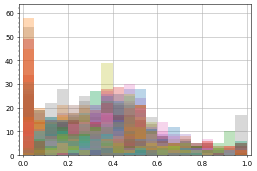

In [31]:
%time

# hard copy of the last order (p - precision, r - recall, f - f1 score)
p0_array=[]
r0_array=[]
f0_array=[]

# prediction
p_array=[]
r_array=[]
f_array=[]

# hard copy of the second last order (to compare to test)
p0t_array=[]
r0t_array=[]
f0t_array=[]

# test
pt_array=[]
rt_array=[]
ft_array=[]

#extra info on model training
nord_array=[]     # n. of orders
npro_array=[]     # n. of products
nepochs_array=[]  # n. of epochs
t_array=[]        # time
thres_array=[]    # prob threshold

t0_tot = dt.now()

for i,u in enumerate(users):

    t0 = dt.now()

    #per customer
    print('------------')
    print(i,') user id =',u)   
    
    #reduce to only the order number and the products in it,separately for all and reorders only 
#    allorders = o[(o['user_id'] == u) & (o['reordered'] == 0)][['order_number','product_id']]
    reordered = o[(o['user_id'] == u) & (o['reordered'] == 1)][['order_number','product_id']]
#    display(reordered)
    
    #now one-hot encoding
#    ohe_all = pd.get_dummies(allorders,columns=['product_id'])
    ohe_reo = pd.get_dummies(reordered,columns=['product_id'])
    #fix column names to product id
#    cols_all = [col.split("_")[-1] if 'product' in col else col for col in ohe_all.columns ]
    cols_reo = [col.split("_")[-1] if 'product' in col else col for col in ohe_reo.columns ]
#    ohe_all.columns = cols_all
    ohe_reo.columns = cols_reo
#    print(ohe_reo)
    
    #for each order, sum over products
#    X_all = ohe_all.groupby('order_number').sum()
    X_reo = ohe_reo.groupby('order_number').sum()
#    display(X_all)
    display(X_reo)
    
    #save product ids
#    pid_all = X_all.columns   
    pid_reo = X_reo.columns
#    print(pid_reo)
    
    #covert to numpy
#    xa = X_all.to_numpy()
    xr = X_reo.to_numpy()
    
#    print(Xr)
        
    nord_array.append(xr.shape[0])
    npro_array.append(xr.shape[1])
    
#   copy last order
    p0 = 0; r0 = 0; f0 = 0

    if xr.shape[0] > 1:
        p0,r0,f0 = individual_score(xr[-1], xr[-2])
     
    p0_array.append(p0)
    r0_array.append(r0)
    f0_array.append(f0)
    
#   copy second last order, to compare to test (so shift both by -1)
    p0t = 0; r0t = 0; f0t = 0
    
    if xr.shape[0] > 2:
        p0t,r0t,f0t = individual_score(xr[-2], xr[-3])

    p0t_array.append(p0t)
    r0t_array.append(r0t)
    f0t_array.append(f0t)   
    
    #sliding window, one for training, one for testing, one for predicting
    nord = xr.shape[0]-3
    npro = xr.shape[1]
    print('norders,nproducts=',nord,npro)
    
    #if not enough orders to run LSTM, fill with -1
    if nord < 1:
        
        p_array.append(-0.1)
        r_array.append(-0.1)
        f_array.append(-0.1)
        
        pt_array.append(-0.1)
        rt_array.append(-0.1)
        ft_array.append(-0.1)
        
        nepochs_array.append(-1.)
        t_array.append(-1.)
        thres_array.append(-1.)
        
        print('Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<')
        continue
    
    # A simple LSTM + Dense layer
    model = Sequential()
    model.add(LSTM(npro, activation='relu', input_shape=(nord,npro),return_sequences=False))
    model.add(Dense(npro, activation='sigmoid'))
    model.summary()
    model.compile(loss='binary_crossentropy', optimizer='adam')
    
    x_train = xr[0:nord,:]
    x_test  = xr[1:nord+1,:]
    x_pred  = xr[2:nord+2,:]
    
    y_train = xr[-3,:]
    y_test  = xr[-2,:]
    y_pred_true  = xr[-1,:]
    
    print(xr.shape)
    print(x_train.shape,y_train.shape)
    print(x_test.shape,y_test.shape)   
    
    # RNNs need 3dim input for x and 2dim for y
    # we don't have sample dimension so need to set it to 1
    
    x_train = x_train.reshape(1,x_train.shape[0],x_train.shape[1])
    x_test = x_test.reshape(1,x_test.shape[0],x_test.shape[1])
    x_pred = x_pred.reshape(1,x_pred.shape[0],x_pred.shape[1])
    
    y_train = y_train.reshape(1,y_train.shape[0])
    y_test = y_test.reshape(1,y_test.shape[0])   

    
    h = model.fit(x_train, y_train,validation_data=(x_test, y_test),epochs=500,callbacks=[callback],verbose=0)
    
    y_pred = model.predict_step(x_pred)
    y_test_pred = model.predict_step(x_test)
    
    plt.hist(y_pred[0].numpy(),alpha=0.3,bins=20,range=(0,1))
    
#    thres=0.5
    thres = find_threshold(y_test[0], y_test_pred[0].numpy())
    print('thres=',thres)
    
    y_pred_class  = np.where(y_pred[0].numpy()  > thres, 1, 0)
    y_test_pred_class  = np.where(y_test_pred[0].numpy()  > thres, 1, 0)
    
    p,r,f = individual_score(y_pred_true, y_pred_class)
    pt,rt,ft = individual_score(y_test[0], y_test_pred_class)
    
    print('copyTest: Pre={:.2f} Rec={:.2f} F1={:.2f}'.format(p0t,r0t,f0t))
    print('test:     Pre={:.2f} Rec={:.2f} F1={:.2f}'.format(pt,rt,ft))
    print('copyLast: Pre={:.2f} Rec={:.2f} F1={:.2f}'.format(p0,r0,f0))
    print('pred:     Pre={:.2f} Rec={:.2f} F1={:.2f}'.format(p,r,f))
    print('true:',y_pred_true)
    print('pred:',y_pred_class)
    print(y_pred[0].numpy().round(2))
    
    p_array.append(p)
    r_array.append(r)
    f_array.append(f)
    
    pt_array.append(pt)
    rt_array.append(rt)
    ft_array.append(ft)
    
    t1 = dt.now()
    print('Time (sec):',(t1-t0).total_seconds())
    
    nepochs_array.append(len(h.history['loss'])-n_clbks)
    t_array.append((t1-t0).total_seconds())
    thres_array.append(thres)
    
t1_tot = dt.now()
print('Total time (min):',round((t1_tot-t0_tot).total_seconds()/60,2))

The plot above shows product probabilities per model(1k colors).

Below, baseline and model prediction:

In [32]:
print('CopyLast baseline:')
print('Mean Precision:',round(np.mean(p0_array),3))
print('Mean Recall:',round(np.mean(r0_array),3))
print('Mean F1:',round(np.mean(f0_array),3))

CopyLast baseline:
Mean Precision: 0.392
Mean Recall: 0.365
Mean F1: 0.347


In [34]:
print('Prediction:')
print('Mean Precision:',round(np.mean(p_array),3))
print('Mean Recall:',round(np.mean(r_array),3))
print('Mean F1:',round(np.mean(f_array),3))

Prediction:
Mean Precision: 0.265
Mean Recall: 0.517
Mean F1: 0.307


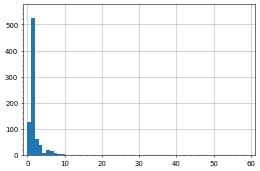

In [35]:
# time per model in seconds
plt.hist(t_array,bins=60,range=(0,60));

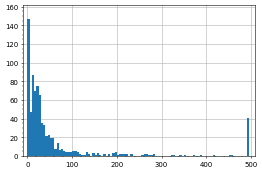

In [38]:
# n of epochs per model
plt.hist(nepochs_array,bins=100,range=(0,500));

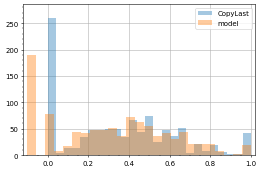

In [39]:
# f1 score distribution
plt.hist(f0_array,bins=25,alpha=0.4,label='CopyLast')
plt.hist(f_array,bins=25,alpha=0.4,label='model')
plt.legend();

f1_model vs f1_CopyLast:

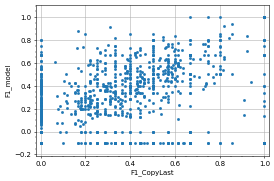

In [40]:
 plt.plot(f0_array,f_array,'o',markersize=3);plt.xlabel('F1_CopyLast');plt.ylabel('F1_model');

In [41]:
# the difference CopyLast-Prediction
df = np.subtract(f0_array,f_array);

x0= 0.04 ,sigma= 0.3


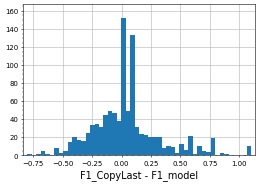

In [42]:
plt.hist(df,bins=50); plt.xlabel('F1_CopyLast - F1_model',fontsize=14);

from scipy.stats import norm

mu, sigma = norm.fit(df)
print('x0=',round(mu,2),',sigma=',round(sigma,2))

f1_model vs norders, nproducts, nproducts/norders:

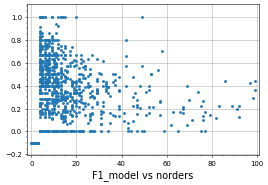

In [43]:
plt.plot(nord_array,f_array,'o',markersize=3); plt.xlabel('F1_model vs norders',fontsize=14);

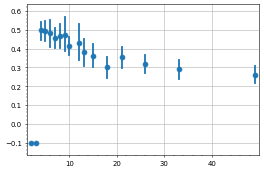

In [44]:
# profile plot, f1 vs number of orders
sns.regplot(x=nord_array, y=f_array, x_bins=20,fit_reg=None);

does better for only a few orders

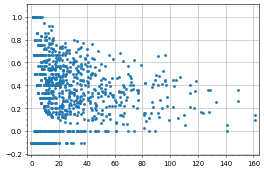

In [45]:
# versus number of products
plt.plot(npro_array,f_array,'o',markersize=3);

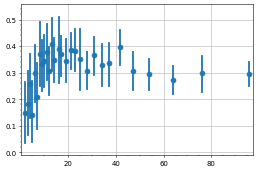

In [46]:
# profile plot, f1 vs n. of products
sns.regplot(x=npro_array, y=f_array, x_bins=30,fit_reg=None);

In [47]:
# f1 versus the ratio n_products/n_orders (per customer)
av_po = [p/o if o != 0 else -2 for p,o in zip(npro_array,nord_array)]

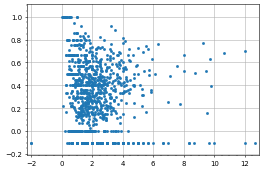

In [48]:
plt.plot(av_po,f_array,'o',markersize=3);

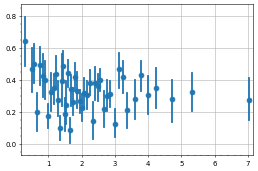

In [49]:
sns.regplot(x=av_po, y=f_array, x_bins=50,fit_reg=None);

Save results to files:

In [50]:
with open('./data/individual_1000customers_baseline.pkl', 'wb') as f:
        pickle.dump((f0_array,p0_array,r0_array,f0t_array,p0t_array,r0t_array), f)

In [51]:
with open('./data/individual_1000customers_LSTM.pkl', 'wb') as f:
        pickle.dump((f_array,p_array,r_array), f)

In [52]:
with open('./data/individual_1000customers_LSTM_test.pkl', 'wb') as f:
        pickle.dump((ft_array,pt_array,rt_array), f)

In [53]:
with open('./data/individual_1000customers_LSTM_model.pkl', 'wb') as f:
        pickle.dump((nord_array,npro_array,t_array,nepochs_array,thres_array), f)